# Report 

In [20]:
import ConfigParser
from my_suite_helpers.pdf_reader import read_to_clean
from my_suite_helpers.utils import dataset_genreator, precision, recall, f_measure
from my_suite_helpers.ATE_method import tf
from my_suite_helpers.term_grouping import term_grouping, jaro_sim
from my_suite_helpers.thd import thd
import timeit
import json
import ate
from os import listdir
import pandas as pd
import numpy as np

# GLOBAL
pdf_folder = "data/time"
txt_folder = "data/txt"
clean_txt_folder = "data/clean_txt"
golden_st_path = "hands-on/D22.txt"

In [16]:
reference_file_time = "hands-on/time-onto-paper/MyTimeOnto-Paper-manually-extracted-terms.csv"
terms_gs_df_time = pd.DataFrame.from_csv(reference_file_time, sep=';')
term_gs_agg_time= terms_gs_df_time.groupby(['term'])['num'].agg([np.sum])

terms_gs_df = pd.DataFrame.from_csv(golden_st_path, sep=';')
term_gs_agg = terms_gs_df.groupby(['term'])['num'].agg([np.sum])

orders = ['chrono', 'rev-chrono', 'bi-dir', 'random']
order = 'chrono'
num_input = len([f for f in listdir(clean_txt_folder)])
compare_to_c_value = True # c-value is very slow, so I disabled comparing

config = ConfigParser.ConfigParser()
config.readfp(open('config.ini'))
min_term_length = int(config.get('main', 'min_term_length'))
min_term_words = int(config.get('main', 'min_term_words'))
stopwords = json.loads(config.get('main', 'stopwords'))
term_patterns = json.loads(config.get('main', 'term_patterns'))

term_extractor = ate.TermExtractor(stopwords=stopwords, term_patterns=term_patterns, min_term_words=min_term_words,
                                   min_term_length=min_term_length)


C:\Users\kzorina\AppData\Local\Continuum\anaconda3\envs\python2.7\lib\site-packages\ipykernel_launcher.py:2: FutureWarning: from_csv is deprecated. Please use read_csv(...) instead. Note that some of the default arguments are different, so please refer to the documentation for from_csv when changing your function calls
  
C:\Users\kzorina\AppData\Local\Continuum\anaconda3\envs\python2.7\lib\site-packages\ipykernel_launcher.py:5: FutureWarning: from_csv is deprecated. Please use read_csv(...) instead. Note that some of the default arguments are different, so please refer to the documentation for from_csv when changing your function calls
  """


## Stage 1. Reading from PDF and cleaning

In [4]:
# time = 541.463303506 s
start = timeit.default_timer()
read_to_clean(pdf_folder, clean_txt_folder)
stop = timeit.default_timer()
print("Elapsed time: {} s".format(stop-start))

Stage 1. Reading from PDF and cleaning
error reading file ('data/time', 'TIME-1994-1(1)-paper-12.pdf'). Skipping it
error reading file ('data/time', 'TIME-1994-1(1)-paper-19.pdf'). Skipping it
error reading file ('data/time', 'TIME-1994-1(1)-paper-3.pdf'). Skipping it
error reading file ('data/time', 'TIME-1995-1(1)-paper-17.pdf'). Skipping it
error reading file ('data/time', 'TIME-1995-1(1)-paper-7.pdf'). Skipping it
error reading file ('data/time', 'TIME-1996-1(1)-paper-03.pdf'). Skipping it
error reading file ('data/time', 'TIME-1999-1(1)-paper-10.pdf'). Skipping it
error reading file ('data/time', 'TIME-1999-1(1)-paper-3.pdf'). Skipping it
error reading file ('data/time', 'TIME-1999-1(1)-paper-9.pdf'). Skipping it
error reading file ('data/time', 'TIME-2000-1(1)-paper-6.pdf'). Skipping it
error reading file ('data/time', 'TIME-2004-1(1)-paper-13.pdf'). Skipping it
error reading file ('data/time', 'TIME-2004-1(1)-paper-14.pdf'). Skipping it
Elapsed time: 465.03720292 s


All results are saved to clean_txt folder.
##### Elapsed time: 465 seconds

## Stage 2. Generating dataset

In [24]:
start = timeit.default_timer()
dataset = dataset_genreator(order, num_input, clean_txt_folder)
stop = timeit.default_timer()
print("Elapsed time: {} s".format(stop-start))

Getting 424 docs in chrono order
Elapsed time: 4.08906234897 s


Generator accepts 'chrono', 'rev-chrono', 'bi-dir', 'random' orders.
##### Elapsed time: 4.08906234897 seconds for 424 docs

## Stage 3. ATE Method

I used tf for terms extraction.

In [23]:
compare_to_c_value = False
num_input = len([f for f in listdir(clean_txt_folder)])

In [25]:
terms = term_extractor.extract_terms(dataset)
print("Starting ATE on extracted terms...")
start_my_ate = timeit.default_timer()
my_ate_terms_df = tf(terms)
stop_my_ate = timeit.default_timer()
print("Elapsed time for my ATE Method: {} s".format(stop_my_ate - start_my_ate))
if num_input == len([f for f in listdir(clean_txt_folder)]):
    print("Metrics with golden standart from {}".format(golden_st_path))
    print("Precision = {}".format(precision(my_ate_terms_df['term'].tolist(), term_gs_agg.index.values.tolist())))
    print("Recall = {}".format(recall(my_ate_terms_df['term'].tolist(), term_gs_agg.index.values.tolist())))
    print("F measure = {}".format(f_measure(my_ate_terms_df['term'].tolist(), term_gs_agg.index.values.tolist())))

else:
    print("Not enough documents to check precision with GS. \n ")
    # print("Precision = {}".format(precision(my_ate_terms_df['term'].tolist(), term_gs_agg_time.index.values.tolist())))
    # print("Recall = {}".format(recall(my_ate_terms_df['term'].tolist(), term_gs_agg_time.index.values.tolist())))
    # print("F measure = {}".format(f_measure(my_ate_terms_df['term'].tolist(), term_gs_agg_time.index.values.tolist())))
print("")
if compare_to_c_value:
    print("Start measurements for comparison")
    start = timeit.default_timer()
    c_value_terms = term_extractor.c_values(terms, trace=True)
    stop = timeit.default_timer()
    print("Elapsed time for reference c-value Method: {} s".format(stop - start))
    terms_cvalue_df = pd.DataFrame(c_value_terms)
    if num_input == len([f for f in listdir(clean_txt_folder)]):

        print("Metrics with golden standart from {}".format(golden_st_path))
        print("Precision = {}".format(precision(terms_cvalue_df[0].tolist(), term_gs_agg.index.values.tolist())))
        print("Recall = {}".format(recall(terms_cvalue_df[0].tolist(), term_gs_agg.index.values.tolist())))
        print("F measure = {}".format(f_measure(terms_cvalue_df[0].tolist(), term_gs_agg.index.values.tolist())))
    else:
        print("Not enough documents to check precision with GS. \n ")


1 / 135079 Localized Temporal Reasoning: A State-Based Approach  Shieu-Hong Lin and Thomas Dean  Department of Computer Science  Brown University, Providence, RI 02912  Abstract  We are concerned with temporal reasoning  problems where there is uncertainty about  the order in which events occur.
2 / 135079 The task  of temporal reasoning is to derive an event  sequence consistent with a given set of ordering constraints immediately following  which one or more conditions have specied statuses.
3 / 135079 Previous research shows  that the associated decision problems are  hard even for very restricted cases.
4 / 135079 In  this paper, we present a framework of localized temporal reasoning which use subgoals and abstraction to exploit structure  in temporal ordering and causal interaction.
5 / 135079 We investigate (1) locality regarding ordering constraints that group events  hierarchically into sets called regions, and  (2) locality regarding causal interactions  among regions, which 

62 / 135079 Figure 1 describes an example problem instance.
63 / 135079  The world state is modeled by a set of conditions  P = fa b c d e f g hg.
64 / 135079  The initial state is described by I .
65 / 135079 All the conditions are initially true except that h is false.
66 / 135079  E = fe1  e2  e3 e4 e5  e6g.
67 / 135079 Each event in E is  associated with a causal rule while in general  an event can be associated with multiple causal  rules.
68 / 135079  Figure 2 depicts the ordering constraints on  E .
69 / 135079 (For notational convenience, we use W  as an alias name for E .)
70 / 135079 The events in the  three event subsets X , Y , and Z must occur  as three atomic groups, where X = fe1  e2g,  Y = fe3  e4 g,Z = fe5 e6 g. The events in Y  must occur before the events in X .
71 / 135079 Event e1  must occur before event e2 .
72 / 135079 Our task is to (1) determine the existence of event  sequences consistent with O such that the goal G =  f(a false) (b fals

153 / 135079 The task of temporal reachability can be viewed  as search for a path from a root node u0 to any goal  node t where  (1) u0 is the node in which all events are marked as  not yet occurred, and the conditions in P have the  specied initial statuses given by I , and  (2) a node t is a goal node if all events are indicated  as occurred and the conditions have the statuses specied by the goal G .
154 / 135079 Since an edge in G = (V A) models the occurrence of  an event, such a path corresponds to a possible event  sequence immediately following which the conditions  have the statuses specied in G .
155 / 135079 5.2 Local Reasoning in Local Search Spaces  In the following, we consider the kind of problem instances (hP  I  G  E  Oi) where the events in E form  a region hierarchy according to a set of hierarchical  ordering constraint O.
156 / 135079 Instead of reasoning about  (1) the whole set of events and (2) the whole set of  conditions to achieve the goal, we can c

206 / 135079 The subgoal in  e6 is always achieved, since e6 can only make h false  and h is false initially.
207 / 135079 At the second level of the region hierarchy, we conduct local reasoning regarding the regions X , Y and  Z respectively.
208 / 135079 The subgoal in region X (Y ) is that  b (e) must be true (false) after all the events in region X (Y ) occur, while we have null subgoal in region Z .
209 / 135079 We call procedure Region-Abstraction to  determine the abstract event eX (eY and eZ respectively).
210 / 135079 At the top level, the subgoal in regionW is to make  the conditions a and d true after all events occur.
211 / 135079 Here the child regions X , Y and Z are treated as  the abstract events eX , eY , eZ respectively.
212 / 135079 We call  procedure Region-Abstraction to determine eW .
213 / 135079 Finally, we call procedure Generate-Sequence to  derive a solution sequence, given that the coupling  conditions a and d of region W are initial true.
214 / 135079 Proce

271 / 135079 Rather it models objective chance by formalizing the properties that characterize objective chance.
272 / 135079 Thus while frequentist theories have diculty assigning meaningful probabilities to unique events like a  sh jumping out of the water at a given location and  time, our model has no problem in assigning nontrivial probabilities to such events.
273 / 135079 Our model of objective chance and subjective probability is motivated  by the subjectivist theories of objective chance 6, 8,  9], which dene chance in terms of properties that  one would expect a rational agent to believe objective  chance to possess.
274 / 135079 This distinction between the frequentist theory of  probability and our conception of objective chance puts  the present work in sharp contrast with Bacchus's 1]  logic of statistical probabilities which models exactly  relative frequency type probabilities.
275 / 135079 One telling dierence between the two logics is that Bacchus's logic Lp  assi

331 / 135079 1  Since R just represents the indistinguishability of histories up to a time t, for a xed time R is an equivalence  relation, i.e., re exive, symmetric, and transitive:  (C2) R(t w w)  If R(t w1 w2) then R(t w2 w1)  If R(t w1 w2) and R(t w2 w3) then R(t w1 w3)  As mentioned earlier, facts and events dier in their  temporal properties.
332 / 135079 This distinction is captured by  the following two semantic constraints.
333 / 135079 If a fact holds  over an interval, it holds over all subintervals, except  possibly at the endpoints:  (C3) If t1t2tt4 t1 6= t3  t2 6= t4  fa 2 FA  and hht1 t4i wi 2 fa then hht2  t3i wi 2 fa :  An event token occurs only once in each world-history:  (C4) If evt 2 EVENTS , hht1 t2i wi 2 evt, and  hht3  t4i wi 2 evt then t1 = t3 and t2 = t4 .
334 / 135079 If two worlds are indistinguishable up to a time then  they must share a common past up to that time.
335 / 135079 And  if they share a common past up to a given time, 

439 / 135079 =               tcp    t      t              Proof: We prove a slightly more general result of which  the above sentence is an instance.
440 / 135079 By the Subjective/Objective Miller's Principle,  8 t t0 t  t0 (t0  t0 ) ^ (t  t0) !
441 / 135079 (19)  P ( ^ pr ( ) = ) =   P (pr ( ) = )  Since valid formulas have probability one, it follows by  Theorem 6 that,  8 t t0 t  t0  t  t0 (t0  t0 ) ^ (t  t0) !
442 / 135079 (20)  P ( ^ pr ( ) =  ^ pr ( ) = 0 _ pr ( ) = 1]) =    P (pr ( ) =  ^ pr ( ) = 0 _ pr ( ) = 1])  Since pr ( ) = 0 and pr ( ) = 1 are mutually exclusive, we have  8 t t0 t  t0 (t0  t0 ) ^ (t  t0) !
443 / 135079 (21)  P ( ^ pr ( ) =  ^ pr ( ) = 0) +  P ( ^ pr ( ) =  ^ pr ( ) = 1) =    P (pr ( ) =  ^ pr ( ) = 0) +    P (pr ( ) =  ^ pr ( ) = 1)  Now we have three cases to consider: i)  = 0, ii)  = 1,  iii) 0 <  < 1.
444 / 135079       t0  t            t0  t  t0  t0  t  t0  t  t0  t0  t0  t0  t0    

496 / 135079 He points  out that this could be used as a rule for inferring degrees  of belief from statistical information.
497 / 135079 Bacchus 1] presents a logic essentially identical to  that of Halpern.
498 / 135079 He goes further than Halpern in exploring the inference of degrees of belief from statistical  probabilities.
499 / 135079 According to his principle of direct inference, an agent's belief in a formula is the expected  j  n  i  j  value with respect to the agent's beliefs of the statistical probability of that formula, given the agent's set of  accepted objective assertions.
500 / 135079 References  1] F. Bacchus.
501 / 135079 Representing and Reasoning With  Probabilistic Knowledge.
502 / 135079 MIT Press, Cambridge,  Mass, 1990.
503 / 135079 2] P. Haddawy.
504 / 135079 Believing change and changing belief.
505 / 135079 Technical Report TR-94-02-01, Dept.
506 / 135079 of  Elect.
507 / 135079 Eng.
508 / 135079 & Computer Science, University of  Wisconsin-Milwaukee, Fe

644 / 135079 Always off  Always on  switch  light bulb  Defective bulb  battery  Defective wiring  or switch  Defective battery  (a) The Circuit  (b) The Network  PDF(wiring or switch|off)  PDF(wiring or switch | on)  hours  10  10,000  10  PDF(battery | off)  25  10,000  hours  PDF(bulb| off)  hours  1,000  hours  is the life time of the torch, expected to be some tens  of thousands of hours.
645 / 135079 Replacement of a component  can be represented by simply shifting the corresponding density function to start at the replacement time.
646 / 135079 Section 4 justies such a shift within the temporal formalism.
647 / 135079 At time t, the probability malfunction Mj is  caused by the failure of component ci is given by  t  P (cijMj ) = P DF(ci jMj )dt  0  where P DF is the probability density function.
648 / 135079 Z  3.2 Dependent (Related) Time Instants or  Periods  Now, suppose the observer, in the family-out example  is monitoring the status of the light and the barking  of the do

707 / 135079 In a Bayesian network representation, these interactions are reected  by dependencies in the joint probabilities.
708 / 135079 Consider for example the relation between leaving-home,  arriving-at-work and crowded-streets.
709 / 135079 The probability of arriving-at-work at 9:00 as a result of leavinghome at 8:30 given that the streets are crowded is  dierent from the probability if the the streets are  not crowded.
710 / 135079 Possible causes for crowded-streets are  rain, accident or construction.
711 / 135079 In general the transfer  function can depend on time, rain causes crowdedstreets only if it rains during the rush hour for more  than 15 minutes, for example.
712 / 135079 There may be also  causal dependencies between events: e.g.
713 / 135079 rain makes  accident more probable.
714 / 135079 Dealing with this type of situation requires that the temporal prole of the joint  probability distribution is known.
715 / 135079 In some situations the interaction betwee

775 / 135079 A model for reasoning about persistence and causation.
776 / 135079 Computational Intelligence, 5(3):142{150, August 1990.
777 / 135079 J. Glynn.
778 / 135079 A discrete-time storage process with  a general release rule.
779 / 135079 Journal of Applied Probability, 26:566{583, 1989.
780 / 135079 P. Haddawy.
781 / 135079 A temporal probability logic for  representing actions.
782 / 135079 In Proc.
783 / 135079 of the 1991  Conference on Knowledge Representation, pages  313{324, 1991.
784 / 135079 M. Hamburg.
785 / 135079 Statistical Analysis for Decision  Making, 4th ed.
786 / 135079 HBJ Publishers, Orlando, FL,  1987.
787 / 135079 S. Hanks.
788 / 135079 Representing and computing temporally scoped beliefs.
789 / 135079 In Proc.
790 / 135079 of AAAI- 88, St.  Paul, MN, pages 501{505, 1988.
791 / 135079 T. Hutchinson.
792 / 135079 A note on applications of the  competing risks model.
793 / 135079 Accident Analysis and  Prevention, 15(3):225{226, 1983.
794 / 135079 J. Kalbei

852 / 135079 Time-points are  unique points in time at which events take place  instantaneously.
853 / 135079 Time-intervals are represented as  pairs of time-points.
854 / 135079 EC also embodies a notion of  default persistence according to which properties are  assumed to persist until an event occurs which terminates them.
855 / 135079 A specic domain evolution is called an  history and is modeled by a set of event occurrences  (event instances).
856 / 135079 The calculus allows us to infer a  set of time intervals over which the properties initiated and/or terminated by event occurrences maximally hold (property instances).
857 / 135079 Instances of events  and properties are obtained by attaching a time-point  and a time-interval to event and property types and  are denoted by the pairs (event,time-point) and (property, time-interval), respectively1 .
858 / 135079 Formally, we represent event occurrences by means of the happens at  predicate:  happens_at(event,timePoint).
859 / 

915 / 135079 3  The 2nd argument in the 4-argument version of initiates at and terminates at allows to statically inspect domain axioms in order to detect dependencies among properties as shown in Section 3.2.  update  terminates(pwrFail, ],pwrAvail,T):happens_at(pwrFail,T).
916 / 135079 initiates_at(turnOn, pwrAvail],lightsOn,T):happens_at(turnOn,T),  holds_at(pwrAvail,T).
917 / 135079 terminates_at(turnOff, pwrAvail],lightsOn,T):happens_at(turnOff,T),  holds_at(pwrAvail,T).
918 / 135079 update  Init  breaking  I  extending  I  update  Termin  breaking  T  extending  T  initiates_at(pwrRstr, switchOn],lightsOn,T):happens_at(pwrRstr,T),  holds_at(switchOn,T).
919 / 135079 terminates_at(pwrFail, switchOn],lightsOn,T):happens_at(pwrFail,T),  holds_at(switchOn,T).
920 / 135079 On the contrary, in the case of basic EC the modeler would be forced to use context-independent initiates at and terminates at predicates also to represent context-dependent knowledge.
921 / 135079 This can be done

968 / 135079 rightOverlap( T1,T2],P, T3,T4]):T1 lt T3, T3 le T2,  mholds_for(P, T3,T4]).
969 / 135079 (ii) possibly invalidated terminations  RetractedProp is a condition for the termination of property P at the occurrence of event  E and the occurrence time T 4 of E belongs to  T 1 T 2].
970 / 135079 In this case, the left part of the retracted interval T 1 T 2] overlaps the possibly  aected MVI T 3 T 4] for P :  propagateRetract( T1,T2],RetractedProp):clause(terminates_at(E,PropList,P,_),_),  memberchk(RetractedProp,PropList),  happens_at(E,T4),  leftOverlap( T1,T2],P, T3,T4]),  retractForLeftOverlap(P,T1, T3,T4]),  fail.
971 / 135079 leftOverlap( T1,T2],P, T3,T4]):T1 lt T4, T4 le T2,  mholds_for(P, T3,T4]).
972 / 135079 The clauses for propagateRetract end with a fail predicate in order to cause the examination of all aected  properties.
973 / 135079 When no more initiations and terminations are left to examine, a third clause guarantees  success:  propagateRetract(_,_).
974 /

1016 / 135079 We  show that the cost of query processing in CEC, with  and without context-dependency, is linear, and that  the complexity of CEC update processing is less than  the complexity of EC query processing except in the  case of context-independency where it is equal.
1017 / 135079 In  all proofs we assume the strong interpretation of initiates at and terminates at predicates.
1018 / 135079 It is possible  to show that in the case of weak interpretation the  worst-case analysis leads to the same results.
1019 / 135079 We only  sketch out the structure of proofs the details can be  found in 6].
1020 / 135079 4.1 The complexity of query processing in  EC  We initially consider the case of a database with  only context-independent denitions of initiates at  and terminates at.
1021 / 135079 It is possible to prove the following theorem.
1022 / 135079 Theorem 4.1  The complexity of EC query processing, measured in  terms of accesses to happens at facts, is O(n3 ), where  n is th

1077 / 135079 The complexity of update processing in CEC is indeed equal to the complexity of query processing in EC.
1078 / 135079 In the more significant context-dependent case (Lbk = Lfw 1), CEC  allows us to obtain an absolute improvement in performance because the order of complexity of update  processing in CEC (Lfw + 3) is strictly lower than  the order of complexity of query processing in EC  ((Lbk + 1)  3).
1079 / 135079 CEC has been fully implemented on a  Sun Sparc2 in Quintus Prolog and extensively tested  in order to ensure that it yields the same outputs as  EC (but much more eciently).
1080 / 135079 Acknowledgements  We would like to thank one of the anonymous referees for the useful and perceptive comments.
1081 / 135079 This work  has been partially supported by the Italian National Research Council (Special Project on Management of Temporal Information in Data and Knowledge Bases), and  the P.A.O.L.A.
1082 / 135079 Consortium, whose members are ASEM  Resolution, INS

1205 / 135079                                 1/16  1/16  1/16  1/16  1/5  1/20 = 3/60  1/20 = 3/60  1/20 = 3/60  1/20 = 3/60                                                  1/16  1/16  1/16  1/16  1/16  1/16  1/5  1/30 = 2/60  1/30 = 2/60  1/30 = 2/60  1/30 = 2/60  1/30 = 2/60  1/30 = 2/60                  3.
1206 / 135079 2  2  6.
1207 / 135079 7.
1208 / 135079 8.
1209 / 135079 9.
1210 / 135079 10.
1211 / 135079 11.
1212 / 135079 4.
1213 / 135079 1  3  12.
1214 / 135079 13.
1215 / 135079 14.
1216 / 135079 15.
1217 / 135079                 1/16  1/16  1/16  1/16  1/5  1/20 = 3/60  1/20 = 3/60  1/20 = 3/60  1/20 = 3/60  5.
1218 / 135079 0  4  16.
1219 / 135079     1/16  1/5  1/5 = 12/60  Figure 1: Carnap's Two Methods (from 3, p. 285])  sorts are: object types, object instances, numbers, and  times.
1220 / 135079 Suitable function and predicate symbols are  associated with each sort.
1221 / 135079 Time invariant assertions  c

1330 / 135079 3.2 Interpolation  Suppose we have the following situation:  Over the year, it rains 40% of the time.
1331 / 135079 During winter (December 21{March 20),  it rains 75% of the time.
1332 / 135079 Over the summer (June 21{September 20), it rains 20%  of the time.
1333 / 135079 What percentage of rainfall occurs during December?
1334 / 135079 What is the  chance of rain on December 24th?
1335 / 135079 We can represent this in PL(T ) by letting the integers 1 through 365 represent the days (i.e., each day  is a time point) and provide axioms such as shown  in Figure 5.
1336 / 135079 Inferences about the rainfall in December or on December 24th based on the given statistical information are in a class of inferences we call  interpolation.
1337 / 135079 These inferences involve using interval statistics to induce subinterval statistics or point  probabilities.
1338 / 135079 For instance, the actual percentage of  rainfall in December is:  P3 = P  rain(t)jr3(t)]t  rain(t)  = R3j

1392 / 135079 New point information (value): So far, there  is has been no reason to choose between Method I  and II.
1393 / 135079 A dierence arises, however, as we incorporate point level observations that aect the predicted  value of interval statistics.
1394 / 135079 To see this, again consider  the example from the previous paragraph about rain  on the day of the party.
1395 / 135079 Suppose we observe the rain  on certain days in December (but not the day of the  party).
1396 / 135079 Let us suppose that, although we have made  these observations, we have not come to learn the  party is not on one of those days.
1397 / 135079 (This could happen,  say, if a friend was telling us about the party and we  had independently observed the weather.)
1398 / 135079 Now suppose each of the days we observed was a rainy day.
1399 / 135079 This should cause us to revise our belief in rain on  the party day, i.e., we should increase our belief in  rain on the party day.
1400 / 135079 Method I

1527 / 135079 The gure 2 summarizes the features of the integration framework.
1528 / 135079 In the following section we show  how it instantiates in the context of a real application.
1529 / 135079 4 Application  We have implemented a system for providing operators with recommendations on which control actions  to take in order to optimize the heating process of  Chambery city.
1530 / 135079 A urban heating system can roughly be described  as interconnected networks of heating components  such as heat exchangers and urban heating power  stations, and mechanical components such as Pump  and Flow pipes.
1531 / 135079 Heat exchangers allow the heating of a secondary  ow, using the heat brought by an incoming primary  ow.
1532 / 135079 Urban heating power stations consume fuel and  gas to produce heat which is transferred to a circulating ow.
1533 / 135079 Heating components are linked together through  ow pipes carrying liquid that transmit heat from  one component to the others.
15

1584 / 135079 Acknowledgements  Thanks to Renaud Zigmann, Roland Yap and the  anonymous referees for their valuable comments on  early drafts of this paper.
1585 / 135079 The research reported  here was carried out in the course of a project partially funded by the \Agence pour la Ma^trise de  l'Energie".
1586 / 135079 The partners in this project are Cofreth,  LIAC-Lyonnaise des Eaux, SCDC and ITMI.
1587 / 135079 References  1] P. CALOUD.
1588 / 135079 Raisonnement Qualitatif.
1589 / 135079 PhD  thesis, INPG, 1989.
1590 / 135079 2] S. DADEBO and R. LUUS.
1591 / 135079 Optimal control  of time-delay systems by dynamic programming.
1592 / 135079 Optimal Control Applications & Methods, 1992.
1593 / 135079 3] F. HAYES-ROTH, D.A.
1594 / 135079 WATERMAN, and  D.B.
1595 / 135079 LENAT.
1596 / 135079 Building Expert Systems.
1597 / 135079 Addison  Wesley, 1983.
1598 / 135079 4] N.C. HEINTZE, J. JAFFAR, S. MICHAYLOV,  P.J.
1599 / 135079 STUCKEY, and R.H.C.
1600 / 135079 YAP.
1601 / 135079

1728 / 135079 Information about the n'th agent  is stored on the plane (x y n): Information that is  common to all agents is stored on the plane (x y 0):  For example, assume there are three agents, and all  three know that block A is on block B at time 5:  on(5,5,0, A,B).
1729 / 135079 Agent 1 also knows that A is on B at  time 6: on(6,6,1, A,B).
1730 / 135079 At time 10, agent 2 plans to  move block C on top of A over the interval (15,20):  move((15,20),10,2, C,A).
1731 / 135079 Agent 3 knows that block  A is red at time 7: red(7,7,3, A).
1732 / 135079 We could also have  the situation where all three agents know a fact, but  don't realize it is common knowledge (i.e., not contained on the 0'th plane).
1733 / 135079 For example, each agent  has local knowledge that block B is blue at time 10:  blue(10,10,1, B),  blue(10,10,2, B),  blue(10,10,3, B).
1734 / 135079 Each agent does not know that the other 2 agents  also have the information that B is blue at time 10.
1735 / 135079 In

1859 / 135079 If an  abstract interval has only one subinterval, then  the minimal label on the decomposition edge is  obviously {eq}, that is:  A(Cii )c xi ⇔ xi Cii xi ∧ (A = xi ) ⇔  xi {eq}xi ∧ (A = xi ) ⇔ A{eq}xi  In the case of two subintervals, we can derive  from the definition:  A(Cii ,Cij )c xi ⇔ xi Cii xi ∧ xi Cij x j ∧ (A = xi + x j )  ⇔ xi {eq}xi ∧ xi Cij x j ∧ (A = xi + x j )  Since xi {eq}xi always holds for an interval (the  so-called node consistency), we define the  basic closure operation on a constraint as:  A Cijc xi ⇔ xi Cij x j ∧ (A = xi + x j ) .
1860 / 135079 Lemma 1: Given Cij as a set of basic relations  R1 , R2 ,..., Rm , the basic closure Cijc can be  computed as {R1c , R2c ,..., Rmc}, where Rc is one of  the four basic relations: si, di, fi, and eq, as  defined in table 1.
1861 / 135079 R  Table 1: basic closure on basic relations  b bi m mi o oi s si d di f fi eq  Rc si fi si fi si fi si eq di eq fi eq eq  The validity of table 1 can be easily  verified.
18

1965 / 135079 A.
1966 / 135079 1983.
1967 / 135079 Planning  using a temporal world model.
1968 / 135079 Proceedings of the  Eighth International Joint Conference on Artificial  Intelligence, pp.
1969 / 135079 741-747.
1970 / 135079 CARBERRY, S. 1986.
1971 / 135079 Pragmatic modeling in  information system interfaces.
1972 / 135079 Ph.D. Dissertation,  University of Deleware.
1973 / 135079 GOLDMAN, R., and CHARNIAK, E. 1988.
1974 / 135079 A  probabilistic ATMS for plan recognition.
1975 / 135079 Proceedings of the AAAI Workshop on Plan  Recognition.
1976 / 135079 KAUTZ, H. A.
1977 / 135079 1987.
1978 / 135079 A formal theory of plan  recognition.
1979 / 135079 Ph.D. Dissertation, University of  Rochester, Rochester, N.Y.  KOOMEN, J.
1980 / 135079 A.
1981 / 135079 1989.
1982 / 135079 Localizing temporal constraint  propagation.
1983 / 135079 Proceedings of the First International  Conference on Principles of Knowledge  Representation and Reasoning, Toronto, Ontario,  Canada, pp.
1984 / 

2094 / 135079 When propagating a constraint, other  label of the network may get updated to a subset of  its label.
2095 / 135079 The process of updating of a label as a result  of propagating a constraint is called label renement.
2096 / 135079 The label renement takes the following forms: (1)  The weights of the labels of an arc get changed, or  (2) the primitive relations of a label get reduced.
2097 / 135079 In  either case normalization operation is performed to  ensure the summation of the weights adds to 1.
2098 / 135079 Suppose we are propagating the label Rij of the  arc < I J > to the arc < I K > of the triangle IJK.
2099 / 135079 Let the labels of the arcs < J K > and < I K > are  respectively Rjk and Rik.
2100 / 135079 The new label of the arc  < I K > is computed as Rik \ fRij  Rjkg.
2101 / 135079 When  the new relation is not null the weights on the label  are normalized.
2102 / 135079 3.2 Temporal Constraints Propagation  Algorithm for uncertain constraints  This

2225 / 135079 In the following  denitions, we specically adopt modied  notions of a time sequence introduced in  12].
2226 / 135079 In these denitions we also incorporate the notion of priorities for POWs of  an object.
2227 / 135079 The idea of assigning priorities to possible object worlds is particularly useful in resolving possible conicts  among co-existing possible object worlds  for a particular object and in the metadata.
2228 / 135079 For example, given that an object  has two possible object worlds teaching assistant and research assistant then by assigning priorities to these two POWs we  can determine the object's primary role at  any given time ti .
2229 / 135079 Denition.
2230 / 135079 The Time Sequence of a POW  of an object, denoted as TSEQ(POW) is  dened as  (POWt1 , ..... , POWt ) = (POW,  (t1  t2 :::::  tn )).
2231 / 135079 Thus the lifespan of a POW of an object  can be easily determined since t1 denotes  the valid from time and tn denotes the  valid to t

2286 / 135079 In addition to these  processes there are other implied ones that  are initiated automatically as a result of  some specied relationship.
2287 / 135079 We have used  these concepts to develop a set of specialized temporal operations on objects and  mappings.
2288 / 135079 In the following we describe a  sample subset of such operations.
2289 / 135079 4.1 Create Operations  The set of Create Operations supports  the creation, activation, deactivation, and  context release of objects.
2290 / 135079 In particular,  there are three primitive operations associated with the POW of an object.
2291 / 135079 These  are create-pow, deactivate, and activate.
2292 / 135079 The possible object world of an object may  be created, activated or deactivated using  the following messages:  1. createpow(oid,(ti pk),powid).
2293 / 135079 This operation creates a new POW  for an object.
2294 / 135079 ti is the object's time  of creation and pk is the initial priority assigned to that object

2426 / 135079 In R. Snodgrass,  editor, Proceedings of the Interna-  tional Workshop on Infrastructure  for Temporal Databases Databases,  pages 295{304, Arlington, Texas,  June 1993.
2427 / 135079 11] N. Pissinou, R. Snodgrass, R. Elmasri, I. Mumick, M.T.
2428 / 135079 Ozsu, B. Pernici, A. Segev, and B. Theodoulidis.
2429 / 135079 Towards an infrastructure for temporal databases.
2430 / 135079 Technical Report  TR93, Departmet of Computer Science, University of Arizona, 1993.
2431 / 135079 12] A. Segev and A. Shoshani.
2432 / 135079 Logical  modeling of temporal data.
2433 / 135079 In Proceedings of the ACM SIGMOD International Conference on Management  of Data, pages 454{466, 1987.
2434 / 135079 An application-independent support system for integrated  assumption-based temporal reasoning  Clemens Beckstein  Univ.
2435 / 135079 Erlangen-Nurnberg, IMMD-8  Am Weichselgarten 9  D-91058 Erlangen, Germany  beckstein@informatik.uni-erlangen.de  Abstract  Reason maintenance systems and te

2489 / 135079 The generalized Floyd-Warshall algorithm computes the summary luv of all labels of all paths for  all pairs (u v) of nodes in the graph:  M (p)  luv :=  p=hu:::vi  It can be sketched as follows:  for i j := 1 to n  if i = j then lij := 1  (i j )  else lij := (i j )  for k := 1 to n  for i j := 1 to n  lij := lij  (lik  (lkk )?
2490 / 135079  lkj ).
2491 / 135079 (*)  The  iteration operator ?
2492 / 135079 is dened as a?
2493 / 135079 :=  L1i=0unary  i  a , with a0 := 1 and ai := a ai;1.
2494 / 135079 This algorithm has a time complexity of O(n3 (T +  T ) + n2T?
2495 / 135079 ), where T , T and T?
2496 / 135079 are the time complexities for the corresponding operations.
2497 / 135079 Note that  for the semiring identied in this paper, these operations do not have a constant time complexity because  minimized labels can get arbitrarily large.
2498 / 135079 Since we want to design a hybrid system consisting of the ATMS and the ASTP, we assume in the  fol

2591 / 135079 This produces a new  nogood AB for the ATTMS and all environments that  are a superset of this nogood have to be removed from  the logical labels in the ATMS.
2592 / 135079 In addition, all relative distances with environments which are a superset of the new nogood have to be removed from the  temporal labels in the ASTP.
2593 / 135079 Eventually, the ASTPgraph looks as follows:  #"f  gg  T !
2594 / 135079   0 ]    D  zzzz DDDDDD  z  DDDDf;3B] ;1C ] 1]g  f7A] 1]gzzzzzz  DD  z  z  zzz f4B] 3C ] 1]g DDDDDD  z  DDDD  z z f;6AC ] 1]g  D  zzzzz  f6A] 1]g  0 ]  3  (A ) d5  T2 ; T1  6e) is an abbreviation for the  three justications  (A ) dT2 ; T1  6e) (A ) dT1 ; T2  ;5e)  (dT2 ; T1  6e ^ dT1 ; T2  ;5e ) d5  T2 ; T1  6e).
2595 / 135079 4  A node n with label l(n) is written as hn l(n)i  0 ]    <  "  |  1    T "     !f  g  Now the Floyd-Warshall algorithm must recomplete the temporal labels in the ASTP-graph:  <  3 

2656 / 135079 Problem  solving with the ATMS.
2657 / 135079 Arti cial Intelligence, 28:127{224, 1986.
2658 / 135079 DM87] Dean, T. L. McDermott, D. V.: Temporal  Data Base Management.
2659 / 135079 Arti cial Intelligence, 32:1{55, 1987.
2660 / 135079 DMP91] Dechter, R. Meiri, I. Pearl, J.: Temporal Constraint Networks.
2661 / 135079 Arti cial Intelligence, 49:61{95, 1991.
2662 / 135079 Gei94] Geisler, T.: Ein anwendungsunabhangiges Unterstutzungssystem zum integrierten  annahmenbasierten temporalen Schlie en.
2663 / 135079 Diplomarbeit, Universit!at Erlangen-N!urnberg, IMMD8, 1994.
2664 / 135079 HNP91] Holtzblatt, L. J. Neiberg, M. J. Piazza,  R. L.: Temporal Reasoning in an Assumption Based Reason Maintenance System.
2665 / 135079 Technical Report M91-22, MITRE, Bedford, MA, 1991.
2666 / 135079 IK83] Ibaraki, T. Katoh, N.: On-Line Computation of Transitive Closures of Graphs.
2667 / 135079 Information Processing Letters, 16:95{97,  1983.
2668 / 135079 JR90]  NB93]  Joubel

2719 / 135079 The forward default persistence  rule is implemented by using Negation as Failure on  Clipped in ECI.
2720 / 135079 (ECI ) HoldsAt(f t)   Happens(e)  Initiates(e f )  Date(e ts )  ts < t  not Clipped(ts  p t)  (ECII ) Clipped(ts  f t)   Happens(e )  Terminates(e  f )  Date(e  t )  ts < t   t t  The predicates < and  establish an ordering  on events.
2721 / 135079 We stipulate that temporal constants  T1  T2 T3 : : : are mapped on naturals, and that the  ordering relations are also mapped on the same relations on naturals, thus inheriting their properties.
2722 / 135079 In chapter 3, an improved version of the axioms will be presented in order to deal with hypothetic events.
2723 / 135079 The hypothetic events have no timestamping, so that the problem of integrating the linear order of actual events and the order on those hypothetical is not addressed directly.
2724 / 135079 2.1 The Assumption Underlying Event  Calculus  EC is a formalism based on ne

2771 / 135079 4.1 Alternative Semantics  Beside the stratication-based semantics discussed  above, there have been eorts to provide alternative  semantics for event calculi a rst attempt is probably that of Shanahan12], who discussed a characterization in terms of circumscription.
2772 / 135079 In this section  it is proposed an alternative approach by translation  of Event Calculus formalizations to the language A  of Gelfond and Lifschitz1], which enjoys a declarative semantics purported to actions and uents..
2773 / 135079 The  translation  transforms a set of event descriptions  in terms of Happens, Date etc.
2774 / 135079 into a correspondent  set of A axioms.
2775 / 135079 The result sought after is soundness  and completeness of the translation of an EC domain  description D and of a query ?
2776 / 135079 ; HoldsAt(F T ) into  an domain description  (D) and a v-proposition F  after CD (T ) such that:  D `EC HoldsAt(F T ) ()  (D) j=A F after CD (T )  where the chronicl

2905 / 135079 To do this, we use the  following property of mathematical expectation:  Proposition 3.4 (Expectation of Sums)  For any Z  interval I  Z  E   (t)dt  =  I  Q1  ( ( ))dt:  I  Interval I need not be convex.
2906 / 135079 For example, if I =  (Rx y)Ry (uRvv) and (x y) and (u v) are disjoint, then  I = x + u :  We use Proposition 3.4 and the fact that the points  of the reference interval have the same expected value  for  to derive the following direct inference rule:  Proposition 3.5 (Direct Inference Rule 1)  If R is a maximally specic reference interval for  (t0 ) then R    (t)dt   R  :  E ( (t0 )) = E  jRj  The expected value of  at t0 is equal to the average  value of  over the interval R. Note that this follows trivially from the fact that  has the same value  at every point in R since R is a maximally specic  reference interval.
2907 / 135079 The following property relates subintervals to intervals:  Proposition 3.6 (Direct Inference Rule 2)  If S is

2970 / 135079 We have no information about  False  Uncertain  True  Uncertain  False  100-25  100-15  100  100+15  100+25  Figure 2: The regions of persistence for running  False  Uncertain  True  Uncertain  False  X-t1  X-t2  X  X+t3  X+t4  Figure 3: The general regions of persistence  actions or events that may aect raining.
2971 / 135079 Finally,  Dean and Kanazawa's probabilistic temporal projection 2] cannot be used as it requires the construction  of a survivor function for raining based on many observations of raining changing from true to false.
2972 / 135079 In  our example, we have no observations of raining at  particular points.
2973 / 135079 No solution to the extrapolation  problem appears in the temporal litterature.
2974 / 135079 Our proposed solution to the extrapolation problem is based on the interpolation formula:   R  (t)dt    R  (t)dt   S  E  = E R jRj  jS j  that states we may infer that the proportion of points  in R for which  (t) is true is equal to t

3106 / 135079 For this purpose, we introduce the following expressions:  begin(t, p) means that one of the truth period of  proposition p begins at the instant t. When the  0  0  0  beginning of the interval is known by this way,  the term e(t p) refers to the end (the upper  bound) of this interval.
3107 / 135079 The axiom A2 establishes the relationship with the expression fI pg  where I is an interval.
3108 / 135079 end(t, p) means that one of the truth period of p  ends at the instant t. In the same way as above,  the term b(t p) refers to the lower bound of this  interval.
3109 / 135079 This expression is formally dened by  axiom A3 .
3110 / 135079 persist(t1, t2 , p) means that the interval ]t1 t2] is  included in one of the truth period of p. This  expression is dened by the two axioms A4 and  A5 .
3111 / 135079 The maximality of truth period expressed by formulae like f]t t ] pg entails that the lower bound of  these intervals are really the time when the proposition be

3165 / 135079 This extension handles constrained  resolution and, contrary to the original one, can handle non ground abducible litterals.
3166 / 135079 The original abductive procedure is an extension of SLD-resolution,  and is inspired from the rst one described by Eshghi  and Kowalski in 4] to handle negation as failure in a  abductive fashion.
3167 / 135079 The denition assumes a logic program P (a set  of clauses of the form C L1 : : :Ln , where C is  the head and L1 : : :Ln the body), a set H of predicate symbols called abducible predicate, and a set IC  of integrity constraints (clauses with empty head).
3168 / 135079 The purpose of the original procedure is to nd, for a  query Q, a set " of hypotheses (ground instances of  abducible predicates) such that there exists a stable  model M 6] of P " such that M j= Q and M j= IC.
3169 / 135079 4.1 Denition of the procedure  The particular features of the procedure are the following:   we use the ability for a refutation using co

3198 / 135079 One limitation of the procedure lies in the ability  to handle repeated events: although the logic is able  to describe those situations, the refutation procedure  must be protected for innite queries by a bound on  the depth of the refutation.
3199 / 135079 It should be noted that  those queries do not lead to subsumption between the  current goal and one of its ancestors: it appears to  be a \translation" on the time line.
3200 / 135079 At this moment,  we do not have any mean to identify this relationship, nor can we characterize \translated" goals with  respect to their utility in the refutation process.
3201 / 135079 5 Conclusions  In this paper, we describe an abductive procedure  using a constrained resolution principle.
3202 / 135079 Such a  resolution principle is very useful in the area of  temporal reasoning.
3203 / 135079 Constrained resolution allows  an important gain on eciency by reducing nondeterminism, which is otherwise too much a trouble  in pure re

3342 / 135079 For example, suppose an  automated pilot is tracking an opponent’s turns  and changes in heading while the opponent is  executing its maneuver to fire a missile (see  Figure 1).
3343 / 135079 Suppose just before the opponent  fires its missile (Figure 1-b), the automated  pilot suddenly turns its own aircraft.
3344 / 135079 In  response, the opponent may need to turn its  aircraft again before firing its missile, and its  Fpole (Figure 1-c) may be executed in a  different manner as well.
3345 / 135079 (For detailed  examples of agent interactions in this domain,  see [10].)
3346 / 135079 This dynamic interaction among the  agents leads to the primary constraint on event  tracking in this domain: an agent must be able  to track highly flexible and reactive behaviors  of its opponent(s).
3347 / 135079 This is a challenging  constraint ⎯ previous investigations in the  related  areas  of  plan/situation  recognition [6, 9, 4, 3] and model tracing [2]  have not addressed this

3410 / 135079 We will  refer to these copies as opponent-centered  problem spaces.
3411 / 135079 Operators in these problem  spaces represent Ao’s model of its opponent’s  operators.
3412 / 135079 These operators are denoted using  the  subscript  opponent.
3413 / 135079 Thus,  the  execute-missionopponent operator is used in  modeling an opponent’s execution of her  mission.
3414 / 135079 Similarly, operatoropponent is used to  denote a generic operator used by the  opponent.
3415 / 135079 The global state in these problemspaces represents Ao’s model of the state of its  opponent, and is denoted by stateopponent.
3416 / 135079 We  assume for now that Ao can easily generate an  accurate stateopponent.
3417 / 135079 (Note that we will make  a few such assumptions in explaining event  tracking in this section, and address them later  in Section 3.2.
3418 / 135079 Note also that while this section  does not directly describe the operation of an  actual implementation, it is based on an ac

3538 / 135079 References  1.
3539 / 135079 Allen, J.
3540 / 135079 "Maintaining knowledge about  temporal intervals".
3541 / 135079 Communications of the  ACM 26, 11 (November 1983).
3542 / 135079 2.
3543 / 135079 Anderson, J. R., Boyle, C. F., Corbett,  A. T., and Lewis, M. W. "Cognitive modeling  and intelligent tutoring".
3544 / 135079 Artificial  Intelligence 42 (1990), 7-49.
3545 / 135079 3.
3546 / 135079 Azarewicz, J., Fala, G., Fink, R., and  Heithecker, C. Plan recognition for airborne  tactical decision making.
3547 / 135079 National Conference  on Artificial Intelligence, 1986, pp.
3548 / 135079 805-811.
3549 / 135079 4.
3550 / 135079 Dousson, C., Gaborit, P., and Ghallab, M.  Situation Recognition: Representation and  Algorithms.
3551 / 135079 International Joint Conference on  Artificial Intelligence, 1993, pp.
3552 / 135079 166-172.
3553 / 135079 5.
3554 / 135079 Jones, R. M., Tambe, M., Laird, J. E., and  Rosenbloom, P. Intelligent automated agents  for flight training si

3687 / 135079 The truth is that material implication  is quite dierent from, and much stronger than, the  notion of result.
3688 / 135079 This is the reason it is so much more  di cult to modify Axiom 1 than one might suppose.
3689 / 135079 It is not merely that we have somehow missed something in the formalization.
3690 / 135079 The problems inherent  in material implication have appeared in many suggested modi cations of this axiom as well, since material implication plays a central role in these axioms  as well.
3691 / 135079 This problem strikes a familiar chord.
3692 / 135079 In fact,  there are many types of reasoning, such as counterfactual reasoning, and concepts in temporal reasoning,  such as prevention and causality, that would seem  to be straightforward to implement, but which fail  due to the very strong nature of material implication.
3693 / 135079 One approach to solving such problems has been to  examine these concepts within the framework of a  richer ontology.
3694 

3751 / 135079 If we cannot, the theory is somewhat bogu if we reduce Causes to material implication,  the problems return through the back door.
3752 / 135079 Moreover,  sometimes the fact that one knows how to perform an action act2 after performing an action act1 does not mean  that performing act1 caused the agent to know how to  perform act2.
3753 / 135079 One can imagine a situation in which I  know that I will be told the combination of the safe at  some point late in the day.
3754 / 135079 In the meantime, I spend my  day chopping wood.
3755 / 135079 Now, it is perfectly plausible that I  will know how to open the safe after I chop wood { but I  would not want to say that the wood chopping caused me  to know how to open the safe.
3756 / 135079 Another approach would be to develop an ontology using only \axiomatically possible worlds."
3757 / 135079 The disadvantages here would be that it would be non-intuitive and  hard to modify.
3758 / 135079 the collection of  for all .
3759 

3864 / 135079 Axiom 6:  Physsat(a,`tell(@b,#p#)',s)  For the sake of this paper, it is assumed that there  are no physical preconditions for communicative actions.
3865 / 135079 In reality, there are a variety of preconditions,  including being at the same place as the hearer (or  being connected in some way).
3866 / 135079 Axiom 7:  Primitive-act(`tell')  The simple locutionary action of just uttering a string  is considered to be primitive, with correspondingly  simpler knowledge preconditions.
3867 / 135079 Axiom 8:  Primitive-act(f) )  Know-how-to-perform(a,^f^(^x1,  ,^xn)',s)  where all of x1    xn are constants.
3868 / 135079 An agent knows how to perform any primitive action  if all the arguments are constant.
3869 / 135079 Axiom 9:  Cooperative(a,b,s) )  Socialsat(a,`tell(@b,#p#)',s) , Know(a,p,s)  Cooperative agents are constrained to tell the truth.
3870 / 135079 Axiom 10:  Cooperative(a,b,s1)  Occurs(do(a,ask(b,info)),s1,s2)  ) Goal(b,tell(a,info),s2)  ^  If one agents

3931 / 135079 Denition 2.1 A constraint is a relation (t1 t2 )  where t1  t2 are arithmetic terms and the symbol  represents any of the symbols (= 6= <  > ).
3932 / 135079 Denition 2.2 A generalized clause is an implication of the form  p0 (X0 )  p1(X1 ) : : : pk(Xk ) cl (Xl ) : : : cm (Xm ):  where pi are user dened predicates and cj are constraints.
3933 / 135079 The Xi are vectors of variables.
3934 / 135079 A generalized clause does not have to be range-restricted.
3935 / 135079 This de nition follows that given by Kanellakis et al  12] for a generalized fact.
3936 / 135079 Denition 2.3 A system of generalized clauses form  a database with constraints, called a constraint database.
3937 / 135079 Formulas in the DeCoR system may contain conjunctions (), existential quanti ers (9) as well as  negation (:).
3938 / 135079 Disjunctions have to be represented  by multiple clauses.
3939 / 135079 Without loss of generality, we  assume in the following that clauses and 

4004 / 135079 An instant such as /1994/6/15 00:00:00 will be abbreviated to /1994/6/15.
4005 / 135079 Finally, time intervals are  considered as closed at the lower bound and open at  the upper one.
4006 / 135079 The format for such an interval is  /1994/6/15 { /1994/6/23).
4007 / 135079 3.1 Temporal Datatypes and Relations  While the DeCoR system supports the datatypes  string, integer and real, only constraints over reals can  currently be solved.
4008 / 135079 To apply constraint solving ability to temporal terms, an instant E can be mapped to  a value of type real.
4009 / 135079 This is done by calculating the  number of seconds between E and a reference point,  e.g.
4010 / 135079 /1970/1/1.
4011 / 135079 Example 3.1 The predicate rate shows the instant  and the exchange rate between two currencies  rate(=1993=4=23 13:45:12:4 `US$' `SFR' 1:14)  m  rate(7:251183e + 08 `US$' `SFR' 1:14)  A consequence of the above mapping is that the  best precision is obtained for instants ne

4060 / 135079 The two main goals are improving (1) the eciency of the evaluation of temporal  queries and (2) the readability of temporal clauses  and queries.
4061 / 135079 4.1 Constraints over Temporal Domains  The DeCoR system is extended by the two datatypes  instant and interval.
4062 / 135079 Constants of one of these types  are denoted as described at the beginning of Section 3.
4063 / 135079 In contrast to the ChronoLog system 2, 1],  there is no special syntax for temporal arguments.
4064 / 135079 However, as shown below, the uni cation of temporal arguments has a special semantics.
4065 / 135079 We mention in  passing that this design decision supports the de nition of multiple temporal arguments, e.g.
4066 / 135079 to represent  valid and transaction time.
4067 / 135079 T1 precedes T2  T1 follows T2  T1 contains T2  T1 equals T2  T1 overlaps T2  Table 1: interval interval constraints  T1 before T2  T1 starts T2  T1 during T2  T1 ends T2  T1 after T2  E before T  E starts T

4117 / 135079 { 9 T1 T2 M1 M2  (works in(`John' `Eng' T1)  works in(`John' `Sal' T2)  duration(T1 M1 month)  M2 = 2  M1   duration(T2 M2 month)  E ends T2 ):  the temporal variable E (the result we are looking  for) depends on the non-temporal variable M2 .
4118 / 135079 M2  depends on M1 which in turn depends on the interval  variable T1.
4119 / 135079 The rst call of the temporal solver determines that  the constraint \duration(T1  M1 month)" is evaluable so that M1 becomes ground.
4120 / 135079 The temporal  constraint \duration(T2  M2 month)" remains nonevaluable because the rst argument is suggested to  be only start-ground and the second argument is  non-ground.
4121 / 135079 In the next step, the non-temporal  solver determines \M2 = 2  M1 " as evaluable and  therefore M2 as ground.
4122 / 135079 This enables the temporal constraint solver to identify the constraints  \duration(T2 M2 month)" and \E ends T " as evaluable.
4123 / 135079 This example show

4302 / 135079 A more detailed evaluation of the results can be  found in 6].
4303 / 135079 5 Comparisons with Related Work  Dierent criteria can be considered in order to compare the temporal managers developed in the articial  intelligence literature.
4304 / 135079 A rst important criteria concerns completeness.
4305 / 135079 In LaTeR, as in many articial  intelligence approaches, we choose to retain completeness.
4306 / 135079 since it seems important to us in order to provide users and applications with uncontestable and  reliable results.
4307 / 135079 This rises a trade-o between expressive power and computational complexity of complete  temporal reasoning.
4308 / 135079 As e.g.
4309 / 135079 in Timegraph 11] and  in Tachyon 3] we chose to limit the expressive power  in order to retain tractability.
4310 / 135079 In particular, the expressive power of LaTeR is comparable to that of  Tachyon, which deals with temporal constraints that  can be mapped onto conjunctions of bou

4352 / 135079 Let NS be the minimal network obtained by propagating the constraints in Q to NS (i.e., to all the variables - global propagation in S ) and NG the minimal  network obtained by propagating the constraints in Q  to NG , where NG is the restriction of NS to the variables in G (local propagation)  then NS is consistent if and only if NG is consistent.
4353 / 135079 0  0  0  0  The theorem guarantees that in order to answer  MAY queries of the form:  MAY (C1 AND C2 : : : AND Cn)  it is su cient to propagate the constraints Ci in  the query to the part of the minimal network whose  nodes are the variables in the query (i.e., occurring  in C1 C2 : : : Cn ).
4354 / 135079 Therefore conjunctive MAY queries can be answered in a time that is cubic in the number of variables in the query and that is independent of the dimension of the knowledge base.
4355 / 135079 3.2.3 Hypothetical Queries.
4356 / 135079 Hypothetical queries are queries of the form  Q if C  where Q is a query o

4400 / 135079 Dierent high-level primitives are provided: When,  HowLong, Delay and Relation, which give as answer respectively (1) the temporal location of temporal entities (points or intervals), (2) the duration of  time intervals, (3) the delay between two time points  and (4) the temporal relations between two temporal  entities.
4401 / 135079 These queries can be answered by a simple  lookup in the minimal network.
4402 / 135079 For example, given the knowledge base in gure 1,  the following query could be asked:  HowLong John work?
4403 / 135079 Answer : 4h 50min ; 5h  This query can be answered by simply reading in the  minimal network the maximal admissibility range of  the dierence between the variables corresponding to  the end and start of \John work".
4404 / 135079 As a further example, the following query could be  asked:  Relation Mary work John work  Answer : start(Mary work) After  start(John work)  end(Mary work) non strict Before  end(John work)  Also in such a 

4448 / 135079 LaTeR, moreover, provides a high-level language for  manipulating temporal information the expressive  power of the language has been limited in such a  way that complete constraint propagation can be performed in polynomial time (section 2 sketches those  aspects of LaTeR that are relevant in this paper, see  4, 5] for more details).
4449 / 135079 The paper denes a powerful query language including modal operators for asking whether a set of  assertions follows necessarily from a knowledge base  or it is only possibly true and supporting yes/no  queries, queries for extracting temporal information  and hypothetical queries.
4450 / 135079 We believe that having a  powerful language for querying temporal knowledge  bases is fundamental for the practical applicability of  managers of temporal information.
4451 / 135079 The main goal of the paper is to propose an approach for answering queries eciently in a temporal  knowledge base (section 3).
4452 / 135079 Notice that t

4573 / 135079 Let us now briefly present the properties that are  at the heart of our process:  « Definition 1 »  • A strict minimal precedence (i,j) is a precedence constraint that cannot be entailed by another (by transitivity).
4574 / 135079 • A «strict decomposition» D of a graph G is a  set of clusters (Cu)u=1,..c , corresponding to  overlapping sub-sets of time-points {iu1, ...,  ium}, such that:  ∀i ∈G, ∃ Cu such that i ∈Cu (complete partition upon time-points),  ∀i ∈G, ∀j ∈G, such that (i,j) is a strict minimal precedence, then necessarily ∃ at  least one u such that i ∈Cu, and i ∈Cu  (complete partition upon constraints).
4575 / 135079 • The «neighbour clusters» of a cluster Cu are  Cv1, ..., Cvm such that for each Cvj, ∃ a timepoint ivj such that ivj ∈Cvj and ivj ∈Cu at the  same time.
4576 / 135079 The «clusterised» propagation process will then  be as follows:  • If D is a strict decomposition of G, if (i,j) is a  temporal constraint being modified, then the  propagation pr

4631 / 135079 But  [Erschler,91] as most authors use an O(n3) complexity algorithm that is too expensive in our  application, whereas [Collinot,87] uses focusing techniques that, although enhancing the  propagation efficiency, do not achieve its completeness any longer, and then leads to «deviations» in the decision process.
4632 / 135079 Time and Uncertainty in Reasoning about Order  Robert A. Morris and Dan Tamir  Florida Institute of Technology  Melbourne, FL 32901  email:morris@cs.
4633 / 135079 t.edu  Abstract  The ability to intelligently order events is important for planning and scheduling in the  presence of uncertainty about the expected  duration of those events.
4634 / 135079 This paper presents  a time-based theory of an agent in a dynamic  environment, and a framework for reasoning  for the purpose of generating eective orderings of events.
4635 / 135079 1 Setting the Stage  In this study, the interest is in the role of time  in the ability of intelligent agents to plan 

4690 / 135079 The labels on the arcs represent the eect of sharing stages on durations.
4691 / 135079 A negative value for  I (hVi  Vj i) represents the advantage of performing Vi and Vj together by virtue of their  sharing a stage the negative value is the \reward" for doing them in close temporal proximity.
4692 / 135079 Figure 2 depicts an instantiated duration graph.
4693 / 135079 To illustrate the meaning of the  graph, consider the nodes V1 and V2 .
4694 / 135079 The  order V1 < V2 < V3 would yield a \reward"  of 2 time units.
4695 / 135079 This means that the overall  duration of performing this sequence would  be 4 ; 2 + 6 + 0 + 5 = 13 time units.
4696 / 135079 Compared with performing V1 < V3 < V2, which  has overall duration 4 ; 1 + 5 + 0 + 6 = 14  time units, the rst ordering would have the  smaller overall extent.
4697 / 135079 It is useful to distinguish what we will call  legs of a tour of a duration network N .
4698 / 135079 Intuitively, if a tour is a complete path t

4753 / 135079 To solve for a goal, given the initial constraints, the agent needs to have a means to  learn and apply knowledge it discovers about  P to select a tour tj , given t1 : : : tj 1, as  part of a series.
4754 / 135079 To make use of the rewards  aorded by certain paths, we introduce the  notion of relative mean duration:  Denition 4 (Relative Duration) Let N =  (V E ) be a duration network, T = ht1 : : :tk i  be a tour series and P = hI1 : : : Ik i be  a process.
4755 / 135079 The relative duration of an  event Vi with respect to an event Vj in  an instantiation In and corresponding tour  tn (rd(hVi  Vj i tn In)) is c(tn=hVi  Vj i In) +  c(tn=hVj  Vii In ).
4756 / 135079 Furthermore, the relative  mean duration of an event Vi with respect to  an event Vj over a set of k occurrences of Vi  and Vj (rmdViVj (I T ))is  ;  C (T=hVi Vj i I ) + C (T=hVj  Vii I )  k  Let rmdViVj (I T ) denote the standard deviation of rmdViVj (I T ).
4757 / 135079 If I and 

4866 / 135079 Property 2 has been proved by showing that, for  each case in the de nition of check intersection, the  "consequent" part of the de nition, plus the axioms  formalising the relation between the I-Times being  considered imply the "antecedent" of each de nition.
4867 / 135079 For instance, in the case where the relation between  the two I-Times being composed is temporal equality,  we proved that  ev1* EACH C1* R ev2* ^ C1* =T C2* !
4868 / 135079 ev1* EACH C1* R1 ev2* ^  ev1* EACH C2* R2 ev2*  (where R is the intersection of R1 and R2, in  Allen's Interval Algebra).
4869 / 135079 It is important to notice that Properties 1 and 2  grant that our operations of check-intersection and  composition can be regarded as a compilation of a set  of logical inferences that could also be performed (in  a less ecient way), e.g, by a theorem prover for the  rst order logic.
4870 / 135079 Moreover, as a consequence of these  properties, Corollary 1 holds.
4871 / 135079 Corollary 1.
4872

4915 / 135079 Otherwise, the result of check-intersection is ev1* Q  C1 R ev2* and ev1* Q C2 R2 ev2*.
4916 / 135079 In fact, the  qualitative relations holding in the restricted ITime must be forced to be compatible those  holding in general.
4917 / 135079 For example, since Mondays* 2 Days*, the result of check-intersection  on (s8) and (s7), in the overlapping part of the  Frame-Times (i.e., in 1-6-91, 1-1-92]) is the pair  of speci cations (s10) and (s11) above.
4918 / 135079  C1 2inc C2 (the inverse holds if C1 2inc C1)  If R is empty, an inconsistency is reported.
4919 / 135079 Otherwise, the result is ev1* Q C1 R ev2* and ev1*  Q C2 R2 ev2*.
4920 / 135079 For example:  a* EACH Christmas* (AFTER,STARTS) b* \  a* EACH Months* (AFTER,MEETS) b* {>  a* EACH Christmas* (AFTER) b*,  a* EACH Months* (AFTER,MEETS) b*   C1  C2 (the same holds if C2  C1)  In such a case an inconsistency is reported.
4921 / 135079 For  example:  a* EACH Days* (BEFORE,MEETS) b* \  a* EACH Months* (BEFORE

4964 / 135079 As  regards intersection, for instance, in our approach it  is no longer true that at most one speci cation may  relate each pair of events.
4965 / 135079 In fact, dierent temporal speci cations may be involved at dierent FrameTimes, or even in equal or overlapping Frame-Times  (consider, e.g., (s7) and (s8)).
4966 / 135079 (s7) 1-6-91, 1-1-92] mail* EACH Days*  (BEFORE, MEETS) visit*  (s8) 1-1-91, 1-1-92] mail* EACH Mondays*  (BEFORE, AFTER) visit*  However, the consistency of the temporal speci cations on the "overlapping parts" of the Frame-Times  and of the I-Times must be checked.
4967 / 135079 For instance,  given (s7), the AFTER relation between mail* and  visit* asserted in (s8) is not possible on Mondays  since 1-6-91 until 1-1-92, and must be ruled out.
4968 / 135079 Thus, we have to introduce an operation of "checkintersection" (indicated as \), which gives the intersection of two temporal speci cations (or an inconsistency) just in case the temporal speci 

5013 / 135079 As a  consequence, these approaches devised only limited  forms of temporal reasoning.
5014 / 135079 On the other hand, the approaches in the second  mainstream (carried on especially in the AI community) focus on the treatment of quanti ers and eTime, stressing the importance of dealing with qualitative relations between periodic events (see, for instance, Ladkin, 86a, 86b], Poesio, 88], Ligozat,  91], Morris et al, 93]).
5015 / 135079 This involves, among other  things, the development of some form of temporal reasoning.
5016 / 135079 Following Allen, 83], also temporal reasoning  about periodic event has been usually performed using the basic operations of intersection, for checking  the consistency of temporal speci cations, and composition, for inferring new speci cations for example,  the composition of Ex.2 and Ex.3 An algebraic approach to granularity in time representation  Jérôme Euzenat  INRIA Rhône-Alpes, IMAG-LIFIA  46, avenue Félix Viallet, 38031 Greno

5080 / 135079 The lack of  knowledge concerning the actual position of some  temporal entity x with regard to the temporal entity y is  expressed by a sub-set ρ of Γ which is interpreted as the  disjunction of the relations in ρ:  xρy =  ∨ xry  r∈ρ  Thus, x{b m}y signifies that the temporal entity x is  anterior to or meets the temporal entity y.
5081 / 135079 The following  conventions are used below:  • When a result is valid for both algebras, no  distinction is made between the temporal entities  concerned.
5082 / 135079 The base sets (A13, A3, and maybe  others), as well as the composition × and  reciprocity -1 operators are not distinguished;  •  •  •  The letter ρ represents a sub-set of the  corresponding base set of relations (ρ⊆Γ); the  letter «r» represents a relationship.
5083 / 135079 ρ -1 represents the set of relations reciprocal of  those contained in ρ: {r-1; r∈ρ}.
5084 / 135079 ρ1×ρ2 represents the distribution of × on ∨:  x+> and y=<y- y+> is expressed by a quadrupl

5139 / 135079 Self-conservation  Self-conservation states that whatever be the  conversion, a relationship must belong to its own  conversion.
5140 / 135079 It is quite a sensible and minimal property:  the knowledge about the relationship can be less precise  but it must have a chance to be correct.
5141 / 135079 (1)  r ∈ g→g’r  (self-conservation)  Neighborhood compatibility  A property considered earlier is the order preservation  property [10] which states (a part of this):  x > y ⇒ ¬(g → g’ x < g → g’ y)  (order preservation)  However, this property has the shortcoming of being  vectorial rather than purely topological.
5142 / 135079 Its topological  generalization, is reciprocal avoidance:  x r y ⇒ ¬(g → g’ x r-1 g → g’ y)  (reciprocal avoidance)  Reciprocal avoidance, was over-generalized and caused  problems with auto-reciprocal relationship (i.e.
5143 / 135079 such that  r=r -1 ).
5144 / 135079 The neighborhood compatibility, while not  expressed in [5] has been taken into ac

5199 / 135079 The reader is invited to check on the example of  figure 1, that what has been said about instant operators  is still valid.
5200 / 135079 The upward operator does not satisfy the  condition (2) for B-neighborhood (violated by d, s and f)  and C-neighborhood (o, s and f).
5201 / 135079 This result holds since  the corresponding neighborhoods are not based upon  independent limit translations while this independence  has been used for translating the results from A3 to A13.
5202 / 135079 relation: r  b  d  o  s  f  m  e  m-1  f-1  s-1  o-1  d-1  b-1  g↑  g’r  bm  dfse  o f-1 s m e  se  fe  m  e  m-1  f-1 e  s-1 e  -1  -1  o s f e m-1  d-1 s-1 f-1 e  b-1 m-1  g↓  g’r  b  d  o  osd  d f o-1  bmo  o f-1 d-1 s e s-1 d f o-1  o-1 m-1 b-1  d-1 f-1 o  d-1 s-1 o-1  o-1  d-1  b-1  Table 7.
5203 / 135079 Upward and downward conversion operators  between intervals.
5204 / 135079 5.
5205 / 135079 Granularity and inference  The composition of symbolic relationship is a  favored infere

5259 / 135079 ), Readings in knowledge  representation, Morgan Kaufmann, Los Altos (CA  US), pp509-521, 1985), 1983  Silvana Badaloni, Marina Berati, Dealing with time  granularity in a temporal planning system, Lecture  notes in computer science (lecture notes in artificial  intelligence) 827:101-116, 1994  Emanuele Ciapessoni, Edoardo Corsetti, Angelo  Montanari, P. San Pietro, Embedding time  granularity in a logical specification language for  sychronous real-time systems, Science of computer  programming 20(1):141-171, 1993  Jérôme Euzenat, Représentation granulaire du  temps, Revue d’intelligence artificielle 7(3):329361, 1993  Jérôme Euzenat, Granularité dans les représentations  spatio-temporelles, Research report 2242, INRIA,  Grenoble (FR), 1994 available by ftp from  ftp.imag.fr as /pub/SHERPA/rapports/rrinria-2242-?.ps.gz  7.
5260 / 135079 Jérôme Euzenat, An algebraic approach to  granularity in qualitative time and space  representations, Proc.
5261 / 135079 14th IJCAI, Mo

5327 / 135079 In this case a standard  DBMS would take Mary's tuple to a state very similar to the one shown in Table 1, namely the only difference would be Mary's Position attribute, which  would be Manager, instead of Clerk.
5328 / 135079 Obviously we  lost information, as we are not able to see that Mary  had been a Clerk in the past.
5329 / 135079 Now, let us assume that the DBMS is able to  (somehow) perform the following.
5330 / 135079 Once an event occurs on an object it has a valid time range associated  to it.
5331 / 135079 If such range is not specied we assume it defaults to   ], where is the time of the update.
5332 / 135079 Also, the DBMS is able to record this information in  the database as part of the object's attributes.
5333 / 135079 Then,  the user would be able to access the relation as it is  shown in Table 3.
5334 / 135079 Note that the key did change and  we shall discuss this in the following.
5335 / 135079 As history builds up on a tuple, the original key is 

5392 / 135079 In the td each leaf node indexing time  point k has two types of pointers.
5393 / 135079 The rst type is  the set d where each pointer points to a record that  was decided upon at time k .
5394 / 135079 The second type is a  linked list of pointers t where each one points to a  record committed at time k .
5395 / 135079 Furthermore the leaves  are connected by a doubly{linked list.
5396 / 135079 This is shown  in Figure 1(b).
5397 / 135079 Note that pointers associated to a decision at time d always point to a event committed  at time t , where d  t. Also both types of pointers,  at any of the leaves.
5398 / 135079 d and t may be  With this structure, and properly manipulation of  I  I  I  I  I  I  I  I  I  I  I  I  I  I  I  I  I  I  t  SP  t  P  t  t  t  SP  t  P  t  N U LL  the new composite index, we are able to know that at  a given time, previous to the actual transaction time,  decisions may have already been made and thus such  knowledge may be retrieved.
5399 / 

5455 / 135079 Using this common semantic framework, we introduce a point logic over discrete time (the LN  logic [5]), a point logic over continuous time (the  IRLN logic [7]), and an interval-point logic over discrete time (the LNint logic [13]).
5456 / 135079 The connectives introduced in these logics consider  the fact that every application of the temporal logic  in Computer Science is intrinsically concerned with  the possibility of testing the ﬁrst (last) occurrence of  an event after (before) the instant in which we are  speaking—or executing.
5457 / 135079 So, they reﬂect the relations  of precedence, posteriority and simultaneity.
5458 / 135079 The well-behavior of our semantic approach has  been shown in the proof of the Separation Theorem  for LN [5] and in the design of eﬃcient and parallel automatic theorem provers for several systems in  temporal logics [6].
5459 / 135079 2  The LN Logic  The LN logic is a linear temporal logic over discrete  time.
5460 / 135079 Its well 

5504 / 135079 We look for a fully expressive set CT for IRLN.
5505 / 135079 Therefore, we need a weak monary connective.
5506 / 135079 So,  together with , we include a monary connective [7].
5507 / 135079 The set is now deﬁned as follows:  CT1 = {, , Ac+ , Ac− }  Nevertheless, CT1 does not reﬂect the simple and  transparent behavior that it had in LN speciﬁcations:  1.
5508 / 135079 There are some precedence situations in the real  world that are not directly covered with this  too strong precedence.
5509 / 135079 (If we are not able to  determine a ﬁrst instant on which a proposition  will occur.
5510 / 135079 Examples are showed in [7]).
5511 / 135079 2.
5512 / 135079 The precedence and simultaneity connectives do  not match properly.
5513 / 135079 (For example, the semantics of ¬(A  B) does not render any connectives of precedence).
5514 / 135079 This system is a good step in our development, but  it is not the end of the road.
5515 / 135079 System 2  To avoid these problems, w

5568 / 135079 .
5569 / 135079 .
5570 / 135079 , pn , qn , .
5571 / 135079 .
5572 / 135079 .}
5573 / 135079 of  point atoms that formalize statements whose  executions take place in an instant (hereditary  formulas of Shoham [15]).
5574 / 135079 • The set T = {t | t ∈ T } of date atoms, used to  name instants.
5575 / 135079 • The set Ωint = {α, β, .
5576 / 135079 .
5577 / 135079 .
5578 / 135079 , α1 , β1 , .
5579 / 135079 .
5580 / 135079 .
5581 / 135079 , αn , βn , .
5582 / 135079 .
5583 / 135079 .}
5584 / 135079 of atomic events.
5585 / 135079 Afterwards we deﬁne three sublanguages, each one  gathering diﬀerent expressions:  I) The “events language” Lint , in which we treat  event expressions.
5586 / 135079 Lint is the inductive closure of Ωint under the  boolean connectives, the monary temporal con    nectives ab+ , ab− , beg, beg,end,  end,  and the absolute connective [m, n].
5587 / 135079 These six unary connectives are suﬃcient to express any temporal relation betwee

5687 / 135079 This  structure expresses relationships that hold between  time units in several calendars.
5688 / 135079 We refer to the concept of time unit instances, and distinguish di erent  levels of instantiation.
5689 / 135079 Whereas \month" refers to a  time unit class, \June" is referred to as a named time  unit.
5690 / 135079 June is one of the 12 occurrences of the notion  of month with respect to year, and viewed extensionally it represents the set of all possible occurrences of  June.
5691 / 135079 Finally, \June 1994" is one specic instance of  a month.
5692 / 135079 2 Related work  Our formalism deals with time units, which are a  special kind of time interval with inherent durations.
5693 / 135079 Therefore we base our work on time intervals as the  basic temporal objects 1].
5694 / 135079 In 21], the time point algebra is developed, based on the notion of time point  in place of interval.
5695 / 135079 Computation of the closure of  pairwise time-interval relations 

5803 / 135079 Chains We develop a categorization based on the  subrelations of decomposition, i.e.
5804 / 135079 considering only  constant/aligned decompositions, or aligned only, or  constant only.
5805 / 135079 Calendar substructures, composed  of chains result from these subrelations.
5806 / 135079 The term  \chains" appears in 17], however there chains are  dened on time intervals on the time line.
5807 / 135079 In our  case we are referring to chains of time unit classes.
5808 / 135079 Nonetheless, chains of time unit classes are directly  related to expressions that represent time unit instances, and inuence greatly in ciency matters.
5809 / 135079 To give an example, the operation of converting time  unit instances from one time unit to another will be  more cient when the time units intervening in the  time unit instance expression decompose in a constant/aligned way divisions and multiplications can  be done, whereas it is necessary to have some iterative process of addit

5930 / 135079 CE (year 1994) (month X) (day 5)] +  (day 5)] The 10th day of every month in 1994.
5931 / 135079 It is worth noticing that (month 1)] is a duration expression representing one month.
5932 / 135079 On the contrary, CE (year Y ) (month 1)], stands for the  non-convex interval of all January's.
5933 / 135079 Named time  units are precluded as a valid duration.
5934 / 135079 The following examples show how to represent  slightly more elaborated periodicity patterns.
5935 / 135079 8.
5936 / 135079 CE (year 1994) (week  2 W ) (day 1)].
5937 / 135079 Every other Monday of 1994.
5938 / 135079 9.
5939 / 135079 CE (year 1994) (month M) (day Last)].
5940 / 135079 Last day of every month.
5941 / 135079 \Last" is based on the  last number function above presented.
5942 / 135079 Examples 1, 2 and 8 above are accounted by rules 1  and 2 of the language.
5943 / 135079 Rule 3 allows to have calendars  with variables that are constrained, as in example  3.
5944 / 135079 Examples 4 a

6090 / 135079 Trio,  a logic language for executable specications of  real-time systems.
6091 / 135079 Journal of Systems and Software, 12(2), 1990.
6092 / 135079 10] J. Hobbs.
6093 / 135079 Granularity.
6094 / 135079 In Proc.
6095 / 135079 of the Ninth  IJCAI-85, pages 1{2, 1985.
6096 / 135079 11] J.
6097 / 135079 A. G. M. Koomen.
6098 / 135079 Localizing temporal constraint propagation.
6099 / 135079 In Proc.
6100 / 135079 of the First Inter-  national Conference on Principles of Knowledge  Representation and Reasoning, pages 198{202,  12]  13]  14]  15]  16]  17]  18]  19]  20]  21]  Toronto, 1989.
6101 / 135079 P. Ladkin.
6102 / 135079 Time representation: A taxonomy  of interval relations.
6103 / 135079 In Proc.
6104 / 135079 of the AAAI-86,  pages 360{366, 1986.
6105 / 135079 P. B. Ladkin.
6106 / 135079 Primitives and units for time specication.
6107 / 135079 In Proc.
6108 / 135079 of the AAAI-86, pages 354{359,  1986.
6109 / 135079 P. B. Ladkin and R. D. Maddux.
61

6233 / 135079 2.
6234 / 135079 B is activated at (20, 60).
6235 / 135079 3.
6236 / 135079 C is activated at (25, 75).
6237 / 135079 4.
6238 / 135079 D is activated at (30, 80).
6239 / 135079 But then we see from the ECG that part D was  activated at 45 (or (45, 45) in interval notation).
6240 / 135079 This  restricted start time for the activation of D constrains  the start of B, which in turn constrains the starts of A  and C. Using interval arithmetic 4], we end up with  the following constrained information:  1.
6241 / 135079 A is activated at (0, 15).
6242 / 135079 2.
6243 / 135079 B is activated at (25, 35).
6244 / 135079 3.
6245 / 135079 C is activated at (30, 50).
6246 / 135079 4.
6247 / 135079 D is activated at (45, 45).
6248 / 135079 ECG  (Evidence)  General  Heart Model  Hypothesis  Former  Parameter  Learner  Search Space  of Hypotheses  Explanation Developer  Partial  Explanation  Search  Space  Pruner  Individualized  Heart Model  Constraint  Propagator  failure  success  

6363 / 135079 (c) Prediction of possible scenarios: Having all  CSM's available again makes one capable of nding  out a suitable model for the purpose of prediction,  such that the chosen model is consistent with the  currently supplied partial model.
6364 / 135079 (d) Explanation: Similar to prediction, developing scenarios involving past temporal assertions can  act as explanations for some phenomena which are  occurring at present or which have occurred in the  past.
6365 / 135079 (e) All feasible plans: A special case of predictive  capability of temporal reasoning system is that of  generating all feasible plans7].
6366 / 135079 (f) Plan recognition: A special advantage of having a data base of all feasible plans available, is to  recognize a plan based on executed operations up  to a `present' time.
6367 / 135079 (g) Image recognition: If images are represented  in terms of spatial relations (a two dimensional extension of temporal relations) between objects in  the image (as nu

6431 / 135079 {3542,3544} Fax: +39 (51) 644.3540  E-mail: {cdecastro,mrscalas}@deis.unibo.it  Abstract:  Temporal databases can support at least two kinds  of independent time dimensions: transaction-time,  which tells when an event is recorded in a  database, and valid-time, which tells when an  event occurs, occurred or is expected to occur in  the real world.
6432 / 135079 According to the semantics of  transaction-time, when data are retrieved from a  transaction-time relation, the only temporal  information that can be associated to such data is  the time when they were stored, updated or  deleted.
6433 / 135079 No conjecture on their validity in the real  world is straightforward.
6434 / 135079 Nevertheless, when  transaction-time data are used, a validity is  implicitly assigned to them.
6435 / 135079 In this paper we  propose three possible interpretations of the  validity of transaction-time data.
6436 / 135079 Such proposals  can be useful in a temporal heterogeneous  environ

6489 / 135079 This type of inference is  represented in Fig.1.
6490 / 135079 The Square-inferred valid-time pertinence equals  the transaction-time temporal element of each  record: the transaction-time record r ⊕ (τt) is thus  transformed to the bitemporal format as follows:  r ⊕ (τt) → r ⊕ (τt) ⊕ (τv)  inferred validity is:  where the  τv ≡def τt  If τt is the union of disjoint intervals τt = ∪i τti,  the above definition must be applied to each  component transaction-time temporal element τti:  r ⊕ {∪i τti} → r ⊕ ( ∪i τti) ⊕ ( ∪i τvi )  where  τvi ≡def τti  2.2.
6491 / 135079 Stripe Inference  The criterion on which the Stripe-Inference is  based is that when data are retrieved from a  transaction-time relation they can be considered  valid since they were stored and indefinitely valid  in their transaction-time interval.
6492 / 135079 The Stripe  inference reconstructs the bitemporal pertinence of  each record taking into account that every record  was current before it was updated

6528 / 135079 5, No.
6529 / 135079 1, Feb. 1993.
6530 / 135079 [DGS94] De Castro C., Grandi F., Scalas M.R.
6531 / 135079 : ``Semantic  Interoperability of Multitemporal Relational Databases'', in  Entity-Relationship Approach - ER '93, Lecture Notes in  Computer Science, Vol.
6532 / 135079 823, Springer-Verlag, 1994.
6533 / 135079 [DGS94] De Castro C., Grandi F., Scalas M.R.
6534 / 135079 : ``Meaning  of Relational Operations in Temporal Environment'',  accepted for presentation at the Basque International  workshop on Information Technology (BIWIT 95), to be  held in San Sebastian (Spain), July 1995.
6535 / 135079 [JCE+94] Jensen C., Clifford J., Elmasri R., Gadia S.K.,  Hayes P., Jajodia S. (editors), Dyreson C., Grandi F., Kafer  W., Kline N., Lorentzos N., Mitsopoulos Y., Montanari A.,  Nonen D., Peressi E., Pernici B., Roddick J.F., Sarda N.L.,  Scalas M.R., Segev A., Snodgrass R., Soo M.D., Tansel A.,  Tiberio P., Wiederhold G.: ``A Consensus Glossary of  Temporal Database Conce

6592 / 135079 By using the forward-chaining search space we end up  searching in the space of world descriptions.
6593 / 135079 This allows us  to utilize search control knowledge that only makes reference  to the properties of these worlds, i.e., to properties of the domain.
6594 / 135079 Thus the search control knowledge used can be considered to be no different from the description of the domain  actions: it is part of our knowledge of the dynamics of the domain.
6595 / 135079 In contrast, P RODIGY control rules include things like  binding selection rules that guide the planner in deciding how  to instantiate actions.
6596 / 135079 Such rules have to do with particular operations of the P RODIGY planning algorithm, and to compose  such rules the user must not only possess domain knowledge  but also knowledge of the planning algorithm.
6597 / 135079 Finally, the language in which we express search control  knowledge is richer than previous approaches.
6598 / 135079 Hence, it can  ca

6653 / 135079 Our implemented planning system TLP LAN allows the  goal modality to be used only when goals are sets of positive  literals, and it computes goal formulas by assuming that these  literals describe a “goal world” using a closed world assumption.
6654 / 135079 For example, if the goal is the set of literals fon(A B ),  on(B C )g then these are assumed to be the only positive literals that are true in the goal world, every other atomic formula is false by the closed world assumption.
6655 / 135079 For example  clear(A) is false in the goal world.
6656 / 135079 Intuitively, it is not a necessary requirement of the goal.
6657 / 135079 TLP LAN can then use its firstorder formula evaluator over this goal world, so the formula  GOAL (9 y:on(A y )] ) will also evaluate to true.
6658 / 135079 If, however,  we had as our goal fP (A)g and the state constraint that in all  states P (A) ) Q(A), then, in its current implementation,  TLP LAN will incorrectly (according to the above se

6714 / 135079 350  300  250  200  150  100  50  0  0  1  2  3  4  5  6  Number of Blocks  Figure 1: Performance of blind search in the blocks world  This shows that domain independent heuristic search does  not work well in this domain, even for the sophisticated S NLP  algorithm.
6715 / 135079 Domain independent heuristics have difficult exploiting the special structure of blocks world.
6716 / 135079 Nevertheless, the blocks world does have a special structure that makes planning in this domain easy [GN92], and it is  easy to come up with effective control strategies.
6717 / 135079 A basic one  is that towers in the blocks world can be build from the bottom up.
6718 / 135079 That is, if we have built a good base we need never  disassemble that base to achieve the goal.
6719 / 135079 We can write a firstorder formula that defines when a block x is a good tower, i.e.,  a good base that need not be disassembled.
6720 / 135079 4  goodtower(x) = clear(x) ^ goodtowerbelow(x)  4  goodtowerbe

6775 / 135079 Hence, when we pose a goal such as shape(A cone), the planner will immediately detect the impossibility of achieving this  goal unless A starts off being cone shaped.
6776 / 135079 The performance  of TLP LAN and S NLP (using domain independent heuristics)  is shown in Figure 4.9 The data points in the figure show the  average time taken to solve 10 random problems.
6777 / 135079 The x-axis  plots the number of new features the goal requires (i.e., the  8  Resource constraints are beyond the capabilities of S NLP, but  see [YC94] for a partial order planner with some ability to deal with  resource constraints.
6778 / 135079 9 We were unable to obtain the P RODIGY control rules for this domain; hence, we omitted P RODIGY from this comparison.
6779 / 135079 400  Time (CPU sec.)
6780 / 135079 350  300  250  200  150  Prodigy 4.0  Control Formula 1  Control Formula 2  Control Formula 3  100  50  0  0  5  10  15  20  25  30  35  40  45  50  Number of Blocks  Figure 2: Perform

6903 / 135079 The table translates an  English context involving recurrence relations into a second-order formula exThe thirteen atomic interval relations will in  this paper be abbreviated as follows: precedes (p),  preceded by (pi), meets (m), met by (mi), equals  (eq), starts (s), started by (si), nished (f ), nished  by (fi), during (d), contains (di), overlaps (o), overlapped by (oi).
6904 / 135079 Following custom, the set notation  is used to abbreviate contexts involving disjunctions  of these relations.
6905 / 135079 2  pressing a 89-relation, and its rst-order  equivalent.
6906 / 135079 Certain collections of recurrences relations form the domain elements of an  interval algebra 7].
6907 / 135079 In 6], a recurrence  algebra RA is de ned based on a set  of recurrence relations of the form discussed briey above.
6908 / 135079 This algebra is  closed under the operators inverse, intersection and composition.
6909 / 135079 Intersection of  recurrence relations results in t

6958 / 135079 An instantiation of every element of this set c-satis es a set of k concretizations frIJ : I J 2 SIg if Sthere  exists a c-partition fXi ]g of I 2I  Ii 2I ]  into k disjoint, non-overlapping sets such  that, for each m = 1 : : : k exactly one  of the following holds for each Xi] i =  1 : : : k and each concretization rIJ :  1. if rIJ i] is an atomic interval temporal relation, there exists a pair  Iq] Jp] such that Xi] = Iq] =  Jp] and hIq  Jpi satis es the relation  rIJ m]  2. if rIJ m] is i, there exists an Iq ]  such that Xi ] = Iq] and there exists no Jp] such that Iq ] = Jp]  3. if rIJ m] is j there exists a Jp ] such  that Xi] = Jp] and there exists no  Iq] such that Jp] = Iq]  4. if rIJ m] is 0, then for no Iq ] Jp] is  it the case that Xi] = Jp] or Xi] =   Iq ] .
6959 / 135079 Example 2 Consider the instantiation:  I = fh0 1i h2 4ig J = fh0 10i h12 13ig.
6960 / 135079 This corresponds to the following scenario:  I 

7022 / 135079 fpg(i j )]  (9i 2 I )(9d !j 2 J ) COR(i j ) ^ fpg(i j )  I 99d!
7023 / 135079 (fpg) J  Table 1: Interpreting Recurrence Speeding up temporal reasoning by exploiting  the notion of kernel of an ordering relation  Luca Chittaro, Angelo Montanari  Dipartimento di Matematica e Informatica  Università di Udine, Via delle Scienze, 206  33100 Udine - ITALY  {chittaro|montana}@dimi.uniud.it  Iliano Cervesato  Dipartimento di Informatica  Università di Torino, Corso Svizzera, 185  10149 Torino - ITALY  iliano@di.unito.it  1 Introduction  In this paper, we consider the problem of expediting  temporal reasoning about partially ordered events in  Kowalski and Sergot's Event Calculus (EC).
7024 / 135079 EC is a  formalism for representing and reasoning about events and  their effects in a logic programming framework [7].
7025 / 135079 Given a  set of events occurring in the real world, EC is able to infer  the set of maximal validity intervals (MVIs, hereinafter) over  which the pr

7081 / 135079 The cost is therefore constant.
7082 / 135079 beforeFact(E1,E2) : When called ground, as in clause  (1.3), the query cost is constant.
7083 / 135079 In clause (1.4) instead, the  call results in instantiating a variable.
7084 / 135079 The complexity is  given as the maximum number of matching facts in the  database.
7085 / 135079 Having n nodes, at most n-1 edges can start from a  given node.
7086 / 135079 Thus, when called with one variable argument,  this predicate has cost O(n).
7087 / 135079 before(Ei,Et) : we will show that the standard twoclauses definition of before (clauses 1.3-4) has a worst  case complexity that is at least exponential.
7088 / 135079 Consider n≥4  events arranged as shown in figure 1: all the n events but two  (en-1 and en) participate in a total order between e1 and en2 .
7089 / 135079 All the transitive pairs, but the pair ( e 1 , e n ) are  explicitly specified by means of beforeFact .
7090 / 135079 We assume  that beforeFact(e 1 ,e n-1 ) tex

7195 / 135079 w - is the least subset of w  such that (w-)+=w+ and it can be obtained by removing every  pair (e i,e j) from w such that (e i,e)∈w + and (e,e j)∈w + for  some event e. The notion of kernel induces a subgraph G- of  G that does not contain any transitive edge.
7196 / 135079 The number of  edges in G - is strictly lower than n·(n-1)/2 and is indeed  linear in most cases (as in the example reported in Section  5).
7197 / 135079 The results of Section 3 call for optimization in those  cases (we expect them to be the most frequent) where the  critical operation is querying for the validity of a certain  property.
7198 / 135079 In these circumstances, the upper bound that comes  out from the previous analysis is still not acceptable.
7199 / 135079 The  solution we propose in the following operates on the  representation of ordering information in the database.
7200 / 135079 We  will first introduce the proposed technique in the case where a  single property is involved.
7201

7259 / 135079 The following PROLOG  factual knowledge associates events to their types:  happens(e1,selectApple,unmarked).
7260 / 135079 happens(e2,selectStop,unmarked).
7261 / 135079 happens(e3,selectOrange,unmarked).
7262 / 135079 happens(e4,selectStop,unmarked).
7263 / 135079 happens(e5,selectApple,unmarked).
7264 / 135079 happens(e6,selectStop,unmarked).
7265 / 135079 These facts are intended for the marking implementation  of EC, as it can be seen from the arity of the predicate  happens .
7266 / 135079 The PROLOG code for the standard case is  analogous and differs only for the absence of the third  argument.
7267 / 135079 In the intended final ordering, events are ordered  according to their indices.
7268 / 135079 Therefore, the final situation is  represented in figure 5.
7269 / 135079 In our example, we will consider the  following sequence of ordered pairs, which arrive one at a  time: (e 1 ,e 4 ) - (e 1 ,e 6 ) - (e 2 ,e 4 ) - (e 1 ,e 2 ) - (e 3 ,e 4 ) - (e 4 ,e 5 ) (e2,e3) -

7321 / 135079 "Reasoning about Partially  Ordered Events", Artificial Intelligence 36, 375-399.
7322 / 135079 [6] R. Kowalski 1992.
7323 / 135079 "Database Updates in the Event  Calculus", in Journal of Logic Programming 12, 121146.
7324 / 135079 [7] R. Kowalski, M. Sergot 1986.
7325 / 135079 "A Logic-based  Calculus of Events", in New Generation Computing,  4, Ohmsha Ltd and Springer-Verlag, 67-95.
7326 / 135079 Appendix  holds(period(Ei, P, Et)) :(4.1)  happens(Ei, TyEi, unmarked),  initiates(TyEi, P), findTerm(Ei, P, Et).
7327 / 135079 findTerm(Ei, P, Et) :(4.2)  findSucc(Ei, Es),  findTerminants(Es, P, Res),unmarkAll,!,  member(Et, Res).
7328 / 135079 findTerminants(Es, P, Res) :termP(P, Es, LessEs, ResTerm),  initP(P, LessEs, FewerEs),  otherP(P, FewerEs, ResOther),  append(ResTerm, ResOther,Res).
7329 / 135079 (4.3)  termP(P,[E|Tail], NonTerm,[E|Term]) :(4.4)  happens(E,TyE),terminates(TyE, P),  markAll(E),termP(P, Tail, NonTerm, Term).
7330 / 135079 termP(P,[E|Tail],[E|NonTerm],

7437 / 135079 Similarly, we have taken the following rule  of limited upward-persistence to be part of  the denition of temporal irreectivity:  (UP) : (I j= p) & (J j= p) ) (I + J j= p)  With a proposition p we may associate the  interval  Ip  =  conglom(fJ j J j= pg)  when it exists.
7438 / 135079 In the complete lattice of  extended-rational UoC intervals, which includes arbitrary sums and products and thus  some `innite-UoC' intervals, Ip always exists, whereas in the extended-rational fUoCIs  it may sometimes not.
7439 / 135079 In the complete lattice, we may generalise upward-persistence to  the rule of complete upward persistence  (CUP) : Ip j= p  so Ip is thus the maximal interval on which p  is satised, in this lattice.
7440 / 135079 The composition principle (CompP) that  8J  I 9K disjoint fromJ  :  :  J +K =I  although false for convex intervals over the  rationals (for example, take I = h1 4i and  J = h2 3i), is easily provable for UoC rational  intervals (take K = f

7581 / 135079 D. Reidel, second edition, 1992.
7582 / 135079 Parallel Temporal Resolution  Clare Dixon  Department of Computer Science  University of Manchester  Manchester M13 9PL, UK.
7583 / 135079 Michael Fisher and Rob Johnson  Department of Computing  Manchester Metropolitan University  Manchester M1 5GD, UK.
7584 / 135079 dixonc@cs.man.ac.uk  fM.Fisher,R.Johnsong@doc.mmu.ac.uk  Abstract  Temporal reasoning is complex.
7585 / 135079 Typically, the  proof methods used for temporal logics are both  slow and, due to the quantity of information required, consume a large amount of space.
7586 / 135079 The  introduction of parallelism provides the potential for significant speedups together with the increased memory size required to handle larger  proofs.
7587 / 135079 Thus, we see the effective utilisation of  parallelism as being crucial in making temporal  theorem-proving practical.
7588 / 135079 In this paper we investigate and analyse opportunities for parallelism within a clausal 

7641 / 135079 3  Clausal Temporal Resolution  The temporal resolution system that we investigate here is  presented in [11].
7642 / 135079 The basic idea behind it is to translate an  arbitrary PTL formula into a set of formulae in a normal  form.
7643 / 135079 This normal form, which corresponds to clausal  form in classical resolution, is called Separated Normal  Form (SNF).
7644 / 135079 Formulae in SNF are of the form  ^(P  n  i  i=1  ⇒ Fi ) .
7645 / 135079 Here, each Pi is a strict past-time temporal formula and  each Fi is a non-strict1 future-time formula.
7646 / 135079 Each of the  ‘Pi ⇒ Fi ’ (called rules) is further restricted to the following:  _q  m  wfalse  ^p  ⇒  l  g  f  e  cd  b  (an initial  b  (a global  _q  m  a  ⇒  a=1  -rule)  b=1  wfalse  ⇒  }s  (an initial  ^p  ⇒  }s  (a global  l  g  f  e  cd  -rule)  b=1  a  }-rule)  }-rule)  a=1  where each pa , qb or s is a literal.
7647 / 135079 Once the translation to SNF has been carried out, then  all temporal statements 

7699 / 135079 Attempt to lazily construct portions of the above  SNFm structure directly from the SNF rules, searching for SCCs during this construction [9].
7700 / 135079 In the worst case, the second approach has the complexity  of the first.
7701 / 135079 The complexity of the first approach is an  exponential step (SNF → SNFm ) followed by a linear one  (SCC detection using Tarjan’s algorithm [2]).
7702 / 135079 We will term the first approach the naive search, and  the second approach the lazy search.
7703 / 135079 7.1 Parallelising Naive Search  The basic bottleneck in the naive search is the SNF to  SNFm translation.
7704 / 135079 This involves conjoining all possible  subsets of the set of SNF rules and rewriting the new rules’  right-hand sides in to DNF.
7705 / 135079 Potentially many parallel processes can be employed in order to achieve this.
7706 / 135079 The main  problem that occurs is that of merging all the generated  sets of rules back in to one set (and removing subs

7760 / 135079 Having expanded each disjunct in node Ni we may end  up with several (large) DNF formulae which we must now  disjoin and simplify to build node N i+1 .
7761 / 135079 In the sequential  version simplification is carried out as we use a new rule to  expand a node so that the DNF formula does not become  excessively large.
7762 / 135079 7.2.3  Strategy 3: Search re-use  Here, the basic approach is to take some subset of the  set of disjuncts from the top node (as strategy 1), try to  build a breadth-first graph and, if we fail, add new disjuncts to the subset from the original top node and extend  the graph, saving what we had before.
7763 / 135079 Advantages  Appears to allow the incremental construction of the  breadth-first graph by reusing parts of the graph that have  previously been computed.
7764 / 135079 Disadvantages  Unfortunately, in most practical cases we have to  amend what has been saved so extensively it is just as  costly as building the full breadth-first s

7816 / 135079 [4] U. Baron, J. de Kergommeaux, M. Hailpern,  M. Ratcliffe, M. Roberts, J-Cl.
7817 / 135079 Syre, H. Westphal.
7818 / 135079 The parallel ECRC Prolog System PEPSys: An  Overview and Evaluation Results.
7819 / 135079 In Future Generation Computing Systems, 1988.
7820 / 135079 [5] H. Barringer, M. Fisher, D. Gabbay, G. Gough, and  R. Owens.
7821 / 135079 METATEM: A Framework for Programming in Temporal Logic.
7822 / 135079 In Proceedings of REX  Workshop on Stepwise Refinement of Distributed  Systems: Models, Formalisms, Correctness, Mook,  Netherlands, June 1989.
7823 / 135079 (Published in Lecture Notes  in Computer Science, volume 430, Springer Verlag).
7824 / 135079 [6] J.
7825 / 135079 Beer and W. Giloi.
7826 / 135079 POPE - A Parallel Operating  Prolog Engine.
7827 / 135079 In Future Comp.
7828 / 135079 Systems, 3:83-92,  1987.
7829 / 135079 [7] R. Butler, I.
7830 / 135079 Foster, A. Jindal, and R. Overbeek.
7831 / 135079 A  High-Performance Parallel Theorem Prover.


7982 / 135079 If he does a, then the  world progresses along one of the top two branches  out of t0  if he does b, then it progresses along one of  the bottom two branches.
7983 / 135079 However, the agent cannot  control what exactly transpires.
7984 / 135079 For example, if he  00  0  0  00  0  0  0  scenarios correspond to di erent ways in which the  world may develop, as a result of the actions of agents  and events in the environment.
7985 / 135079 Formally, a scenario  at t is a set S  T that satis es the following.
7986 / 135079 Rootedness: t 2 S  Linearity: (8t  t 2 S : (t = t ) _ (t < t ) _  (t < t ))  Relative Density: (8t  t 2 S t 2 T : (t <  t < t )) t 2 S )  0  00  0  000  00  00  0  0  000  00  00  000  0  00  0  Relative Maximality: (8t 2 S t 2 T : (t <  t )) (9t 2 S : (t < t ) ^ (t 6< t )))  It is possible to extend S (here to t ), then it  is extended, either to t (when t = t ), or  0  00  000  0  00  000  000  0  00  00  00  000  00  along some other branch.
79

8105 / 135079 For example, Al may be  crossing the street (on a scenario) even if he did  not cross it successfully on that scenario, e.g.,  by being run over by a bus.
8106 / 135079 Our models represent physical systems, albeit nondeterministic ones.
8107 / 135079 The actions available to the  agents and the conditions that hold on di erent scenarios leading from a given state are determined by  that state itself.
8108 / 135079 Constraints on agent's choices, abilities, or intentions can thus beexibly modeled.
8109 / 135079 A well-known alternative characterization of models of time is by the set of all scenarios at all states.
8110 / 135079 We relate moments and states as follows.
8111 / 135079 De ne a relation  to indicate the state-equivalence of moments  and periods.
8112 / 135079 The state at a moment is precisely characterized by the atomic propositions that hold at that  moment.
8113 / 135079 For moments, t and t , we de ne t  t i  f 2 jt 2 ] g = f 2 jt 2 ] g. For sets 

8262 / 135079 An instantiation  of a node is a k-tuple ( ~ 1 ~ x..,,  2 xk)  , when zj E Dj.
8263 / 135079 The minimal label or the matrix of feasible relations between two MPEs is the matrix in which each  element is consisting of all and only the feasible relations.
8264 / 135079 A scenario is a set of atomic relations between  pairs of MPEs.
8265 / 135079 Each atomic relation corresponds to a  matrix label for each arc.
8266 / 135079 6  1  +  Introduction  In this paper, we consider the events that are sequences of time points as multa-point events by extending Vilain and Kautz’s point algebra.
8267 / 135079 Each multi-point  event could be a finite sequence of recurring instantaneous actions, or a finite set of the beginning or ending  of interval events that occur repeatedly.
8268 / 135079 It is straightforward to transform a multi-point event network into  corresponding point algebra network.
8269 / 135079 We can then apply the existing PA algorithms to the reasoning tasks  in qu

8315 / 135079 We maintain the consistency between two MPEs  by calling procedure Canonical-Conv (detailed in  [3]).
8316 / 135079 This procedure transforms the matrix relations into canonical form before inserting to the  database.
8317 / 135079 Function a d j - M P E s ( L , V,, IC) in procedure FIND-SUBGRAPHS-MPE returns the set of elements I < k l in which R(Vu,I < k ) = ‘>’ by checking the  relations between V, and I - ,, (1 5 i 5 n ) .
8318 / 135079 Here are  some technical results:  References  J. Allen, “Maintaining Knowledge about Temporal Intervals,” Communication of the A CM, Vol.
8319 / 135079 26:11, pp.
8320 / 135079 832-843, 1983.
8321 / 135079 E.C.
8322 / 135079 Freuder, “A Sufficient Condition for  Backtrack-Free Search.” Journal of ACM.
8323 / 135079 Vol.
8324 / 135079 29,  pp.
8325 / 135079 24-32, 1982.
8326 / 135079 L. al-Khatib, Reasonzng wath Non- Convex Tame  Intervals.
8327 / 135079 PhD dissertation, Florida Institute of  Technology, Melbourne, Florida.
8328 / 135

8453 / 135079 3  Proof.
8454 / 135079 We give the proof for the distances {d0i },  but an analogous proof can be given for the distances  {di0 }.
8455 / 135079 Suppose by hypothesis that during the update  process of the algorithm, a dependency path exists between the nodes i and j named p1 : i = i0 , i1 .
8456 / 135079 .
8457 / 135079 .
8458 / 135079 ir = j,  that is, a path such that pu(ik ) = ik−1 , with k =  1 .
8459 / 135079 .
8460 / 135079 .
8461 / 135079 r. If we sum the weights along this path, we have  the following relation:  d0j − d0i = w01 + w12 + .
8462 / 135079 .
8463 / 135079 .
8464 / 135079 + w(r−1)r .
8465 / 135079 (1)  If successively the Propagation algorithm builds a  dependency path p2 : j = j0 , j1 .
8466 / 135079 .
8467 / 135079 .
8468 / 135079 js = j, we can write  the following relation:  dnew  − d0j = w01 + w12 + .
8469 / 135079 .
8470 / 135079 .
8471 / 135079 + w(s−1)s .
8472 / 135079 0i  (2)  Where dnew  is the new value of the distances d0i  0i  updated alo

8583 / 135079 In addition to the common case  of multi-valued properties, there are several possible  semantics to multiple values with overlapping validity times of the same data item.
8584 / 135079 We refer to such  data items as having simultaneous values.
8585 / 135079 This paper presents a polynomial algorithm for ecient handling of simultaneous values in a database with temporal data dependencies|integrity rules that de ne relationships among values of di erent data items in a  temporal database.
8586 / 135079 The algorithm is demonstrated using a case study from the game theory area.
8587 / 135079 An implementation of the algorithm is integrated in a prototype  of a temporal active database.
8588 / 135079 keywords: temporal databases, simultaneous values,  uncertainty, temporal data dependencies, action reasoning  1 Introduction and Motivation  A temporal database is a database that supports  some aspects of time [5].
8589 / 135079 One of the basic temporal  aspects supported b

8645 / 135079 However, due to  the bound temporal validity of values, usually only a  small subset of the combinations in the Cartesian set  should be considered.
8646 / 135079 For example, in Figure 1 only  interpreted as all the days from February 1, 1994 to May 31,  1994 (June 1, 1994 is not included).
8647 / 135079 A time interval is de ned in  [5] as \the time between two insatnces" and can be represented  as either close or semi-open intervals.
8648 / 135079 8 combinations out of the 24 possible ones should be  considered.
8649 / 135079 This work presents an algorithm that eciently  computes temporal data dependencies.
8650 / 135079 Our approach  for ecient evaluation of temporal data dependencies  is based in part on previous works on computing temporal aggregates, including [8] and [6].
8651 / 135079 An aggregate  function, such as selecting the minimumvalue of a set,  is applied to a set of values (e.g.
8652 / 135079 relations in the relational database model) and yields a s

8704 / 135079 Constant interval:  Market Constant:  9500  Market Constant:  9500  Competitors Total  Estimation:  540  Competitors Total  Estimation:  540  Unit Cost:  6  Unit Cost:  7  Figure 2: The constant interval list (CIL) generation  process  A single constant interval element may consist of  more than a single value for a data-item.
8705 / 135079 For example, the constant interval element with the constant  interval [Feb 94, June 94) in Figure 2 has two sets of  values: h10000, 600, 6i, and h10000, 570, 6i.
8706 / 135079 Each  such set of values is a di erent combination for the  calculation of the temporal data dependency, giving  rise to a di erent value for the same interval.
8707 / 135079 The constant interval list may also be over split  with respect to a combination, i.e.
8708 / 135079 it may have consecutive constant interval elements with identical sets  of values.
8709 / 135079 For example, all the constant interval elements with the constant intervals [June 94, Sep 94

8767 / 135079 A modeling environment for decision support systems.
8768 / 135079 Decision Support Systems, 7:241{251, 1991.
8769 / 135079 [4] R. Hull and R. King.
8770 / 135079 Semantic database modeling: Survey, application and research issues.
8771 / 135079 ACM  Computing Surveys, 19(3):201{260, Sep 1987.
8772 / 135079 [5] C.S.
8773 / 135079 Jensen, J. Cli ord, S.K.
8774 / 135079 Gadia, A. Segev, and  R.T. Snodgrass.
8775 / 135079 A glossary of temporal database  concepts.
8776 / 135079 ACM SIGMOD Record, 21(3):35{43,  1992.
8777 / 135079 [6] N. Kline and R.T. Snodgrass.
8778 / 135079 Computing temporal aggregates.
8779 / 135079 In Proceedings of the International  Conference on Data Engineering, pages 223{231,  Mar 1995.
8780 / 135079 [7] J. Tirole.
8781 / 135079 The Theory of Industrial Organization.
8782 / 135079 the MIT press, 1989.
8783 / 135079 [8] P.A.
8784 / 135079 Tuma.
8785 / 135079 Implementing historical aggregates in  TempIS.
8786 / 135079 Master thesis.
8787 / 135079 Wa

8883 / 135079 This represents the left hand sides of rules used to expand the  previous node which have been disjoined and simplied.
8884 / 135079 If we build a new node that is equivalent to  the previous one, using this approach, then we have  detected a loop.
8885 / 135079 However if we cannot create a new  node then we terminate without having found a loop.
8886 / 135079 4.1 Breadth-First Search Algorithm  For each rule of the form LQ ) }l carry out the  following.
8887 / 135079 1.
8888 / 135079 Search for all the rules of the form bcdefXk ) :l,  for k = 0 to b (called start rules), disjoin the left  hand sides and make the top node H0 equivalent  to this, i.e.
8889 / 135079 H0 ,  _b Xk :  k=0  Simplify H0 .
8890 / 135079 If ` H0 , true we terminate having found a loop.
8891 / 135079 2.
8892 / 135079 Given node Hi , build node Hi+1 for i = 0 1 : : :  by looking for rules or combinations of rules of  the form bcdefAj ) Bj , for j = 0 to m where  ` Bj ) Hi and ` Aj ) H0 .
8893 / 1

8940 / 135079 The full search space constructed  between these two points is not required and therefore after the construction of node Hi+1 , and failure  of the termination test, the memory required for the  storage of node Hi may be released.
8941 / 135079 Secondly each  node constructed is a DNF formula kept in its simplest form so any redundant information is removed  from the node.
8942 / 135079 Finally, although the number of rules  in which we search for loops may be large, containing  many propositions, typically, the loops will relate to  only a few of these rules containing a subset of the  total number of propositions.
8943 / 135079 6 Results and conclusions  Results comparing the Breadth-First Search Algorithm with a previous loop search algorithm are given  and conclusions are then drawn.
8944 / 135079 6.1 Results  A prototype implementation performing the temporal resolution method has been built.
8945 / 135079 Two dierent loop search programs have been provided|one  for

9005 / 135079 In D. M. Gabbay and H. J. Ohlbach, editors,  Temporal Logic, First International Conference,  ICTL '94, Proceedings, volume 827 of Lecture  Notes in Articial Intelligence, Bonn, Germany,  July 1994.
9006 / 135079 Springer-Verlag.
9007 / 135079 9] M. Fisher.
9008 / 135079 A Resolution Method for Temporal  Logic.
9009 / 135079 In Proceedings of the Twelfth International  Joint Conference on Articial Intelligence (IJCAI), Sydney, Australia, August 1991.
9010 / 135079 Morgan  Kaufman.
9011 / 135079 10] M. Fisher.
9012 / 135079 A Normal Form for First-Order Temporal Formulae.
9013 / 135079 In Proceedings of Eleventh International Conference on Automated Deduction  (CADE), volume 607 of Lecture Notes in Computer Science, Saratoga Springs, New York, June  1992.
9014 / 135079 Springer-Verlag.
9015 / 135079 11] B. T. Hailpern.
9016 / 135079 Verifying Concurrent Processes  Using Temporal Logic, volume 129 of Lecture  Notes in Computer Science.
9017 / 135079 Springer-Verlag,  1

9140 / 135079 the  duration of the rst opening action) the valve  (event  (event  (event  (event  b-open1  e-open1  b-open2  e-open2  :time  :time  :time  :time  (30 30))  ; sec  (35 36))  (150 150))  (153 155))  (a) External event declaration.
9141 / 135079 i)  (always (and (qvalue InFlow (nil std))  (value-in InFlow (200 220)))  ii) (until (and (value-in Valve (0.5 0.5))  (qvalue Valve (nil std)))  (event b-open1))  iii) (between (event b-open1) (event e-open1)  (and (qvalue Valve (nil inc))  (qvalue Level (nil inc))))  iv) (occurs-at (event e-open1)  (value-in Valve (0.65 0.7)))  (b) Trajectory constraints ( rst opening action only).
9142 / 135079 Figure 2: Input to TeQSIM.
9143 / 135079 opening is increasing and Level is observed to  increase, and  iv.
9144 / 135079 valve reaches a value in [0.65, 0.7] at the end of  the rst opening action.
9145 / 135079 Figure 3 shows the result of the simulation.
9146 / 135079 TeQSIM yields a single behavior where Level increases and reaches a n

9259 / 135079 For-  mally, a QSIM behavior b is a nite sequence of non  repeating states <s0 ; : : :; s > such that 8i; 0  i < n :  (s ; s +1 ) belongs to the QSIM relations successor or  transition.
9260 / 135079 A behavior b is closed i QSIM detected  that s is a quiescent state or that s is a transition  state that has no possible successor.
9261 / 135079 1 QSIM may identify cyclic behaviors as well and represent  them throughcycles in a directed graph.
9262 / 135079 The use of quantitative  information, however, only makes sense if time is not cyclic;  furthermore the re nement of behaviors requires that they do  not share sub{behaviors.
9263 / 135079 For these reasons cycle detection is  disabled within TeQSIM.
9264 / 135079 n  i  i  n  n  4.2 Model checking  The model checking algorithm is designed to evaluate a behavior with respect to a set of admissible  formulae as the behavior is incrementally developed.
9265 / 135079 This allows behaviors to be ltered and re ned as early  

9371 / 135079 This work has taken place in the Qualitative Reasoning Group at the Arti cial Intelligence Laboratory, The  University of Texas at Austin.
9372 / 135079 Research of the Qualitative Reasoning Group is supported in part by NSF grants  IRI-9216584 and IRI-9504138, by NASA grants NCC 2760 and NAG 2-994, and by the Texas Advanced Research  Program under grant no.
9373 / 135079 003658-242.
9374 / 135079 References  [1] R. Alur and T. Henzinger.
9375 / 135079 Real{time logics: complexity and expressiveness.
9376 / 135079 Information and Computation,  104(1):35{77, 1993.
9377 / 135079 [2] M. Barbeau, F. Kabanza, and R. St-Denis.
9378 / 135079 Synthesizing plant controllers using real-time goals.
9379 / 135079 In Proc.
9380 / 135079 of  IJCAI{95, pages 791{798.
9381 / 135079 IJCAI, Morgan Kaufman,  August 1995.
9382 / 135079 [3] D. Berleant and B.J.
9383 / 135079 Kuipers.
9384 / 135079 Using incomplete quantitative knowledge in qualitative reasoning.
9385 / 135079 In Proc.
9386 / 

9506 / 135079 Definition [San941 Let I = ( M , R ) and I’ =  (W,RI) be interpretations, then I is said to be PCMpreferred over I/,written as I <<pcm I f , iff M = MI  and there is some time point t such that  0  R ( f ,t ) = R‘(f,  t ) for all features f in v and for  all time points t < t , and  breakset(1,t) c brealcset(I‘,t).
9507 / 135079 Sandewall has shown that PCM guarantees only  intended models for reasoning problems within the  class Xp-IsAn described above.
9508 / 135079 However, the applicability can be improved by  combining PCM with the entailment technique filtering into the new criterion PCMF.
9509 / 135079 The idea with  filtering [San891 is to separate the premises in the sets  SCD and OBS.
9510 / 135079 Let  denote the set of classical models for the set I?, then the set of PCM-minimal models  is  Min((<,,,,  I[n(SCD) U OBS]).
9511 / 135079 The PCMF-minimal models set is instead  M~+Z,,,,  pwD)n)  n  wn,  so that the PCM-minimization is performed before  the observat

9572 / 135079 10  as to pass it freely.
9573 / 135079 Similarly, HpF and HpB whose  value domain is  where  Inf l(PC,r2) = { HpF, H p B }  {before, passed, elsew},  d2 = ({HpFGbefore,HpBlelsew},  { HpFPpassed, HpBGeZsew },  { Hp F &pass ed ,HpB before}),  pc2 = ({ V p F 3 i f t e d } , { VpF+lifted},0).
9574 / 135079 state the horizontal position of the front and the back  wheels in relation to the curb.
9575 / 135079 before means that  the front or the back wheels are directly before the  curb and ready to go over, passed they passed it,  and elsew the wheels are elsewhere before the curb  but not directly in front of it.
9576 / 135079 Let PH denote the  action “press handle” whose intended effect is to lift  the front wheels.
9577 / 135079 The action PC, “push cart”, has  the effect of moving the cart over the curb while its  wheels are lifted.
9578 / 135079 By restricting to these actions and  some states which would characterize the actions well,  let us briefly consider about con

9629 / 135079 They are expected to be satisfied by other  trajectories d j ( n - sI + 1) or inertia.
9630 / 135079 For some trajectory {d,,pc,) E c, if d,(n - sI  1) is the last element of d3, then it means that the  trajectory vI has been performed successfully and is  terminated at n + 1.
9631 / 135079 Therefore C‘ is obtained by first  making a set of corresponding tuples (s,, Ei) for each  member v 2 of c and then removing from the set all  of the “terminated” members ( s j , E j ) .
9632 / 135079 On the other  hand, tuples of the form ( s j , Ej, n 1) are added to  the past action set A for the completed actions Ej,  and A‘ is set to the resulting set.
9633 / 135079 +  +  +  +  +  12  4.2 Trajectory Semantics Ego  In the game it is the ego that activates one or more  actions in its turn.
9634 / 135079 Let a development (B,M , R , A, C )  be given where "(8)  = n, then for each action Ei  [Geo86] Michael P. Georgeff.
9635 / 135079 The representation of  events in multigent domains

9766 / 135079 represent  the effects of other actions that can inhibit the  effects of a;  the persistence of states, corresponding to  the fact that some propositions continue to hold true  for some duration, unless an external event entails  their falsity.
9767 / 135079 All these aspects generally require the use of a  nonmonotonic reasoning.
9768 / 135079 That is the reason why we  devote next section to this issue.
9769 / 135079 time line, as we introduced it in 54.
9770 / 135079 Its definition  requires the preliminary notion of coincidence, viz.
9771 / 135079 Definition 3: Two time lines  11 and 12 coincide  up to time point t, property written coincide(ll,12,t)  ifffor every time point t’preceding t,  t’ E 11 = t‘ E 12.
9772 / 135079 In other words, a model satisfies coincide  (Zi, 12,t) iff (b’t’)(t’lt 2 Z(ll, dti)=Z(12,dtl))  Definition 4: The set of preferred time lines  for line 1 ut time point t, noted Lp(1,dt) is a subset  of L obtained by a function Lp :L X 3’I+ 2L such  

9812 / 135079 To DL and BR given in  section 5, we add TP containing the facts that alive  and loaded persist indefinitely; we add also the fact  that inhibit( - d i v e , shoot) contains facts like  deviation-of-bullet and so on.
9813 / 135079 The conflict of persistence between alive and  loaded does not arise in our approach.
9814 / 135079 As a matter of  fact, the assumption of completeness on DL enables  us to derive that no inhibiting fact prevents - d i v e  to occur, once shoot has been done; therefore, we  predict lalive.
9815 / 135079 If we also have a rule like shoot  4oaded in BR, definition 6 cannot be used to predict  the persistence of loaded.
9816 / 135079 Knowing what belongs to  inhibit(Tloaded, shoot) - or assuming this set to  be empty, in the absence of any information on the  subject -, we predict lloaded as well.
9817 / 135079 We now consider backward reasoning, adding to  D L a statement such as v(Fred is alive,l,dt~)and  dt2+A<dt3 : if we have to explain this a

9879 / 135079 Consider, as an illustrative example, the so-called hybrid systems [lo].
9880 / 135079 These  are systems that involve both discrete and continuous change.
9881 / 135079 For instance many electro-mechanical devices exhibit both continuous (e.g.
9882 / 135079 the charge in a  battery) and discrete behavior (e.g.
9883 / 135079 a digital signal),  and involve events that can be viewed as instantaneous  (e.g.
9884 / 135079 to close a relay) and others that take time (e.g.
9885 / 135079 recharge the battery)'.
9886 / 135079 The notion of Time has been recognized as a fundamental in formalizing change and action.
9887 / 135079 Many theories for change and action are built upon a theory  of time [17, 1, 14, 25, 20, 15, 4, 6, 7, 19, 13, 241.
9888 / 135079 In  these systems, the domain at hand is formalized by expressing how propositions are true or false throughout  *Contact address: Lluis Vila, 444 CS UCI, Irvine CA 92717;  vila@ics.uci.edu;http://www.ics.uci/ vila  tPartially s

10009 / 135079 In particular it does not limit a n y of those  periods that meet or are met b y p .
10010 / 135079 ’We use the equality relation to express a fluent representing  a parameter taking a certain value.
10011 / 135079 E.g.
10012 / 135079 the speed of a ball bep ) .
10013 / 135079 We omit  ing positive on p is expressed as HoLDs(speed =  necessary axioms imposing the exclusivity among the different  values of a parameter.
10014 / 135079 i$Q  which limits a certain period p in M and as not  within a n y period.
10015 / 135079 I n particular it is not within  any of those periods that overlap p .
10016 / 135079 e Example model 2: M plus a single instant  +,  24  Terminology.
10017 / 135079 Henceforth we use the following  Non-atomic fluents.
10018 / 135079 notational shorthands.
10019 / 135079 We may use begin and end  in functional form (e.g.
10020 / 135079 i = begin@)).
10021 / 135079 H O L D S ~ ~ Negation:  stands for both HOLDS, and HOLDS$ and H O L D S , ~  stands for b

10152 / 135079 M. Koubarakis.
10153 / 135079 Foundations of Temporal Constraint Databases.
10154 / 135079 PhD thesis, National Technical  University of Athens, Athens, Greece, 1994.
10155 / 135079 Rules formalizing the Behavior of the Circuit Example  D1  D2  R. Kowalski and M. Sergot.
10156 / 135079 A logic-based calculus of events.
10157 / 135079 New Generation Computing, 3,  1986.
10158 / 135079 D3  B. Kuipers.
10159 / 135079 Qualitative simulation using timescaled abstraction.
10160 / 135079 Artificial Intelligence an Engineering, 3(4): 185-19 1, 1988.
10161 / 135079 P. Ladkin.
10162 / 135079 Models of axioms for time intervals.
10163 / 135079 In Proc.
10164 / 135079 AAAI’87, pages 234-239, 1987.
10165 / 135079 D. McDermott.
10166 / 135079 A temporal logic for reasoning  about processes and plans.
10167 / 135079 Cognitive Scaence,  6:lOl-155, 1982.
10168 / 135079 T. Nishida and S .
10169 / 135079 Doshita.
10170 / 135079 ReasoninK about discontinuous change.
10171 / 135079 In Proc.


10295 / 135079 By  effectiveness we refer to the ability to detect inconsistencies and by efficiency we refer to the execution  time.
10296 / 135079 In section 4.2 we examine the effectiveness of  LPC and ULT as a forward checking procedure within  backtracking search.
10297 / 135079 The empirical evaluation of these  search methods is performed on relatively hard problems which lie in the phase transition.
10298 / 135079 Problems were generated with the following parameters: n and e are the number of variables and constraints, and k is the number of intervals per quantitative point-point constraint.
10299 / 135079 These quantitative constraints specify integers in [-R, RI, and the tightness Q  of a constraint T = { I l , .
10300 / 135079 .
10301 / 135079 .
10302 / 135079 , I k } is (1111+.. .
10303 / 135079 + l I k l ) / 2 R  where  is the size of Ii; we used uniform tightness  for all constraints.
10304 / 135079 4.1 Comparing LPC and ULT  We compare the effectiveness of incomplete co

10362 / 135079 40  .
10363 / 135079 60  Tightness  Figure 6: A comparison of various backtracking algorithms.
10364 / 135079 34  '  80  4  100  5  Conclusion  References  Allen, J.F., 1983.
10365 / 135079 Maintaining knowledge about  temporal intervals, CACM 26 (11): 832-843.
10366 / 135079 1991.
10367 / 135079 Cheesman, P, Kanefsky, B., Taylor, W.,  Where the Really Hard Problems Are.
10368 / 135079 Proc.
10369 / 135079 of  IJCAI-91, 163-169.
10370 / 135079 Dean, T.M., McDermott, D. V., 1987.
10371 / 135079 Temporal  data base management,  Artificial Intelligence 32  (1987) 1-55.
10372 / 135079 Dechter, R., Meiri, I., Pearl, J., 1991.
10373 / 135079 Temporal  Constraint Satisfaction Problems, ArtiJiczal Intelligence 49(1991) 61-95.
10374 / 135079 We discuss processing combined qualitative and  quantitative Temporal Constraint Satisfaction Problems (TCSP).
10375 / 135079 Using relatively hard problems which  lie in the transition region we evaluate the effectiveness of algorithm LPC a

10497 / 135079 This set of  relations is maintained in a form such that the relations are mutually not-unitable (two IDSA relations  are unitable if it is possible t o express them as a single IDSA relation).
10498 / 135079 In this way the information is  maintained as compact as possible, because each edge  is labelled by a number of relations which is as small  as possible.
10499 / 135079 Let us analyse the relantionships of the IDSA subalgebra with both the interval algebra IA and the SAC  sub-algebra.
10500 / 135079 First of all, it should be noted that a  class of equivalence of tuples (i.e., an IDSA relation)  identifies one and only one relation belonging to the  sub-algebra SAC: in fact, each distance determines  a PAC relation between the two constrained points.
10501 / 135079 Thus, an IDSA relation between two intervals determines a PACnetwork over four nodes (the extremes of  the intervals).
10502 / 135079 Let us call it P,.
10503 / 135079 Between two intervals  surely holds

10560 / 135079 Twice a week John works at the main  ofice, in which case he commutes at least 60 minutes  to work.
10561 / 135079 Today John left home between 7:05-7:10, and  Fred arrived at work between 7:50-7:55.
10562 / 135079 W e also know  that Fred and John met at a traffic laght on their way  to work.
10563 / 135079 Taking into account that the beginning of the story  is a t 7:OO a.m., let us consider a reference interval IO  of undefined duration starting a t the beginning of the  story.
10564 / 135079 The input knowledge concerning intervals (during which temporally qualified facts take place), can  be translated as follows:  intervals  IO d(0, +CO) - reference interval  - I1 [d(O,20), d(o(60),+CO)] - John is going to work  -  - 1 2 d(15,20) - Fred is going t o work  relations  - I1[6d11(5,10),d12(-~0,+CO>, d 2 1 ( - ~ ,+CO>,  d22(-00, +co)]Io- John left home between 7:05-7:lO  - I2[d,d l l ( - m , +m),d12(50,55),d21(-m, +CO),  d22(-m, +m)]10- Fred arrived between 7:50-7:55  -

10697 / 135079 , (Cij  +x  j  -  xi E I k )  For this class of constraints, algorithm LPC, briefly  described below, is capable of removing redundant disjunctions [15].
10698 / 135079 We propose Temporal Constraint Logic Programs,  TCLP, that are Logic Programs augmented by the following set of temporal constraints:  0  x  di  We use the following set of distinguished temporal  sorts S = { P , I , P T , IT, D } : P is a set of time points,  1 is a set of time intervals, P T is a set of point time  tokens and I T interval time tokens and D is the temporal domain assumed to be the set of natural numbers.
10699 / 135079 We use two distinguished function symbols:  point : P T ++ P and interval : P I ++ I .
10700 / 135079 The set of  constraint predicates is composed of the metric Point  relations ( P x P ) , qualitative Point-InterwaZ relations  ( P x I ) and the qualitative Interval relations ( I x I ) .
10701 / 135079 0  before Y  d  The Language  Inverse  Symbol  x  Temporal Constraint 

10832 / 135079 To describe this database using Simple TCLP we need only  three predicates: “Relation”,“Member”and “Attribute”, and three basic types of variables: relation,  attribute and token names.
10833 / 135079 The predicate “Relation”  has two arguments, Relation(r, s ) where r is a relation  name and s is a variable which specifies a set of attribute names3; this predicate evaluates to true iff the  scheme of the relation r subsumes s. The predicate  “Member” has two arguments, Member(t,r ) where r  is a relation name and t is a token name; this predicate evaluates to true iff the tuple t is a member of  the relation r .
10834 / 135079 The predicate “Attribute” has three  argumcnts Attribute(t, a , U) where t is a token name,  a is an attribute name and v is a constant which is  the value of a ; this predicate evaluates to true if€ the  attribute a of tuple t evaluates to U.  I  N 1 , 9:00, { Loaded, true)}  N 2 , 9:10, { Loaded, false)  1  We model the world using a possibly in

10985 / 135079 .
10986 / 135079 .
10987 / 135079 n , if a constraint IiRijIj is specified on  the pair (Ii , I j ) of variables then M p [ i ,j ] = Rij,  otherwise M p [ i ,j] = Allen13 (where Allen13 is the  universal interval relation: the set of all thirteen  atomic interval relations).
10988 / 135079 A solution, or consistent instantiation, to P consists of  an assignment (I1 = ( a l ,b l ) , .
10989 / 135079 .
10990 / 135079 .
10991 / 135079 , I , = (an,6,)) of values to the variables satisfying all the constraints in the  network; i.e.
10992 / 135079 such that for all i , j = 1 .
10993 / 135079 .. n , if a constraint Ii R;jIj is specified on the pair (Ii , I j ) of variables then the interval relation ( a i , b i ) R ; j ( a j ,b j ) holds.
10994 / 135079 P is consistent if it contains a solution; it is minimal if  any solution of any two-variable subnetwork extends  to a global solution [Montanari 74, Mackworth 771; it  is globally consistent if any solution of any subnetwork  e

11106 / 135079 The first path consistency or the first  circuit consistency, depending on whether the search  uses PC alone or combines CC and PC, succeeds; then  a solution is found with backtrack free (the table shows  clearly that the number ofvisited nodes is n x (n-1)/2,  where n is the number of variables).
11107 / 135079 As the second  table shows, the two methods present similar performances for this second class of problems.
11108 / 135079 Discussion : Except for the two cases reported  above, using PC alone, as suggested by Ladkin and  Reinefeld [Ladkin et al 921, gets more use than combining the two filtering methods.
11109 / 135079 Indeed, for the other  problems we generated in our experiments, which are  References  [Allen 831 Allen, J.F., Maintaintng Knowledge  About Temporal Intervals, Communications of the  ACM 26 (1 1) (1983) 832 - 843.
11110 / 135079 [Bennaceur 941 Bennaceur, H. , Partial Consistency  for Constraint Satisfaction Problems, in: Proceedings ECAI-94, Ams

11154 / 135079 The KBTA method has a formal model of input and  output entities, their relations, and their properties-the  KBTA ontology [8, 101.
11155 / 135079 The KBTA method decomposes the TA task into  five parallel subtasks (Figure 2):  (1) temporal-context restriction: creation of  contexts relevant for data interpretation (e.g., effect of a  drug), to focus and limit the scope of the inference  The temporal-abstractiontask  (The knowledge-based  7  matching  --  --  --  --  --  Figure 2: The knowledge-based temporal-abstraction  = task;  =  method and its mechanisms.
11156 / 135079 method or mechanism:  = knowledge type:  =  0  0  DECOMPOSED-iNTO relation; lllllllllll.
11157 / 135079 - -b =  65  USED-BY  relation.
11158 / 135079 0  +  - SOLVED-BY relation;  a particular time interval, parameters may be interpreted  differently within that time interval.
11159 / 135079 IS-A and  SUBCONTEXT relations are defined over the set of  interpretation contexts.
11160 / 135079 Basic inte

11225 / 135079 Note that the  resultant context interval need not span the same  temporal scope as the inducing proposition, but can  have any of Allen’s 13 relations to it [Allen 19841 (see  Figure 3b).
11226 / 135079 A context-forming proposition is an  inducing proposition in at least one DIRC.
11227 / 135079 A TA ontology of a domain is an event ontology, a  context ontology (figure 4), a parameter ontology, a set  of abstraction-goal propositions, and the set of all  DIRCs for a particular domain.
11228 / 135079 The event ontology of a  domain consists of the set of all the relevant event  schemata and propositions.
11229 / 135079 - - - - - - - -I  t--I  CCTG-522 protocol  AZT.administration event  \  CCTG-522-AZTtoxicity interpretation context  (a)  Hepatitis B  I  <w,  Chronic actwe hepatitis  HB prodrome  (b)  Figure 3:  Dynamic induction relations of context  intervals (DIRCs).
11230 / 135079 (a) An AZT-toxicity interpretation context induced by an  AZT-administration event in

11277 / 135079 4.1.
11278 / 135079 Advantages of explicit contexts and DIRCs  Explicit interpretation contexts, separate from the  propositions inducing them and from abstractions using  them, have significant conceptual and computational  advantages for context-specific interpretation of timestamped data.
11279 / 135079 1.
11280 / 135079 Since the four temporal measures of a DIRC,  representing temporal constraints over an induced  context interval with respect to the start time and the  end time of the inducing proposition, can be positive,  negative, or infinite time measures, the context interval  induced by a context-forming proposition can have any  one of Allen’s [ l ] 13 binary temporal relations (e.g.,  BEFORE, AFTER, or OVERLAPS) to the time interval  over which the inducing proposition is interpreted (see  Figure 3).
11281 / 135079 Thus, a context-formingproposition interval  can create, in addition to a direct (concurrent) context  interval, retrospective context intervals 

11326 / 135079 The  separation of interpretation contexts from their inducing  propositions facilitates maintenance and reusability of  temporal-abstraction knowledge; and 4) Parameter  propositions include an explicit interpretation context,  thus enabling a representation of several abstractions in  which the same abstract parameter (e.g., the “state of  hemoglobin-level” parameter) has direrent values at the  same time-one for each of the context intervals that  hold during the relevant period.
11327 / 135079 Thus, interpretation  contexts support maintenance of several concurrent  interpretations of the same data.
11328 / 135079 The interpretation-context model has been useful  also in other tasks involving matching of contextsensitive linear patterns, such as modeling the retrieval  of full-text documents, given key words that should be  found within a given semantic text context [ l l ] (the  distance measure was position within the text; the  parameters are strings) and forming 

11389 / 135079 In a parallel work to ours, [13] proposes an interesting framework of time based on the notion of calendars as being cyclic temporal objects.
11390 / 135079 The difference  is in the way in which such temporal objects are conceived.
11391 / 135079 This approach, as the others does not include  the cyclical aspect of time in their models.
11392 / 135079 The theory developed in [14] was an attempt to  provide a logic based language to represent concepts  of time, following closely the forms of expression used  informally in descriptions of ecological systems in a  target domain.
11393 / 135079 Many of these descriptions include  the idea of cyclical processes at many levels of time  granularity.
11394 / 135079 In the next section we will summarise the  time theory developed to deal with these.
11395 / 135079 This example shows an interaction between two entities working at different time scales.
11396 / 135079 The types of  question that we might want to answer in problems

11460 / 135079 p a f t e r t , where p is a peraod term, and and  t is a pure temporal expression.
11461 / 135079 Examples of PTE are p ( 3 , m o n t h ) a f t e r  i(10 ...11, m o n t h ) , p ( 2 4 ,y e a r ) a f t e r t ( 1 7 , 7 , 1 9 7 0 ) ,  hour(4) o f d a y ( 1 ) of w e e k ( 1 ) of m o n t h ( 3 ) .
11462 / 135079 Examples of logical terms are m a i z e , g r a s s ,  h e i g h t ( t r e e ( t l ) ) , biomass( f orest( f i ) ) .
11463 / 135079 74  .
11464 / 135079 an atomic formula (AF) is  -  T and I are atomic formulae  if t e r m l , .
11465 / 135079 .
11466 / 135079 .
11467 / 135079 ,t e r m , are logical terms and  p" E C,, then p n ( t e r m l , .
11468 / 135079 .
11469 / 135079 .
11470 / 135079 , t e r m , ) is an  atomic formula  .
11471 / 135079 classical atomic formulae can be annotated with a  PTE by using the temporal operators "@" , forming an atomic temporal formula (ATF), i.e.
11472 / 135079 -  A, if A is an AF, then it is an ATF.
11473 / 135079 T , where A is a

11583 / 135079 Note that queries were for time values in between  two synchronous time steps of the tree’s growing.
11584 / 135079 6  Concluding Remarks  In this section we make a brief analysis on the results obtained, the limitations still to be overcome.
11585 / 135079 Extension of NatureTime avoids re-computation  of pure temporal expressions already computed by the  recursive definition.
11586 / 135079 To our knowledge this is a new  technique for controlling the search taking into account a restrict form of clause.
11587 / 135079 A limitation of the p r o g r e s s / 3 is that it is assumed  that all processes working synchronously rather than  asynchronously.
11588 / 135079 This is depicted in Figure 3, where  the lines for P i and P2 represent their clock, and each  mark is the time point in which the attributes they  change are updated.
11589 / 135079 The n e w q o s l 3 simply changes the bug’s position  according to its behaviour as specified in the Example.
11590 / 135079 F

11716 / 135079 In this respect,  some philosophers distin uish ‘naked” repetition from  “clothed” repetition [ll The first kind involves the  “unvarying repetition o the same”.
11717 / 135079 This case of repetition can be found for example in a cyclic numerical series, where identical numbers are repeated, as  in 123123.. .. Naked repetition can also appear in a  literary work, for example an identical phrase being  repeated to stress a certain aspect of the novel.
11718 / 135079 On  the other hand, clothed repetition introduces difference at each of the occurrences.
11719 / 135079 Arguably, repetition  of events or activities in time correspond to ‘clothed”  repetition, given that no event or activity ever gets  repeated exactly; it is a matter highly dependant on  the level of abstraction.
11720 / 135079 At some level of abstraction  repetition is naked.
11721 / 135079 Having said this, for the present study, we ignore  these differences.
11722 / 135079 Thus, for example, having lun

11780 / 135079 The duration of this same example, with a different precision is  Dhour( “Meeting held on Tuesday from 1O:OO to 12:30”)  = 3 hours.
11781 / 135079 The finest precision in the preceding example is minutes, or hay hours, if such time unit existed  in the time unit hierarchy; time units can be added  to a time unit hierarchy to contemplate the required  precision for the application [3].
11782 / 135079 Duration values can  be negative; for example, Dday(“a gap whose exact  duration is -2.5124  -0.1 days”) = -1 day.
11783 / 135079 This is  further addressed in the following lemma:  Definition 8 (Distances between two intervals)  We define 4 diflerent distances between two intervals  il and i a :  1.
11784 / 135079 Strict-distance or gap, beg(i2) - end(i1).
11785 / 135079 2.
11786 / 135079 B-distance, i.e.
11787 / 135079 beg(i2) beg(i1)  3.
11788 / 135079 Edistance, end(i2) - end(i1)  4 .
11789 / 135079 Convex distance, the period minimally covered  by the two intervals, i.e.

11910 / 135079 Therefore the values considered for  the previous parameters also suggest possibilities for  classifying the reference frame.
11911 / 135079 Since it particularly  constitutes the interval during which there is a series  of repeats, other values can specify it, such as total  number of repeats.
11912 / 135079 Table 2 summarizes the structure  used to classify this parameter and following we provide the definition and examples.
11913 / 135079 Temporally determined reference frame  1.
11914 / 135079 Fully specified  2.
11915 / 135079 Partially specified  i.
11916 / 135079 Approximate information  ii.
11917 / 135079 Incomplete information  3.
11918 / 135079 Not specified  Application determined reference frame  4.
11919 / 135079 Repeat since  5.
11920 / 135079 Repeat while  6.
11921 / 135079 Repeat until  Table 2: Possible values for the reference frame parameter.
11922 / 135079 --___-  -  Parameter Frequency: The frequency of repetition over a certain period is related to 

11982 / 135079 An intersecting periodic series would be a variation of the previous where repeats may intersect.
11983 / 135079 The  same example applies, but the same (pre-recorded)  show would be forecasted in other TV channels as well,  at intersecting time intervals.
11984 / 135079 A time unit based periodic series is “apparently” periodic, because of the time unit chosen t o  measure distances between repeats, such as in a repetition once a month.
11985 / 135079 A periodic beginnings only series is such that  the duration of the repeat and the strict distances are  not constant, though the b-distances are, for example:  -----1=----1=====1==---I------- I ...  86  8  Summary  TIME'95, pages 147-154, Melbourne, FL, USA,  1995.
11986 / 135079 In this paper we have analyzed the essence of temporal repetition, and presented a classification according to parameters determining the various types of  repetition.
11987 / 135079 We believe that reasoning about repeated  activities calls for

12126 / 135079 Let elementary instants be the  discrete points distinguishable on time scale.
12127 / 135079 Variables of elementary instant type, having the set  Elem as domain, have properties similar to those of  89  two functions dijference, between two instants and  between an instant and a duration.
12128 / 135079 We finally defined the  concept of pseudo-distance d(a,b) between two variables a,  b of instant type.
12129 / 135079 We extended the 13 temporal relationships defined by  Allen in [ 5 ] , to consider different absolute-time  granularities (tab.
12130 / 135079 I); we also defined some new temporal  relationships, to consider calendar-date granularity-based  properties and to allow comparisons between intervals  also on the basis of their durations.
12131 / 135079 Let a, b, be variables  of interval type.
12132 / 135079 The following predicates define  relationships between intervals, by using the predicates  and the functions previously introduced for variables of  dur

12177 / 135079 Let { G , H, I, L } be the set W of temporal assertions,  related in this case to a patient:  G: "In 1990 the patient took a calcium-antagonist for  three months"  H:"At 4:45 p.m., October 15, 1990, the patient suffered  from myocardial infarction"  I: "At 4:30 p.m., October 26, 1991, the patient's renal  colic ended, it lasted five days"  L: "The patient suffered from an episode of tachycardia  lasting for 150 seconds on October, 26 1991, at 3:22  p.m."  To exemplify how the model considers the temporal  assertions, we use a formal notation adopting the  following conventions:  the tuple <Prop(Z), Itvl(Z)> represents the generic  temporal assertion Z  the tuple cStart(y), Dur(y), End@!
12178 / 135079 )> represents the  generic interval y ;  the tuple <Inf(a), Sup(a)> represents the generic instant  a;  91  the abstract data type boo13 manages all the extended  logical operators.
12179 / 135079 We designed and implemented the  temporal data model by object-oriented tech

12226 / 135079 [9] Clifford J, Rao A.
12227 / 135079 A Simple, General Structure for  Temporal Domains, In: C. Rolland, F. Bodart and M. Leonard  (eds) Temporal Aspects in Information Systems.
12228 / 135079 Amsterdam:  Elsevier Science Publishers, North-Holland, 1988: 17-28.
12229 / 135079 [lo] Sarda N. Extensions to SQL for Historical databases,  IEEE Trans.
12230 / 135079 on Knowledge and Data Eng.
12231 / 135079 1990; 2( 2): 220 230.
12232 / 135079 [ l l ] Tansel AU, Clifford J, Gadia S, Jajodia S, Segev A,  Snodgrass R. Temporal Databases: Theory, Design, and  Implementation, The BenjaminKummings Publishing  Company, Redwood City, CA, 1993.
12233 / 135079 [12] Haack S. Phyolosophy of Logics, Milano, Franco  Angeli, 1983 (in Italian).
12234 / 135079 [13] Gadia SK, Nair SS, Poon YC.
12235 / 135079 Incomplete Information in  relational temporal databases, in Proceedings of the 18th  VLDB Conference, Vancouver, Canada 1992, pp.
12236 / 135079 395 - 406.
12237 / 135079 [14] Corsetti E,

12293 / 135079 Definition (Temporal type)  Let Z (index) be a discrete set wrt t o a linear order  < I and d (absolute time) a set with a linear order.
12294 / 135079 Then a temporal type o n (1,d)is a mapping p from  Z to 2” such that  0  0  p ( i ) # 0 and p ( j ) # 0 , where i < I j , imply that  each element in p ( i ) is less than (wrt the linear  order in d)all the elements in p ( j ) ,  for all i <I j , if p ( i ) # 8 and p ( j ) # 8, then Vk  i  k < I j implies p ( k ) # 0.
12295 / 135079 Property (1) states that the mapping must be  monotonic.
12296 / 135079 Property (2) disallows an empty set t o  be the value of a mapping for a certain index value if  a lower index and a higher index are mapped t o nonempty values.
12297 / 135079 The set p ( i ) is said to be the i-th tick  of p, or tick i of p, or simply a tick of p.  Intuitive temporal types, e.g., day, month,week and  year, satisfy the above definition.
12298 / 135079 For example, we  can take the set of positive integers

12358 / 135079 Shifting is an equivalence relation.
12359 / 135079 We can prove some more interesting formal properties for the two specific temporal type systems 77S1  and 7 7 S 2 illustrated above.
12360 / 135079 In particular, since no  pair of different types in the system are shifting equivalent, the three relationships 5 , E, and 5 are antisymmetric, and hence, each relationship is a partial order.
12361 / 135079 They are not total orders since, for example, week and  month are incomparable with respect t o 5 , g , and L,  i.e., week is not finer than, does not group into, nor it  is a subtype of month, and vice versa.
12362 / 135079 We are particularly interested in the finer-than relationship.
12363 / 135079 Consider T7S1.
12364 / 135079 There exists a unique  least upper bound of the set of all temporal types  denoted by p ~ and  , a unique greatest lower bound,  denoted by p l .
12365 / 135079 These top and bottom elements are  defined as follows: p ~ ( 1=  ) R and p ~ ( i=  

12425 / 135079 The algorithm proceeds as follows.
12426 / 135079 It first partitions TCGs in  a constraint network into groups, each group having  TCGs in the same temporal type.
12427 / 135079 That is, for each p  in M , let C, be the set of all the constraints X - Y E  [m,n],where X , Y are in W and [ m , n ] p E I ’ ( X , Y ) .
12428 / 135079 Now, the propagation within C, is a problem known  as the Simple Temporal Problem [DMPSI].
12429 / 135079 We apply  a path consistency algorithm within each group.
12430 / 135079 Since  constraints expressed in a granularity could imply constraints in other granularities, we try to convert them  and add the derived constraints to the corresponding  groups.
12431 / 135079 Hence, for each pair of temporal types p and  U in M such that a conversion is allowed2, we convert  Definition A constraint network (with granularities)  is a directed acyclic graph (W,A, I‘), where W is a  finite set of variables, A W x W and I’ is a mapping  from A to the fi

12488 / 135079 [CSS94]  R. Chandra, A. Segev, and M. Stonebraker.
12489 / 135079 Implementing calendars and temporal rules in next generation databases.
12490 / 135079 In Proc.
12491 / 135079 ICDE, 1994.
12492 / 135079 [Dea89]  T. Dean.
12493 / 135079 Artificial intelligence: Using  temporal hierarchies t o efficiently maintain large temporal databases.
12494 / 135079 JACM,  36(4):6S7, 1989.
12495 / 135079 [DMPSl]  R. Dechter, I. Meiri, and J. Pearl.
12496 / 135079 Temporal constraint networks.
12497 / 135079 Artificial Intelligence, 49, 1991.
12498 / 135079 [TSQL2]  The TSQL2 Temporal Query Language,  R. T. Snodgrass Editor, Kluwer Academic  Publishers, 1995.
12499 / 135079 References  [BWBJ95] C. Bettini, X. Wang, E. Bertino, and  S. Jajodia.
12500 / 135079 Semantic assumptions and  query evaluation in temporal databases.
12501 / 135079 110  [Euz95]  J. Euzenat.
12502 / 135079 An algebraic approach for  granularity in qualitative space and time  representation.
12503 / 135079 In Proc

12593 / 135079 According to the classification of Meiri [21], we  can represent augmented Continuous Point Algebra  (CPA) and Point Algebra (PA) networks on discrete domains.
12594 / 135079 The augmented CPA networks on  discrete domains require an arc consistency algorithm for deciding the consistency and an arc+pathconsistency algorithm for computing the minimal domains.
12595 / 135079 CLP(FD) solvers like CHIP [lo] or ECLiPSe  [ll]provide only an arc consistency algorithm.
12596 / 135079 In section 3.1 we propose a way of performing path consistency not by changing the consistency algorithm of  the solver, but by adding what we call “arc-variables”  and (‘path-equivalent’’ constraints.
12597 / 135079 On the other hand,  deciding the consistency of PA networks on discrete  domains is a NP-complete problem.
12598 / 135079 Therefore, we  can apply a path consistency algorithm just as a preprocessing technique for reducing the search space.
12599 / 135079 Another limitation of CLP(FD) c

12649 / 135079 Therefore, the mechanism is the same.
12650 / 135079 Now we explain how bound on distance constraints  are propagated in the temporal reasoner.
12651 / 135079 We refer to  an example given by Dechter, Meiri and Pearl in [9].
12652 / 135079 We have four temporal variables, namely XI, Xz, X 3 ,  X4, and a time point X O representing the “beginning  of the world”.
12653 / 135079 The constraints defined by the problem  are:  10  10  60  < Xi-Xo  5  5  X3-x~  2 0 , 30  40  70.
12654 / 135079 < 20,  2 x4-xo 5  < Xz-Xi  5  x4-x3  5  5  40,  50,  These constraints can be written as:  % The f i r s t eleven c o n s t r a i n t s  % a r e s t a t e d by t h e problem  Xi::10..20,  X4 : :60.
12655 / 135079 .70,  2 2 3 : : 10.
12656 / 135079 .20  zzi=xz-xi,  Z2i::30..40,  243  9  : :40.
12657 / 135079 .50, Z43=X4-X3,  z23=x2-x3  5  z42=x4-x2  9  z 4 1 = x 4 - x 1 ,z31=x3-x1,  % The following c o n s t r a i n t s perform  % a path-consistency equivalent algorithm  231=221-223,  221’

12714 / 135079 itative reasoning.
12715 / 135079 The intersection of two constraints, linking the same  131  that should be performed when a change in a quantitative domain influences a qualitative domain.
12716 / 135079 First  of all, every time a new constraint is encountered in  the object system, its meta-representation should be  added to the meta constraint store.
12717 / 135079 In addition, each time a variable domain changes  due to the object system propagation, a linking rule  provides a propagation in the meta system.
12718 / 135079 This propagation is much more computational expensive and  leads to the deletion of constraints that are not supported by variable domain values.
12719 / 135079 We should check for each constraint linking two  variables X and Y , if there exists at least one couples of values 2 E DX and y E D y that supports  the constraints between X and Y , represented by the  meta-variable Rxy .
12720 / 135079 In other words, this propagation  checks if the s

12769 / 135079 On the other hand, the propagation quan-qual (see  section 3.3) alters the meta-variable domains and, in  particular, the meta-variables representing the following constraints  J- [<,=,>I F-, J+ [<,=,>I F+.
12770 / 135079 In fact, the domain of J-: : O .
12771 / 135079 .5 and the domain  of F-: :30..40 entail only the constraint J- < Fwhile the domain of J+: :60.
12772 / 135079 .max and the domain of  F+: :50.
12773 / 135079 .55 entail only the constraint J+ > F+.
12774 / 135079 The  propagation of constraints reduces the meta-variables  domains.
12775 / 135079 This reduction leads to another propagation  in the meta-constraint solver but this latest propagation does not alter any other meta variable domain  (the meta-constraint graph reaches the quiescence).
12776 / 135079 In the last step the module interval-point translates  the relations between starting and ending points in  relations of the Interval Algebra.
12777 / 135079 In particular, the  only relation entailed

12830 / 135079 Project 60% (Minister0 dell’Universitb  della Ricerca Scientifica e Tecnologica).
12831 / 135079 We would like  to thank Helene Pokidine who helped us in implementing the system and anonymous referees for very useful  comments on the first version of this paper.
12832 / 135079 [15] J.Jaffar, M.J.Maher, “Constraint Logic Programming: a Survey”, Journal of Logzc Programmzng  on 10 years of Logzc Programmzng, Vo1.19/20, pp.
12833 / 135079 503-582, 1994.
12834 / 135079 References  L .Aiello, C.Cecchi, D Sartini, “Represent ation and  [IS] H.A.Kautz, P.B.Ladkin, “Integrating Metric and  Qualitative Temporal Reasoning”, Proceedzngs  AAAI91, pp.241-246, 1991.
12835 / 135079 Use of Metaknowledge”, Proceedings of the IEEE,  Vol.
12836 / 135079 74, NO.
12837 / 135079 10, pp.
12838 / 135079 1304-1321, 1986.
12839 / 135079 [17] E.Lamma, P.Mello, M.Milano, “A Meta Constraint Logic Programming Architecture for  Qualitative and Quantitative Temporal Reasoning”, Tech.Report DEIS-LIA-95-

12957 / 135079 We consider that representation  has to be transparent to the user and transaction should be  closer to reality, for example, when a user offers a course  s/he knows when this course starts, but probably s/he does  not know when this course will end.
12958 / 135079 Example.
12959 / 135079 Suppose the transaction: {ioffered(databases,3),  itukes(ton,dutabases,3), &akes(maria,logic,3)} on the vtddb:  offereddlog ic,2,forever)  takes r(maria,log ic,2foreve r)  takesr(jaum, logic,2,forever)  takesr(jordi,logic,2forever)  If this transaction does not violate any integrity  constraint, their representation will be:  ioffered(databases,3) .... offered,(dotabases,3forever)  itakes(ton,databases,3) .... takes r( ton,databases,3,foreve r)  Stukes(mria,logic,3) .... takesr(maria, logic,2,2)  an update and D' the updated deductive database at valid  time point tv.
12960 / 135079 We assume for the moment that U consists  of an unspecified set of facts to be inserted and/or deleted.
1

13050 / 135079 But these  methods do not contain temporal information explicitly as  in our case.
13051 / 135079 [201 has a very hard restriction that our method  does not have: facts and rules may be added or deleted  from the present tense only.
13052 / 135079 wfamaucn sy$sms,3) fads  In this case, steps 1 and 2 are SLDNF resolution steps  using the rules of the augmented vt-ddb.
13053 / 135079 Step 3 can be resolved by going to the transaction to  see whether if the selectionel literal is there.
13054 / 135079 140  Plexousakis's method [ 131 formulates integrity  constraints in Telos [8], a hybrid language for knowledge  representation.
13055 / 135079 The method consists in generating a  parameterized simplified structure for each literal of the  integrity constraints and the deductive rules that can be  affected by an update.
13056 / 135079 The method for finding the  simplified form is an extension of Nicolas's method [101,  which includes temporal treatment.
13057 / 135079 To ch

13213 / 135079 An interval is  described thus :  152  0-8186-7528/96 $5.00 0 1996 IEEE  =< Time,Attribute, V a l u e >  where ti,s is the start and t;,f is the end of the  interval.
13214 / 135079 The attribute value Fi(ti,,,t , , f )is produced by a function on the set of parameter values  covered by the time interval.
13215 / 135079 For a discrete quantitative value, if the value chosen is the velocity of the parameter over the interval, the function to obtain the velocity is :  thf  Vel(t,,s,& , f ) =  E sva~,/(t,,f tz,s)  -  3=t,,s  Figure 1: Extract from a patient's evolution.
13216 / 135079 If the value is a continuous quantitative value,  the  function can be replaced by an integral.
13217 / 135079 If  the value is a qualitative value obtained from the  parameter values over the interval, the function  produces a value either from predefined categorizations by experts (e.g.
13218 / 135079 High blood pressure is  defined as 80Pa), or by a function which calculates such categoriz

13280 / 135079 To generate this it was necessary to store the sum of all velocities and the count of values.
13281 / 135079 So :  More precisely, each time-point t has a (min,max)  range for matching.
13282 / 135079 This depends on the time  type Typ (such as Y e a r , Month, Week, D a y ,  etc.)
13283 / 135079 and on the attribute, and is returned by the  function timerange(Att,T y p ) .
13284 / 135079 Then the timepoint range IS (min=t - tzmerange(dtt,Typ),  max=t  timerange(Att,T y p ) ) .
13285 / 135079 By simplification, this function is also noted timerange(Att).
13286 / 135079 n  +  Val,, n >  Trendvalue =<  z t l  154  So the overall generalization for an interval bound  to a numeric value is :  where C is an instance of T (linked to it in memory by  an instance - of relation).
13287 / 135079 Depending of the type of  the representation element, the match predicate takes  the following forms :  match - indep(Eli, , Eli,)  independent elements :  matches two time-  The overall 

13331 / 135079 The algorithm is as follows :  , S u r n a m e ,Catherine>  <21/06/95,Diagnosis, Anorexia >  <21/06/95, W e i g h t , 38.9kg >  <22/06/95, W e i g h t , 38.5kg >  (Case1 = <24/06/95, W e i g h t , 39.0kg >  <  Insert(Trend, Case)  UnMatched :=  Elements of the Case not explained by  the Trend’s Elements  for all cases Ct indexed under the Trend  nb := number of successful matches of  match(Unmatched, Ct.Element)  if nb > threshold  then  create a new sub-trend Tn of Trend with  these successful matches  index Case under Tn  index Ct under Tn  remove Ct from the cases indexed under  Trend  if Case has not yet been indexed under a  new sub-trend of Trend  then index Case under Trend  <  ...  ,  ...  ,  ...  <21/06/95, Calories  <28/06/95, Calories  <  ...  ,  ...  >  , 1532kcal >  , 1621kcal >  , ... >  T i m e i can take several forms, and the user of the  svstem is able to chose the granularity of the description, such as week, month: or like here day.
13332 / 135079 Fro

13387 / 135079 The weakness of this approach is first of all its limitation to small amounts  of cases and data, and the lack of all the advantages  of qualitative reasoning, such as explainability, understandability and knowledge discovery.
13388 / 135079 On the other hand, thorough work has been performed in temporal reasoning.
13389 / 135079 Since time processing  has been driven by the application domain, only subsets of this work has been used in this system, such as  the during operator [1,11],or the matching of known  trends with new evolutions [8,9,17.
13390 / 135079 More theoretical  work, such as the event calculus 12,131 would have  been suited for the domain, but it exceeded the requirements of the application at its current state.
13391 / 135079 [6] Fisher D.H., “Knowledge acquisition via incremental conceptual clustering” In : Machane  Learning 2, 1987, 138-172.
13392 / 135079 [7] Gennari J.H., Langley P. and Fisher D. “Models of Incremental Concept Formation”, Artzficzal

13446 / 135079 There are two basic issues here:  how to model time per se and how to model time-varying  situations or occurrences.
13447 / 135079 1.1 Model of time  Real time is infinite and dense.
13448 / 135079 An abstraction of  reality which models time as a single time-line (either in  dense or discrete terms), a model often adopted in  temporal databases and other applications, does not  provide the appropriate abstraction for medical  applications where a richer model providing a  multidimensional structure to time, through a number of  interrelated, conceptual temporal contexts, and niultQle  granularities, is often required.
13449 / 135079 Examples of conceptual  temporal contexts are the various developmental periods,  eg fetal-period, infancy, early-childhood, etc whose  160  0-8186-7528196$5.00 0 1996 IEEE  ~  unfolding of the Occurrence entails some sort of  activity throughout the particular period of time that  defines its lifetime).
13450 / 135079 Compound occurrences

13505 / 135079 It is viewed as a tight  coupling between a propert?, and an existence, where its  existence can be expressed with respect to different  time-axes.
13506 / 135079 Its existence with respect to the most  appropriate time-axis for it, is called the time-object's  main existence.
13507 / 135079 Thus z = <xT,sT>  where T C ~E Props is the  property of z (n is a selector function, and the notation TC,  stands for function TC applied to argument z), and hnction  E~ : Axes -+ Eexps is the existence function of z.
13508 / 135079 The  domain of E, is the set of time-axes and its range is the set  of absolute existence expressions.
13509 / 135079 An absolute existence  expression gives the (earliest) initiation and (latest)  termination of some existence.
13510 / 135079 If time-object, 5 , has a  valid existence on some time-axis, a, then E,(OI) =  < t , , t p ; t,, tf E Times(a); t, I tf; and the status E  {closed, open, o p e n - f r o m - l e f t , open-from-right,  moving}.
13

13559 / 135079 Medical knowledge-bases and  patient databases are viewed as collections of abstract and  concrete time-objects respectively (and their relevant  time-axes) and hence time becomes an integral aspect of  the particular applications.
13560 / 135079 All the ontological classes  and their associated axioms are discussed in detail in [7].
13561 / 135079 --  Estahlishing the overall consistency of some world  of occurrences.
13562 / 135079 163  occurrences.
13563 / 135079 A (hypothesised)  occurrence, of any degree of complexity is  queried against some world.
13564 / 135079 - Deriving the state of some world at a particular  rime.
13565 / 135079 In an explorative mode, the problem solver  may need to be informed about what is believed to  be true, at some specific time, in some specific  context.
13566 / 135079 The query may be expressed relative to  another point in time which defaults to now, eg at  time point t, what was/is/will be believed to be  true during some specifi

13604 / 135079 Algorithmfor deriving time-objects lhrough merging  merging-deriv (p,u)  let result be initialised to the empty list  if p is a concatenable property then do:  let relobs = (z I t E Tobjects(u); x, a p}  int = (eT(u)I t E relobs}  maxexist = merge(int)  repeat for each maxe E maxexist  let ts = { t I z E relobs ;  I  3.3 Derivation functionalities  Derivation operations aim to derive, from the  specified world of occurrences, new occurrences or new  relations between occurrences.
13605 / 135079 A derivation is  nondirected, if only the type is specified, or directed if a  derivation pattern or template is specified which is  matched against the particular world.
13606 / 135079 First we discuss the case of a semidirected merging  derivation where the property concerned, p, and the  time-axis, U,are specified.
13607 / 135079 The property p is assumed to  be concatenable [19], and it may well be a compound  property such as a disjunction of related properties, eg p  mild-co

13662 / 135079 R. Kowalski and M. Sergot, "A Logic-Based Calculus of  Events", New Generaiion Comput, V01.4, pp.67-95, 1986.
13663 / 135079 P. Ladkin, "Primitives and Units for Time Specification",  Proc AAAI-86, pp.354-359, 1986.
13664 / 135079 W. Long, "Temporal Reasoning for Diagnosis in a Causal  Probabilistic Knowledge Base", to appear in [8].
13665 / 135079 J. Mylopoulos, A. Borgida, M. Jarke and M. Koubarakis,  "Telos: A Language for Representing Knowledge About  Information Systems (Revised)", Technical Report KRRTR-89-1,  Department of Computer Science, University of  Toronto, 1990.
13666 / 135079 A. Riva and R. Bellazzi R., "Learning Temporal  Probabilistic Causal Models from Longitudinal Data", to  appear in [SI.
13667 / 135079 B. Rosser, J. Washbrook, J. Campbell, E.T.
13668 / 135079 Keravnou and  D. Long, "A Framework for Time Dependent Reasoning  Systems", Product PI 1 1-1, Esprit Project P2409  (EQUATOR), 1989.
13669 / 135079 Y. Shahar and M.A.
13670 / 135079 Musen, "Kno

13717 / 135079 An algebra is atomic iff every nonzero element has an  atom below it.
13718 / 135079 Every finite algebra is atomic.
13719 / 135079 In order  to determine an atomic relation algebra, it is sufficient  to specify its atoms, the identity element 1' and the  two operations ; and " .
13720 / 135079 Well-known examples of representable atomic relation algebras are the Point Algebra PA (with exactly  3 atoms) and the Interval Algebra IA (13 atoms corresponding to the 13 Allen's relations [l]).
13721 / 135079 Both are  described in [12].
13722 / 135079 It is also proved there that the representations of PA and IA are unique up to isomorphism.
13723 / 135079 2.2  21  < Yk+l.
13724 / 135079 Relations between p-intervals and q-intervals, called  (p,q)-relations, are defined in [14] as non decreasing  sequences of p integers between 0 and 2q, where each  odd integer occurs at most once'.
13725 / 135079 Such a relation  0  -  1  2  3  4  5  ...  29-1  Y3  ...  Yn  29  8  Y1  Y2  Fig

13847 / 135079 The existing  interpretation functions are left unchanged and the  predicates ”=” and ” <” are interpreted respectively  by equality and the strict ordering relation on Q.
13848 / 135079 For every formula F in C(S), for every q-interval  w = ( 2 1 , .
13849 / 135079 .
13850 / 135079 .
13851 / 135079 , x q ) in Bs and for every valuation v , we  prove that { I ,w, v} F iff {I’,u[t1/x1,.. .
13852 / 135079 , t q / x q ] )  T r ( ( t 1 , .. .
13853 / 135079 , t q )F  , ) where u [ t / x ]denotes the valuation  of variables which is everywhere identical to U except  for the variable t where v [ t / x ] ( t =  ) x.
13854 / 135079 Thus, if we consider a satisfiable formula F in C ( S ) ,  by definition there will be an interpretation I and a  valuation U such that ( I ,W O , v)  F which is equivalent to (I’, ~ [ ~ I / Y .I.
13855 / 135079 ,.
13856 / 135079 ,t q / y p l ) I= T r ( ( t 1 ,.
13857 / 135079 .
13858 / 135079 .
13859 / 135079 , t,), F )  where ( t l , .
13860 / 13507

14025 / 135079 1  2  Introduction  Most interesting real world problems have a temporal and spatial component.
14026 / 135079 Traditionally, these components have been studied in isolation.
14027 / 135079 There are few  AI approaches that combine both space and time.
14028 / 135079 One  useful application of such approaches is the study of  motion in naive physics.
14029 / 135079 We are interested in the qualitative study of the  motion and collision of objects in one, two, and three  dimensional space.
14030 / 135079 We restrict our attention to ndimensional objects moving in n-dimensional space.
14031 / 135079 Namely, intervals in one dimension, planes in two dimension, and non-zero volume objects in three dimension.
14032 / 135079 We assume that the objects are convex and rigid.
14033 / 135079 We refer to the common sense notion of rigidity where  objects tend to maintain their shape (e.g.
14034 / 135079 lines maintain their length, planes maintain their area, and non  zero-volume o

14156 / 135079 true(t2,re/($,y, 7-3)) A  edge(7-1 , ~ 3 A) edge(r3,r2)].
14157 / 135079 The ab ve states th t if relation r1 holds over (t1,tz)  and r2 over (t2, t 3 ) then either r1 and r2 are neighbors  in the motion tree, or there was another relation r3  true at t 2 which is a neighbor of both r1 and r2.
14158 / 135079 4  relations.
14159 / 135079 A perturbation diagram is equivalent to a  path in our motion tree.
14160 / 135079 Because he is dealing with a  set of paths, his axiomatization is not as succinct as  ours.
14161 / 135079 He requires 49 axioms versus our 9.
14162 / 135079 Galton places temporal restrictions on the spat*ial  relations by dividing them into what he defines as  states of motion and position.
14163 / 135079 This division is artificial.
14164 / 135079 For example, let two objects be disjoint over  the time interval (a,b), and touching over the interval  (b,c).
14165 / 135079 Since touching (EC) is defined to be a state of  position, the objects are forced to

14227 / 135079 In the present paper, technicalities are suppressed  as much as possible.
14228 / 135079 Some emphasis is put on a careful motivation particularly stressing the peculiarities  of our characteristic applications and on the essential  problems and ideas of consistent planning.
14229 / 135079 \  I Complex dynamic systems like chemical processes, for instance, have a score or more peculiarities which have to be taken into account for  developing, implementing and applying appropriate planning concepts.
14230 / 135079 I1 Planning is integrated into a comprehensive approach to knowledge-based process supervision  and control.
14231 / 135079 Thus, planning has to respect  the surrounding knowledge processing conditions,  and it has to interact smoothly with the other  knowledge processing components.
14232 / 135079 Within the present paper, we provide only a necessary  minimum of preliminaries to reserve sufficient space  for the logic and its applications.
14233 / 135079 The p

14301 / 135079 with the  completeness of histories.
14302 / 135079 There is an equivalence concept for histories which  allows to simplify knowledge representation.
14303 / 135079 The complexity of graph rewriting is growing with  the number of refutable constraints.
14304 / 135079 2.1 Syntax  There are 5 basic sorts, 2 non-temporal and 3  temporal sorts.
14305 / 135079 First, there are the sorts of numeric resp.
14306 / 135079 symbolic process parameters.
14307 / 135079 These sorts  have a large collection of application-specific constants.
14308 / 135079 Furthermore, there are the usual operators of arithmetic and elementary set theory suppressed here.
14309 / 135079 The three temporal sorts are representing time points, time durations, and time zntervals.
14310 / 135079 There are several operators relating these sorts.
14311 / 135079 The sort of time points and the sort of time durations have constants, whereas the sort of time intervals has not.
14312 / 135079 There is a particular

14438 / 135079 186  [17] Klaus P. Jantke, Torsten Lehmann, and Oksana  Arnold.
14439 / 135079 Meeting real-time constraints in thertapy plan generation for complex dynamic systems by flexible simulation scenarios.
14440 / 135079 In Proc.
14441 / 135079 ECHTZEIT’96, Karlsruhe, June 18.-20., 1996.
14442 / 135079 E‘ranzis-Verlag, 1996.
14443 / 135079 [7] Oksana Arnold and Klaus P. Jantke.
14444 / 135079 Therapy plan generation in complex dynamic environments.
14445 / 135079 ICSI Report TR-94-054, International  Computer Science Institute, Berkeley, California,  October 1994.
14446 / 135079 [8] Oksana Arnold and Klaus P. Jantke.
14447 / 135079 Therapy  plans as hierarchically structured graphs.
14448 / 135079 WISCON Report 02/94, HTWK Leipzig (FH), FB  Informatik, Mathematik & Naturwissenschaften,  April 1994.
14449 / 135079 [18] Klaus P. Jantke and Daniel Matuschek.
14450 / 135079 Develloping and implementing planning heuristics in  Prolorr.
14451 / 135079 In Proc.
14452 / 135079 Florida

14582 / 135079 x 5 y iff ( g z ) [ z C z0 A y E 211  191  -  1) Causal rules of the switch and obsevation:  O{SW  [O])on z [ l ] ( o f f V [ O ] ) o f f [1](0n}  W B W + [Il(Cp}  o{OBR(cp) [Il)PI  -  2) Event  Event E l : El E OBL(on)  Event E2: E2 E SW  Event E3: E 3 E OBR(on)  3 ) the sequence of inference:  The Case1 (the strict sequence):  El A [1]E2 A [1][1]E3  The Case2 (the backward order):  E 3 A [()]E2A [o][O]E1  The Case3 (the randam order):  E 2 A [O]ElA [1]E3  3  FORMAL SYSTEM  3.1 Syntax  A formula of IDL is an usual well formed formula  of a standard modal logic with the additional modal  operator [0],[1] and I,1.
14583 / 135079 We use the following abbreviation]  1) u p E 10-y  2) l Y = = - l P  3) 1'p E =1-P  3.2 Semantics  Let T = (V, E,3) be a time structure.
14584 / 135079 A valuation  0 on T i s a function mapping from propositional letter  P to a subset of VI i.e.
14585 / 135079 0 ( P ) c V. d ( P ) means the  elements of V in which P holds.
14586 / 135079 M =< T 

14644 / 135079 T[[O]  Oloaded [ 1 1 101 [ 1 I 111  O a r ive  ...  At first, we observe the gun is unloaded and  Teddey is alive in the initial situation.
14645 / 135079 This information divides the initial interval q5 into 0 and 1  where ( d o a d e d A (alive is true a t the interval 1.
14646 / 135079 These two (-formula are immediately realized so that  D-doadedA Oalive is assumed t o be true in 1.
14647 / 135079 The action LOAD forces the division 1 into two subintervals  10 and 11.
14648 / 135079 From the causal rule for LOAD, (loaded  is beleaved to be true in 11.
14649 / 135079 Therefore, D-doaded in  11 is not consistent with the action LOAD so that  d loaded should be realized again in the interval 10,  while Oalive is assumed to be true in the both intervals 10 and 11.
14650 / 135079 The action W A I T urges the division  11 into 110 and 111 but it does not change any situation.
14651 / 135079 The action S I I O O T divides the interval 111 into  1110 and 1111.
14652 / 135079

14711 / 135079 The two classes are  mutually independent beliefs and conditionally independent beliefs.
14712 / 135079 Mutually independent beliefs do not  affect each other in any way.
14713 / 135079 For example, the probability of precipitation does not depend on the color of  my pen.
14714 / 135079 Two conditionally independent beliefs affect  each other in general but become irrelevant once other  Introduction  The success of intelligent systems in performing  useful tasks depends to a large extent on the availability of relevant knowledge.
14715 / 135079 A paradox arises in most  practcal systems when the amount of knowledge grows  beyond the capacity of the intelligent systems.
14716 / 135079 Too  much knowledge usually results in a significant degradation of the systems’ performance.
14717 / 135079 This performance  degradation is usually attributed to the computational  complexity of reasoning.
14718 / 135079 Poor performance threatens  the usefulness of intelligent systems and

14774 / 135079 This probability is 0.57.
14775 / 135079 The information is outdated by the dynamic nature  of the system and the lack of knowledge about the developments occurring between the two points.
14776 / 135079 Ignoring such outdated information affects the prediction  within a small range S The transition probabilities  p l and p2 determine the dynamic properties of the  system.
14777 / 135079 Small transition probabilities indicate that  states are persistent.
14778 / 135079 A large p l and small p2 lead the  system to stay longer in state $.
14779 / 135079 Hence, the transition  probabilities determine the duration T beyond which  we can consider the observations extraneous.
14780 / 135079 In the  special case p1 = 0 and p2 = 0 the system maintains  an initial truth value.
14781 / 135079 This results in the deterministic  commensense law of inertia  In this case no finite T  can be found because the denominator log( 1-p1 - p 2 )  becomes zero.
14782 / 135079 If one of the st

14835 / 135079 Therefore the bound on relevance time  continues to hold.
14836 / 135079 Delayed causation means that a fluent at time t causes another fluent to became true (or  false) at time t + D. Delayed causation becomes irrelevant after a duration T + D where T is the relevance  time and D is the causation delay.
14837 / 135079 The four terms in the summation correspond to both  events happening concurrently, a single event happening or both not happening.
14838 / 135079 In our cat example, event  el corresponds to the cat entering the room during any  minute, e 2 corresponds to the cat leaving the room.
14839 / 135079 It  is possible that the cat enters and leaves within the  same minute or stay away from the room.
14840 / 135079 The transition probabilities p l and p z are conditional probabilities.
14841 / 135079 Therefore, the knowledge K  available about different states during the interval  [t,t-+ A] affect the probabilities.
14842 / 135079 In general, p l =  P ( f t t A l 

14983 / 135079 2.3 Translations between the models  As any interval can be characterized by its starting  and end point, any basic interval relations can be  represented by a conjunction of point relations on its  margins.
14984 / 135079 Also, a number of indefinite interval relations  can be represented by a point relation conjunction on its  margins.
14985 / 135079 Table 1 summarizes how many indefinite  interval relations are representable by point relation  conjunctions.
14986 / 135079 3 Wahl-Rothermel synchronization model  Section 2 showed the 4 multimedia-relevant point  relations generate 29 interval relations.
14987 / 135079 In [ 11, Wahl and  Rotherinel propose an interval-based indeterministic  2.4 Relevant point relations in multimedia  205  synchronization model which can cover the 29 interval  relations.
14988 / 135079 In this section, we make a brief overview of the  main features of the WRSM.
14989 / 135079 If an interval operator is defined for each interval  relation

15045 / 135079 This is very easy, so  we may omit it.
15046 / 135079 0.
15047 / 135079 4.3 GSM  I  I  Intuitively, we think of that sequential processing is  different from parallel processing.
15048 / 135079 As a result, the GSM  can be described by following theorem.
15049 / 135079 Theorem 3: The complete synchronization model can be  represented by the two operators: before 'and cobegin,  and the pseudo-dynamic delay 6.
15050 / 135079 ProoJ We can directly give the result by using Theorem  1 and limiting y > 0 in Theorem 2.
15051 / 135079 I  relations in GSM  a before( 61)b  I  I  I  statements in G"  A : dl :B  acobegin( 81)b  A II {  ;B1  Table 2.
15052 / 135079 Using C" to represent GSM  I  I  1  cl.
15053 / 135079 5.2 MSDL  The Multimedia Synchronization Description  Language (MSDL) aims at design of multimedia systems.
15054 / 135079 The statements of the MSDL are divided two sorts:  declaration statements and action statements.
15055 / 135079 The  declaration sort defines whic

15168 / 135079 To achieve the notion of real time, and to afford our  solution for synchronizing messages between processors,  all clocks of all processors must be the sole basis by  which to calculate the same value at the same moment;  i.e., directly or indirectly afford the same "time."
15169 / 135079 To  accomplish this task, we apply the synchronizationprocess  as first developed and proposed in [8].
15170 / 135079 The basic synchronization process derives a factor,  the synchronization factor (SF), that is used to externally  212  alter the measure accounted by a processor's clock, Le, in  humanistic terms, its time.
15171 / 135079 The algorithm is thus:  6.
15172 / 135079 This process is repeated for each processor.
15173 / 135079 The SF then becomes the value used by each processor to adjust its clock measure.
15174 / 135079 A processor can adjust its  clock: measure at the moment the SF is computed, or can  do so dynamically by adding the SF to its time at the  moment it need

15235 / 135079 These resolves continue to ensure the usefulness  and feasibility of the lattice computer.
15236 / 135079 A further extension  to our research is the implication of the solution to the  multiple accountability for the same instance in time as  noted in the third area of concern presented herein.
15237 / 135079 igure 5: Voronoi Cell Time Accountability  processors can communicate with each other.
15238 / 135079 Since  message passing within the lattice computer is done at this  speed, the controlling message will alert the adjacent  ensuing processor (say P3) prior to the object actually  entering P,'s Voronoi cell.
15239 / 135079 3.2 EXTRA TIME  As we noted in section 1, Voronoi cells share  boundaries with adjacent cells.
15240 / 135079 A processor whose domain  is a Voronoi cell is said to be controlling if the object is  completely within its Voronoi cell or at the exiting  border (see Figure 5).
15241 / 135079 In the case where an object  straddles a border in the di

15314 / 135079 We then describe the Artwork project,  which provides the context within which temporal information is characterized in this work.
15315 / 135079 In the fourth  section we describe the characterization of the temporal relations in the scheduling dialogues used in the  Artwork project and the mechanism for filling in missing information.
15316 / 135079 In the last section, we draw some conclusions and suggest some directions for future work.
15317 / 135079 2  d  Background  There are different approaches to dealing with temporal information.
15318 / 135079 The approaches that we have considered for our work are Allen’s Interval Algebra (IA)  *This research has been funded by DoD under contract  Number:MDA9070-93.
15319 / 135079 217  0-8186-7528/96$5.000 1996 IEEE  3  “I will be out of town until the seventeenth” where the  end point is the seventeenth (which means the interval  is (-00,171) and its end point is considered inclusive.
15320 / 135079 The Artwork project has

15368 / 135079 T’1 “covers” T2 holds if the following holds:  2  t  NT2 > 0  AND (NAME in T1 = “week”  OR NAME in T1 = “month”  OR NAME in T1 = “time-of-day”)  N T i = [#MM][#WW][#DD][#TT]  However, in the cases when the information is undetermined or vague (e.g., “some time”) this mapping  is not possible.
15369 / 135079 The normalization process is carried  out with the following procedure:  The relation covered-by is defined as T1 is included/contained in T2; it can be seen as the subset  operation for sets.
15370 / 135079 Covered-by: T1 is “covered by” T2  holds is the inverse relation of (‘covers”.
15371 / 135079 An example  follclws.
15372 / 135079 normalize(Ti,NTi)  while Ti not NULL  if MONTH # NULL  then numberize-month  concatenate NTi and #MM  else  if DAY-OF-WEEK # NULL  then numberize-day-of-week  concatenate NTi and #WW  else  if DAY > 0 and #MM > 0  then calculate number of day in year  concatenate NTi and #DD  else  if DAY > 0  then concatenate NTi and DAY  else  if TIM

15419 / 135079 The next step in our work is to evaluate the sets  of constraints in these definitions of the relations t o  see whether they are sufficient to cover the new data  and extend the set of cosntraints if others need to be  added.
15420 / 135079 In addition, we wish to investigate spatial information about the location of a meeting needed to  understand scheduling dialogues.
15421 / 135079 [9] :Lascarides, A. and N .
15422 / 135079 Asher.
15423 / 135079 1993.
15424 / 135079 “Temporal interpretation, discourse relations and commonsense  entailment.” Linguistics and Philosophy 16: 437493.
15425 / 135079 16  [lo].
15426 / 135079 Nirenburg, S., J. Carbonell, M. Tomita, and  .K.
15427 / 135079 Goodman.
15428 / 135079 1992.
15429 / 135079 Machine Translation: A  Knowledge-Based Approach.
15430 / 135079 Morgan Kaufmann,  Isan Mateo, CA.
15431 / 135079 [ll] RosC, C. Unpublished Manuscript, Project Enthusiast, 1994.
15432 / 135079 [12] Vilain, M., H. Kautz, and P. Van Beek.
15433 / 1

15530 / 135079 Finally 1 1 , the literal in  which we are looking for a loop, should occur on the  right hand side of rules and may occur on the left but  its negation, I , should not occur at all.
15531 / 135079 The idea behind the algorithm is that, given a set  of global 0-rules we want to be able t o delete rules  that we know will not form part of the loop before  actually detecting the loop itself.
15532 / 135079 For example if we  are resolving with 011, given the rule Ox + a and  the rule-set R above, as there are no rules with lx  on the left hand side or x on the right hand side we  can ignore this rule for the purposes of loop search.
15533 / 135079 The deletion of the rule 0 ( a A c) + a however from  rule-set R, means that no loop can be detected in the  remaining rules.
15534 / 135079 The deletion of a rule crucial to the  loop is avoided by noting that there is a rule in R  with l e on the left hand side to correspond with the  c on the left side of this rule (or a c on 

15591 / 135079 As b E C+ but  8  the algorithm can be re-applied and more rules may  be deleted.
15592 / 135079 Looking at 93- w doesn’t occur in 2- so we delete  any rules with w in a right hand side negative position  and delete a copy of any other propositions in these  rules.
15593 / 135079 Looking at the rule-set rule 2 is the only rule  with iw on the right hand side so we delete this rule  leaving rules 3-6, and delete a copy of b from C+.
15594 / 135079 The multi-sets of propositions become  = {c, e, e},  2- = { a , b}, R+ = {c, c}, and R- = { a , b}.
15595 / 135079 We cannot delete any more rules so the reduced  rule-set becomes rules 3-6.
15596 / 135079 We may now use a loop  finding algorithm to detect any loops.
15597 / 135079 In this example  the loop, from merging rules 3, 4 and 6 and rules 3, 5  and 6, is  0 (CA TU)  0 (C A l b )  4.5  +  +  rules matching the data shown.
15598 / 135079 The third row contains data for all examples where at least one of the  timings is g

15651 / 135079 Computer Science Department, Stanford University, California 94305, Nov. 1995.
15652 / 135079 M. Carlsson and J.
15653 / 135079 Widen.
15654 / 135079 SICStus Prolog User’s  Manual.
15655 / 135079 Swedish Institute of Computer Science,  Kista, Sweden, Sept. 1991.
15656 / 135079 A. Cavalli and L. Farifias del Cerro.
15657 / 135079 A Decision Method for Linear Temporal Logic.
15658 / 135079 In R. E.  Shostak, editor, Proceedings of the 7th International Conference on Automated Deduction, volume 170 of Lecture Notes in Computer Science,  pages 113-127.
15659 / 135079 Springer-Verlag, 1984.
15660 / 135079 C. Dixon.
15661 / 135079 Strategies f o r Temporal Resolution.
15662 / 135079 PhD thesis, Department of Computer Science,  University of Manchester, 1995.
15663 / 135079 [7] C. Dixon.
15664 / 135079 Search Strategies for Resolution in  Temporal Logics.
15665 / 135079 In M. A. McRobbie and J. K.  Slaney, editors, Proceedings of the Thirteenth International Conference on Autom

15785 / 135079 Concurrent METATEMis an object-based programming  language comprising two distinct aspects:  r  start  + V mj  (an initial 0-rule)  j=1  9  0  I\  ki  +  i=l  start  f4  v  r  mj  (aglobal 0-rule)  j=1  + 01  (an initial 0-rule)  01  (a global 0-rule)  OAki +  1 .
15786 / 135079 the fundamental behaviour of a single object is represented as a temporal formula and animation of this  behaviour is achieved through the direct execution of  the formula [9];  i=l  where each k i , mj or 1 is a literal.
15787 / 135079 Note that the left-hand  side of each initial rule is a constraint only on thefirst state,  while the left-hand side of each global rule represents a  constraint upon the previous state.
15788 / 135079 The right-hand side of  each U-rule is simply a disjunction of literals referring to  the current state, while the right-hand side of each 0-rule  is a single eventuality (i.e., ‘0’ applied to a literal).
15789 / 135079 2. objects are placed within an operational fr

15846 / 135079 An automaton must therefore provide a  more general representation of first-order programs.
15847 / 135079 This  requires a framework in which variable assignment can be  performed at a later stage (i.e.
15848 / 135079 run-time).
15849 / 135079 First-order temporal models are generated by combining an automaton  with a variable assignment produced during execution.
15850 / 135079 A  finite number of automaton states can therefore represent  a general interpretation of temporal states over an unconstrained domain.
15851 / 135079 We propose an automata representation for first-order  logic in which an automaton state is a general representation of a set of temporal states.
15852 / 135079 An automaton state provides a binary value for each predicate symbol represented  by the program.
15853 / 135079 For any element of the set of predicates,  L,,, an assignmentp I-+ true indicates at least one ground  predicate p ( 3 ) in a temporal state generated during execution.
15854 / 

15915 / 135079 This consists of some subset of the outstanding eventualities initiated by previous  intemal automaton states.
15916 / 135079 Eventualities are satisfied in any  temporal state which does not contain formulae prohibiting  their satisfaction.
15917 / 135079 5  2w  Comparison of Results  This approach to the compilation of Concurrent  METATEMhas been applied to a number of existing programs.
15918 / 135079 In this section we examine the effect on execution  time of the compiled model, and the effectiveness of the  space reduction techniques applied.
15919 / 135079 We demonstrate both  the evaluation of an object from the well-known concurrency problem, the dining philosophers [7],and illustrate  the more general case with some baseline examples.
15920 / 135079 In the  tests performed, we assume an equivalent subset of the set  of environment propositions, received at each moment in  time with each approach.
15921 / 135079 We compare the interpreted language, performing dir

16060 / 135079 0  classical operators:  0  classically defined constants true, false  0  0  A,  1,  Each state can have an infinite number of successors,  but should have at least one.
16061 / 135079 Each state belongs to some path (a sequence of states  with finite past and infinite future).
16062 / 135079 +,=, V,  No merging of paths is allowed -a path, once started  from another one, has no more common states with  any other path.
16063 / 135079 new constant start, meaning ‘at the beginning of  time’  For the detailed description of CTL‘s theoretical properties,  subsystems and extensions see [5].
16064 / 135079 A formula of CTL is interpreted in a model structure  M = (S, R, L ) ,where  temporal operators:  - ‘always in the future’  - ‘at some time in the future’  0 - ‘at the next moment in time’  U  - ‘until’  W - ‘unless’  0  e  S is a set of states,  R c S x S is a binary relation over S such that for  all i there exists a j such that (si,s j ) E R (as each  path is isomorphic t

16116 / 135079 In order to achieve a refutation, we can apply  two types of resolution rule: step resolution (SRES) and  temporal resolution (TRES).
16117 / 135079 I  4.1 Step Resolution  I  Step (classical) resolution [IO] can be used between formulae that refer to the same moment in time (here, 1 is a  literal and (i) is an index):  23  SKES 1  TRES 4  SRES 2  Here, the resolvent includes a W formula since there  might be a case where there is a path xs, on which P occurs but 0 1 F is already outstanding.
16118 / 135079 4.3 Loops in CTL  SRES 3  While the idea of temporal resolution is to resolve forand ‘0’ operators, the actual promulae containing  cedure is more complex since in a number of difficult cases  ‘ 0’  formuIa can be presented in a given set of formulae  The following set of rules represents the  containing ‘0’.
16119 / 135079 idea of a simple example of such a loop:  ‘a’  SRES 4  F  F  Note that we again use indices in the second and third step  resolution rules.
16120

16173 / 135079 Thus, we must show  25  Recall that it has been shown that CTL+ is equivalent  to its base logic CTL, ECTL is strictly more expressive  than both CTL [7] and ECTL+ and that the most powerful  branching-time system of this class is CTL" (which allows  all possible combinations of modalities) [9].
16174 / 135079 of 1.2.
16175 / 135079 1.2.1 Generalization (see Appendix A)  F, = A 0B where A 0B is a conclusion of generalisation.
16176 / 135079 Given as a premice the fact that B is valid (induction  hypothesis), we will resolve this with the anchored negation of A 0B:  0. start + 7 A O B  1. start + E & B ( ~ )  2. start + B  3. true + A O B  4. start + E(fa1se W ' B ) ( i )  5. start + TB  6. start +false  5.1 Extended CTL  In this section, we consider ECTL and the application of  our resolution procedure to this extended logic.
16177 / 135079 Throughout, we will only describe the differences between the CTL  procedure and the ECTL one.
16178 / 135079 We begin by examining

16314 / 135079 .
16315 / 135079 , M 3 , as in step 1.
16316 / 135079 5.forward visit of M 3 , .
16317 / 135079 .
16318 / 135079 .
16319 / 135079 ,Ad1,as in step 2.
16320 / 135079 Thus, in general, if the explanation graph is singly  connected, a backward visit followed by a forward visit  of each branch is sufficient to detect temporal inconsistencies, if any, as they would be detected with global  propagation to all the visited atoms.
16321 / 135079 Case (b).
16322 / 135079 Let us consider now the case of a non-singly  connected explanation, as in Figure 1, including the  dashed N ‘ , corresponding to:  E3  x, ,... x,  NZ  Y 1,  ...Y n  Nl  Figure 1: Two chains of explanatory formulae.
16323 / 135079 For  example, N I corresponds to the formula: F1 :  y1,.
16324 / 135079 .
16325 / 135079 ,yn explains 21,.. .
16326 / 135079 zm {Cl].
16327 / 135079 The graph is  non-singly connected if and only if the formula F‘ :  q,.
16328 / 135079 .
16329 / 135079 .ru explains w1,.. .
16330 / 135079 

16478 / 135079 In general, it may be useful to consider our probabilistic functions as the non-recursive equivalent for the recursive representation usually found  in time-sliced Bayesian networks [3] where for a  set of states X , P t ( X ) is expressed in terms of  Pt-A(X).
16479 / 135079 1.2  1.3  Explanatory Inference  For explanatory reasoning, it is assumed that the  time when the effect manifests itself is known exactly or as a distribution.
16480 / 135079 Now, given the effect  start time E,(t), we are interested in finding the  cause time C,(t), knowing the delay D ( t ) , the  causation persistence of the cause C p c ( t )and the  persistence of the effect E p ( t ) .The tirne separating E&) and C , ( t ) is the delay time.
16481 / 135079 Predictive Inference  In a causal system, there are eight cases corresponding t o four possible persistence properties  (cause and effect persist, only cause persists, only  effect persists, neither persists) paired with two  causation prope

16545 / 135079 The techniques described in this section till now  5serve as inference rules for our formalism.
16546 / 135079 These  rules are similar to logical inference rules in that  they allow inference.
16547 / 135079 Instead of inferring whether  X is true or false, only the probability that x'  holds is inferred.
16548 / 135079 In many practical situations, it is not possible or  useful t o assume a time limit for the persistence  of X .
16549 / 135079 Reasons for this include the possibility that  X may hold indefinitely and that its persistence  time varies widely.
16550 / 135079 In such situations, it is not  possible to proceed with the analysis discussed  earlier.
16551 / 135079 To proceed in such situations, additional  information about X is useful, in particular, the  nearest time point where -IX was observed.
16552 / 135079 It  is possible t o deduce that at least one transition  from 1 X t o X , or vice versa, took place during  the interval between the two observatio

16611 / 135079 The set of beliefs  K V A is the result of performing a backward inference phase incorporating the past explanations  of A.  mj).
16612 / 135079 Iff; and g j have a common cause C k , then the  probability of both f .
16613 / 135079 ; and g j are governed by that  of C k .
16614 / 135079 Moreover, f; cannot cause Ck and cannot  aflect its probability as discussed for g j .
16615 / 135079 From the above, all three cases are ncd consistent with the assumption and therefore the theorem holds.
16616 / 135079 The above theorem is interesting from a reasoning  point of view because it establishes the fact that  future projections (without any new information)  cannot invalidate current beliefs if the upda,te and  the probabilities are consistent.
16617 / 135079 Theorem 1 Assuming an update procedure satisfying PUI through PU6, the eflects predicted by  forward projection based on present knowledge IC'  cannot change current beliefs.
16618 / 135079 Corollary 1 A single backward

16755 / 135079 We denote with Extx(w) and  Compx(w) the set of all extensions and the set of all  completions of the ordering w in W x , respectively.
16756 / 135079 We  will drop the subscript x when clear from the context.
16757 / 135079 Given a structure 31 and a knowledge state w, PEC  offers means to infer the maximal validity intervals, or  MVIs, over which a property p holds uninterruptedly.
16758 / 135079 We represent an MVI for p as p(ei,e t ) , where ei and et  are the events that initiate and terminate the interval,  respectively.
16759 / 135079 Consequently, we adopt as the query language of PEC the set Ax of all such property-labeled  intervals over 31.
16760 / 135079 We interpret the elements of $131 as  propositional letters and the task performed by PEC  reduces to deciding which of these formulas are MVIs  and which are not, with respect to the current partial  order of events.
16761 / 135079 In order for p(e1, e2) to be an MVI relatively to the  knowledge state w, (e1

16879 / 135079 We know that they have occurred after e l , but we have  no information about their relative ordering.
16880 / 135079 Finally,  exam 2 3 informs us that the thorax has successively  become wide and the kyphoscoliosis progressive.
16881 / 135079 Let  e5 and e4 be the corresponding causing events.
16882 / 135079 Again,  we know they have happened after e2 and e3, however  we are not able to order them.
16883 / 135079 The situation displayed in Figure 3 can be represented by the PGMEGstructure 3t = ( E , P,  (.I.
16884 / 135079 ]), whose components are defined as follows:  3.2 Diagnosis of the Metatropic Dwarfism  As a second example, consider the following situation of illnesses taken from the domain of diagnosis of  skeletal dysplasias [lo].
16885 / 135079 The model of the Metatropic Dwarfism specifies that at birth the thorax is narrow and after the first year of age a mild kyphoscoliosis  occurs.
16886 / 135079 If the severity of the kyphoscoliosis is  relatively mild t

16941 / 135079 Conf.
16942 / 135079 on Logic Programming, Kanegawa, Japan, MIT  Press, 1995, 299-313.
16943 / 135079 [2] I. Cervesato, and A. Montanari: “A General Modal  Framework for the Event Calculus and its Skeptical  and Credulous Variants (extended and revised version  of [13])”, Submitted for publication, July 1996.
16944 / 135079 [3] I. Cervesato, A. Montanari, A. Provetti: “On the  Non-Monotonic Behavior of Event Calculus for Deriving Maximal Time Intervals”, Interval Computations,  Corollary 4.2 (Cost of model checking in PGMEC)  Given a PGMEC-instance (N,  w,cp)7 the satisfiability test w cp is NP-hard.
16945 / 135079 0  5  Conclusions  3(2), 1993, 83-119.
16946 / 135079 [4] I. Cervesato, M. Franceschet, A. Montanari:  “The  Complexity of Model Checking in Modal Event Calculi”, Proc.
16947 / 135079 of ICLP’97: 14th Int.
16948 / 135079 Conf.
16949 / 135079 on Logic Programming, Leuven, Belgium, 1997.
16950 / 135079 To appear.
16951 / 135079 [5] L. Chittaro, A. Montanari, A. 

17077 / 135079 The notation <I,n) owns  represents the cardinality of the inverse relationship.
17078 / 135079 We show the interface “look and feel” by a simple  example.
17079 / 135079 A typical screen displays three windows: a  Schema Window that shows the visual schema to which  the query operators are applied; a Temporal Window  that shows more details when a user selects a temporal  class/relationship in order to formulate a temporal  query; and a Result Window that shows the result of the  query.
17080 / 135079 Furthermore, a tool bar is provided that contains  some pull-down menus for editing the schema drawing,  plus a menu containing the Conventional Query and  Temporal Query options.
17081 / 135079 In this paper, we only  concentrate on temporal queries,  Initially, the user chooses one database schema, then  s h e selects some classes and relationships of interest, in  order to create the sub-schema that contains all  information s/he needs to formulate herhis query.
17082 /

17138 / 135079 Nr is  the set of non-temporal  partitioned into N,,,  relationships, and Nrt the set of temporal relationships;  E c N , x N, v N , x N, is the set of edges;  L is the set of labels;  fi is a total biunivocal function from N to L,  associating a label to each node;  f s is a total function which characterizes the selection  state of the elements of the typed graph, mapping each  node to a value in { unselected, selected, displayed};  I U E m(n)).
17139 / 135079 If n E Nr,, and { n f ,n2,..., nk) = A D { n } ,then m(n) is a  set of tuples of the form <fl(nl): 01.
17140 / 135079 ...... fl(nk):ok,fl(n)>,  where fl(n1),....., fl(nk) and fl(n) E L and ol ,....., Ok E  m(n1) x m(n2) x .....x mtnk).
17141 / 135079 If n E Nrr and { n l , 112, ..., nk] = A D { n } ,then m(n) is a  set of tuples, each one having associated a time interval,  i.e.
17142 / 135079 : m(n) E {x, O(x)), where x is the tuple cfl(nl):ol,.....,  fdnk):ok, f i t n b ; fib),....., f i h k ) and f l h ) E L; 

17252 / 135079 Int.
17253 / 135079 Con$ on Data Engineering, Los Angeles, CA, 528-  125, 1991.
17254 / 135079 [26] Shneiderman B., “Direct Manipulation, a Step Beyond  Programming Languages”, IEEE Compurer, 16(8), 5769, 1983.
17255 / 135079 [27] Fernandes S., “Um Ambiente Grifico de Consultas a um  537, 1987.
17256 / 135079 [28] Snodgrass R.T., ‘The Temporal Query Language Tquel”  in ACM TODS 12(2), 247-298, 1987.
17257 / 135079 [29] Snodgrass R.T. et al, “A TSQL2 Tutorial”, in SlGMOD  Record, 23(3), September, 1994.
17258 / 135079 [30] Su S.Y.W..Hsin-Hsing Chen, M., “A Temporal  Knowledge Representation Model OSAM*IT and Its  Query Language OQL”’, Proc.
17259 / 135079 of the 17th VLDB,  Barcelona, 431-442.
17260 / 135079 September 1991.
17261 / 135079 [31] Tansel A.U., Arkun M.E., Ozsoyoglu G., ‘Time-byExample Query Language for Historical Databases”,  IEEE TSE, 15(4), 464-478, April 1989.
17262 / 135079 [32] Theodoulidi B., Loucopoulos P., Wangler B., “A  Conceptual Modeling Formalis

17371 / 135079 4.2  Version scanning query It finds data objects which  correspond to several versions of a real world entity.
17372 / 135079 The canonical transaction time operator  wathan is used.
17373 / 135079 Temporal affinities with respect to the  canonical temporal queries  Reference time query  To be selected by a reference time query, a temporal  data object must have a transaction time interval which  contains the time point given in the query.
17374 / 135079 Figure 1  shows time relationships of three temporal data objects  d l , d2, and d3.
17375 / 135079 Historical query It inquires the real world history  of data objects in temporal database.
17376 / 135079 One of  the canonical valid time operators, precede, follow,  overlap, and contaan, is used.
17377 / 135079 4  ;  tl  Te  i  j  i  k:  j d3  Ts  Te  TimeLine  t2  Figure 1: Time relationships of temporal data objects  for reference time queries  As illustrated in Figure 1 , in order that d l and d 2  are selected toge

17498 / 135079 Hence, the data objects in temporal databases can  be clustered with the proposed clustering measure, unified temporal affinity.
17499 / 135079 The details of the clustering algorithm is not presented in this paper.
17500 / 135079 Since there have  been many proposals on the general data clustering algorithm, such as [9, 103, we can introduce one of them  to the clustering procedure of temporal data objects  with the proposed measure.
17501 / 135079 6  It computes the possible range of a parameter for a  historical query with precede operator that selects d l  and dd together.
17502 / 135079 AFh-j(d1, d2) = m i n ( d l .
17503 / 135079 V s , d 2 .
17504 / 135079 V ~ )  6  AFh-,(dl, d2)  * A F h - j ( d 1 , d2)  *  2.
17505 / 135079 Clustering of data objects : Temporal data  objects, generated in step 1 , are clustered using a  given clustering measure.
17506 / 135079 In A F ( d 1 , d 2 ) , ai means the weight of each temporal  affinity.
17507 / 135079 There are many fac

17631 / 135079 2.
17632 / 135079 Operators for combining logic theories  Program composition operations have been thoroughly investigated in [4,5], where both their meta-level  and their bottom-up semantics are studied and compared.
17633 / 135079 Here, we adopt the meta-level definition of the operations, which is simply obtained by adding new clauses to  the well-known vanilla meta-interpreter for logic programs.
17634 / 135079 Stated otherwise, in this view compositions  of programs are realized by a meta-interpreter which  combines separate programs at the meta-level, without  actually building a new program.
17635 / 135079 The reading of the  resulting meta-interpreter is straightforward and, most  importantly, the meta-logical definition shows that the  multi-theory framework can be expressed from inside  logic programming itself.
17636 / 135079 Today:  today(<May 28 1996> ) +- 0  [<May 28 1996>,<May 28 1996>]  and the customer’s birthday is given in a separate theory  like  Tom:

17735 / 135079 In Proceeding of  ACM SIGACT/SIGMOD Symposium on Principles  of Database Systems, pages 61-73, June 1988.  demo(exp, not x, i) +- not demo(exp,x,i)  to the meta-interpreter in order to embody the negation by default of logic programming into our language.
17736 / 135079 However, from a theoretical viewpoint, the interactions  between negation by default and program composition  operators is still to be fully understood.
17737 / 135079 Another research direction is about designing more  powerful operators.
17738 / 135079 We have two categories in mind:  0  0  [7] D. M. Gabbay.
17739 / 135079 Modal and temporal logic programming.
17740 / 135079 In A. Galton, editor, Temporul Logics  and Their Applications, pages 197-237.
17741 / 135079 Academic  Press, 1987.
17742 / 135079 Constraint Operators, that allow one to use a program as a set of constraints to apply to other programs.
17743 / 135079 An operator of this kind, operating over  programs without time decorations, has b

17888 / 135079 The GPSS provides an  interactive mode that allows users to manually resolve constraint violations by moving tasks along  the time line.
17889 / 135079 Temporal consistency is maintained  after each move by running the Waltz algorithm,  and resource and attribute profiles are continuously  updated and available to the user through graphical  output.
17890 / 135079 The goal here is to enhance the scheduling  engine that performs automated conflict resolution  and optimization.
17891 / 135079 If d is the increase in cost of the new state, a move  which will normally be rejected for having a higher  cost will now be accepted with a probability e - d f T ,  where T is the temperature parameter which is initially set to a higher value and is then gradually decreased according t o a cooling schedule.
17892 / 135079 The probability of moving uphill is therefore directly proportional to the value of T , and inversely to the increase  in cost; the worse the new state is, the lowe

17948 / 135079 In GPSS, the probability of accepting  such a move is 0.88, which is very high.
17949 / 135079 Although  this might seem to indicate a poor choice of Values for the parameter T and/or the need of a more  drastic cooling schedule, this totally random walk  that simulated annealing performs makes very little  sense.
17950 / 135079 In [ I ,the annealing algorithm was tested  for several cooling schedules, yielding no improvement over a range of constant-temperature sched-  Use a greater depth of repair or look-ahead  knowledge.
17951 / 135079 For instance, the actual use of  heuristics in GPSS does not take into account  the fact that moving a task will generally require moving several other temporally dependent tasks when the Waltz algorithm is reapplied.
17952 / 135079 This may cause an increase in constraint violations which has not been previously  calculated, and which may be worse than for  other tasks that scored lower in the heuristic  evaluation.
17953 / 135079 It 

18083 / 135079 .
18084 / 135079 B ’ ,  bj i.
18085 / 135079 Examples  Hence, in planning for instance, where the solution  is built reactively, a current-solution defines that part  of a control sequence (i.e.
18086 / 135079 a starting time for each task)  currently developped until point i.
18087 / 135079 This entails that V6  and Vi= 1 .
18088 / 135079 .
18089 / 135079 .
18090 / 135079 B , 3!6,i 2 6.
18091 / 135079 Definition 3.2 (Situation)  Given that V i = 1 .
18092 / 135079 .
18093 / 135079 .
18094 / 135079 G, gi= [li,ui],  0 = [11,ul]X .
18095 / 135079 .
18096 / 135079 .
18097 / 135079 X [ l ~u G, ] will be called the space of  situations, and  w = {Wi E [ll,U1],.. .
18098 / 135079 , W G E [ ~ G , U G ] } E 0 Will be  called a situation of the S T P U .
18099 / 135079 Figure 1: Strong controllability in practice  The two first drawings in Figure 1 show a duringlike relation [l]between two Ctgs g1 and g2.
18100 / 135079 Imagine  for instance that you need some food to go and purc

18204 / 135079 A Ctg gi = [lj,uj] is said to be upper iff V6  solution of N{wl,..., ,,...,w G ) , 6 is also a solution of  N{lOl,...,la,...,WG}’  Recall (section 2) that a Ctg always relates an activated time-point (“begin”) to a received one (“end”),  and that hence two activated (resp.
18205 / 135079 received) timepoints will always be related by a Free.
18206 / 135079 A Ctg is always  of the form:  ei -bi = w j with wi E [Zi, ui]  And we only have 3 kinds of Frees:  83  5.2  ck : bj-bi E [lk,uk]  ck : bj-ei E [ I k , u k ] i.e.
18207 / 135079 bj-bi-wi E [ l k , u k ]  ck : e j - e i E [lk,uk] i.e.
18208 / 135079 bj+wj-bi-wi  E  On-going work  We have begun to investigate the design of maximal  tractable subclasses as well for the Dynamic controllability, trying t o exhibit equivalence classes between  it and the Strong controllability, but this part of the  work is not mature enough to be reported here.
18209 / 135079 One interesting track of research that we have been  starting to

18331 / 135079 Sub-algebras  Sub-algebras have been developed to restrict the complexity of the full interval algebra, which allows 2”=8 192  relations.
18332 / 135079 (This includes the fully unspecified relation of  all 13 fine interval relations (i.e.
18333 / 135079 T) and the null relation  (i.e.
18334 / 135079 I)).
18335 / 135079 The maximal tractable subset of the full algebra  was identified by [7].
18336 / 135079 This subset covers 868 elements and  it was shown that the computing of the consistency of this  so-called ORD-horn subclass is a polynomial-time problem (assuming P # NP).
18337 / 135079 Another prominent sub-algebra is  the point algebra [15], which is a strict subset of the ORDhorn algebra.
18338 / 135079 This sub-algebra still contains 188 relations.
18339 / 135079 In the following, I will focus on a further subclass of the  point algebra: the convex relation algebra, which allows 82  relations (See [ 111 and [ 131 for a compilation of recently  developed algorithm

18405 / 135079 Minimal point relation sets  As was just shown, sometimes only one point relation is  sufficient to determine the complete 4-tuple of the convex  relation (e.g.
18406 / 135079 R4  5 ) .
18407 / 135079 Interestingly enough, the 13 fine  Allen relations cannot always be derived in such a concise  way.
18408 / 135079 Only before, a f t e r , meets and m e e t s i n v e r s e  can be determined via only one point relation constraint.
18409 / 135079 Freksa claims that “in no case, more than two relations  between beginnings and endings of events must be known  for uniquely identifying the relation between the corresponding events.”’ Although this is true for most of the  fine relations, it has to be stressed that for the interval  relation o v e r l a p s three point relations are required (cf.
18410 / 135079 table 3).
18411 / 135079 The fact that the required relation R4 E > for  o v e r l a p s cannot be inferred from the relations R I and R2  is reflected by the full hiera

18483 / 135079 Temporal Reasoning Based on SemiIntervals.
18484 / 135079 Artificial Intelligeizce, 54: 199-227, 1992.
18485 / 135079 [4] Siegfried Gunther.
18486 / 135079 Zur Reprasentation temporaler Beziehungen in SRL.
18487 / 135079 KIT-Report 21, Technische Universitat  Berlin, Berlin, 1984.
18488 / 135079 A temporal extension of Prolog.
18489 / 135079 Journal ofLogic PI-ogr-uinining, 15: 1 13-1 45, 1993.
18490 / 135079 [5] Tomas Hrycej.
18491 / 135079 Table 4: The rhetorical relations and the temporal  constraints  The  [6] Alex Lascarides and Nicholas Asher.
18492 / 135079 Temporal interpretation, discourse structure and commonsense entailment.
18493 / 135079 Linguistics and Pliilosopli~i,16:437-493, 1993.  assumptions and furthermore allows a more adequate representation of the expressed temporal relations.
18494 / 135079 Generally speaking this hierarchy can be used for applications where at first only uncertain and vague temporal  knowledge is available in the domain.
18495 / 

18548 / 135079 We also provide "syntactic sugar" to  help the user; e.g., to avoid that s h e has to specify many  times the same frame-time -or period- for different  specifications).
18549 / 135079 <TEMPORAL-SPECIFICATION> ::=  <LOC> I <QUAL> I <LOC-QUAL>  <LOC> ::= <Frame> <Periodic-Event> (<Num>) EACH  <period-Name>  cQUAL>::=cFrame> EACH (mum>) <Periodic-Event>  <Qual-Rel> (<Num>)<Periodic-Eveno  <LW-QUALx:= <Frame> { <Num>) EACH  <Period-Name> (<Num>) <Periodic-Eveno  CQual-Reb (<Num>) <Periodic-Event>  in activities such as planning, scheduling, work flow  analysis, manufacturing, office automation.
18550 / 135079 In this paper  we deal with a wide range of uses of numeric quantifiers:  (i) to state the number of repetitions of events in a given  period (and at a given frame time), as, e.g., in Ex.4, (ii) to  state the cardinality of the collections of instances of two  given periodic events which are in a given qualitative  relations, such as in "to open the strong-room, turn t

18601 / 135079 Thus, we had to face new problems  when defining intersection and composition (see [ 17,201  for a detailed discussion; for the sake of brevity, in this  section we only consider temporal specifications of type  cLOC-QUAL>; the treatment of the other types of  specification is simpler, and can be found in [19]).
18602 / 135079 96  7 and 14 times each week respectively (but we have an  inconsistency if we substitute 5 to 7 in (S12)).
18603 / 135079 (S12) [ 11-9-95,14-6-96]7-times EACH Weeks*  H-Math-III-A* (BEFORE) 2-times H-Phys-III-A*  (S13) [ll-9-95,14-6-%I EACH Days*  H-Math-III-A* (BEFORE) 2-times H-Phys-III-A*  The definition of intersection of two specificationsof the  form of (S9) and (S10) above is summarised in Table l(a);  R indicates the intersection between the Interval Algebra  relations R1 and R2 and RF(Cl*,C2*) indicates the  relative frequency of C 1* with respect to C2* .
18604 / 135079 Composition operatcs on two cLOC-QUAL>  specifications of the form 

18647 / 135079 From (a) and (b) we have that E happened at least  2 times each week, and from (c) we have that E happened  at least 3 times each week.
18648 / 135079 However, since Monday and  week-end are temporally disjoint, from (a) and (c) we have  that E happened at least 5 times each week.
18649 / 135079 In general, one  has to consider all the maximal sets of specifications such  that all the periods they contain are temporally disjoint,  and evaluate (using addition) the number of repetitions for  each set.
18650 / 135079 Then, the maximum of these number can be  taken as lower bound for the repetitions of the event in P.  In the example above the maximal set of specifications  containing temporally disjoint sets of periods are ((a),@))  and ((a),(c)) , and the number of repetitions is 4 for the  first set, and 5 for the second, so that 5 can be taken as  lower bound.
18651 / 135079 Finally, all the specifications S' in  LOC-SPEC such that P is in one of the other relations  (e

18692 / 135079 Given a periodic event E, one  may want to extract all the constraints concerning E from  the knowledge base (periods, number of repetitions, and,  optionally, qualitative relations with other events).
18693 / 135079 This  can be simply done by a retrieval operation on the KB.
18694 / 135079 e.g., When-Event?
18695 / 135079 (KBinp.H-Phys-III-A*)-->  (EACH Tuesday* test-French-III-A* (BEFORE) 2-times  H-Phys-III-A*, EACH Tuesdays* H-Math-III-A*  (BEFORE) 2-times H-Phys-III-A*)  Periodicity+Event based queries.
18696 / 135079 Given an event E  and a period P, one may ask how many times did E occur  in P .
18697 / 135079 The algorithm to anwer this type of queries is  100  specialised algorithms for performing temporal reasoning  and answering queries.
18698 / 135079 Especially in the area of TDB, many approaches  stressed the importance of dealing with user-definedperiods  in application areas such as scheduling, financial trading,  workflow analysis.
18699 / 135079 Moreo

18834 / 135079 An additional abstraction type is pattern  which defines a temporal pattern of several other  parameters.
18835 / 135079 An abstraction of a parameter (e.g.,  state(n)) is a Darameter (e.g.. both the  hemoglobin value and the state of hemoglobin  value are different parameters).
18836 / 135079 10.
18837 / 135079 An abstraction is a parameter interval <n,v, 5.
18838 / 135079 I>  where rcis an abstract parameter.
18839 / 135079 11.
18840 / 135079 An abstraction goal y E Y is a proposition that  indicates an intention relevant to the TA task  (e.g., the intention to control a diabetes patient’s  blood-glucose values).
18841 / 135079 12.
18842 / 135079 An abstraction-goal interval is a structure <y,  h,where vis an abstraction goal that is posted  during the interval I .
18843 / 135079 13.
18844 / 135079 Interpretation contexts are induced or inferred  dynamically from event, parameter, or  abstraction-goal propositions.
18845 / 135079 The time  intervals over which the indu

18889 / 135079 In practice, the important question for performing  an interpolation using a local persistence function is  how long t can be before the belief in the parameter  proposition v, E P (i.e., its probability) drops below a  certain context-specific threshold (Pth (Figure 2).
18890 / 135079 LOW).
18891 / 135079 Primary temporal interpolation for the INCREASING  gradient abstraction, requires that T2.n - T1.n 2 C,.
18892 / 135079 Primary temporal interpolation for the DECREASING  gradient abstraction requires that T1.n - T2.n 2 C  .,  Primary temporal interpolation for the SAME gradient  abstraction requires that lT2.n - T1.d I  C,.
18893 / 135079 Using the C, property, we can ignore minor  absolute changes in the value of n that are less than a  certain threshold when we wish to identify general  qualitative trends.
18894 / 135079 5.2.
18895 / 135079 Global persistence functions  Global (A) maximal-gap functions bridge the gap  between two propositions.
18896 / 135079 A funct

18935 / 135079 We might even check the  expert's consistency (or the adequacy of the decay  @nction) by repeating the calculation for several other  examples.
18936 / 135079 Alternatively, we can simply acquire a table  of typical At values for various common L(Z1) and L(Z2)  values, and can interpolate between these values, or  extrapolate from them, when necessary.
18937 / 135079 Due to the dependence between the forward decay  of a parameter proposition attached to one time point  and the backward decay of that proposition at a later  time point, and, therefore, an implied joint distribution  of the forward and backward belief values, we usually  need the actual global (A) function, in addition to (or  instead of) the local (p) persistence function.
18938 / 135079 (In the  example above, we in fact computed a lower bound for  the A function.)
18939 / 135079 In practice, the domain expert often  knows several A function values (such as what is the  maximal time gap allowed in order t

18993 / 135079 Thus,  unlike in our model, persistence is only considered  forwards in time.
18994 / 135079 In a later work, Kanazawa [ 1 3 ]  109  presented a logic of time and probability, Lep.
18995 / 135079 Propositions asserted in Lcp were stored in a time  network, which maintained probabilistic dependencies  among various facts, such as the time of arrival of a  person at a place, or the range of time over which it is  true that the person stayed in one place, and was used  to answer queries about probabilities of facts and  events over time.
18996 / 135079 Two other somewhat similar approaches are de  Zegher-Geets’ time-oriented probabilistic functions  (TOPFs) in the I D E F I X system [14] for  summarization of medical records, and Blum’s [ 151  time-dependent database access functions and proxy  variables to handle missing data in the context of the  Rx project for automated discovery in clinical  databases.
18997 / 135079 The goals of these systems were also closer  in nat

19065 / 135079 Acknowledgments  This work has been supported by grants LM05708 and  LM06245 from the National Library of Medicine and  IRI-9528444from the National Science Foundation.
19066 / 135079 Computing resources were provided by the CAMIS  project, funded under grant No.
19067 / 135079 LM05305 from the  National Library of Medicine.
19068 / 135079 References  1.
19069 / 135079 Y. Shahar, A framework for knowledge-based temporal  abstraction, Artificial Intelligence 90 (1997) (in press).
19070 / 135079 2.
19071 / 135079 H. Eriksson, Y. Shahar, S.W.
19072 / 135079 Tu, A.R.
19073 / 135079 Puerta, and M.A.
19074 / 135079 Musen, Task modeling with reusable problem-solving  methods, Artijicial Intelligence 79 (2) (1995) 293--326.
19075 / 135079 3.
19076 / 135079 Y. Shahar and M.A.
19077 / 135079 Musen, Knowledge-based temporal  abstraction in clinical domains, Artificial Intelligence in  Medicine 8(3) (1996) 267-298.
19078 / 135079 4.
19079 / 135079 Y. Shahar and M. Molina, Knowledge-

19133 / 135079 All read and write operations in  TI and T2 refer to the perceived current time (now).
19134 / 135079 TI starts by reading the value of y, and T2 starts by  reading the values of x; soon after that TI wants to  write to x but is blocked by the locking system until  after T2 commits.
19135 / 135079 If we want a serialisation of that  concurrent execution, then [TI,T2] is ruled out by the  locking mechanism, so we are left with [T2,TI].
19136 / 135079 But if  transactions were executed serially in this order, the  determination using submission time of the perceived  value of news would imply now2 5 nowl, contradicting the scenario in Figure 1 where now1 < now2.
19137 / 135079 Note  that this ‘time going backwards’ phenomenon, caused  by the choice of submission time determining nows,  can also occur if instead we use nowB (determined by  begin time).
19138 / 135079 For example, nowB = nows when the delay between transaction submission and the beginning  commit time (nowc)

19202 / 135079 If nowj < nowi then Tj + Ti  is an edge of S G H , Tj appears before Ti and, from  C ( H ) E H,, q j + c ( H ) pi which contradicts pi + H q j .
19203 / 135079 So nowi 5 nowj of all pi + H q j and H , is temporally  preserving.
19204 / 135079 So H is temporally serialisable, finishing  the proof.
19205 / 135079 cl  Example 3.1 A non-monotonic graph The situation depicted in Figure 1leads to a serialisation graph  that is correct for standard serialisation theory; which  would indicate that the only dependency is T2 -+ TI  due to the conflict between w1[z]and r2[z].
19206 / 135079 Tlv  w1[xl,r2[xI  The graph is non-monotonic since we can add a  dashed line to indicate now1 < now2, and see that the  dependency T2 -+ TI breaks the monotonicity rule.
19207 / 135079 0  Theorem 3.1 (Temporal Serialisability) A history H i s temporally serialisable i f and only i f S G ( H )  is acyclic and monotonic.
19208 / 135079 Proof (+) Suppose H is temporally serialisable.
19209 / 135079

19346 / 135079 GCH-OSQL deals  with the valid time of temporal data.
19347 / 135079 The temporal  extension of the SELECT statement includes the addition  of the TIME-SLICE and MOVING WINDOW clauses,  and the capability of referring to the temporal dimension  of objects in the WHERE and SELECT clauses.
19348 / 135079 1.
19349 / 135079 Introduction  Among still open problems in research on temporal  object-oriented databases we focus on the management  of different time granularities, i.e.
19350 / 135079 different time units,  and the management of temporal indeterminacy in  locating intervals and instants [21, 22, 241.
19351 / 135079 Motivation in  considering this kind of problems in temporal objectoriented databases comes from our interest in managing  complex clinical temporal information [ 12, 131.
19352 / 135079 In this paper we describe the query language GCHOSQL (Granular Clinical History - Object Structured  Query Language); GCH-OSQL is based on an objectoriented data model, na

19406 / 135079 The methods start(),  end() and dur() allow us to identify, respectively, the  starting instant, the ending instant and the duration of the  interval.
19407 / 135079 Our approach has some similarities with the  approaches adopted by Snodgrass in TSQL2, by Bettini  and colleagues, and by Clifford and Rao [2, 10,221: both  of them are based on mappings between instants defined  at different granularities.
19408 / 135079 Comparisons between instants  given at different granularities are performed by  mapping the instants on intervals (or sets of disjoint  intervals) at a lower common granularity.
19409 / 135079 Bettini and  colleagues and Clifford and Rao focus more on the  formal definition of granularity; they consider a general  framework allowing the definition of different kinds of  granularity.
19410 / 135079 They do not consider problems related to the  definition and the management of anchored time points  (i.e., instants) and unanchored time spans (i.e.,  durations

19463 / 135079 Complex constraints may be made composing  simpler conditions, using the logical connectives AND,  OR, NOT, and the connectives MUSTBE, MAYBE,  MUST-NOTBE, translating the GCH-OODM operators  expressions,  FROM <classes>  [WHERE <temporal and atemporal  conditions>]  [TIME-SLICE <time interval>]  [MOVING WINDOW <duration>]  The query returns data retrieved through methods  listed in the SELECT clause, from classes instances in the  database listed in the FROM clause, satisfying the  conditions imposed through the optional WHERE, TIMESLICE, MOVING WINDOW clauses.
19464 / 135079 Retrieved objects are those for which the specified  conditions result in TRUE or UNDEFINED logical  values.
19465 / 135079 Therefore also objects who might satisfy the  specified conditions are included in the result.
19466 / 135079 According to the object-oriented approach we exposed  before, object attributes are referred through methods  listed in the clauses, hiding implementation details to  

19528 / 135079 The same happens in  OQL/T and TQL [23, 151, where, every entity being an  object in each data model, the temporal dimension is  associated to objects.
19529 / 135079 In TOOSQL and in OOTempSQL,  the temporal dimension is associated to attributes [8, 201:  in OOTempSQL, for example, temporal attributes are  represented through functions, that for each instant  belonging to a temporal element return the attribute value  [8].
19530 / 135079 In OODAPLEX it is possible to connect the temporal  dimension both to attributes and objects [26].
19531 / 135079 GCHOSQL is as flexible as OODAPLEX in linking temporal  dimension to different entities, because, especially  through instances of the predefined temporal type t-o-set,  it is possible to model the time dependent properties of an  object through sets of temporal objects.
19532 / 135079 GCH-OOSQL  and GCH-OODM do not consider the problem of the  temporal evolution of objects nor the role changes of  objects [6,26].
19533 / 13

19596 / 135079 Instead  of adding other clauses, the temporal conditions are  expressed in the WHERE clause.
19597 / 135079 In fact, in GCH-OSQL  it is possible to use some suitable methods of the types  instant, duration, interval, and r-o-set, to verify temporal  features among the objects stored in the database.
19598 / 135079 Acknowledgments  This work was partially supported by contributions from:  MURST Italian National Project for Medical Informatics;  Department of Biomedical Engineering of the Politecnico di  Milano; Department of Mathematics and Computer Science of  the University of Udine.
19599 / 135079 References  1993.
19600 / 135079 [21] Snodgrass R. Temporal Object-Oriented Databases: A  Critical Comparison.
19601 / 135079 In [16]: 386-408.
19602 / 135079 [22] Snodgrass RT.
19603 / 135079 (ed.)
19604 / 135079 The TSQL2 Temporal Query  Language.
19605 / 135079 Boston, Kluwer Academic Publishers, 1995.
19606 / 135079 [23] Su SYW, Chen HHM.
19607 / 135079 Modeling and Mana

19744 / 135079 We define TOV as:  timeobject  Motivation for this definition of TOV is that it reflects  the mutual independence, and thus the separability of  the time-object.
19745 / 135079 Eq.
19746 / 135079 (2) may be interpreted as a fuzzy  analogy to the probability P ( f z ,fi).
19747 / 135079 Because of the assumed separability of the timeobject the sets of valuations of fz and fi can be constructed in case tobjf is given.
19748 / 135079 That is, under the condition that max(ptobjj(x,t)) = 1 or, stated otherwise,  that the core of Ptobj, is not empty.
19749 / 135079 Time-objects  which satisfy this condition are called n o r m a l timeobjects.
19750 / 135079 As a consequence the derived fuzzy sets pjl  and P I t will aIso be normal.
19751 / 135079 In case of normal separable time-objects the valuations of fZ and ft are retrieved from t o b j f in the  following way:  Figure 1: A n example o f  a separable time-object represented as a 3-dimensional object combining uncertain  t 

19813 / 135079 In that case f  :  and fl’ can be further  constrained on there domains to f’: and fl” respectively.
19814 / 135079 The constrained domains of  and and fp,  denoted [zs,  z e ]and [is,t e ] are  , calculated as follows:  3-dimensional time-object tobjj and the 3-dimensional  time-object tobj,.
19815 / 135079 The main difference between the  subspaces in which tobjf and tobj, reside is in the dimensions where the factual parts of the time-objects  involved are represented (fz and g y ) .
19816 / 135079 We perceive the  relation between tobjf and tobj, as represented graphically in figure 4.
19817 / 135079 Figure 4 shows the decomposition of the inference  relation between tobjj and tobj, into two separate relations R(f,,gy) and Rt(ft,gt).
19818 / 135079 In this figure the relation is mapped t o three dimensions by omitting the  uncertainty axis and mapping the temporal content  of tobjf and tobj, onto the same axis.
19819 / 135079 The relation  R ( f z ,gy) denotes the fa

19869 / 135079 Relations  fz fr  In practice this means that the inferred time-object  is never more possible than its causing time-object,  which is according to intuition.
19870 / 135079 134  7 Conclusions  [IO] P. Haddawy.
19871 / 135079 Believing Change and Changing Belief.
19872 / 135079 IEEE Transactions on Systems, Man, and Cybernetics, 26(3):385-409, may 1996.
19873 / 135079 We have presented a new approach t o temporal reasoning with uncertainty which incorporates reasoning  with both uncertain time and uncertain facts.
19874 / 135079 It is  shown that approaches in literature dealing with either  uncertain time or uncertain facts can not be extended  t o include uncertainty of the other kind without also  mixing temporal and factual uncertainty.
19875 / 135079 Therefore  we propose to use 3-dimensional time-objects t o represent uncertainty about time and facts.
19876 / 135079 The timeobjects considered in this paper are semi-separable  such that decomposition in factual and

20025 / 135079 0  +  +  +  +  Dynamic programming algorithm  +  +  +  +  T.  The base conditions and the recurrence relation for  the value r ( i , j ) are  = 0  ~ ( 0)  i , = ~ (- i1 , O ) + w(ei)  T(0,j )  = 4 0 , j - 1) + 4 f j )  r ( i , j ) = min { ~ (- i1 , j )+ w(ei),  .
20026 / 135079 (i,j - 1)+ W ( f j ) ,  T ( i - 1 , j- 1)+ k ( i , j ) }  T(0,O)  Example 7 Let the sequence in Example 4 now be the  sequence S .
20027 / 135079 With the definitions above, the minimum  cost of transforming it to the sequence T  (7277,2) (2912,3) (7277,3) (7406,lO)  (7410,12) (7210,14) (7705,23) (7705,23)  where w(ei) and ~ ( f jare  ) costs of inserting (deleting)  of a ei-type or fj-type event, respectively, and  would be  c(S  -+  + Move(2912,11,3)  + Ins(7277,3) + Move(7406,15,10)  + Ins(7410,12) + De1(7705,18)  + Move(2912,20,14)  + Move(7705,20,23)  + De1(2567,21)  +Move(7705,21,23)  ~(7277+  ) V .
20028 / 135079 (11- 31  + ~ ( 7 2 7 7 )+ V .
20029 / 135079 115 - 101  +w(7410) + ~ ( 7 7 0 5

20162 / 135079 For any pair of successful queries f i r s t n e x t ( m )  ck(X) and f i r s t n e x t ( n ) ck(Y), if m < n,  then X < Y.
20163 / 135079 3.
20164 / 135079 For any pair of successful queries first next(m)  ck(X) and f i r s t next(m) c k ( Y ) , X = Y.
20165 / 135079 Definition 2 Let ck be a branching clock.
20166 / 135079 W e call  < t,tl,tz,... > a branch of ck starting from t , or  simply a branch from t , if tl is the current time of a  next node o f t and, in general, for any t k (IC = 1 , 2 , .
20167 / 135079 .
20168 / 135079 .
20169 / 135079 ),  t k + l is the current time of a next node of t k when t k + l  exists.
20170 / 135079 The notation next ( n ) denotes n applications of next.
20171 / 135079 The intuitive meaning of these constraints are as follows.
20172 / 135079 The first one says that the rank of a moment on  the clock is not greater than the moment.
20173 / 135079 The main  motivation for this constraint is computational.
20174 / 135079 The  second o

20291 / 135079 .
20292 / 135079 >.
20293 / 135079 We  now want t o show that, if VoA is true at t , then k I , c k i , t ,  A, for any t , on cki.
20294 / 135079 Actually, by induction on n and  the definition of VU, from the fact that VOA is true  at t , it is easy to show that for any natural number n  f i r s t next(n)A is true at t. Thus, according to the  semantics definition, f i r s t next(n)A is true at t iff  next(n)A is true at t o iff n e x t ( n - l ) A is true at r ,  for all r E [to].Therefore, in particular, n e x t ( n - l ) A  is true at tl.
20295 / 135079 Continuing the procedure, from the fact  that f i r s t next(n)A is true at t , we must obtain that  A is true at t,.
20296 / 135079 Therefore, considering the arbitrariness  oft,, we have that b I , c k ; A.
20297 / 135079 Furthermore, since I can  be any given interpretation, we have that + c k i A.  Axioms:  (Al) All substitution rules of first-order calculus.
20298 / 135079 (A2) f i r s t f i r s t A +) f i r s t

20426 / 135079 In Proceedings of the 8th Annual ACM Symposium on Principles of Programming  languages, pages 164-176, 1981.
20427 / 135079 Z.
20428 / 135079 Manna and A. Pnueli.
20429 / 135079 Verification of concurrent  programs: The temporal framework.
20430 / 135079 In R. S. Boyer  and J. S. Moore, editors, The Correctness Problem in  Computer Science.
20431 / 135079 Academic Press, 1981.
20432 / 135079 M. A. Orgun and W. W. Wadge.
20433 / 135079 Theory and practice  of temporal logic programming.
20434 / 135079 In L. Fariiias del Cerro  and M. Penttonen, editors, Intensional Logics for  Programming, pages 23-50.
20435 / 135079 Oxford University Press,  1992.
20436 / 135079 A. Pnueli.
20437 / 135079 A temporal logic of concurrent programs.
20438 / 135079 Theoretical Computer Science, 13:45-60, 1981.
20439 / 135079 147 Representing Temporal Relationships Between Events and Their Effects  J. Ma, B. Knight and T. Peng  School of Computing and Mathematical Science  University of Greenwi

20512 / 135079 1):  Let PressButton denote the action of pressing the  button, and SitReddenote a situation in which the red  light is on:  Holds(RedOn,SitRd)  Assuming in situation SitRd a pedestrian presses the  button, e.g., for 1 second, then we have event E =  <PressButton, TE>, and can express the effects of  event E as below:  (A16) ~e~E~’sitl,sit2~SitVt~T(Changes(sitl,e,t,sit,)  a  Meets(Time(sit,), Time(e))  A (Equals(Time(e),t) v Starts(Time(e),t)  A Meets(t, Tine(sit,)))  where  Dur(Time(@) = 1,  Dur(T,) = 25,  Dur(T,) = 30,  Holds(RedOn, Sit,,?,  Holds( YellowOn, Sit,,, ’’) ,  Holds(GreenOn, Sitwea’’)’ .
20513 / 135079 e  Figure 1  3.
20514 / 135079 The Expressive Power  Axiom (A16) ensures that, the reference time of any  event “Meets” or is “Before” the reference time of the  corresponding situation caused by the event.
20515 / 135079 Hence, one  can directly infer the common-sense assertion that  “effects cannot precede their causes”.
20516 / 135079 In fact, axioms  (A16

20630 / 135079 There is no way to conclude that a true proposition in a situation is no longer true  after change has occurred, like our next example shows.
20631 / 135079 Suppose, for example, that the proposition that w is  a green wall is represented as hypothesis Green(w) and  that there is a proposition to represent that w was painted  white (we will discuss the representation of this proposition in Section 3).
20632 / 135079 From these two propositions, we want  to derive, using appropriateinference rules, that the wall is  white, White(w).However, using hmmon’s proof style,  the conjunction Green(w) A White(w) can be derived,  meaning that the wall is both green and white, a proposition  that makes no sense, because there is no way to say that the  hypothesesthat underlies Green(w)don’t hold any longer.
20633 / 135079 The problem is that lines, in Lemmon’s proof, are never  reduced and the wff of a line may always be used by an  inference rule.
20634 / 135079 A proof is “monoton

20679 / 135079 We  use indentation to emphasize the structure of the proof.
20680 / 135079 This proof is continued, in Figure 4, with the derivation  of (b -+ c) --+ (a + c) in Line 7, based in a + b, and  Lines 2-6 are struck through by t h i s line (the lines that were  struck and are being struck again are represented with double strokes).
20681 / 135079 Again, none of these lines may be used in any  +  156  (1)  1 V(r)(Saucer(r)H Cup(.))
20682 / 135079 Hyp  2 Saucer(r1)  HYP  (1) 3 Saucer(r1) ++ Cup(r1)  1,VE  2,3,ii E  U,2) 4 %J(Tl)  (5) 5 X p ( p ( ( S a u c e r ( r l ) ) ;  {Saucer(rz))))  HYP  (2)  Figure 5: Proof in the painting example before the  application of E X p p .
20683 / 135079 Figure 7: Proof in the saucerlcup example before  the application of E X p p .
20684 / 135079 Figure 6: Proof in the painting example after the  application of E X p p .
20685 / 135079 Consider a context, that represents the initial situation,  and a mutation p, that represents a change from 

20742 / 135079 Reasoning about  Action I: A Possible Worlds Approach.
20743 / 135079 ArtiJicial Intelligence, 35165-195, 1988.
20744 / 135079 Steve Hanks and Drew McDermott.
20745 / 135079 Nonmonotonic Logic  and Temporal Projection.
20746 / 135079 Art@cial Intelligence, 33:379412,1987.
20747 / 135079 G. Neelakantan Kartha and Vladimir Lifschitz.
20748 / 135079 Actions  with Indirect Effects (Preliminary Report).
20749 / 135079 In International  Conference on Knowledge Representation and Reasoning,  pages 341-350,1994.
20750 / 135079 Henry Kautz.
20751 / 135079 The logic of persistence.
20752 / 135079 In Proceedings  of the Fifh National Conference on Artificial Intelligence,  pages 401-405,1986,  Deepak Kumar and Stuart C. Shapiro.
20753 / 135079 Acting in Service of  Inference (and vice-versa).
20754 / 135079 In Douglas Dankel 11, editor,  158  [23] S. C. Shapiro and W. I. Rapaport.
20755 / 135079 SNePS Considered as  a Fully Intensional Propositional Semantic Network.
20756 / 13507

20869 / 135079 Finally the DCA will command a  team of people tofight the crisis.
20870 / 135079 This could be to fight the tire,  de-flood the space, repair a rupture, etc.
20871 / 135079 Temporal Representation in Expert Systems  Temporal models can be classified according to their  primitives of rime [ 5 ] .
20872 / 135079 In point-based theories the representation  deals with individual points of time corresponding to a start and  end times for events.
20873 / 135079 In such theories reasoning is achieved over  precedence, successions and simultaneity, and their negations  and combinations.
20874 / 135079 On the other hand, segment-based (or  irirend-based) theories represent intervals of time that  correspond to the duration of the event.
20875 / 135079 Allen [ I ] introduced a  temporal logic \vhich is represented as distinct time intervals and  the various associations between them.
20876 / 135079 An interval can be  described as a discrete segment of time used to stipulate a pe

20932 / 135079 [[[time,l 1.25],[what,’report of  fire alarm in 01-158-4-L‘l,[func, 12O],[links,[I]]]).
20933 / 135079 ID1 = [firemain,port]  Time = [6.2, 11.42.1 1.42.11.42,11.42]  Place = [[3.370,0,’E],[0.1,118,2,’Q’],  [0.1.174,0,’Q‘],[O.l,158,4,’C]]  Query Output  lnglish form of the above query and its returned value  h e r y : W a s there a fire alarm during t h e duration of t h e low p r e s s u r e o n t h e firemain ?
20934 / 135079 4nswer : Y e s , T h e r e fire alarm was in space 3-370-0-E a t 6:12, one in 1-1 1 8 - 2 4 at 11:25, o n e in 01-174-02 a t 11:25 a n d o n e in 02-158-4-L a t 11:25 during a low p r e s s u r e in t h e port side of t h e firemain loop.
20935 / 135079 Figure 4: Example of the TRM 9uery process  The main criterion that enables the DCA to chose one  of the above two options (we assume that the DCA is going to do  something about the rupture) is the fact that, is the isolation  procedure going to affect some system on the ship that is  depending on 

20987 / 135079 We also thank  John Viene, who implemented the Temporal Resource Manager  modules and Vicki Fairchild who programmed the Temporal  Resource Manager Query module.
20988 / 135079 This research was funded in  part by grants NOOO14-95-1-0934 and NOOO14-951-0749 from  the Office of Naval Research.
20989 / 135079 166  References  [l]Allen, J.F., Maintaining Knowledge about Temporal Intervals.
20990 / 135079 Comm of the ACM.
20991 / 135079 Vol26, pp 832-843.
20992 / 135079 1983.
20993 / 135079 [2] Dean, T.L., McDermott, D.V., Temporal Database Management.
20994 / 135079 Artijicial Intelligence.
20995 / 135079 Vol.
20996 / 135079 32, pp 1-55.
20997 / 135079 1987.
20998 / 135079 [3]Fischer, G., McCall, R., Morch, A., JANUS: Integrating Hypertext  with a Knowledge-BasedDesign Environment.
20999 / 135079 Proc.
21000 / 135079 Hypertext ’89,  ACM.
21001 / 135079 pp 105-117.
21002 / 135079 1989.
21003 / 135079 [4]Gertner, Abigail S., Real-Time Critiquing of Integrated Diagnosis/  The

21145 / 135079 When generating new parts of a music, new relations  and suggestions appear, based on the original music  pieces.
21146 / 135079 How to adapt these new suggestions to the  new music?
21147 / 135079 (e.g.
21148 / 135079 : in the original music, there is a  relation between an introductory melody and certain  melody in the middle of the final section; in the new  music, how should we represent, as a suggestion, this  "middle of" notion so to allow a repetition of the  melody, even when there is no final section yet?)
21149 / 135079 .
21150 / 135079 5 .Z 13 .
21151 / 135079 'Lpressiveness  During the process of composition, it is not very  important to know the absolute time at which events  occur.
21152 / 135079 Composers or writers, for example, are more  concemed with temporal relations that exist between the  events of a music or a story, as well as with the content  relations that exist between them.
21153 / 135079 Similarly, analysts are  more concemed with relations 

21213 / 135079 In a similarity metric, we want to measure how close  two objects are, in a space defined by their attributes.
21214 / 135079 In  what matters to temporal position, this problem is not  simple.
21215 / 135079 Two objects may be very close in time, and yet  have little relation at all (even temporally speaking).
21216 / 135079 For  example, we may have three objects a, b, and c, with  positions, respectively, 3:2:1:0, 5:2:1:0 and 3:2:0:0).
21217 / 135079 Here, although a and b are closer to each other, object c  m  Figure 4a  If we want to know which of the nodes by and b” is  the closest to b, the first thing to note is that they all  have the same address (1:OO).
21218 / 135079 Evaluating the context,  we can see that b’ is probably closer to b than b” is,  since their contexts are structurally more alike.
21219 / 135079 To make  this comparison, we only need to consider addresses of  the form ‘*:OO’, counting, for each case, how many  elements match.
21220 / 135079 6.


21277 / 135079 [9] J. Kippen & B. Bel (1992) - Modeling Music with  Grammars: Formal Language Representation in the Bo1  Processor.
21278 / 135079 in Computer Representations and Models in  Music, Ac.
21279 / 135079 Press ltd., pp.
21280 / 135079 207-232.
21281 / 135079 [ 101 Kolodner (1993) - Case Based Reasoning.
21282 / 135079 Morgan  Kaufman Publishers.
21283 / 135079 -  [ 111F.
21284 / 135079 Ledahl and R. Jackendoff (1983) A Generative  Theory of Tonal Music.
21285 / 135079 Cambridge, Mass.
21286 / 135079 : MIT Press.
21287 / 135079 [ 121 M. Minsky (1981) - Music, Mind and Meaning.
21288 / 135079 In  Machine Models of Music, MIT Press, pp.
21289 / 135079 327 - 354.
21290 / 135079 [13] Smaill, G. Wiggins, M. Hams (1993) - Hierarchical  Music Representation for Composition and Analysis.
21291 / 135079 Via  Web page  http://www.music.ed.ac.uWresearch/aimusic/AI&Music.ht  ml.
21292 / 135079 [ 141 Sundberg and Bjom Lindblom (1993) - Generative  Theories in Language and Music Descripti

21354 / 135079 The function that represents the change in the volume  is V(t) = 4-t + Vo and the capacity of the tank is 23 litres  so we obtain the equation: 4.t = 23.
21355 / 135079 The solution of this  equation using reals is very clear, t = 5.75 s, but if we try  to use integers we see that there is no solution, from  where it can be deduced that it will be never filled, which  is obviously wrong.
21356 / 135079 We will see in the following sections two different  approaches to allow the representation of continuous  change (i.e.
21357 / 135079 continuous functions) using discrete time.
21358 / 135079 3.-Discrete Time versus Continuous Time  Some formalisms [7][14] avoid the choice between  discrete time and continuous time; they use the concept  of symbolic times.
21359 / 135079 This is possible as these formalisms do  not assume any metric on time, it is only necessary to  suppose an order relation between different times.
21360 / 135079 It has  the disadvantage that it is impos

21416 / 135079 the intersection between the two  lines (figure 2).
21417 / 135079 0  2  4  6  8  10  x  Figure 2: Representation of the system of equations.
21418 / 135079 The intersection of both lines gives the solution of the  system, but there are two intersection points: the point  [x=5, y=3] and the point [x=6, y=3].
21419 / 135079 At the present  granularity of the problem both points follow the  equations.
21420 / 135079 To find the correct solution (as the solution is  unique) we have to use a finer granularity and to abstract  the solution later to the present granularity.
21421 / 135079 At a finer  granularity the problem still remain, but once we make  the abstraction the solution will be one unless the real  solution is near enough of both points, in which case we  will be able to choose any one of them.
21422 / 135079 The solution of the system using real numbers is:  x = 6.11  y = 3.67  So the correct point should be [x=6, y=3].
21423 / 135079 We find  also this result u

21546 / 135079 Formally, a duration corresponds to a tuple in  a (normalized) tuple time-stamped relation.
21547 / 135079 Thus,  each row of Tables 2 and 3 correspond to a single  duration.
21548 / 135079 (In Table 1, where attributes rather than  tuples are time-stamped, a duration corresponds to  a tuple in which the time attribute is restricted t o  a single interval of time).
21549 / 135079 Secondly, a history formally corresponds to a set of tuples from a timevalid relation, viz., the set with a common value  for the unique identifier for the object, sometimes  called the time-invariant key.
21550 / 135079 For example, in Table 3, the first two rows is a history of employee a’s  position.
21551 / 135079 The set of intervals in a history must be  linearly ordered (each one but the last is either before or meets one and only one next element).
21552 / 135079 Thus,  it is natural in the case of histories to refer to the  Table 3.
21553 / 135079 Position  Associated with each of the t

21614 / 135079 For example,  the sentence Less than half of e’s history occurred  before tame 11 is approximate with respect both to  number and time.
21615 / 135079 There is a metric counterpart to relative and absolute order relations.
21616 / 135079 Metric relations ([4]) compare the differences between times of temporal entity.
21617 / 135079 The simplest absolute difference relation can  be expressed in the form  Ik  where k E { S , E } , n is a positive integer, and  R E {<,I,=}  [8].
21618 / 135079 For example, the sentence  a’s first salary started at time 0 expresses a metric ordering relation.
21619 / 135079 A complete ordering can be  expressed as a conjunction of difference relations  among the endpoints.
21620 / 135079 Similarly, a relative difference ordering can be expressed as a conjunction of  expressions of the form  (IF  e  e  34  e  l  50  Ts  TE  0  3  2  4  I 20 I 25  - JG) R n  Collective and cumulative relations can be constructed out of metric relations by a se

21740 / 135079 The relations between such time units and intervals are ex1 Under the designation âintervalsâ one means generally convex intervals.
21741 / 135079 Some authors consider also unions of convex intervals.
21742 / 135079 See for example [12], [13], [3] and [2]  haustively studied in section 4 where we define the relation  algebra AT .
21743 / 135079 The syntax and semantics of our proposed logical formalism is described in section 5.
21744 / 135079 Applications of the  formalism in concrete situations are discussed in section 6.
21745 / 135079 Finally, in section 7 we define the notion of duration of time  units or temporal intervals.
21746 / 135079 Durations, jointly with the notion of scale factor which is defined in the same section,  are tailored in order to give the ability to use metrics when  necessary.
21747 / 135079 Section 8 is the conclusion.
21748 / 135079 2.
21749 / 135079 Two visions of time  The concept of time can be considered in different ways.
21750 /

21805 / 135079 Definition 1 The set of time units is the set Q?
21806 / 135079 of all finite  sequences of rational numbers.
21807 / 135079 Q  ?
21808 / 135079 = f (q1; q2; : : :; q ) j n 2 N 8i; 1  i  n; q 2 Q g  n  i  If a is an element of Q?
21809 / 135079 , the length of the sequence a is denoted by jaj.
21810 / 135079 The empty sequence is the unique time unit of  length 0.
21811 / 135079 For every time unit a in Q?
21812 / 135079 , and for every integer i such that  i  jaj, we denote by ai the element  numbered by i in the sequence a.
21813 / 135079 1  The lexicographical ordering on such sequences of rational  numbers is a linear ordering on Q?
21814 / 135079 .
21815 / 135079 From this total ordering, we extract the two partial orderings corresponding to   and < in the following way:  Definition 2 For all time units a and b in Q?
21816 / 135079 ,  only if a is an initial sequence of b.  a  b if and  a  b iff jaj  jbj and 8i; 1  i  jaj; a = b  The relation  is clearly 

21923 / 135079 In order to clarify the nature of the temporal concepts,  we adopt in the remaining of the paper the following typographical conventions:  (0 2)    a durative approximation of an interval i will be  denoted by i indexed by an horizontal arrow (i$ ),  whereas a punctual approximation is denoted by i indexed by a vertical arrow (i# ).
21924 / 135079 y0  EE EE E       DD  DD EE EE EE      D  D f$0 Z Zr$0 l#  r$00f$00  now 0 now 00  DD DD ZZ       0QQ g#  00 DD   y$  b0$ b00$ = f# = r# y$  QQ  DD     QQ    D  QQ  D  y#  now #  g0 g00 D  r  r  r  ing to the context.
21925 / 135079 E  t    EE    t  i  i$      -   i @  ,  @@ ,,    t  t  t  t  i#  t  Figure 4.
21926 / 135079 Durative and punctual processes  If i is an interval and i$ one of its durative approximations,  then we consider that the two bounds of i$ are on the same  level.
21927 / 135079 Clearly we have i$ R22 ; i and i#  i for any  durative (resp.
21928 / 135079

22028 / 135079 Springer-Verlag,  1991.
22029 / 135079 [5] J. Euzenat.
22030 / 135079 An algebraic approach to granularity in qualitative space and time representation.
22031 / 135079 In IJCAI, pages 894â900,  1995.
22032 / 135079 [6] F. Gayral and P. Grandemange.
22033 / 135079 EĚveĚnements : PonctualiteĚ  et DurativiteĚ.
22034 / 135079 In Actes 7ieĚme RFIA, pages 905â910, Paris,  1991.
22035 / 135079 [7] L. Gosselin.
22036 / 135079 SeĚmantique de la temporaliteĚ en francĚ§ais.
22037 / 135079 Un modeĚle calculatoire et cognitif du temps et de lâaspect.
22038 / 135079 Champs linguistiques - recherches.
22039 / 135079 Duculot, 1995.
22040 / 135079 [8] Y. Halpern, Joseph and Y. Shoham.
22041 / 135079 A Propositional Modal  Logic of Time Intervals.
22042 / 135079 In Proceedings of the 1st IEEE  Symposium on Logic In Computer Science, pages 279â292.
22043 / 135079 Computer Society Press, 1986.
22044 / 135079 [9] H. Herre and G. Wagner.
22045 / 135079 Stable Semantics of Temp

22136 / 135079 Thus  can be given by f( 1 ; 1 ); : : : ; ( k ; k )g provided that -values denote the beginnings of intervals for  which the function has value 1 or the end of intervals for  which the function has as value 0 and -values denote the  ends of respective intervals for which the function has the  value 1 or the beginnings of intervals for which the function is equal to 0.
22137 / 135079 A similar representation can be applied  to weak TCFs; however, the domain of the function must  be given explicitly.
22138 / 135079 The problem of what value (0 or 1) is  taken at the and -values can be solved in an arbitrary  way depending on current needs.
22139 / 135079 Weak TCFs can be weaker (stronger) than some other  weak functions, i.e.
22140 / 135079 there is some established partial order  relation among them; by intuition, a stronger TCF provides more information than a weaker one.
22141 / 135079 Definition 4 A weak TCF 1 (defined for T1  T ) is  stronger than some weak character

22204 / 135079 This duration d includes the time required to travel from  one location to another one, to load and to unload goods  and to come back to the company.
22205 / 135079 Finally, the selected  truck is the one with the highest utility.
22206 / 135079 This concludes  the first level of cooperation.
22207 / 135079 Afterwards, the company  association through its controller performs a contract-net  protocol by announcing the unsatisfied orders and receiving bids conveying the contracts proposed by the other  companies to satisfy these orders.
22208 / 135079 The intuition behind  the conceptual framework consists in satisfying the most  important orders and delegating the least important to the  other companies .
22209 / 135079 Furthermore, a company tries to optimize its satisfaction to maximize its utility.
22210 / 135079 To this, it  allows to allocate the smallest truck-availability interval  that is begger than the required task duration.
22211 / 135079 We describe  in the f

22255 / 135079 To maximize its  Tangent is positive: this means that during  this interval r increases.
22256 / 135079 Then, the allocation of the interval is performed as follows:  we allocate the interval [x; x + de ] such as the  middle of this interval is the same as the interval [ ; + dw ] (x is easily computed as x  w de  =d ,  2 + ).
22257 / 135079 Consequently, if ( ) = k and  ( + dw ) = j , we find (Figure 1, dashed-lined  is the FTCF before the update):  8t 2 [x; x + de ]; (t) = 1  8t 2 [ ; x];  w  e  (t) = dw2 ,, kde t + k(2 +ddw ,,dde ) , 2  8t 2 [x + d; + dw ];  , 1) t+ 2( + dw ) , j (2 + dw + de )  (t) = 2(  dw , de  dw , de  â  Tangent is negative: this means that during  this interval r decreases.
22258 / 135079 Then, the allocation  of interval is performed as follows: we allocate  the interval [x; x + de ] such as the middle of this  â  dw  d  e  1  s  j  y , x  de : we allocate the interval [x; x +  de ] such as r takes the value 0.
22259 / 135079 To take the  

22382 / 135079 An untimed bMSC exhibits a visual order  for the events to occur, which does not necessarily  correspond to the actual semantics of the bMSC: in some  scenarios the events may occur in an order that differs  from the visual one.
22383 / 135079 The semantics of a bMSC depends  on the causal precedence enforced by the underlying  architecture (enforced order), and on the causal  precedence inferred by the analyst (inferred order).
22384 / 135079 These orderings should not be discrepant.
22385 / 135079 Such  considerations introduce a system design bias in the  analysis process, which constrains the orderings: the  system underlying architecture and the queueing  disciplines used.
22386 / 135079 The timed bMSC specify timing  constraints on delays of messages delivery and between  events that lie in processes.
22387 / 135079 Furthermore, it incorporates a  semantics for Z.120 timers, having their set, reset and  time-out events.
22388 / 135079 A timed bMSC has timing funct

22451 / 135079 We do not provide the complete formalization, for the  sake of space.
22452 / 135079 The complete formalization (timers  included) appears in [21].
22453 / 135079 In this paper the only extension  added to Ladkin and Leue’s syntax description is the  focus of interest.
22454 / 135079 Let S, C, and X denote arbitrary pairwise disjoint sets,  their elements are called sending events, receiving events,  and extra nodes (top and bottom nodes), respectively.
22455 / 135079 Let  ST, ET, and FT, denote arbitrary disjoint sets (also  disjoint from S, C, and X).
22456 / 135079 Their elements are called  signal type, event type, and focus type, respectively.
22457 / 135079 The  bMFG is the tuple:  G = (S, C, X, sig, ne, foi, stype, ST, etype, ET,  ftype, FT, Top, Bottom)  where (S ∪ C ∪ X, ne, etype, ET) is a digraph with node  labels.
22458 / 135079 G satisfies the following conditions:  • sig ⊆ S × C is a bijective relation, named signal edge.
22459 / 135079 Each process node is

22560 / 135079 To check this assumption, we  analyze the relation between the communication intervals  a and c in the ICG of figure 4.  a  s, eq, si  f1  b  mi  m  m  fi, eq, f  f3  c  mi  f2  Figure 4  What happens if we do not impose any constraints  over the events in process P1?
22561 / 135079 By applying composition  over the interval relations (a, f1), (b, f1), (b, f2), and  (c, f2) (taking the inverse interval relations (f1, b) and  (f2, c)), we obtain the disjunction of basic relations {b, m,  o, fi, di} between intervals a and c. The interval relation  di says that ?c < ?a, which contradicts the visual order.
22562 / 135079 The precedence relation ?a < ?c might hold if we could  guarantee the constraints imposed by relations (a, f3) and  (c, f3).
22563 / 135079 In fact, by applying composition over the interval  relation (a, f3) and the inverse interval relation (f3, c), we  obtain the disjunction of basic relations {b, m, o, s, d}  between intervals a and c. By applying inter

22659 / 135079 The second approach introduced first  order or temporal logics in order to model different  aspects of periodicity (see, e.g., the survey in [Tuzhilin &  Clifford, 95]).
22660 / 135079 Finally, the third approach mainly focused  on the treatment of temporal constraints between periodic  events, mainly considering qualitative constraints, such as  “precede” in Ex.1 (consider, e.g., [Ladkin, 86; Morris et al, 96]).
22661 / 135079 Ex.1 “breakfast always precedes lunch”  Mny of these papers propose specialised formalisms to  represent qualitative temporal constraints and proposes  algebraic approaches to temporal reasoning in order to  check the consistency of a knowledge base of temporal  constraints and to infer new constraints from it.
22662 / 135079 In  [Terenziani, 97a, 97b], these types of formalisms and  reasoning procedures have been extended in order to deal  also with qualitative constraints that are “perioddependent”, in the sense that hold in a specific frame of 

22701 / 135079 Given two sets of instances of events s1={e1,  ... ,eh} and s2={e'1, ... ,e'k}, the relation COR(s1,s2) holds  if and only if s1 and s2 are correlated.
22702 / 135079 COR is an equivalence relation (reflexive, symmetric and  transitive).
22703 / 135079 Definition.
22704 / 135079 We indicate as [si] the equivalence classes  introduced by equivalence relation COR (i.e., [si] = [sj] if  and only if COR(si,sj) holds)  E.g., in the example in Figure 1, we could have  COR({H1},{C1,C2}),  COR({H2},{C3,C4}),  COR({H3},{C5,C6}), COR({H4},{C7,C8}).
22705 / 135079 3 Temporal formalism  Our "high-level" temporal formalism has been defined in  such a way that temporal constraints such as that in Ex.2  can be expressed, but path-consistency on a knowledge  base of temporal specifications in our formalism can be  computed in polynomial time.
22706 / 135079 The syntax of temporal  constraints in our formalism is the following:  (SYN) <Frame_Time> <Num_Quant> EACH  <Period_Name> <Num_Qu

22768 / 135079 4.5 Scenarios  Given a KB of temporal constraints, a scenario is a  contextual q-concretization of all the temporal constraints  in KB at a given instance of period C' (independent  concretizations of different temporal constraint at different  instances of periods provide scenarios that are quite  useless from the practical point of view).
22769 / 135079 Definition.
22770 / 135079 Given a KB of temporal constraints, and a  period C’, a scenario in C' is defined as follows:  Scenario{C'}(KB) = AND {TC  ´  KB} QConc{C'}TC(TC)  5 P-instantiations and satisfaction  We can now introduce the notion of “instantiation” of a  set of periodic events (called p-instantiation), and we can  define when a p-instantiation satisfies a scenario for a KB  of temporal constraints.
22771 / 135079 Definition.
22772 / 135079 A p-instantiation is a triple <E,Ext,COR>  where E is a set of instances of events, Ext is the Ext  function, assigning the exact temporal location to the  instances of e

22841 / 135079 Report 34229, University of  California, Berkeley, 1993).
22842 / 135079 [Cukierman, & Delgrande, 95] D. Cukierman, and J.  Delgrande, "A Language to Express Time Intervals and  Repetition", Proc.
22843 / 135079 TIME-95, pp.
22844 / 135079 41-48, 1995.
22845 / 135079 [Ladkin, 86] P. Ladkin, "Primitive and Units for Time  Specification", Proc.
22846 / 135079 Fifth National Conf.
22847 / 135079 on Artificial  Intelligence, pp.
22848 / 135079 354-359, Philadelphia, PA, 1986.
22849 / 135079 [Leban et al, 86] B. Leban, D.D.
22850 / 135079 McDonald, and D.R.
22851 / 135079 Forster, "A representation for collections of temporal  intervals", Proc.
22852 / 135079 Fifth National Conf.
22853 / 135079 on Artificial  Intelligence, pp.
22854 / 135079 367-371, Philadelphia, PA, 1986.
22855 / 135079 [Loganantharaj & Gimbrone, 95] R. Loganantharaj, and S.  Gimbrone, "Probabilistic Approach for Representing  and Reasoning with Repetitive Events", Proc.FLAIRS95., pp.
22856 / 135079 26-30, 

22940 / 135079 This is  the same as nding the strongly connected components  (SCCs) in graph theory and the ecient algorithms by  [4] can be applied.
22941 / 135079 Step 2 From the SCCs in PN and DN, deduce more  nodes that can be classi ed in the SCCs using the following properties:   If two points i and j are in the same SCC then  it implies: 1) For every point k 6= i; j, it must be  dik = jk , ij = jk , j j = djk (dik and djk must be  in the same SCC); and 2) dij = 0 (dij must be in  the same SCC as the null duration d0).
22942 / 135079 (12,15)  (6,10)  Step 4 Find a consistent scenario for PN and DN  independently.
22943 / 135079 To identify a consistent scenario of the  APDN, SAPD = hNPS ; NDS ; RelS (P; D)i, each duration  in the consistent scenario of DN is instantiated with  an integer d corresponding to the ordering of the durations.
22944 / 135079 Using the distance property xj = xi + dij , the  value of each point in PN is then calculated.
22945 / 135079 If all relations 

23041 / 135079 It is assumed that < is irreflexive and transitive.
23042 / 135079 Furthermore, to account for the branchingness of time it is  assumed that < satisfies the condition  ( )  8t; t ; t : (t < t ^ t  0  00  0  00  < t ) ) (t < t  0  00  _t  00  < t _ t = t ):  00  A relation satisfying this condition is said to be backwards  linear.
23043 / 135079 An important feature of the semantics is a notion  of ”temporal routes” or ”temporal branches” which are to  be thought of as possible courses of events.
23044 / 135079 We shall call  such branches chronicles1 .
23045 / 135079 Formally, chronicles are maximal linear subsets in T; < .
23046 / 135079 The set of chronicles induced  by T; < will be denoted C T; < , and moreover, for any  moment t we let t denote the set of chronicles to which  t belongs.
23047 / 135079 Note that the conditions of transitivity and backwards linearity make each chronicle c backwards-closed,  c and t0 < t then t0 c. Truth is relative  that is, if t  to a

23132 / 135079 Then  ment t and a chronicle c such that t  Prior t; c; q if and only if for any chronicle function C  normal at t such that C t  c it is the case that V t; C; q .
23133 / 135079 (  2  )  ()=  (  )  Proof: Induction on the structure of q.
23134 / 135079 We proceed on a  case by case basis.
23135 / 135079 The case where q is a propositional letter follows from Theorem 3.1.
23136 / 135079 The case is straightforward.
23137 / 135079 The case follows immediately from Lemma 3.4.
23138 / 135079 The P and F cases follow from Lemma 3.4.
23139 / 135079 The 2 case  goes as follows: By definition Prior t; c; 2p is equivalent  to Prior t; c0; p being the case for any c0 such that t c0 .
23140 / 135079 By the induction hypothesis this is equivalent to V t; C 0; p  being the case for any C 0 normal at t such that C 0 t  c0  0  0  where c is any chronicle such that t c .
23141 / 135079 This is equivalent  to V t; C 0; p being the case for any C 0 normal at t. But  cf.
23142 / 135079 Co

23223 / 135079 Notable in this respect  are the papers [10] and [14].
23224 / 135079 See also [5] which besides  temporal notions also involves chance.
23225 / 135079 The model of the  last mentioned paper differs from the models of the present  paper by having disjoint chronicles - which corresponds to  the Leibniz system of [12].
23226 / 135079 The above mentioned applications do not explicitly involve true futures of counterfactual  moments, but we conjecture that this notion - and also the  naturally associated notion of immediate necessity put forward in the previous section - does have a place in such  contexts.
23227 / 135079 6.3.
23228 / 135079 Partial information reasoning  Branching time as well as chronicle functions occur  naturally within the area of partial information reasoning,  which recently has been pointed out in the paper [1].
23229 / 135079 In  this context the notion of branching time comes about when  considering the future courses of events which are compatible

23331 / 135079 We have identified three  types of temporal information, namely, duration, rate of  change, and sequence of application of laboratory operators that are useful to learn from experimental data.
23332 / 135079 Our  motivation stems from study of experiment design in the domain of macromolecular crystallography[18].
23333 / 135079 In this paper,  we identify the challenges posed both by the domain as well  as the temporal information on machine learning learning  programs, and describe work in progress.
23334 / 135079 We outline our  method of temporal specialization for inducing temporal relations between experimental variables, and illustrate with  an example from the domain.
23335 / 135079 1  Introduction  In experimental science, changing experimentally controllable parameters determines the outcomes of experiments.
23336 / 135079 Temporal relations are essential for describing experiments when the order and duration of steps matter to the  outcome, but they complicate 

23409 / 135079 Suppose we have two operations concerning the same operand that are performed at  different start times:  Throw(Ball, Time1 ) and Catch(Ball, Time2 ) ) Game  We are essentially dealing with existential variables, and  the learning program needs to be able to learn relationships between the two start times, such as NOTEQUAL(Time1 , Time2 ), LESS,THAN(Time1 , Time2 ) or  GREATER-THAN(Time1 , Time2 ).
23410 / 135079 Purely propositional rule learners can represent the above  example in the form of (attribute value) pairs, such as first  attribute name = ThrowBallAt, value = Time1 , second attribute name = CatchBallAt, value = Time2 .
23411 / 135079 The learning  is performed on the values of the individual attributes in  conjunction with appropriate values for other attributes, but  relationships between values are not expressible.
23412 / 135079 We could augment these learners to learn from any set of  attributes expressed as n-ary predicates.
23413 / 135079 The computatio

23498 / 135079 Alpha Globulase, PEG, up-linear,temperature(slowly,  (1, 2000)), down-spike,temperature(rapidly, (2001, 20))  ) good crystal.
23499 / 135079 Alpha Globulase, PEG, up-linear,temperature(rapidly,  (1, 20)), down-spike,temperature(rapidly, (2001, 20))  ) good crystal.
23500 / 135079 Alpha Globulase, PEG, hold-temperature(4, (1, 2000))  ) bad crystal.
23501 / 135079 4.1.2 Heuristics Used  The combinatorics involved in computing all possible temporal relationships between any two laboratory operators is  huge.
23502 / 135079 Several heuristics will be incorporated as part of the  method of temporal specialization to effectively minimize  the number of hypotheses generated.
23503 / 135079 All of them will be  used to decide how to specialize a temporal clause.
23504 / 135079 Some  of them are stated below:  We will show below how a candidate hypothesis is formed  and specialized.
23505 / 135079 It is to be noted that at each step, each rule  can be specialized in several diffe

23610 / 135079 Proceedings of the Second  International Conference on Protein Crystal Growth, Bischenberg, Strasbourg, France.
23611 / 135079 A FEBS Advanced Lecture  Course.
23612 / 135079 [25] E. Sacerdoti.
23613 / 135079 Planning in a hierarchy of abstraction spaces.
23614 / 135079 Artificial Intelligence, 5:115â135, 1974.
23615 / 135079 [26] J. W. Shavlik.
23616 / 135079 An empirical analysis of ebl approaches for  learning plan schemata.
23617 / 135079 In Proceedings of the Sixth International Workshop on Machine Learning, pages 183â187.
23618 / 135079 Morgan Kaufmann, Jun 1989.
23619 / 135079 [27] L. Watanabe and L. Rendell.
23620 / 135079 Learning structural decision  trees from examples.
23621 / 135079 In Proceedings of the 12th International  Joint Conference on Artificial Intelligence, pages 770â776.
23622 / 135079 Morgan Kaufmann, 1991.
23623 / 135079 Acknowledgments  This work has been supported in part by the NIH (NCRR)  (RR10447-02] , NSF (IRI-9412549) and the W.M.


23733 / 135079 The granularity is made ner by making the scale of both axes  ner.
23734 / 135079 All the time expressions recede from the line  y = x while keeping the same form.
23735 / 135079 Figure 4(b) is the  result of visualizing the last four expressions on the numerical line whose scale is \hour".
23736 / 135079 Comparing Figure  4(a) and Figure 4(b), we nd that the same time ex-  mid-January  Ending Point  (b) scale = "day"  Figure 3:  method.
23737 / 135079 (day)  January 14th  first week on January  Starting Point  (b) scale="hour"  Figure 4: Visualizing several time expressions using  proposed method.
23738 / 135079 We classi ed time expressions that appear in written texts into four categories: xed expression, quoted  expression, expression of duration and expression of  relation[8].
23739 / 135079 A xed expression is a set of time expressions whose temporal location can be xed themselves  (ex.
23740 / 135079 January, 4:00 p.m.).
23741 / 135079 Quoted expression is a set  

23852 / 135079 22, No.
23853 / 135079 1, pp.
23854 / 135079 91{127 (1996).
23855 / 135079 [13] Rodrigues, I. P. and Lopes, J. G. : \Temporal  Structure of Discourse," Proc.
23856 / 135079 COLING-92, pp.
23857 / 135079 331{  337 (1992).
23858 / 135079 [14] Matsushita, M., Ohta, M. and Iida, T.: \A Visualization Tool for Granularity Using Time Expressions  (in Japanese)," Proc.
23859 / 135079 of the 54th Annual Convention  IPS Japan, Vol.2, pp.
23860 / 135079 39{40 (1997).
23861 / 135079 [15] Gayral, F. and Grandemange, P. : \Une ontologie  du temps pour le langage naturel (in French)," Proc.
23862 / 135079 COLING-92, pp.
23863 / 135079 295{302 (1992).
23864 / 135079 Time, Communication and Synchronisation in an Agent-Based Programming  Language  Rafael Ramirez  National University of Singapore  Information Systems and Computer Science Department  Lower Kent Ridge Road, Singapore 119260  rafael@iscs.nus.sg  Abstract  In this paper, we describe an approach to the representation, specifica

23910 / 135079 The  event ordering relation X < Y , read as “X precedes Y ”, is  the main primitive predicate in the language (there are only  two primitive predicates), its domain is the set of events,  and is defined by the following axioms (the last axiom is  actually a corollary of the other three):  8X 8Y 8Z (X < Y ^ Y < Z !
23911 / 135079 X < Z )  8X 8Y (time(Y; eternity) !
23912 / 135079 X < Y )  8X (X < X !
23913 / 135079 time(X; eternity))  8X 8Y (Y < X ^ time(Y; eternity) !
23914 / 135079 time(X; eternity))  The meaning of predicate time(X; V alue) is “event X  is executed at time V alue” and eternity is interpreted as  a time point that is later than all others.
23915 / 135079 Events are atomically executed in the specified order (as soon as its predecessors have been executed) and no event is executed for  a variable that has execution time eternity.
23916 / 135079 Long-lived  agents (agents comprising a large or infinite set of events)  are specified allowing an event to b

24012 / 135079 A class  Producer(I) specifying the same behavior may be defined by the following structure (constraint < is defined as  before and it is assumed to be globally defined):  Producer(I)  constraints  prod(P(I),S(I)).
24013 / 135079 prod(P,S) <- P<*S, S<*P+.
24014 / 135079 endclass  The class Producer(I) may be used as a pattern to  create producer agents.
24015 / 135079 When created, each agent receives a  copy of the constraints of the class of which it is an instance.
24016 / 135079 In the case that a class constraint query contains events of  the form X (I ), where I is an argument in the class name,  the value of I is passed to these events.
24017 / 135079 It is assumed that instances of a same class are created using different argument  values (otherwise they would be identical agents), thus they  do not share events of the form E (I ), and sharing of such  events is restricted to instances of different structures.
24018 / 135079 Synchronization  Inter-agent synchron

24131 / 135079 Agent behaviour is specified as logical formulas which  define temporal constraints among a set of events.
24132 / 135079 This logical specification of an agent has a well defined and understood semantics and we are planning to look carefully into  the possibility of employing both specification and verification techniques based on formal logic in the development of  multi-agent systems.
24133 / 135079 References  [1] J. Allen.
24134 / 135079 Maintaining knowledge about temporal intervals.
24135 / 135079 Communications of the ACM, 11(26):832–843, 1983.
24136 / 135079 [2] M. Fisher.
24137 / 135079 Representing and executing agent-based systems.
24138 / 135079 Intelligent Agents ECAI' 94 workshop.
24139 / 135079 LNCS 890, pp.307323, Springer-Verlag, 1994.
24140 / 135079 [3] L. Gasser and J.P. Briot.
24141 / 135079 Object-based concurrent programming and DAI.
24142 / 135079 Distributed Artificial Intelligence: Theory  and Praxis, Kluwer, 1992.
24143 / 135079 [4] S. Gregory.

24241 / 135079 We can then formalize the time-dependent  aspect of a scenario modeled by EC by means of a  (strict) partial order for the involved event occurrences.
24242 / 135079 We write WH for the set of all partial orders over the  set of events E in H, use the letter w to denote individual orderings and write e1 <w e2 to indicate that e1  Definition 2.2 (Intended model of EC)  Let H = (E, P, [·i, h·], ]·,·[) be a EC-structure  and w ∈ WH .
24243 / 135079 The intended EC-model of (H, w) is  the propositional valuation υ(H,w) ⊆ LH (EC), where  p(e1 , e2 ) ∈ υ(H,w) if and only if  i. e1 <w e2 ;  ii.
24244 / 135079 e1 ∈ [pi;  iii.
24245 / 135079 e2 ∈ hp];  iv.
24246 / 135079 br(p, e1 , e2 , w) does not hold, where br(p, e1 , e2 , w)  abbreviates:  there exists an event e ∈ E such that e1 <w e,  e <w e2 and there exists a property q ∈ P  such that e ∈ [qi or e ∈ hq], and either ]p, q[  or p = q.
24247 / 135079 2  2  symbols allows disambiguating their use.
24248 / 135079 In addition 

24332 / 135079 We invite the interested reader to consult [6] for a more  complete discussion, and [2] for a presentation in the  context of the Event Calculus.
24333 / 135079 Unlike Prolog which is first-order, λProlog is a  higher-order language, which means that the terms in  • E = {e1 , e2 , e3 , e4 , e5 , e6 , e7 , e8 , e9 , e10 , e11 , e12 },  • P = {chills, fever},  • [chillsi = {e1 , e5 , e9 },  Implementation  [feveri = {e2 , e6 , e10 },  • hchills] = {e3 , e7 , e11 }, hfever] = {e4 , e8 , e12 },  • ]·,·[= ∅.
24334 / 135079 1 The  4  other possible interpretations can be rendered in QCEC.
24335 / 135079 Chills  Fever  e1  e3  e2  e5  e4  e7  e6  e9  e8  e11  e10  e12  - time  Figure 1.
24336 / 135079 Symptoms of Patient Jones  this programming language are drawn from a simply  typed λ-calculus.
24337 / 135079 More precisely, the syntax of terms is  given by the following grammar:  tage of negation-as-failure, denoted not.
24338 / 135079 We will not  rely directly on the other 

24410 / 135079 λProlog and other higher-order  languages permit a much leaner emulation since λabstraction (X \ M ) is itself a binder and their implementations come equiped with (efficient) ways of  handling it.
24411 / 135079 The idea, known as higher-order abstract syntax [6], is then to use λProlog’s abstraction mechanism as a universal binder.
24412 / 135079 Binding constructs in the object language are then expressed as  constants that takes a λ-abstracted term as its argument (for example forSomeEvent is declared of type  (event -> mvi) -> mvi).
24413 / 135079 Variable renaming happens behind the scenes, and substitution is delegated  to the meta-language as β-reduction.
24414 / 135079 An example will shed some light on this technique.
24415 / 135079 Consider the formula ϕ = ∃E.
24416 / 135079 p(E, e2 ), whose repre-  4.3 Soundness and Completeness  The encoding we have chosen as an implementation of QCEC permits an easy proof of its faithfulness  with respect to the formal spec

24518 / 135079 module qcec.
24519 / 135079 accumulate transClo.
24520 / 135079 type  type  type  type  type  % 3 %  C  % 1 %  Mr. Jones’s Medical Record  module jones.
24521 / 135079 accumulate malaria.
24522 / 135079 type  type  % 2 %  8  e1 event.
24523 / 135079 e2 event.
24524 / 135079 type e3 event.
24525 / 135079 type e4 event.
24526 / 135079 type e5 event.
24527 / 135079 type e6 event.
24528 / 135079 type e7 event.
24529 / 135079 type e8 event.
24530 / 135079 type e9 event.
24531 / 135079 type e10 event.
24532 / 135079 type e11 event.
24533 / 135079 type e12 event.
24534 / 135079 happens e1.
24535 / 135079 happens e2.
24536 / 135079 happens e3.
24537 / 135079 happens e4.
24538 / 135079 happens e5.
24539 / 135079 happens e6.
24540 / 135079 happens e7.
24541 / 135079 happens e8.
24542 / 135079 happens e9.
24543 / 135079 happens e10.
24544 / 135079 happens e11.
24545 / 135079 happens e12.
24546 / 135079 initiates  e1 chills.
24547 / 135079 initiates  e2 fever.
24548 / 135079 termina

24625 / 135079 Behaviors of pilots are easy to  gimbal-limit 20.0 3  before-fire  My no of ms on tgt1 <1.0  (and (not we have ms on tgt1)  fire limit on tgt1  I have rr lock on tgt1  no of ms left >0.0  attack  (and tgt1 selected  armament is active ms)  My no of ms on tgt1 >1.0  percentage fuel left >15.0)  fire-active-ms 1  gimbal-limit 50.0 3  (not radar on)  root  radar-on 2  My no of ms on tgt1 <1.0  radar-warning  radar-off 1  escape-from-ms 4  (not tgt1 selected)  Heading-hold 1  Figure 2: A decision tree for an interceptor aircraft  that is supposed to protect the area from the enemy.
24626 / 135079 PROCESSED OFF-LINE  Decision-tree  PROCESSED ON_LINE  Context = applicable conditions  compute  update  Corresponding leaf  apply decision  REAL WORLD  Actions  Observations  Figure 3: The decision-tree architecture  specify and test.
24627 / 135079 It is however dicult to code in it  reactions to sequences of temporally related events.
24628 / 135079 A  decision of the pilot can 

24719 / 135079 For all new simple action, add a transition  with no  guard, and the decision-tree priority as goodness value.
24720 / 135079 8.
24721 / 135079 Play-automat(A).
24722 / 135079 This overall process is summarized in gure 5,  which gives back the architecture of gure 3 augmented with chronicles and the game automaton.
24723 / 135079 PROCESSED OFF-LINE  the type of the event (action or observation).
24724 / 135079 - the interval values in the chronicle directly  provides the guard on  .
24725 / 135079 - transfer on qnext the goodness value lying in  the corresponding chronicle.
24726 / 135079 else  - recompute the guard intersecting it with the  interval constraint in Qi .
24727 / 135079 - recompute the goodness value as the min of the  current one and the goodness value of Qi .
24728 / 135079 Figure 6 shows what results from applying it to  our example.
24729 / 135079 Receiving the event bmr puts the pilot  into a situation with the ve new chronicle candidates  of gure 4.

24821 / 135079 This involves passing the set of support  between step and temporal phases and modifying the temporal resolution rule to incorporate  this strategy.
24822 / 135079 Thus, this paper introduces a new  cycle of operations to be used in temporal resolution based on the set of support, proves the  circumstances under which these restrictions  are complete, and considers their implications  for improvement in efficiency.
24823 / 135079 The aim of this  is to provide a strategy which will focus, more  closely, on the core elements required for a refutation.
24824 / 135079 The structure of the paper is as follows.
24825 / 135079 In x2  we define the form of temporal logic considered1 ,  A variety of proof methods have been developed  to support the effective mechanisation of temporal logic.
24826 / 135079 While clausal temporal resolution  has been successfully employed for a range of  problems, a number of improvements are still  required.
24827 / 135079 In particular, as there

24911 / 135079 While the use of the set of support is  obviously sound, there is a possibility of incompleteness.
24912 / 135079 3.1 SoS in Classical Resolution  The Set of Support strategy [22] is a now wellestablished mechanism for restricting resolution operations whilst searching for a proof.
24913 / 135079 It  has been very successful, being central to a  number of theorem-proving systems, in particular Otter [15], the predominant system for classical first-order logic.
24914 / 135079 The basic idea behind the set of support is to  Theorem 1 Completeness of Set of Support.
24915 / 135079 Given an unsatisfiable set of clauses, if the set  of support is chosen such that the set of clauses  outside the set of support is satisfiable then a  5  Note, although this guarantees completeness  it is not necessary for it.
24916 / 135079 In some situations the  detection of a non-maximal loop, is enough to  lead to a contradiction.
24917 / 135079 Considering the example given in x 2.3 we wil

25038 / 135079 A Normal Form for Temporal Logic and its Application in TheoremProving and Execution.
25039 / 135079 Journal of Logic  and Computation, 7(4), August 1997.
25040 / 135079 [21] P. Wolper.
25041 / 135079 The Tableau Method for Temporal Logic: An overview.
25042 / 135079 Logique et Analyse,  110â111:119â136, June-Sept 1985.
25043 / 135079 [11] M. Fisher and C. Dixon.
25044 / 135079 Guiding Clausal  Temporal Resolution.
25045 / 135079 In Proceedings the  Second International Conference on Temporal Logic (ICTL), Applied Logic Series,  Manchester, U.K., July 1997.
25046 / 135079 Kluwer.
25047 / 135079 To  appear.
25048 / 135079 [22] L. Wos, G. Robinson, and D. Carson.
25049 / 135079 Efficiency and Completeness of the Set of Support Strategy in Theorem Proving.
25050 / 135079 ACM  Journal, 12:536â541, October 1965.
25051 / 135079 [12] D. Gabbay, A. Pnueli, S. Shelah, and  J. Stavi.
25052 / 135079 The Temporal Analysis of Fairness.
25053 / 135079 In Proceedings of the Seven

25090 / 135079 Later, Doherty [1, 2] translated and generalized PMON into an order-sorted rst-order logic with  a circumscription axiom capturing the PMON de nition of preferential entailment.
25091 / 135079 Recently, a number of additional extensions and generalizations have been added to the original  PMON and the logics generated belong to what we call the TAL family.
25092 / 135079 Although the logics  belong to the TAL family, each is essentially an incremental addition to the base logic PMON.
25093 / 135079 TAL-RC, proposed by Gustafsson and Doherty [6], provides a solution to the rami cation problem  for a broad, but as yet unassessed class of action scenarios.
25094 / 135079 The main idea is the addition of a  specialization of uent dependency constraints which we called causal constraints.
25095 / 135079 The solution  was based on the insight that the Occlude predicate used to solve the frame problem for PMON  was all that was needed to de ne causal rules which turn out to be 

25140 / 135079 For example the action occurrence occ3 uses the R operator  as follows: R([4] loc(dimiter) =^ oce).
25141 / 135079 Here, because of the use of a single timepoint, it is only  changing at 4.
25142 / 135079 The I operator stands for exceptional assignment and is often used in combination with durational  uents.
25143 / 135079 It states that a uent will have a particular value which holds throughout the interval or  at the timepoint.
25144 / 135079 For example, the dependency constraint cc1 contains the following:  I ([t] 8airplane[:poss board(person; airplane)]);  which states that the default value for the durational uent poss board does not apply and the  uent is false at t.  The X operator stands for occlude assignment.
25145 / 135079 Its purpose is simply to allow a uent's value  to vary at a timepoint or interval.
25146 / 135079 For example, the dependency constraint cc2 contains the  following:  X ([t] 8airplane[:poss board(person; airplane)]);  which states that po

25248 / 135079 In: Proceedings of the  1st International Conference on Temporal Logic, Lecture Notes on Arti cial Intelligence, vol.
25249 / 135079 827, Springer-Verlag, 1994, 82-100.
25250 / 135079 7  [3] P. Doherty.
25251 / 135079 PMON+: A Fluent Logic for Action and Change, Formal Speci cation, Version  1.0.
25252 / 135079 Department of Computer and Information Science, Linkoping University.
25253 / 135079 Technical report  LITH-IDA-96-33.
25254 / 135079 1996. http://www.ida.liu.se/publications/techrep/96/tr96.html  [4] M. Ginsburg, D. E. Smith.
25255 / 135079 Reasoning about Action II: the Quali cation Problem, Arti cial  Intelligence J., 35, 1988, 311-342.
25256 / 135079 [5] E Giunchiglia and V. Lifschitz.
25257 / 135079 Dependent uents.
25258 / 135079 In Proc.
25259 / 135079 of the 14th Int'l Conf.
25260 / 135079 on Arti cial  Intelligence, 1995.
25261 / 135079 [6] J. Gustafsson, P. Doherty.
25262 / 135079 Embracing Occlusion in Specifying the Indirect E ects of Actions.
25263 /

25315 / 135079 run609  *2*  *3*  run609  air  *2*  *3*  air  air  *2*  *3*  air  *2*  *3*  run609b run609b  *2*  *3*  run609b run609b  run609  run609  run609  run609  air  air  run609b run609b  board(erik,sas609)  board(vladimir,sas609)  fly(sas609,run609,run609b)  office airport airport airport airport airport airport airport airport  run609  travel(erik,office,airport)  travel(dimiter,office,airport)  13  office airport airport airport airport airport airport airport airport  o f f i c e a i r p o r t a i r p o r t a i r p o r t run609  *2*  *3*  put(vladimir,gun,pocket1) board(dimiter,sas609)  travel(vladimir,home1,office)  11  travel(vladimir,office,airport)  office  run609  office  office  10  office airport airport airport airport airport airport airport airport  9  o f f i c e a i r p o r t a i r p o r t a i r p o r t run609  office  8  office airport airport airport  *2*  office  office  6  travel(erik,home2,office)  home1  run609  office  home2  office  *2*  home2  home1  4  t

25364 / 135079 Ii2  Ug ; i = 1 : : : jI j ?
25365 / 135079 1   period p: Lp  Ii1+1 ?
25366 / 135079 Ii1  Up; i = 1 : : : jI j ?
25367 / 135079 1   extent e: Le  Ij2I j ?
25368 / 135079 I11  Ue  Henceforth, we use the following abbreviations for the sake of uniformity: nI for jI j, dIj for Ii2 ?
25369 / 135079 Ii1,  gIj for Ii1+1 ?
25370 / 135079 Ii2, and so on.
25371 / 135079 Where the context is clear, we will further abbreviate gIj to gj , etc.
25372 / 135079 The atomic constraints can be combined logically to express constraints of arbitrary complexity,  e.g., to express a constraint on a repeating event E such as the rst, second, and last occurrence  of E should have a duration between 3 and 5 time units; all the others should have between 4 and  6 time units.
25373 / 135079 In the examples that follow, we restrict our attention to durations of constant length  (i.e., each subinterval duration is in the same range of values).
25374 / 135079 It is clear from this characteriza

25461 / 135079 Figure 2 displays three of these relations; the others in the set are inverses.
25462 / 135079 88-constraints can sometimes be used to imply structural constraints dealing with extent or  sub-interval or gap duration.
25463 / 135079 In particular, disjoint containment restricts the extent of one interval  to be contained in that of the other.
25464 / 135079 Speci cally:  Constraint 2 (88-ST) Let Le  Ie  Ue be an extent constraint on I , and let Ld  Id  Ud  and Lg  Ig  Ug be sub-interval and gap duration constraints on I .
25465 / 135079 Let All I R All J be a 88  constraint between I and J .
25466 / 135079 Then there exists a constraint L0e  Je  Ue0 on the extent of J , where   If R = disjoint contains then L0e = Le ?
25467 / 135079 2(Ud + 1) ^ Ue0 = Ue ?
25468 / 135079 2(Ld + 1);   If R = disjoint contained in then L0e = Le + 2(L0d + 1) ^ Ue0 = 1 .
25469 / 135079 Furthermore,   if R = disjoint contains then there exists a sub-interval duration constraint on J

25577 / 135079 San Francisco: Morgan-Kaufmann Pub.
25578 / 135079 Inc.,  1994.
25579 / 135079 13 Model-Based Visualization of Temporal Abstractions  Yuval Shahar and Cleve Cheng  Stanford Medical Informatics  251 Campus Drive, Medical School Office Building (MSOB) x215  Stanford University, Stanford, CA 94305-5479, USA  email: shahar,Ccheng@smi.stanford.edu  Address and details of Corresponding Author:  Yuval Shahar, M.D., Ph.D.  Assistant Professor of Medicine and Computer Science  Stanford Medical Informatics  Medical School Office Building x215  251 Campus Drive  Stanford University  Stanford, CA 94305-5479  fax: +1-650-725-7944  tel.
25580 / 135079 : +1-650-725-3393  email: shahar@smi.stanford.edu  WWW: http://smi.stanford.edu/people/shahar/index.html  Suggested Running Title: Model-Based Visualization of Temporal Abstractions  1  Abstract  We describe a new conceptual methodology and related computational architecture called  Knowledge-based Navigation of Abstractions for Visuali

25622 / 135079 In this paper, we discuss in depth a specific domain-independent conceptual methodology and  a related software architecture that we have designed, which embody this philosophy.
25623 / 135079 Our  approach is based on our previous theoretical and practical development of a domainindependent method that performs automated abstraction of raw time-oriented data into  meaningful concepts, using access to a declarative representation of domain-specific knowledge.
25624 / 135079 We are also exploiting insights that we have gained from that research and from other studies we  performed, regarding the appropriate organization and acquisition of the domain-specific  knowledge that is needed for performance of the temporal-abstraction task by our method.
25625 / 135079 Finally, we are capitalizing on several additional computational modules that we have developed  previously, such as for mediation of temporal queries to a time-oriented database.
25626 / 135079 This paper focuses 

25671 / 135079 Thus, the  domain-specific semantics are driving the visualization and exploration processes.
25672 / 135079 These  semantics are defined by the ontology of the knowledge-based temporal-abstraction method.
25673 / 135079 The KNAVE framework enables users to query for domain-specific abstractions and to change  the focus of the visualization in a natural manner, by reusing the same domain model that has  been acquired from domain experts to perform the temporal-abstraction task.
25674 / 135079 Typically, that task  is a part of planning, monitoring, data interpretation, or other applications.
25675 / 135079 12  The KNAVE  framework’s interactive-exploration operators reuse the well-defined, domain-independent  semantic links in the domain’s temporal-abstraction ontology, thus defining a conceptual  knowledge-based visualization and exploration method.
25676 / 135079 In the knowledge-based  visualization and exploration method, exploration of predefined relations in the d

25714 / 135079 Context intervals create a relevant frame of reference for interpretation  16  and enable the temporal-abstraction mechanisms to focus only on abstractions relevant for  particular contexts, thus creating interpretations that are context-specific and avoiding  unnecessary computations.
25715 / 135079 Interpretation contexts are induced dynamically at runtime by the  presence of a context-forming proposition, not necessarily with the same temporal scope (e.g.,  the event of administration of AZT might create a delayed, future interpretation context of  potential toxicity due to AZT).
25716 / 135079 The contemporaneous-abstraction mechanism abstracts one or more parameters and their  values, attached to contemporaneous time points or time intervals, into a value of a new, abstract  parameter.
25717 / 135079 Thus, it performs a classification of a given parameter’s value or a computational  transformation of the values of several parameters, using a classification function

25751 / 135079 The Protégé framework (Musen, 1992; Puerta et al,  1992; Musen et al, 1995; Tu et al, 1995; Musen, 1998) is a workbench for construction and use  of ontologies, for creation of domain-specific knowledge-acquisition tools derived from  ontologies, and for entering of domain knowledge into these knowledge-acquisition tools.
25752 / 135079 One  advantage of the Protégé approach is the production, given the relevant problem-solving-method  and domain ontologies, of automated knowledge-acquisition tools, tailored for the selected  problem-solving method and domain.
25753 / 135079 Recent evaluation of the usability of the temporal-  abstraction knowledge-acquisition tool, using experts from several different clinical domains, has  been quite encouraging (Shahar et al, in press).
25754 / 135079 21  4  IMPLEMENTATION OF THE KNOWLEDGE-BASED VISUALIZATION AND  EXPLORATION METHOD WITHIN THE KNAVE ARCHITECTURE  In this section, we explain the semantics of the knowledge-based visual

25785 / 135079 The results of the initial temporal query for bone-marrow  toxicities displayed in Figure 3 are shown in the main panel.
25786 / 135079 The seven browsers enable semantic explorations of different  relations in the domain’s temporal-abstraction ontology.
25787 / 135079 The ABSTRACTED-FROM many-to-many relation had been split  into the DERIVED-FROM and SUPPORTS relations to facilitate its exploration.
25788 / 135079 26  Figure 5: The result of an ABSTRACTED-FROM exploration query, given a bone-marrow-toxicity abstraction.
25789 / 135079 The user  has explored the bone-marrow-toxicity abstraction, moving along the ABSTRACTED-FROM relation to the granulocyte-state  abstraction, one of the parameters from which it is derived.
25790 / 135079 The user continued to explore the ABSTRACTED-FROM  relation, arriving at the level of the granulocytes parameter, the raw data from which the granulocyte-state abstract parameter  is derived.
25791 / 135079 Figure 5 demonstrates the resu

25824 / 135079 Thus, we are currently adding an interactive dialog that enables users, during the visualization  session, to dynamically add to the interpretation process abstraction goals (Shahar, 1997), whose  main object is to set the overall context(s) and relevant time span(s).
25825 / 135079 The overall context enables  the context-sensitive mechanisms of the RÉSUMÉ system to create meaningful abstractions  specific to that context.
25826 / 135079 Such a goal-oriented mode of performing the abstraction process is both  necessary, efficient, and supports a useful dialog with the end user.
25827 / 135079 4.2.3.2 Interactive hypothetical queries  Users often wonder if another specific datum would have changed the overall view of some  segment of the data, when either added or removed.
25828 / 135079 Thus, we are currently adding the capability  to enable at runtime addition and retraction of data to and from the KNAVE dynamic memory.
25829 / 135079 Thus, we enable the user to ask hy

25871 / 135079 Certain changes needed to be carried out with respect to the fashion in which any temporal  mediator, and in particular the Tzolkin control module, coordinates the actions of the  RÉSUMÉ temporal-abstraction module and the Chronus temporal-maintenance module.
25872 / 135079 For instance, intermediate abstractions created by the RÉSUMÉ system need to be  returned as part of the output, for exploration purposes.
25873 / 135079 Currently, we are accessing the  RÉSUMÉ conclusions directly.
25874 / 135079 In the future, queries to the Tzolkin module will require  more expressive semantics.
25875 / 135079 5 PRELIMINARY EVALUATION OF THE KNAVE FRAMEWORK  As emphasized in the introduction, this paper focuses on the knowledge-based visualization  and exploration methodology and its semantics, and the architecture implied by that method.
25876 / 135079 However, to demonstrate the feasibility of the methodology before we proceeded with a largescale implementation, we have performed

25910 / 135079 These techniques use various statistical and  graphical methodologies, such as scattergrams, pie charts, bar charts, three-dimensional  representations (Mackinlay et al, 1994; Carpendale et al, 1997) and their derivative techniques.
25911 / 135079 These display methods, however, typically do not focus on visualization of domain-specific  temporal abstractions (as opposed to raw data) and on the issue of dynamic exploration, using a  domain-independent method, through multiple levels of these abstractions using domain-specific  knowledge.
25912 / 135079 The reason for that omission is that such capabilities require formal, domainindependent  representations  of  the  domain-specific  temporal-abstraction  knowledge,  considerable effort in modeling the visualized domain, and the availability of computational  mechanisms for creation of the relevant abstractions.
25913 / 135079 The past decade has witnessed considerable advances in semiautomated methods for  knowledge acqu

25950 / 135079 The communication links  to both the ontology server and the database have been implemented using the common object  request broker architecture (CORBA) standard.
25951 / 135079 The CORBA standard is a specification  standard, increasingly adapted by the software industry, that describes how software components  44  can interoperate across networks, languages, and platforms.
25952 / 135079 The use of CORBA makes it  straightforward for the components that we are using to be developed in various programming  languages, to reside on different computers, and to communicate with one another over the  Internet.
25953 / 135079 The CORBA standard provides an standard interface that allows arbitrary software  modules to pass data to the knowledge-based components, and to receive the resulting inferences  in a transparent fashion.
25954 / 135079 In the medical domain, users select the patient record to be explored and the relevant domain  temporal-abstraction knowledge base to b

26089 / 135079 Combining physiologic models and symbolic methods to interpret timevarying patient data.
26090 / 135079 Methods of Information in Medicine, 30: 167–178.
26091 / 135079 KOHANE, I. S. 1987.
26092 / 135079 Temporal reasoning in medical expert systems.
26093 / 135079 Technical Report 389,  Laboratory of Computer Science, Massachusetts Institute of Technology, Cambridge, MA.
26094 / 135079 KOLOJEJCHICK J., S. F. ROTH, and P. LUCAS.
26095 / 135079 1997.
26096 / 135079 Information Applications and Tools in  Visage.
26097 / 135079 IEEE Computer Graphics and Applications, 7/8: 32–41.
26098 / 135079 48  KUILBOER, M. M., Y. SHAHAR, D. M. WILSON, and M. A. MUSEN.
26099 / 135079 1993.
26100 / 135079 Knowledge reuse:  Temporal-abstraction mechanisms for the assessment of children’s growth.
26101 / 135079 In Proceedings of  the Seventeenth Annual Symposium on Computer Applications in Medicine, Washington,  DC, pp.
26102 / 135079 449–453.
26103 / 135079 KUMAR, H.P., C. PLAISANT, and B.

26305 / 135079 The portions, within the history of a data object, which are actually  stored into the database are identified by relating them to  events.
26306 / 135079 In the paper, besides defining the data model, we  investigate the problem of querying a database with incomplete temporal information.
26307 / 135079 1 Introduction  A temporal database [13] typically stores the entire history of data over time, rather than storing only current data  as conventional databases.
26308 / 135079 Some models support, in addition, static attributes [3], that is, attributes for which the  changes in time are not meaningful with respect to the given  application domain and, thus, need not to be stored.
26309 / 135079 Such  approach avoids storing irrelevant old values of attributes  [12].
26310 / 135079 There are, however, many applications, such as monitoring and planning applications, for which it would be  useful to selectively record values of data objects, that is,  to store the past val

26407 / 135079 E is  contained in E 0 , denoted as E  E 0 , if and only if  8db history: ft j f (E; t) = trueg  ft0 j f (E 0 ; t0 ) =  trueg.
26408 / 135079 Example 3.1 The following are examples of containment  relationships between events:   f[1/1/94,1/1/95],[1/1/96,1/2/97]g   f[1/1/93,1/2/97]g;   salary > 60K AND status = ââpart  timeââ  salary > 60K  salary > 20K.
26409 / 135079 An algorithm to test containment between events in E  has been developed.
26410 / 135079 4 Data Model  The temporal data model we propose allows to selectively keep track of data modifications.
26411 / 135079 The idea is to associate a snapshot condition, expressed in the language introduced in Section 2, with an attribute, so that the history of  the attribute is updated whenever the snapshot condition is  2 The set T IME = f0; 1; : : : ; nowg is our temporal domain.
26412 / 135079 true.
26413 / 135079 The data model we propose here extends the objectoriented temporal data model T Chimera [2

26450 / 135079 the  type of the variable), a is an attribute of class c, and E  is a temporal specification, that is, an expression specified  in the event language introduced in Section 2.
26451 / 135079 Note that  other languages could have been considered as well, but we  refer to the event language both for the sake of uniformity  and because it is convenient for expressing meta-queries.5  However, we restrict ourselves to event expressions denoting single time instants, though temporal attribute accesses  involving time intervals could be easily handled [4].
26452 / 135079 We do  not consider them here since they complicate the discussion  without bringing in any relevant issue.
26453 / 135079 Thus, we consider  the subset of events introduced in Section 2 which occur on  specific time instants (that is, instantaneous events).
26454 / 135079 This  means that we only consider event expressions E such that  ft j f (E; t) = trueg is a singleton set ftg.
26455 / 135079 Given an event

26501 / 135079 Example 5.5 Suppose that the value of attribute salary  is 60K on 12/30/93 and 80K on 2/1/94.
26502 / 135079 Suppose  moreover that no other value for attribute salary is recorded  in the period [12/30/93,2/1/94].
26503 / 135079 Then the answer  to (X.salary#1/1/94:08,last()) is 60K, the answer  to (X.salary#1/1/94:08,next()) is 80K, whereas the  answer to (X.salary#1/1/94:08,avg ()) is 70K.
26504 / 135079 Note moreover that user-defined approximation methods  can be specified as well, in addition to methods provided by  the system.
26505 / 135079 User-defined approximation methods are used  to specify ad-hoc approximation methods for certain attributes and accesses.
26506 / 135079 Though several languages could be used  to express them, we consider approximation methods expressed in a deductive style, that is, through rules which  may contain in their bodies temporal attribute accesses and  the predefined approximation methods last(), next() and  avg().
26507 / 135079 E

26602 / 135079 f (E; t))  8t(t = t1 _ : : : _ t = tn !
26603 / 135079 f (E; t))  8t(t1  t  t2 _ : : : _ tn  t  tn+1 !
26604 / 135079 f (E; t))  8t(t1  t  t2 ^ t 2 (P) !
26605 / 135079 f (E; t))  8t(9t1 ; 8t (t1 2 start(E1 ) ^ t1  t ^ (t1  t < t !
26606 / 135079 t 62 end(E2 ))^  ^(t1 < t  t !
26607 / 135079 t 62 start(E1 )) ^ t 2 (P)) !
26608 / 135079 f (E; t))  8t(9t1 ; 8t (t1 2 start(E1 ) ^ t = t1 + t ^ (t1 < t  t !
26609 / 135079 t 62 start(E1 )) !
26610 / 135079 f (E; t))  8t(9t1 (t1 2 start(E1 ) ^ t1 = t) !
26611 / 135079 f (E; t))  8t(9t1 (t1 2 end(E1 ) ^ t1 = t) !
26612 / 135079 f (E; t))  8t(9t1 (t1 2 start(E1 ) ^ t1  t) !
26613 / 135079 f (E; t))  8t(9t1 (t1 2 end(E1 ) ^ t1  t) !
26614 / 135079 f (E; t))  8t(f (E1 ; t) _ f (E2 ; t) !
26615 / 135079 f (E; t))  8t(f (E1 ; t) ^ f (E2 ; t) !
26616 / 135079 f (E; t))  8t(9t1 (8t (t1 2 end(E1 ) ^ t 2 start(E2 ) ^ t = t1 + tmax ?
26617 / 135079 tmin ^  ^(t1  t < t !
26618 / 135079 t 62 start(E2 )) ^ (t1 < t  t !
26619 

26706 / 135079 An interpretation I is a model of a knowledge base iff every terminological axiom of is satisfied by I .
26707 / 135079 If has a  model, then it is satisfiable; thus, checking for KB satisfiability is deciding whether there is at least one model for the  knowledge base.
26708 / 135079 logically implies an axiom (written  j  ) if is satisfied by every model of .
26709 / 135079 We say that a  concept C is subsumed by a concept D in a knowledge base  (written j C v D) if C I  DI for every model I of  .
26710 / 135079 For example, the concept  =  =  (  )  (  )        =          =  Person u (9CHILD.
26711 / 135079 Person)  denoting the class of PARENTSâi.e., the persons having at  least a child which is a personâsubsumes the concept  Man u (9CHILD.
26712 / 135079 >)u  8CHILD.
26713 / 135079 (Doctor u 9FRIEND.
26714 / 135079 (Rich t Famous))  denoting the class of HAPPY FATHERS â with respect to the  following knowledge base :    :  Doctor = Person u 9DEGREE.


26818 / 135079 Temporalizing description  logics.
26819 / 135079 In Proc.
26820 / 135079 of FroCoSâ98, Amsterdam, NL, 1998.
26821 / 135079 Study and Comparison of Schema Versioning and Database Conversion Techniques  for Bi-temporal Databases  Han-Chieh Wei and Ramez Elmasri  Department of Computer Science and Engineering  The University of Texas at Arlington  {wei, elmasri}@cse.uta.edu  Basically, the difference between schema evolution  and schema versioning is that schema evolution only  keeps the current schema and corresponding data, whereas  schema versioning preserves versions of schema and data  during the evolution.
26822 / 135079 Most current database systems are  categorized as snapshot databases, where there exists only  one version of a schema and database at any time.
26823 / 135079 Therefore, whenever a schema is changed, the new  schema becomes the current schema and thus the old  schema is obsolete and will not be kept.
26824 / 135079 The legacy data  that followed t

26925 / 135079 3  Name  Employee  VS  10  VE  now  TS  10  TE  UC  Bonus is assigned.
26926 / 135079 Attribute_catalog  ID  1  2  3  4  5  Name  ID  Name  Salary  Position  Bonus  Domain  string  string  real  string  real  Rel_ID  1  1  1  1  1  VS  10  10  10  10  25  VE  now  now  now  now  65  TS  10  10  10  10  50  Employee  ID Name Salary Position Bonus  1 John 30k  P1  null  1 John 30k  P1  null  1 John 35k  P2  null  1 John 35k  P2  null  1 John 40k  P3  null  1 John 40k  P3  null  1 John 45k  P4  null  1 John 35k  P2  null  1 John 35k  P2  5%  1 John 40k  P3  5%  1 John 45k  P4  5%  1 John 45k  P4  Null  1 John 30k  P1  null  1 John 30k  P1  null  1 John 35k  P2  null  1 John 35k  P2  5%  1 John 40k  P3  5%  1 John 40k  P3  5%  TE  UC  UC  UC  UC  UC  Figure 3.
26927 / 135079 The catalog status at time 50 after the  attribute Bonus is added  The new Bonus attribute has a default value 5% which  is valid from time 25 to 65.
26928 / 135079 However, before time 50 there  is no 

26970 / 135079 When a new attribute is  added or the type domain of an attribute is generalized,  part of (or even the whole) database will not be available  for a period of time due to the process of database  requires  augmentation  and  conversion,  which  reorganization of the storage space.
26971 / 135079 created table.
26972 / 135079 For conventational nontemporal databases  or transaction-time databases, since schema updates can  only be applied to the current schema version, the  implementation of multiple table version is less  complicated than for bi-temporal databases, where  schema and database both can be updated retroactively  and proactively.
26973 / 135079 We use the following two figures, 7 and  8, to illustrate the difference between bi-temporal and  transaction time databases for this problem.
26974 / 135079 V0  V1  V2  V3  Transaction time  0  10  20  30  40  50  60  70  Figure 7.
26975 / 135079 Multiple versioning in the transaction-time  relation Employee  Transac

27060 / 135079 Techniques for efficient execution of this  operation are discussed in [20,21], but they apply to validtime only databases.
27061 / 135079 For our application, in fact, the type  of join needed is more like a TEMPORAL OUTER JOIN.
27062 / 135079 We are currently working on efficient techniques for this  join for bi-temporal databases, since this is crucial to the  partial multiple table version technique.
27063 / 135079 Suppose at time t, attribute Ax is added to relation R  with valid-time interval [vt1,vt2].
27064 / 135079 A new relation R_Ax is  created.
27065 / 135079 Following the data model defined in section 2,  we have the following schema:  R = < ID, A1, A2, ... , An, VS, VE, TS, TE >  R_Ax = < ID, Ax, VS, VE, TS, TE >  VE  now  65  55  TS  10  50  60  TE  UC  UC  UC  (d) The state of Relation catalog after SC1 and SC2  Figure 11.Applying SC1 and SC2 using partial multiple  table version.
27066 / 135079 For the schema change of attribute deletion, there are  two 

27176 / 135079 SIGMOD RECORD, 23(1):52-64,  1994.
27177 / 135079 [7] W. Kim and H-T Chou.
27178 / 135079 Versions of schema for objectoriented databases.
27179 / 135079 In Proceedings of the 14th  International Conference on Very Large Databases, pages  148-159, 1988.
27180 / 135079 [8] B. S. Lerner and A. N. Habermann.
27181 / 135079 Beyond schema  evolution to database reorganization.
27182 / 135079 SIGPLAN Notices,  25(10):67 – 76, 1990.
27183 / 135079 [9] N.G.
27184 / 135079 Martin, S. B. Navathe, and R. Ahmed.
27185 / 135079 Dealing with  Schema Anomalies in History Databases.
27186 / 135079 In Proceedings  of the 13th International Conference on VLDB, 1987.
27187 / 135079 [10] S. B. Navathe and R. Ahmed.
27188 / 135079 A Temporal Relation  Model and a Query Langue.
27189 / 135079 Information Sciences, pages  147-175, 1989.
27190 / 135079 11 A Temporal Relational Algebra Based on Multiple Time-Lines  Mehmet A. Orgun  Department of Computing, Macquarie University  Sydney, NSW 2109,

27293 / 135079 The library database has the following relation schemas:  stock (CALLNO, NAME)  acquisition (CALLNO, NAME, PRICE)  onloan (CALLNO, CUST NAME)  customer (CUST NAME, ADDRESS)  TK17  QA75  War and Peace  Oliver  TK17  1 7,!
27294 / 135079 QA75  HF97  War and Peace  Oliver  The Hobbit  :::  6 7,!
27295 / 135079 TK17  QA75  HF97  War and Peace  Oliver  The Hobbit  7 7,!
27296 / 135079 TK17  QA75  HF97  QA12  War and Peace  Oliver  The Hobbit  Mobbydick  14 7,!
27297 / 135079 TK17  QA75  HF97  QA12  BC52  CH91  =  The set of relation symbols in the database is Rel fstock,  acquisition, onloan, customerg with their associated  relation schema; keys are underlined.
27298 / 135079 The clocked database dbRel hRel; i assigns a clocked  relation to each of the given relations.
27299 / 135079 Suppose that in dbRel  the relations stock, onloan and customer are all assigned  the clock h ; ; ; ; : : :i and acquisition is assigned the  clock h ; ; ; : : :i.
27300 / 135079 Here the first

27394 / 135079 [7] D. Gabbay and P. McBrien.
27395 / 135079 Temporal logic & historical  databases.
27396 / 135079 In Proc.
27397 / 135079 of the 17th Very Large Data Bases Conference, pages 423â430.
27398 / 135079 Morgan Kauffman, 1991.
27399 / 135079 [8] G. M. Landau, J. P. Schmidt, and V. J. Tsotras.
27400 / 135079 Historical  queries along multiple lines of time evolution.
27401 / 135079 VLDB Journal, 4:703â726, 1995.
27402 / 135079 [9] C. Liu and M. A. Orgun.
27403 / 135079 Dealing with multiple granularity  of time in temporal logic programming.
27404 / 135079 Journal of Symbolic  Computation, 22(5&6):699â720, 1996.
27405 / 135079 [10] C. Liu and M. A. Orgun.
27406 / 135079 Embedding a timing system into  TLC.
27407 / 135079 In Proc.
27408 / 135079 of TIMEâ98: 5th International Workshop on  Temporal Representation and Reasoning, pages 105â112.
27409 / 135079 IEEE Computer Society Press, 1998.
27410 / 135079 [11] L. E. McKenzie Jr. and R. Snodgrass.
27411 / 135079 Evalua

27500 / 135079 This representation is generally a string  that is more descriptive than the granuleâs index  (e.g.,âAugust 1997â, â1/2/2000â, etc.)
27501 / 135079 .
27502 / 135079 Among the many relationships between time  granularities (see [4]), the following defines an essential concept for this paper.
27503 / 135079 Definition 2 A granularity  spect to a granularity  if  %  is periodical with re-    there exists a (possibly infi1.
27504 / 135079 For each '&  )!
27505 / 135079 ( of the integers such that %    nite)  subset    *,+.-0/     ;  32  54  2.
27506 / 135079 There exist 1  &  , where 1 is less than the  number of non-empty  granules  of  % , such that for  "!$* +.-0/    8!
27507 / 135079 all  ,  if  and  5&  %        %  671  "!
27508 / 135079 2;  #  *;+.-0/    <  then % 9:1  .
27509 / 135079 The first condition states that any non-empty  granule %  is the union  of some granules of  ;    %    for instance,  assume  is  the union of the

27608 / 135079     J      ,  Hours  and   "!$* J  I  0  L   J   Hours .
27609 / 135079     The following example shows that if a slice is  non-disjoint, then there is no equivalent granularity.
27610 / 135079 !
27611 / 135079 %  Example 2 Let ( =all.Weeks + 2,3 .Days   3.Days.
27612 / 135079 According to the slice semantics, this expression denotes all intervals spanning from Tuesday  to Thursday and all intervals from Wednesday through  Friday.
27613 / 135079 By Definition 1, no pair of granules of the  same granularity can overlap.
27614 / 135079 Hence, no granularity  can be found which is equivalent to ( .
27615 / 135079   To understand the expressiveness of the slice formalism with respect to granularities, we still need to  check if any granularity in the identified classes is representable by a disjoint slice.
27616 / 135079 Theorem 2 Given a no-gap finite granularity or a  no-gap infinite periodical granularity, there exists an  equivalent slice.
27617 / 135079

27719 / 135079   We state a formal property of the proposed extension.
27720 / 135079 Theorem 5 The extended collection formalism can  represent all and only the granularities which are either periodical or finite non-periodical.
27721 / 135079 To support this result, the algorithm used in the proof  of Theorem 3 has been extended to consider nonconvex intervals.
27722 / 135079 The granularities captured by the  proposed extension are shown in Figure 4.
27723 / 135079   C  takes an order 1 collection  as its left operand and an interval .
27724 / 135079 as its  right operand,  and it returns  an order 1  !"!
27725 / 135079   !
27726 / 135079   !
27727 / 135079 C@CC   $collection  .
27728 / 135079 % .
27729 / 135079 If  +  for some    and  !
27730 / 135079 $  !
27731 / 135079   .
27732 / 135079 3<!
27733 / 135079 the  strict form!R $ CC@C is used,  +      then  %  .
27734 / 135079 , i.e., only the porfor some     and    .
27735 / 135079 tion of which is contained i

27835 / 135079   > @CC@C. ,%      OUTPUT:   ;    METHOD:    >    ,   , L     # 4  4 >  !
27836 / 135079 if (   indefinite) then  begin  , !
27837 / 135079    ;  break;  end;  end; ,  !
27838 / 135079 O ) then  if (   begin  A C !
27839 / 135079     B                       C@CC  2            Q  .
27840 / 135079 Hence  is    contradicting  contained in   the  hypothesis.
27841 / 135079 !6E@C@CCA %     &     s.t.
27842 / 135079 t  &  We  can conclude  that  A 2 (  3    2  (  D    C                 %  Q      .
27843 / 135079   On the other side, suppose  there exists     s.t.
27844 / 135079 is  contained  in  ,  for  some  integer  ,  but        &  A 2    C     32     %  for  any  integer  and  Q          1 .
27845 / 135079 Since  is periodical,  2   there must exist an   is contained in   integer   such that  where  1 .
27846 / 135079 By construction of granularit

27943 / 135079 Consider  1 ; .
27944 / 135079 Ei!*  2      H!
27945 / 135079 #  -    ther    ,  or  .
27946 / 135079           The first would contradict  the  assumption  that  there   !
27947 / 135079   C@CC     is no  such that    .
27948 / 135079 The  second,  by  the  construction  of   , can only be true if       , as given by the formula above, would contain  =L    with 7   or      .
27949 / 135079 Both cases lead    to  a  contradiction,  since  , and we assumed  A  C  to be one of the  intervals  denoted  by + , that is  =L          .
27950 / 135079 Hence, we can conclude that   is equivalent to + .
27951 / 135079   Proof of Theorem 4.
27952 / 135079 Let  be the granularity considered in the theorem.
27953 / 135079 Following the first part of the  proof =of Theorem 2, we  =<  and  .
27954 / 135079 If  is finite  construct the calendars  non-periodical or INFINITE periodical,  it is easily  =<C  =  HEC =  

28044 / 135079 A goal expression has the form  goal(ψ), where ψ is any atemporal narrative formula.
28045 / 135079 A  goal domain constraint in L(ND)∗Goal has the same syntax  as an L(ND) domain constraint, but may also contain goal  expressions.
28046 / 135079 A goal control formula in L(ND)∗Control may  contain goal expressions and temporal modal operators applied to atemporal narrative formulas.
28047 / 135079 No other temporal  expressions are allowed in the formula.
28048 / 135079 L(ND) is extended to L(ND)∗ by adding three new labeled classes of narrative statements used only in goal narratives: intended goal statements (Υigoal , an atemporal narrative formula, labeled igoal), goal domain constraint statements (Υgdom ⊆ L(ND)∗Goal , labeled gdom), and goal control statements (Υgctrl ⊆ L(ND)∗Control , labeled gctrl).
28049 / 135079 Assume a goal narrative GN with intended goal Υigoal =  {φ}.
28050 / 135079 When recursively evaluating statements in Υgctrl ∪  Υgdom in the plan synthe

28137 / 135079 The following algorithm can be used for progressing a formula φ from τ to t2 .
28138 / 135079 Inputs: A timepoint τ corresponding to the current state,  a timepoint t2 ≥ τ corresponding to the successor state, a  formula φ ∈ L(ND)∗Control labeling the current state, and  a goal narrative GN .
28139 / 135079 Output: A new formula φ+ labeling the successor state.
28140 / 135079 Algorithm Progress goal(φ, τ, t2 , GN )  1. τ = t2 : φ+ = φ  2. φ contains no temporal modalities:  if Trans∗ (GN \ Υgctrl ) |=∗ Trans∗ ([τ ] φ) then φ+ ← true  else φ+ ← false  3. φ = ¬φ1 : φ+ ← ¬Pg(φ1 , τ, t2 , GN )  4. φ = φ1 ⊗φ2 : φ+ ← Pg(φ1 , τ, t2 , GN )⊗Pg(φ2 , τ, t2 , GN )  5. φ = φ1 U[τ1 ,τ2 ] φ2 : if [τ1 , τ2 ] < 0 then φ+ ← false  else if 0 ∈ [τ1 , τ2 ] then φ+ ← Pg(φ2 , τ, t2 , GN ) ∨  (Pg(φ1 , τ, t2 , GN )∧Pg(φ1 U[τ1 −1,τ2 −1] φ2 , τ +1, t2 , GN ))  else φ+ ← Pg(φ1 , τ, t2 , GN ) ∧  Pg(φ1 U[τ1 −1,τ2 −1] φ2 , τ + 1, t2 , GN )  The result of Progress goal (abbreviated Pg) is simplified  

28233 / 135079 [7] P. Doherty, J. Gustafsson, L. Karlsson, and J. Kvarnström.
28234 / 135079 TAL: Temporal Action Logics, language specification and  tutorial.
28235 / 135079 Linköping Electronic Articles in Computer and  Information Science, 3(15), 1998.
28236 / 135079 Submitted to ETAI.
28237 / 135079 http://www.ep.liu.se/ea/cis/1998/015/.
28238 / 135079 [8] P. Doherty and J. Kvarnström.
28239 / 135079 Tackling the qualification  problem using fluent dependency constraints: Preliminary  report.
28240 / 135079 In Proceedings of the 5th International Workshop on  Temporal Representation and Reasoning (TIME’98), 1998.
28241 / 135079 [9] E. A. Emerson.
28242 / 135079 Handbook of Theoretical Computer Science,  volume B, chapter Temporal and Modal Logic.
28243 / 135079 MIT, 1990.
28244 / 135079 [10] J. Gustafsson and P. Doherty.
28245 / 135079 Embracing occlusion in specifying the indirect effects of actions.
28246 / 135079 In Proceedings of the  5th International Conference on Principl

28328 / 135079 Syntax and semantics of EC and MEC  Kowalski and Sergot’s Event Calculus (EC) [11] aims at  modeling situations that consist of a set of events, whose  occurrences over time have the effect of initiating or terminating the validity of properties, some of which may be  mutually exclusive.
28329 / 135079 We formalize the time-independent aspects of a situation by means of an EC-structure, which is  defined as follows [4].
28330 / 135079 Definition 3.1 (EC-structure)  A structure for the Event Calculus (abbreviated ECstructure) is a quintuple H = (E, P, [·i, h·], ]·,·[) such that:  • E = {e1 , .
28331 / 135079 .
28332 / 135079 .
28333 / 135079 , en } and P = {p1 , .
28334 / 135079 .
28335 / 135079 .
28336 / 135079 , pm } are finite  sets of events and properties, respectively;  • [·i : P → 2E and h·] : P → 2E are respectively the  initiating and terminating map of H. For every property p ∈ P , [pi and hp] represent the set of events that  initiate and terminate p, respectiv

28410 / 135079 In a similar way, we can prove that M V I(H, w0 ) ∪ C(H, w0 ) ⊆  M V I(H, w) ∪ C(H, w).
28411 / 135079 To this end, it suffices to prove  that if p(e1 , e2 ) ∈ M V I(H, w0 ) \ M V I(H, w), then  p(e1 , e2 ) ∈ C(H, w).
28412 / 135079 From p(e1 , e2 ) ∈ M V I(H, w0 ) and  p(e1 , e2 ) 6∈ M V I(H, w), it follows that moving from w to  w0 creates a new MVI p(e1 , e2 ) by connecting an event e1 ,  that initiates p, to an event e2 , that terminates p. This means  that the events e1 and e2 , that respectively initiate and terminate p, are ordered in w0 and unordered in w, and thus, by  the definition of C(H, ·), p(e1 , e2 ) ∈ C(H, w).
28413 / 135079 Exploiting  Corollary 3.5, this allows us to prove the following proposition.
28414 / 135079 3.2.
28415 / 135079 MVIs computation and updates  Proposition 3.7 (Monotonicity of necessary and possible  MVIs w.r.t.
28416 / 135079 the addition of further ordering information)  In this section we discuss the problem of determining  how th

28500 / 135079 MV I ← ∅  for each p ∈ P do  for each e1 ∈ [pi do  S←∅  for each e ∈ G(e1 ) do  set(e, unmarked)  L ← nextlayer({e1 })  while L 6= ∅ do  for each e ∈ L do  if is relevant to(e, p) then  set(e, marked)  cutoff(e)  if e ∈ hp] then  S ← S ∪ {e}  L ← nextlayer(L)  for each e2 ∈ S do  if label(e2 , marked) then  M V I ← M V I ∪ {p(e1 , e2 )}  return M V I  The procedure set(e,l) assigns the label l to the event  e, the boolean function label(e,l) checks whether the  label l is associated with the event e or not, and the boolean  function is relevant to(e,p) tests whether or not e  initiates or terminates either p or a property incompatible  with p. The procedure nextlayer(L) computes the next  layer in the breadth-first visit of the graph G(e1 ):  nextlayer(L)  L0 ← ∅  for each e ∈ L do  if label(e, unmarked) or label(e, visited) then  for each successor e0 of e do  if label(e0 , unmarked) then  set(e0 , visited)  L0 ← L0 ∪ {e0 }  return L’  Finally, the procedure cutoff(l) v

28545 / 135079 Given a directed graph G, let us  denote by Ĝ the graph in which each edge (ei , ej ) has been  replaced by the edge (ej , ei ).
28546 / 135079 Given a property p and a terminating event e2 , we visit the graph Ĝ(e2 ) as before, looking for initiating events e1 such that p(e1 , e2 ) is an MVI.
28547 / 135079 5 Complexity analysis  In this section, we analyze the worst-case computational  complexity of the proposed algorithm for MVIs derivation.
28548 / 135079 Given an EC-structure H and an acyclic binary relation  o ∈ OH , we determine the complexity of computing the  set of MVIs with respect to o and H, i.e.
28549 / 135079 the set of formulas p(e1 , e2 ) such that o+ |= p(e1 , e2 ), by means of the  proposed generate-only algorithm.
28550 / 135079 We measure the complexity in terms of the size n of the structure H (where n  is the number of recorded events) and the size m of the relation o.
28551 / 135079 Given an EC-structure H, the set E of events can  be arbitraril

28652 / 135079 In this paper, we provide a complete temporal object-oriented type system supporting multiple temporal granularities and we formally define the set of legal values for our type system.
28653 / 135079 We then address issues related to  inheritance, type refinement and substitutability.
28654 / 135079 1.
28655 / 135079 Introduction  Conventional database systems do not offer the possibility of dealing with time-varying data.
28656 / 135079 The content of a  database represents a snapshot of the reality in that only the  current data are recorded, without the possibility of maintaining the complete history of data over time.
28657 / 135079 If such a  need arises, data histories must be managed at application  program level, thus, making the management of data very  difficult, if at all possible.
28658 / 135079 To overcome this lack, in the past  years, there has been a growing interest in temporal extensions to the current database technology.
28659 / 135079 Several extensi

28746 / 135079 Furthermore, the notion of set of values of a  given type is formally defined according to the new set of  temporal types.
28747 / 135079 3.1.
28748 / 135079 Temporal Types and Multiple Granularities  We extend the set of types of the model, ST , with a  collection of temporal types, so that temporal and non-  temporal domains can be handled in a uniform way.
28749 / 135079 First,  the set of basic literal types is extended with the type time.
28750 / 135079 Then, for each type t 2 ST and granularity G, a corresponding temporal type, temporalG (t), is defined.
28751 / 135079 Intuitively, instances of type temporalG (t) are partial functions  from granules of G to instances of type t.3  Definition 4 (Temporal Types).
28752 / 135079 Let t2 ST be a type and  G be a temporal granularity, then temporalG (t) is the temporal type corresponding to type t and granularity G.  2  In the following the set of temporal types will be denoted  as T T , whereas T denotes the whole set o

28841 / 135079 3  Our idea is to add information to the refined attribute  which allows one to choose the value.
28842 / 135079 The general idea  is that if an attribute of type temporalG (t01 ) is refined in  a subclass into an attribute of type temporalH (t02 ), with  t02 T t01 and H  G, a coercion function must be defined  for the attribute, according to which the attribute value is  computed.
28843 / 135079 When the attribute is accessed, with respect to  a specific granule j of granularity G, the coercion function  is applied to all the granules i1 ; : : : ; in such that H (ik )   G(j ), k 2 [1; nâ.
28844 / 135079 The following definition formalizes the  notion of coercion function.
28845 / 135079 Definition 11 (Coercion Function).
28846 / 135079 Let t1 = temporalG (t01 ) and t2 = temporalH (t02 ) be two  temporal types such that, t02 T t01 and H  G. A coercion function C is a partial function defined as:  C : T Eval(temporalH (t02 )) !
28847 / 135079 T Eval(temporalG (t01

28948 / 135079 TIGUKAT: A Uniform Behavioral Objectbase  Management System.
28949 / 135079 VLDB Journal, 4(3):445â492, 1995.
28950 / 135079 [10] E. Rose and A. Segev.
28951 / 135079 TOODM - A Temporal ObjectOriented Data Model with Temporal Constraints.
28952 / 135079 In Proc.
28953 / 135079 Tenth Intâl Conf.
28954 / 135079 on the Entity-Relationship Approach, pages  205â229, 1991.
28955 / 135079 [11] R. T. Snodgrass.
28956 / 135079 The TSQL2 Temporal Query Language.
28957 / 135079 Kluwer Academic Publisher, 1995.
28958 / 135079 [12] X. Wang, C. Bettini, A. Brodsky, and S. Jajodia.
28959 / 135079 Logical  Design for Temporal Databases with Multiple Granularities.
28960 / 135079 ACM Transactions on Database Systems, 22(2):115â170,  1997.
28961 / 135079 [13] Y. Wu, S. Jajodia, and X. S. Wang.
28962 / 135079 Temporal Database Bibliography Update.
28963 / 135079 In Temporal Databases: Research and  Practice, number 1399 in Lecture Notes in Computer Science, pages 338â366, 1998.
2

29049 / 135079 The intersection of two general intervals (tl n t.2) is  defined iff tl dlclslsilflfiloloileqlipolipplippi t2.
29050 / 135079 The  relations between intersections and their argument  intervals are given by the following rules:  (1) tl dlslfleqlipp t2 + (tl n t2) eq tl  (2) t1 filo t2 + (tl n t2) f t1  (3) tl c t2 + (tl n t2) d tl  (4) tl siloi t2 -+ (tl n t2) s tl  (5) tl ipo t2 -+ (tl n t2) dlslflipp tl  (6) tl ippi t2 + (tl n t2) ippi tl  (7) (tl Rl t2 -+ (tl n t2) R2 tl)  + (tl Rl-1 t2 -+ (tl n t2) RZ W)  6.
29051 / 135079 Ladkin’s Theory  Ladkin [7] describes a set of approximately thirty  relations for reasoning about general intervals.
29052 / 135079 In his  examples, he is primarily concerned with reasoning about  the relationships between periodic events.
29053 / 135079 Ladkin’s  relations are a heterogeneous group produced by  introducing functors, e.g.,mostly, always and sometimes,  that generate nonconvex relations from convex relations,  by producing new subc

29091 / 135079 Clarke, “Individuals and Points”, Notre Dame  Journal of Formal Logic, Vo1.26(1), 1985, pp.61-75.
29092 / 135079 10.
29093 / 135079 References  [6] A.G. Cohn, B. Bennett, J. Gooday, and N.M. Gotts,  [l] J.F.
29094 / 135079 Allen, “Maintaining Knowledge about Temporal  Intervals”, TR 86, Depts.
29095 / 135079 of Computer Science and  Philosophy, University of Rochester, 198 1.
29096 / 135079 “Representing and Reasoning with Qualitative Spatial  Relations”, in Spatial and Temporal Reasoning, 0.
29097 / 135079 Stock  (ed.
29098 / 135079 ), Kluwer, 1997, pp.97-134.
29099 / 135079 [2] J.F.
29100 / 135079 Allen, “Towards a General Theory of Action and  Time”, Artificial Intelligence, Vo1.23, 1984, pp.
29101 / 135079 123-154.
29102 / 135079 [71 P. Ladkin, “Time Representation: A Taxonomy of  Interval Relations”,  Proceedings  of AAAI-86,  Philadelphia, PA, 1986, pp.360-366.
29103 / 135079 [3] J.F.
29104 / 135079 Allen and P.J.
29105 / 135079 Hayes, “Moments and Points in an  In

29190 / 135079 We have found that, in all these works, a periodic event  generally is considered to be an occurrence that repeats at  regular intervals, where each event occurs before the next.
29191 / 135079 We modified this notion to define patterns that exhibit an  episodic, less regular, pattern of repetition.
29192 / 135079 3.
29193 / 135079 The Résumé Temporal-Abstraction System  Much of our work in creating a language for the  representation of periodic patterns was made easier  because we used the framework of the well-defined  temporal-abstraction system called Résumé [Shahar and  Musen, 1996].
29194 / 135079 The framework underlying the Résumé  system [Shahar, 1997] is the knowledge-based temporalabstraction (KBTA) method.
29195 / 135079 Résumé is designed to  create interval-based abstractions from time-stamped  data.
29196 / 135079 The components of Résumé include a time-stamped  database (e.g., a database of patient records), a knowledge  base containing the domain ontolog

29236 / 135079 Temporal constraints define everything else about the  components, both at the local level (defining the period in  which the components occur and what their duration is)  and in relation to one another (which occurs first, what  the gap between consecutive events is).
29237 / 135079 When defining a temporal constraint, CAPSUL  represents time in calendar units: seconds, minutes, hours,  days, weeks, months, years.
29238 / 135079 A period of time is either  fixed or floating: The distinction is that a fixed time  period is an amount of time (e.g., 7 to 9 A.M. on 1/1/98),  while a floating time period is a certain interval of time  (e.g., 10 months after surgery, whenever surgery  occurred).
29239 / 135079 Time can also be measured in absolute or  calendar terms.
29240 / 135079 An absolute day is 24 hours, even if those  24 hours occur from 4 P.M. to 4 A.M. By contrast, a  calendar day is a 24-hour period that starts at midnight  and ends at the next midnight.
29241 / 135

29294 / 135079 Note that this period defines  the time interval in which the linear pattern must occur; it  does not tell us how often or at what intervals the linear  pattern repeats.
29295 / 135079 4.1.5.
29296 / 135079 Statistical Constraints.
29297 / 135079 A statistical constraint  defines a function that is applied to the instances of the  linear component.
29298 / 135079 The result of applying this function is  assigned as the value of the linear component.
29299 / 135079 A few  predefined functions are available to the user, such as  average, standard deviation, minimum, and maximum.
29300 / 135079 In  addition, the expert may define her own function to be  applied to the abstractions of any quantitative parameter.
29301 / 135079 For example, one component of a linear pattern could be  “average temperature of the patient during 1 week.” In  our previous example, we could change the "high platelet  count" component to be "high average platelet count."
29302 / 135079 Our use of t

29402 / 135079 If, at the beginning of the pattern, the  repeating component lasts 1 week and consists of a  mathematics class followed by an English class, we  1  2  3  4  5  6  1  False  True  False  False  False  False  2  False  False  True  False  False  False  the matrix one crucial diagonal (not necessarily a major  one) along which the temporal and value constraints are  true (see Figure 3).
29403 / 135079 Thus, any representative instance pair  (Ei, Mj) that lies along this crucial diagonal defines the  entire periodic pattern.
29404 / 135079 If no such diagonal exists for  which the user can fill in the same set of constraints in  each slot, then the pattern cannot be specified in  CAPSUL.
29405 / 135079 This definition can be extended similarly to Ndimensional matrices for N nonconvex intervals (e.g., a  partial three-dimensional diagonal in a cube matrix).
29406 / 135079 Note that the diagonal does not need to contain  consecutive true values along its entire length: If th

29450 / 135079 Recall that, once  generated, a Résumé abstraction is added to a general  pool of from which further abstractions can be derived.
29451 / 135079 Thus, the inputs to a periodic pattern consist of both raw  data and high-level abstractions (such as linear patterns)  that have been already generated.
29452 / 135079 The rule builder is a function that uses the  specifications of periodic patterns filtered in from the  knowledge base to generate rules that check for these  patterns in the database.
29453 / 135079 It works by concatenating a  string that is the rule and then sending the string into the  CLIPS build function that converts a string into a rule.
29454 / 135079 This process is simplified in that, once the information  has been filtered, the slots of the instances contain almost  exactly the same text as is required by the CLIPS rule  syntax.
29455 / 135079 Once the rule is built, the interpreter relies on  several outside functions to check for the correct values 

29560 / 135079 of the AAAI-86, pgs.
29561 / 135079 360–366.
29562 / 135079 1986a.
29563 / 135079 7.
29564 / 135079 Ladkin, P. “Primitives and Units for Time Specification”.
29565 / 135079 In  Proc.
29566 / 135079 of the AAAI-86, pgs.
29567 / 135079 354–359.
29568 / 135079 1986b.
29569 / 135079 8.
29570 / 135079 Morris, Robert and Lina Khatib.
29571 / 135079 “Periodic and Repeating  Events”.
29572 / 135079 pgs.
29573 / 135079 1–17.
29574 / 135079 In Vila, L., Van Beek, P., Fisher, M.,  Boddy, M., Galton, A., Morris, R., and Nebel, B.; Handbook of  Time and Temporal Reasoning in AI.
29575 / 135079 MIT Press (forthcoming).
29576 / 135079 July 17, 1998a.
29577 / 135079 9.
29578 / 135079 Morris, Robert and Lina Khatib.
29579 / 135079 “Quantitative Structural  Temporal Constraints on Repeating Events”.
29580 / 135079 In Proc.
29581 / 135079 of the  International Workshop on Temporal Reasoning and  Representation (TIME)-98, pgs.
29582 / 135079 74–79.
29583 / 135079 IEEE Press.
29584 / 135079 

29696 / 135079 Its cycle is the related pair       covering the whole time line; it has been defined elsewhere, for exs, ,    ,p, ,2 , the inter-repeat relation is before and the repe  ample [10].
29697 / 135079 A since interval starts at some finite point in the time  titions number is .
29698 / 135079 line and extends forward; an until interval finishes at some point in  One loop is associated to many repeats, as many as the loopâs repthe time line but does not have a finite beggining point.
29699 / 135079 etitions number.
29700 / 135079 Repeats are temporal terms, instances of the cycle.
29701 / 135079 A related-pair is the simplest structured temporal object.
29702 / 135079 It esHence they are in turn other structured temporal terms.
29703 / 135079 Notice that  sentially represents a (convex) binary relation or constraint between  repeats could have various types of similarities among them and still  two temporal objects.
29704 / 135079 But, in the axiomatization we tr

29803 / 135079 An example of such loop structure could  be the sun rising every day, assuming that this will happen forever  and that there was a first sunrise.
29804 / 135079   Let coffee and  meeting  be interval variables;  coffee              meeting  represents a loop with ten repetitions  (each before the next one as a whole) where a coffee interval overlaps  with three meetings (which occur one before the next).
29805 / 135079   To simplify the formalism, another loop axiom requires that no  loop with repetitions number &Q' can be within a loop cycle.
29806 / 135079 2.2  A new temporal relation and composition of  loops  We present the definition of a new temporal relation between loops,  primarily to illustrate the power of the formalism.
29807 / 135079 We show how this  relation compares with analogous relations defined in previous related work about ânon-convexâ intervals [11].
29808 / 135079 Further we present  essentially the same concept but as 

29891 / 135079 We have also formalized loops where the repetitions number of the loop is the transfinite number &' .
29892 / 135079 The approach is  formalized in first order logic.
29893 / 135079 The language includes temporal terms  and a HOLDS predicate which has two arguments: a structured temporal term and a (reified) proposition which holds during the temporal term.
29894 / 135079 Several results are presented which intuitively show that the  theory behaves correctly.
29895 / 135079 Our language allows for the compact representation of repeated temporal entities.
29896 / 135079 This would be appropriate for  situations where similarities between repeats are known, which is the  case in many practical applications.
29897 / 135079 Hence we provide an abstraction  mechanism for temporal objects, and so propose (and allow) a further degree of structure in temporal knowledge bases.
29898 / 135079 We are aware  of one medical system [5] that has recently incorporated these ideas  base

29995 / 135079 3. tree structures are of at most countable branching,  4. every state should have a successor state, and,  5. every path is isomorphic to  .
29996 / 135079 Below we define the satisfaction relation ââ which evaluates well-formed CTL formulae at a state  in a model  .
29997 / 135079 Postulates s1-s7 define satisfaction relation for the CTL  formulae at states while p1-p6 determine evaluation of their  subformulae along paths.
29998 / 135079   s1     s2     s3  s4  s5  s6  s7  p1  p2      .
29999 / 135079    .
30000 / 135079    and     or     or           .
30001 / 135079        .
30002 / 135079        .
30003 / 135079         .
30004 / 135079           .
30005 / 135079 .
30006 / 135079                         .
30007 / 135079                   .
30008 / 135079        .
30009 / 135079                        

30081 / 135079 Thus, setting      Ă  and    , we conclude that    E     .
30082 / 135079 Therefore, there is  a path  associated with  such that there is a state,  next to  , say , on this path which satisfies   , etc.
30083 / 135079 Hence, according to the limit closure property, the sequence        A A   E     E        TRES 3          E E     A  A     TRES 4          E E      E     E       In each case the resolvent ensures that once  has been  satisfied, the conditions,  , for triggering a -formula are  not allowed to occur, i.e.,  must be false, until the eventuality ) has been satisfied.
30084 / 135079 Although it might be surprising  that resolving an A with a E-loop in  results in an Aformula, if the premises of temporal resolution in this case  are satisfiable, the satisfiability of the conclusion of TRES 3  is guaranteed by the limit closure property (the corresponding proof 

30177 / 135079 Again, due to the implicit A -operators surrounding SNF clauses, the clause   A  holds in all  states on all paths.
30178 / 135079 Therefore,    A A  holds  as required.
30179 / 135079 Otherwise "   " and from Lemma 1  we have  A "  A "  .
30180 / 135079 Thus, if we  terminate with # then  A #  A #   and   #  A A  as required.
30181 / 135079 (END)    Theorem 2 [(Completeness)] Let be a set of step clauses  and  be the literal we are searching for a loop in.
30182 / 135079 For  that together imply an Aany set of clauses    loop, i.e.
30183 / 135079  #  A A , (respectively a E-loop, i.e.
30184 / 135079  #  E E ) the Breadth-First A-Search (respectively E-Search) applied to outputs a DNF formula #   and #  #  .
30185 / 135079 PROOF :  As we only use A step clauses for the Aloop, completeness for the A-loop can be shown as in  the linear-time case [6].
30186 / 135079 Extract all A step clauses  from , delete the path

30294 / 135079 A Visualization of Medical Therapy Plans  compared to Gantt and PERT Charts  Robert Kosara  Silvia Miksch  Insitute of Software Technology (IFS), Vienna University of Technology  Favoritenstraße 9–11/E 188, A-1040 Vienna, Austria, Europe  http://www.ifs.tuwien.ac.at/asgaard/  E-mail: frkosara, silviag@ifs.tuwien.ac.at  Abstract  Medical therapy planning shares a number of properties  of project management.
30295 / 135079 It is, however, different in a few  very important aspects — most notably, the more complex  notion of time it requires.
30296 / 135079 Asbru is a language that can represent medical therapy  plans in terms of time-oriented, skeletal plans.
30297 / 135079 But due to  its formal nature, it cannot be used directly by physicians.
30298 / 135079 Therefore, we developed a visualization and user interface  to deal with plans defined in Asbru, which can deal with  most of its complexity.
30299 / 135079 We present this interface (called AsbruView), and discuss  

30397 / 135079 All condition objects appear gray when the corresponding condition is not defined, and in color when it is (in general, not all conditions of a plan will be specified, because  it inherits some of them from the plan using it).
30398 / 135079 3.2.
30399 / 135079 Temporal View  This view is based on the concept of LifeLines [9, 10],  which in turn is based on an old and quite powerful concept  called Time Lines [13] — Gantt charts are another application of this concept.
30400 / 135079 We also make use of the idea of facets (also from [9,  10]) for different aspects of Asbru, like conditions, effects,  etc.
30401 / 135079 (i.e., each of these aspects has its own facet that can be  opened or closed independently of the others, but that uses  the same time scale).
30402 / 135079 The focus of this view is not so much the topology of  plans (which is also visible, however), but the exact temporal dimensions of plans, conditions, etc.
30403 / 135079 Time Annotation Glyphs  Life

30506 / 135079 [4] R. Kosara and S. Miksch.
30507 / 135079 Visualization Techniques for  Time-Oriented, Skeletal Plans in Medical Therapy Planning.
30508 / 135079 In W. Horn, Y. Shahar, G. Lindberg, S. Andreassen, and  J. Wyatt, editors, Proceedings of the Joint European Conference on Artificial Intelligence in Medicine and Medical Decision Making (AIMDM’99), pages 291–300, Aalborg, Denmark, June 1999.
30509 / 135079 Springer Verlag.
30510 / 135079 [5] R. Kosara, S. Miksch, Y. Shahar, and P. Johnson.
30511 / 135079 AsbruView: Capturing Complex, Time-oriented Plans — Beyond  Flow-Charts.
30512 / 135079 In Second Workshop on Thinking with Diagrams 1998 (TwD98), pages 119–126.
30513 / 135079 University of Wales,  Aberystwyth, UK, Aug. 22–23 1998.
30514 / 135079 [6] S. Miksch, Y. Shahar, W. Horn, C. Popow, F. Paky, and  P. Johnson.
30515 / 135079 Time-oriented skeletal plans: Support to design  and execution.
30516 / 135079 In Fourth European Conference on Planning  (ECP’97).
30517 / 13507

30614 / 135079 On the other hand, in the general  case, such a delay depends on many different factors, including the interaction time with users, the time needed in  order to load the objects of the following node (which, in  turn, may depend on the work-load of the system) and so  on.
30615 / 135079 Making hypotheses on the amount of such delays is  a very important operation at query time, when, presumably, the user has specific knowledge on the specific enviroment in which the multimedia presentation is to be used.
30616 / 135079 The concepts introduced above are formally represented in  the following notion of TIMP-Space, Temporal Interactive  Multimedia Presentation Space.
30617 / 135079 Definition 2.2 Temporal Interactive Multimedia Presentation (TIMP) Space A temporal interactive multimedia presentation space (or TIMP Space for short) is a labelled tree Tree such that each node N in Tree where  N = h CONTN ; INTN i is a presentation node and for all  i 2 INTN , N has a single c

30657 / 135079 The main aim of the selection conditions is to locate items of interest in a TIMP database.
30658 / 135079 These conditions will be used in future work to define algebraic operators that find and alter parts of existing temporal  interactive multimedia presentations based on user queries.
30659 / 135079 Object selection conditions.
30660 / 135079 These are defined over objects appearing in presentations, on the basis of their  static attributes, and temporal attributes.
30661 / 135079 âSelect all  the videos, in the presentation Guided tour of National  Gallery, whose topic is Italian Artists of the XIX Century, and last more than 2 minutesâ is an example of an  object selection condition.
30662 / 135079 Node selection conditions.
30663 / 135079 These are defined over nodes  (frames) appearing in the presentation, on the basis  of the objects they contain, and of the relationships  among them.
30664 / 135079 âSelect all the frames, in the presentation Guided tour o

30742 / 135079 Node-Path Selection  For each path P in the presentation do  imposing binary temporal constraints on correlated pairs of  objects/nodes only.
30743 / 135079 Maintaining the minimal network of the  temporal constraints within each node is advantageous also  as far as the temporal check at step 2 above is concerned.
30744 / 135079 In  particular, Property 4.1 holds.
30745 / 135079 Property 4.1 Given the temporal constraints f Tree;  fMN 1; : : :; MNkgg of a multimedia presentation, a temporal condition of the forms discussed in section 3 can be  checked, for each path selected at step 1, in a time at most  cubic in the number of the objects and nodes selected by  the atemporal part of the query, plus the number of nodes  between selected nodes/objects in that path (plus 1, due to  the reference time point for the whole set of temporal constraints), with no loss of information (i.e., giving the same  result that would be obtained by performing temporal reasoning on all the 

30847 / 135079 Besides, each agent has a blackboard interface with the  Temporal Solving Module (TSM) inside.
30848 / 135079 Actually, the  conclusions of this paper derive from the design of this  module that replies to the temporal queries sent by the  system’s agents.
30849 / 135079 Figure 1 shows the structure of the TSM.
30850 / 135079 Temporal  blackboard variables are interconnected by means of  fuzzy temporal constraints, which are represented in a  Fuzzy Temporal Constraint Network or FTCN [1] [2]  [14].
30851 / 135079 An Interaction Language with the TSM is defined,  so that any system agent can communicate with the  temporal data blackboard.
30852 / 135079 This language, given in  section 2, is user friendly and allows queries and asserts  with one or more fuzzy temporal constraints, which may  either be absolute or relative.
30853 / 135079 In section 3 we review the  Fuzzy Temporal Constraint Logic (FTCL) that has been  formalized in previous works [3] [4].
30854 / 135079 W

30934 / 135079 A query of this form  written in the Interaction Language has the structure  query obs1 ?
30935 / 135079 duration relation reference  (1)  where obs1 denotes an observable of the blackboard, ?
30936 / 135079 means that a value variable is being consulted,  duration is a time extent, relation can be one of  the following expressions: BEFORE, AFTER,  APPROXIMATELY AT THE SAME TIME OF or AT  THE SAME TIME OF, and reference may be: LAST  0-7695-0756-5/00 $10.00 ã 2000 IEEE  OCCURRENCE OF EVENT OF  OCCURRENCE OF EVENT OF obs2,  OF MAXIMUM VALUE OF obs2 or  OF MINIMUM VALUE OF obs2.
30937 / 135079 The query (1) can be expressed in  obs2, FIRST  OCCURRENCE  OCCURRENCE  n as  ∃p pg,pc ∃v va,vb (observation(obs1, va, pg)∧  observation(obs2, vb, pc)∧  relation(duration, pg, pc)∧  ∀p pe ∀v vd (observation(obs2, vd, pe)∧  ¬Q⇒P)),  where P is one of the following expressions: after(df, pc,  pe) if reference is LAST OCCURRENCE OF EVENT  OF obs2, before(df, pc, pe) if reference is FIRS

31027 / 135079 Palma, R. Marín.
31028 / 135079 Lógica de restricciones temporales borrosas: sintaxis  y semántica.
31029 / 135079 Proceedings of 6th Iberoamerican  Conference on Artificial Intelligence IBERAMIA-98,  Lisboa (Portugal), 6 a 9 de Octubre de 1998, Progress  in Artificial Intelligence.
31030 / 135079 Helder Coelho ed., pag.
31031 / 135079 147-158.
31032 / 135079 [4]  M.A.
31033 / 135079 Cárdenas, R. Marín, I. Navarrete.
31034 / 135079 Fuzzy  0-7695-0756-5/00 $10.00 ã 2000 IEEE  [13]  [14]  L. Vila, L. Godo.
31035 / 135079 On fuzzy temporal constraint  networks.
31036 / 135079 Mathware and Soft Comput., 1(3), 315334, 1994.
31037 / 135079 [15]  Zadeh, L.A., Fuzzy sets as a basis for a theory of  possibility, Fuzzy Sets and Systems, 1, 3-28, 1978.
31038 / 135079 Closure Properties of Classes of Spatio-Temporal Objects  Under Boolean Set Operations  Sofie Haesevoets and Bart Kuijpers  Limburg University (LUC)  Department WNI  3590 Diepenbeek, Belgium  fsofie.haesevoets, bart.ku

31134 / 135079 From the assumption that the reference objects of O1 and O2 are semi-algebraic and their transformation functions are affine rational functions, it follows that  the sets st(O1 ) and st(O2 ) are semi-algebraic subsets of  2+1 .
31135 / 135079 We can therefore consider the set st(O ) \ st(O )  1  2  (or st(O1 ) n st(O2 )) as a subset of 2+1 parameterized  by the time parameter t. It follows from the Trivialization  Theorem (page 147 of [6]) that the set of corner points of  st(O1 ) \ st(O2 ) (or st(O1 ) n st(O2 )) can only take a finite number of shapes, each in a semi-algebraic subset of  I1 [ I2 .
31136 / 135079 ut  In the following we will only talk about time intervals in  the finite time partition (points are intervals with coinciding  endpoints).
31137 / 135079 The next theorem summarises the closure results for intersection and set-difference.
31138 / 135079 R  R  Theorem 3.1 For any class of objects S among S Poly , ST r,  ST rAx and SRect and any class of transfo

31227 / 135079 From this we can  deduce that all triangles that are adjacent to at least one of  the sides of the above described intersection triangle must  have the same scalings.
31228 / 135079 Furthermore, it can be shown that if a scaling 1 maps  a side of a reference triangle T1 into a line l that is parallel  to the x-axis (resp.
31229 / 135079 y -axis) and a scaling 2 maps a side of  a reference triangle T2 also into l and if they both map a  side of T1 , resp.
31230 / 135079 T2 onto the same line segment, that then  0-7695-0756-5/00 $10.00 ĂŁ 2000 IEEE  Lemma 3.8 For each of the classes S considered in the  L  previous Section, the class hS ; F Trans  i is not closed under  \ and n, for L 2 fLin; Poly; Ratg.
31231 / 135079 Proof (sketch).
31232 / 135079 First, we remark that translations preserve  the shape and area of objects and the length of lines.
31233 / 135079 Consider now two objects from each of the relevant classes that  have the interval [0; 1] on the x-axis as one o

31322 / 135079 This system serves as our starting point  presently.
31323 / 135079 One should notice, however, that there are different formalisms of computational logic dealing with dynamic aspects of sets, but having other objectives; see [3]  and [9], for instance.
31324 / 135079 We mention the very basic features of TR, for convenience of the reader.
31325 / 135079 The system is derived from modal  logic.
31326 / 135079 (We presuppose the fundamentals of modal and temporal logic in this paper; they can be found in [1] or in  [7], e.g.)
31327 / 135079 Confining oneself to the singleâagent case there  are two modalities included in TR: the first, designated K ,  quantifies âhorizontallyâ over the elements of a set, and the  second, 2, quantifies âverticallyâ over certain of its subsets  expressing âshrinkingâ in this way.
31328 / 135079 The two modalities also  interact (and their duals respectively).
31329 / 135079 This interaction depends on the class of the semantica

31435 / 135079 c  We now utilize the schemes (I 1) and (I 2).
31436 / 135079 K  Proposition 3.4 Let s; t; u 2 C be given.
31437 / 135079 c ;  ; 2 F.  for all c 2 fg; sg and  As usual they are called  modus ponens, K ânecessitation and c ânecessitation respectively.
31438 / 135079 Let us call the resulting system C. Soundness of C with  respect to the intended structures can easily be established.
31439 / 135079 Proposition 3.1 All of the above axioms hold in every  model, and the rules preserve validity.
31440 / 135079 Proof.
31441 / 135079 Straightforward.
31442 / 135079 Lemma 3.2 Let us denote the usual satisfaction relation of  multimodal logic by j=, and let designate Câderivability.
31443 / 135079 Then, for all 2 F and s 2 C , it holds that  2  We are going to show next how completeness of the system C with respect to the class of models based on set  frames can be proved.
31444 / 135079 f of C. This is  We start out with the canonical model M  formed in the usual way (see

31538 / 135079 Let r( ) be the ârank of , i.e., the degree  of nesting the câoperators in (c 2 fg; sg).
31539 / 135079 Finally, let  M0 be the structure obtained from M by restricting f to the  initial segment  Proof.
31540 / 135079 Due to the definition of , the valuation  is wellâ  defined.
31541 / 135079 Everything else is more or less obvious.
31542 / 135079 of its domain (hence âcuttingâ the image of f after the initial  segment of length r( )), letting the carrier X be unaltered,  and restricting the valuation  appropriately.
31543 / 135079 Then the following coincidence lemma is valid, which can be proved by  a structural induction.
31544 / 135079 Let us call a formula 2 F satisfiable, iff it holds at  some situation of some model.
31545 / 135079 Lemma 4.1 and Lemma  4.2 show that a satisfiable formula can always be realized  in a âflatâ finite model, in which the chain of distinguished  subsets is short.
31546 / 135079 Unfortunately the model is possibly too  

31657 / 135079 Also we show a  new design methodology to databases as one of the  direct applications.
31658 / 135079 Essentially temporal data are different from time series data since the latter are considered independent with each other such as human  heights and earthquake measurements while the former must be in uenced from its history .
31659 / 135079 Typical examples are odds of horse races and charts of stock  market.
31660 / 135079 When we observe such feed-back from historical data, we have special rules as fashion, trends,  learning and lesson, all these mean typical transition  patterns (the way of changes) of information.
31661 / 135079 Formally stated, this is called Markov pr operty of transition which is an assumption that there exist common  and time-independent patterns of transitions.
31662 / 135079 If we  nd Marko v property of our changes, we extract characteristic aspects on which changes cause interesting  1  0-7695-0756-5/00 $10.00 ĂŁ 2000 IEEE  2 Inductive Sch

31749 / 135079 Then, on a table over  A 2 ::: 2 A , each object is described as a row and a  means the probability of changes of the attribute values a !
31750 / 135079 a , and the changes c of class membership  t  1  n  i  j  i;j  i;j  by c !
31751 / 135079 c .
31752 / 135079 Since we watch the transitions within each attribute  and class mem bership, it seems nice for us to classify  the changes over E 2E inductively.
31753 / 135079 Then we can apply our decision tree technique to this set in an obvious  way.
31754 / 135079 Thus we get classi cation for transition patterns.
31755 / 135079 EXAMPLE 1 As our running example, let us consider some information about SUMO or Japanese  wrestling.
31756 / 135079 W e assume 3 attributes and 1 class,Weight,  Appetite, Spirit and a class Win.
31757 / 135079 Weight consists of a  (heavy), b (middle) and c (light), Appetite contains p  (good) and q (usual) and Spirit contains x (tough) and  y (mild).
31758 / 135079 Win consists of 1 (y es) and 0 

31847 / 135079 Eventually we will obtain 68557  72015 1:1:1:a 1:1:2:a 1:1:2:b 1:1:8:a 1:1:1:f  limit schemes of classes, their sizes and classi cation 72022 1:1:1:a 1:1:4:a 1:1:1:f 1:1:6:a 1:1:1:f  conditions 11 .
31848 / 135079 72057 1:1:1:a 1:1:4:a 1:1:5:a 1:1:10:a 1:1:5:a  72098 1:1:1:a 1:1:3:a 1:1:4:a 1:1:5:a 1:1:1:f  EXAMPLE 4 Let us continue to discuss our  72099 0:0:1:e 1:0:3:c 1:0:2:c 0:0:0:f 0:0:0:f  SUMO example.
31849 / 135079 As stated previously , all the classes ........  1 (yes) and 0 (no) classes are stationary.
31850 / 135079 However, as stated previously too, Spirit attribute is  not stationary any more, and Appetite becomes  singleton (only p).
31851 / 135079 Thus there remains only one  First of all, we examine the transition from the rst  attribute W eight to our limit decision tree.
31852 / 135079 The  values a; b and c are stationary.
31853 / 135079 Since we have E = state to the second.
31854 / 135079 f(a; 1); (a; 1); (a; 1); (a; 0); (b; 1); (b; 0); (c; 0); (c; 

31937 / 135079 As an example of a bitemporal scenario (with a spatiotemporal flavor) that fits the above requirements, i.e.,  now-relative transaction timestamps and not now-relative  valid timestamps, consider satellite imagery.
31938 / 135079 Each image  about a certain area has a well-defined valid time, and each  such image is stored until the next one is obtained.
31939 / 135079 Note  that even in the case when a new image is not obtained in  due time, the valid time of the current one is likely to expire due to the very nature of moving objects (e.g., ships,  planes, hurricanes) down in Earth.
31940 / 135079 That is, every image has  a pre-defined valid time, and a transaction time which is  now-relative.
31941 / 135079 In addition, older images are unlikely to be  physically discarded, instead they should be only logically  deleted by setting their transaction timestamps accordingly.
31942 / 135079 The rest of this paper is organized in the following manner.
31943 / 135079 Secti

32026 / 135079 There is, however, the price of a potentially large  overhead in space.
32027 / 135079 We investigate these issues in the next  section.
32028 / 135079 4.
32029 / 135079 Experimental Analysis  We now present some of the results obtained when investigating the HR-tree’s performance.
32030 / 135079 As the papers proposing the BRT, BIT, GR-tree and 4R-tree did, we will also use  the 2R-tree approach (described in Section 2), as a reference against which we compare our proposal.
32031 / 135079 In fact, we  use both approaches, the interval based (which we refer to  as 2Ri) and the point based (which we refer to as 2Rp).
32032 / 135079 All  R-trees used in the experiments, including the one used as  a basis for the HR-tree, are Hilbert R-trees implemented as  described in [9].
32033 / 135079 As usual in this area we focus on three main issues: update cost, query processing cost and storage requirements  (the first two are measured in terms of disk I/Os).
32034 / 135079 Before

32116 / 135079 The results obtained for  */point/point queries were qualitatively similar and are not  shown.
32117 / 135079 The HR-tree is not nearly as much afected by the  fact of having objects with open valid end time, as are the  2R approaches, which is a somewhat surprising, but nevertheless very interesting, result.
32118 / 135079 This happens because even  though the degree of overlap between the R-tree nodes does  increase for all structures, the HR-tree suffers much less as  such a drawback is reflected only within each transaction  timestamp separately.
32119 / 135079 In other words, within each tree in  the 2R approaches, the overlap is literally “accumulated”.
32120 / 135079 Therefore the larger the number of ranges with maximum  valid end time the worse the performance.
32121 / 135079 110  1300  100  1200  90  HR-tree  2Ri  2Rp  70  1100  900  60  50  40  30  800  700  600  500  400  20  300  10  0  0.1  HR-tree  2Ri  2Rp  1000  Pages read  Index size (Mb)  80  200  0.5 

32243 / 135079 Temporal database bibliography  update.
32244 / 135079 ACM SIGMOD Record, 25(1):41–51, 1996.
32245 / 135079 [19] P. Varman and R. Verma.
32246 / 135079 An efficient multiversion access  structure.
32247 / 135079 IEEE Trans.
32248 / 135079 on Knowledge and Data Engineering, 9(3):391–409, 1997.
32249 / 135079 0-7695-0756-5/00 $10.00 ã 2000 IEEE PMTV: A Schema Versioning Approach for Bi-temporal Databases  Han-Chieh Wei and Ramez Elmasri  Department of Computer Science and Engineering  The University of Texas at Arlington  {wei, elmasri}@cse.uta.edu  Abstract  Most of the existing schema versioning approaches  are developed for single time-dimension temporal  databases.
32250 / 135079 For bi-temporal databases, which allow both  retroactive and proactive updates to the schema and  database, these approaches introduce many problems and  perform inefficiently.
32251 / 135079 In this paper, we first review two  schema versioning approaches, single table versioning  (STV) and m

32346 / 135079 rsc_cur = { ti | ti â rcur AND [VSi,VEi] OVERLAP  [VSx,VEx] } Tuples in rcur whose valid-time intervals  overlaps with [VSx,VEx].
32347 / 135079 rm = { ti | ti â rsc AND (TEi < TTx) }  For STV approach, as shown in [29], we consider  two sets of tuples in rsc_cur: rI and rP.
32348 / 135079 rI: the set of tuples in rsc_cur whose valid-time interval is  included in [VSx, VEx],  rI = { ti | ti â rsc_cur, [VSi,VEi] â [VSx, VEx]}  rP: the set of tuples in rsc_cur whose valid-time interval is  partially overlaped with [VSx, VEx],  rP = rsc_cur â rI  After schema change SC, we have  rI â r'I âŞ rnew_I , where  r'I = { ti | ti â rI, TEi â TTx}  rnew_I = { ti | ti â rI, VAxâvalx, TSiâTTx, TEiâUC}  , and  rP â r'P âŞ rnew_P1 âŞ rnew_P2, where  r'P = { ti | ti â rp, TEi â TTx}  rnew_P1 = { ti | ti â rP, [VSi,VEi]â([VSi,VEi] â [VSx,VEx]),  TSi âTTx, TEi âUC }  rnew_P2 = { ti | ti â rP, VAxâvalx, [VSi,VEi]â([VSi,VEi] âŠ  [VSx,VEx]), T

32425 / 135079 Îł : the percentage of tuples in No whose valid-time  intervals partially overlap with Ivsc.
32426 / 135079 Ntp = Ne * Ve  Ncur = Îą Ve  No = Î˛ Ncur  Np = Îł No  Then we have  NSTV = NeVe + ÎąÎ˛ ( Îł+1) Ve Ne  NPMTV = NeVe+ Ne  # of entries in the nodes  of the leaf level  The following two figures compare n(RTSTV) and  n(RTPMTV) assuming Ve=10, Îą = 0.8, Îł = 0.5, and the  number of distinct entities Ne ranges from 100 to 1000.
32427 / 135079 In  Figure 8, with Î˛ = 0.5, total number of tuples to be  indexed in RTSTV is 1.45 time more than in RTPMTV.
32428 / 135079 If we  raise the percentage of tuples need to be converted after  schema change, i.e., Î˛, from 0.5 to 1, the ratio n(RTSTV) /  n(RTPMTV) is increased to 2.0.
32429 / 135079 20000  15000  10000  5000  0  STV  PMTV  STV / PMTV  =1.45  100  300  500  700  900  #of distinct entities  )LJXUH The number of entries in the nodes of the leaf level of the  index R-tree with Ve=10 and lower weight of data conversion

32538 / 135079 Efficient Temporal Join  Processing Using Time Index.
32539 / 135079 In Proceedings of the 8th  International Conference on Scientific and Statistical  Database Management, pages 252 â 261, June 18 â 20,  1996.
32540 / 135079 [26] T. Topaloglou.
32541 / 135079 Storage Management for Knowledge  Bases.
32542 / 135079 In Proceedings of the 2nd International  Conference on Information and Knowledge Management  (CIKMâ93), 1993.
32543 / 135079 [27] V. J. Tsotras, C.S.
32544 / 135079 Jensen, and R. T. Snodgrass.
32545 / 135079 A  Notation for Spatiotemporal Queries.
32546 / 135079 In TimeCenter  Technical Report TR-10, April 1997.
32547 / 135079 [28] P. Valduriez.
32548 / 135079 Join Indices.
32549 / 135079 ACM Transactions on  Database Systems, 12(2): 218 â 246, June 1987.
32550 / 135079 [29] H.C. Wei and R. Elmasri.
32551 / 135079 Study and Comparison of  Schema Versioning and Database Conversion Techniques  for Bi-Temporal databases.
32552 / 135079 In Proceedings of 

32647 / 135079 To compute a position and expected path for a  moving object a set of observations reporting an  object’s position are used.
32648 / 135079 To improve the  estimated locations and paths, which can suffer  from flaws in the observation set, two additional  pieces of information are used.
32649 / 135079 One piece of  information is an object’s prototypical behavior.
32650 / 135079 Prototypical behavior is associated with an object  class rather than a particular object.
32651 / 135079 A third input  incorporates summaries of past movements that  we refer to as movement histories.
32652 / 135079 Movement  histories are summaries over all or consecutive  subsets of past movements of a particular object.
32653 / 135079 A method GetPosition relies on these three  sources of information.
32654 / 135079 2.1 Detection of Movement: the role of  Observations  Observations are essential components for the  computation of a moving object’s position.
32655 / 135079 Prototypical moveme

32757 / 135079 1997.
32758 / 135079 Meta-information  Models for Georeferenced Digital Library Collections.
32759 / 135079 Proceedings IEEE 2nd International Conference on  Metadata.
32760 / 135079 Silver Spring, MD.
32761 / 135079 [2] Egenhofer M. 1994.
32762 / 135079 Spatial SQL: A Query and  Presentation Language.
32763 / 135079 IEEE Transactions on  Knowledge and Data Engineering Vol.
32764 / 135079 6.
32765 / 135079 No.
32766 / 135079 1 pp.
32767 / 135079 8695.
32768 / 135079 [3] Erwig, M. Guting, R. H. M. Schneider and M.  Vazirgiannis.
32769 / 135079 1997.
32770 / 135079 Spatio-temporal Data Types: An  Approach to Modeling and Querying Moving Objects  in Databases.
32771 / 135079 Chorochronos Technical Paper Series.
32772 / 135079 [4] Galton, A., 1995.
32773 / 135079 Towards a Qualitative Theory of  Movement, In A. U. Frank and W. Kuhn (eds.
32774 / 135079 ), Spatial  Information Theory: A Theoretical Basis for GIS  7  0-7695-0756-5/00 $10.00 ã 2000 IEEE  (Proceedings of Intern

32881 / 135079 In sections 4, 5 and 6, we identify the geometric concepts of convexity, weak preconvexity and strong preconvexity.
32882 / 135079 Section 7 focuses on the issue of  consistency of a generalized interval network.
32883 / 135079 2 GENERALIZED ALGEBRA  Given a model of time consisting of the totally ordered set of all rational numbers, a  generalized interval is a list of p rational numbers, with the first number less than the  second, the second less than the third, etc.
32884 / 135079 We will use x, y, z , etc, for these, assuming  for any list x of p rational numbers, the first number is denoted by x 1 , the second by x2,  etc.
32885 / 135079 Such lists of p rational numbers are also sometimes called p-intervals.
32886 / 135079 We want  to formalize the notion of binary relation between a p-interval and a q-interval for any  p q  1.
32887 / 135079 To keep things concrete, we will confine ourselves to results about the notion  of binary relation between two p-intervals

32962 / 135079 Let  be the binary relation which elements are exactly the basic  relations validating every clause of S  .
32963 / 135079 Since S  S , then   .
32964 / 135079 Since S  is a set  of positive unit clauses, then  is convex.
32965 / 135079 It follows that I ()  .
32966 / 135079 Let us show that    C ().
32967 / 135079 Consider the basic relation a of  .
32968 / 135079 It follows that a validates every clause  of S  .
32969 / 135079 Then we can define a basic relation b of  such that a 2 C (b) as follows.
32970 / 135079 Let  i 2 f1 : : :  pg.
32971 / 135079 If ai is even then there is j 2 f0 : : :  pg such that ai = 2  j and let  bi = 2  j .
32972 / 135079 Otherwise ai is odd and there is j 2 f1 : : :  pg such that ai = 2  j ; 1.
32973 / 135079 If ui = vj is a consequence of S then let bi = 2  j ; 1.
32974 / 135079 Otherwise ui  vj is not  a consequence of S or ui vj is not a consequence of S  .
32975 / 135079 In the former case let bi  = 2  j whe

33058 / 135079 The former case implies  that (n M 0) contains the empty constraint, hence (n M ) is not consistent.
33059 / 135079 The latter  case implies that (n M 0) is maximally consistent, hence (n M ) is consistent.
33060 / 135079 Now  tractability of the issue of consistency of a Horn representable generalized interval network follows easily:  Theorem 5 The issue of consistency of a Horn representable generalized interval network can be solved in polynomial time by means of the weak path-consistency algorithm.
33061 / 135079 8 CONCLUSION  We would like to emphasize that so far our main concern has been the connection  between the syntactic concept of Horn representability and the geometric concepts of  convexity, weak preconvexity and strong preconvexity.
33062 / 135079 More precisely, we have given  the set of all Horn representable relations between generalized intervals a simple characterization based on the concept of strong preconvexity.
33063 / 135079 An advantage of t

33172 / 135079 If âaâ and âbâ are time spans then âaâ may be included in âbâ.
33173 / 135079 This inclusion may be full or partial.
33174 / 135079 â O is a distinguished element of ti, the Origo.
33175 / 135079 The Linguists takes this as a distinguished moment of present  experience and considers it to be crucial to the way in  which Language encode temporal relations.
33176 / 135079 The basic time concept mentioned above allows one  to define more complex relations like Immediately before,  Long before etc.
33177 / 135079 Refer [18] for a more detailed discussion.
33178 / 135079 Problems: One of the fundamental problems that arises out  of the above model is its inability to account for change.
33179 / 135079 In order to describe the changing world we need to reason  about both the static and dynamic aspects of the world.
33180 / 135079 The  static aspects are captured by properties (Eg.
33181 / 135079 vineet owns  a car) that hold over a period of time while the dy

33269 / 135079 It can be seen that the NL  and IA models provide a suitable explanation for these two  notions.
33270 / 135079 As stated earlier the problem of proximity arises  from expressions like soon or just.
33271 / 135079 For example in a sentence like The coffee will be ready soon, if âAâ is the interval in which the coffee gets ready, then according to the  Linguistic model there is an interval before or Just before to  A where the process of coffee getting ready is true.
33272 / 135079 But this  information is not enough to reason about the above given  sentence as there could be an interval which meets A and A  becomes true from that point onwards.
33273 / 135079 The advantage with  the NL model is that it can not only account for the left and  right neighbourhoods of an interval with the help of 3l and  0-7695-0756-5/00 $10.00 ĂŁ 2000 IEEE  3r but when the interval is a point interval i.e.
33274 / 135079 b = e, can  become the modalities for the conventional left and ri

33351 / 135079 Fundamentals of  Logic.
33352 / 135079 Indian Council of Philosophical Research, New Delhi,  1998.
33353 / 135079 7.
33354 / 135079 G. E. Hughes and M. J. Cresswell.
33355 / 135079 An Introduction to Modal  Logic.
33356 / 135079 Routledge, London, 1968.
33357 / 135079 8.
33358 / 135079 G. Kenneth and Denbigh.
33359 / 135079 The Concepts of Time.
33360 / 135079 Springer  Verlag, Berlin, 1981.
33361 / 135079 9.
33362 / 135079 J. M. E. McTaggart.
33363 / 135079 The Philosophy of Time.
33364 / 135079 Oxford University Press, Oxford, 1984.
33365 / 135079 10.
33366 / 135079 Vineet Padmanabhan.
33367 / 135079 Temporal representation: Computer  analysis and philosophical implication.
33368 / 135079 Masterâs thesis, Humanities, Department of Philosophy, University of Hyderabad, September 1998.
33369 / 135079 11.
33370 / 135079 Arun K. Pujari.
33371 / 135079 Neighbourhood logic & Interval algebra.
33372 / 135079 Technical Report Report No.
33373 / 135079 116, The United Nations 

33466 / 135079 In  most cases, time intervals (or sets of time interval) are  associated to tuples (or to attributes) instead of time  points (see, e.g., the surveys in [17,20]), but this is only a  matter of efficient and compact implementation (see e.g.,  the distinction between abstract and concrete TDB’s in  [8]): for instance, in SQL/Temporal [25], TSQL2 [24],  TSQL [19], and TQuel [23], stating that a tuple t has a  time interval I as its validity time is just a shorthand to  stating that the tuple t holds at any time point (or  snapshot, or chronon [16]) p belonging to I.
33467 / 135079 For example,  given a tuple (fact) t, t([3,6]) (i.e., the association of the  validity time [3,6] to t) is just a notational shorthand for  t([3,3]) ∧ t([4,4,]) ∧ t([5,5] ∧ t([6,6]) -henceforth, we  1  In BCDM [16], time is seen as a finite sequece of chronos, isomorphic  to a sequence of natural numbers.
33468 / 135079 The sequence of chronos can be  thought of as representing a partitioning of 

33548 / 135079 The most important are, in our opinion, an  Called  n2  n8  n4  n5  For instance, in the current Italian phone system, the cost of a call is  evaluated as the sum of a fixed amount, which has to be paid for each  single call (independently of its duration) plus a variable amount,  depending on many factors, including duration and distance.
33549 / 135079 Thus, one  call from n1 to n2 starting at 90 and ending at 95 is cheaper that two  consecutive calls taking the same amount of time.
33550 / 135079 (AQ1) πATCaller(RestrAT{[90,95]} (PHONE))  (Q1) Who made a call starting at 90 and ending at 95?
33551 / 135079 For the sake of clarity, let us suppose for the moment that  the table PHONE only contains the second, the third and  the fourth tuples.
33552 / 135079 Then, the result of the query (AQ1) on  the table in Figure 2 is (ANSW1)  (ANSW1) {<n7,{[94,95]}>, <n6,{[90,95]}>,  <n3,{[90,95]}>}.
33553 / 135079 Notice, however, that only n3 made a call starting  exactly at 90 an

33594 / 135079 We first considered a slight adaptation of  TSQL2's "consensus" algebra and model, pointed out  some semantics implications due to the adoption of a  point-based semantics (e.g., axioms Up and Down in  section 3.1, and the definitions of Gadia’s operators in  section 3.2) and showed some critical problems arisen by  the adoption of a point-based semantics when dealing  with telic facts in temporal DB’s.
33595 / 135079 Moreover, although we  only considered tuple timestamping, Jensen and  Snodgrass also argued that “the distinction <between  attribute and tuple timestamping> is not one of  semantics” [16, pp.
33596 / 135079 324].
33597 / 135079 Thus, our criticism could also  be extended to the approaches using attribute  timestamping, as, e.g., in [13]).
33598 / 135079 As regards related works, we pointed out throughout  the paper that our temporal algebra and model is a slight  adaptation of TSQL2’s one.
33599 / 135079 Within the AI literature,  many works discussed the

33694 / 135079 We call this a free schedule.
33695 / 135079 The main contribution of this paper is a formal characterization of free schedules and an algorithmic method to derive them from the work ow  speci cation .
33696 / 135079 Little attention has been given in the literature  to modeling advanced temporal features for workow systems.
33697 / 135079 Commercial work ow systems (as reviewed, e.g., in [ADEM97]) are usually limited in  speci cation of temporal conditions for each individual activity or for the global plan and do not  provide temporal reasoning.
33698 / 135079 There are two recent  papers on related issues.
33699 / 135079 The authors of [MO99]  propose a framework for time modeling in production work ows.
33700 / 135079 They also provide an eĂcient algorithm to check if a constraint (like a deadline or  inter-activity constraint) is \implied" by the given  activity duration constraints and by the work ow  structure.
33701 / 135079 This is similar to checking in our fr

33782 / 135079 It is also clear that this is  a free one since the duration constraints [3; 7] and  [1; 3] are as declared in the constraint network, and  condition (ii) is easily veri ed to be true.
33783 / 135079 0  3.2  Finding free schedules  We propose a general algorithm for free schedule  generation (FSG algorithm from now on) which  consists of three main steps:  1. decompose the constraint graph according to  OR-split operators and derive the minimal network for each resulting constraint network;  2. for each network characterize the set of free  schedules for the given set of activities to be  scheduled;  3. derive a particular free schedule from the result  of Step 2 above, according to some criteria.
33784 / 135079 Deriving the minimal network in Step 1 can  be easily done by applying a path-consistency algorithm since each constraint network de nes an  STP.
33785 / 135079 The minimal network guarantees that none  of its constraints can be tightened without loosing  a possi

33877 / 135079 8 A Calculus of Macro-Events: Progress Report  Iliano Cervesato  Angelo Montanari  Advanced Engineering and Sciences Division  ITT Industries, Inc.  Alexandria, VA 22303-1410, USA  Dipartimento di Matematica e Informatica  Universita di Udine  Via delle Scienze, 206 { 33100 Udine, Italy  iliano@itd.nrl.navy.mil  montana@dimi.uniud.it  plicit axioms to model interaction among concurrent  actions, e.g.
33878 / 135079 [4, 5, 13, 14, 18, 23, 26].
33879 / 135079 If we also remove the assumption that actions are instantaneous,  occurrences of actions may partially overlap which can  in uence the outcome of the interacting actions [20].
33880 / 135079 However, the ability of dealing with concurrent  and/or temporally extended actions is not suĂcient  for many realistic applications.
33881 / 135079 Modeling real-world  domains may indeed require representing complex patterns of actions, which, besides sequentiality and concurrency, involve additional relations among actions, 

33976 / 135079 This problem is easily reduced to the determination of  the maximal validity intervals, abbreviated MVI, over  which a given property holds [mvi(p; t1 ; t2 )]: a property  p holds maximally over an interval [t1 ; t2 ] if i) t1  t2 ,  ii) an event e initiating p subject to preconditions C1  has occurred at t1 and all properties in C1 hold at  t1 [initiate(p; t1 )], iii) dually, an event e terminating p  subject to preconditions C2 has occurred at t2 and all  property in C2 hold at t2 [terminate(p; t2 ], and iv) p is  not initiated or terminated at any time point between  t1 and t2 [:broken(p; t1 ; t2 )].
33977 / 135079 De nition 3.4 (ECTD-structure)  A structure for the Event Calculus with Event Duration (ECTD-structure for short) is a sextuple H =  (E; P; [jji; hjj]; T; Ă ) such that:    De nition 3.3 (ECT-model)  Let H = (E; P; [ji; hj]; T ) be a ECT-structure  and T be a time-structure over H. We de ne the following recursive predicates:  holdsAt(p; t)  i 

34056 / 135079 Notice that we  do not force any form of maximality: the empty iteration is always satis ed; its starting point is made to  coincide with the beginning of the test interval, and it  always has null duration.
34057 / 135079 We check whether a given macro-event has occurred  over some interval by using the above de nition, while  abstracting from the starting time and duration.
34058 / 135079 The occurrence of a macro-event is not explicitely  recorded, but must be determined on the basis of  its de nition and of the time-structure at hand.
34059 / 135079 In  order to do so, we de ne the auxiliary predicate  De nition 4.3 (Monitoring Macro-Events)  Let H be a MECTD-structure and T be a timestructure over H. We say that a macro-event  m has occurred over an interval [t1 ; t2 ], written  De nition 4.2 (MECTD-structure)  A structure for the Macro-Event Calculus  (MECTD-structure for short) is a septuple  H = (E; P; M; [jji; hjj]; T; Ă) which differs from the de nition 

34159 / 135079 The initiation and termination maps relative to the  gas heater problem are given by the following code,  where we have grouped these facts by the property being initiated or terminated:  gas,  gas,  [], []).
34160 / 135079 [], []).
34161 / 135079 init(powerOn,  power,  [], []).
34162 / 135079 [cold,power,gas]).
34163 / 135079 [pilotOn]).
34164 / 135079 []).
34165 / 135079 init(start,  pilotOff,  [], []).
34166 / 135079 init(gasOff,  pilotOff,  [], [pilotOn]).
34167 / 135079 term(par(prLighter,prDisable),  pilotOff,  [], [power,gas]).
34168 / 135079 where we have kept the name of the events (and below  properties) as in the body of this paper.
34169 / 135079 In our example, all events are instantaneous.
34170 / 135079 Therefore, the clause  init(gasOn,  term(gasOff,  [pilotOn]).
34171 / 135079 init(par(prLighter,prDisable),  pilotOn,  [], [power,gas]).
34172 / 135079 term(gasOff,  pilotOn,  [], []).
34173 / 135079 5.4 Example â Part III  happens(start,  happens(coolDow

34284 / 135079 A movie is considered to be a 2-dimensional semialgebraic figure that can change in time.
34285 / 135079 We give a number of computability results concerning movies: it can be  decided whether a frame of a movie is only a topologically  transformation of another frame; a movie has a finite number of scenes and cuts and these can be effectively computed.
34286 / 135079 Based on these computability results we define an SQLlike query language for movie databases.
34287 / 135079 This query language supports most movie editing operations like cutting,  pasting and selection of scenes.
34288 / 135079 1.
34289 / 135079 Introduction  We present a data model for movies and movie databases.
34290 / 135079 We consider a movie to be an infinite sequence of 2dimensional figures that evolve in time.
34291 / 135079 Each figure consists  of a possibly infinite number of points in the 2-dimensional  plane.
34292 / 135079 A recent and much acclaimed method for effectively  representing in

34389 / 135079 Let the sets of labeled nodes, edges and  areas be called  ,  and  , respectively.
34390 / 135079 From results in [11] it follows that  and  are isotopic if and only if there exist bijections     ,     , and     that map -labels    to -labels and -labels to -labels and that preserve the  clockwise occurrence of edges and areas around each of the  labeled nodes.
34391 / 135079 These conditions can be verified.
34392 / 135079 It is therefore decidable whether two movie frames are isotopic.
34393 / 135079   It should be remarked (details omitted) that it can be decided whether two frames  and  are isotopic in polynomial time (in the size of the polynomial constraint formulas  that describe  and  ).
34394 / 135079 Theorem 3.1 Let  and  be two movies.
34395 / 135079 There is  an algorithm that on input these two movies produces a formula ĂÂ˝ ĂÂž     built with conjunction and disjunction  from formulas of the form    and      con

34484 / 135079 âReturn  but played  the movie consisting of the scenes of movie  in reversed orderâ is expressed by                                     where  is the function that maps to         where the numbers  and  stand for the constant functions  to  and .
34485 / 135079       Example 7: The next example manipulates one scene.
34486 / 135079 âReturn the first half of the first scene of movie  â is expressed by       .
34487 / 135079 Example 9: The last example returns a certain computable  â is expressed  scene.
34488 / 135079 âReturn the middle scene of movie  by                                   where  is the function that maps every natural number to     if the number of scenes is odd and to   if it is even.
34489 / 135079 5.
34490 / 135079 Discussion and conclusion  We have presented a data model for movies and mov

34601 / 135079 The expressions we introduce in this paper are an extension of OQL  [4] binary expressions.
34602 / 135079 They can be regarded as a step forward the definition of an object-oriented query language for  querying multiple temporal granularity data.
34603 / 135079 The semantics  of comparisons and conversions of data with different granularities is formally defined in the paper.
34604 / 135079 In order to answer  complex queries, the expressions include several types of  comparison operators.
34605 / 135079 For instance, it is possible to answer  if a given inequality/equality always or sometimes holds, as  well as to determine when it holds.
34606 / 135079 Finally, several different types of conversions for data from one granularity to  another are considered.
34607 / 135079 The remainder of this paper is organized as follows.
34608 / 135079 Sec-  tion 2 introduces some preliminary concepts.
34609 / 135079 In Section  3 the syntax of expressions is presented.
34610 / 135

34696 / 135079 Such expressions  can be used in querying data, similarly to expressions used  in OQL queries.
34697 / 135079 We restrict ourselves to the expressions that can be  built starting from temporal values involving integers and  booleans.
34698 / 135079 Such expressions are simple, but they allow  one to focus on temporal aspects.
34699 / 135079 The extension to general types of expressions, involving for example characters,  can be easily done.
34700 / 135079 Thus, we consider temporal values  whose inner type is integer or boolean, that is, values  belonging to the temporal types temporalG (integer) and  temporalG (boolean), G 2 G .
34701 / 135079 The BNF grammar of temporal expressions is given in Figure 2.
34702 / 135079 Such expressions are  a generalization of OQL binary expressions involving integers and booleans [4].
34703 / 135079 Terminal symbols in Figure 2 have the following  meaning.
34704 / 135079 Symbol var denotes an object-denoting variable.
34705 / 135079 Sy

34785 / 135079 If the two values are expressed with respect to different granularities and the type  of one value is subtype of the type of the other, function Eint  ârelaxesâ, through a relaxing function R, the value belonging to the most specific type to the type of the less specific  value before the expression is evaluated.
34786 / 135079 A relaxing function, given a temporal value of type t2 = temporalH (t02)  ârelaxesâ the value to a finer granularity G.  Definition 7 (Relaxing Function).
34787 / 135079 Let t1 =  temporalG (t01) and t2 = temporalH (t02) be two temporal types such that, t02 type t01 and G  H .
34788 / 135079 A relaxing  function R is a partial function defined as:  R : T Eval(temporalH (t0 )) !
34789 / 135079 T Eval(temporalG (t0 ))  2  1  that maps values of type temporalH (t02 ) into values of type  temporalG (t01).
34790 / 135079 2  Given a temporal granularity H , for each granularity G  such that G  H , a relaxing function exists.
34791 / 135079 In

34866 / 135079 v 2 T Eval temporalG integer ,  v 2 T Eval temporalH integer and  G  K and H  K  if 1  2  otherwise  C;K Eint [[ e2 ]] ]]  = Etemp [[ Eint [[ e1 ]] op  T  Figure 5.
34867 / 135079 Semantics of advanced expressions  (  (  (  (  ))  ))  6.
34868 / 135079 Illustrative Examples  select struct(n:c.name,  r:(c.nbr_tourists/c.population))  from cities c  where c.is_in.name = "Liguria"  In this section we present some examples of OQL  queries using our expressions.
34869 / 135079 Classes are defined in ODL  syntax [4].
34870 / 135079 Example 8 Let geo item be a class storing statistic information concerning geographical entities, which can be  regions or cities.
34871 / 135079 For each geographical item we are interested in representing the name, the temperature, and  the population.
34872 / 135079 The name does not change over time,  whereas information related to the temperature and the population vary over time.
34873 / 135079 Such information are stored according to diffe

34979 / 135079 X,Y,Z coordinates and orientation  information), and  •a Thematic one , describing use of the object ( e.g.
34980 / 135079 identifying building as residential).
34981 / 135079 The continuous communication and updates between  parent and children, and consistency in corresponding  records are established through the Change Indexing  Register (CIR, query level 2 of Fig.
34982 / 135079 1).
34983 / 135079 This register  provides the essential multi-dimensional indexing  mechanism [9], with flags to all attributes of the child  databases that have been modified.
34984 / 135079 3.
34985 / 135079 Categorizing Queries by Level of Detail  Query Level 3  Figure 1.
34986 / 135079 Model structure  queries of different levels of detail.
34987 / 135079 Accordingly, change  is decomposed in two levels: entity and object.
34988 / 135079 In the coarser level, geographic features are treated as  entities.
34989 / 135079 This means that only an abstract representation,  joined with a lifes

35087 / 135079 We follow the same approach, and from A3 we  go to B2, and after reapplying the propagation formula,  B2 is converted to C1.
35088 / 135079 So the query we answer to is “Do  Figure 5.
35089 / 135079 Segmentation based on the MTE  This predefined time interval that expresses the  minimum duration of a change is introduced as the  TIME 2000 Workshop Proceedings, IEEE press, (in press)  Minimum Temporal Element (MTE).
35090 / 135079 At this point we  can reasonably claim that the continuous model of the  reality is projected successfully on our system’s  snapshot model.
35091 / 135079 Then, we back-project our snapshot  model to the continuous time line, trying to reconstruct  the object’s temporal behavior, where information is  available.
35092 / 135079 Sequential sleep or action intervals are joined  together, and the new time line is reconstructed (Fig.
35093 / 135079 6).
35094 / 135079 Discrete  Continuous  Segmentation  Identification  Continuous  Reconstruction  Fig

35189 / 135079 [13] V.Tsotras and N. Kangelaris, “The Snapshot Index: An  I/O-optimal access method for timeslice queries”, Information  Systems 20(3), 1995, pp.
35190 / 135079 237-260.
35191 / 135079 [14] X. Wang, S. Jajodia, and S. V. Subrahmanian, “Temporal  Modules: An Approach Toward Federated Temporal  Databases”, SIGMOD Conference, 1993, pp.
35192 / 135079 227-236.
35193 / 135079 Modeling Temporal Aspects of  Visual and Textual Objects  in Multimedia Databases  Carlo Combi  Laboratory of Artificial Intelligence  Department of Mathematics and Computer Science  University of Udine  combi@dimi.uniud.it  Talk Overview  Introduction;  Motivation;  The Multimedia Temporal Data Model  â basic concepts;  â composing visual data;  â the temporal dimension of visual data;  â integrating visual and textual data;  â temporal aspects of observations.
35194 / 135079 Final Outlines.
35195 / 135079 1  Introduction  The integrated management of video, audio, and  textual data is a ne

35258 / 135079 A is  H 3 Ă¨    H8I%~ 3 Ă¨   H8I,~ 3 Ă¨  H8I I  |   |  |   , where:  The valid time of  | 3Ă¨ }  [pÂĂ´ĂłudÂÂyÂÂÂrÂBÂÂd luÂ;Â ÂhÂÂ\ Â Âx ÂÂÂxÂÂ5dÂÂy ÂÂÂrÂhÂad luÂ Â ÂBÂeÂÂbMxÂÂÂÂ v  [Â Ăł dÂÂc ÂÂÂrÂBÂadÂÂeÂ t ÂBÂÂ\ Â Âx ÂÂÂxÂÂ5dÂÂy ÂaÂrÂBÂÂdÂÂ5Â t ÂhÂeÂab$xÂÂÂÂ v  [pÂ Ăł d njÂ;m ÂhÂad luÂ Â ÂBÂÂ\ Â Â ÂÂÂx Â d njÂ m ÂBÂad lÂÂ Â ÂBÂeÂÂbMx Â Â v  [Â Ăł d nyÂ m ÂBÂÂdÂÂ5Â t ÂhÂÂ\ Â Â ÂÂÂxÂÂcd njÂ;m ÂhÂadÂÂ5Â t ÂBÂeÂab$xÂÂÂÂ v  [pÂ Ăł d m Â;Â<ÂhÂad luÂ Â ÂBÂÂ\  ÂÂ[pÂ Ăł d njÂ m ÂBÂad lÂÂ Â  [pÂ Ăł d m Â;Â<ÂhÂadÂÂ5Â t ÂBÂÂ\  ÂÂ[pÂ Ăł d njÂ m ÂBÂadÂÂeÂ t  Â ÂÂÂÂÂ ÂÂÂÂx Â d m Â Â<ÂBÂÂd luÂ;Â ÂhÂeÂab  ÂBÂ@Â [pÂ Ăł dÂÂy ÂÂÂrÂhÂadÂÂ5Â t ÂBÂÂÂcÂÂbXxÂÂÂÂ v  Â ÂÂÂÂÂ ÂÂÂÂx Â d m Â Â<ÂBÂÂdÂÂ5Â t ÂhÂeÂab  ÂBÂ@Â [pÂ 

35339 / 135079 The tuple ht; f; f: : :g; unknowni is an abbreviation for i ht; f; f: : :g; vi i, varying i over all possible tuples ht; f; f: : :g; vi i in H. Let hD; vi be the lattice whose  elements, called rigid occurrences of actions, are members  of D = TTE and the order relation v applies as follows:  hs1 ; t1 ; A1 i v hs2 ; t2 ; A2 i iff s1 v s2 .
35340 / 135079 The order relation @  is an abbreviation for v ^ 6=.
35341 / 135079 The relation hs1 ; t1 ; A1 i =  hs2 ; t2 ; A2 i simply means that A1 and A2 start at the same  time-point, while hs1 ; t1 ; A1 i @ hs2 ; t2 ; A2 i means that A1  starts earlier than A2 .
35342 / 135079 Let  be a scenario description.
35343 / 135079 W        The OBS part of  is a sub-lattice of hH ; vi, whose  elements are members of H = T F 2O V  H,  where F is the set of all features explicitly occurring  in .
35344 / 135079 The SCD part of  is a sub-lattice of hD; vi.
35345 / 135079 Each  tuple in SCD specifies the starting time, the e

35422 / 135079 The  assessment is proven by referring to the original definition  of this preference logic, where no adjustments of the language or reasoning method were necessary.
35423 / 135079 The result implies that the claims on the expressiveness and problemsolving power of this logic were indeed correct.
35424 / 135079 class is that subclass of Kwhere acThe K curate and complete information about actions (K), complete knowledge about the initial state of the world ( ) and  no information at any later state than the initial one ( ),  together with strict inertia in integer time ( ) of possibly  non-deterministic actions ( ), are the assumed characteristics.
35425 / 135079 Time-points are natural numbers, and features are  truth-valued ( ).
35426 / 135079 The extension of the Full Event Calculus  so to encompass the full Kclass, which is the broadest  class defined in [14], involves allowing backward (abductive) reasoning.
35427 / 135079 This extension is already available, it is 

35530 / 135079 Users can dynamically examine temporal information at  multiple levels of abstraction (e.g., the measurement of  systolic/diastolic blood pressure is more detailed than the  hypertension state) and change the level of granularity  (e.g., years, days, hours).
35531 / 135079 The AsbruView [11] system for  medical therapy plans enriches the timeline visualization  by exploiting 3D elements: besides the two usual  dimensions on which the different (possibly overlapping)  parts of plans are temporally laid out, a third dimension is  used to add graphic elements which convey further  information (e.g., when a plan is completed, or might be  suspended, or aborted,…).
35532 / 135079 The graphic elements are  chosen in such a way that the resulting visualization  resembles a running track, which the physician has to run  along as the treatment of the patient evolves.
35533 / 135079 Every above mentioned approach basically adopts the  interval representation proposed in the semina

35574 / 135079 • Granularity: temporal information needs to be displayed  according to different time units.
35575 / 135079 It allows users to have  both an overall view and a detailed view on considered  data.
35576 / 135079 A different issue we have to consider is related to  the visual representation of different granularities  contained in temporal information.
35577 / 135079 • Temporal views: temporal information can be accessed  according to different criteria, graphic notations, user  interfaces, which allow the user to focus on different  aspects of temporal information: e.g., temporal extents  vs. temporal relations.
35578 / 135079 Tables I and II summarize how the proposals cited in  the previous section deal with the above mentioned  aspects.
35579 / 135079 In the following, we will focus on the design and  the evaluation of metaphors for temporal intervals and  their relations.
35580 / 135079 4.
35581 / 135079 Visualizing Temporal Relations  In this Section, we propose thre

35662 / 135079 With respect to computer usage, only one subject never  used a computer; the others were equally split among  those who use it for 5 or more hours per week and those  that use it for a couple of hours per week.
35663 / 135079 Each subject performed the task in two different  sessions (one for each interface).
35664 / 135079 Each session began with  a training phase, where subjects were shown the GUI and  told about the meaning of its graphic elements.
35665 / 135079 During  training, the subject was first guided to directly interact  with the GUI: for each graphic object, (s)he learned how  Figure 6.
35666 / 135079 A screenshot of the Springs Interface.
35667 / 135079 Figure 7.
35668 / 135079 A screenshot of the Paint Strips Interface.
35669 / 135079 to insert, modify, and delete it.
35670 / 135079 Then, the meaning of each  graphic object in the context of temporal patterns was  explained.
35671 / 135079 The subject was invited to ask for any  clarifications (s)he want

35775 / 135079 Tokens are used to represent ”spans”, or intervals, of time over  which a state variable is in a certain state.
35776 / 135079 Predicates may  be associated with durations that indicate a minimum and  a maximum allowed for their token spans (i.e., unary constraints).
35777 / 135079 Temporal Relation  Inverse Temporal Relation  T1 before (d,D) T2  Topology  T2 after (d,D) T1  d=D=0, T1 meets T2  T1  [d,D]  d=D=0, T2 met_by T1  T1 starts_before (d,D) T2  d=D=0, T1 starts T2  T2 starts_after (d,D) T1  T1 ends_before (d,D) T2  d=D=0, T1 ends T2  T2 ends_after (d,D) T1  T2  T1  T2  [d,D]  [d,D]  T1  T2  T1 starts_before_end (d,D) T2  T2 ends_after_start (d,D) T1  T1 contains ((a A)(b B)) T2  T1  [d,D]  T2  T1  [a,A]  [b,B]  T2 contained_by ((a A)(b B)) T1  T2  a=A=b=B=0, T1 equals T2  T1 parallels ((a A)(b B)) T2  T2 paralleled_by ((a A)(b B)) T1  T1  [a,A]  [b,B]  State Variables: Rover, Rock  Rover predicates: atS, gotoRock, getRock, gotoS  Rock predicates: atL, withRover  

35872 / 135079 Figure 7 shows a Timer that is used to support the temporal  relation “p1 before[3,5] p2”.
35873 / 135079 4.1.2 Mapping double sided temporal relations  In all the above, we were concentrating on relations that  involve only one pair of end points.
35874 / 135079 For temporal relations  that involves two pairs of end points, such as equal and contains, we need to handle double synchronizations.
35875 / 135079 For duration less relations, such as equal, direct double synchronization at both ends of the events is needed.
35876 / 135079 For relations  with durations, the Timers are to perform the synchronization between the first pair of events, same as for single pair  relations, followed by performing the synchronization between the second pair.
35877 / 135079 Figure 8 shows a Timer that is used  to support the temporal relation “p1 contains[3,5][1,6] p2”.
35878 / 135079 Pre-condition  cond1  l1  ... el1  r1  ... er1  cond2  .
35879 / 135079 .
35880 / 135079 condn  l2  ..

35997 / 135079 In  the Proceedings of the 23rd Annual Software Engineering Workshop, NASA Goddard.
35998 / 135079 [14] W. Yi, P. Pettersson, and M. Daniels.
35999 / 135079 1994.
36000 / 135079 Automatic Verification of Real-Time Communicating Systems by Constraint-Solving.
36001 / 135079 In Dieter Hogrefe and  Stefan Leue, editors, Proceedings of the 7th International Conference on Formal Description Techniques,  pages 223-238.
36002 / 135079 North-Holland.
36003 / 135079 Temporal Reasoning: An Application to Normative Systems  Tiberiu Stratulat, FrancĚ§oise CleĚrin-Debart, and Patrice Enjalbert  GREYC, CNRS UPRESA 6072  UniversiteĚ de Caen, 14032 Caen, France  ftistratu, clerin, patriceg@info.unicaen.fr  Abstract  We propose a first-order model as a possible formal basis for normative agent systems (NAS).
36004 / 135079 The model allows  us to describe the execution of actions in time and the use  of dynamic norms.
36005 / 135079 We also present its operational aspect  which is base

36088 / 135079 The failure  of doing an act in an interval is given by the failure to derive  if the act has been done in that interval.
36089 / 135079 t1  t2 t  t1  t1  t2 t  t1  t t2  (a) [t1 ; t2 â in the past of t  t1  t t2  t1  t t2  (b) t inside [t1 ; t2 â  2.6 Deontic properties  In order to keep the presentation as much as simple, we  will consider only some elements from the general set that  composes a norm.
36090 / 135079 Therefore, in this model a norm is of the  following conditional type:  OP I  t2 t  Condition  OP I is one of the deontic predicates:  O(agent; ; i), P (agent; ; i) or I (agent; ; i).
36091 / 135079 These  where  predicates show that an agent is obliged/permitted/forbidden to execute some acts of type in the interval i.
36092 / 135079 In general the deontic notions help to describe ideal states  (to-be type) or ideal behaviors (to-do type).
36093 / 135079 Since an agent  is by definition someone who acts, we are more interested  in working with the to-d

36181 / 135079 [11] J. Horty and N. Belnap.
36182 / 135079 The deliberative stit: A study  of action, omission, ability, and obligation.
36183 / 135079 Journal of  Philosophical Logic, 24:583â644, 1995.
36184 / 135079 Acknowledgements We would like to thank GeĚrard  Becher for his interest in this work and the anonymous referees for their helpful comments.
36185 / 135079 [15] J. M. McCarthy and P. J. Hayes.
36186 / 135079 Some philosophical problems from the standpoint of artificial intellingence.
36187 / 135079 Machine Intelligence, 4:463â502, 1969.
36188 / 135079 References  [16] J. J. C. Meyer.
36189 / 135079 A different approach to deontic logic:  Deontic logic viewed as a variant of dynamic logic.
36190 / 135079 Notre Dame Journal of Formal Logic, 29:109â136,  1988.
36191 / 135079 [1] J. F. Allen.
36192 / 135079 Towards a general theory of action and  time.
36193 / 135079 Artificial Intelligence, 23:123â154, 1984.
36194 / 135079 [2] J. F. Allen and G. Ferguson.
36195 / 13

36302 / 135079 Therefore the global problem is not to find a way to satisfy all  constraints, but to find a way to satisfy them optimally, according to the preferences specified.
36303 / 135079 Soft temporal constraint problems.
36304 / 135079 To address such  problems, recently [6] a new framework has been proposed,  where each temporal constraint is associated with a preference function, which specifies the preference for each distance.
36305 / 135079 This framework is based on a simple merger of TCSPs and soft constraints, where for soft constraints we have  taken a general framework based on semirings [2].
36306 / 135079 The result is a class of problems called Temporal Constraint Satisfaction problems with preferences (TCSPPs).
36307 / 135079 Preference functions.
36308 / 135079 A soft temporal constraint in a  TCSPP is represented by a pair consisting of a set  of disjoint intervals and a preference function: hI  f a1 ; b1 ; : : : ; an ; bn g; f i, where f I 1 !
36309 / 135079 A,

36404 / 135079 To avoid this problem, we can restrict  the class of preference functions to a subset which can be  described via a finite number of parameters.
36405 / 135079 For example,  if we use only linear functions, we just need two parameters  a and b, since every linear function can be expressed as a   Xj  Xi  b.
36406 / 135079 In general, we will have a function which  depends on a set of parameters W , thus we will denote it as  fW  W  I !
36407 / 135079 A.
36408 / 135079 Notice also that the choice of associating parameters  only to allowed distances (that is, those in I ) implies that  we cannot change the preference of non-allowed distances.
36409 / 135079 This means that global instantiations which are not solutions of the original problem will always have the worst rating in the resulting soft problem.
36410 / 135079 To make the framework  more flexible, we could also associate parameters to nonallowed distances.
36411 / 135079 In that case, we would need to use parame

36522 / 135079 We will model the decision of the IS about time and  content of the notification to be sent to the traveler.
36523 / 135079 More  specifically, we will decide whether to provide the best  route now or to wait to provide a better route later.
36524 / 135079 The assumption here is that there is just one notification  of the traveler.
36525 / 135079 In other real-world problems, this constraint  must be relaxed.
36526 / 135079 In any case, extra notifications should be  avoided.
36527 / 135079 2 Problem Formulation  Reasoning about the best time and content is a non-trivial  task.
36528 / 135079 The a-posteriori analysis may prove the a-priori decision to be ultimately wrong.
36529 / 135079 In our example, the time of  train departure influences the benefit of taking the train.
36530 / 135079 A  notification supporting the travelerâs decision for the right  mode of transport should be sent before the train leaves the  station.
36531 / 135079 Uncertainty will be modeled b

36633 / 135079 The following values are known:  F (-20) = 0:2  F (-10) = 0:5  F (-0) = 0:9  Hence the conditional probabilities can be calculated for Table 3 as well.
36634 / 135079 As an example, we consider the probability  delay  unknown  tm  t lo k  K  lo k  delay  unknown  -20  -20 -10  1  1  0  0  0  1  0  delay  0  -20  -10  0.22 0.56  0.78 0.44  -20  0.40  0.60  0  1  0  -10  -10  1  0  0  1  0  unknown  *  *  0  1  Table 3.
36635 / 135079 Knowledge K lo k  Temporal consistency (t lo k  tm ) is enforced for the  decision on tm by the Penalty-node (Table 4).
36636 / 135079 The penalty  for t lo k > tm is chosen to be 101 thus being absolutely  greater than the maximum reward which is 100.  tm  t lo k  Cost  -20  0  -20  -10  -101  0  -101  -20  0  -10  -10  0  0  -101  0  *  0  Table 4.
36637 / 135079 Penalty  3.3 Action based on Timely and Content  Late notification results in failure to inform the traveler  in time.
36638 / 135079 This is represented by Timely (Table 5).
3663

36747 / 135079 `I am walking' is an example of a process.
36748 / 135079 A general problem with the  approach of axiomatizing a small number of relationships is how do we choose which relationships  1  to axiomatize?
36749 / 135079 Since there are a large number of relationships, how do we guarantee that all the  important ones have been chosen?
36750 / 135079 For example, Shoham 3] states that the assertion `I ran more  than two miles' does not t into Allen's categorization scheme.
36751 / 135079 The other extreme to axiomatizing a small number of relationships in the logic is to not axiomatize any at all.
36752 / 135079 For example, in 3] Shoham allows the user to capture relationships with  formulas.
36753 / 135079 For each item of temporal information, the user must specify the relationships it satises between an interval and its sub-intervals and internal points.
36754 / 135079 Because of the large number of  possible relationships, this is a tedious, time consuming, and error 

36860 / 135079 Based on the truth table shown in table 1, we can strenghten axioms (1, 2, 5):  AT (x) $ : " x ^ # x:  (6)  p  p  i  p  i  p  i  i  p  p  i  i  p  p  i  i  p  AF (x)  $ "p  TF (x)  $  x  "p  p  ^ : #p  x^  #p  x:  x^  (7)  "i  x^  #i  x]:  (8)  Axioms (6,7,8) can be further reduced to:  AT (x) $ : " x:  (9)  p  AF (x)  $ : #p  TF (x)  $ "p  x:  x^  (10)  #p  x:  (11)  It is interesting to note that there are no \N" entries in the last three columns of rows 13{16  in table 1.
36861 / 135079 There exists no temporal information that is : " and : # .
36862 / 135079 All temporal information  satises either or both of " and # .
36863 / 135079 Furthermore, both " and # are necessary for distinguishing  between the types of temporal information (i.e., points are needed).
36864 / 135079 This may explain why Allen 1]  ran into representational problems in his non-point interval logic.
36865 / 135079 p  p  p  p  6  p  p  Shoham 3, p. 49] observes that point-point-liquid informat

36951 / 135079 f  attribute string name;  attribute <Instants,year> elections;  attribute set<Ward> wards;  historical<TimeIntervals,month>  attribute string mayor;  historical<TimeIntervals,year>  attribute Regions landmass;  2.
36952 / 135079 A Historical Object Model: Construction,  Structure and Behaviour  Tripod supports the storage, management and querying  of entities that change over time through the notion of a history.
36953 / 135079 A history models the changes that an entity (or its  attributes, or the relationships it participates in) undergoes  as the result of assignments made to it.
36954 / 135079 In the Tripod object model, a request for a history to be maintained can be  made for any construct to which a value can be assigned,  i.e., a history is a history of changes in value and it records  episodes of change by identifying these with a timestamp.
36955 / 135079 Such timestamps are instances of set-based temporal types  for which a rich collection of predicates and o

37060 / 135079 If  0 is equal to  some  occurring in  then the timestamp  associated with  it is recomputed into a timestamp + that includes  0 , and  0 =  nfh; ig[fh+ ; ig.
37061 / 135079 If, on the other hand, 0 does  not occur in , then  is recomputed into a state set + that  is everywhere equal to  except that every state in  whose  timestamp has common points with  0 has been recomputed  so as to make that no longer the case in + , and 0 =  + [fh 0 ; 0 ig.
37062 / 135079 For example, if h 0 ; 0 i = h[5 8â; 13i and   = fh[1 6â; 12ig, then 0 = fh[1 4â; 12i; h[5 8â; 13ig  and if h 0 ;  0 i = h[5 8â; 12i and  = fh[1 6â; 12ig, then  0 = fh[1 8â; 12ig.
37063 / 135079 3.
37064 / 135079 The Monoid-Based Approach to Query Processing  3.1.
37065 / 135079 Monoids  In abstract algebra, a monoid is a triple (T;;  )  consisting of a set T together with a binary associative  operation : T  T !
37066 / 135079 T , called the merge function for the mon

37149 / 135079 The  overall result of the approach we have described is to endow Tripod, a historical object database extending ODMGcompliant ones, with a well-defined query calculus.
37150 / 135079 5.
37151 / 135079 Examples of Queries over Temporal and  Spatial Data  This section shows how the query calculus for historical object databases contributed by this paper can express  queries that are representative for the class of applications  that Tripod has been designed to support.
37152 / 135079 (Q1) How many elections have there ever been across all  cities?
37153 / 135079 Cities  + 1  e  disassembleI ( :ele tions);  + e  e number of omponents( :ele tions);  Cities  f j  f j  g    (Q2) How many elections has each city had?
37154 / 135079 N : :name; E : + e  e number of omponents( :ele tions)  [f h    f j  gi j  g  Citiesg  Figure 13.
37155 / 135079 Temporal Queries  Given the schema fragment in Figure 2, consider first  the queries over a temporal (as opposed to historical) attrib

37196 / 135079 The value for each T ODMG object property  is a function of time, utilizing interval-based timestamps  that closely resemble the primitive Tripod TimeInterval type.
37197 / 135079 Their model addresses concerns that we have not  addressed, e.g., object properties can be made immutable  (i.e., their value cannot be modified during the objectâs lifetime), and particular attention is paid to modelling objects  that migrate to another type during their lifetimes.
37198 / 135079 While  the structural component of T ODMG is well documented,  the behavioural aspects of temporal domains is less so.
37199 / 135079 The  details of such behaviour are a necessary precursor to the  definition of a query language and corresponding optimizer,  and without that it is difficult to compare the contributions  of this paper with those of [3] in greater detail.
37200 / 135079 Models for Moving Objects Both our data model and that  of [3] utilize a discrete model of time.
37201 / 135079 Oth

37320 / 135079 SIGMOD Record, 24(4), 1995.
37321 / 135079 Discovering Calendar-based Temporal Association Rules  Yingjiu Li, Peng Ning, X. Sean Wang, Sushil Jajodia  Center for Secure Information Systems, George Mason University, Fairfax, VA 22030  yli, pning, xywang, jajodia  @ise.gmu.edu  Abstract  A temporal association rule is an association rule that holds during specific time intervals.
37322 / 135079 An example can be that  eggs and coffee are frequently sold together in morning hours.
37323 / 135079 This paper studies temporal association rules during  time intervals specified by user-given calendar schemas.
37324 / 135079 Generally, the use of calendar schemas makes the discovered  temporal association rules easier to understand.
37325 / 135079 An example of calendar schema is (year, month, day), which yields  a set of calendar-based patterns of the form  example,         , where each    is either an integer or the symbol  .
37326 / 135079 For

37423 / 135079 Here, we choose to use  The calendar pattern  1 For  example,        is a valid date while      3 '(3  , a simple calendar-based pattern (or calendar  of the form  for both an element of        where each  is in  4  ,T>- U  and the symbol to simplify our notation.
37424 / 135079 represents the set of time intervals that are intuitively described by âthe  is not.
37425 / 135079 or  -  of the  %T>U  0 010 % T>$ U  $  T>3 U  K S 1B B N  ,  , of  .â In the above description, if  ,3  is the wild-card symbol â*â (instead of an integer), then  K<B YS 1B %N  the phrase âthe  â is replaced by the phrase âeveryâ.
37426 / 135079 For example, given the calendar schema week, day, hour  , the  calendar pattern    "  means âthe 10th hour on the first day (i.e., Monday) of every weeksâ.
37427 / 135079 Similarly,  'Q$ 4 717 7 4 '2-     "  represents the time intervals âthe 10th hour of every day of week 1â.
37428 / 135079 Each calendar 

37510 / 135079 343#6$  ;       (11)  is contained in   // Phase III: update for star calendar patterns  forall star patterns that cover  do  (12)  (13)  update  (14)  end  (15)  Output                 using     ;  for all star calendar pattern .
37511 / 135079 (16) end  Figure 2: Outline of our algorithms for finding large k-itemsets    consuming steps, since they require access to both disk and a potentially large set of candidate itemsets.
37512 / 135079 Apriori  uses a hash tree to store all candidate itemsets and their supports [AS94].
37513 / 135079 In Figure 1, function  hash tree according to the transaction      traverses the    and increments the supports of the candidate itemsets contained in .
37514 / 135079 3.2 Overview of Our Algorithms  !
37515 / 135079   We extend Apriori to discover large itemsets w.r.t.
37516 / 135079 precise and fuzzy match.
37517 / 135079 When precise match is considered, the      input of our algorithms co

37590 / 135079 Consider a basic time interval  itemsets, 9          in pass    for        .
37591 / 135079 According to Apriori [AS94], the set of candidate large -  , is a super set of all the large -itemsets for  .
37592 / 135079 Thus, phase II of the algorithm will correctly generate    the set of large -itemsets for  .
37593 / 135079 By the argument in subsection 3.2, for each calendar star pattern  , :       will consist    of the -itemsets that are large for each basic time interval covered by  after all the basic time intervals are processed.
37594 / 135079 3.3.2 Temporal-Apriori for Precise Match  Direct-Apriori cannot achieve the best performance; it not only ignores the assumption that we are not interested in  temporal association rules for individual basic time intervals, but also the relationship among calendar patterns.
37595 / 135079 Here  we present two optimization techniques, which we call temporal aprioriGen and horizontal pruning respectively, to  1

37686 / 135079 In  our experiments, we use the original proposal for pass 2 and the alternative way for the later passes.
37687 / 135079 Due to the difference between precise match and fuzzy match, our second optimization technique for precise match,  horizontal pruning, cannot be directly applied to fuzzy match, either.
37688 / 135079 This is because fuzzy match allows a large  itemset to be not large for some basic time intervals.
37689 / 135079 Nevertheless, a similar idea can be applied to fuzzy match.
37690 / 135079 The  idea is based on the observation that an itemset is not large for a calendar pattern if it is not large for a certain number  of basic time intervals covered by the pattern.
37691 / 135079 For example, an itemset  can never be large for 80% of all Mondays if  it is already known not to be large for 20% of the Mondays.
37692 / 135079 This observation leads to the following pruning procedure.
37693 / 135079 Note that we reuse the procedure Update4FuzzyMatch,  which

37733 / 135079 both precise match and fuzzy  match with match ratios 0.9 and 0.8.
37734 / 135079 (Note that in Figure 6(b), Direct-Apriori for fuzzy match took almost the same  time for match ratios 0.9 and 0.8.)
37735 / 135079 The result shows that our optimization techniques improve the performance by 2 to  3 times.
37736 / 135079 However, since the size of the data set is not very large (777,480 transactions with 23.4 items per transaction  on average), the operating system can cache all the data in physical memory.
37737 / 135079 In the next subsection, we validate this  performance gain for very large data sets.
37738 / 135079 4.2 Synthetic Data Sets  In order to generate data sets with various characteristics, we extend the transaction data generator proposed in [AS94]  to incorporate temporal features.
37739 / 135079 Specifically, for each basic time interval      in a given calendar schema, we first  generate a set of maximal potentially large itemsets called per-interval ite

37777 / 135079 Figures 8(e) through 8(j) show the execution time of both precise match and fuzzy  match for these data sets.
37778 / 135079 In all the experiments, Temporal-Apriori performs significantly better than Direct-Apriori.
37779 / 135079 Figures 8(e) and 8(h) indicate that Direct-Apriori is not very sensitive to pattern ratio.
37780 / 135079 However, the execution time of  Temporal-Apriori increases by 100% for precise match and 200% for fuzzy match as the pattern ratio  0 to 1.
37781 / 135079 The reason is that when the pattern ratio  ranges from  increases, the number of large itemsets that have temporal patterns  increases as well and thus results in a larger number of candidate large itemsets.
37782 / 135079 In Figures 8(f) and 8(i), the execution  time of Temporal-Apriori increases by 75% for both precise and fuzzy match when the parameter  (i.e., the number   increases the supports of  of calendar patterns per pattern itemset) ranges from 1 to 100.
37783 / 135079 This 

37898 / 135079 on Artifical Intelligence, pages 367â371, 1986.
37899 / 135079 [LWJ00]  Y. Li, X.S.
37900 / 135079 Wang, and S. Jajodia.
37901 / 135079 Discovering temporal patterns in multiple granularities.
37902 / 135079 In Proc.
37903 / 135079 of Intâl  Workshop on Temporal, Spatial and Spatio-temporal Data Mining, 2000.
37904 / 135079 [MY97]  R. J. Miller and Y. Yang.
37905 / 135079 Association rules over interval data.
37906 / 135079 In Proc.
37907 / 135079 of the 1997 ACM SIGMOD Intâl  Conf.
37908 / 135079 on Management of Data, pages 452â461, 1997.
37909 / 135079 [NLHM99] R. T. Ng, L. V. S. Lakshmanan, J. Han, and T. Mah.
37910 / 135079 Exploratory mining via constrained frequent set  queries.
37911 / 135079 In Proc.
37912 / 135079 of the 1999 ACM SIGMOD Intâl Conf.
37913 / 135079 on Management of Data, pages 556â558, 1999.
37914 / 135079 [OĚRS98]  B. OĚzden, S. Ramaswamy, and A. Silberschatz.
37915 / 135079 Cyclic association rules.
37916 / 135079 In Proc.
37917 /

38018 / 135079 This feature is significant if the method is used to implement a  background garbage collector for warehouse histories.
38019 / 135079 1.1 Related Work  General techniques for expiration of data in historical  data warehouses can be divided into three broad categories:  Methods based in View (Self-)Maintenance.
38020 / 135079 These approaches take advantage of algorithms for materialized view  self-maintenance [7, 10, 14]; Gupta and Mumick [6] give  an overview of various view maintenance approaches and  Colby et al [4] gives a compact and precise description of  maintenance algorithms for first-order queries.
38021 / 135079 Yang and Widom [15, 16] applied this approach to the  maintenance of temporal views over evolving data sources.
38022 / 135079 Their query/view definition language is based on the temporal relational algebra that is used in TSQL2 [11] for  snapshot-reducible queries.
38023 / 135079 However, their results were already subsumed by Chomickiâs work on

38106 / 135079 The function PE D is defined inductively on the structure of  Q in Figure 1.
38107 / 135079 2  Lemma 4.3 Let Q1 [xa ], Q2 [xa ] â PED (Q).
38108 / 135079 Then Q1 = Q2  syntactically.
38109 / 135079 2  In other words, there is at most one residual formula associated with every abstract substitution since all the cases in  Figure 1 are disjoint.
38110 / 135079 It is easy to see that the PE D operator  implicitly removes subformulas (of conjunctions) that are  guaranteed not to be satisfiable.
38111 / 135079 However, as we noted at  the beginning of this section, this is not sufficient: we also  need to eliminate multiple equivalent answers, in particular  for the ât.Q -like formulas.
38112 / 135079 To achieve this goal we define  an equivalence on the residual formulas generated by the  PED operator as follows:  x  x  x  Q = R: [xa1 ] âźD  Q [a2 ] ââ ((Q1 = Q2 = true) â¨ (a1 = a2 )) for Q1 [a1 ], Q2 [a2 ] â PED Q,   x  x  D x  x  x  Q = Q â§ F : [xa1 ] âźD

38179 / 135079 Thus our expiration technique can  be applied to TSQL-like databases as well, as long as  the append-only update policy is enforced.
38180 / 135079 There are several other simple improvements to the basic  approach developed in Section 4.
38181 / 135079 In particular:  â˘ the construction of the TB(t) sets for the individual  quantifiers in Q is not coordinated: it is possible to coordinate the choices in a way that maximizes the overlap of the sets and that increases the chance of expiring  additional time instants for all leaves of Q since this is  the only time we may physically remove a state of the  warehouse associated with a particular time instant.
38182 / 135079 â˘ we can use the âźD  Q relation to eliminate superfluous  data values, similarly to the case of quantification over  temporal values (not necessary to obtain the bound on  the size of the encoding and therefore omitted in Section 4).
38183 / 135079 â˘ in the current approach we construct the TB(t) 

38293 / 135079 Linguistic constructs are introduced that  allow objects with different dimensions to be mixed in the  same phrases.
38294 / 135079 This allows the user to formulate both associative and navigational accesses seamlessly without having to worry about the dimensions of the various data elements involved.
38295 / 135079 1 Introduction  The notion of parametric or dimensional data has been  proposed in [12] to model in a uniform way ordinary, temporal, spatial, spatiotemporal data.
38296 / 135079 That notion has also  been applied to multilevel security [10] and to model multiple beliefs.
38297 / 135079 However, a formal treatment of dimensional  data has not been given.
38298 / 135079 The basic notion beyond dimensional data is that of dimensional element, that is, a finite  union of points in the dimensional space; attribute values  are functions with dimensional elements as domains.
38299 / 135079 The  parametric data model is based on dimensional relations,  such that al

38375 / 135079  Â˝    For        instance,  given  the  spatiotemporal  value                              ,  and  the  temporal element       !                                     !
38376 / 135079 !               """      !    !
38377 / 135079      """                         !      !  .
38378 / 135079       #$%  &$%                              '  '       2.4 Classes and Objects  Here we will focus only on the signature of a class, that  contains all the information for the use of the class and its  instances, and, specifically, on the information about the attributes contained in the signature of a class.
38379 / 135079 Each attribute  is characterized by its name and its t

38456 / 135079  ,  whose type is  )#*, and that, evaluated on object % of Example 3, denotes the value     "     " !;  #     "  % , whose type  is   )#*, and that, evaluated on object  of Example 3, denotes the value     Definition 10 (Path Expressions).
38457 / 135079 If  is an expression of type       ,    ,     ,  is an attribute of  with type % &          ,     ,  is a path expression.
38458 / 135079 This expression, whose type is       , where                    , denotes the value such that    Â˝ÂźÂź ÂźÂź    Â˝    Âź  Âź .
38459 / 135079 Â˝    Example 8 Consider  an  of  expression                         / denotes the  )#*:  then                                                         type        value  of      

38557 / 135079 In addition, a formalism called half-order modal logic,  using freeze quantifiers to bind variables to the content of  the current instant of evaluation, was independently introduced, developed, and applied to real-time logics by Alur  and Henzinger (see [3], [15], [4]).
38558 / 135079 Freeze quantification is  related to the binder used in some strong hybrid logics (we  introduce such a system at the end of the present paper).
38559 / 135079 In a precursor of the present work, [9], Ockhamist temporal logic was extended with special variables (fan variables) ranging over sets of branches sharing the same beginning, and a difference operator on branches.
38560 / 135079 The idea of  hybrid temporal logic with nominals and binders over paths  was briefly discussed in [7].
38561 / 135079 The purpose of the present paper is to introduce, axiomatize, and study the basic hybrid  Ockhamist temporal logic.
38562 / 135079 We first âhybridizeâ ordinary  Ockhamist temporal logic

38662 / 135079 CLAIM 8: (Truth lemma) for every formula      Ă       iff             and    18.
38663 / 135079 Now the completeness follows immediately.
38664 / 135079 QED.
38665 / 135079 A general remark.
38666 / 135079 As we stated in Step 1 of the proof  sketch, the basic idea of the completeness proof is to use a  modal canonical model construction.
38667 / 135079 Nonetheless, note the  heavy role played by the branch nominals in this proof â  for example at Steps 3, 6, 9, 10, 12, 14 and 16.
38668 / 135079 In effect,  the nominals and satisfaction operators allow us to build the  desired model via its diagram (in the sense of first-order  model theory).
38669 / 135079 So it would actually be reasonable to describe the previous proof as a âmodal Henkin constructionâ,  where branch nominals play the role that would be played  by constants in first-order logic.
38670 / 135079 As we shall now see, the  fact that we know how to build âmodal Henkin modelsâ, o

38763 / 135079 The satisďŹability problem is then solved by checking whether the constructed automaton  accepts any strings.
38764 / 135079 This approach forms the conceptual basis of many veriďŹcation algorithms.
38765 / 135079 Several tools (e.g.,  SPIN [8]) being employed in industry are built upon this translation from formulas to automata.
38766 / 135079 To improve performance, however, a number of substantial optimisations must be incorporated.
38767 / 135079 One observation is that the state space of the product automaton needs seldomly to be fully  constructed.
38768 / 135079 Often the answer to the veriďŹcation problem can be established by investigating only  a subset of states, and this subset might be considerably smaller than the entire state space.
38769 / 135079 This is  the main idea underlying the so-called on-the-ďŹy veriďŹcation techniques.
38770 / 135079 To support on-the-ďŹy  checking, an automaton corresponding to a formula should be deďŹned in a topâdown

38863 / 135079 Moreover, for each  v 2 prfĂ°wĂ we will use cv to denote the conďŹguration of CTw given by qĂ°vĂ.
38864 / 135079 To illustrate these concepts, consider the trace alphabet Ă°R; IĂ with R Âź fa; b; dg and  I Âź fĂ°a; bĂ; Ă°b; aĂg.
38865 / 135079 An example trace T over Ă°R; IĂ is depicted in Fig.
38866 / 135079 1 with smaller elements (with  respect to 6 ) appearing below larger elements.
38867 / 135079 Furthermore, it can easily be veriďŹed that  224  B. Bollig, M. Leucker / Data & Knowledge Engineering 44 (2003) 219â238  Fig.
38868 / 135079 1.
38869 / 135079 A trace over Ă°R; IĂ.
38870 / 135079 abdbabd 2 linĂ°T Ă so T Âź Tabdbabd , but adabbbd 62 linĂ°T Ă.
38871 / 135079 The conďŹguration c 2 CT consists of the  ďŹrst two aâs, ďŹrst d, ďŹrst two bâs and is also denoted by cabdab , which is identical to cbadab as  abdab  badab.
38872 / 135079 We transfer considering traces as equivalence classes to the level of languages and call a  word language L 

38972 / 135079 â˘ For uUw 2 eclĂ°gĂ, the closure contains eclĂ°uĂ as well as eclĂ°wĂ.
38973 / 135079 Furthermore, for all Z  R, all  w0 2 eclĂ°wĂ, and all U  fu0Y ju0 2 eclĂ°uĂ; Y  Rg the closure contains UU Z w0 .
38974 / 135079 â˘ The closure is closed under positive Boolean combinations, i.e., BĂž Ă°eclĂ°gĂĂ  eclĂ°gĂ.
38975 / 135079 Intuitively, the extended closure of a formula u contains all formulas which may be obtained by  substituting a subformula w of u by w0 where w0 is a positive Boolean combination of formulas  228  B. Bollig, M. Leucker / Data & Knowledge Engineering 44 (2003) 219â238  derived from w by applying this rule.
38976 / 135079 This is because our automaton will be deďŹned in the way  that before it is considering a formula u it may consider a subformula w of u, transforming this  into a positive Boolean combination of new formulas w0 .
38977 / 135079 This result is processed in the way that w  is substituted by w0 within u.
38978 / 135079 We a

39075 / 135079 I:H :  )  )  )  aIx  Tw ; cvx  w  Tw ; cvxa  kwka  Tw ; cvax  kwka  9x 2 R ; xIĂ°Z [ fagĂ  Tw ; cvax  kwka  )  I:H :  )  )  )  aIx1  Tw ; cvx1  ui  Tw ; cvx1 a  kui ka  Tw ; cvax1  kui ka  8x1 ; x2 2 R ; x1 x2  x; x1 IĂ°Yi [ fagĂ  x2 6Âź e; Tw ; cvax1  kui ka  Hence, Tw ; cva  fkukaY [fag juY 2 UgUZ[fag kwka , which shows (W2 ).
39076 / 135079 â˘ x 6Âź e, a 2 alphĂ°xĂ: We easily see that x  ax0 and a, x0 IZ and Tw ; cvax0  w. We will show Ă°U1 Ă  and Ă°U2 Ă.
39077 / 135079 Let us consider x1 .
39078 / 135079 If x1 Âź e then Tw ; cv  ui implies by induction Tw ; cva  kui ka .
39079 / 135079 If  x1 6Âź e and a 62 alphĂ°x1 Ă, we see that aIx1 and x1 IYi .
39080 / 135079 Hence, x1 IĂ°Yi [ fagĂ.
39081 / 135079 Now, Tw ; cvx1  ui  yields by induction Tw ; cvx1 a  kui ka proving Tw ; cvax1  kui ka since aIx1 .
39082 / 135079 For the case x1 6Âź e  but a 2 alphĂ°x1 Ă, we see that x1  ax01 and Tw ; cvax01  ui .
39083 / 135079 Summing up the cases for

39182 / 135079 Proof.
39183 / 135079 In accordance with Proposition 14, given a trace-consistent linear ABA A, there is a  formula w 2 LTLĂ°RĂ satisfying LĂ°wĂ Âź LĂ°AĂ where LĂ°wĂ is likewise trace consistent.
39184 / 135079 Employing the equivalences from Proposition 15, it immediately follows the existence of a formula  u 2 LTLĂ°R; IĂ with Tw ; ;  u if and only if w 2 LĂ°AĂ for every w 2 Rx .
39185 / 135079   Let us bring out two important consequences of the last theorem:  1.
39186 / 135079 Given an LTL formula u over Mazurkiewicz traces, it is simple to construct a trace-consistent  LTL formula w over words deďŹning the same set of x-words.
39187 / 135079 Just construct Au , and for Au , a  corresponding formula w according to the proof given in [14].
39188 / 135079 2.
39189 / 135079 Partial-order reduction techniques work for LTL over Mazurkiewicz traces.
39190 / 135079 Given an LTL formula u over Mazurkiewicz traces, consider its automaton Au .
39191 / 135079 It is a li

39303 / 135079 Checking Linear Temporal Formulas on Sequential Recursive Petri Nets  Serge Haddad  LAMSADE - UPRESA 7024, Université Paris IX, Dauphine  Place du Maréchal De Lattre de Tassigny, 75775 Paris cedex 16  Denis Poitrenaud  LIP6 - UMR 7606, Université Paris VI, Jussieu  4, Place Jussieu, 75252 Paris cedex 05  Abstract  Recursive Petri nets (RPNs) have been introduced  to model systems with dynamic structure.
39304 / 135079 Whereas this  model is a strict extension of Petri nets and contextfree grammars (w.r.t.
39305 / 135079 the language criterion), reachability in RPNs remains decidable.
39306 / 135079 However the kind  of model checking which is decidable for Petri nets becomes undecidable for RPNs.
39307 / 135079 In this work, we introduce a submodel of RPNs called sequential recursive  Petri nets (SRPNs) and we study the model checking  of the action-based linear time logic on SRPNs.
39308 / 135079 We  prove that it is decidable for all its variants : finite sequences,

39411 / 135079 The number of measures is stored in place pcount .
39412 / 135079 The  complete system is obtained by adding the bordered  part of the figure 1.
39413 / 135079 The behavior of the SRPN can be  described as follows.
39414 / 135079 Initially and in the crash state,  the extended marking consists in a single node.
39415 / 135079 A token in the place prepair indicates that one is repairing  the system while a token in pstart indicates that the  system is ready.
39416 / 135079 When the abstract transition tstart  is fired the correct behavior is “played” by the new  thread.
39417 / 135079 If this thread dies by a cut step, a crash state is  reached.
39418 / 135079 As the place pf ault is always marked in the  correct system and from the very definition of Υ, the  occurrence of a fault is always possible.
39419 / 135079 With additional places and modifying Υ, we could model more  complex fault occurrences (e.g.
39420 / 135079 conditioned by software execution).
39421 / 135079 

39519 / 135079 .
39520 / 135079 .
39521 / 135079 Let σ = dm0 e−→  tr1 −→  .
39522 / 135079 .
39523 / 135079 .
39524 / 135079 tri−1 −→  be  an  infinite  sequence,  we  define  dinf (σ) = lim inf i→∞ depth(tri ) (defined by  limi→∞ inf j≥i {depth(trj )}).
39525 / 135079 dinf (σ) always exists  but it can be either finite or infinite.
39526 / 135079 In case of a finite value, there exists a strictly increasing sequence of indexes i1 , .
39527 / 135079 .
39528 / 135079 .
39529 / 135079 , ik , .
39530 / 135079 .
39531 / 135079 .
39532 / 135079 such that:  • beyond i1 the set of indexes {i1 , i2 , .
39533 / 135079 .
39534 / 135079 .
39535 / 135079 , ik , .
39536 / 135079 .
39537 / 135079 .}
39538 / 135079 is exactly the indexes for which the depth of the  visited extended markings is equal to dinf (σ)  (∀i ≥ i1 , depth(tri ) = dinf (σ) ⇔  i ∈ {i1 , i2 , .
39539 / 135079 .
39540 / 135079 .
39541 / 135079 , ik , .
39542 / 135079 .
39543 / 135079 .})
39544 / 135079 • beyond i1 the depth of the

39647 / 135079 Decidability and Complexity of Model  Checking Problems for Infinite-State Systems.
39648 / 135079 PhD  thesis, TU-München, 1997.
39649 / 135079 [10] I. Walukiewicz.
39650 / 135079 Pushdown processes: Games and  model checking.
39651 / 135079 In Int.
39652 / 135079 Conf.
39653 / 135079 on Computer Aided Verification, volume 1102 of Lecture Notes in Computer  Science, pages 62–74.
39654 / 135079 Springer Verlag, 1996.
39655 / 135079 [11] H.-C.
39656 / 135079 Yen.
39657 / 135079 A unified approach for deciding the existence of certain Petri net paths.
39658 / 135079 Information and Computation, 96:119–137, 1992.
39659 / 135079 Reasoning about agents in the KARO framework  U. Hustadt1 , C. Dixon1 , R. A. Schmidt2 , M. Fisher1 , J.-J.
39660 / 135079 Meyer3 , and W. van der Hoek3  1 Department of Computer Science, University of Liverpool, UK.
39661 / 135079 {U.Hustadt,C.Dixon,M.Fisher}@csc.liv.ac.uk.
39662 / 135079 2 Department of Computer Science, University of Manchester, 

39746 / 135079 Finally, let ( ) be the formula  9x ( ; x) ^ VKi '2  K ( ) Ax(Ki ');  where K ( ) is the set of subformulae of the form Ki ' in  , and Ax(Ki ') is the formula  8x (qKi ' (x) $ 8y (Ki (x; y) !
39747 / 135079 ('; y)))  ^ 8x; y ((qKi ' (x) ^ Ki (x; y)) !
39748 / 135079 qKi ' (y))  ^ 8x; y ((qKi ' (y) ^ Ki (x; y)) !
39749 / 135079 qKi ' (x))  ^ 8x Ki (x; x):  Note that no additional definition of Ki is required.
39750 / 135079 Based  on the close correspondence between the translation morphism  and the semantics of the core KARO logic it is  possible to prove the following.
39751 / 135079 Theorem 1 A formula ' of the core KARO logic is satisfiable iff (') is first-order satisfiable.
39752 / 135079 One of the advantages of using the translation morphism  proposed by de Nivelle is the fact that for any formula '  of the core KARO logic (') can easily be seen to belong  to a number of well-known solvable first-order classes, including the two-variable fragment of first-or

39837 / 135079 is unsatisfiable iff N has a refutation by the temporal  resolution procedure described above.
39838 / 135079 5.
39839 / 135079 Beyond the Core KARO Logic  i  [TRES1]  E  The proofs are analogous to those in [21, 19, 22].
39840 / 135079 i  [SRES6]  A  i  i  In Sections 3 and 4 we have presented two methods for  modal reasoning in a restricted core of the KARO logic.
39841 / 135079 We will now consider whether and how each method can  be extended to cover a larger fragment of the KARO logic.
39842 / 135079 In the full framework Oi and Ai are not the same.
39843 / 135079 There we have Oi =hdoi ( )i>, and Ai is as defined in  Section 2.
39844 / 135079 Consequently, we can extend the normalisation  function defined by the rewrite rules in Figure 1 to reduce  any formula ' with occurrences of Oi , Ai , or [doi ( )]  where is a non-atomic action formula to a formula '#  which is logically equivalent to ' and in the absence of the  unbounded repetition operator '# contains no n

39940 / 135079 Meyer, âUnravelling nondeterminism: On having the ability to choose (extended abstract),â in Proc.
39941 / 135079 AIMSAâ94, pp.
39942 / 135079 163â172, World Scientific, 1994.
39943 / 135079 H. De Nivelle, R. A. Schmidt, and U. Hustadt, âResolution-based  methods for modal logics,â Logic Journal of the IGPL, vol.
39944 / 135079 8, no.
39945 / 135079 3,  pp.
39946 / 135079 265â292, 2000.
39947 / 135079 U. Hustadt, Resolution-Based Decision Procedures for Subclasses  of First-Order Logic, Ph.D. thesis, UniversitĂ¤t des Saarlandes, SaarbrĂźcken, Germany, 1999.
39948 / 135079 U. Hustadt and R. A. Schmidt, âUsing resolution for testing modal  satisfiability and building models,â To appear in the SAT 2000 Special Issue of J.
39949 / 135079 Automated Reasoning, 2001.
39950 / 135079 R. A. Schmidt, âDecidability by resolution for propositional modal  logics,â J.
39951 / 135079 Automated Reasoning, vol.
39952 / 135079 22, no.
39953 / 135079 4, pp.
39954 / 135

40044 / 135079 However, the construction of the region graph is very expensive in practice.
40045 / 135079 Approaches for discrete time models do not suffer from the  need of such a construction as they directly use finite state  transition systems to model the systems.
40046 / 135079 2.
40047 / 135079 Syntax and Semantics of the Logic JCTL  2.1.
40048 / 135079 Timed Kripke Structures  We consider systems modeled as timed Kripke structures 1  over some set of variables V. These timed Kripke structures  are formally defined as follows:  Definition 1 (Timed Kripke Structures (TKS)) A timed  Kripke structure over the variables V is a tuple  (I, S, R, L), such that S is a finite set of states, I â S  is the set of initial states, and R â S Ă Ă S is the set of  transitions.
40049 / 135079 For any state s â S, the set L(s) â V is the set  of variables that hold on s. We furthermore demand that for  any (s, t, s0 ) â R, we have t > 0 and that for any s â S,  there must be a t â

40106 / 135079 The expansion of K is then the unit delay structure  Ke := (Ie , Se , Re , Le ).
40107 / 135079 As can be seen, the expansion relies on interpretation I2 ,  since we defined Le ((s, u)) := L(s), i.e., the states of Ke  have the same variable assignments as the corresponding  states of K. For conciseness, we use the following definition:  Definition 7 (Tracks of a State) Given a TKS K = (I, S,  R, L), its expanded structure Ke := (Ie , Se , Re , Le ), and  a state s â S. Then, we define TrackK (s) = {(s0 , u) â Se |  s = s0 }.
40108 / 135079 We emphasize that expansions of TKS can be performed in  many different ways that are not equivalent to each other  [13].
40109 / 135079 Furthermore, real-time model checking problems can  not be simply reduced to ordinary CTL model checking  problems, although this is widely believed [13].
40110 / 135079 For this  reason, we must extend the usual CTL model checking procedure to capture JCTL.
40111 / 135079 This is shown in the ne

40187 / 135079 Then, we have  N  MoveFront(âź, k, SĎ , TĎ ) = JÎŚ(âź, k, Ď, Ď)KKe ,  where the formula ÎŚ(âź, k, Ď, Ď) is recursively defined as  follows:  â˘ ÎŚ(âź, 0, Ď, Ď) = Ď  â˘ ÎŚ(=, k + 1, Ď, Ď) = ďŁŤ  Ď â§ EXÎŚ(=, k, Ď, Ď)  ďŁś  let y = ÎŚ(âĽ, k, Ď, Ď)  ďŁ¸  â˘ ÎŚ(âĽ, k + 1, Ď, Ď) = ďŁ­ in y â¨ Ď â§ EXy  end  Moreover, if common subformulas are shared, it is easily seen that |ÎŚ(âź, k, Ď, Ď)| â O(k) holds.
40188 / 135079 Hence,  MoveFront(=, k, SĎ , TĎ ) can be computed in time  O(k(|Re | + |Se |)), and MoveFront(âĽ, k, SĎ , TĎ ) even in  time O(min{k, |Se |}(|Re | + |Se |)).
40189 / 135079 The complexity can also be directly derived from the implementation of MoveFront: Note that the value of T0 monotonically grows in function calls of MoveFront(âĽ, k, .
40190 / 135079 .
40191 / 135079 .
40192 / 135079 ),  but not for calls of MoveFront(=, k, .
40193 / 135079 .
40194 / 135079 .).
40195 / 135079 Therefore,  MoveFront(âĽ, k, .
40196 / 1

40286 / 135079 [4] E. Clarke and E. Emerson.
40287 / 135079 Design and Synthesis of Synchronization Skeletons using Branching Time Temporal  Logic.
40288 / 135079 In D. Kozen, editor, Workshop on Logics of Programs, volume 131 of Lecture Notes in Computer Science,  pages 52â71, Yorktown Heights, New York, May 1981.
40289 / 135079 Springer-Verlag.
40290 / 135079 [5] E. Clarke, E. Emerson, and A. Sistla.
40291 / 135079 Automatic Verification  of Finite-State Concurrent Systems Using Temporal Logic  Specifications.
40292 / 135079 ACM Transactions on Programming Languages and Systems, 8(2):244â263, April 1986.
40293 / 135079 [6] E. Clarke, O. Grumberg, and D. Long.
40294 / 135079 Model checking and  abstraction.
40295 / 135079 ACM Transactions on Programming Languages  and systems, 16(5):1512â1542, September 1994.
40296 / 135079 [7] C. Daws, A. Olivero, S. Tripakis, and S. Yovine.
40297 / 135079 The tool  KRONOS.
40298 / 135079 In Hybrid Systems III, volume 1066 of Lecture  Notes in 

40393 / 135079 Rule R1 shows that the agent    adds  to  the store  (note that the updated store   will be visible only starting from the next time instant).
40394 / 135079 According  to rule  the guarded choice operator gives rise to global  non-determinism, since the external environment can affect  show that the agent now  the choice.
40395 / 135079 The rules        R1    R2                             R3       R4              R5       R6       R7  R8  R9  R10        Âź                          Âź      Âź        Âź            Âź        Âź   Âź           Âź   Âź      Âź   Âź       Âź       Âź        Âź   Âź       Âź   Âź        Âź     and              Âź    Âź       Âź  Âź   Âź   Âź      Âź              Table 1.
40396 / 135079 The transition system for   behaves as or  depending on the (inthen

40498 / 135079 Rule T5 simply models parallel  composition in terms of conjunction.
40499 / 135079 Rule T6 describes recursion in the usual manner (see also [3]) and as in Table 1,   is assumed to be both the formal and the actual parameter  (here  denotes derivability within the proof system).
40500 / 135079 Rule  T7 allows to weaken the specification.
40501 / 135079          where we require that the two arguments of the operator  agree at each point of time with respect to the contribution  of the environment (the  âs) and that they have the same  length (in all other cases  is assumed being undefined).
40502 / 135079 Given the compositionality of the semantics R, soundness can be proved by induction on the length of the derivation.
40503 / 135079 A crucial property of the proof system needed in the  soundness proof (for the rule of parallel composition) is the   !
40504 / 135079 and Âź is a reactive sequence which  following: if   is obtained from a reactive sequ

40615 / 135079 of POPL, pages 232â245.
40616 / 135079 ACM  Press, 1990.
40617 / 135079 [15] V.A.
40618 / 135079 Saraswat, R. Jagadeesan, and V. Gupta Foundations of Timed Concurrent Constraint Programming .
40619 / 135079 In  Proc.
40620 / 135079 of LICS 94, 1994.
40621 / 135079 [16] V.A.
40622 / 135079 Saraswat, R. Jagadeesan, and V. Gupta Timed  Default Concurrent Constraint Programming.
40623 / 135079 Journal  of Symbolic Computation, 22(5-6):475â520, 1996.
40624 / 135079 Temporal Reasoning with Aspelctual Adverbs  Alice G.B.
40625 / 135079 ter Meulen  Centerfor Language and Cggnition  Universiteit Groningen  Hans Smessaert  Fonds voor Wetenschappelijk Chderzoek  Katholieke Universiteit.Leuven  In dynamic semantics the dynamic information in (3b)  1.
40626 / 135079 Introduction  .
40627 / 135079 changes the information state created by (3a): some of  it is updated, whereas other information is not affected.
40628 / 135079 The valid conclusion in (3c) preserves the focus  informa

40694 / 135079 0 1 0  b.John fell asleep  011  c. I# John was already asleep.1 1 1  Strictly speaking the inference in (20c) runs perfectly  parallel to that in (17-18): A and C are reversed,  whereas B remains constant.
40695 / 135079 However, the  retrospective character of already conflict with the  prospective character of (20a) and the presuppositions  of (20b:), all three of which concem the polarity of  John’s falling asleep.
40696 / 135079 Presupposition accommodation  apparently succumbs to dynamic updates of factual  information in temporal inferences.
40697 / 135079 A second type of static temporal reasoning relates to  the intemal negation of aspectual adverbs.
40698 / 135079 A polarity  reversal can be neutralized, if the original verbal  predicate, e.g.
40699 / 135079 sleep in (13-14) is simultaneously  substituted by its contradictory predicate be awakq  yielding an equivalence relation between still and not  yet in (15), and between already and not anymore in  (16).
407

40780 / 135079 LATER THAN EXPECTED,  being awake &er subsequently waking up.
40781 / 135079 The invalid  is incorrectly turned into the positive evaluation  inference pattern in (43), which deviates from the valid  associated with ALREADY.
40782 / 135079 However, this discrepancy  ACE configuration both in A and E, combines the  problems of (42c) and (42c’): the slow speed  with respect to the E-parameter is definitely not as bad  as the one with the A-parameter in (42c’) withjnally  evaluation is not maintained and two polarity  not-P.
40783 / 135079 Although in this case the negative the Dtransitions  are  crossed  simultaneously.
40784 / 135079 o 1 0 0 1  (43) a.  John was still not asleep.
40785 / 135079 b.  John fell asleep.
40786 / 135079 011  c.  If John was already NO LONGER asleep.
40787 / 135079 0 0 1 1 l(BCD)  The basic dynamic pattern of (39) can get a number of static extensions, as illustrated in (44):  0 1 0 0 1  (44) a.  John was STILL not asleep.
40788 / 135079 o/ 1  b

40903 / 135079 ),  In this section we define four operations for reasoning  with uncertain relations between temporal points.
40904 / 135079 Our  reasoning mechanism includes inversion, composition,  addition, and negation operations, which we consider  correspondingly in the following four subs&tions.
40905 / 135079 (,6<?7  66  3.1.
40906 / 135079 Invlersion  The operation of inversion (-) derives the relation rba  between two temporal points b and a, when the relation  r,b between a and b is known, and rb,a = Fa,b as presented  (e<,e=,e>)al,,  where the value .e:,b is the probability of  a<b, the value  =1, or e,’,b=l.
40907 / 135079 is the probability of a=b, and the  in Figure 1.  value e,’.b is the probability of a>b.
40908 / 135079 The sum of these  + e:,b =1,  probability values is equal to 1, i.e.
40909 / 135079 e:,b +  since they represent the probabilities of all the basic  relations.
40910 / 135079 For example, in the situation, when the temporal  relation between the points

41007 / 135079 This work was  partly funded by COMAS graduate school at the  University of Jyvaskyla.
41008 / 135079 Probabilistic approach, which was applied in this paper  to handling uncertain temporal relations, is actually one of  the numerical formalisms for dealing with uncertainty.
41009 / 135079 The other widely used techniques are possibility theory  [4], Dempster-Shafer’s theory of evidence [ 151, certainty  factors [16], etc.
41010 / 135079 The selection of the probabilistic  approach was made based on the criteria for the  evaluation of uncertainty management techniques  proposed in [2 11.
41011 / 135079 These include: “interpretation”,  8.
41012 / 135079 References  V I J.F.
41013 / 135079 Allen, “Maintaining Knowledge about Temporal  Intervals”, Communications of the ACM, Vo1.26, 1983,  pp.832-843.
41014 / 135079 39  S. Parsons and A.
41015 / 135079 Hunter, “A Review of Uncertainty  L. Chittaro and A. Montanari, “Temporal Representation  and Reasoning in Artificial Inte

41089 / 135079 In this structure, we can define “points” as general intervals that meet themselves and  “intervals” as general intervals that do not meet thenkelves.
41090 / 135079 We show that all the standard relations between intervals  and points introducedin [6] cab be defined, and we propose  an axiomatization that permits to prove (i) the axioms of  Allen and Hayes for meet as given in [3], (ii) the axioms for  relations between points and intervals introduced in [111.
41091 / 135079 Furthermore, in order to deal with qualitative relations  on durations, we extend this structure by includingthe primitive not longer than that permits to define all the relations  between pairs of intervals considered in ZNDU .
41092 / 135079 We propose an axiomatizationthat permits to prove the  composition table of Interval-Interval binary relations assumed in [SI and the full standard composition table of binary relations (Point-Point, Interval-Interval, Interval-Point,  and Point-Interval relat

41159 / 135079 - (P,5 p ) is the structure associated with ( I , 21 ) as in  defiition 3.6,  ~ 1 % I x E I } where 1x1  1  fi  di  v  0  - P = {[x,y] I x,y E I and z U y } where [z,y] =  { ( z , v) I z , Y E I and x 11 v and z 11 y}  - D = {1  si  0  0  = {y I y E I and y x  As in [9,4] we interpret intervals and points as elements  of the half plane H defined by X 5 Y in the ( X , Y ) plane.
41160 / 135079 In this representation, all the points belong to the  I D lT/I%g x 5  line Y = X.
41161 / 135079 As shown in Figure 2, given a point (a,a),  - lal, dist([z,y],[z,v])ifl ( 3 s E I ) ( ( Z UvS Uwe  Vcan associate to each interval-point relation R that region in H which is admissible for an interval I such that  z 11 s 11 y) A s x a).
41162 / 135079 I is in relation R with (a, a).
41163 / 135079 In the same way, we can  associate to each point-interval relation and point-point reTheorem 3.4 The point structure with distances C ( Z S D )  lation a region of the line Y =  The dimension o

41273 / 135079 0  0  where value(Att,At,V,) @ T, is the initial state  of Att and R(Vp,VL,Vf) represents a sequence of  sub-goals which relates V,, VL and Vf.
41274 / 135079 This clause scheme is used as an abstraction  and it could be pluged within any other standard  logic of action and change.
41275 / 135079 The actual difference  to standard computational logic is the mechanism  of inference for dealing with non-aligned processes  which we shall see next.
41276 / 135079 4  Reasoning about Interacting Agents  4.1 Agents Aligned in Time  For this case the deduction process tries to satisfy a given query relative to an attribute’s value  at an specific time T.If Tfis the final time point  of the search interval with length P , then we start  from t,he first value of the attribute and repeatedly get new instances of simulation clause for  the changes of the attribute.
41277 / 135079 We stop when either 1’ = Tf or Tf precedes T,where Tf = P  t ( q ,...,z,) to represent one moment of tim

41346 / 135079 [7] proposed a strategic model of  interaction that takes the passage of time during  the negotiation process itself into account.
41347 / 135079 They  investigated agents that lose over time and need  to share resources.
41348 / 135079 They base their investigation  in cooperation of agents while ours does not need  to assume cooperation.
41349 / 135079 This means that our approach is not suitable for strategic models.
41350 / 135079 6  References  .
41351 / 135079 [I] E. Mota, “Cyclical and granular time theories as subsets of the herbrand universe,” in  Principles of Knowldege Representation and  Reasoning, 2000.
41352 / 135079 Discussions and Final Remarks  [2] T. Fruhwirth, “Annotated constraint logic  programming applied to temporal reasoning,”  Tech.
41353 / 135079 Rep. 22, ECRC, July 1994.
41354 / 135079 Consider a scenario of interaction as depicted  in Figure 5 where all agents work at grain 7.
41355 / 135079 The  goal is for the time stamp t(20,1, l ) , and ag

41426 / 135079 there is the notion that  every point has a unique successor.
41427 / 135079 The time between two  points is known as a temporal interval.
41428 / 135079 A chronon is an  indivisible time interval of some fixed duration, which  depends on the application.
41429 / 135079 A time line is represented by a  sequence of chronons of identical duration.
41430 / 135079 Ontologically,  a temporal point is located within only one chronon.
41431 / 135079 Definition 1 (Dyreson and Snodgrass [SI).
41432 / 135079 A temporal  point is determinate when it is exactly known during  which particular chronon it is located.
41433 / 135079 An indeterminate  temporal point a[a'-a"] is defined within the closed  interval [$,a*], where a' (the lower bound) is the first  chronon of the interval [a',a"], a" (the upper bound) is the  last chronon of the interval, and alla".
41434 / 135079 An indeterminate  temporal point a is attached with the probability mass  function (p.m.f.)
41435 / 135079 f(x) 

41526 / 135079 Let us define the formulas for the probabilities of the  three basic relations between the endpoints.
41527 / 135079 Using the  formula for e’ from Section 3 we derive:  Let us calculate the probabilities of Allen’s relations  between the indeterminate intervals A[ 10-15,17-221 and  B[9-18,20-231, the relation between which was presented  in Figure 5 (Section 4).
41528 / 135079 Let the values of E- be 0 (the  precise estimation), 1, and 2.
41529 / 135079 Using the formulas in the  previous section we can obtain the probabilities of Allen’s  relations for the three cases of ,E,  (Table 1).
41530 / 135079 where pie P, fi,fj+2~  SP, i,jE { 1,2} and t E E  In a similar way, we derive the formulas for the  probabilities e; and e:.
41531 / 135079 Table 1.
41532 / 135079 Probabilities of Allen’s relations  Emax=O  Emax=l  Emax=2  relation P ~ , , P,  P~  P,,  PP,  ea  0.01251 0.0125 0,008310.0167 0.00351 0.0167  0.0092 0.0092  0  0.0325  0  0.075  b  0  0  0  0  0  0  bi  0.018

41615 / 135079 When the properties belong to  some classes of formulae the problem of finding if a model  possesses a given property is decidable and algorithms running in linear time on both the sizes of the model and the  formula can be employed [lo].
41616 / 135079 Consequently it is important to keep the size of semistructureddatabases as small aspossible.
41617 / 135079 The structure of this paper is as follows.
41618 / 135079 In Sect.2 we  present a graphical data model suitable to represent static  and dynamic aspects of semistructured data In Sect.
41619 / 135079 3 we  describe possible changes to a semistructureddatabase and  in Sect.
41620 / 135079 4 we introduce a possible SQL-like query language.
41621 / 135079 Finally, in Sect.
41622 / 135079 5 we report some conclusions.
41623 / 135079 2 A graphical Temporal Data Model for  semistructured data  trace of different time intervals when an object exists  in the database.
41624 / 135079 e  can be seen as composed by four singl

41712 / 135079 Moreover, we create an edge  frorn the parent complex object obj, to the atomic object itself, with label “Has Property” and time multiinterval [t,,, ,now).
41713 / 135079 Note that an atomic object is always connected to a complex object, because it represents a property of the complex object, and thus the  ~  time interval of its ingoing edge must be contained in  a interval of its parent.
41714 / 135079 0  Remove a relation (between complex objects)  remove-edge(obj1,label, objz, t,,,) removes at time  t,,, an existing edge.
41715 / 135079 The operation modifies  the time multi-interval of the edge from [t1, t 2 ) U  .
41716 / 135079 .
41717 / 135079 .
41718 / 135079 U [tn-l,t n ) U [t,now) to [tl,t 2 ) U .
41719 / 135079 .
41720 / 135079 .
41721 / 135079 U  [t,-l, tn) U [t,t,,,).
41722 / 135079 In Figure 7 we show the deletion of the relation “Rell” at time “RemDateT:  remove-edge(obj1,R e l l , obj2, RemDate2).
41723 / 135079 Note that if we remove an edge (objl, l

41816 / 135079 In this work we do  Figure 15.
41817 / 135079 Example of visual query Find the  names of teachers who were working in 1998  Query 2.
41818 / 135079 Find the names of teachers who were teaching  the “Data Bases” course in 1999.
41819 / 135079 125  SELECT  FROM  WHERE  AND  SELECT  Course.HasProperty.Title.#.Title  FR.OM Faculty  WHlERE Course.HasPmperty.Title = “Data Bases”  Teacher.HasProperty.Name  Faculty  Teacher.Teaches.Course.HasProperty.Name  = “Data Bases”  Teacher.Teaches + INTERVAL  (begin “01/01/1999”  OR begin before “01/01/1999”)  AND end after “01/01/1999”  4.1  Grammar of TS-QL  In this subsection we introduce a preliminary grammar  for the language TS-QL.
41820 / 135079 We plan to add new temporal operators to the language and the possibility to express nested  queries arid constraints.
41821 / 135079 This query is rather similar to the previous one, but a restriction on the value of the course name is imposed.
41822 / 135079 In this  case we do not have 

41925 / 135079 We use an unnamed algebra perspective and denote SNAME and CITY as columns 1 and  3 respectively.
41926 / 135079 0-7695-1107-4/01 $10.00 0 2001 IEEE  136  temporal SQL extension, addresses the first question by a  construct called “restructuring,” which is stated to be “one  of the most powerful constructs of TSQLT [lo, p. 1331.
41927 / 135079 Loosely speaking, restructuring allows a pre-projection in  thefrom clause, nested within the outer projection of the select clause.
41928 / 135079 However, a temporal algebra query may contain  more than two projections none of which can be removed by  rewriting; an example is r1( q , 4( n , 2(C[2,3]( r 1 , 2 , 3 (I))) 1)  where I contains at least four non-temporal attributes.
41929 / 135079 Consequently, restructuring alone is generally insufficient and  more powerful constructs are needed, in particular the ability to nest queries in thefrom clause.
41930 / 135079 The second question is  at the center of this paper, whose main

42057 / 135079 Assume in the previous example  n[r,s](Q’(R))-Clearly, t E u[r,sl(Q’(I)) imQ(R)  plies t(T) _> [ T ,  Then it is correct to conclude that,  in order to have U = (x,[p, q ] ) E r ~ ( o [ r , s ] ( Q ’ ( I ) ) ) ,  it is sufficient and necessary to have two tuples  The outer  ( 2 ,Y I , [i.,  (2, Y Z , [ T , q ] ) E g[r,s](&’(I))*  projection in 7r1(cr[,,,] (Q’(I))) will coalesce these two  tuples into a single tuple (2, [io.
42058 / 135079 q] V [ T , SI) (cf.
42059 / 135079 Theorem 2).
42060 / 135079 Hence, the number k reduces to 2 as a result of the fact that  every tuple of C [ ~ , ~ I ( Q ’ must  ( I ) ) necessarily include [ T ,  This observation leads to the subclass of “rooted” queries  defined next.
42061 / 135079 SI.
42062 / 135079 SI)]  SI.
42063 / 135079 Definition 8 An interval b,q] is called ubiquitous for an  Spctime query Q (R) iff for every temporal relation I of the  same arity as R, t E &(I)  implies t(T) 2 [p, q ] .
42064 / 135079 There exist unrooted S

42180 / 135079 To see this, recall that [f,41 U  [l,t] _> [l,41 (Theorem 2).
42181 / 135079 Hence, r E (T.On the other  hand, the identity is a homomorphism of T to U under every f-t-valuation.
42182 / 135079 It follows r E U , Recall from Example 5  that U = t a b ( n l ( ~ [ ~ , 4 ] (xRq2,3l(R))),  )  where R is arelaR)).
42183 / 135079 tion variable of arity 1.
42184 / 135079 Moreover, T = t ~ b ( a [ ~ , ~ ] ( By  Theorem 5, it follows that T I (up,41(R) x r p 3 ]( R ) )can be  equivalently rewritten (or “optimized”) as u [,41~(R).
42185 / 135079 10.
42186 / 135079 Discussion  Recall the questions asked in Section 1.
42187 / 135079 Can the construct  of tableau query be generalized for temporal relations?
42188 / 135079 We  have shown that two temporal variables (f and t ) are sufficient to express all rooted SPCtlmequeries.
42189 / 135079 Does the absence of the normal form in the temporal algebra hinder the  “temporalizing” of tableau queries?
42190 / 135079 Somewhat surprisingly

42296 / 135079 We adopt the classical notion of temporal granularity  [3].
42297 / 135079 Given a time domain (lN,<)2 and an index set I S , a  granularity G is a mapping from ZS to 21N such that ( i )  if i < j and G(i) and G(j) are non-empty, then each element of G ( i ) is less than all elements of G(j) and (ii) if  'N is the set of natural numbers and represents the set of time instants,  and 5 is the order on N.  'An exception is represented by a previous work of ours [lo] dealing  with expressions involving data with multiple granularities.
42298 / 135079 0-7695-1 107401 %10.000 2001 IEEE  Isabella Merlo'  147  i < IC < j and G ( i )and G ( j )are non-empty, then G ( k )is  with respect to the finer than relation~hip.~  Thus, we now  formalize the notion of conversion of a temporal interval  and a temporal element from a granularityto another.
42299 / 135079 non-empty.
42300 / 135079 Intuitively, a granularity defines a countable set  of granules, each granule G ( i )is identifi

42397 / 135079 If the previous condition  is not verified, but the two granularities are in some way  comparable, that is, a granularity K finer than both of them  exists, the two values are converted to K. If none of the previous conditions is verified an undefined value is returned,  that corresponds to an error detection.
42398 / 135079 For lack of space we  give only some examples of expressions involving temporal  Example3 The following are examples oftemporal expressions which can be evaluated with respect to an object  of class Course of the database schema of Figure I:  r o o m = ~ 1 ( 1 7a n d T - a s s i s t .room=T  207,  f i r s t ( c o u n t ( P - s t u d ) > ~ 2 5o r T g r o f .
42399 / 135079 s a l a r y > ~ 7 0 ) ,  years(T-assist  .s a l a r y > ~ 5 5 k ) .
42400 / 135079 0  3.2 Semantics  The semantics of temporal expressions is built on top of  the semantics of simple expressions (cf.
42401 / 135079 Figure 2).
42402 / 135079 A simple  expression, evaluated on an obje

42513 / 135079 lst:-sem-1999  denotes  the  X.T_assist  assistant  of  the course during the first semester of 1999;  X .
42514 / 135079 T-profJf i r s t - i n s t a n t (count ( P - s t u d ) > ~ 5).
42515 / 135079 2  152  (pathexpr) ::E (simplepathexpr) I (termpathexpr)  (simple-pathexpr) ::= var I var.
42516 / 135079 (path) I (simple-pathexpr) J. granule I (simplepathexpr) J.
42517 / 135079 (coerc-func) granule  (simple-pathaxpr) 1 (temp-expr) I (simple-path-expr) ~""""f""  (tempmxpr)  I  (coerc-func) ::= (selective-coerc-func) I (user-def x0erc-f unc)  (selective-coerc-func) : : = f i r s t I l a s t 1 Proj (index) I main I a l l  (user-def-coercfunc) ::= methinv  (tenpath-expr) ::= (simplegathexpr) 4 temp-element I (simplegath-expr) J.~'""""""''  t emp-element  I  Figure 4.
42518 / 135079 Syntax of the language for expressing temporal path expressions  businesshours -1 (count(supervises)> ~ 5 )  denotes the business hours, in time intervals in which  hehhe supervised more than fi

42623 / 135079 This aspect has a noteworthy relevance  from a Clultural Heritage and also scientific point of view, as  it frequently happens in medieval archaeology that written  sources have the same importance as material evidence.
42624 / 135079 In thi:j framework, an outstanding and appealing feature  of XML is the capability of easily encoding semantic information in digital documents as meta-data to be automatically used by advanced computer tools, like “intelligent”  search engines.
42625 / 135079 In the “XMLRepetti” project, we aim at  extending our previous work [6,4,3] on incorporating temporal semantics and temporal search facilities into the Web  using XML-related technologies.
42626 / 135079 The main required extension is properly the object of this work: that is the development of an adequate support to temporal indeterminacy  which is abundantly used in natural languages and, especially, in historical text sources.
42627 / 135079 In particular, the paper  focuses on the

42663 / 135079 In [2], probability distriljutions are represented via approximated mass functions.
42664 / 135079 The proposed method allows  to store any possible distribution, whose probability mass is  quantized into P equal “rods”, into a (pruned) binary tree  with a number of leaves between P and 2 P .
42665 / 135079 Then, the  precedence probability (1) is evaluated by means of an algorithm based on rod counting, which traverses one of the  trees associated to tl and t 2 in a breadth-first fashion by  means of a moving pivot and ends when enough rod pairs  are counted to ensure, with the required plausibility, that  (1) is true or the converse is false (early exit conditions).
42666 / 135079 Although the algorithm does a lot of “virtual” comparisons  in the first steps (half of the rod pairs are counted by the  first pivot), it slows down in an exponentialway and, in the  worst case, it has to count all the pairs and, thus, 2P pivots  are required.
42667 / 135079 Since for each p

42710 / 135079 While the  first format is probably the best-suited to timestamp tuples in a valid-time relational database, we prefer the second as it is more appropriate to encode temporal infor-  167  evaluate (2), we have partitioned the range of the extemal  summation (i.e.
42711 / 135079 the tl support) into portions defined by the  base intervals of t 2 (i.e.
42712 / 135079 we “project” on the t l axis the partition defiined on the t 2 axis) as follows:  scheme, in which value and granularity have a direct correspondence with the RTE used in the text source (which  we call rigorous encoding d e ) , represents itself metainformation (on the originalform of the text contents)which  can be used in automatic way for advanced investigations.
42713 / 135079 Furthermore, different RTEs can be specified at different  granularity levels and according to different calendars.
42714 / 135079 In  our framework, this fact only impacts on the correct conversion between the RTE and the correspo

42808 / 135079 Query Evaluation Efficiency: With fewer number of tu-  ples, some queries can be evaluated faster.
42809 / 135079 Piecewise linear approximation is studied in computational geometry and image processing.
42810 / 135079 Some "optimal" algorithms have been proposed that retum a solution with the  minimum number of possible pieces.
42811 / 135079 In 1991, Hakimi and  Schmeichel[7] gave an O ( n 2 )optimal piecewise linear approximation algorithm,where n is the number of time series  data points.
42812 / 135079 Recently, Agarwal and Va$darajan [2] gave an  improved algorithm that requires O ( n  time, where 6  is any abitrarily small positive constant.
42813 / 135079 Both of these algorithms run slowly for large data sets.
42814 / 135079 In addition, they  "Tlus research was supported in part by NSF grants IRI-9625055and  IRI-9632871and by a Gallup Research Professorshp.
42815 / 135079 0-7695-11074101 S10.00 0 2001 IEEE  (1)  170  c  ‘T  2  2  2  2  2  2  2  2  2  3  3  3  

42911 / 135079 The series of the temporal data of the triangle Sijk is  defined as follows:  I  #PiecesinHigh  I TemperatureDataset  3,653  # Pieces in LOW  Temperature Dataset  3,653  428  197  I 8.0 1  This definition is motivated by the following.
42912 / 135079 In each  TIN triangle, we have a plane within 3D that passes through  the vertices P,, PJ and Pk, that are associated with the time  series s,,s, and sk.
42913 / 135079 The time series give the z coordinates  of the three comer vertices.
42914 / 135079 Hence the centroid of the triangle is a time series as defined in Equation (5).
42915 / 135079 Further,  the time series of the centroid of each triangle can be transformed into a piecewise linear function and a linear constraint tuple.
42916 / 135079 Alternatively, instead of a TIN, we can construct a  Voronoi diagram for the P, locations.
42917 / 135079 For each cell of the  Voronoi diagram containing point P, we use S, to approximate the attributeof interest for each point 

43034 / 135079 First, we present  the underlying language.
43035 / 135079 Afterwards we axiomatize the set  of theorems of the logic.
43036 / 135079 in Section 3, where also semantical completeness of the given axiomatizationis proved; this  takes up the main part of the paper.
43037 / 135079 The final technical section is devoted to discussing effectiveness properties of the  proposed system.
43038 / 135079 We assume acquaintance of the reader with basic modal  and temporal logic.
43039 / 135079 All that we need is contained in the  standard textbooks; cf [I], [5] and [8], for instance.
43040 / 135079 2  The Language  From a technical point of view we essentially link the  well-known modal system S5 with propositionallinear time  temporal1 logic involving the operators nexttime and henceforth.
43041 / 135079 The type of this combination is determined by our  goals viz.
43042 / 135079 describing steadily decreasing sets formally, and  is reflected in a couple of peculiar axiom schemata

43130 / 135079 While Lemma 3.5 enables us to select an arbitrary 0  successor of the --class Sunder consideration without loss  of any semantic property concerning the formula a, we actually need a further, formally similar assertion: we have  L  to be able to select a suitable successor of the whole  equivalence class of S , at least as far as the realization of  IXI-formulas contained in I’ is concerned.
43131 / 135079 That this faithfully is possible can be guaranteed by the following variant  of the mod@ed cross property involving the schema ( 0 2 )  (and going beyond the issues of [ 111 thus).
43132 / 135079 Proposition 3.7 Suppose that  S  and 3 -tL  0 -L  S -z  -  Note that functionalityof the relation 0 is lost by passing to a filtration in general.
43133 / 135079 Lemma 3.5 represents a corresponding substitute.
43134 / 135079 Some rather technical part in the completeness proof of  propositional linear time temporal logic can be transferred  .
43135 / 135079 237  -u  is valid 

43246 / 135079 Future work will be concerned with elaborating a temporal logic of change, in order to obtain the desired strengthening of the system studied in [ 121.
43247 / 135079 One has to treat the case  of growth separately and add suitable axioms of change.
43248 / 135079 Maybe the corresponding axiom of the paper [12] works  for this more general setting as well.
43249 / 135079 Concluding Remarks  We have provided a logical framework modelling the  temporal decrease of sets qualitatively.
43250 / 135079 Our results include  soundness, completeness, decidability and complexity of  the proposed logical system.
43251 / 135079 The reader might wonder why the unril-operator has  not been considered presently, which really makes up the  full expressive power of propositional linear time temporal logic.
43252 / 135079 The only reason for this is to be brief as far as  features of the standard systems involved are concerned.
43253 / 135079 In  tion and Reasoning, 7th International Work

43355 / 135079 Furthermore,  let S startd for S:(a) and R for R:(a).
43356 / 135079 Hence, our channel  only permits process 1 to send and process 2 to receive a  message.
43357 / 135079 In order to depict the acceptance condition, we  suggest lhat every message deposited with the channel is  taken out sometime.
43358 / 135079 The channel on the right hand side of  Figure 2 works in a stack-based manner for the same setup.
43359 / 135079 A natural approach is to model channels as state machines in which every state represents (an equivalence class  of) the channel's configuration.
43360 / 135079 The key idea for signalising  matching send and receive events is to employ, besides the  transition function, a further output function.
43361 / 135079 To be able to handle channels algorithmically, it is useful  to restrict our considerations to channels with finitely many  states and a decidable acceptance condition AC.
43362 / 135079 Only to  simplify our presentation, in the following, we 

43446 / 135079 By the way, note that W F is suffix-closed,  i.e., every suffix of a word contained in W F is again in WF.
43447 / 135079 The following proposition is a consequence of well-known  results in Mazurkiewicz trace theory.
43448 / 135079 Proposition 1 Given cp E LTML- and a word  $bWcpiffM,wl=cp.
43449 / 135079 E WF,  244  ing in a run the respective successor node for cp1V q 2 .
43450 / 135079 Negation is treated by means of the so-called dual of a formula,  which is defined further below.
43451 / 135079 At this point we should  mention that the current channel state is carried along while  rewriting the obligations.
43452 / 135079 Reading an action, we simultaneously access the corresponding output value.
43453 / 135079 In this way,  we are able to unambiguously relate send and receive actions and consequently to reason about configurations.
43454 / 135079 Let  us turn towards the more involved cases of suitably handling  the temporal operators ( a ) and 0$.
43455 / 135079

43552 / 135079 PTL over product state spaces.
43553 / 135079 Technical Report TCS-95-4,School of Mathematics, SPIC Science  Foundation, 1995.
43554 / 135079 [17] P. S. Thiagarajan and I. Walukiewicz.
43555 / 135079 An expressively complete linear time temporal logic for Mazurkiewicz traces.
43556 / 135079 In Proceedings, Twelth Annual IEEE Symposium on Logic  in Computer Science, pages 183-194, Warsaw, Poland,  29 June-2 July 1997.
43557 / 135079 IEEE Computer Society Press.
43558 / 135079 [18] A. Valmari.
43559 / 135079 A stubbom attack on state explosion.
43560 / 135079 In E. M.  Clarke and R. P. Kurshan, editors, Proceedings of ComputerAided Verification (CAV ’go), volume 531 of LNCS, pages  156-165, Berlin, Germany, June 1991.
43561 / 135079 Springer.
43562 / 135079 [19] M. Y. Vardi.
43563 / 135079 An Automata-Theoretic Approach to Linear  Temporal Logic, volume 1043 of Lecture Notes in Computer  Science, pages 238-266.
43564 / 135079 Springer-Verlag Inc., New York,  NY, USA, 1996.

43651 / 135079 As regards point (iii), name and range checking is  automatically triggered whenever the expert physician  introduces a new term or value within the description of  an action in a guideline, by forcing her/him to use only  terms/values that have already been defined within the  clinical database.
43652 / 135079 Whenever the expert physician  introduces a node or arc within a guideline, different  controls are automatically activated to check whether  the new element is consistent with several logical  design criteria.
43653 / 135079 For example, alternative arcs may only  exit from a decision action.
43654 / 135079 Finally, a “semantic” check  regards the consistency of temporal constraints in the  guideline (see section 3).
43655 / 135079 2.3 Execution  The execution of actions depends on their type,  and is based on an “agenda technique” [13,14], being  the agenda a data structure meant to contain the next  action to be executed.
43656 / 135079 For example, work actio

43701 / 135079 Thus, in general, we have to cope with  (i)  temporal constraints in different plans (graphs).
43702 / 135079 Moreover, besides the constraints within actions in a  plan (intra-plan constraints; see subsection 4.2), we  have to model also:  (ii)  temporal costraints involving (the endpoints  of) plans, and  (iii)  temporal constraints between each plan and its  subactions.
43703 / 135079 From the temporal point of view, we represent a plan  via its starting and its ending node.
43704 / 135079 In such a way, also  the temporal constraints (ii) above, i.e., the constraints  between a plan and the other actions (atomic actions  and/or plans) at the same hierarchical level (i.e., which  are part of the same plan; consider, e.g., “first line  treatment” and “possible GERD” in figure 1) can be  simply represented as discussed in subsection 4.2.
43705 / 135079 Temporal constraints of type (iii) above are represented  as constraints between the starting/ending points of the  pla

43781 / 135079 order to deal with the implicit temporal constraints  involved by part-of relations between actions, and by  the explicit constraints regarding the (possibly periodic)  repetition of actions.
43782 / 135079 Although different approaches to clinical guidelines  focused on temporal problems (consider, e.g.,  [5,6,16,17]), no explicit treatment of the above issues is  present in the literature we are aware of.
43783 / 135079 On the other  hand, in planning, many approaches focused on the  treatment of temporal constraints on pre-defined  (possibly alternative) plans (see, e.g., [18,19]).
43784 / 135079 However, only little and ad-hoc work regards also  (temporal constraints about) repeated events.
43785 / 135079 The approach described in this paper is part of the  GLARE system.
43786 / 135079 Although our temporal approach to  clinical guidelines is significantly more powerful (at  least from the temporal reasoning point of view) than  the other approaches in the literature

43882 / 135079 The endpoint relation I ?
43883 / 135079 < I + that is required for all intervals has been omitted.
43884 / 135079 For the sake of brevity, we will  write expressions of the form (Oi r1 Oj ) _ : : : _ (Oi rk Oj ) as  Oi (r1 : : : rk )Oj .
43885 / 135079 Let ; denote the empty relation.
43886 / 135079 Let PP ,  PI and II denote the sets of all PP-relations, PI-relations  and II-relations, respectively, and let QA = PP[PI [II .
43887 / 135079 The problem of satisfiability (Q A -S AT) of a set of point  and interval variables with relations between them is that of  deciding whether there exists an assignment of points and  intervals on the real line for the variables, such that all of  the relations are satisfied.
43888 / 135079 This is defined as follows.
43889 / 135079 PP is tractable.
43890 / 135079 Theorem 3 (Jonsson et al [8]) PI contains 5 maximal  tractable subclasses VH ; VS ; VE ; Vs and Vf (see Table 2).
43891 / 135079 Theorem 4 (Krokhin et al [10]) II contains 18

43966 / 135079 Suppose X  QA and  is an instance  of Q A -S AT(X ).
43967 / 135079 Let the two variables x; y appear in .
43968 / 135079 Furthermore, let r 2 QA be the relation defined as follows:  a basic relation r0 is included in r if and only if the instance  obtained from  by adding the constraint xr0 y is satisfiable.
43969 / 135079 In this case, we say that r is derived from X .
43970 / 135079 It should be noted that if the instance 1 =  [ fxr0 y g  is satisfiable, then, for any two points or intervals i1 ; j1 such  that i1 r0 j1 , there is a model M of  such that M (x) = i1  and M (y ) = j1 .
43971 / 135079 This can be established as follows: since  1 is satisfiable, it has a model M 0 .
43972 / 135079 Denote M 0 (x) by i2  and M 0 (y ) by j2 ; then i2 r0 j2 .
43973 / 135079 There exists a continuous  monotone injective mapping  of the real line into itself  such that  takes i2 to i1 and j2 to j1 .
43974 / 135079 Obviously,  maps  intervals to intervals, and it does 

44046 / 135079 Then  either S is NP-complete or is contained in one of HVH ,  Sp VS or EpVE .
44047 / 135079 Proof.
44048 / 135079 First note that f(a); (b)g  SPI by Lemma 11.
44049 / 135079 Now, I (p)J is derived from fp(a)I; p(b)J g. It follows  from Theorem 4 that either SII is NP-complete or it is contained in one of H, Sp , Ep .
44050 / 135079 Suppose first that we have (d)  rd  (dsf).
44051 / 135079 By using  Lemma 12, we conclude that either SPI is NP-complete  or SPI  VH .
44052 / 135079 Furthermore, I ( oo?1 dd?1 ss?1 ff?1 )J  is derived from fprd I; prd J g. Therefore we have (  oo?1 dd?1 ss?1 ff?1 ) 2 SII which now implies that either  SII is NP-complete or SII  H. We conclude that either  S is NP-complete or S  HVH .
44053 / 135079 We can now assume that rd contains (a) or (b) (or both).
44054 / 135079 Suppose we have (a)  rd ; the second case is dual.
44055 / 135079 It  follows that, for every r 2 SPI , (d)  r implies (a)  r.  If there exists r0 2 SPI such that 

44182 / 135079 Fuzzy temporal constraints  allow combining precise and imprecise information, which can be also  qualitative and quantitative.
44183 / 135079 Then, this model is suitable for temporal  reasoning in domains where the combination of such constraint types is  required.
44184 / 135079 A fuzzy model allows intermediate consistency degrees, and to  quantify the possibility and necessity of a relationship or query.
44185 / 135079 And  constraint propagation reduces one of the drawbacks associated with fuzzy  reasoning, the degradation of distributions when chaining fuzzy rules.
44186 / 135079 In certain tasks, such as planning, a more general model is needed, where  temporal constraints can be convex or not.
44187 / 135079 Then, the FTCN model is  enhanced, allowing determining a constraint with a finite set of possibility  distributions, normalized and convex, obtaining the Disjunctive Fuzzy  Temporal Constraint Networks (DFTCN) model.
44188 / 135079 This model extends the  T

44267 / 135079 In addition, if the network is series-parallel, we can decide  absolutely if the network is consistent, by applying DPC algorithm in the  reverse order.
44268 / 135079 Adaptive consistence [5,6] can transform any network into a backtrack-free  network for searching a solution, but it is difficult to estimate the complexity of  this method [22], because it imposes k-consistency conditions [9], and to assess  its utility for computing a backtrack-free solution.
44269 / 135079 It is not oriented to  computing the minimal network, but it can detect inconsistency (no solution is  found).
44270 / 135079 The cycle-cutset method [4] tries first to solve the part of the network that,  once instantiated, reduces the problem to a network with a tree structure.
44271 / 135079 The  method is oriented to searching solutions, and for DFTCN it is not suitable.
44272 / 135079 The decomposition into nonseparable components is a classical method for  graph management [8].
44273 / 135079 It

44336 / 135079 Barro, S., MarĂ­n, R., PatĂłn., A.R.
44337 / 135079 : A model and a language for the fuzzy  representation and handling of time.
44338 / 135079 Fuzzy Sets and Systems, 61 (1994) 153-175  2.
44339 / 135079 Bosch, A., Torres, M., Navarrete, I., MarĂ­n., R.: Tree Decomposition of  Disjunctive Fuzzy Temporal Constraint Networks.
44340 / 135079 FLA2001, June 19-22, Bangor,  Wales (2001), #1714-066, 7 pages  3.
44341 / 135079 Brusoni, V., Console, L., B. Pernici, Terenziani, P.: LaTeR: a general purpose  manager of temporal information, in: Methodologies for intelligent systems 8,  LNCS 869 (1994) 255-264  4.
44342 / 135079 Dechter, R.: Enhancement Schemes for Constraint Processing: Backjumping,  Learning and Cutset Decomposition.
44343 / 135079 Artificial Intelligence 41 (1990) 273-312  5.
44344 / 135079 Dechter, R., Meiri, I., Pearl, J.: Temporal constraint networks.
44345 / 135079 Artificial  Intelligence 49 (1991) 61-95  6.
44346 / 135079 Dechter, R., Pearl, J.: Network-ba

44435 / 135079 The reasoning algorithms guarantee the consistency and obtain the minimal LTCN.
44436 / 135079 These are the updating process, and a total  closure process that infers new constraints from those explicitly asserted.
44437 / 135079 They are  based on the following operators:  1    Temporal Inclusion (lc ), that takes into account the inclusion of temporal  intervals and the inclusion of their associated label sets.
44438 / 135079   Temporal Union ([lc ), that performs the disjunctive temporal union of labelled constraints as the set-union of their canonical constraints.
44439 / 135079 However,  all labelled canonical constraints whose associated labels are I-L-Sets should  be rejected.
44440 / 135079 +  we will use also the form (ti f[dij:1 ; d+  ]  ; :::; [dij:n ; dij:n ]flabel  gtj )  ij:1 flabelij:1 g  ij:n g  3    Temporal Composition  based in the operations  (  lc ), and Temporal Intersection  and defined in [9].
44441 / 135079  (  lc  ),  which are  The associ

44512 / 135079 3.3 Cost constraints  The labels of the model allows us to incorporate several additional information  that can be managed in an integrated manner with the reasoning algorithms.
44513 / 135079 This  is important because we can specify more wide range of problems in the same  manner and solve it without changing the reasoning algorithms applied.
44514 / 135079 As an  example of this feature, we show how specify cost associated to resources required  to carry out the corresponding actions depending on the time in which the actions  are carried out.
44515 / 135079 The form of a cost constraint would be: "The resource rk have a  cost associated of x if it is used between the temporal points t1 and t2 ".
44516 / 135079 We denote the cost of use of the resource rk by means the labelled temporal  interval [t1 ; t2 ]Rck .
44517 / 135079 In order to incorporate it into the network, we add the constraint (t0f[ 1; t1 1]Ra ; [t1 ; t2 ]Rck ; [t2 + 1; 1]Rb gT F ), in which Ra and Rb  

44629 / 135079 Only then do they address the pattern  matching criteria, as far as such criteria can be formulated in these systems.
44630 / 135079 All these works either focus on the pattern matching problem without encompassing time, or they only  reason on the event occurrence dates without providing more than very basic pattern matching features.
44631 / 135079 Applications which want to both apply elaborate pattern matching operations, and detect the occurrence of  temporal patterns, on complex objects and events, would demand the integration of event management into  a commonly implemented pattern matching algorithm such as RETE.
44632 / 135079 A couple of start-up companies (Apama [1], SpiritSoft [22]) have recently announced inference engines  with advanced features in temporal patterns recognition.
44633 / 135079 Unfortunately the access to the algorithms used  by the products of these companies is restricted by their commercial nature.
44634 / 135079 3 Example  We start with 

44704 / 135079 The match is successful, so a pair [Equipment1,Alarm2] is formed and transmitted to the left2  node, which stores it and submits it to the join3 node.
44705 / 135079 2  We consider time as a discrete succession of ticks.
44706 / 135079 4  left1  [Equipment1]  right2  Alarm1  Alarm2  [?e]  ?a  join2  ?a.eqpt == ?e  right3  Confirmation2  left2  [Equipment1,Alarm1]  [Equipment1,Alarm2]  [?e,?a]  ?c  join3  ?c.alarm == ?a  ?c after[1,5] ?a  [Equipment1,Alarm2,Confirmation2]  Figure 1: Focus on the join nodes of the RETE network implementing the example rule  The join3 node receives the new pair and matches it against all the objects in its right nodeâs storage,  that is, none for the time being.
44707 / 135079 This stops the propagation of Alarm2.
44708 / 135079 When the confirmation for the second alarm (noted Confirmation2 in the figure) is asserted,  it is stored in the right3 node and submitted to the join3 node.
44709 / 135079 The join node matches it against  all t

44760 / 135079 Since this is the first event condition, the tuples in the left node only contain facts.
44761 / 135079 These are the facts  that satisfied (and still satisfy) the fact conditions preceding the event condition in the rule.
44762 / 135079 For successful matches, augmented tuples are passed down to the join node representing the next  condition.
44763 / 135079 Event conditions will simply add matching events to the tuples.
44764 / 135079 When the next fact condition is reached, the tuple containing events is matched against the facts stored  in the parent right node.
44765 / 135079 These facts satisfied (and still satisfy) the newly reached fact condition.
44766 / 135079 Because it is a fact condition, the dialog between the join node representing the condition and its  parent left node will conclude that the tuples need not be kept by the left node.
44767 / 135079 The propagation continues until either all the conditions have been satisfied and the rule is triggered,  or 

44883 / 135079 The reason for using ’datatype-timestamping’ is the more adequate modeling capability.
44884 / 135079 Due to space constraints we only give a brief overview  of the new concepts; details can be found in [6] as well  as [4].
44885 / 135079 The theoretical foundation of the conceptual model  for attribute-timestamping is derived from the bitemporal  conceptual data model ([3]).
44886 / 135079 ORDBS were introduced and  described in detail in [8].
44887 / 135079 Temporal extensions of ORDBS based on tuple timestamping have been presented recently by [1] and [12].
44888 / 135079 In contrast to those, our approach is  rather based on attribute timestamping; such models were  e. g. described in [9], but not considered in recent years  since they are difficult to implement efficiently in purely relational database systems1 .
44889 / 135079 The connection of user-defined  datatypes, attribute-timestamping and ORDBS has to the  best of our knowledge never been researched before.


44995 / 135079 The parameters serve as a basis for flexible handling of duplicates in  both primitive and composite events.
44996 / 135079 1.
44997 / 135079 Introduction  An event notification service informs its users about new  events that occurred on providers’ sites.
44998 / 135079 User interests are  defined by means of profiles, which may consist of queries  regarding primitive events, their time and order of occurrence, and of composite events, which are formed by temporal combinations of events.
44999 / 135079 Profiles are defined using a  Profile Definition Language for Alerting (PDLA).
45000 / 135079 An example profile in a logistics application is Notify if a sensor  reads temperature above 30 Æ C three times within a given  timespan.
45001 / 135079 The events entering an event notification system  are filtered according to user profiles.
45002 / 135079 In this paper, we use an event algebra to describe the  events that are filtered by an ENS and that can be subscribed  to v

45095 / 135079 2  The different cases can be combined, taking as posterior  event every first in a duplicate set and as anterior event the  respective last duplicate match.
45096 / 135079 The third approach is a combination of the already introduced dimensions.
45097 / 135079 We consider unique pairs only, but reapply the filter until all matches are found.
45098 / 135079 The first matches  are, e.g., first/last events of duplicate sets, the second match  are second/next-to-last events, and so forth.
45099 / 135079 Other combinations are plausible.
45100 / 135079 We only show two intuitive examples.
45101 / 135079 xy :  P  x  first  z  last  =  The issue of order and time in a distributed environment  is crucial and has to be considered for an implementation  of this operators.
45102 / 135079 We distinguish event evaluation at the  end of the defined time span vs continuous evaluation of  events.
45103 / 135079 The latter one offers the advantage of early notification.
45104 / 135079 H

45205 / 135079 Section 6 shows the experimental results over all compared approaches while section  7 concludes the paper.
45206 / 135079 2 Problem Definition  In the following, a key range  is specified by its   and    keys while a time interval  is described by its      and    time instants.
45207 / 135079 A range and an interval  create a    in the 2-dimensional key-time space.
45208 / 135079 A  record contains a key, a time interval and various attributes  that may change over time.
45209 / 135079 We assume the First Temporal  Normal Form [22] which implies that no two records exist  in a given temporal relation that have equal keys and intersecting intervals.
45210 / 135079 A record with time interval  is called   "!
45211 / 135079  for all time instants in  .
45212 / 135079 Moreover, we assume the  transaction-time model [11] which implies that record updates arrive in increasing time order.
45213 / 135079 When a data record is  inserted

45310 / 135079 The plane-sweep join algorithm is similar to the link-based  join algorithm in that it also starts with finding the data  pages intersecting with the right border of the query rectangle, and it also proceeds by following predecessor links  to find the other data pages.
45311 / 135079 The difference is that instead of keeping pairs of data  pages in a single priority queue, we now keep a priority  queue of individual pages.
45312 / 135079 Furthermore, we maintain a  buffer of records which may join with records to be identified later.
45313 / 135079 At each step, we locate the leaf page which  has the largest  time and select records from the page  to buffer, and we insert the predecessors of the leaf page  into the priority queue.
45314 / 135079 Once a record is put into the buffer,  we join it with the in-buffer records of the other relation.
45315 / 135079 Also, as leaf pages are taken out from the queue, we locate  garbage records (whose   is larger than 

45421 / 135079 Unless otherwise stated, the default parameters we  used are: buffer size = 10MB, page size = 8KB, QRS =  0.1% and R/I ratio = 1.
45422 / 135079 1750  1500  1250  IO  1000  CPU  750  500  250  6.3 Join Performance  Figure 2 compares the GT-Join performance.
45423 / 135079 For both  cases, the Link-based and the plane sweep MVBT algorithms have very similar performance (much faster than the  competitors).
45424 / 135079 The breadth-first and the depth-first MVBT  based approaches do not perform well since they join two  many index pages.
45425 / 135079 The R-tree based join algorithms are  much slower.
45426 / 135079 The difference in clustering temporal data is  apparent.
45427 / 135079 The SPJ performs the worse since a partition in  one relation needs to be joined with many partitions in the  0  mvbt mvbt mvbt mvbt  _df _bf _link _sm  b+  r*_df r*_bf  (b) R/I ratio = 0.1  Figure 3.
45428 / 135079 Performance of GE-Join, varying the  R/I ratio.
45429 / 135079 For the GE

45538 / 135079 As shown in Table 1,  each relation can be defined in terms of constraints on the  end-points of the constituent time intervals X and Y .
45539 / 135079 Hence  we can say that an I-interpretation satisfies a relation iff it  satisfies these corresponding end-point constraints.
45540 / 135079 Indefinite information is expressed in IA as a disjunction of basic relations, known as an interval formula:  X{B1 ..Bn }Y where Bi ∈ B.
45541 / 135079 For example, the interval formula X{m, o}Y represents the disjunction (X meets Y) or  (X overlaps Y).
45542 / 135079 Using this notation, an IA problem can be  simply represented as a finite set of interval formulas Θ.
45543 / 135079 Further, we can say that Θ is I-satisfiable iff there exists an  I-interpretation such that at least one basic relation in each  interval formula is satisfied.
45544 / 135079 ISAT is the problem of deciding whether Θ is satisfiable and is one of the basic tasks of  temporal reasoning [6].
45545 / 135079 3

45620 / 135079 © ?
45621 / 135079 R  @  ¼  ©  (< )  (< )  <  = > Y+  H  ª?H  ¡  ?
45622 / 135079 ?
45623 / 135079 ?
45624 / 135079 ?
45625 / 135079 j>  H  < =  (> )  (> )  (> ) (> ) Y −  ?
45626 / 135079 ?
45627 / 135079 ¡  ª?
45628 / 135079 R  @  X + (< ) (< ) <  b  m  o  =  fi  >  di  ¡  ª?
45629 / 135079 R  @  <  s  =  eq  >  si  ¡  ª?
45630 / 135079 R  @  <  d  =  f  >  oi  ?
45631 / 135079 ?
45632 / 135079 (> ) (> ) Y +  mi bi  Figure 2.
45633 / 135079 End-point Comparison Tree for the  13 Basic Relations  X−  X−  <  »»  9  »  ?
45634 / 135079 ª HH  ¡  j  H  »»»  » XX  XX  XX  z  X  (< )  X+ <  ?
45635 / 135079 X + (< )  b  m  ?
45636 / 135079 >  fi  s  eq  si  d  f  Y+  ?
45637 / 135079 @  R  di  Y−  (> ) Y −  (> )  ¡  ª  <  o  >  ©© @  R  ¼  ©  <  >  >  oi  ?
45638 / 135079 (> ) Y +  mi bi  Figure 3.
45639 / 135079 The Temporal Tree Constraint for  X{b, bi, o, oi}Y  of constraint representation a temporal tree constraint.
45640 / 135079 Processing these trees we can then detect 

45738 / 135079 Is one of  these relations primary, with the others as some  kind of metaphorical extension, or is there some  common element which gets extended in different ways depending on the nature of the ground?
45739 / 135079 This is not, in this paper, a question about the  history of prepositions, either over the evolution  of the language across the centuries or within  each language learner.
45740 / 135079 It may be that, at least  historically, the spatial interpretations of some of  these prepositions come first, but there is very little evidence that the spatial readings predominate  in the language as it is used today (see Appendix  A for an extract from the first 9000 noun-in-noun  triples in the BNC.
45741 / 135079 There is very little indication  here that spatial or temporal uses of âinâ are particularly common3).
45742 / 135079 The aim of the current paper is to see whether it is possible to provide a  single uniform account of the meaning of prepositions like t

45849 / 135079 8.
45850 / 135079 The general idea, then, is that prepositions  pick out compatible views of the figure and  ground and relate elements of those views.
45851 / 135079 Things get a bit more complicated when we  consider the examples in (3):  (3)  a.  b.  c.  d.  He departed at two oâclock.
45852 / 135079 He arrived at two oâclock.
45853 / 135079 The first pair of examples here seem very like  the ones in (2).
45854 / 135079 We have temporal and physical  views of the same event, with (3a) locating the  physical view at a physical location and (3b) locating the temporal view at a temporal location.
45855 / 135079 What part of the event is located at two  oâclock?
45856 / 135079 In (3c) it seems to be the start of the  event, whereas in (3d) it seems to be the end.
45857 / 135079 It  seems as though âatâ not only selects the appropriate view, it also selects different elements of  that view depending on the nature of the event.
45858 / 135079 Arriving and departin

45932 / 135079 John arrived/departed at 2:00  Somewhere downX qDthe  right-hand column is the  C7[  fact that X at qDtime  ,  namely  oâclock, the  C0b  XFE;two  q0q and  distance  between  John  place  qDC;q is greater than it was the  he has left  when he  started to leave.
45933 / 135079 the context(s) in which the formula is available,  with properties of the accessibility relationship  allowing, for instance, propositions which someone knows to be available as facts (since what  anyone knows is true).
45934 / 135079 The full discourse model that emerges from  (3d) is shown in Fig.
45935 / 135079 13.
45936 / 135079 This model contains a great deal of information, including numerous relations between instants and intervals  which were omitted from the earlier temporal diagrams (mostly between starts and ends of intervals where nothing is known about the instant  apart from the fact that it is the start or end).
45937 / 135079 4.
45938 / 135079 Conclusions  The work reported here a

46029 / 135079 [7] A. M. Ramsay.
46030 / 135079 Generating relevant models.
46031 / 135079 Journal of Automated Reasoning, 7:359â368,  1991.
46032 / 135079 [8] A. M. Ramsay.
46033 / 135079 A theorem prover for an intensional logic.
46034 / 135079 Journal of Automated Reasoning,  14:237â255, 1995.
46035 / 135079 [9] A. M. Ramsay.
46036 / 135079 Aspect and aktionsart: fighting or cooperating?
46037 / 135079 In J.-I.
46038 / 135079 Tsujii, editor, Proceedings of the 16th International Conference on  Computational Linguistics (COLING-96), pages  889â894, Copenhagen, 1996.
46039 / 135079 [10] A. M. Ramsay.
46040 / 135079 Direct parsing with discontinuous phrases.
46041 / 135079 Natural Language Engineering,  5(3):271â300, 1999.
46042 / 135079 [11] A. M. Ramsay.
46043 / 135079 Theorem proving for untyped  constructive -calculus: implementation and application.
46044 / 135079 Logic Journal of the Interest Group in  Pure and Applied Logics, 9(1):89â106, 2001.
46045 / 135079 [12] A. M

46118 / 135079 Superposition: from N and Pow(ÎŚ) to Cn  Apart from the usual regular constructs composing finite  automata with each other, the particular alphabet Pow(ÎŚ)  suggests aligning two strings Îą1 Âˇ Âˇ Âˇ Îąk and Îą1 Âˇ Âˇ Âˇ Îąk of  equal length against each other to form a string  (Îą1 âŞ Îą1 ) Âˇ Âˇ Âˇ (Îąk âŞ Îąk )  of length k, where the ith-symbol Îąi âŞ Îąi is Îąi and Îąi superimposed on each other.
46119 / 135079 For instance, taking  Îą  Îą1  Îą2  Îą3  =  =  =  {swim(Mary)}  {in(Mary,Ireland)}  {in(Mary,IrishSea)}  =  {in(Mary,Wales)} ,  the string ÎąÎąÎą portraying Mary swimming can be componentwise superimposed on Îą1 Îą2 Îą3 to give the string  (Îą âŞ Îą1 ) (Îą âŞ Îą2 ) (Îą âŞ Îą3 )  depicting Mary swimming from Ireland to Wales.
46120 / 135079 Now,  stepping from strings up to languages L and L , let  L &âŞ L  = {(Îą1 âŞ Îą1 ) Âˇ Âˇ Âˇ (Îąk âŞ Îąk ) | k âĽ 1,  Îą1 Âˇ Âˇ Âˇ Îąk â L, Îą1 Âˇ Âˇ Âˇ Îąk â L } ,  while over event au

46190 / 135079 .)
46191 / 135079 of (Ot, SĎ ) to the vocabulary (aka signature, language, set of non-logical symbols)  of ÎŚg so that every Ď â ÎŚg can be judged to be true  or false in Time.
46192 / 135079 Also, to extract a model from a partial  function p : Ot ( Cn, we have to be careful about overlapping observation times, which we henceforth assume is  given by a family OĎ â Pow(Ot) â {â}.
46193 / 135079 (For example, if  Ot â Pow(Pt) â {â}, then   OĎ consists of all non-empty  families T â Ot such that T = â.)
46194 / 135079 Let  (i) P (ET, Time, OĎ ) be the set of partial functions p :  Ot ( Cn such that for all e â ET(p) and Ď â âg (e),  Time |= Ď ,  and for all T â OĎ where T â dom(p),    p(t) â Cn  {(x, t) | t â dom(e) and time(x) â e(t)}  which we then apply to the rest of the ÎŚ-formulas in e to get  âg (e)  = {Ď[Î¸e ] | (ât â dom(e)) Ď â e(t) âŠ ÎŚg }  âl (e)  = {@(Ď[Î¸e ], t) | t â dom(e) and Ď â e(t) âŠ ÎŚl

46278 / 135079 In R. Bartsch, J. van Benthem, and P. van Emde Boas, editors, Semantics and Contextual Expressions.
46279 / 135079 Foris, Dordrecht, 1989.
46280 / 135079 [10] J. McCarthy and P. Hayes.
46281 / 135079 Some philosophical problems  from the standpoint of artificial intelligence.
46282 / 135079 In M. Meltzer  and D. Michie, editors, Machine Intelligence 4.
46283 / 135079 Edinburgh  University Press, 1969.
46284 / 135079 [11] M. Moens and M. Steedman.
46285 / 135079 Temporal ontology and temporal reference.
46286 / 135079 Computational Linguistics, 14:15â28, 1988.
46287 / 135079 [12] S. Narayanan.
46288 / 135079 Reasoning about actions in narrative undertanding.
46289 / 135079 In Proceedings of IJCAI â99.
46290 / 135079 Morgan Kaufmann,  San Francisco, 1999.
46291 / 135079 [13] R. Naumann.
46292 / 135079 Aspects of changes: a dynamic event semantics.
46293 / 135079 J.
46294 / 135079 Semantics, 18:27â81, 2001.
46295 / 135079 [14] D. Nelson.
46296 / 135079 Constructible f

46392 / 135079 Verification of consistency between an assigned therapy and the recommended regimen.
46393 / 135079 Given a therapy  assigned to a patient with the specification of days  and corresponding drug assumptions, it is important to  be able to determine whether the therapy is consistent  with the recommended regimen.
46394 / 135079 4.
46395 / 135079 Assignment of a therapy according to the recommended regimen and to other granularity-related constraints.
46396 / 135079 It could be necessary, for organizational reasons, to avoid that some specific drug administrations  happen during the weekend: for example, in specifying  a CMF therapy, we could avoid that the administration  of 5-fluorouracil is on Sundays.
46397 / 135079 1 CMF stands for the chemotherapy based on the drugs Cyclophosphamide, Methotrexate, and 5-Fluorouracil.
46398 / 135079 3.
46399 / 135079 A logical approach to represent and reason  about calendars  In this section, we propose our logical approach to represe

46479 / 135079 Automatic generation of granularities.
46480 / 135079 Given a formula  ϕ defining a set of granularities, it it possible to automatically generate the labelled linear time structures satisfying  ϕ.
46481 / 135079 More technically, it is possible to construct a finite state  automaton which accepts the set of structures satisfying the  formula ϕ.
46482 / 135079 Any concrete labelled linear time structure satisfying the formula ϕ can be obtained by suitably unravelling  the automaton.
46483 / 135079 For instance, we can obtain all of the possible schedules for a chemotherapy according to the regimen  encoded by the formula ΩCM F .
46484 / 135079 Consistency, equivalence and classification.
46485 / 135079 As far as  consistency is concerned, given a PPLTL-formula ϕ, one  can verify whether it encodes a set of well-defined granularities (according to Definition 3.1) by checking the validity  of the formula ϕ → η(G).
46486 / 135079 The equivalence problem for two sets of gran

46587 / 135079 [Th4]  Σ |=w C iﬀ Σ |=c C  [Th5]  There are no s-valid arguments that include only the basic formulae.
46588 / 135079 The holding of both the deduction theorem and the contraposition theorem is one of the reasons why I adopt these deﬁnitions of validity.
46589 / 135079 Other  possible deﬁnitions lack this property.5 [Th4] establishes that SPL is an  alternative way to the supervaluational logic to keep classical validity allowing for the truth-value gap.
46590 / 135079 It is preferable at least in keeping truthfunctionality.
46591 / 135079 In contrast [Th5] shows that strong validity is proper to SPL.
46592 / 135079 The following are among the s-valid arguments:  TA |=s A (cf.
46593 / 135079 A 6|=s A, A 6|=s TA)  LA |=s A∨∼A (cf.
46594 / 135079 6|=s A∨∼A)  |=s TA∨∼TA (cf.
46595 / 135079 6|=s TA∨T∼A)  (A7→B) & LA |=s TB  2  Application of SPL to the Ontology of Time  One of the ﬁelds of the application of SPL is the theory of presupposition  (indeed one of the meta-operat

46696 / 135079 9.
46697 / 135079 Van Benthem, J. and Ter Mulen, A.
46698 / 135079 (Eds.)
46699 / 135079 (1997), Handbook of Logic  and Language, Elsevier Science B. V.  10.
46700 / 135079 Woodruﬀ, P. (1970), Logic and Truth-Value Gaps, in [Lambert, K.
46701 / 135079 (Ed.)
46702 / 135079 1970] pp.121-142.
46703 / 135079 9 Indexed Flows in Temporal × Modal Logic with Functional Semantics  Alfredo Burrieza, Inma P. de Guzmán and Emilio Muñoz  Universidad de Málaga  Campus de Teatinos.
46704 / 135079 29071 Málaga, Spain  guzman, emilio@ctima.uma.es  burrieza@uma.es  Abstract  Two classical semantical approaches to studying logics  which combine time and modality are the T × W-frames  and Kamp-frames (see Thomason, 84).
46705 / 135079 In this paper we  study a new kind of frame that extends the one introduced  in [Burrieza and P. de Guzmán(2002)].
46706 / 135079 The motivation is  twofold: theoretical, i.e., representing properties of the basic theory of functions (definability); and p

46782 / 135079 K7 is defined by (T ot-Str-Inc) :  Proof:  {<i> GA → G <i> A, <i> HA → H <i> A | i ∈ I}  We prove some of the items.
46783 / 135079 For the rest, we give the set of  8.
46784 / 135079 K8 is defined by (T ot-Dec)-ind: for all i ∈ I,  formulas which defines the corresponding class.
46785 / 135079 <i> (A ∧ GA) → H <i> A) and  1.
46786 / 135079 It is sufficient to check that K1 is defined by the fo<i> (A ∧ HA) → G <i> A)  llowing set of formulas, denoted (T ot)-ind:  9.
46787 / 135079 K9 is defined by (T ot-Str-Dec)-ind:  {<i>(A ∧ GA ∧ HA) → (G<i>A ∧ H <i>A) | i ∈ I}  {<i> GA → H <i> A, <i> HA → G <i> A | i ∈ I}  w i  In order to prove this result, we state that −→ is a total  function if and only if, for all tw ∈ Tw :  F  w i  w i  †1  w i  w i  −→ ((tw , →))∪ −→((←, tw )) ⊆−→({tw })↑∪ −→ ({tw }) ↓  4  Completeness of S(T ×W )−I -Parc  Thus, we have that for all i ∈ I  The proof of soundness is standard.
46788 / 135079 In order to study  the completeness, we assume the fami

46899 / 135079 Therefore, there exists λ such that either λ = γ  λ = γ1 <i1> γ2 .
46900 / 135079 .
46901 / 135079 .
46902 / 135079 <in> γn+1 and:  λ <i> (A ∧ ¬C ∧ ¬E) ∈ Γ1  or  (†1 )  On the other hand, since Γ2 ≺i Ω1 , we have  <i> (¬A ∧ GC ∧ HE) ∈ Γ2  and, since Γ1 & Γ2 , by the same reasoning, once again  by corollary 1, there exists λ such that either λ = γ  or    λ = γ1 <i1> γ2 .
46903 / 135079 .
46904 / 135079 .
46905 / 135079 <im> γm+1  and  λ <i> (¬A ∧ GC ∧ HE) ∈ Γ1  (†2 )  Now, by (†1 ), (†2 ) and the axiom of confluence, we have:  λ <i> (α∧(β ∨F β ∨P β)) ∈ Γ1 , where α = A∧¬C ∧¬E  and β = ¬A ∧ GC ∧ HE.
46906 / 135079 But α ∧ (β ∨ F β ∨ P β) ≡ ⊥.
46907 / 135079 Thus, the desired contradiction is obtained.
46908 / 135079 Definition 8 Let Σ be an ind-functional frame.
46909 / 135079 A trace of  F  Σ is a function ΦΣ : CoorΣ −→ 2L(T ×W ) -I such that, for  all tw ∈ CoorΣ , the set ΦΣ (tw ) is an mc-set.
46910 / 135079 Definition 9 A trace ΦΣ is called:  - temporally coh

46986 / 135079 Now, (again by construction of Σn ) we have three subcases:  (II.2.1) ΦΣn (tw ) & ΦΣn (tw )  (II.2.2) ΦΣn (tw ) & ΦΣn (tw )  (II.2.3) there exists a flow Tw , with w = w and  w = w , and there exists tw ∈ Tw such that:  ΦΣn (tw ) & ΦΣn (tw ) and ΦΣn (tw )& ΦΣn (tw )  Proceedings of the Ninth International Symposium on Temporal Representation and Reasoning (TIME’02)  1530-1311/02 $17.00 © 2002 IEEE  In case (II.2.1), given that ΦΣn (tw ) & ΦΣn (tw ), by  diamond theorem, there exists an mc-set Γ such that  ΦΣn (tw ) ≺i Γ and Γ ∼T ΦΣn (ti ).
46987 / 135079 Thus, we can  observe, once again, one of the three situations referred  to in paragraph (II.1):  (i) Γ = ΦΣn (ti );  (ii) ΦΣn (ti ) ≺T Γ;  (iii) Γ ≺T ΦΣn (ti ).
46988 / 135079 [Burgess(1984)] Burgess, J.P: Basic Tense Logic, In  Handbook of Philosophical Logic, vol 2: Extensions  of Classical Logic, edited by D. Gabbay and F. Guenthner, pp.
46989 / 135079 89-133.
46990 / 135079 Reidel, Dorchecht, 19

47070 / 135079 Given a non-empty set ÎŁt of types for each  t 2 T , and a full branch Î˛ of T, a run in Î˛ is a map  Îť( p)  L EMMA 2.
47071 / 135079 If a PCTL -formula Ď is satisfiable in a full  (bundled) tree model, then Ď is satisfiable in a full (respectively, bundled) tree model based on a countable Ď-tree.
47072 / 135079   (N; Îł; t ) j= Ď:  The proof is by induction on Ď.
47073 / 135079 The atomic, boolean, and  temporal cases are trivial.
47074 / 135079 Consider the case EĎ and inductively assume the result for Ď.
47075 / 135079 If (M; Îł; t ) j= EĎ, pick Î˛ 2 H0 containing t. Clearly,  (M; Î˛; t ) j= EĎ, so (N; Î˛; t ) j= EĎ.
47076 / 135079 Then there is Î˛0 2 H0  with (N; Î˛0 ; t ) j= Ď.
47077 / 135079 Thus, (M; Î˛0 ; t ) j= Ď.
47078 / 135079 Inductively,  (N; Î˛0 ; t ) j= Ď.
47079 / 135079 So (N; Îł; t ) j= EĎ, as required.
47080 / 135079 The converse  implication is easy.
47081 / 135079 r:Î˛!
47082 / 135079 p 2ÎŚ  is satisfiable in the non-local semantics, w

47166 / 135079 The truth-relation  ( ; Î˛; w) =a Ď (or (Î˛; w) =a Ď if  is understood, or  ( ; Î˛; w) = Ď[d ], where (x) = d) is defined inductively  by taking:  M  T  2 2  M j  M j      Ď2sub(Ď)  9  I (w)  I (w) = D; P0  ):  ^ ^ :P  M  D  x);  Thus, the following monadic second-order formula Âľ is effectively constructible from Ď:  PÎŁ  T h i  ( ));  ( )  M T  =  ; H ; D; I ,  A QPCTL1 -model is a quadruple  where = T ; < is an Ď-tree, H is a bundle on , D is  a non-empty set, the domain of , and I is a function associating with every time point w T a usual first-order  structure  a  j  M  j Îą iff I w j a Îą, for atomic Îą;  Î˛ w j a 9x Ď iff Î˛ w j b Ď for some assignment b;  (Î˛; w) =a  (  M  ;  ( ) =  ) =  (  ;  ) =  for the temporal operators and path quantifiers, the definition is the same as in the propositional case.
47167 / 135079 Note that we  have returned to the traditional âlocalâ semantics in which  truth values of atoms do not depend on the branch Î˛ of 

47256 / 135079 [  Sw  by taking Ďwa (i) = tp(Î˛wi ; w; a).
47257 / 135079 Denote the resulting set of  traces by Tw .
47258 / 135079 Let Îw = (Sw ; Tw ) for all w 2 T 0 .
47259 / 135079 We are now  in a position to define a quasimodel f over 0 satisfying Ď.
47260 / 135079 If w is not the root, then set f (w) = ((Îv ; Îw ; Rw ; Nw ); gw ),  where v is the immediate predecessor of w, and for root w0  let f (w0 ) = (Îw0 ; gw0 ), where  T        gw (Î˛) = i iff Î˛ 2 [Î˛wi ]w ,  Rw = f(Ďva ; Ďwa ) : a 2 Dg,  Nw = f(gv (Î˛); gw (Î˛)) : Î˛ 2 B(w)g.  It is not hard to check that f is a quasimodel satisfying Ď.
47261 / 135079 (() Now suppose that f is a quasimodel for Ď over T =  hT i with root w0 .
47262 / 135079 Let f (w0 ) = (Îw gw ) and f (w) =  (Cw gw ) = ((âw Îw Rw Nw ) gw ) for non-root w 2 T .
47263 / 135079 Let  ;<  0;  ;  ;  ;  ;  0  ;  Îw = (Sw ; Tw ) and nw = nÎw .
47264 / 135079 A run r in f is a function associating with any w 2 T a  trace r(w) 2 Tw such that (r

47356 / 135079 Logic and time.
47357 / 135079 Journal of Symbolic Logic,  44:566â582, 1979.
47358 / 135079 Proceedings of the Ninth International Symposium on Temporal Representation and Reasoning (TIMEâ02)  1530-1311/02 $17.00 ÂŠ 2002 IEEE On the Operational Semantics of Timed Rewrite Systems  JeĚreĚmie Blanc  Rachid Echahed  Jeremie.Blanc@imag.fr  Rachid.Echahed@imag.fr  Laboratoire LEIBNIZ â Institut IMAG, CNRS  46, avenue Felix Viallet, F-38031 Grenoble, France  Abstract  time.
47359 / 135079 We assume given a canonical signal or clock, noted  R EF which serves as a reference for other signals.
47360 / 135079 We propose an efficient operational semantics for a new  class of rewrite systems, namely Timed Rewrite Systems.
47361 / 135079 This class constitute a conservative extension of first-order  conditional term rewrite systems together with time features  such as clocks, signals, timed terms, timed atoms and timed  rules.
47362 / 135079 We define first Timed Rewrite Syste

47453 / 135079 contains neither the definitions of the inNotice that  troduced operators, nor the definitions of the incoming sigconsists to comnals.
47454 / 135079 The second stage which leads to  plete  with additional rewrite rules defining the newly  introduced operators and incoming signals.
47455 / 135079 The third stage  consists in filtering the timed rewrite rules.
47456 / 135079 If a timed  rewrite rule when C of  is such that  holds, then  occurs in  ; otherwise is erased.
47457 / 135079 is built stepwise  according to a certain stratification of timed operators in .
47458 / 135079 is  in which the definitions of the timed constants  (i.e.
47459 / 135079 timed operators without arguments) have been simplified.
47460 / 135079 All these stages are performed under the following  assumptions:  Requirement 1 The tails of each timed rewrite rule of a  given stratum are expressed through the operators of lower  strata.
47461 / 135079 Requirement 2 Simplification of timed constants 

47573 / 135079 |  Ă  "  a  Â  "  h  Âł  h  "      $  Ă  ÂŽ  ,      Ă  Â    a  Â˛  1  Ă°  Ăą  ,  Ă˛  Ă˛  !
47574 / 135079 |  Ă  Ăł      "    h    "  Â  In order to preserve the invariant, we give in Figure 2 the  inference rules to be applied on past toe memories at every  instant.
47575 / 135079 Since the past toes are not defined at the first instant, the  verify the invariant.
47576 / 135079 memories initialized by Rule at  and Rule at  The two other inference rules Rule at  are rules which update the past toe memories in a rather  straightforward manner according to the cases whether a  ,  tick of signal S occurs or not at the previous instant  i.e., whether  S  .
47577 / 135079 All the sets are finite  since Requirement 2 is verified.
47578 / 135079 The addition of a temporal  annotation to the operators of does not change the value  which represents .
47579 / 135079 It allows one to make the distinction  in  which represents the value of  between  at some instant  

47663 / 135079   ,  ,  $    Â  2  Example 6 Consider Example 4 and suppose that the ticks  of laser1 happened only at the instants 5, 11 and 16, the  ticks of laser2 happened only at 7 and 14, a tick of laser3  happened only at 12.  laser2  =  14.
47664 / 135079 Thus, the interval partition is  .
47665 / 135079 Since the interval partition has to be verified, the  memory for  laser1 ..  laser2 !reject == true must  be:  Â    O  y      !
47666 / 135079       !
47667 / 135079     Ăą  4  Â  Â    ,  ,  4    ,  Â  Ă˛  Â  3  ,  6  Â  is  6  ,  '  Â  Ă˛  Â  ,  ,  ,    Â  ,  Â    $  laser1 ..  ,    laser2 !reject == true  ,  Â  , i.e., true.
47668 / 135079 *  Â  Ă  Ă  ./  ,  is updated at each inWe focus now on the way  stant.
47669 / 135079 In Figure 5, we give the inference rules which are  initialises the data  applied at each instant.
47670 / 135079 Rule  structure with undefined values.
47671 / 135079 Rule  is applied  whenever both signal ticks of  and  are 

47792 / 135079 So,  is true iff a tick of S occurred at  of S  is true iff a tick of S  the previous instant, and symmetrically,  occurred at the previous instant.
47793 / 135079 ĂĄ  Ă˘  ĂŁ  Â  >  Â  Â  ÂŚ  C  ĂĽ  ĂĄ  8  Â  ĂŚ  Ă˘  ĂŁ  Â  :  ĂŚ  Â  Â  Ă¨  ÂŚ  C  ĂĽ  Ă˘  ĂĄ  ĂŁ  Â  8  Â  ĂŚ  :  ĂŚ  Â  Â  Ă¨  Â  ÂŚ  C  Â  Â  ÂŚ  Figure 5.
47794 / 135079 Past atom memory rules  -  .
47795 / 135079 Â  = 14.
47796 / 135079 Thus, at 17, the  interval partition is  ;  ;  ;  ;  .
47797 / 135079 Since  laser1  = 16, the  invariant is still verified.
47798 / 135079 Now, suppose that, at 16, a tick of laser2 happens instead of a tick of of laser1.
47799 / 135079 At 16, the rule  cannot  =  be applied.
47800 / 135079 On the other hand, since  1,  =  and  u, the rule  is applied and  transforms the past atom memory into the one depicted in  laser2  = 16.
47801 / 135079 Thus, at 17,  (1).
47802 / 135079 the interval partition is  ;  ;  ;  .
47803 / 135079 laser1  = 11, the invariSince

47918 / 135079 Outline of Formal Theory  We assume a set of atomic states, with each positive  atomic state S paired with its negation −S.
47919 / 135079 We use S  for the state paired with S: if S is positive, then S =  −S, while if S = −S1 is negative then S = S1 .
47920 / 135079 We  write S1  S2 to denote the (non-atomic) state that holds  exactly when S1 and S2 both hold.
47921 / 135079 The set S of all atomic states (positive and negative)  is partitioned into a set SI of independent states and a  set SD of dependent states.
47922 / 135079 An independent state does  not depend causally on other states holding at the same  time, whereas a dependent state can do so.
47923 / 135079 An independent state can only be initiated by the occurrence of initiating or terminating events.
47924 / 135079 We call S co-independent  if S is independent.
47925 / 135079 Note that S and −S may be both  dependent, both independent, or one of each.
47926 / 135079 We use events to model impingements on 

48039 / 135079 The  usual choices to build a Kripke model for formulae like (1)  to be:  are to consider the set of worlds  ) the set of the states of a computation, i.e.
48040 / 135079 the union of all  the states of the system components, like the circles in the  following figure.
48041 / 135079 This approach was taken in [11, 5].
48042 / 135079             "  #          where operator LT is similar to Unityâs (leads to) [2], and  m and n express locality.
48043 / 135079 Formula (1) says that a property  holding in component , causes properties and to hold  in future states of components and , respectively.
48044 / 135079 An                  !
48045 / 135079             The problem of this choice is that it is not possible to reason  on logical relations between formulae like the premises or  the consequences of (1).
48046 / 135079 In particular, a formula like  n  m  n  (2)                which would permit to weaken the consequences of (1) 

48142 / 135079 [5] G. Ferrari, C. Montangero, L. Semini, and S. Semprini.
48143 / 135079 Mark, a reasoning kit for mobility.
48144 / 135079 Automated Software Engineering, 9(2):137â150, Apr 2002.
48145 / 135079 [6] S. Katz and D. Peled.
48146 / 135079 Interleaving set temporal logic.
48147 / 135079 Theoretical Computer Science, 75(3):263â287, 1990.
48148 / 135079 [7] Lodaya, Ramanujam, and Thiagarajan.
48149 / 135079 Temporal logics for  communicating sequential agents: I. Int.
48150 / 135079 Journal of Found.
48151 / 135079 of Computer Science, 3(2):117â159, â92.
48152 / 135079 [8] A. Masini and A. Maggiolo-Schettini.
48153 / 135079 TTL: A formalism to  describe local and global properties of distributed systems.
48154 / 135079 Theor.
48155 / 135079 Informatics and Applic., 26(2):115â149, 1992.
48156 / 135079 [9] A. Montanari.
48157 / 135079 Metric and Layered Temporal Logic for Time  Granularity.
48158 / 135079 PhD thesis, University of Amsterdam, 1996.
48159 / 135079 [10] 

48262 / 135079 Granindex (e.g.,  ules of the same granularity can not overlap each other, and  they must keep the same order given by the index set.
48263 / 135079 Let  be a granularity, a temporal element [7]  is a set of  granules of granularity .
48264 / 135079 If this set is made by contiguous granules, we obtain a temporal interval [12], denoted  , where and are indices of granules that bound  by  the interval.
48265 / 135079 The set of granularities managed by the model  are related by the finer than relationship.
48266 / 135079 A granularity is  said to be finer than a granularity , denoted  , if, for  each index , there exists an index such that  [3] (e.g.,  is finer than  ).
48267 / 135079 The symbol â â will  be used to denote the anti-reflexive finer than relationship.
48268 / 135079                                                                 Let be a set of types, including class and literal types.
48269 / 135079 For each type  , call

48363 / 135079   An user may specify, both for evolve and delete  clauses, frequencies that do not make sense.
48364 / 135079 Suppose, for  example, to specify, for an attribute defined at granularity  , the evolve clause:  evolve to  3.2 Specification of Deletions  The deletion of values of an evolution attribute is specified by means of delete clauses.
48365 / 135079 Each delete clause  specifies the temporal value and the frequency at which the  deletion should be performed.
48366 / 135079 The frequency specification  is analogous to the one for evolution.
48367 / 135079 The values removed  from the database are the oldest that appear in the temporal  value.
48368 / 135079 Example 5 Consider Example 4 and suppose that after five  years we wish to remove the oldest values corresponding          after 1  !
48369 / 135079       using      ;  #  Such a specification is not correct, because we have not  enough data, after one day, to perform an evolution that results in a month

48470 / 135079 of Temporal Databases: Research and Practice (TIME99), number 1399 in LNCS, pages 406â413.
48471 / 135079 Springer-Verlag, 1998.
48472 / 135079 [3] C. Bettini, S. Jajodia, and X. Wang.
48473 / 135079 Time Granularities in Databases, Data Mining, and Temporal Reasoning.
48474 / 135079 Springer-Verlag, 2000.
48475 / 135079 [4] J. Blakeley, P. Larson, and F. Tompa.
48476 / 135079 Efficiently Updating  Materialized Views.
48477 / 135079 In Proc.
48478 / 135079 of SIGMOD Conference, pages  61â71, 1986.
48479 / 135079 [5] E. Camossi, E. Bertino, G. Guerrini, and M. Mesiti.
48480 / 135079 A Multigranular Object Model Supporting Evolution and Expiration  of Historical Data.
48481 / 135079 In preparation.
48482 / 135079 [6] E. Camossi, E. Bertino, G. Guerrini, and M. Mesiti.
48483 / 135079 Evolution Specification of Multigranular Temporal Objects (Extended Version).
48484 / 135079 Technical report, Universit`a di Genova,  2002.
48485 / 135079 [7] S. Gadia.
48486 / 135079 A Ho

48596 / 135079 Little efficient direct indexing technique for similarity  search of time-series data has been presented.
48597 / 135079 2.2.
48598 / 135079 Existing Similarity Search of Time Series  Data  Besides direct indexing of time-series data, a lot of  indexing techniques has been presented.
48599 / 135079 Most of the work  uses a transformation from the time dimension into some  feature space.
48600 / 135079 For example, in order to check the  similarity between two time series data called  A = {a1, a2 ,…an} and B = {b1, b2 ,…bn}, the two sequences  of data are transformed into the feature space When it is  assumed that the feature transformation function is C(X)  where X is a time series data, C(A) and C(B) are  compared instead of comparing A and B.
48601 / 135079 With  guaranteeing no false dismissal, that is DF(C(A),C(B)) ≤  D(A,B), a practical index size can be obtained, where  D(.,.)
48602 / 135079 and DF(.,.)
48603 / 135079 are the distance function in the original  spac

48712 / 135079 95  0.
48713 / 135079 96  0.
48714 / 135079 97  0.
48715 / 135079 98  0.
48716 / 135079 99  100  500  100  Index Reduction Ratio(%)  In the experiment VI, our index size reduction method  for the sub-matching search is also evaluated from the  recall ratio viewpoint.
48717 / 135079 In the figure 8 shows the result of  the relationship between the Clustering Threshold and the  recall ratio.
48718 / 135079 Like in the experiment V, as shown in the figure 8, as  the less the Clustering Threshold is, the less the precision  ratio also decreases.
48719 / 135079 Therefore, it is very important to  select an appropriate Clustering Threshold with the proper  recall ratio.
48720 / 135079 300  Clustering Threshold  90  Figure 9.
48721 / 135079 Result of Expeiment VII  Recall Ratio(%)  80  70  6.1.
48722 / 135079 Management Data  60  50  40  30  20  0.9 0.91 0.92 0.93 0.94 0.95 0.96 0.97 0.98 0.99 1  Clustering Threshold  Figure 8.
48723 / 135079 Result of Experiment VI  5.8.
48724

48815 / 135079 2 Temporal constraints between classes and  between instances of events  2.1Classes and Instances of Events  In the introduction, we sketched the temporal  counterpart of the well known dichotomy between classes  and instances.
48816 / 135079 "Classes of events" may correspond to  terminological classes (T-Box concepts), and "instances  of events" to (A-Box, i.e., assertional) instances.
48817 / 135079 For  example, in a general guideline or plan (e.g., in the  clinical field), one may represent the event (action) of  "performing a laboratory test".
48818 / 135079 Such an event stands for a  class (of events), since it represents a set of individual  occurrences of "performing a laboratory test", taking  place at definite intervals of time.
48819 / 135079 A specific person may  execute, at a given time, a specific laboratory test.
48820 / 135079 This is,  of course, an instance event (i.e., a specific occurrence) of  the class of events above.
48821 / 135079 This can be 

48855 / 135079 On the other hand,  qualitative temporal constraints do not involve any  metric of time, allowing one to deal with the relative  position of two instances of events (ex.6).
48856 / 135079 Currently, ITL  considers the qualitative constraints of the Continuous  Interval Algebra i.e., the subset of relations of Allen's  Interval Algebra which can be mapped onto conjunctions  of constraints between points, excluding disequality [19].
48857 / 135079 We chose such a subset because it has very interesting  computational properties, and nevertheless it proved to be  very important in many practical applications [5,18]2.
48858 / 135079 (Ex.6) LT1 was before LT2  E.g., the constraints in (Ex.1-Ex.6) can be represented  in ITL as shown by (ITL1).
48859 / 135079 (ITL1):  date(RS1,10/1/98 at 10:00,10/1/98 at 10:00,10/1/98 at  10:05,10/1/98 at 10:05),  date(RS2,10/1/98 at 10:10,10/1/98 at 10:15,10/1/98 at  10:20,10/1/98 at 10:20),  date(LT1,15/1/98 at 9:00,15/1/98 at 9:40,15/1/98 at 

48891 / 135079 On the other hand, hybrid  temporal reasoning takes in input a KB of temporal  constraints between classes and a KB of temporal  constraints between instances, and gives as output the  upper and lower bounds on the distance between each pair  of starting and ending points of instances (i.e., the  minimal network) or an inconsistency.
48892 / 135079 The procedure  Integrated_Reasoning in Figure 2 deals with the case  (common in many applications) in which observations are  incomplete, i.e., instances of events can occur and not be  observed (i.e., not be present in the IKB).
48893 / 135079 Before performing hybrid temporal reasoning,  temporal constraints in the high-level language are  translated into the corresponding b.o.d.
48894 / 135079 constraints (steps  (1) and (2)).
48895 / 135079 In step (3), Set_NOW updates the constraints  in IKB_Constraints adding the constraint represented in  Axiom (Ax1)3.
48896 / 135079 Then, temporal reasoning is performed  separately on 

48967 / 135079 4, pp.
48968 / 135079 341-355, July 1991.
48969 / 135079 [2] J. Allen, "Planning as Temporal Reasoning", Proc.
48970 / 135079 KR91, 3-14, 1991.
48971 / 135079 [3] R. Brachman, and J. Schmolze, "An Overview of the  KL-ONE Knowledge Representation System",  Cognitive Science, vol.
48972 / 135079 9, No.
48973 / 135079 2, pp.
48974 / 135079 171-216, AprilJune 1985.
48975 / 135079 [4] V. Brusoni, L. Console, and P. Terenziani.
48976 / 135079 "On the  computational complexity of querying bounds on  differences constraints", Artificial Intelligence  74(2):367-379, 1995.
48977 / 135079 [5] V. Brusoni, L. Console, B. Pernici, P. Terenziani,  "LaTeR:  Managing  Temporal  Information  Efficiently", IEEE Expert 12(4), 56-64, 1997.
48978 / 135079 [6] R. Dechter, I. Meiri, J. Pearl, "Temporal Constraint  Networks", Artificial Intelligence 49, 61-95, 1991.
48979 / 135079 [7] E. Davis, "Constraint Propagation with Interval  Labels", Artificial Intelligence 32, 281-331, 1987.
48980 / 135

49069 / 135079 When the temporal  component has successfully assigned deadlines to actions,  the process is complete.
49070 / 135079 The Plan to achieve goal component of the continuous  planning framework was implemented using an extended  partial order planning paradigm for several reasons.
49071 / 135079 Firstly,  partial order planners output plans that offer a higher degree of execution flexibility than those generated by Graphplan [1] and state search planners and are arguably better  suited for frameworks in which planning and execution are  interleaved [10].
49072 / 135079 In particular, the set of persistence constraints (which maintain the truth of preconditions), may  be used when monitoring the outcome of execution to see  whether the remaining plan is still valid.
49073 / 135079 In addition, partial  order planning is arguably more suited than Graphplan or  state search planners to the requirement that new goals may  be generated during the planning process as the new goal

49116 / 135079 However, this assumption excludes many valid plans as there is no way of syntactically distinguishing between preconditions (propositions  that are required to be true only until the starting point of the  action) and invariant conditions (propositions that are required to remain true throughout the interval of execution),  while effects are only defined at the end point of execution.
49117 / 135079 In contrast, PDDL2.1 level 3 durative actions [6] provide  greater expressive power by allowing the domain modeller  to specify local pre and postconditions of the end-points  of the interval over which execution of the durative action  takes place, as well as any invariant conditions that must  hold throughout that interval [6].
49118 / 135079 This is achieved by using temporally annotated conditions and effects: the annotation of a condition states whether the associated proposition must be asserted at the start of the interval, the end of  Proceedings of the Ninth Internat

49162 / 135079 On the other hand, the plan will  , and the  be invalidated if cannot be achieved for  sooner it is known that must be maintained the less wasted  search will be incurred.
49163 / 135079 The second case is a simple one - the causal link  is added to the plan when  and  are added, because  is itself the  achiever of its own invariant condition.
49164 / 135079 The last case, in which is an invariant but neither a precondition or a start effect, is slightly more subtle.
49165 / 135079 In fact, because the temporal relations between time points in the plan  are all strict precedence relations (partial order planners typically do not reason about synchronous activity) this case  can be treated as equivalent to the first.
49166 / 135079 That is, the causal  is added to the plan, along with  link  .
49167 / 135079 The goal ensures that an achiever  the goal  will be found for , the causal link ensures that will be  preserved until the end point.
49168 / 135079 The subtlety exis

49267 / 135079 In many cases the solution involves rejecting those data that situate the decision-maker  outside the domain of his/her competence.
49268 / 135079 The control of industrial processes, robotics, and patient  supervision are domains that are especially affected by this  problem; they require a continuous operation in which representation and reasoning about time is a fundamental key  in the solution of problems.
49269 / 135079 3  Prior definitions  In this section we introduce some basic fuzzy notions,  upon which the MFTP model is based.
49270 / 135079 Given as discourse universe the set of real numbers R,  a fuzzy number A is a normal and convex fuzzy subset of  R. A fuzzy set A with membership function ÂľA is normal  if and only if â v â R, ÂľA (v) = 1.
49271 / 135079 A is said to be convex  if and only if âv, v  , v  â R, v  â [v, v  ], ÂľA (v  ) âĽ min  ÂľA (v), ÂľA (v  )}.
49272 / 135079 128  We obtain a fuzzy number A from a flexible constraint 

49349 / 135079 In this case three levels of increasing abstraction are used:  sampled signal, history of morphological events over each  parameter, and multivariable pattern occurrences.
49350 / 135079 Following this approximation, in the first stage occurrences of each FTP N j are searched for over its corresponding evolution P j , thus obtaining a history of the occurrences of each N j .
49351 / 135079 The degree to which a set of assignments Aj = {Aj1 , ..., Aji } satisfy the set of constraints of a  FTP N j is given by:  j  Ď N (Aj ) = min j {Ď Rk (ARk )}  Where ARk is the projection of Aj over the set of significant points involved in Rk , and Ď Rk (ARk ) is the degree of  j  satisfaction of the constraint Rk â R for the assignment of  precise values to the set of significant points of X j involved  in Rk  After this stage we must seek for sets of Aj which fulfil  the set of constraints Râ of M , obtaining global solutions A  for M .
49352 / 135079 The degree of satisfactio

49383 / 135079 In dense CSPs the effort made in checking consistency is compensated by the greater pruning power of the  other nFCx algorithms, these beating the nFC0 algorithm.
49384 / 135079 At medium density problems all algorithms behave similar.
49385 / 135079 Ď M (ti ) =  j  max  j  ti 1 â¤ ti â¤ ti 2  1  {Ď M (A)}  2  Where tji11 and tji22 correspond to the samples assigned to  the significant points Xij11 and Xij22 respectively.
49386 / 135079 6  Practical Case  The MFTP model is currently being applied in two different domains: patient supervision and mobile robotics.
49387 / 135079 Both domains may benefit from the automation of the abstraction process.
49388 / 135079 In the former, amongst the numerous applications of the MFTP model, work is currently under way  to construct alarms with a better specificity-sensitivity ratio than those presently available in the ICU domain.
49389 / 135079 To  improve this ratio the MFTP based alarms integrate information from several par

49431 / 135079 Door-detection problem has also been tackled in [6],  where an expert system (ES) is shown with this objective.
49432 / 135079 The ES attempts to simulate the modus operandi of humans  when they visually locate doors on the sonar signals.
49433 / 135079 In this  system a change in the morphology to be detected forces a  redesigning of the ES, whilst the MFTP model requires an  easy edition of constraints.
49434 / 135079 8  Acknowledgements  The authors wish to acknowledge the support from the  Spanish Comisin Interministerial para la Ciencia y la Tecnologa (CICyT) under project TIC2000-0873-C02.
49435 / 135079 Another alternative for detecting doors could be to use  occupancy grids [11], where door frames could be detected  by using a sufficiently small cell-size.
49436 / 135079 In practice this is not  feasible, since this would force us to use a very high number of cells and the storage requirements and computational  complexity of the algorithms used by occupancy grid

49550 / 135079 2.3  -LTL Semantics and Strategies  To deďŹne the semantics of  -LTL, the notion of  strategies is used.
49551 / 135079 A strategy for an agent  is a mapping    Âˇ   such that for all   ÂŁ and all   ,  we have       Ă  .
49552 / 135079 The strategies map ďŹnite preďŹxes of -computations to a choice in Ă   as suggested  by the strategy.
49553 / 135079 We also deďŹne collaborative strategies for  a set of agents, .
49554 / 135079 A collaborative strategy is a mapping    Âˇ   such that for all   ÂŁ and all   , we  have           Âž     Ă  .
49555 / 135079 The outcomes of a strategy must also be deďŹned.
49556 / 135079 For  a state  , a set of agents , and a family of strategies        the outcomes of  from  are  Proceedings of the 10th International Symposium on Temporal Representation and Reasoning and  Fourth International Conference on Temporal Logic (TIME-ICTLâ03) 1530-1311/03 

49651 / 135079 So there  is no need to involve  .
49652 / 135079 The BuĚchi condition is that an  accepting path must go through one of the following states  inďŹnitely often (drawn with double circles in Figure 2):       same language and are related by    ( )  So we extend the state space of  to include a new set of  propositions,  , whose values are deďŹned by  .
49653 / 135079 We require that  is true inďŹnitely often.
49654 / 135079 This completes the construction of the speciďŹcation automaton.
49655 / 135079     i.e.
49656 / 135079 (1)     (2)  This relation is required because our automaton deals with  fairness.
49657 / 135079 Consider Figure 3, it shows an automaton to accept  the language with an inďŹnite number of s and s.
49658 / 135079 Since the  s and s could occur in any order, by necessity, all of the  states accept the same language.
49659 / 135079 When we impose fairness  constraints on  , much the same thing happens: We get  distinct states

49757 / 135079 We leave  the question over whether there are enough states in  until Section 4, for now we just assume that there are.
49758 / 135079 For each  iteration of the inner loop, every element of is checked for  whether we need to update the strategy.
49759 / 135079 An update is made,  if the particular   combination has not previously been  deďŹned on this iteration of the  -loop.
49760 / 135079 Clearly, when    is updated, it is doing the right thing - it picks a choice  which (by being in ) is known to be either in  , or closer  to it.
49761 / 135079 If a combined state has two different choices which  may reach   Â˝ , this corresponds to two elements in  .
49762 / 135079 Which one gets recorded in the strategy is arbitrary, and  either would work.
49763 / 135079 If a combined state is discovered on two  different iterations of the -loop, then only the ďŹrst instance  is recorded in the strategy.
49764 / 135079 This is correct, because the ďŹrst  ďŹn

49870 / 135079 The need for this kind of  models is well argued in the literature.
49871 / 135079 In this paper,  we present a new point-duration network model with  metric constraints, MPDN, which subsumes some previous formalisms for temporal reasoning with points  and/or durations [3, 11].
49872 / 135079 Since the consistency problem for these models is NP-complete, we cannot expect better complexity results for a MPDN.
49873 / 135079 So, we  Proceedings of the 10th International Symposium on Temporal Representation and Reasoning and  Fourth International Conference on Temporal Logic (TIME-ICTL’03) 1530-1311/03 $17.00 © 2003 IEEE  introduce a tractable fragment, simple MPDN, which  is a nice tradeoff between expressive power and time  complexity.
49874 / 135079 The consistency checking algorithm we  provide for a simple MPDN supposes a signiﬁcant  improvement over previous non-speciﬁc algorithms  that can be applied to solve the consistency problem  [7, 5, 13].
49875 / 135079 Examp

49957 / 135079 For every triple we check  if the label (constraint) of one of the arcs changes as  a product of a composition operation or as a consequence of a call to procedures PD3 (ﬁgure 3) or PD4  (ﬁgure 4), that are used to ensure the satisﬁability of  PD-conditions.
49958 / 135079 When a label of an arc changes, its  effect must be propagated, so we use a function REL PATHS that take an arc (between point or durations)  and returns a set of triples representing all paths of  length two in which the arc participates.
49959 / 135079 SMPDN  1.
49960 / 135079 2.
49961 / 135079 3.
49962 / 135079 4.
49963 / 135079 5.
49964 / 135079 6.
49965 / 135079 7.
49966 / 135079 8.
49967 / 135079 9.
49968 / 135079 10.
49969 / 135079 11.
49970 / 135079 12.
49971 / 135079 13.
49972 / 135079 14.
49973 / 135079 15.
49974 / 135079 16.
49975 / 135079 17.
49976 / 135079 18.
49977 / 135079 19.
49978 / 135079 20.
49979 / 135079 21.  repeat  while QP = ∅  delete path (i, j, k) from QP ;  t ← Ti,k ∩ (Ti,j 

50050 / 135079 This is because, in order to represent p points and d durations in a pre-convex PIDN,  one needs O(max(p ÷ 2, d)) objects, so that when  d > p ÷ 2 our algorithm is always better and when  d ≤ p ÷ 2 our algorithm is better for p > 4.
50051 / 135079 6  Conclusion  We have introduced a new model, MPDN, for metric temporal reasoning with points and durations, that  supposes an extension of the TCSP formalism [3] and  previous point-duration network models [11].
50052 / 135079 The  problem of deciding consistency for a MPDN is shown  to be NP-complete.
50053 / 135079 We have identiﬁed a tractable fragment of the  MPDN model which reﬂects a good tradeoff between  expressive power and complexity.
50054 / 135079 This class, simple  MPDN, allows representing points and durations as  temporal objects and can manage with simple metric  constraints.
50055 / 135079 We have investigated necessary and sufﬁcient conditions to ensure the consistency of a simple  MPDN and, using these con

50151 / 135079 The rules  defining the satisfaction relation are given below (we omit  many propositional connectives as they are standard).
50152 / 135079 =  2 Syntax and Semantics  (  : P oints  P !
50153 / 135079 fT; F g. A  = hT L; R; i, where:  valuation  , is a function   model M , is a structure M  hM; (t; u)i j= true  hM; (t; u)i 6j= false  hM; (t; u)i j= p iff ((t; u); p) = T (where p 2 P )  hM; (t; u)i j= :A iff hM; (t; u)i 6j= A  hM; (t; u)i j= A _ B iff hM; (t; u)i j= A  or hM; (t; u)i j= B  hM; (t; u)i j= gA iff hM; (t; u + 1)i j= A  hM; (t; u)i j= A iff 8u0 2 N ; if (u  u0 )  then hM; (t; u0 )i j= A  hM; (t; u)i j= }A iff 9u0 2 N such that (u  u0 )  and hM; (t; u0 )i j= A  hM; (t; u)i j= A U B iff 9u0 2 N such that (u0  u)  and hM; (t; u0 )i j= B; and 8u00 2 N ;  if (u  u00 < u0 ) then hM; (t; u00 )i j= A  hM; (t; u)i j= A W B iff hM; (t; u)i j= A U B  or hM; (t; u)i j=  A  hM; (t; u)i j= KA iff 8t0 2 T L; 8u0 2 N ; if  ((t; u); (t0 ; u0)) 2 R then hM; (t0; u0)i 

50227 / 135079 The set of SPR step clauses for Dis Rep T ,  SP R Dis Rep T , and the set of SNL step clauses for  Con Rep T , SNL Con Rep T , are given in Figure 1.
50228 / 135079 (T )  2  :  :  2  :  : ^ g}  Delta Rules  there is no k on the left hand side of a step clause in X  without a corresponding kh ;  (  :  1  _  )  :( ^  }  6= ;,  each kh is on the left hand side of a step clause in X ;  ( ))  )  2  Beta Rules        (  1  :  Ă1  false  true  Figure 2.
50229 / 135079 Tableau Rules  Next we provide alpha and beta rules with which to apply to formulae in ESNFSP R or ESNFSNL .
50230 / 135079 These are given  in Figure 2.
50231 / 135079 This set is smaller than what is required for  temporal logics or combined temporal and modal logics because due to the translation to SNFK most temporal operators (except g and }) have been removed and clauses are  in a restricted form.
50232 / 135079 The last group of rules, we have called  delta rules, have just one consequence.
50233 / 

50326 / 135079 Proof [Sketch]  By Theorem 9 we show that the translation to normal form  preserves satisfiability.
50327 / 135079 Next, given a successful tableau we  show how to use the tableau to construct a model.
50328 / 135079 For synchrony and perfect recall this involves showing for any two  states s0 ; e0 , s00 ; e0 in the same equivalence class where  one (say s0 ; e0 ) has a predecessor, s; e , we can add  relations to the tableau providing a predecessor to s00 ; e0 in  the same equivalence class as s; e which preserves the required properties of the tableau.
50329 / 135079 From this extended tableau  construction we can construct timelines in which satisfy  all eventualities, and reconstruct the modal relation such  that formulae of the form :K' are satisfied and we obtain  the required model structure for synchrony and perfect recall .
50330 / 135079 For synchrony and no learning we construct several  timelines (from an equivalence class) together and show  each satisfies 

50377 / 135079 Tableaux for Synchronous  Systems of Knowledge and Time with Interactions.
50378 / 135079 In  G. Grahne, editor, Proceedings of the Sixth Scandinavian Conference on Artificial Intelligence (SCAI), August 1997.
50379 / 135079 [2] C. Dixon and M. Fisher.
50380 / 135079 Clausal Resolution for Logics  of Time and Knowledge with Synchrony and Perfect  Recall.
50381 / 135079 In H. Wansing and F. Wolter, editors, Proceedings of ICTL-00 the Third International Conference on  Temporal Logic, Leipzig, Germany, October 2000.
50382 / 135079 [3] C. Dixon, M. Fisher, and M. Wooldridge.
50383 / 135079 Resolution  for Temporal Logics of Knowledge.
50384 / 135079 Journal of Logic  and Computation, 8(3):345â372, 1998.
50385 / 135079 [4] C. Dixon, C. Nalon, and M. Fisher.
50386 / 135079 Tableaux for Logics of Time and Knowledge with Interactions Relating  to Synchrony.
50387 / 135079 Submitted, 2003.
50388 / 135079 [5] E. A. Emerson.
50389 / 135079 Temporal and Modal Logic.
50390 / 13507

50497 / 135079 We denote the set  of all assignments by V.  For every moment of time n, there is a corresponding  first-order structure, Mn = hDn ; In i; the corresponding set  of variable assignments Vn is a subset of the set of all assignments, Vn = fa 2 V j a(x) 2 Dn for every variable xg;  clearly, Vn  Vm if n < m. Intuitively, FOTL formulae are  interpreted in sequences of worlds, M0 ; M1 ; : : : with truth  values in different worlds being connected via temporal operators.
50498 / 135079 The truth relation Mn j=a Ď in a structure M, only for  those assignments a that satisfy the condition a 2 Vn , is  defined inductively in the usual way under the following  Mn+1 j=a Ď;  there exists m  n such that  Mm j=a Ď;  for all m  n, Mm j=a Ď;  there exists m  n, such that  Mm j=a Ď; and for all i 2 ;  n  i < m implies Mi j=a Ď;  Mn j=a (Ď U Ď) or Mn j=a Ď:  N  M is a model for a formula Ď (or Ď is true in M) if there  exists an assignment a in D0 such that M0 j=a Ď.
50499

50586 / 135079 The  result is an initial clause.
50587 / 135079 3.
50588 / 135079 Fine-grained (restricted) step resolution  g(D1 _ L) C2 ) g(D2 _ :M)  (C1 ^ C2 )Ď ) g(D1 _ D2 )Ď  C1 )  ;  where C1 ) g(D1 _ L) and C2 ) g(D2 _ :M ) are  step clauses and Ď is an mgu of the literals L and M  such that Ď does not map variables from C1 or C2 into  a constant or a functional term.3  C1 ) g(D1 _ L) D2 _ :N  C1 Ď ) g(D1 _ D2 )Ď  ;  where C1 ) g(D1 _ L) is an step clause, D2 _ :N is a  universal clause, and Ď is an mgu of the literals L and  N such that Ď does not map variables from C1 into a  constant or a functional term.
50589 / 135079 4.
50590 / 135079 Right factor  1.
50591 / 135079 For every original non-ground step clause  P(x) )  C ) g(D _ L _ M )  CĎ ) g(D _ L)Ď  gM(x)  and every constant c 2 const (P), the clause  P(c) )  gM(c)  (6)  where Ď is an mgu of the literals L and M such that  Ď does not map variables from C into a constant or a  functional term.
50592 / 135079 5.

50678 / 135079 As a remedy, we suggest  considering constrained calculi, like e.g.
50679 / 135079 resolution over  constrained clauses with constraint inheritance.
50680 / 135079 It is known  that such inference systems are complete and moreover  compatible with redundancy elimination rules and many  (liftable) refinements (see e.g.
50681 / 135079 [17], theorems 5.11 and 5.12,  subsections 5.4 and 5.5, resp.).
50682 / 135079 Here we take into account  that there are no clauses with equality, and therefore all sets  are well-constrained in the terminology of [17].
50683 / 135079 Then instead of ground clauses of the form  Pj (ci )  )  gM j (ci )  we consider their constrained representations  Pj (xi )  )  gM j (xi )  fxi = ci g:  Recall that in accordance with the semantics of constrained  clauses, a clause C  T represents the set of all ground instances CĎ where Ď is a solution of T .
50684 / 135079 In our case, there  is exactly one solution of xi = ci given by the substitution  f

50769 / 135079 A temporal description logic for reasoning over conceptual schemas and queries.
50770 / 135079 In Proceedings of JELIAâ02, volume 2424 of LNCS, pages 98â  110.
50771 / 135079 Springer, 2002.
50772 / 135079 [2] L. Bachmair and H. Ganzinger.
50773 / 135079 Resolution theorem  proving.
50774 / 135079 In A. Robinson and A. Voronkov, editors,  Handbook of Automated Reasoning, chapter 2, pages  19â99.
50775 / 135079 Elsevier, 2001.
50776 / 135079 [3] A. Degtyarev and M. Fisher.
50777 / 135079 Towards first-order temporal resolution.
50778 / 135079 In KI 2001, Proceedings, volume  2174 of LNCS, pages 18â32.
50779 / 135079 Springer, 2001.
50780 / 135079 [4] A. Degtyarev, M. Fisher, and B. Konev.
50781 / 135079 Exploring the monodic fragment of first-order temporal logic using clausal temporal resolution.
50782 / 135079 Technical Report ULCS-03-012, University of Liverpool, Department of Computer Science, 2003.  http://www.csc.liv.ac.uk/research/.
50783 / 135079 [5] A. De

50893 / 135079 The first relation is a basic relation of IA and denotes the relative  position satisfied by the two intervals, the second one is a basic relation of PA and corresponds to the relation satisfied by the durations of the two intervals.
50894 / 135079 Each basic relation  of IN DU will be denoted by an expression i p where i ∈ IA and p ∈ PA. Two intervals x  and y satisfy i p , denoted by x i p y, iff x i y and (x + − x − ) p (y + − y + ), where x − , y −  (resp.
50895 / 135079 x + , y + ) are the lower (resp.
50896 / 135079 upper) endpoints of x and y.
50897 / 135079 For example, the intervals1  (1, 2) and (2, 4) satisfy the basic relation m< .
50898 / 135079 We denote by INDU the set of the 25 basic IN DU relations, INDU = {b< , b> , b= , bi< , bi> , bi= , m< , m> , m= , mi< , mi> , mi= ,  o< , o> , o= , oi< , oi> , oi= , s < , si> , d < , di> , f < , fi> , eq= }.
50899 / 135079 Any two intervals satisfy one  and only one relation of INDU.
50900 / 135079 In the sequel, we

50991 / 135079 Let N be a consistent IN DU network.
50992 / 135079 A 3-consistent network N equivalent to N may not exist.
50993 / 135079 The atomic IN DU network depicted in Fig.
50994 / 135079 2(a) is -closed and consistent but it is not  3-consistent: consider the partial solution m(V1 ) = (1, 2), m(V3 ) = (3, 5).
50995 / 135079 This solution  cannot be extended to V2 .
50996 / 135079 This network is consistent and does not admit an equivalent  3-consistent network.
50997 / 135079 Fig.
50998 / 135079 2.
50999 / 135079 (a) a consistent atomic network which is not 3-consistent, (b) an atomic network which is -closed but not  consistent.
51000 / 135079 P. Balbiani et al / Journal of Applied Logic 4 (2006) 119–140  125  Moreover, there are -closed atomic networks which are not consistent (for example,  see Fig.
51001 / 135079 2(b)).
51002 / 135079 Consequently, we can state the following property:  Proposition 2.
51003 / 135079 A -closed (atomic) IN DU network which does not contain

51106 / 135079 Hence, Cons(CIA ) can be decided by the  -closure method.
51107 / 135079 5.
51108 / 135079 The pre-convex IN DU relations  The maximal tractable set of IA containing the 13 atomic interval relations is the set  of pre-convex interval relations, which is identical with the set of ORD Horn interval relations.
51109 / 135079 To define the pre-convex relations of IN DU we use the method introduced by  Ligozat [9] by extending the notions of convex closure and dimension to IN DU .
51110 / 135079 For the  interval algebra, the dimension of an interval relation corresponds to the dimension of the  geometrical representation of this region in the plane.
51111 / 135079 This dimension is the maximal dimension of the dimensions of the basic relations it contains.
51112 / 135079 In a similar way, we have the  following definition:  Definition 5.
51113 / 135079 Let a ∈ INDU.
51114 / 135079 The dimension of a, denoted by dim(a), is the dimensional  space of Reg(a).
51115 / 135079 If 

51200 / 135079 Then Φo= is x + − x − =  −  +  +  y ∨x y .
51201 / 135079 Using the clauses defined  above, any r ∈ F can be represented by the conjunction of    Horn clauses ΦI (r) ∧ a∈(I (r)\r) Φa .
51202 / 135079 2  As a consequence, we get:  Theorem 2.
51203 / 135079 Cons(F) is a polynomial problem.
51204 / 135079 7.
51205 / 135079 The tractable subclass G  In this section we characterize a new subset of pre-convex relations for which the closure method gives a decision method for the consistency problem (contrarily to what is  132  P. Balbiani et al / Journal of Applied Logic 4 (2006) 119–140  the case for F ).
51206 / 135079 We will denote this set by G. The definition of G was guided by our desire  to obtain pre-convex relations forming a subclass for which the convex closures are convex  interval relations.
51207 / 135079 Definition 9.
51208 / 135079 Let r ∈ 2INDU .
51209 / 135079 Then r belongs to G iff for each convex relation s ∈ CIA r ∩ s  is a pre-convex relation and I 

51330 / 135079 .
51331 / 135079 .
51332 / 135079 , n, by  ElA = {i ∈ 1, .
51333 / 135079 .
51334 / 135079 .
51335 / 135079 , l − 1: Cil = {A}}.
51336 / 135079 Let the instantiation σ defined in the following way:  • σ1 = σ 1 ,  • for each k ∈ 2, .
51337 / 135079 .
51338 / 135079 .
51339 / 135079 , n,  – if Ck−1k = {eq} then σk = σk−1 ,  +  +  – if Ck−1k = {m} then σk = (σk−1  , σk−1  + d),  P. Balbiani et al / Journal of Applied Logic 4 (2006) 119–140  135  +  +  – if Ck−1k = {b} then σk = (σk−1  + d, σk−1  + 2d),  – if Ck−1k = {o} then  if Ekm = ∅ then σk = (σi+ , σi+ + d), with i = min Ekm ,  +  +  else σk = ((u + v)/2, (u + v)/2 + d), with v = σmin  E o and u = σ  the case where  (Ekb  o ) = ∅  ∩ Ek−1  else  −  u = σk−1  .
51340 / 135079 k  o )  max(Ekb ∩Ek−1  in  Let us prove that the instantiation σ satisfies the properties required.
51341 / 135079 Firstly, we can remark  that for all k ∈ 1, .
51342 / 135079 .
51343 / 135079 .
51344 / 135079 , n, σk+ − σk− = d. Hence, all the i

51484 / 135079 Moreover, {b} ◦ {oi} = {b, o, m, d, s} and we know that  Clk ⊆ T .
51485 / 135079 Consequently, Clk−1 ⊆ {b, o, m}.
51486 / 135079 In the case where Clk−1 ⊆ {b, m},  −  .
51487 / 135079 from the fact that P (k − 1) is true, we have σl {b, m} σk−1 .
51488 / 135079 Hence, σl+  σk−1  −  −  +  −  As σk > σk−1 , we have σl < σk .
51489 / 135079 Hence, we can assert that σl {b} σk and  P. Balbiani et al / Journal of Applied Logic 4 (2006) 119–140  137  hence, σl Clk σk .
51490 / 135079 Now, suppose that Clk−1 = {o} (notice that in this case l <  o  = ∅.
51491 / 135079 This is a contradiction.
51492 / 135079 k − 1).
51493 / 135079 Hence, Ekb ∩ Ek−1  – Clk = {o}.
51494 / 135079 By definition of i we have i  l. Hence, i  l  k −1.
51495 / 135079 Consequently,  Cil ⊆ T and Clk−1 ⊆ T .
51496 / 135079 As the property P (k − 1) is satisfied, we have σi Cil σl  −  +  and σl Clk−1 σk−1 .
51497 / 135079 Hence, σi−  σl−  σk−1  and σi+  σl+  σk−1  .
51498 / 135079 More−  −  −  +  

51653 / 135079 Hybrid Logics on Linear Structures:  Expressivity and Complexity  Massimo Franceschet  Department of Sciences, University of Chieti-Pescara, Italy  ILLC, University of Amsterdam, The Netherlands  E-mail: francesc@science.uva.nl  Maarten de Rijke  ILLC, University of Amsterdam, The Netherlands  E-mail: mdr@science.uva.nl  Bernd-Holger Schlingloff  Fraunhofer FIRST and Humboldt University, Berlin  E-mail: hs@informatik.hu-berlin.de  Category: Full paper; Track: 4 (Theory); Topics: Hybrid logics and nominals  Abstract  We investigate expressivity and complexity of hybrid logics on linear structures.
51654 / 135079 Hybrid logics are an enrichment of modal logics with certain first-order features which are  algorithmically well behaved.
51655 / 135079 Therefore, they are well suited for the specification of certain  properties of computational systems.
51656 / 135079 We show that hybrid logics are more expressive than  usual modal and temporal logics on linear structures, and

51734 / 135079 Moreover, we study the computational complexity of the satisfiability and model checking problems  for hybrid logics on linear frames.
51735 / 135079 3.1  Expressivity  Figure 3.1 summarizes how the expressive powers of the various hybrid languages are related,  both on linear (right side) and general structures (left side).
51736 / 135079 To increase readability, we omit  the HL prefix and write, e.g., ∃,@,F instead of HL(∃, @, F).
51737 / 135079 Arrows point from less expressive  to more expressive languages.
51738 / 135079 We only prove the following expressivity result:  Theorem 3.1 HL(↓, F, P), HL(∃, @, F), and HL(∃, @, P) are all as expressive as monadic  first-order logic over linear structures.
51739 / 135079 Proof.
51740 / 135079 We proceed as follows.
51741 / 135079 We first show that HL(↓, F, P), HL(∃, @, F), and HL(∃, @, P)  have all the same expressive power.
51742 / 135079 Then, we show that HL(↓, F, P) is as expressive as firstorder logic.
51743 / 135079 R

51817 / 135079 We polynomially reduce the satisfiability problem for EHL(∃, @, F, G, P, H) to the same  problem for HL(@, F, G, P, H), which is in NP by virtue of Theorem 3.2.
51818 / 135079 The idea is the  following: let ϕ be a formula in HL(∃, @, F, G, P, H).
51819 / 135079 Since existential binders in ϕ are not in  the scope of universal temporal operators G and H, we can move them in front of the formula  and hence rewrite ϕ in prenex normal form.
51820 / 135079 Now it is clear that any world variable x in ϕ can be  replaced by a new nominal ix and the corresponding existential quantifier may be dropped.
51821 / 135079 The  resulting formula is in HL(@, F, G, P, H) and it is satisfiable if and only the original formula is  satisfiable.
51822 / 135079 Let’s work out the details.
51823 / 135079 Let ϕ be a formula in HL(∃, @, F, G, P, H) and let x1 , .
51824 / 135079 .
51825 / 135079 .
51826 / 135079 , xn  be the existentially quantified variables in ϕ.
51827 / 135079 We assume that 

51923 / 135079 Any path in M can be naturally associated to a linear  structure Mπ = hN, <, V 0 i such that N is the set of natural numbers, < is the usual ordering  relation on the natural numbers and, for every i ≥ 0 and p ∈ ALET, i ∈ V 0 (p) iff πi ∈ V (p).
51924 / 135079 Notice that Mπ is not necessarily a hybrid structure, since, because of the unfolding process,  the same nominal may label different states of Mπ .
51925 / 135079 The meaning of formulas of the form  @i α, where i is a nominal, is hence ambiguous.
51926 / 135079 There are several possibilities to deal with this  situation.
51927 / 135079 Our choice here is to consider nominals as additional propositions which must be  true at exactly one state of the branching structure M but may be true at several states of the  linear structure Mπ obtained by unfolding the path π of M. The meaning of the formula @i α  is then “α holds at some state labelled with i”.
51928 / 135079 That is, Mπ , m ° @i α iff Mπ , m ° E(i ∧ α).
519

52033 / 135079 active_in  Constraints  .
52034 / 135079       Sessions  Figure 1.
52035 / 135079 The components of RBAC96  Our name  Users  Sessions  Roles  Operations  Objects  user  auth  assigned to  active in  [10]  Users  Subjects  Roles  Operations  Objects  subject user  auth  role members  subject roles  [9], [1]  Users  Sessions  Roles  Operations  Objects  user  PA  UA  roles  Meaning  human being or an autonomous agent  entities through which a user acts  job function or job title  (permitted or non-permitted) actions on objects  passive entities  unique user of a session  authorization of roles (to execute operations)  static assignment between users and roles  dynamic activation of roles in sessions  Figure 2.
52036 / 135079 Table of terminology.
52037 / 135079 2  Objects  spec RBAC =  sorts       $%'&(   *)+-,  op  preds . 0/-12 3  &4657*- ,  supervisor to handle the verificati

52130 / 135079 It is also possible to express this equivalently in a positive way:   YdY4  N.OPN[Q6&%*-   ,4t &4sj  t b%R.R[Z ;\ X  cgV N.d  O nrthb(RKR[Z%\ X cgV N[QG N.O m N[Q   rY4  I T V] O V] Q &;_`]aY4XKc1jDV] O m k V] Q JoG  t7&=RKXKN-R,4NlU6VW#X.YdX[c ,sV-egf &_=egf%Y4XKc1j  T V]7&_`]1Y4XKcaj S XaXKI9t V]V-egf%J  Nevertheless, in the sequel we will stick to the negative  way, since this conforms with [10].
52131 / 135079 5.
52132 / 135079 Temporal-logic RBAC  Simple Dynamic Separation of Duties (SDSoD) Two  distinct conflicting roles cannot be activated for one  and the same user (although they can be assigned to  one and the same user).
52133 / 135079 The approach of the previous section has two shortcomings.
52134 / 135079 Firstly, it is not possible to talk about the order of executions.
52135 / 135079 For example, a supervisor should authorize payment only after the invoice has been entered and verified.
52136 / 13

52225 / 135079 TRBAC: A temporal role-based access control model.
52226 / 135079 ACM Transactions on  Information and System Security, 4(3):191â223, Aug. 2001.
52227 / 135079 [5] A. D. Brucker, F. Rittinger, and B. Wolff.
52228 / 135079 The CVSserver case study: A formalized security architecture.
52229 / 135079 In  D. Haneberg, G. Schellhorn, and W. Reif, editors, FMTOOLS 2002, number 2002â11 in Technical Report, pages  47â52.
52230 / 135079 Augsburg, July 2002.
52231 / 135079 [6] D. D. Clark and D. R. Wilson.
52232 / 135079 A comparison of commercial  and military computer security policies.
52233 / 135079 Proceedings of the  1987 IEEE Symposium on Security and Privacy, pages 184â  194, 1987.
52234 / 135079 [7] C. Eckert.
52235 / 135079 IT-Sicherheit: Konzepte, Verfahren, Protokolle.
52236 / 135079 R. Oldenbourg Verlag, 2001.
52237 / 135079 [8] D. Ferraiolo, D. Gilbert, and N. Lynch.
52238 / 135079 An examination of  federal and commercial access control policy needs.
52239 /

52322 / 135079 A tree is a pair (S, R), where S is a set of states and R â S Ă S is a relation  between states of S such that  â˘ s0 â S is a unique root node, i.e., there is no state si â S such that R(si , s0 );  â˘ for every si â S there exists sj â S such that R(si , sj );  â˘ for every si , sj , sk â S, if R(si , sk ) and R(sj , sk ) then si = sj .
52323 / 135079 A path, Ďsi is a sequence of states si , si+1 , si+2 , .
52324 / 135079 .
52325 / 135079 .
52326 / 135079 such that for all j  i, (sj , sj +1 ) â  R. A path Ďs0 is called a fullpath.
52327 / 135079 Let X be a family of all fullpaths of M. Given a path Ďsi  and a state sj â Ďsi (i < j ) we term a finite subsequence [si , sj ] = si , si+1 , .
52328 / 135079 .
52329 / 135079 .
52330 / 135079 , sj of Ďsi a  144  A. Bolotov, A. Basukoski / Journal of Applied Logic 4 (2006) 141â167  prefix of a path Ďsi and an infinite sub-sequence sj , sj +1 , sj +2 , .
52331 / 135079 .
52332 / 135079 .
52333 / 13

52429 / 135079 Using the standard technique we can translate an ECTL formula F into its negation  normal form, NNFECTL (F ) [10] preserving both satisfiability and unsatisfiability.
52430 / 135079 Proposition 2 (Correctness of NNFECTL ).
52431 / 135079 For any ECTL formula, F , F is satisfiable if,  and only if, NNFECTL (F ) is satisfiable.
52432 / 135079 Fixpoint characterization of basic CTL modalities.
52433 / 135079 Our translation to SNFCTL and temporal resolution rules are essentially based upon the fixpoint characterizations of basic  148  A. Bolotov, A. Basukoski / Journal of Applied Logic 4 (2006) 141â167  CTL modalities (see [8]).
52434 / 135079 The corresponding definitions are given below, where maximal  fixpoint operator is abbreviated by âÎ˝â and minimal fixpoint operator by âÎźâ:  Ep = Î˝Îś (p â§ EÎś )  Ap = Î˝Îˇ(p â§ AÎˇ)      E(pWq) = Î˝Îş q â¨ (p â§ EÎş)      A(pWq) = Î˝Îž q â¨ (p â§ AÎž )  (3)  EâŚp = ÎźĎ(p â¨ EĎ)  AâŚp = ÎźĎ (p â¨ 

52528 / 135079 Here we describe these  techniques and recall some of those rules that will be used in our example given in Section 4.3.
52529 / 135079 For the full set of rules preserved from the CTL the reader is referred to [2,6].
52530 / 135079 In the presentation below we omit the outer âAâ connective that surrounds the conjunction of pre-clauses (note that any pre-clause is also a clause) and, for convenience,  consider a set of pre-clauses rather than the conjunction.
52531 / 135079 Expressions P and Q will abbreviate purely classical formulae.
52532 / 135079 Indices.
52533 / 135079 Recall that at step 4 of the transformation procedure, we introduce labelling of  the SNFCTL pre-clauses containing the E quantifier: here we first label every pre-clause  P â EQ by a unique index indi , indicating a âdirectionâ in which Q is satisfied, given  that P is satisfied.
52534 / 135079 Secondly, with any other pre-clause containing the E quantifier we  associate a unique index LC

52619 / 135079 Correctness of the transformation of ECTL formulae into SNFCTL  Here we give the correctness proof for the transformation procedure Ď = Ď2 (Ď1 (G))  applied to an ECTL formula G. We first show that an ECTL formula G is satisfiable, if  and only if, Ď1 (G) is satisfiable (Lemma 1).
52620 / 135079 Next, we will establish that the transformation  procedure Ď2 preserves satisfiability (Lemma 2), and, finally, we prove that the converse of  Lemma 2 is true, i.e., that given Ď2 (Ď1 (G)) is satisfiable so is Ď1 (G) (Lemma 3).
52621 / 135079 Lemma 1.
52622 / 135079 An ECTL formula, G, is satisfiable if, and only if, Ď1 (G) is satisfiable.
52623 / 135079 Proof.
52624 / 135079 Recall that procedure Ď1 consists of the following steps: anchoring the initial formula, G, to start, application of equivalences (2) and Procedure Red.
52625 / 135079 Here we first must  establish that given a satisfiable formula G, we derive a satisfiable formula A((start â  x0 ) â§ (x0 â G

52710 / 135079 .
52711 / 135079 .
52712 / 135079 , an , respectively, and let M be a model which satisfies (â ), where M = (S, R, L).
52713 / 135079 Thus, we have M, s0  a1 â§ Âˇ Âˇ Âˇ â§ an .
52714 / 135079 From Proposition 3, we know that if a formula with n path quantifiers has a model, then it has an  (n + 1)âary canonical model.
52715 / 135079 We will now construct this canonical model M and show  that it also satisfies âĄ.
52716 / 135079 The construction proceeds in the manner of [15].
52717 / 135079 We define our  (n + 1)-ary tree interpretation for formula â  as M , Îť , where M = ([n + 1] , R, Ď)  such that Ď : [n + 1] ââ 2Prop (see Definition 10), and inductively construct a mapping  Ď : [n + 1]â ââ S, taking Ď(s) = L(Ď(s)).
52718 / 135079 We start by first selecting a linear interpretation Ml , s0 , where Ml = (Sl , Rl , Ll ) from  M, s0  (a1 ) â§ Âˇ Âˇ Âˇ â§ (an ) such that Ml , s0  aj (1  j  n), and define a mapping Ď0  on the set X0 = 1â 

52811 / 135079 A. Bolotov, A. Basukoski / Journal of Applied Logic 4 (2006) 141â167  167  [7] A. Bolotov, M. Fisher, C. Dixon, On the relationship between âwâ-automata and temporal logic normal form,  J.
52812 / 135079 Logic Comput.
52813 / 135079 12 (2002) 561â581.
52814 / 135079 [8] J. Bradfield, C. Stirling, Modal logics and mu-calculi, in: J. Bergstra, A. Ponse, S. Smolka (Eds.
52815 / 135079 ), Handbook  of Process Algebra, Elsevier, North-Holland, Amsterdam, 2001, pp.
52816 / 135079 293â330.
52817 / 135079 [9] E.M. Clarke, E.A.
52818 / 135079 Emerson, Design and synthesis of synchronisation skeletons using branching time temporal logic, in: Logic of Programs, Proceedings of Workshop, in: Lecture Notes in Computer Science, vol.
52819 / 135079 131,  Springer, Berlin, 1981, pp.
52820 / 135079 52â71.
52821 / 135079 [10] E.A.
52822 / 135079 Emerson, Temporal and modal logic, in: J. van Leeuwen (Ed.
52823 / 135079 ), Handbook of Theoretical Computer  Science, vol.
52824 / 1

52912 / 135079 We show that this decomposition is implicit and automatic in our STP-solver.
52913 / 135079 2  I1,2 = {[3, 5], [6, 9], ...}  Figure 1.
52914 / 135079 Left: STP.
52915 / 135079 Right: TCSP.
52916 / 135079 a label are ordered in a canonical way.
52917 / 135079 In this paper  we focus on STPs, but we are integrating our results  into an algorithm for solving TCSPs.
52918 / 135079 Below, we  show how we exploit the properties of Section 3.1  in the context of the STP.
52919 / 135079 Triangulation of network and convexity constraints.
52920 / 135079 In addition to proposing PPC, Bliek and  Sam-Haroud also showed that when the constraints  are convex, the PC algorithm (operating on the complete graph) and the PPC algorithm (operating on  the triangulated graph) yield the same labeling for  the edges common to both graphs.
52921 / 135079 This important feature of the PPC algorithm has never been  exploited before in the context of STPs, in which  the constraintsâ linear inequ

53005 / 135079 Each triangle  is represented by a node, and two nodes are connected if and only if the triangles they represent  have a common edge.
53006 / 135079 Thus STP appears as an  AC3-like algorithm [10] on this graph of triangles.
53007 / 135079 If an edge of the original constraint graph is not a  part of any triangle, it is omitted from the graph of  triangles.
53008 / 135079 Indeed, an edge that does not appear in  any triangle has no effect on the constraint propagation in the STP and thus can be safely omitted from  the graph of triangles.
53009 / 135079 Consequently:    (    STP algorithm.
53010 / 135079 4 Note  5  that  *,+.-0/2143 //6587,9 9:+<;  ticulation points in the graph (if any), are expoited,  as if the network was decomposed into its biconnected components without actually decomposing  it.
53011 / 135079 STP is cheaper than PPC.
53012 / 135079 STP and PPC use  the same idea of Bliek and Sam-Haroud [1]; however, STP is more careful about how updates are  

53089 / 135079 Number of  Edges  200  400  600  800  1000  1200  1400  1600  1800  2000  CC  125000  125000  125000  125000  125000  125000  125000  125000  125000  125000  F-W  CPU (s)  0.8467  0.8492  0.8441  0.8467  0.8457  0.8521  0.8501  0.8513  0.8553  0.8621  400  600  800  1000  1200  1400  1600  2000  2400  2800  1000000  1000000  1000000  1000000  1000000  1000000  1000000  1000000  1000000  1000000  8.5076  8.5019  8.5177  8.5218  8.6507  8.6643  8.7028  8.7978  8.5296  8.8195  F-W+AP  CC  CPU (s)  125000  0.8255  125000  0.8301  125000  0.8244  125000  0.8274  125000  0.8281  125000  0.8242  125000  0.8243  125000  0.8331  125000  0.8343  125000  0.8363  1000000  1000000  1000000  1000000  1000000  1000000  1000000  1000000  1000000  1000000  Random STP generated by SPRAND with 50 nodes  DPC  DPC+AP  CC  CPU (s)  CC  CPU (s)  21824.031  0.2798  21824.031  0.2847  30981.5  0.3677  30981.5  0.3732  34524.73  0.4044  34524.73  0.4035  36254.89  0.4255  36254.89  0.4176  37302.

53145 / 135079 Networks of Constraints: Fundamental Properties and Application to Picture Processing.
53146 / 135079 Information Sciences, 7:95â132, 1974.
53147 / 135079 [12] Nicolas Muscettola, Paul Morris, and Ioannis  Tsamardinos.
53148 / 135079 Reformulating Temporal Plans for  Efficient Execution.
53149 / 135079 In Sixth International Conference on Principles of Knowledge Representation  and Reasoning (KRâ98), pages 444â452, Trento  Italy, 1998.
53150 / 135079 [13] U. KjĂŚrulff.
53151 / 135079 Triagulation of Graphs - Algorithms  Giving Small Total State Space.
53152 / 135079 Research Report  R-90-09, Aalborg University, Denmark, 1990.
53153 / 135079 [14] Ioannis Tsamardinos.
53154 / 135079 Reformulating Temporal  Plans for Efficient Excution.
53155 / 135079 Masterâs thesis, Intelligent Systems Program, University of Pittsburgh,  1998.
53156 / 135079 11 A Novel Approach to Model NOW in Temporal Databases  Bela Stantic, John Thornton, Abdul Sattar  School of Information Tec

53247 / 135079 Of these approaches, the literature generally  agrees that MAX is the best overall compromise [14], as it  allows indexing and generally has better performance than  MIN.
53248 / 135079 However, MAX and MIN have further performance  problems navigating and updating time value indexes, due  to the redundancy of the special timestamp value used to  represent the current time.
53249 / 135079 This means that all   and    values will be indexed to the same special value (i.e.
53250 / 135079 MAX  or MIN) causing the index to search sequentially through  these records.
53251 / 135079 We term this the index redundancy problem.
53252 / 135079 A major aim of our research is to overcome the limitations of previous approaches to representing now.
53253 / 135079 These  limitations have been identified as overloading, the range  index problem and the index redundancy problem.
53254 / 135079 From  a consideration of the redundancy problem, it became clear  that our solution should

53364 / 135079 We also investigated, through further experimental study,  several possible factors that could interfere with our results,  but due the limitations of space we will only briefly mention them.
53365 / 135079 One of the factors that can affect the number  of physical disk reads is the size of SGA.
53366 / 135079 As previously    Figure 2.
53367 / 135079 Number of Physical disk reads  Figure 4.
53368 / 135079 Duration of queries in seconds  4 Conclusion and Future work  This study makes the following contributions to the field:  by investigating different representations of now in  bitemporal databases, we presented a better understanding of the significance of modelling current time,  particularly in the context of efficiently accessing  bitemporal data;  we identified limitations of previous approaches to representing now, namely overloading, the range index  problem and the index redundancy problem;  we proposed a new approach, called POINT, to represent current time i

53472 / 135079 .
53473 / 135079 .
53474 / 135079 , cr (respectively u1 , .
53475 / 135079 .
53476 / 135079 .
53477 / 135079 , us ,  b1 , .
53478 / 135079 .
53479 / 135079 .
53480 / 135079 , bt ) are constant symbols (respectively unary relational symbols, binary relational  symbols), and let P be a finite set of uninterpreted unary relational symbols.
53481 / 135079 The secondorder language with equality MSO[τ ∪ P] is built up as follows:  (1) atomic formulas are of the forms x = y, x = ci (with 1  i  r), ui (x) (with 1  i   s), bi (x, y) (with 1  i  t ), x ∈ X, and x ∈ P , where x and y are individual variables,  X is a set variable, and P ∈ P;  (2) formulas are built up from atomic formulas by means of the Boolean connectives ¬  and ∧, and the quantifier ∃ ranging over both individual and set variables.
53482 / 135079 In the following, we shall write MSOP [τ ] for MSO[τ ∪ P]; in particular, we shall write  MSO[τ ] when P is meant to be the empty set.
53483 / 135079 M. Francesch

53573 / 135079 The opposite does not  hold in general: the predicate β may not be definable in MSOP [τ ], but the extension of  MSOP [τ ] with β may preserve decidability.
53574 / 135079 In such a case, we obviously cannot reduce  the decidability of MSOP [τ ∪ {β}] to that of MSOP [τ ].
53575 / 135079 In the following, we shall explore the definability and decidability of relevant binary  predicates for time granularity with respect to MSO[<, (↓i )k−1  i=0 ] and its first-order, path,  k−1  and chain fragments FO[<, (↓i )k−1  ],  MPL[<,  (↓  )  ],  and  MCL[<, (↓i )k−1  i i=0  i=0  i=0 ] as well as  k−1  k−1  their P-variants FOP [<, (↓i )i=0 ], MPLP [<, (↓i )i=0 ], and MCLP [<, (↓i )k−1  i=0 ] (the path,  respectively chain, fragments are obtained by interpreting second-order variables over  paths, respectively chains).
53576 / 135079 Fig.
53577 / 135079 4 summarizes the relationships between the expressive  powers of such formal systems (an arrow from T to T stands for T → T ).
53578

53664 / 135079 The decidability problems for both FOP [<, (↓i )k−1  ,  +1]  and  FOP [<, (↓i )k−1  i=0  i=0 , T ]  over the UULS are indeed open.
53665 / 135079 k−1  The following theorem shows that both MSO[<, (↓i )k−1  i=0 , +1] and MSO[<, (↓i )i=0 , T ]  are undecidable.
53666 / 135079 The proof reduces the decidability problem for MSO[<, adj]N+ , <  (the set of positive natural numbers), which has been shown to be undecidable in [22], to  +  the decidability problem for MSO[<, (↓i )k−1  i=0 , +1].
53667 / 135079 The predicate adj over N , < is  defined as follows: adj(x, y) if and only if x = 2kn + 2kn−1 + · · · + 2k0 , with kn > kn−1 >  · · · > k0 > 0, and y = x + 2k0 + 2k0 −1 .
53668 / 135079 For instance, if x = 12 = 23 + 22 , then k0 = 2 and  y = 12 + 22 + 21 = 18, while if x = 13 = 23 + 22 + 20 , then k0 = 0 and thus there is no y  such that adj(13, y).
53669 / 135079 k−1  Theorem 4.2.
53670 / 135079 Both MSO[<, (↓i )k−1  i=0 , +1] and MSO[<, (↓i )i=0 , T ] over the k-ary UU

53751 / 135079 Such a triplet can be viewed as the  specification of a point in the UULS as follows: it identifies the point of layer sx − lx  which can be reached from the point of layer sx belonging to the leftmost branch of the  tree by following the path of length lx codified in Chx (i ∈ Chx if and only if the ith  / Chx if and only if  step of the path leads from a point z to the point ↓1 (z), and thus i ∈  the ith step of the path leads from a point z to the point ↓0 (z)).
53752 / 135079 Notice that the points  belonging to the leftmost branch of the tree are characterized by lx = 0 and thus Chx = ∅.
53753 / 135079 Any set variable X is mapped into an individual variable sX and three set variables ChX ,  UpX , and DownX which satisfy the constraint ChainX = ∀z(z ∈ ChX → 0 < z  sX ) ∧  ∀z(z ∈ DownX → z  sX ) ∧ ∀z(z ∈ UpX → z > sX ) ∧ (sX > 0 → 1 ∈ ChX ).
53754 / 135079 Such a tuple  182  M. Franceschet et al / Journal of Applied Logic 4 (2006) 168–191  determines a chain in the

53837 / 135079 We define D i (x, y) as follows:  D (x, y) =  i  log  k (i)  ∃z(D 0 (z) ∧ T j (z) ∧ +j i(z) = x) ∨ ∃z(D 0 (z) ∧  j =0  ↓a0 ,...,an   log  k (i)    (z) = x) ∧  ∃z(D 0 (z) ∧ T j (z) ∧  j =0    +j i(z) = y) ∨ ∃z(D (z) ∧ ↓a0 ,...,an (z) = y) .
53838 / 135079 0  As we have already shown, ⊕i 1 can be defined in terms of D i .
53839 / 135079 Moreover, as in the case  of the UULS, second-order quantification is needed to define D 0 only, and the semantics  of D 0 does not change if we interpret the second-order variable X as a path.
53840 / 135079 Hence, both  the ith equi-column D i and the ith vertical successor ⊕i 1 can be encoded in MPL[<,  i  (↓i )k−1  i=0 ], while the ith equi-level T and the ith horizontal successor +i 1 can be encoded  in FO[<, (↓i )k−1  i=0 ].
53841 / 135079 M. Franceschet et al / Journal of Applied Logic 4 (2006) 168–191  187  Let us consider now the global predicates.
53842 / 135079 As in the case of the UULS, the addition  of the vertical p

53930 / 135079 190  M. Franceschet et al / Journal of Applied Logic 4 (2006) 168–191  Table 3  Decidability results for the DULS  FO  MPL  MCL  FOP  MPLP  MCLP  MSO = MSOP  T  +1  D  ⊕1  Decidable  Decidable  Decidable  ?
53931 / 135079 Undecidable  Undecidable  Undecidable  Decidable  Decidable  Decidable  ?
53932 / 135079 ?
53933 / 135079 ?
53934 / 135079 Undecidable  ?
53935 / 135079 ?
53936 / 135079 ?
53937 / 135079 Undecidable  Undecidable  Undecidable  Undecidable  ?
53938 / 135079 ?
53939 / 135079 ?
53940 / 135079 Undecidable  Undecidable  Undecidable  Undecidable  The only positive result is the decidability of MCL[<, (↓i )k−1  i=0 , T , +1] over the k-ary  DULS.
53941 / 135079 Its proof is similar to that of Theorem 4.6, and thus omitted.
53942 / 135079 Theorem 6.6.
53943 / 135079 MCL[<, (↓i )k−1  i=0 , T , +1] over the k-ary DULS is decidable.
53944 / 135079 The decidability results for the DULS are summarized in Table 3.
53945 / 135079 7.
53946 / 135079 Conclusions  The outc

54044 / 135079 Finally, the packed monodic fragment turns out to be as complex as its pure first-order part, i.e., 2EXPTIME-complete  1 [21] and [2] determined the complexity of certain temporalised description logics, which can be regarded as fragments of first-order temporal  logics.
54045 / 135079 [8].
54046 / 135079 The 2EXPTIME upper bound for QT L12 over hQ ; <i  can be obtained using the mosaic technique from [26] (for  details see [6]).
54047 / 135079 Thus, in surprising contrast to the propositional case, the  omission of and U does not alter the computational complexity of first-order temporal logics.
54048 / 135079 The addition of n  (n > 0) increases the complexity by one exponential, as  in the propositional case.
54049 / 135079 We will not discuss here the pros  and cons of adding or omitting these operators for various  applications, but refer the reader to, e.g., [24, 12, 1].
54050 / 135079 The known and new results are summarised in terms of  satisfiability in Table 1.

54129 / 135079 So we  modify 'T by adding propositional variables X; Y to mark  the end of the columns, relativising the main 3 in (4) to  times before Y by replacing the first ââ by â ^ 3Y â, and  including a statement that corresponding tiles in columns  X and Y are the same.
54130 / 135079 We leave the reader to write the  required formulas.
54131 / 135079 Since no pairs hxi ; yi i are forced for xi  after Y , the resulting formula has a model with finite domain iff T tiles the corridor.
54132 / 135079 It is a consequence of this theorem that the decision prob2  of [10] for  lem for the temporal epistemic logic Cnf,nl,sync  D  ..  .
54133 / 135079 Ă3 !
54134 / 135079 y11  q  Ă2 !
54135 / 135079 y10  q  su  q  q  equ  q  q  q  q  q  q  q  q  Ă0 !
54136 / 135079 y8 equ  q  q  q  su  q  Ă3 !
54137 / 135079 y7  q  q  Ă2 !
54138 / 135079 y6  q  q  Ă1 !
54139 / 135079 y9 su  q  equ  q  q  q  su  q  up  q  q  su  q  up  q  q  su  q  up  q  q  su  q  up  q  q  su  q  up  q 

54224 / 135079 The argument for finite domains is similar.
54225 / 135079 Theorem 4.2.
54226 / 135079 (i) The satisfiability problem for the lan1  and QT L21 in models over the  guages QT Lmo  1 , QT L  flow of time hN ; <i (with arbitrary or only finite domains)  is EXPSPACE-complete.
54227 / 135079 (ii) The satisfiability problem for T PF 1 in models  over hN ; <i (with arbitrary or only finite domains) is  2EXPTIME-complete.
54228 / 135079 Proof.
54229 / 135079 The lower bounds follow from Theorem 3.1 and [9].
54230 / 135079 To establish the upper bounds for the case of arbitrary  domains, we apply Theorem 4.1 and use the formula realC  stating that C is realisable.
54231 / 135079 Although the length of realC  is exponential in the length `(') of ', using its specific  structure one can show that for the monadic, one- and twovariable fragments the realisability test can be carried out by  non-deterministic algorithms that run in exponential space  in `(') (see [3]), and by a determi

54352 / 135079 As these applications migrate to a Web-based environment, they increasingly use XML for representing and exchanging information, often seeking standard vendor-supported tools for pro-  cessing and exchanging their XML documents.
54353 / 135079 The importance of version management has been fully  recognized by XML standard groups [1], but because of the  difficult research issues that remain open, standards have  not been issued yet.
54354 / 135079 This current situation provides a window of opportunity to solve the technical challenges and lay  the foundations for this important piece of Web information  systems technology.
54355 / 135079 The first problem that must be addressed is how to represent a multiversion document as an XML document that  (i) can be viewed by conventional XML browsers at remote  sites, and (ii) can support complex queries, including temporal ones, expressed in standard XML query languages,  such as XQuery [2].
54356 / 135079 For instance, the re

54446 / 135079 Snapshot queries: retrieve the version of the  document on 2002-01-03:  for $e in document("V-Document.xml")  <document vstart="2002-01-01" vend="now">  <chapter vstart="2002-01-01" vend="now">  <no isAttr="yes" vstart="2002-01-01" vend="now">1</no>  <title vstart="2002-01-01" vend="2002-01-01">Introduction</title>  <title vstart="2002-01-02" vend="now">Introduction and Overview</title>  <section vstart="2002-01-01" vend="2002-01-01">Motivation</section>  <section vstart="2002-01-01" vend="now">Background</section>  <section vstart="2002-01-02" vend="now">History</section>  </chapter>  <chapter vstart="2002-01-02" vend="now">  <no isAttr="yes" vstart="2002-01-02" vend="now">2</no>  <title vstart="2002-01-02" vend="now">Related Work</title>  <section vstart="2002-01-02" vend="2002-01-02">XML Storage</section>  <section vstart="2002-01-03" vend="now">XML Indexing</section>  </chapter>  </document>  Figure 2.
54447 / 135079 XML Representation of Versioned Document  <!ELEME

54487 / 135079 In fact, the logical  arrangement shown in Figure 2 must be supported in physical organization as shown in Figure 7.
54488 / 135079 First, all elements of  the first version are stored at the beginning, and the deltas  in the following versions are appended.
54489 / 135079 So the storage is  first clustered by vstart, and secondly by the order of the elements in the document (thus, the opposite with respect to  the logical representation).
54490 / 135079 To efficiently support version reconstruction and complex queries, we improve this basic organization with  Usefulness-based clustering and the SPaR node numbering  scheme.
54491 / 135079 Usefulness-based Clustering.
54492 / 135079 UBCC scheme [13, 16]  clusters the objects of a version into a new page if the percentage of valid objects in a page(Usefulness) falls below a  threshold; thus the worst-case I/O cost for version retrieval  is greatly decreased.
54493 / 135079 UBCC can be applied to our scheme  as well.
54494 

54590 / 135079 &  <'  &  =  '  6  < =  '  '  ;  '  6'  ;  !
54591 / 135079 <  '  '  6' '  6 '= '  '  '  A!
54592 / 135079 & 6  ' 6  '  0 !
54593 / 135079 !  '
54594 / 135079 !
54595 / 135079 7  9 6  '  $  !
54596 / 135079 6 7  !
54597 / 135079 <  !
54598 / 135079 6 7  !
54599 / 135079 & '  =  '  6  !
54600 / 135079 !
54601 / 135079 ;  !
54602 / 135079 <  & '  =  &  6 7  !=  '  =  '  !  '
54603 / 135079 =  <  '  9  9 6  !
54604 / 135079 <  &  (  3  '  &  9&  '  >  9 6  = $  '  =  '  '  '  &  '  '  >  9  '  < 9  !  '
54605 / 135079 9  !6 ' '  9  '  > 6  '  '  9 6  '  6 7 6  ' ' &  9  ' ;  ' ;  6 '= '  & < !
54606 / 135079 9& '  :  !  '
54607 / 135079 ' <  9& '  6  $  9  =  >  '  6  B  ' & !'
54608 / 135079 '  '  9 ;  6 '  !
54609 / 135079 !  '
54610 / 135079 ;  '  !
54611 / 135079 #  ' 9 !
54612 / 135079 !  '
54613 / 135079 -+C  &  >  7 6 !
54614 / 135079 <  ='  9  9  >' 6 & 6 '  &  8  A 8  <  !  '
54615 / 135079 &  D  * EF  */G= H 6  ' 9  7 6 ! '
54616 / 135079 >  !
54617 / 135079 >9  6

54834 / 135079 B & >? '
54835 / 135079 2  >  ' = #  <,=  </=  &  !
54836 / 135079 #  !  '
54837 / 135079 <3  #  <,=  <  D  <%=  % %=  &  '  !
54838 / 135079 !
54839 / 135079 <  9  >  '  ' ' !
54840 / 135079 '>  ' ' !
54841 / 135079 '>  B  '  7  '  '  9  ! '
54842 / 135079 <  >  .  '
54843 / 135079 '  '  ' #  >  7" '  =  '  <  '  !
54844 / 135079 >  '  1/5 0  <  &  ,+>, =  7  9&  '  &  !
54845 / 135079 &  < > *==  6  '  '  '  '  &  &  +,G '  =  <.= '  !
54846 / 135079 < !
54847 / 135079 !  '
54848 / 135079 > >  <  !
54849 / 135079 = H 6  >  D  6 '  <  <  & !  '
54850 / 135079 '  ( '  '  B"  =  !  '
54851 / 135079 '  <  9  9  & B  &  !
54852 / 135079 !  '
54853 / 135079 '  <6'  =  ' 9  & ' 7 !
54854 / 135079 !"
54855 / 135079 '  9  "  '  !
54856 / 135079 5  6 7 ?
54857 / 135079 &  1  '  '  8  '  '  <  '  %  !
54858 / 135079 &  9  6 7  '  &  1  '  ;  '  #  B!
54859 / 135079 .  '
54860 / 135079 9 '  6'  <5=  4=  '  =  '  =  '  '  '  '  6' '  ' 6' ' >  9  !  "
54861 / 135079 B  ! '
54862 / 

55054 / 135079 !
55055 / 135079 6 '  '  6  L  2  9  '  (  9  6  =  '  9  <  '  '  6 '  6 '  9  6 '  (<  & 6 '  9  !
55056 / 135079 =  &  =  M  * G  \  J  !
55057 / 135079 ( '  $ & ?
55058 / 135079 &  @  J - * A"  5  5  /  %/ >%44  \ & **  DI  *4G F I  3  J  '  ; & 8 & !9  J %  B !
55059 / 135079 (%5.>  %.
55060 / 135079 * **4  DI  *5G F I  3  :  $  $ $  @  >9  7>9  '  '  !
55061 / 135079 9  *'  #&  $ '  !
55062 / 135079 !
55063 / 135079 #&  ] 7  **5  D3  T  **G  3  :  !
55064 / 135079 8  9  8  8  3  !
55065 / 135079 4</= //,>/54  L  9  ***  D  '  * G@  '  $  \  J  3  L 6 7J %  /* 5 >*4 **  DS  T I 9 +,G $  S  B I 9  # '  @  !
55066 / 135079 @  !
55067 / 135079 6 '  M  3  L '  #&  @  !
55068 / 135079 < :::  = /5>/D !  '
55069 / 135079 MTS 9  *4G @  !  '
55070 / 135079 M  # S 9  J 9 9  '  @  !
55071 / 135079 @  !
55072 / 135079 6 ' @  :  J  !
55073 / 135079 #  .
55074 / 135079 .
55075 / 135079 -7(*C !
55076 / 135079 $ 9  B  ,5>  %+ **4  D !  '
55077 / 135079 M  T  N 7 7&  *.G  @  !  '
55

55174 / 135079 Section 5  presents an extension of Min-max CTL which allows the  normal CTL until operator within a quantiďŹed Min-max  CTL formula.
55175 / 135079 Section 6 provides an outline of the algorithm to evaluate the queries of extended Min-max CTL.
55176 / 135079 Section 7 presents the conclusions of this paper.
55177 / 135079 2 Min-max CTL  The syntax of Min-max CTL is similar to that of CTL,  except for two special types of until operators, which are  called min-until () and max-until ( ) respectively,  and two special types of existential (E) and universal (A)  quantiďŹers, which (like CTL) must immediately precede  each min-until and max-until path formula.
55178 / 135079 These special  or  operators across paths.
55179 / 135079 GenquantiďŹers act as  erally the next-time (X) operator of CTL is excluded in case  of timed models.
55180 / 135079 2.1 Syntax  In this section we describe the model and the formal syntax of Min-max CTL.
55181 / 135079 DeďŹnition 2.1

55259 / 135079 In this section we show that  Min-max CTL does not lead to any increase in its evaluation  if we allow  to be a Min-max CTL formula, and quantify  complexity.
55260 / 135079 The Algorithm, that is presented in [10], evalu(again through  or ) the values evaluated on the  ates the value of a Min-max formula after getting the value  states labeled  preceding  on the path, then the expresof its all subformulas.
55261 / 135079 Because of this evaluating style, the  complexity of the algorithm for this extension remains the  same.
55262 / 135079 There are several ways in which similar extensions  may be done.
55263 / 135079 For example, additive costs structures similar to AND/OR graphs [12] can be modeled using addition  of     and    , instead of using  or  .
55264 / 135079 We have suggested a  or  extension in keeping with the basic style of Min-max CTL.
55265 / 135079 In the more general case, we may deďŹne the semantics  of evalua

55337 / 135079 Case-2:      Âź : In this case,      evaluates to the maximum among the non-null values  returned by   Âź    for each path, , starting  at .
55338 / 135079 Case-3:      Âź : In this case,    evaluates to the minimum among the values returned by    Âź   for each path, , starting at .
55339 / 135079 Note  that since    ,   Âź    will not return null  for any of the paths, .
55340 / 135079 Case-4:      Âź : In this case,      evaluates to the maximum among the values returned  by   Âź    for each path, , starting at .
55341 / 135079 Note that since    ,   Âź    will not return null for any of the paths, .
55342 / 135079 5 Un-quantiďŹed until-operator in Min-max  CTL  The syntax of basic Min-max CTL allows evaluation of  path formulas having only the quantiďŹed until operators,  Proceedings of the 10th International Symposium on Temporal Representation and Reasoning and  Fourth Inter

55441 / 135079 Symbolic model checking for sequential circuit  veriďŹcation.
55442 / 135079 IEEE Transaction on Computer Aided Design,  4(4):401â424, 1994.
55443 / 135079 [6] S. V. Campos, E. M. Clarke, W. Marrero, and M. Minea.
55444 / 135079 Verus: A tool for quantitative analysis of ďŹnite-state realtime systems.
55445 / 135079 Workshop on Languages, Compilers and  Tools for Real-Time Systems, 1995.
55446 / 135079 [7] E. M. Clarke, E. A. Emerson, and A. P. Sistla.
55447 / 135079 Automatic  veriďŹcation of ďŹnite-state concurrent systems using temporal logic speciďŹcations.
55448 / 135079 ACM Transaction on Programming  Languages & Systems, 8(2):244â263, 1986.
55449 / 135079 [8] E. M. Clarke and R. P. Kurshan.
55450 / 135079 Computer aided veriďŹcation.
55451 / 135079 IEEE Spectrum, 33(6):61â67, 1996.
55452 / 135079 [9] T. H. Cormen, C. E. Leiserson, and R. L. Rivest.
55453 / 135079 Introduction to Algorithms.
55454 / 135079 McGraw-Hill, The MIT Press Cambridge, 1990.
554

55532 / 135079 It is well-known that most abstraction methodologies  can be paraphrased in the framework of abstract interpretation by Cousot and Cousot [12].
55533 / 135079 Giacobazzi and  Quintarelli [15] have shown that, not surprisingly, this holds  true for counterexample-guided abstraction reﬁnement as  well.
55534 / 135079 The practical and computational signiﬁcance of such  embeddings for verifying real-life systems however remains  controversial.
55535 / 135079 [9]  [10]  [11]  [12]  [13]  [14]  [15]  [16]  [17]  [18]  References  [1] F. Balarin and A. L. Sangiovanni-Vincentelli.
55536 / 135079 An iterative  approach to language containment.
55537 / 135079 In Computer-Aided Veriﬁcation, 1993.
55538 / 135079 [2] T. Ball and S. K. Rajamani.
55539 / 135079 Getting abstract explanations of  spurious counterexamples in C programs, 2002.
55540 / 135079 Microsoft  Technical Report MSR-TR-2002-09.
55541 / 135079 [3] S. Barner, D. Geist, , and A. Gringauze.
55542 / 135079 Symbolic loca

55648 / 135079 Thus, a characteristic function is deﬁned to be a function of the form ψφ : T −→  L describing to ”what degree” an element of T  satisﬁes the property (formula) φ, or, for convenience, to what degree the property expressed  In [4], we have addressed the problem of  allocating orders to trucks using an off-line  FTCF-based algorithm, where new orders are  taken into consideration only for the parked  trucks.
55649 / 135079 In this paper, we extend our previous  approach using a space-time reasoning in order to also consider the new orders that are for  trucks in movement and to assess their ability to  accept the new order.
55650 / 135079 For that purpose, a representation of the spatial information of trucks  will be introduced, in particular, their itinerary  and their neighborhood.
55651 / 135079 This spatial information allow us to develop a space-time reasoning  2  Proceedings of the 10th International Symposium on Temporal Representation and Reasoning and  Fourth In

55697 / 135079 The FTCF allows the representation of the uncertainty on the availability of the truck during  the intervals where the availability is not known  in a precise way.
55698 / 135079 The goal for each company is  to optimize its service by executing the maximum number of orders and minimizing the allocation of truck-availability intervals.
55699 / 135079 • Sort the set O according to the utility of  orders;  • Satisfy the orders one by one as follows:  – Search among the set of FTCFs of  trucks those which are deﬁned in the  interval [Now, Di ] and of which values are less than a threshold s. This  step is performed through a ﬁltering  operation to ﬁnd these trucks.
55700 / 135079 Let  Struck be the set of selected trucks.
55701 / 135079 – For each truck j ∈ Struck , let  oi  Ij,d  e be the intervals such that dui  oi  w  ration( Ij,d  (if I = [x, y],  e ) > di  i  duration(I) = y − x)  4  Proceedings of the 10th International Symposium on Temporal Representation and Reasoni

55789 / 135079 [l1 , l2 ] ⊂ [l1 , l2 ]  The policy selection is simply the policy  with the shortest path strategy.
55790 / 135079 We can introduce other criteria to select policies or use some  multi-criteria decision approaches that we do  not address in this paper.
55791 / 135079 4.4.
55792 / 135079 A truck selection algorithm  In the neighborhood N , many trucks can be  selected for the new order.
55793 / 135079 In this section, we  discuss the selection criterion to select the optimal truck.
55794 / 135079 In general, we can use the length of  the path that a truck will follow and select the  truck that will travel toward the shortest path.
55795 / 135079 This criterion should be considered by it is not  sufﬁcient because the truck moving towards the  shortest path could be different from the cheapest.
55796 / 135079 To introduce this notion, we need to take  into account the cost of loading the new goods  given a current load of the truck.
55797 / 135079 For that, we  introduce

55889 / 135079 Undecidability  We prove that QPTL is highly undecidable by showing  that QPTL can encode a highly undecidable tiling problem.
55890 / 135079 This technique was used in [8] to prove undecidability  Proceedings of the 10th International Symposium on Temporal Representation and Reasoning and  Fourth International Conference on Temporal Logic (TIME-ICTLâ03) 1530-1311/03 $17.00 ÂŠ 2003 IEEE  of modal logics and has since been used in many similar  scenarios [15], [5], [11], [7].
55891 / 135079 The important step in encoding a tiling is to specify the model to be grid-like, and  all these approaches use branching or bi-modal languages.
55892 / 135079 This proof is unique in that it only uses non-branching temporal operators.
55893 / 135079 Tiling Problem is as follows: We are given  The  a ďŹnite set         of tiles.
55894 / 135079 Each tile   has four coloured sides: left, right, top and bottom, written           and   .
55895 / 135079 Each s

55981 / 135079 By  the induction hypothesis there exists     such that     , and consequently by  DeďŹnition 3.5 for all  ,    .
55982 / 135079 This  completes the proof of the ďŹrst case.
55983 / 135079 For the second case of the inductive step,  suppose for some     Âž we have deďŹned Ă ÂˇÂ˝   for all   and Âˇ    .
55984 / 135079 To continue with the strong induction, we  must include another base case, corresponding  to     Âž  .
55985 / 135079 For such a case we  must show that there is some   such that    .
55986 / 135079 In this case Âˇ        so         .
55987 / 135079 Also,  Âˇ     and      Âž so        .
55988 / 135079 Therefore by  DeďŹnition 3.4 there must be some   such  that    .
55989 / 135079 We will complete the induction in two steps.
55990 / 135079 Âž  First we will show that for any       Âˇ  with     there is some   such that    .


56081 / 135079 In fact, every model of QPTL is disallowed in QPTL  since the model will necessarily have an inďŹnite number of  states.
56082 / 135079 Consequently, contradictions in QPTL might be validities in QPTL , such as            (3)  Since the models for QPTL can be enumerated, we  might expect the satisďŹability problem to be recursively  enumerable.
56083 / 135079 However, we will now show that the validity  problem (determining whether a formula is valid) is undecidable, and consequently the satisďŹability problem remains  undecidable.
56084 / 135079 To show that QPTL is undecidable given the interpretation, QPTL , we will use the    tiling problem.
56085 / 135079 Since  the range of  is ďŹnite, we cannot represent the entire plane.
56086 / 135079 However, we can use the following deďŹnition and lemma to  get around this problem.
56087 / 135079 DEFINITION 6 The th corner of the plane,    , is the  set           .
56088 / 135079 We say a set 

56172 / 135079 Instead ÂŁ  âinterpretsâ  as true if and only if   is true, which is  true if and only if  was true at the start of the loop.
56173 / 135079 In this  way ÂŁ behaves the same way on the -marked version of  a model, as behaves on the model itself.
56174 / 135079  , of the interpretation of  For every sub-formula,  the operator  is altered so it only refers to moments up  to the end of the loop (the moment before  is true for the  second time).
56175 / 135079 The formula   will ensure that the atom    is true at some moment if and only if  has been true  at every moment since the ďŹrst moment  was true.
56176 / 135079 The  formula  is then interpreted to be true if and only if  is  true up to the end of the loop, and   is true at the end of    the loop also.
56177 / 135079 This will only happen if  was true at every  moment in the loop, and would therefore for true at every  subsequent moment in the QPTL model.
56178 / 135079 Note that since  the i

56292 / 135079 In  this  case,  the  input  relations  P (Id, X1 , X2 , X3 , X4 , T ) and Q(X1 , X2 , X3 , X4 , T )  form a constraint database [10, 12, 16].
56293 / 135079 Therefore, we can  ﬁnd out how many plants are less proﬁtable in 2007 by the  following SQL query:  select count(Id)  from P, Q  where P.X1 < Q.X1 and  P.X2 < Q.X2 and  P.X3 < Q.X3 and  P.X4 < Q.X4 and  P.T = 2007 and  Q.T = 2007;  Suppose that the company has a long-term plan to eliminate all products except X1.
56294 / 135079 Therefore, the board of directors gives an approval for the purchase plan subject to  the following extra condition: Q should have the potential  to some day be more proﬁtable on product X1 than 20 of  their current plants.
56295 / 135079 We can ﬁnd out the maximum number  Proceedings of the 10th International Symposium on Temporal Representation and Reasoning and  Fourth International Conference on Temporal Logic (TIME-ICTL’03) 1530-1311/03 $17.00 © 2003 IEEE  of plants that will be less pr

56386 / 135079 Example 3.1 Figure 3(B) shows a partition tree with four  top level triangles A, B, C and D. The query line q crosses  two top level triangles A and B.
56387 / 135079 There are three second  level triangles A4, B2 and B3 that are crossed by q.
56388 / 135079 Figure 3(C) shows the structure of the PA-tree.
56389 / 135079 For simplicity,  we only show for each node the triangle name and the count  of the points contained in that triangle.
56390 / 135079 To ﬁnd CountBelow(q), we start from the root of the  PA-tree, load all top level triangles into memory and compare them to the query line q.
56391 / 135079 Since both triangles C and D  are below the line, we add the precomputed value to the result CountBelow(q) = 12 + 17 = 29.
56392 / 135079 For the triangles A  and B, we traverse their children recursively.
56393 / 135079 In this case,  triangle B4 is below q, then we have CountBelow(q) =  CountBelow(q) + CountIn(B4) = 29 + 4 = 33, where  CountIn(B4) is the number of poin

56476 / 135079 We can use this theorem  to build a data structure for efﬁciently identifying which element of the partition a new point is located in, using the  following well-known result from computational geometry.
56477 / 135079 Theorem 4.2 [15] Point location in an N-vertex planar subdivision can be effected in O(log N ) time using O(N ) storage, given O(N log N ) preprocessing time.
56478 / 135079 Lemma 4.4 Any dome dk has O(N ) edges.
56479 / 135079 Lemma 4.5 Let S be any set of N points in the plane and  Q a query point.
56480 / 135079 Then we can ﬁnd in O(log N ) time using  an O(N 2 ) space data structure M axBelow(Q) = m.  Lemma 4.6 Let S be a set of N points and Q a query point  moving along the x axis.
56481 / 135079 Let S  and Q be the duals of S  and Q, respectively.
56482 / 135079 Then the following hold.
56483 / 135079 (1) For any time instance t the moving point Q dominates  CountBelow(l) number of points in S, where line l crosses  Q and has slope −t.
56484 / 135

56594 / 135079 A calendar  attribute has a domain consisting of date and time values,  such as birth dates or check out times [22], and a  geospatial attribute has a domain consisting of Earthbased location values, such as geographic coordinates or  city names.
56595 / 135079 Strong effects on patterns in data may occur  because calendar values reflect strong physical constraints  (e.g., Earth's rotation and revolution around the Sun) and  strong cultural constraints (e.g., month-end paydays,  Christmas shopping).
56596 / 135079 Similarly, geospatial values also  reflect strong physical constraints (e.g., proximity,  weather) and strong cultural constraints (e.g., political  regions, urban versus rural).
56597 / 135079 In this paper, we describe a summarization method  suited to mining spatio-temporal data.
56598 / 135079 It is applicable to  other types of data, but it is illustrated using calendar and  geospatial attributes, because they best justify it and  demonstrate its utility.


56692 / 135079 As a simple  example, uniform distribution over the WeekdayName  domain (1/7 for each day) is inconsistent with uniform  distribution over the WDWE domain (1/2 for the value  Weekday and 1/2 for the value Weekend).
56693 / 135079 Two days,  Saturday and Sunday, with a total expectation of 2/7 are  generalized to Weekend, with a total expectation of 1/2,  which is inconsistent.
56694 / 135079 To define consistency, assume node Q is a parent of  node R in an ExGen graph, and therefore for each section  Sb Â R, there exists a set of (more specialized) sections  Proceedings of the 10th International Symposium on Temporal Representation and Reasoning and  Fourth International Conference on Temporal Logic (TIME-ICTLâ03) 1530-1311/03 $17.00 ÂŠ 2003 IEEE  k  Spec(Sb, Q) = { S a1 ,..., S ak } Â Q, such that S b  S  ai  .
56695 / 135079 i 1  k  If for all Sb Â R , Pr( S b )  ÂŚ Pr(S  ai  ) , we say that Q  i 1  and R are consistent.
56696 / 135079 In an ExGen graph, we say 

56743 / 135079 Creating Domain Generalization Graphs:  The  attributes we used in our experiment are Station, Date,  Daily High Temperature (abbreviated Temp), and  TotalPrecip (abbreviated Precip).
56744 / 135079 For Date, we used the  simplified version of Figure 1 shown in Figure 2(a).
56745 / 135079 This  DGG indicates that a particular date (YYYYMMDD) can be  generalized to a year, a month, or a season.
56746 / 135079 As well, years  can be generalized to decades.
56747 / 135079 For the Temp, Precip, and  Station attributes, we used the DGGs shown in Figure  2(b), 2(c), and 2(d), respectively.
56748 / 135079 The three paths in the  Station DGG correspond to the three maps shown in  Figure 3.
56749 / 135079 (a) CRegion  (b) DRegion  (c) LRegion  Figure 3.
56750 / 135079 Maps Corresponding to the Interior DGG nodes  for the Station Attribute  Figure 3(a) shows the stations clustered using the kmeans algorithm with k = 6 (other values of k gave less  plausible maps).
56751 / 135079 F

56790 / 135079 For example, after Run 4, as shown in Table 5, the topranked summary is (Any, Season, TempSplit, Any),  which means that the proportion of low and high  temperature days varies with the season.
56791 / 135079 To accept this  distribution, a joint expectation between Season and  TempSplit is created.
56792 / 135079 All subsequent runs will consult  this table whenever an expectation for the combination of  Season and TempSplit needs to be calculated.
56793 / 135079 After  propagation of the joint expectation and calculation of the  interestingness of the summaries, as shown in Table 6, we  can see that not only has (Any, Season, TempSplit, Any)  disappeared from the top ten summaries, but also closely  related nodes (Any, Season, TempSplit, PrecSplit) and  (Any, Season, TempRange, Any) have become less  interesting and consequently disappeared as well.
56794 / 135079 It  appears that variance due to date is mostly captured by the  discovered knowledge about the distributi

56832 / 135079 Full details on this example are given in [23].
56833 / 135079 The three highest ranked nodes in Table 9 are related.
56834 / 135079 Investigation revealed that the (Group, Any) relation is  unusual because csugrd and unknown have far more  logins than expected while every other group has far  fewer.
56835 / 135079 The (Any, WDWE) relation is unusual because  weekday logins are higher than expected based on the  number of days.
56836 / 135079 As well, these two factors combine to  make (Group, WDWE) unusual.
56837 / 135079 USER  Group  Any  Group  Group  Group  Group  Any  Any  LOGINTIME  Any  WDWE  WDWE  FiscalYear  AcademicYear  YYYY  AcademicYearAndTerm  AcademicYear  Variance  0.0341  0.0177  0.0124  0.0063  0.0052  0.0052  0.0020  0.0015  Table 9.
56838 / 135079 Top Ranked Nodes for Login Data  USER  Any  Any  Any  Any  Any  Any  Any  Group  LOGINTIME  WDWE  AcademicYearAndTerm  AcademicYear  YYYY  FiscalYearAndQuarter  WeekdayName  FiscalYear  FiscalYear  Variance 

56941 / 135079 Temporal structures (databases)  are built from the following three basic building blocks:   to serve as the temporal domain,  1. a structure  where  usually stands for a binary predicate denoting  linear order () on .
56942 / 135079 We also consider (cf.
56943 / 135079 Section 4)  temporal domains equipped with equality () only.
56944 / 135079 2. a structure   structure.
56945 / 135079   to serve as the data domain of the  3. a set of single-sorted predicate symbols  Â˝       ;  the arity of the symbol   is  .
56946 / 135079 This choice deďŹnes the  database schema for our temporal structure.
56947 / 135079 In the rest of this section we use  for the signature   Â˝       .
56948 / 135079 DeďŹnition 2.1 (Temporal Structure) Let be a temporal  domain,  a data domain, and    Â˝        a database schema.
56949 / 135079 We deďŹne  to be a two-sorted predicate  symbol of the sort    for each  in  .
56950 / 135079 We call the 

57028 / 135079 Duplicator wins a game of  moves starting from state   if, after  moves the game ends in a winning state.
57029 / 135079 Spoiler  wins otherwise.
57030 / 135079 Duplicator has a winning strategy for games of  moves  starting from a state  if he wins every game of  moves  that starts in  .
57031 / 135079 Note that whenever the duplicator wins a game of  moves,  starting from a state  , he also wins all games of length up  to .
57032 / 135079 In other words, when following a winning strategy for  the game, the duplicator always moves from a winning state  to another winning state.
57033 / 135079 Lemma 3.5 A winning strategy for duplicator for games of  length  starting from a state    and with blocks  of temporal variables bounded by deďŹnes an equivalence    relation     over the class of -structures..
57034 / 135079 This equivalence relation captures classes of -structures indistinguishable by formulas in   of limited quantiďŹer depth.
57035

57125 / 135079 However, the construction of the structures    and   and the associated game for  gives an alternative proof for dense linear order as well.
57126 / 135079 Corollary 4.6   2-FOL  for any    connectives  .
57127 / 135079  is strictly weaker than   and any ďŹnite set of temporal  5 Conclusion  We have shown that there cannot be a ďŹxed-dimensional  and expressively complete temporal logic.
57128 / 135079 This fact also  precludes the use of ďŹxed-dimensional temporal relational  algebras [8], e.g., algebras based on the bi-temporal data  model [12], to implement expressively complete temporal  query languages based on 2-FOL, e.g., SQL/TP [14, 15].
57129 / 135079 5.1 Future Work  While the results in this paper achieve our main goalâ  showing that ďŹxed-dimensional temporal logics are strictly  weaker than two-sorted ďŹrst order logic, no matter what ďŹnite set of  -dimensional connectives is usedâthe results  are not quite satisfactory (tight

57230 / 135079 I.T.
57231 / 135079 Bowman, D. Toman / Data & Knowledge Engineering 44 (2003) 143â164  145  executed over the encoding [15] or [12â14] (for snapshot and sequenced fragments).
57232 / 135079 Translation  allows queries to be written with a well-understood relational language, and this translation yields  queries that can be executed in time and space that is at most polynomial in the size of the  compact encoding, regardless of the particular values in intervals.
57233 / 135079 However, such compilationbased approaches often lead to very complex queries that are extremely diďŹcult to optimize (given  current state-of-the-art query optimizers).
57234 / 135079 The main obstacle here is the fact that the SQL query optimizer has no knowledge of the  properties of the encoding used for temporal attributes and therefore cannot take advantage of  rewrites valid under the semantics of the original temporal queries.
57235 / 135079 This shortcoming stands out  especially when 

57331 / 135079 2, which has been  slightly simpliďŹed to omit details such as the precedence of query constructs.
57332 / 135079 Here, hcexpi denotes a column expression (an aggregate function), hsexpi denotes a scalar expression,  hconditioni represents an atomic condition, and hsetopi is a multi-set operation.
57333 / 135079 The  meaning of QĂ°DĂ is deďŹned by induction as follows:  (1) RĂ°DĂ denotes the relation stored in D named R.   Qk Ă°DĂ implements Cartesian product.
57334 / 135079 (2) Ă°FROM Q1 r1 ; .
57335 / 135079 .
57336 / 135079 .
57337 / 135079 ; Qk rk ĂĂ°DĂ Âź Q1 Ă°DĂ   (3) Ă°Q WHERE uĂ Âź ru QĂ°DĂ is the restriction operation, where u is an atomic condition (free of  boolean connectives).
57338 / 135079 For temporal attributes, the allowed conditions u are of the form  ai Ăž c 6 aj , c 6 ai , or ai 6 c, where ai and aj are temporal attributes and c is a constant.
57339 / 135079 (4) Ă°SELECT e1 AS i1 ; .
57340 / 135079 .
57341 / 135079 .
57342 / 135079 ; ek A

57438 / 135079 If, however, two queries are bag equivalent, they produce the same bag of tuples for any  given instance.
57439 / 135079 DeďŹnition 12 (Context).
57440 / 135079 An expression CÂ˝  is a context (of signature r) if, for any SQL/TP query  Q with signature r, CÂ˝Q (denoting the syntactical substitution of Q for Â˝ ) is a valid SQL/TP  query.
57441 / 135079 Here, the signature r represents the schema of attributes expected by the context, and we  say that the above queries Q are compatible with CÂ˝ .
57442 / 135079 For simplicity we omit the context signatures whenever possible.
57443 / 135079 For example,  CÂ˝  Âź Ă°Â˝  WHERE Employee Âź âAnn0 Ă and  C 0 Â˝  Âź Ă°FROM Q1 r1 ; Â˝  r2 Ă  are contexts.
57444 / 135079 The expression CÂ˝Assignment represents the expansion:  Ă°Assignment WHERE Employee Âź âAnn0 Ă  and the expression CÂ˝Ă°Assignment WHERE Project Âź âA0 Ă represents the expansion:  Ă°Ă°Assignment WHERE Project Âź âA0 Ă WHERE Employee Âź âA

57544 / 135079   Lemma 22 (Inference of duplicate insensitivity).
57545 / 135079 If CÂ˝  is a duplicate-insensitive context, then the  contexts  CÂ˝FROM Q1 r1 ; .
57546 / 135079 .
57547 / 135079 .
57548 / 135079 ; Â˝ ri ; .
57549 / 135079 .
57550 / 135079 .
57551 / 135079 ; Qn rn ,  CÂ˝SELECT e1 AS i1 ; .
57552 / 135079 .
57553 / 135079 .
57554 / 135079 ; en AS in Â˝ ,  CÂ˝Â˝  WHERE u,  CÂ˝Q INTERSECT ALL Â˝ ,  CÂ˝Â˝  INTERSECT ALL Q,  CÂ˝Â˝  INTERSECT IN Q,  CÂ˝Â˝  EXCEPT IN Q,  CÂ˝Q UNION ALL Â˝ , and  CÂ˝Â˝  UNION ALL Q  are also duplicate insensitive.
57555 / 135079 Proof.
57556 / 135079 The inner contexts in all of the above cases are set preserving by Lemma 18.
57557 / 135079 Since context CÂ˝  is duplicate insensitive, the composed context CÂ˝C 0 Â˝  is also duplicate insensitive by  Lemma 20.
57558 / 135079   4.
57559 / 135079 Duplicate insensitive compilation  In this section we turn to the main goal of the paper: we show how the information about  dupl

57640 / 135079 This query can be further ââďŹattenedââ using the  standard SQL rewriting rules.
57641 / 135079 Without the ability to detect that the inner query operated in a  duplicate insensitive context, we would have to use the Nftg normalization procedure, and generate  a much more expensive query.
57642 / 135079 Similar examples can be made for other EXISTS-based queries which, in practice, cover a very  large number of cases.
57643 / 135079 In the above example, we could, however, completely omit the inner  projection in the original query.
57644 / 135079 The next example shows that this cannot be done in general:  Example 29.
57645 / 135079 Duplicate elimination removal within a set operation:  Ă°Q1 GROUP BY a AS aĂ EXCEPT Ă°Q2 GROUP BY a AS aĂ  assuming a is a data attribute (but both Q1 and Q2 have additional temporal attributes in their  signatures), can still be compiled to  Ă°SELECT a AS a FROM Q1Ă EXCEPT Ă°SELECT a AS a FROM Q2Ă  5.
57646 / 135079 Conclusion

57746 / 135079 From NYSE web site:  “If an observable holiday occurs on a Sunday it is observed on  Monday, If on Saturday, it is observed on Friday.
57747 / 135079 The exception to  this rule is New Years.
57748 / 135079 If it falls on a Saturday, the Market will be  open on Friday, as the NYSE is ALWAYS open on the last trading  day of the year.”  (6/38)  Time granularity research issues  • Modeling time granularities  • Granule conversions  • Conversion of information in terms of different granularities  • Time granularity constraint reasoning  (7/38)  Current approaches to time granularities  (8/38)  Current approaches to time granularities  • The multilayered logic approach.
57749 / 135079 Goal: a full-fledged logic to reason about multi-granularity  temporally qualified statements.
57750 / 135079 (9/38)  Current approaches to time granularities  • The multilayered logic approach.
57751 / 135079 Goal: a full-fledged logic to reason about multi-granularity  temporally qualified

57847 / 135079 .
57848 / 135079 .
57849 / 135079 .
57850 / 135079 .
57851 / 135079 .
57852 / 135079 .
57853 / 135079 .
57854 / 135079 2.2.2 Scaleup .
57855 / 135079 .
57856 / 135079 .
57857 / 135079 .
57858 / 135079 .
57859 / 135079 .
57860 / 135079 .
57861 / 135079 .
57862 / 135079 .
57863 / 135079 .
57864 / 135079 .
57865 / 135079 .
57866 / 135079 2.2.3 Cut .
57867 / 135079 .
57868 / 135079 .
57869 / 135079 .
57870 / 135079 .
57871 / 135079 .
57872 / 135079 .
57873 / 135079 .
57874 / 135079 .
57875 / 135079 .
57876 / 135079 .
57877 / 135079 .
57878 / 135079 .
57879 / 135079 .
57880 / 135079 2.2.4 Shift .
57881 / 135079 .
57882 / 135079 .
57883 / 135079 .
57884 / 135079 .
57885 / 135079 .
57886 / 135079 .
57887 / 135079 .
57888 / 135079 .
57889 / 135079 .
57890 / 135079 .
57891 / 135079 .
57892 / 135079 .
57893 / 135079 .
57894 / 135079 2.2.5 Integrate .
57895 / 135079 .
57896 / 135079 .
57897 / 135079 .
57898 / 135079 .
57899 / 135079 .
57900 / 135079 .
57901 / 135079 .
57902 / 13507

58361 / 135079 .
58362 / 135079 .
58363 / 135079 .
58364 / 135079 .
58365 / 135079 .
58366 / 135079 .
58367 / 135079 .
58368 / 135079 .
58369 / 135079 .
58370 / 135079 .
58371 / 135079 4.5 Interval–Interval ‘overlaps’ Relations .
58372 / 135079 .
58373 / 135079 .
58374 / 135079 .
58375 / 135079 .
58376 / 135079 .
58377 / 135079 .
58378 / 135079 .
58379 / 135079 .
58380 / 135079 .
58381 / 135079 .
58382 / 135079 .
58383 / 135079 .
58384 / 135079 .
58385 / 135079 4.6 Interval–Interval ‘starts’ Relations .
58386 / 135079 .
58387 / 135079 .
58388 / 135079 .
58389 / 135079 .
58390 / 135079 .
58391 / 135079 .
58392 / 135079 .
58393 / 135079 .
58394 / 135079 .
58395 / 135079 .
58396 / 135079 .
58397 / 135079 .
58398 / 135079 .
58399 / 135079 .
58400 / 135079 4.7 Interval–Interval ‘finishes’ Relations .
58401 / 135079 .
58402 / 135079 .
58403 / 135079 .
58404 / 135079 .
58405 / 135079 .
58406 / 135079 .
58407 / 135079 .
58408 / 135079 .
58409 / 135079 .
58410 / 135079 .
58411 / 135079 .
58412 

58719 / 135079 More details can be found in [6] and [7].
58720 / 135079 The flow of time underlying most calendar systems corresponds to a time axis which is isomorphic  to the real numbers R. Therefore we take as time points just real numbers.
58721 / 135079 Since the most precise  clocks developed so far, atomic clocks, measure the time in discrete units, it is sufficient to restrict the  representation of concrete time points to integers.
58722 / 135079 The GeTS language has a type Time, which internally  uses 64 bit integer for modelling time points, together with a special representation of negative and  positive infinity.
58723 / 135079 Definition 2.1 (GeTS: isInfinity) The functions  isInfinity(time)  of type Time->Bool  (1)  isInfinity(time, positive/negative) of type Time*PosNeg->Bool (2)  can be used to check whether the time point time represents an infinity (version (1)).
58724 / 135079 isInfinity(time, positive) checks whether ‘time’ represents +∞ and isInfinity(time, nega

58822 / 135079 For non-convex intervals there are even more point–interval relations, for example ‘between the components’ or ‘between the second and third component’ etc.
58823 / 135079 A point–interval relation R can also be represented as a function which maps an interval to an interval.
58824 / 135079 For example, the ‘before’ relation can be represented as the function which maps an interval I to the  interval J containing all the points before I.
58825 / 135079 This formalisation of point–interval relations as functions of  type Interval 7→ Interval can now be generalised to fuzzy intervals in a way that fuzzy point–interval  relations yield fuzzy values instead of Boolean values.
58826 / 135079 Definition 3.1 (Point–Interval Relations as Functions)  1.
58827 / 135079 A fuzzy point–interval relation R(t, I) is a function that maps a time point t and an interval I to a  fuzzy value.
58828 / 135079 2.
58829 / 135079 If I is a fuzzy interval and R0 is a function of type Interval 7→ 

58918 / 135079 PIR::Finishes(Interval I, Interval->Interval E, Interval->Interval A,  (Interval*Interval)->Interval Intersect) =  case isEmpty(I) or isInfinite(I,right): [],  isCrisp(I,right): scaleup(Intersect(shift(E(I),1),A((I))))  else  scaleup(Intersect(E(I),A(I)))  3.
58919 / 135079 PIR::Finishes(Interval I) =  case isEmpty(I) or isInfinite(I,right): [],  isCrisp(I,right): Let t=point(I,right,support) in [t,t+1]  else scaleup(intersection(extend(I,negative),PIR::After(I)))  12  3.3  Point–Interval ‘During’ Relations  The simplest version of the ‘during’ relation is just the identity: t during I def  =I(t).
58920 / 135079 This yields 0 for all t  outside I and the fuzzy membership value for all t inside I.
58921 / 135079 This is version 4 of PIR::During below.
58922 / 135079 Definition 3.10 (PIR::During)  1.
58923 / 135079 PIR::During(Interval I, Region R) =  hull(I,R)  2.
58924 / 135079 PIR::During(Interval I, Interval->Interval O,  (Interval*Interval)->Interval Union) =  if isE

59002 / 135079 showRelation(Interval I, Interval J, (Interval*Interval)->Float F,  Time distance, Integer steps) =  Let K = [] in  while (steps >= 0) {  pushBack(K,point(I,right,kernel),F(I,J)),  I := shift(I,distance),  steps := steps - 1}  K;  4.3  Interval–Interval ‘before’ Relations  Four different versions of the ‘before’ relation are presented as GeTS definitions.
59003 / 135079 Definition 4.2 (Interval–Interval ‘before’ Relations)  1.
59004 / 135079 IIR::Before(Interval I, Interval J, Region R) =  case isEmpty(I): false,  isEmpty(J): false  else (point(I,right,R) <= point(J,left,R))  2.
59005 / 135079 IIR::Before(Interval I, Interval J, Interval->Interval B) =  case isEmpty(I) or isEmpty(J): 0.0,  isInfinite(I,right) or isInfinite(J,left): 0.0,  (point(I,right,support) <= point(J,left,support)): 1.0,  isInfinite(I,left):  Let K = intersection(I,J) in  if(isEmpty(K)) then 1.0 else integrateAsymmetric(K,B(J))  else integrateAsymmetric(I,B(J))  3.
59006 / 135079 IIR::Before(Interva

59095 / 135079 Example 4.10 (IIR::meets for crisp intervals)  The first picture shows the IIR::meets–relation where for crisp intervals the operators F and S have a  20  singular peak.
59096 / 135079 Consequently the IIR::meets–relation has also a singular peak when the interval I meets  J in the crisp sense.
59097 / 135079 16  I  J  -R  0  Crisp IIR::Meets(I, J) for Crisp Intervals  The next picture shows the result of the meets-relation when the finishes- and starts operators fuzzify  the crisp sets.
59098 / 135079 The dotted lines show the fuzzified crisp sets (with Gaussian fuzzification).
59099 / 135079 The dashed  line is again the result of meets when the endpoint of I is moved along the time axis.
59100 / 135079 Example 4.11 (Fuzzy IIR::Meets for crisp intervals)  16  I  J  -R  0  Fuzzy IIR::Meets for Crisp Intervals  Finally we illustrate the fuzzy meets-relation with two fuzzy time intervals and the simple point–  interval finishes and starts operators of Example 3.7.
59101 

59186 / 135079 Example 4.21 (IIR::Starts(I, J) and IIR::StartsNM(I, J))  16  Operator  I  J  -R  0  NM  IIR::Starts(I, J) and IIR::StartsNM(I, J)  The dashed and dotted lines in this picture show the resulting values of starts relation at a point t if  the left end of the interval I is moved to t.  The Nagypál and Motik starts–relation in the next picture has a singular peak of maximal high for  the case that the left end of the interval I coincides with the left end of the interval J, although I is not  contained in J.
59187 / 135079 The operator version with standard parameters has also a singular peak there, but its  hight is only 0.55, which indicates that only 55% of I are contained in J.
59188 / 135079 The dashed line in the picture  shows the results of the operator version of starts, where the starting sections of I and J are widened by  a fuzzification operator.
59189 / 135079 Example 4.22  16  Operator  I  J  -R  0  IIR::Starts(I, J) and IIR::StartsNM(I, J)  26  NM  4.7  In

59273 / 135079 Suppose, we have a formalisation of ‘around noon’  and ‘early evening’ as the following fuzzy sets:  32  16  0  11  12  13  20  21  22  Around Noon and Early Evening  -R  24  What is now the duration of the birthday party?
59274 / 135079 It must obviously also be a fuzzy set.
59275 / 135079 The fuzzy value  of the birthday party duration at a time point t is 1 if the probability that the party started before t is 1  and the probability that the party ended after t is also 1.
59276 / 135079 Therefore the fuzzy value at point t is computed  by integrating over the probabilities of the start points and the end points.
59277 / 135079 The resulting fuzzy set is:  16  I  J  0  11  12  13  20  21  22  Birthday Party Time: Until(I, J, lef t, right, .
59278 / 135079 .
59279 / 135079 .)
59280 / 135079 -R  24  The dashed curve may, for example, represent the percentage of people at the party at a give time.
59281 / 135079 5  Summary  Different versions of point–interval and interv

59386 / 135079 constraints  INSTANCES  RSk  LT1  2.1.
59387 / 135079 Temporal  classes+instances  1-48 hours  Lab_Test  (LT)  RS2  2.
59388 / 135079 An introduction to the problem  LTk  RP2  RPk  Instance_of  time-line  Correlation:  {<C1,RS1,LT1>,<C2,RS2,LT2>,.., <Ck,RSk,LTk>, <C1,LT1,RP1>, <C2,LT2,RP2>, ..., <Ck,LTk,RPk>}  Fig.
59389 / 135079 1.
59390 / 135079 A graphical representation for the execution of Ex.
59391 / 135079 3.  specific intervals of time.
59392 / 135079 These are, of course,  instance events of LT.
59393 / 135079 The bottom-up arcs in Fig.
59394 / 135079 1 represent instance-of arcs.
59395 / 135079 If we wish to check the temporal consistency of  the instances of events wrt the classes of events,  we have to instantiate the temporal constraints  about the classes (in the figure, 1-7 days before  and 1-48 hours before) on the instances: if the  plan states that the reservation RS must be done 17 days before the lab test LT, we have to test  whether each instance RS

59488 / 135079 4.
59489 / 135079 Temporal reasoning  In order to deal with the more powerful formalism  described in this work, it is not possible to use the  reasoning mechanisms depicted in [20].
59490 / 135079 In this  section, we first describe an algorithm designed  for checking the consistency of a knowledge base  of (possibly repeated) classes.
59491 / 135079 Then, we describe  an algorithm that checks in an integrated way the  consistency of instances of events wrt the relative  classes, and we show that, despite the more  expressive formalism, the complexity of the  algorithm does not increase wrt [20].
59492 / 135079 4.1 Consistency checking on (possibly repeated)  classes of events  The procedure classConsistency in Fig.
59493 / 135079 3 tests the  consistency of the classes by filling the gap  between the high-level expressive representation  language and the low-level “simple” internal  representation as STP ([5]), making explicit the  semantic assumptions carried by the i

59526 / 135079 In the procedure integratedConsistencyNoFuture  in Fig.
59527 / 135079 5 we relax the assumption of full  observability even in the future to the case where  there is no observability in the future.
59528 / 135079 The steps  added or changed wrt the procedure  integratedConsistency are the ones with line  numbers in bold type.
59529 / 135079 The procedure integratedConsistencyNoFuture  2  To be more specific, without total ordering it could happen  that in the IKB there are instances of a repeated class, and we  do not know which specific repetitions they belong to.
59530 / 135079 In this  case, it would be necessary to perform an inefficient search in  order to establish which specific instance corresponds to  which specific repetition.
59531 / 135079 Because for each possible  correspondence instance-repetition it is necessary to check  whether it is consistent with the other temporal constraints,  this may lead the problem to intractability.
59532 / 135079 This is the

59616 / 135079 5.3.
59617 / 135079 Future work  We are currently trying to extend our approach in  order to manage repetitions based on conditions  (e.g., while B holds, repeat the action A).
59618 / 135079 This  influences both the consistency checking on  classes and the consistency checking on instances,  because appeals to the predictive role of the  classes and therefore deserves specific attention.
59619 / 135079 Furthermore, we are studying the possibility to  exploit the locality properties proved in [3, 4] in  order to efficiently answer to temporal queries.
59620 / 135079 Other possible developments comprise the  overcoming of some limiting assumptions, such as  those of total ordering of the instances and full  observability.
59621 / 135079 Although both assumptions are  reasonable in the domain of clinical guidelines,  there may be domains where they cannot hold.
59622 / 135079 Unfortunately, these two assumptions make it  possible to devise tractable temporal reasoning  me

59724 / 135079 Instead, here we prove that even reasoning  just on ERV T schemas is undecidable.
59725 / 135079 The undecidability result is proved via a reduction of the Halting Problem.
59726 / 135079 In particular, we proceed by first showing that the halting problem can  be encoded as a Knowledge Base (KB) in ALC F —where F extends ALC with the future temporal modality—and then proving that such a KB in ALC F can be captured by an ERV T diagram.
59727 / 135079 Note that, in [9] the undecidability of ALC F is proved  using: (a) complex axioms—i.e.
59728 / 135079 axioms can be combined using Boolean and modal operators—(b) both global and local  axioms—i.e.
59729 / 135079 axioms can be either true at all time or true at  some time, respectively.
59730 / 135079 Since ERV T is able to encode just  simple global axioms, we modify the proof presented in [9]  by showing that checking concept satisfiability w.r.t.
59731 / 135079 an ALC F  KB made by just simple global axioms is an undecida

59821 / 135079 AreaManager DEX TopManager).
59822 / 135079 DISJ , COVER  The model-theoretic semantics associated with the ERV T  modeling language adopts the snapshot3 representation of abstract temporal databases and temporal conceptual models [7].
59823 / 135079 Following this paradigm, the flow of time T = hTp , <i, where  Tp is a set of time points (or chronons) and < is a binary  precedence relation on Tp , is assumed to be isomorphic to either hZ, <i or hN, <i.
59824 / 135079 Thus, a temporal database can be regarded as a mapping from time points in T to standard relational databases, with the same interpretation of constants and  the same domain.
59825 / 135079 Definition 3.2 (ERVS  T Semantics).
59826 / 135079 Let Σ be an ERV T  schema, and BD = Di ∈D BDi be a set of basic domains  such that BDi ∩ BDj = ∅ for i 6= j.
59827 / 135079 A temporal database state  B(t)  for the schema Σ is a tuple B = (T , ∆B ∪ ∆B  ),  D, ·  B  B  such that:  ∆  is  a  nonempty  set  disjoint  from 

59936 / 135079 Because E1 , E2 are a disjoint covering of >1 and they are both temporary, then,  B(t)  ∃t ∈ T .o ∈ E1 .
59937 / 135079 Because E1 totally participates in R,  B(t)  then, ∃e ∈ ∆B .
59938 / 135079 (ho, ei ∈ RB(t) ∧ e ∈ >2 ).
59939 / 135079 Then, >2  is a satisfiable entity and, because of the covering constraint, Σ is satisfiable.
59940 / 135079 “⇒” Let Σ be a satisfiable schema and B a model for  Σ.
59941 / 135079 We now show how to build a model, B 0 , for Σ0 such  that >1 is liveness satisfiable.
59942 / 135079 B 0 agrees with B on all  constructs in Σ, and additionally, for all t ∈ T :  S  B0 (t)  B(v)  • >1  = v∈T >2  Note that, because by assumption Σ is satisfiable,  then, >2 is satisfiable while >1 contains always at  least one element (i.e., it is globally, and then liveness, satisfiable).
59943 / 135079 >  >1  S  d  E2  d  E1  VT  S  (1,n)  E0  R  VT  E2  (a)  VT  E1  (1,n)  VT  R  >2  (b)  Figure 3.
59944 / 135079 Reductions: (a) From Entity Sat to Schema Sat; 

60052 / 135079 .
60053 / 135079 .
60054 / 135079 , Dn concepts, discover(C, {D1 , .
60055 / 135079 .
60056 / 135079 .
60057 / 135079 , Dn }) is defined as the conjunction of the following axioms:  C v D1 t .
60058 / 135079 .
60059 / 135079 .
60060 / 135079 t Dn  D1 v C u ¬D2 u .
60061 / 135079 .
60062 / 135079 .
60063 / 135079 u ¬Dn  ...  Dn−1 v C u ¬Dn  i.e., there is a disjoint covering between C and D1 .
60064 / 135079 .
60065 / 135079 .
60066 / 135079 Dn .
60067 / 135079 Let A0 = A ∪ {£} ∪ (S × A).
60068 / 135079 With each x ∈ A0 we introduce a concept Cx .
60069 / 135079 We also use concepts Cs , Cl , Cr to denote the active cell, its left and right cells, respectively.
60070 / 135079 The  concept S1 denotes the final state.
60071 / 135079 The halting problem reduces to satisfiability of C0 .
60072 / 135079 Extra concepts C, D1 , D2 , D3 ,  will be also used.
60073 / 135079 R is a global role.
60074 / 135079 KBM contains the following axioms:  C0 v C£ u 3+ Chs0 ,bi  discover(C, {C

60173 / 135079 In S. Flesca, S. Greco, N. Leone, and G. Ianni, editors, Proceedings of the 8th Joint European Conference on Logics in Artificial Intelligence (JELIA-02), volume 2424 of LNAI,  pages 98–110.
60174 / 135079 Springer, 2002.
60175 / 135079 D. Berardi, A. Calı̀, D. Calvanese, and G. De Giacomo.
60176 / 135079 Reasoning on UML class diagrams.
60177 / 135079 Technical Report 11-03, 2003.
60178 / 135079 D. Calvanese, M. Lenzerini, and D. Nardi.
60179 / 135079 Unifying class-based  representation formalisms.
60180 / 135079 J. of Artificial Intelligence Research,  11:199–240, 1999.
60181 / 135079 J. Chomicki and D. Toman.
60182 / 135079 Temporal logic in information  systems.
60183 / 135079 In J. Chomicki and G. Saake, editors, Logics for  Databases and Information Systems, chapter 1.
60184 / 135079 Kluwer, 1998.
60185 / 135079 R. Elmasri and S. B. Navathe.
60186 / 135079 Fundamentals of Database Systems.
60187 / 135079 Benjamin/Cummings, 2nd edition, 1994.
60188 / 135079 D. Gabb

60287 / 135079 Since they consider the generalized sequence problem and as they are the basic of our approach, particular  emphasis is placed on the GSP [6] and PSP [3] algorithms.
60288 / 135079 The concept of sequential pattern is introduced to capture typical behaviors over time, i.e.
60289 / 135079 behaviors repeated  sufficiently often by individuals to be relevant for the decision maker.
60290 / 135079 The GSP algorithm, proposed in [6], is intended  for mining Generalized Sequential Patterns.
60291 / 135079 It extends previous proposal by handling time constraints and taxonomies (is-a hierarchies).
60292 / 135079 For building up candidate and frequent sequences, the  GSP algorithm performs several iterative steps such as the  k th step handles sets of k-sequences which could be candidate (the set is noted Ck ) or frequent (in Lk ).
60293 / 135079 The latter  set, called the seed set, is used by the following step which,  in turn, results in a new seed set encompassing longer seq

60374 / 135079 A sequence path is a path from two vertices  u and v such as u is a source and v is a sink.
60375 / 135079 Let us note SPd  the set of all sequence paths.
60376 / 135079 In addition, Gd has to satisfy  the following two conditions:  1.
60377 / 135079 No sequence path from Gd is included in any other sequence path from Gd .
60378 / 135079 2.
60379 / 135079 If a candidate sequence is supported by d, then such a  candidate is included in a sequence path from Gd .
60380 / 135079 an itemset occurring before v. The algorithm operates by  performing, for each itemset, the following two sub-steps:  Given a data sequence d and a minGap constraint, the  sequential path problem is to find all the longest paths, i.e.
60381 / 135079 those not included in other ones, by verifying the following conditions:  1.
60382 / 135079 Propagation phase: the main idea is to retrieve the  first itemset u by verifying (u.date() − v.date() >  minGap)2 , i.e.
60383 / 135079 the first itemset for whic

60483 / 135079 As the maxGap constraint holds and  (2) ⊆ (2), the first itemset of the candidate sequence is included in the sequence graph and the process continues.
60484 / 135079 In  order to verify the other components of the candidate sequence, we must know what is the next itemset ended by 5  in the sequence graph and verifying the maxGap delay.
60485 / 135079 In  fact, when considering the last item of the following itemset, if we want to know if the maxGap constraint holds between the current itemset (2) and the following itemset in  the candidate sequence, we have to consider the delay between the current itemset in the graph and the next itemset ended by 5 in this graph.
60486 / 135079 We considered that we are  provided with such an information in the graph.
60487 / 135079 This information can thus be taken into account by the algorithm  in order to directly reach the following itemset in the sequence graph (3 4 5) and compare it with the next itemset in the candidate sequen

60576 / 135079 In this paper, for lack of space we only introduce notions that are essential to show our results.
60577 / 135079 In particular, we report here the notion of labeled granularity which was proposed for the specification of a calendar algebra [BJW00, NWJ02].
60578 / 135079 Granularities are defined by grouping sets of instants into  granules.
60579 / 135079 For example, each granule of the granularity day  specifies the set of instants included in a particular day.
60580 / 135079 A  label (or index) is used to refer to a particular granule.
60581 / 135079 The  whole set of time instants is called time domain, and for the  purpose of this paper the domain can be an arbitrary infinite set with a total order relationship, ≤.
60582 / 135079 Definition.
60583 / 135079 A labeled granularity is a pair (L, G), where  L is a subset of the integers, and G is a mapping from L  to the subsets of the time domain such that for each pair of  integers i and j in L with i < j, if G(i) 6= ∅

60662 / 135079 Proposition 5 If G0 = Anchored-group(G1 , G2 ), then  lcm(PG1 ,PG2 )·NG2  PG0 = lcm(PG1 , PG2 ) and NG0 =  PG  2  Example 4 Figure 4 shows an example of the anchored grouping operation: the USweek (i.e., a week  starting with a Sunday) is defined by the operation  anchored-group(day, Sunday).
60663 / 135079 Using day as the  bottom granularity, the period of USWeek is 7.
60664 / 135079 Day  1  2  3  4  5  6  8  9 10 11 12 13 14 15 16 17 18 19 20 21  7  Sunday  USWeek  7  0  14  7  21  14  Figure 4.
60665 / 135079 Anchored grouping operation example  3.5.
60666 / 135079 Subset operation  The subset operation is designed to generate a new granularity by selecting an interval of granules from another  granularity.
60667 / 135079 Let G be a granularity with label set L, and  m, n integers such that m ≤ n. The subset operation G0 =  Subsetnm (G) generates a new granularity G0 = Subsetnm (G)  with the label set LG0 = {i ∈ L | m ≤ i ≤ n}, and for each  i ∈ LG0 , G0 (i) = G(i).


60765 / 135079 Springer-Verlag Heidelberg,  Lecture Notes in Computer Science 1380, 1998.
60766 / 135079 [LMF86] B. Leban, D. Mcdonald, and D. Foster, A representation for collections of temporal intervals, in Proc.
60767 / 135079 of the American National Conference on Artificial Intelligence, pp.
60768 / 135079 367–  371, AAAI Press, 1986.
60769 / 135079 [Nie92] M. Niezette and J. Stevenne, An efficient symbolic representation of periodic time, in Proc.
60770 / 135079 of International Conference on Information and Knowledge Management, pp.
60771 / 135079 161–  168, ACM Press, 1992.
60772 / 135079 [NWJ02] P. Ning, X. Wang, S. Jajodia.
60773 / 135079 An Algebraic Representation of Calendars.
60774 / 135079 Annals of Mathematics and Artificial Intelligence 36(1-2): 5–38, 2002.
60775 / 135079 [Ter03] Paolo Terenziani, Symbolic User-Defined Periodicity in  Temporal Relational Databases.
60776 / 135079 IEEE Trans.
60777 / 135079 on Knowledge  and Data Engineering, 15(2): 489–509, 2003.
6077

60874 / 135079 These  relationships can be considered as temporal constraints in constraint logic programming.
60875 / 135079 Therefore, temporal reasoning can be treated as a constraint solving problem, to which a number of  constraint solving techniques [12] can be applied.
60876 / 135079 A solver implemented using constraint handling  rules (CHR) [9] is demonstrated in [7].
60877 / 135079 We will  exploit this general approach in this research.
60878 / 135079 Temporal granularity research, both logic [18]  and algebraic [3] based, has developed techniques  for representing and reasoning about granularities  and user-defined calendars.
60879 / 135079 Conversions between  granularities [2] will be useful in dealing with heterogeneities in temporal entity.
60880 / 135079 3.3 Data integration  Approaches to achieving data integration  largely fall into tight-coupling and loose-coupling  categories depending on whether a global schema  is used [6, 10].
60881 / 135079 In these approaches,

60979 / 135079 %2.
60980 / 135079 2000: currency and type;scale  answer(2000, 'V21', 'V20') :'V21' is 'V19' * 0.001,  financials(2000, 'V19', 'V18', 'V17'),  olsen("FRF", "USD", 'V16', 2000),  'V15' is 'V18' * 'V16',  'V14' is 'V17' * 'V16',  'V20' is 'V15' + 'V14'.
60981 / 135079 %3.
60982 / 135079 2001: currency;scale  answer(2001, 'V13', 'V12') :'V13' is 'V11' * 0.001,  financials(2001, 'V11', 'V10', 'V9'),  olsen("EUR", "USD", 'V8', 2001),  'V12' is 'V10' * 'V8'.
60983 / 135079 %4.
60984 / 135079 >=2002: currency,scale;none  answer('V7', 'V6', 'V5') :olsen("EUR", "USD", 'V4', 'V7'),  financials('V7', 'V6', 'V3', 'V2'),  2002 =< 'V7',  'V1' is 'V3' * 'V4',  'V5' is 'V1' * 1000.0.
60985 / 135079 The mediated query has four subqueries, each  resolves a set of semantic conflicts that exist in  the time specified by the timestamp attribute.
60986 / 135079 Note  that olsen predicate corresponds to a currency  conversion data source introduced by the conversion function for currency conte

61094 / 135079 In Section 3  we introduce background knowledge about XPath,  and we give the embedding of Simple XPath into  CTL.
61095 / 135079 We test the feasibility of the method in Section 4 and conclude in Section 5.
61096 / 135079 2.
61097 / 135079 Related Work  Since the mid-1990s there has been a lot of  work on the interface of computational logic and  semistructured data, making use of a wide variety  of logical tools and techniques.
61098 / 135079 For instance, simulations and morphisms [7], regular expressions [2],  and connections with description logic [10] have  all been used.
61099 / 135079 Early work in the area was (necessarily) mostly concerned with proposals for data  models and query languages for semistructured  data.
61100 / 135079 After the introduction of XML and XPath,  this is where much of the research converged.
61101 / 135079 The relation between model checking and  query processing has been extensively explored in the setting of structured data.
61102 / 

61187 / 135079 We measured the CPU times (in seconds)  needed to execute the following tasks: model  checking (âquery evaluationâ), and converting the model into NuSMVâs internal, symbolic  representation.
61188 / 135079 On the data just described we compared XMCheckerâs query evaluation time  against the run-times of the following alternative  XPath processors: XMLTaskForce Engine,  the first polynomial-time XPath engine, proposed in [16], and MacMill [8], a fast XPath  processor that works on compressed XML documents.
61189 / 135079 To the best of our knowledge MacMill is  the fastest implemented navigational XPath processor currently available.
61190 / 135079 4.3.
61191 / 135079 Results  We first look at the model building times used  by XMChecker.
61192 / 135079 The time that XMChecker takes to  translate the XML documents into NuSMV input  models can be neglected for two reasons: the translation takes little time and can be done off-line.
61193 / 135079 Figure 1 contains t

61237 / 135079 We see many directions for future work, but list  only some of them.
61238 / 135079 First, there are questions on issues related to CTL, in particular to CTL model  checking.
61239 / 135079 By adding past operators to CTL language, that is, the backward looking analogues of  EX and EF, it is possible to capture all relative forward XPath queries.
61240 / 135079 How can we extend  NuSMV with past temporal operators?
61241 / 135079 For our application, we must do model checking on Kripke  models that are given explicitly as labelled graphs.
61242 / 135079 Is it possible to turn them directly into OBDD format in a much more efficient manner than cur-  rently done by NuSMV?
61243 / 135079 It seems that NuSMV  gets lost in optimizing the OBDD format for explicitly given Kripke structures.
61244 / 135079 This may be because it is tuned to a very different input format.
61245 / 135079 Preliminary investigations support this conjecture,  as the OBDD format created by NuSMV is of

61360 / 135079 Dynamic Linear Time Temporal Logic (DLT L) [6] extends LTL by indexing the until operator with programs in  Propositional Dynamic Logic, and has been shown to be  strictly more expressive than LTL [6].
61361 / 135079 In [3, 4] we have developed an action theory based on DLTL and of its product version [5], and we have shown how to use it to model  multi-agent systems and to verify their properties, in particular by using model checking techniques.
61362 / 135079 In [6] it is shown  Alberto Martelli  Università di Torino  Torino, Italy  mrt@di.unito.it  that the satisfiability problem for DLTL can be solved in exponential time, by reducing it to the emptiness problem for  Büchi automata.
61363 / 135079 This motivates the interest in developing  efficient techniques for translating formulas into automata.
61364 / 135079 In this paper we present an efficient tableau-based algorithm for constructing a Büchi automaton from a DLTL formula.
61365 / 135079 The construction of

61443 / 135079 The above tableau rules do not expand formulas  of the kind haiα.
61444 / 135079 Since the operator hai is a next state operator, expanding this kind of formulas from a node n means  to create a new node containing α connected to n through  an edge labelled with a.
61445 / 135079 Given a node n containing a formula Thaiα, then the set of nodes connected to n through  an edge labelled a is given by tableau({Tα|Thaiα ∈ n} ∪  {Fα|Fhaiα ∈ n}).
61446 / 135079 States and transitions of the Büchi automaton are obtained directly from the nodes and edges of the graph.
61447 / 135079 While  we will give later the details of the construction of the automaton, we want now to address the problem of defining  accepting conditions.
61448 / 135079 Intuitively this has to do with until  formulas, i.e.
61449 / 135079 formulas of the form TαU A(q) β.
61450 / 135079 If a node n  of the graph contains the formula TαU A(q) β, then we will  accept an infinite path containing this node if it i

61537 / 135079 c) l = 1 and ρ(τ ).x = 0.
61538 / 135079 Let us assume again that condition (1) of Proposition 2 holds.
61539 / 135079 Then each node ρ(τ τ 0 )  following ρ(τ ) will contain an until formula derived  from T1 αU A(q) β in ρ(τ ).
61540 / 135079 All derived formulas will be  labelled 1 up to the last node of the 0-sequence.
61541 / 135079 This  label will necessarily propagate to the first node of the  following 1-sequence, and we fall in case (b).
61542 / 135079 d) l = 0 and ρ(τ ).x = 1.
61543 / 135079 As case (c).
61544 / 135079 Only if: condition (2) holds.
61545 / 135079 We show that all 0 and  1-sequences of ρ are finite.
61546 / 135079 This is true for the initial 0sequence, which consists only of the first node.
61547 / 135079 Let us assume now that a 0-sequence is finite.
61548 / 135079 We show that the following 1-sequence is also finite.
61549 / 135079 According to the construction, the last node of the 0-sequence can contain only until formulas with label 1.
6155

61670 / 135079 Such permission of the  IEEE does not in any way imply IEEE endorsement of any of the University of  Westminster's products or services.
61671 / 135079 Internal or personal use of this material is  permitted.
61672 / 135079 However, permission to reprint/republish this material for advertising or  promotional purposes or for creating new collective works for resale or redistribution  must be obtained from the IEEE by writing to pubs-permissions@ieee.org.
61673 / 135079 By  choosing to view this document, you agree to all provisions of the copyright laws  protecting it.
61674 / 135079 digitalof  archive  at the University  Westminster  The WestminsterResearch  Eprints service at theonline  University  Westminster  aims to of  make  the research  aims toofmake  the research  output of  University  available  to a wider  output  the University  available  to the  a wider  audience.
61675 / 135079 Copyright  andaudience.
61676 / 135079 Moral Rights  Copyright  and  Rights  r

61748 / 135079 Similar to ECTL, a class of basic ECTL modalities  consists of basic CTL modalities, enriched by the fairness  constraints, P  and P  .
61749 / 135079 Our translation to SNF   and temporal resolution rules are essentially based upon the  ďŹxpoint characterizations of basic CTL modalities (see [5]).
61750 / 135079 Next we observe some results on interpreting ECTL  over canonical models, noting that these results cover all  CTL-type logics, including CTL .
61751 / 135079 DeďŹnition 4 (Branching degree and branching factor)  The number of immediate successors of a state  in a  tree structure is called a branching degree of .
61752 / 135079 Given a set       , of the branching degrees of the states of  a tree structure, the maximal     is called a branching factor of this tree structure.
61753 / 135079 As we have already mentioned, we assume that underlying ECTL tree models are of at most countable branching.
61754 / 135079 However, following ([6]), tre

61831 / 135079 Renaming: the E        A      E  E  E                       In the rule for E , given that the premise of the rule is labelled by   , we preserve this label for both conclusions, thus, assuring that they refer to the same path.
61832 / 135079     4.3.
61833 / 135079 Example Transformation  As an example we translate into SNF  the formula:  E  Proceedings of the 11th International Symposium on Temporal Representation and Reasoning (TIMEâ04)  1530-1311/04 $20.00 ÂŠ 2004 IEEE    (4)  To check if (4) is valid negate it and apply procedure NNF   E        A     which was considered as an example of an unsatisďŹable formula in 2.
61834 / 135079 From the translation algorithm, we derive steps 0â2, where  is a new  proposition.
61835 / 135079           A    A                         We proceed with formula 2, where the right hand side of the  implication is al

61916 / 135079 Among other obvious tasks are  to reďŹne the presented method and to analyse its complexity which would enable the development of the corresponding prototype systems.
61917 / 135079 References  [1] A. Bolotov.
61918 / 135079 Clausal Resolution for Branching-Time Temporal Logic.
61919 / 135079 PhD thesis, Department of Computing and Mathematics, The Manchester Metropolitan University, 2000.
61920 / 135079 [2] A. Bolotov.
61921 / 135079 Clausal resolution for extended computation tree  logic ECTL.
61922 / 135079 In Proceedings of the Time-2003/International  Conference on Temporal Logic 2003, pages 107â117, Cairns,  July 2003.
61923 / 135079 IEEE.
61924 / 135079 [3] A. Bolotov and C. Dixon.
61925 / 135079 Resolution for Branching Time  Temporal Logics: Applying the Temporal Resolution Rule.
61926 / 135079 In Proceedings of the 7th International Conference on Temporal Representation and Reasoning (TIME2000), pages  163â172, Cape Breton, Nova Scotia, Canada, 2000.
61927

62024 / 135079 3  3.2 Semantics  First, we assume that the world may be in any of a set, S, of states.
62025 / 135079 Definition 3 A timeline t, is an infinitely long, linear, discrete sequence of states, indexed by the natural  numbers.
62026 / 135079 Let TLines be the set of all timelines.
62027 / 135079 Definition 4 A point q, is a pair q = (t; u), where t  into t. Let Points be the set of all points.
62028 / 135079 2 TLines is a timeline and u 2 N is a temporal index  Definition 5 A valuation  , is a function  : Points  P  Definition 6  !
62029 / 135079 fT ; Fg.
62030 / 135079 A model M, is a structure M = hTL; R ; : : : ; Rn ;  i, where:  1      TL  TLines is a set of timelines, with a distinguished timeline t0 ;     is a valuation.
62031 / 135079 Ri , for all i 2 Ag is the agent accessibility relation over Points, i.e., Ri  Ri is an equivalence relation;   Points  Points where each  As usual, we define the semantics of the language via the satisfaction relation âj=â

62113 / 135079 Let M1 and M2 be variables over messages, Key be a variable over keys  and X ; Y ; : : : be variables over agents.
62114 / 135079 Moreover, for every agent, X, we assume there are keys pub key(X )  and priv key(X ), while in this protocol A and B are constants representing two specific agents.
62115 / 135079 We identify  the following predicates:                send(A; Msg; Key) is satisfied if agent A sends message Msg encrypted by Key;  rcv(A; Msg; Key) is satisfied if agent A receives message Msg encrypted by Key;  Msg(M1 ) is satisfied if M1 is a message;  val pub key(X ; V ) is satisfied if the value public key of X is V  val priv key(X ; V ) is satisfied if the value public key of X is V  val nonce(NA ; V ) is satisfied if the value of nonce NA is V  contains(M1 ; M2 ) is satisfied if the message M2 is contained within M1 .
62116 / 135079 To simplify the description, we allow quantification and equality over the sets of agents, messages and keys.
62117 / 135

62168 / 135079 15  p8:  p9:  p10:  p11:  p12:  p13:  p14:  p15:  p16:  p17:  p18:  p19:  p20:  p21:  p22:  p23:  p24:  p25:  p26:  p27:  )  )  )  )  )  )  )  )  )  )  )  )  )  )  )  )  )  )  )  )  true  true  true  (e1 ^ d4 )  (e2 ^ d4 )  (e3 ^ d4 )  (e1 ^ d4 ^ y)  (e2 ^ d4 ^ y)  (e3 ^ d4 ^ y)  true  true  true  (:e1 ^ :e2 ^ :e3 )  (:e1 ^ :e2 ^ :e3 )  true  true  true  true  true  true  p28:  p29:  p30:  :z _ : f  :z _ : f  :z _ :f  h:z  h:z  h:z  [ax14; p5  1  2  3  hfalse  hfalse  hfalse  :e _ :d _ :y)  :e _ :d _ :y)  (:e _ :d _ :y)  h:contains(m ; N )  A  (  1  4  (  2  4  3  4  1  hfalse  _e _e )  _ e _ :d _ :y)  (e _ :d _ :y)  (:d _ :y)  (:d _ :y)  (:rcv(B; m ; pub key(B))_  :KBval priv key(B; bv ) _ :y)  ) (:KBval priv key(B; bv ) _ :y)  ) (:p _ :y)  ) h:y  true  true  p1  (e1  2  (e2  3  3  3  4  4  4  2  1  1  MRES1â  [ax14; p6 MRES1â  [ax14; p7 MRES1â  [ax14; p8 SRES2â  [ax14; p9 SRES2â  [ax14; p10 SRES2â  [p4; p11 SRES1â  [p5; p12 SRES1â  [p6; p13 SRES1â  [

62226 / 135079 In Proceedings of the Twelfth International Joint  Conference on Artificial Intelligence (IJCAI), pages 99â104, Sydney, Australia, August 1991.
62227 / 135079 Morgan  Kaufman.
62228 / 135079 [7] M. Fisher, C. Dixon, and M. Peim.
62229 / 135079 Clausal Temporal Resolution.
62230 / 135079 ACM Transactions on Computational  Logic, 2(1):12â56, January 2001.
62231 / 135079 [8] M. Fisher and M. Wooldridge.
62232 / 135079 On the Formal Specification and Verification of Multi-Agent Systems.
62233 / 135079 International Journal of Cooperative Information Systems, 6(1), January 1997.
62234 / 135079 [9] J. Glasgow, G. MacEwen, and P.Panangaden.
62235 / 135079 A Logic to Reason About Security.
62236 / 135079 ACM Transactions  on Computer Systems, 10(3):226â264, August 1992.
62237 / 135079 [10] L. Gong, R. Needham and R. Yahalom, Reasoning about Belief in Cryptographic Protocol Analysis,  Proc.
62238 / 135079 IEEE Symp.
62239 / 135079 on Research in Security and Privacy, p. 234

62342 / 135079 We would like to point out that there are close relations  between compatibility and (bi)simulation [7, 10].
62343 / 135079 Let (D,   , R) be a WPTS.
62344 / 135079 One can see that  • future upward compatibility states that the well-pre1  i.e.
62345 / 135079 when |Act| = 1  order  is a simulation relation on the states of the  transition system (D, R);  • future downward compatibility states that the inverse  − of the well-preorder  is a simulation relation on  the states of the transition system (D, R).
62346 / 135079 These observations lead to the following proposition.
62347 / 135079 Proposition 1  Every transition system (D, R) provided with any bisimulation ' on the states in D forms a Fisher Servi compatible WPTS (D, ', R).
62348 / 135079 In particular, (D, R) provided with  equality forms a Fisher Servi compatible WPTS (D, =, R).
62349 / 135079 2.
62350 / 135079 Propositional µ-Calculus  The µ-Calculus of D.Kozen (µC) [6] is a very powerful propositional prog

62442 / 135079 UULS), which consists of an infinite number of arbitrarily fine (resp.
62443 / 135079 coarse) layers.
62444 / 135079 The  MSO theories of these structures have been shown to be expressive enough to capture meaningful temporal properties  of reactive systems (such as “P holds at all time points k n ,  with n ≥ 0”) and decidable.
62445 / 135079 The decidability of the theories of the k-refinable n-LS, DULS, and UULS has been  proved by reducing them to the MSO theories of one successor (S1S), of k successors (SkS), and of the k-ary systolic  tree (S1S k ), respectively.
62446 / 135079 Both the DULS and the UULS  can naturally be viewed as tree structures.
62447 / 135079 The DULS can  be viewed as an infinite sequence of infinite k-ary trees,  while the UULS can be seen as a complete k-ary infinite  tree generated from the leaves or, equivalently, as an infinite sequence of finite increasing k-ary trees [3].
62448 / 135079 The totally  unbounded k-refinable ω-layered struct

62555 / 135079 Moreover, the addition of one relation among L0 , <0 , and +0 to  Tk (it is easy to show that they are inter-definable in Tk ) allows us to prove that the MSO logic over both Dk and Uk  can be embedded into the MSO logic over Tk (it is worth  emphasizing that the additional predicate is needed for dealing with both Dk and Uk , not only for Dk ).
62556 / 135079 The details of  the proofs can be found in [7].
62557 / 135079 The following theorem states that MSO formulas interpreted over (Tk , L0 ) can be turned into  equivalent MSO formulas interpreted over the colored tree (∆k+1 , DTk , LTk ).
62558 / 135079 In particular, we have (i)  (Tk , L0 ) ² L0 [v] iff (∆k+1 , DTk , LTk ) ² LTk [fTk (v)],  and (ii) (Tk , L0 ) ² ↓1 (u, v) iff (∆k+1 , DTk , LTk ) ²  E1 (fTk (u), fTk (v)) ∨ Ek+1 (fTk (v), fTk (u)).
62559 / 135079 4.
62560 / 135079 The decision problem for (Tk , L0 )  In [3], the decision problems for the MSO theories of the  DULS and the UULS have been solved by reduc

62656 / 135079 7.
62657 / 135079 Conclusions  In this paper, we developed an automaton-based  method for deciding the MSO theory of the k-ary totally unbounded ω-layered structure.
62658 / 135079 As a by-product  we obtained new uniform decidability proofs for the theories of downward and upward unbounded ω-layered  Figure 3.
62659 / 135079 The tree ST2 embedding (T2 , L0 ).
62660 / 135079 structures.
62661 / 135079 The proposed method uses well-known results from automata-theory to reduce the decision problem  for the considered MSO theory to the acceptance problem for Rabin tree automata.
62662 / 135079 It further introduces the class  of residually regular trees, which extends that of regular trees, and for which the acceptance problem turns out to  be solvable by exploiting a suitable notion of tree equivalence.
62663 / 135079 As a matter of fact, in [7] we exploited the proposed  automaton-based approach to solve the decision problem for a large set of meaningful relational struct

62778 / 135079 Furthermore, we develop a parallel  with concepts from Mathematical Analysis [7]; we prove  that forever loops and their convexiﬁcations can be respectively paralleled to inﬁnite number series and their limit.
62779 / 135079 Proceedings of the 11th International Symposium on Temporal Representation and Reasoning (TIME’04)  1530-1311/04 $20.00 © 2004 IEEE  Thus we make a connection to an area with a wealth of results which are potencially applicable to our domain.
62780 / 135079 The representation formalism used is ﬁrst order logic  (FOL) with equality; sorts are identiﬁed with unary predicates (referred to as sortal predicates).
62781 / 135079 We include in our  theory reiﬁed relations [2, 23, 6].
62782 / 135079 Syntactically this implies  that a relation can be an argument to a predicate and that it  can be quantiﬁed.
62783 / 135079 Results are formally proven with pure ﬁrst order  logic derivations or schemas of ﬁrst order derivations.
62784 / 135079 Some derivations 

62884 / 135079 Theorem  1  ∀t.
62885 / 135079 (tt(t) restricted(t))     ⊃      ( ∃t1 , t2 .
62886 / 135079 tt(t1 ) tt(t2 ) subc(t1 , t) subc(t2 , t)  related(cvx(t1 ), cvx(t), {.s., .eq.})
62887 / 135079 related(cvx(t2 ), cvx(t), {.f., .eq.}))
62888 / 135079 Proof Outline Figure 1 illustrates the proof outline as it  applies to related pairs.
62889 / 135079 Let p be a related pair.
62890 / 135079 Given Axiom cvx.2, cvx(p.1) and cvx(p.2) should be .in.
62891 / 135079 cvx(p),  where .in.= {.d.,.s.,.eq.,.f.}.
62892 / 135079 Without loss of generality assume cvx(p.1) is not head (.not-ahead.)
62893 / 135079 cvx(p.2),  (.not-ahead.= {.b., .m., .o., .s., .s−1 ., .d−1 ., .f −1 ., .eq.
62894 / 135079 }).
62895 / 135079 (a) Assume to reach a contradiction that cvx(p.1) is during cvx(p).
62896 / 135079 Exists cno , an interval containing cvx(p.1) and  ﬁnishing (hence contained in) cvx(p).
62897 / 135079 But c no should contain cvx(p) given the minimality with respect to containment of the 

62985 / 135079 Going to work sometimes c,d before Phoning.
62986 / 135079 2.
62987 / 135079 John sometimes goes to work before calling Phyllis.
62988 / 135079 Then  (in that case) the calling overlaps his meeting: Going to  work sometimes a,b before Phoning.
62989 / 135079 Phoning sometimes b,c  overlaps Meeting.
62990 / 135079 Phoning, Going to work and Meeting denote nonconvex intervals.
62991 / 135079 The sub-indexes a, b, c, d express the  co-designation relations required to express the temporal relations.
62992 / 135079 There is also a correlation relation implicitly assumed in the sometimes relation; sub-intervals  from the two non-convex intervals which are “closest” are correlated.
62993 / 135079 In contrast, we propose an alternative style of expressing these relations.
62994 / 135079 The ﬁrst situation  (Example 5.1) is represented with only one loop (Example 6.1).
62995 / 135079 The second situation (Example 5.2) is represented  with a disjoint union of loops (Example 6.2).

63097 / 135079 Time representation: a taxonomy of interval  relations.
63098 / 135079 In Proc.
63099 / 135079 of the AAAI-86, pages 360–366, 1986.
63100 / 135079 P. B. Ladkin.
63101 / 135079 The Logic of Time Representation.
63102 / 135079 PhD thesis, University of California, Berkeley, Nov. 1987.
63103 / 135079 Kestrel  Institute report KES.U.87.13.
63104 / 135079 P. B. Ladkin.
63105 / 135079 Models of axioms for time intervals.
63106 / 135079 In Proc.
63107 / 135079 of the AAAI-87, pages 234–239, 1987.
63108 / 135079 B. Leban, D. D. McDonald, and D. R. Forster.
63109 / 135079 A representation for collections of temporal intervals.
63110 / 135079 In Proc.
63111 / 135079 of the  AAAI-86, pages 367–371, 1986.
63112 / 135079 G. Ligozat.
63113 / 135079 On generalized interval calculi.
63114 / 135079 In Proc.
63115 / 135079 of the  AAAI-91, pages 234–240, 1991.
63116 / 135079 J. Ma and B. Knight.
63117 / 135079 Reiﬁed temporal logics: An overview.
63118 / 135079 Artiﬁcial Intelligence Revi

63209 / 135079 It provides a potentially more qualitative treatment of  partial belief since the operations "max" and "min" play a  role in possibility theory somewhat analogous to the sum  and the product in probability calculus.
63210 / 135079 In the possibilistic framework, the estimation of an  agent's confidence about the occurrence of related events,  is based on the two set-functions Π and N, called  possibility and necessity measures respectively [7].
63211 / 135079 Let U  be a reference set and A and B subsets of U.
63212 / 135079 - A possibility measure is a mapping Π from P(U) =  2U to [0, 1] which satisfies the following axioms:  i) Π(∅) = 0,  ii) Normalization: Π(U) = 1,  iii) Maxitivity, which in the finite case reads  Π(A∪B) = max(Π(A), Π(B)).
63213 / 135079 The weak relationship between the possibility of an event  A and that of its complement Ac ("not A") can be  expressed by max(Π(A), Π(Ac)) = 1 due to A∪Ac = U  and Π(U) = 1.
63214 / 135079 In case of total ignorance,

63298 / 135079 These authors compute for instance probability ea,c  as  e<a,c = e<a,b e<b,c + e<a,b e=b,c + e a=,b e<b,c + e<a,b e>b,c e<U +  ea>,b e<b,c e<U ,  the three first terms stem from sufficient conditions for a  < c. Moreover, identities such as P(a < b < c) = P(a <  b)⋅P(b < c) are taken for granted.
63299 / 135079 Lastly, the two last  terms in the right hand side of the equality involve socalled domain probabilities, and account for cases where  a < c is not forbidden by relations on (a, b) and (b, c).
63300 / 135079 They are added with the hope to derive P(a < c) exactly.
63301 / 135079 Unfortunately, this derivation looks debatable in several  respects.
63302 / 135079 The precise meaning of domain probabilities  remains obscure, let alone their practical assessment.
63303 / 135079 The  authors never clarify what is the probability space  underlying their calculations.
63304 / 135079 Insofar as several (at least  3) dates are involved, probabilities like P(a < b) and P(b 

63403 / 135079 [3] R. Cooke, "Experts in Uncertainty", Oxford University  Press, U.K, 1991.
63404 / 135079 [4] D. Dubois, A. HadjAli, and H. Prade, "Fuzziness and  Uncertainty in Temporal Reasoning", Journal of Universal  Computer Science, Special Issue on Spatial and Temporal  Reasoning (Guesgen H., Anger F., Ligozat G., Rodriguez R.,  Edts.
63405 / 135079 ), ol.
63406 / 135079 9(9), 2003, pp.
63407 / 135079 1168-1194.
63408 / 135079 [5] D. Dubois, J. Lang, and H. Prade, "Timed Possibilistic  Logic", Fundamentae Informaticae, ol.
63409 / 135079 15, 1991, pp.
63410 / 135079 211234.
63411 / 135079 [6] D. Dubois, J. Lang and H. Prade, "Automated Reasoning  using Possibilistic Logic: Semantics, Belief Revision and  ariable Certainty Weights", IEEE Trans.
63412 / 135079 on Data and  Knowledge Engineering, 6(1), 1994, pp.
63413 / 135079 64-71.
63414 / 135079 [7] D. Dubois and H. Prade, "Possibility Theory", Plenum  Press, 1988.
63415 / 135079 [8] D. Dubois and H. Prade, "Processing Fuzzy Te

63517 / 135079 Many periodic temporal notions, for example, school  holidays depend on concrete dates in concrete calendar systems.
63518 / 135079 Therefore a two-level approach is necessary.
63519 / 135079 At the  ﬁrst level, the basic temporal notions are deﬁned, which are  needed for modelling dates in concrete calendar systems,  and then new partitionings can be deﬁned which use the  dates for their speciﬁcation.
63520 / 135079 There is a further difference to the time granularities of  Bettini et al Granules may have holes, and this can be used,  for example to deﬁne the notion of ‘working days within a  month’.
63521 / 135079 This is not directly possible in the partitioning approach.
63522 / 135079 Instead, one can deﬁne such a notion as a function  which maps intervals (one month, for example) to intervals  (the working days in the month).
63523 / 135079 These functions may use  the partitionings, but their speciﬁcation and use is a completely different issue and not discussed 

63634 / 135079 Summary  tioning and gave examples of the kind of periodic temporal  notions which can be encoded this way.
63635 / 135079 References  [1] Claudio Bettini, Sushil Jajodia, and Sean X. Wang.
63636 / 135079 Time  Granularities in Databases, Data Mining and Temporal Reasoning.
63637 / 135079 Springer Verlag, 2000.
63638 / 135079 [2] François Bry, Bernhard Lorenz, Hans Jürgen Ohlbach, and  Stephanie Spranger.
63639 / 135079 On reasoning on time and location on  the web.
63640 / 135079 In N. Henze F. Bry and J. Malusyński, editors,  Principles and Practice of Semantic Web Reasoning, volume  2901 of LNCS, pages 69–83.
63641 / 135079 Springer Verlag, 2003.
63642 / 135079 [3] Nachum Dershowitz and Edward M. Reingold.
63643 / 135079 Calendrical  Calculations.
63644 / 135079 Cambridge University Press, 1997.
63645 / 135079 [4] B. Leban, D. Mcdonald, and D.Foster.
63646 / 135079 A representation for  collections of temporal intervals.
63647 / 135079 In Proc.
63648 / 135079 of th

63739 / 135079 For example, the result of the standard nonprobabilistic composition of “b” and “d” is {b,d,o,m,s}.
63740 / 135079 We need to distribute the probability eAb , BeBd ,C between  the values from the set {b,d,o,m,s}.
63741 / 135079 For example, the  composition of the two uncertain relations  RA,B={eeq=0.3,eb=0.7}  and  RB,C={ed=0.5,eo=0.5}  b  d  results in RA,C={e =0.42, e =0.22, eo=0.22, em=0.07,  es=0.07}.
63742 / 135079 The operation of addition (⊕) combines the  relations RA′ ,B and RA′′ ,B into a single relation RA,B.
63743 / 135079 In  this case, we write RA,B =  RA′ ,B ⊕ RA′′ ,B .
63744 / 135079 We use the  algorithm from [7] for performing addition (Figure 2).
63745 / 135079 For example, the addition of two uncertain relations  RA′ ,B ={eeq=0.3,eb=0.5,eo=0.2} and RA′′ ,B ={eeq=0.05,  ed=0.2, eo=0.75} is RA,B={eeq=0.214, eo=0.786}.
63746 / 135079 1. e χA, B =0, where χ∈X;  2. for i=1 to 13 do  3.  e  χi  A, B  e′Aχ,iB e′A′ χ, Bi  , //where e′A,χiB from  = χi  χi  e′

63834 / 135079 Finally, temporal expressions should be described as compact as possible.
63835 / 135079 The research of calendar algebra can be roughly categorized into two directions, the generation of temporal granularities [4, 6, 11, 5, 8, 9, 15] and the deﬁnition  of operations for constructing calendars [7, 20, 16, 14].
63836 / 135079 Various operations have been deﬁned to allow users to  capture the characteristics of calendars naturally and  expressively.
63837 / 135079 Soo et al proposed the uniform representation of calendar systems and tried to incorporate the  idea into SQL2 [18].
63838 / 135079 A mechanism supporting the deﬁnition of calendars and a query language for them were  developed.
63839 / 135079 Three kinds of data types, event, interval,  and span, are deﬁned in the query language.
63840 / 135079 In [7],  another calendar system that supports calendars in a  database system with extensible relational and active  features was proposed.
63841 / 135079 A language was

63937 / 135079 As usual [1],  X and Y are required to be non-empty and a rule  thus contains at least two items.
63938 / 135079 The association rule  X⇒F C Y is said to have weighted support s% in the  database D if  3.1.
63939 / 135079 Fuzzy Temporal Association Rules  For an association rule X⇒F C Y , let  Let I = {i1 , i2 , ..., im } be a set of items.
63940 / 135079 Let D be a  temporal database of transactions where each transaction t is associated with an identiﬁer TID, a time information tt indicating the time when the transaction occurred, and a set of items tc such that tc ⊆ I.
63941 / 135079 Let D  be divided into a sequence of n partitions, P1 , P2 , .
63942 / 135079 .
63943 / 135079 .
63944 / 135079 ,  and Pn , each Pi containing a set of transactions occurring in the corresponding time period Ti with the duration being that of the smallest time granularity.
63945 / 135079 Mining fuzzy temporal association rules in a database is  to discover interesting patterns from the pa

64039 / 135079 For more complicated calendars, i.e., containing more basic calendars, our fuzzy calendar algebra performs even better,  as shown in Figure 5.
64040 / 135079 4.2.
64041 / 135079 Experiment 2  In this experiment, we’d like to show the eﬀectiveness of our strategy for mining fuzzy temporal patterns.
64042 / 135079 The number of candidates and frequent itemsets  discovered are reported.
64043 / 135079 The execution time for discovering the itemsets is also presented.
64044 / 135079 The dataset,  Figure 5.
64045 / 135079 Performance comparison between the  calendar algebra and our fuzzy calendar algebra  with complicated calendars.
64046 / 135079 support  threshold  0.02  0.03  0.04  0.05  0.06  0.07  0.08  number of  candidate itemsets  1889  1043  911  635  327  245  179  number of  frequent itemsets  1167  796  633  512  243  182  115  Table 4.
64047 / 135079 The Number of candidates and frequent  itemsets discovered.
64048 / 135079 T 10.I4.D100K.C10%, containing syntheti

64156 / 135079 Let S be a set of N moving points in one dimensional  space.
64157 / 135079 The position of a point P i ∈ S at time t can be  represented by a linear function of time P i (t) = ai t +  bi .
64158 / 135079 In the dual plane, this point can be represented as  a static point with the coordinate (a i , bi ).
64159 / 135079 Suppose that  the N points represented in the dual plane are distributed  uniformly in a rectangular area R as shown in Figure 1.
64160 / 135079 Deﬁnition 2.1 The dual space of the one-dimensional  moving point set is a two dimensional space in which  1 and Reasoning (TIME’04)  Proceedings of the 11th International Symposium on Temporal Representation  1530-1311/04 $20.00 © 2004 IEEE  position  R  l1  l2  A  Q1  Q2  velocity  be represented as A = A 1 − A2 .
64161 / 135079 If l1 is below l2 , then  we have A = A2 − A1 .
64162 / 135079 It is also clear that A1 and A2 can be calculated in a  constant time.
64163 / 135079 For example, given a time instance t

64255 / 135079 3.1 Experimental Parameters  We consider the estimation accuracy with respect to  the following parameters:  Number of Buckets: We used the histogram algorithm  of [1] that allowed us to specify the number of  buckets as an input.
64256 / 135079 We used either 10 or 20 buckets in our experiments.
64257 / 135079 Number of Points: This is the number of points in the  histogram.
64258 / 135079 Since we used the same Zipf distribution in all of our experiments, the higher number of  points also mean a higher density of the points.
64259 / 135079 We  varied the number of points from 8000 to 40000.
64260 / 135079 Query Range: This is the distance between the duals of  the two moving query points.
64261 / 135079 We varied the query  range from 400 to 2000, that is, from 2% to 20% of  the width of the histogram.
64262 / 135079 Query Type: The position of the dual of the two moving query points can be either in a dense region or a  sparse region of the histogram.
64263 / 135079 W

64365 / 135079 Lamportâs Temporal Logic of Actions  (TLA, [12, 3]) is based on this idea (another example is the  Modular Temporal Logic, MTL [15]).
64366 / 135079 In this approach a temporal formula representing a system will be forced to be stuttering invariant, i.e.
64367 / 135079 its truth is  preserved under addition or removal of a ďŹnite number of  repetitions of the same state in a state sequence.
64368 / 135079 As a result  of this syntactic restriction a speciďŹcation formula of S remains true even though another system is running in parallel  Proceedings of the 11th International Symposium on Temporal Representation and Reasoning (TIMEâ04)  1530-1311/04 $20.00 ÂŠ 2004 IEEE  with S. This makes it actually possible to specify composition of concurrent systems as conjunction.
64369 / 135079 On the other  hand, however, stuttering causes some undesirable effects  which will be described in more detail in Section 2.
64370 / 135079 As a solution for the composition (and imp

64456 / 135079 CÂź is for each x  Var deďŹned by:  C Âź x  C x  1  C x  if x  dom t  for some t  UC  otherwise  It is quite easy to prove that C Âź is a cut in Ď , too.
64457 / 135079 A cut C and its successor cut C Âź , together with the transition set UC form a step SC .
64458 / 135079 Thus, SC will canonically be  deďŹned by the cut C. Note that not every cut of a run Ď can  be reached by taking such maximal steps from C 0 .
64459 / 135079 Hence,  the cuts do not constitute the run; they rather may be conceived as observations of the run.
64460 / 135079 3.2.
64461 / 135079 Syntax of TLDA  Vocabulary A vocabulary of TLDA is given by the following sets: a set of function symbols , a set of predicate  symbols  (the symbol for equality  is one of them in  particular), a set of special symbols and a set of variables.
64462 / 135079 Additionally, TLDA expressions can include brackets,  which we use in order to overwrite the binding priorities  or just to increase readability

64552 / 135079 ÎŚ has the form Î¨ a where Î¨ is a step formula such  that  no -variables occur in Î¨, and  V Î¨  v for a variable v Var and v a.
64553 / 135079     5.
64554 / 135079 Composing SpeciďŹcations  22  hr  0 23  hr  suchr hr  with suchr 23  0 suchr n  n  1 if n  23  We focused so far on the safety part of the speciďŹcation  of M only.
64555 / 135079 Now we consider the liveness condition for M,  stating that each of the actions A 1 and A2 should be executed inďŹnitely often.
64556 / 135079 In order to satisfy this condition it  sufďŹces to require that both x and z are inďŹnitely often involved in a transition of a run (such requirement for y would  be redundant):  hr:  hr, including min, may change arbitrarily.
64557 / 135079 These variables  constitute the environment of hr.
64558 / 135079 A run of the minute clock  resembles (6) with some obvious modiďŹcations.
64559 / 135079 We start with specifying the hour clock: The formula  HRinit speciďŹes the c

64664 / 135079 We have experimented with this method  on a set of texts, comparing a very basic model of tense  interpretation with a more complex model inspired by the  Reichenbach’s well-known theory of narrative discourse.
64665 / 135079 1.
64666 / 135079 Introduction  This paper focuses on the extraction of temporal informations in texts, and on the issue of evaluating a system automating the task.
64667 / 135079 While the semantics of temporal  markers and the temporal structure of discourse are welldeveloped subjects in formal linguistics [20], the investigation of quantifiable systematic annotations of unrestricted  texts is a somewhat recent topic.
64668 / 135079 The issue has started to  generate some interest in computational linguistics [7], as  it is potentially an important component in information ex-  traction, automatic summarization or question-answer systems, generating some international effort towards a standard mark-up scheme for temporal information, TimeML  (www.

64713 / 135079 Allen Relations between two intervals X and Y (Time flows from left to right)  problem is related to the inferential model considered, as it  is only partial.
64714 / 135079 Even though the exact mental processing of  such information is still beyond reach, and thus any claim  to cognitive plausibility is questionable, there are more precise frameworks for reasoning about temporal information.
64715 / 135079 For instance the well-studied Allen’s relation algebra (see  Figure 1).
64716 / 135079 Here, relations between two time intervals are  derived from all the possibilities for the respective position  of those interval endpoints (before, after or same), yielding  13 relations2 .
64717 / 135079 These relations are now the possible relations  between events in the TimeML scheme.
64718 / 135079 What this framework can also express are more general relations between  events, such as disjunctive relations (relation between event  1 and event 2 is relation A or relation B), 

64753 / 135079 We do not want to limit the comparison to  "simple" (atomic) relations, as in [17], because it makes the  evaluation very dependent on the choice of relations, and we  think it can give a misleading impression of how good the  system performs (consider for instance the extreme case of  a non-consistent annotation that could not be detected when  looking only for basic relations).
64754 / 135079 We also want to have a gradual measure of the imprecision of the system annotation.
64755 / 135079 For instance, finding there  is a "before or during" relation between two events is better  than proposing "after" if the human put down "before", and  it is less good than the correct answer "before".
64756 / 135079 Actually we are after two different notions.
64757 / 135079 The first one  is the consistency of the system’s annotation with the human’s: the information in the text can never contradict the  system’s annotation, i.e.
64758 / 135079 the former implies the latter.
64759 

64832 / 135079 This is how E and R evolve, and the relation between the current event and E, R and S, using Table 3 (for  readability we left the symbol "<", but it should be seen as  {b, m, o, e, s, d, f }):  + event E R relations new E new R  2(pp)  2<S  2  2  4(pp)  2 2  E<4<S  4  4  5(pp)  4 4  E<5<S  5  5  8(pqp)  - 5  8<R<S  8  5  9(pqp)  8 5  E<9<R  9  5  There are special rules for updating E and R when there  is a change of tense depending whether the new tense needs  a temporal perspective (plupefect, future perfect) (e.g.
64833 / 135079 pp(5)  to pqp(8), then R becomes the previous E, and E is reset to  nothing), or not (all others tenses, then E and R are reset  when there is a change).
64834 / 135079 6.
64835 / 135079 Comparing theories of temporal interpretation  Our methodology has been used to compare a few strategies for the pragmatic level of discourse temporal interpretation.
64836 / 135079 For each text we have made two series of measures:  one on annotation relatio

64946 / 135079 In J.
64947 / 135079 Van Benthem and  A. ter Meulen, editors, Handbook of Logic and Language.
64948 / 135079 Elsevier Science B.V., 1997.
64949 / 135079 [21] Nikolai Vazov.
64950 / 135079 A system for extraction of temporal  expressions from french texts based on syntactic and  semantic constraints.
64951 / 135079 In Harper et al [7].
64952 / 135079 An Efficient Algorithm for Minimizing Time Granularity  Periodical Representations  Claudio Bettini  Sergio Mascetti  DICo - University of Milan,  via Comelico 39, 20135 Milan, Italy  {bettini,mascetti}@dico.unimi.it  Abstract  This paper addresses the technical problem of efficiently  reducing the periodic representation of a time granularity to  its minimal form.
64953 / 135079 The minimization algorithm presented in  the paper has an immediate practical application: it allows  users to intuitively define granularities (and more generally,  recurring events) with algebraic expressions that are then  internally translated to

65045 / 135079 Therefore, the goal of the  algorithm is finding m: once it is found the output is simply  PḠ1  1  m .
65046 / 135079 If Ḡ is minimal, then m = 1.
65047 / 135079 Clearly, m must be a divisor of PḠ1 and we will prove  that m must also be a divisor of NḠ1 and RḠ1 .
65048 / 135079 Hence, the  algorithm first computes the set S of possible values of m,  then, for each n ∈ S, it checks if there exists a periodical  P  N  representation Ḡ3 such that PḠ3 = nḠ1 and NḠ3 = nḠ1 .
65049 / 135079 Since the value of PḠ3 is inversely proportional to the value  of n, the algorithm starts considering the integers in S from  the biggest down to the smallest.
65050 / 135079 The execution terminates  when the first representation Ḡ3 is found.
65051 / 135079 A non trivial part of the algorithm is checking if G can be  represented using a period P and a period label distance N .
65052 / 135079 In general, this requires to prove that P and N satisfy the  three conditions of Definit

65134 / 135079 [7] F. Kabanza, J.-M. Stevenne, P. Wolper.
65135 / 135079 Handling Infinite Temporal Data.
65136 / 135079 In Proc.
65137 / 135079 of ACM PODS, pp.
65138 / 135079 392–  403, 1990.
65139 / 135079 5 Conclusions and future works  We presented an algorithm that, given a periodic representation of a time granularity G, computes the minimal  period, and hence provides a minimal representation of G.  The algorithm can be used to ensure the minimality of representations that are directly generated by a user or that are  the result of a conversion from an algebraic expression.
65140 / 135079 As a future work, we are planning to implement a graphical user interface that supports the user in the definition  of calendar algebra expressions; The minimizePeriod algorithm will be used to ensure minimality of the underlying  periodical representations.
65141 / 135079 Analogous tools may be developed, by using the same algorithm, for other symbolic formalisms (e.g., [6, 10]).
65142 / 1350

65244 / 135079 Here the evaluation starts at the upper  bound and moves backward.
65245 / 135079 |=[s..t] Q[A, B] ?
65246 / 135079 c  |=[s..t]  −1  φ  |=[s..t] −1 φ  |=[s..t] −1 φ  |=[s..t] χ S φ  if  if  if  if  if  and  Q[A, B, t] ?
65247 / 135079 c  where ?
65248 / 135079 ∈ {=, 6=};  |=[s..r] φ  and r = t − 1 and s 6 r;  |=[s..r] φ for all r ∈ [s..t];  |=[s..r] φ for some r ∈ [s..t];  |=[s..r] φ for some r ∈ [s..t]  |=[u..t] χ for all u ∈ [r + 1 .. t].
65249 / 135079 Furthermore, we write Q[A, B] ∈ {q1 , .
65250 / 135079 .
65251 / 135079 .
65252 / 135079 , qk } as an abbreviation of (Q[A, B] = q1 ) ∨ .
65253 / 135079 .
65254 / 135079 .
65255 / 135079 ∨ (Q[A, B] = qk ).
65256 / 135079 The  meaning of Q[A, B] ∈  / {q1 , .
65257 / 135079 .
65258 / 135079 .
65259 / 135079 , qk } is analogous.
65260 / 135079 The bounded quantification ∃A ∈ {o1 , .
65261 / 135079 .
65262 / 135079 .
65263 / 135079 , ok }.
65264 / 135079 φ(A)  represents the disjunction φ(o1 ) ∨ .
65265 / 135079 .
65266 / 1

65345 / 135079 We give  it only for ‘future’ formulas and where different from the  unfolding translation.
65346 / 135079 The case of negation does not apply  anymore.
65347 / 135079 cons + ([s..t], φ) ≡ b  is  cons + ([s..t], φ ∧ ( true →  cons + ([s..t], φ) ≡ b  is  cons + ([s..t], χ U φ) ≡ b is  hPS, failurei := prop(PS)  if not failure then  PS ′ := PS with final state constraints  imposed on Pt  hsolution, successi := solve(PS ′ )  if success then return solution  t := t + 1  return failure  Figure 3.
65348 / 135079 The simulation algorithm  φ) ≡ b;  The array translation results in just two array constraints,  namely Q[ship , buoy , r1 ] = E and Q[ship , buoy , r2 ] = S,  The four ordering constraints 1 6 r1 , r1 6 n r1 6 r2 , and  r2 6 n control the fresh variables r1 , r2 .
65349 / 135079   s 6 r, r 6 t,  cons + ([r..t], φ) ≡ b;  (b1 ∧ (b2 ∨ b3 )) ≡ b,  s 6 r, r 6 t,  cons + ([r..t], φ) ≡ b1 ,  (s = r) ≡ b2 ,  s 6 u, u 6 r,  (u = r − 1) ≡ b3 ,  cons + ([s..u], χ) ≡ b3 .
65350 

65435 / 135079 The resulting constraints are usually equations  between the relevant variables and lend themselves naturally to a formalisation using CLP(FD), see [7, chapter 20]  and [3].
65436 / 135079 The limited expressiveness of this approach was  overcome in [4], where branching time temporal logic was  used to describe the relevant constraints on the possible evolutions (called ‘trajectories’ there).
65437 / 135079 This leads to a modified  version of the QSIM algorithm in which model checking is  repeatedly used.
65438 / 135079 Our approach is inspired by the qualitative spatial simulation studied in [9], the main features of which are captured by the composition table and the neighbourhood relation discussed in Example 2.2.
65439 / 135079 The distinction between  the intra-state and inter-state constraints is introduced there,  however the latter only link the consecutive states in the  simulation.
65440 / 135079 The simulation algorithm of [9] generates a  complete tree of al

65566 / 135079 Indeed, relations represent  a simple and intuitive data model which comes with (i)  a built-in graphical representation in form of tables, (ii)  WYSIWYG query languages such as QBE, and (iii) unique  areas of commercial strength, such as OLAP applications  and data warehousing.
65567 / 135079 By contrast, (i) there is no built-in  graphical rendering for an XML document, and this must be  provided by the user via stylesheets, (ii) WYSIWYG XML  query languages require further research and development,  and (iii) XQuery is more complex than SQL, and its commercial application areas are still emerging.
65568 / 135079 There is also the critical issue of performance.
65569 / 135079 In particular, in supporting transaction-time history of relational databases in XML [10, 12], we compared the two approaches of  (i) implementing temporal queries directly in a native XML  system, and (ii) recasting these views into historical tables,  whereby the original XQuery statements are t

65643 / 135079 DB History and Nested Relations  Nested relations are part of the latest SQL:2003 standards, and also supported by some commercial database  vendors [7, 30].
65644 / 135079 Therefore a temporally grouped representation, similar to that used with XML, can also be  achieved within SQL standard.
65645 / 135079 For instance, for our employee history example, we can use the following  schema containing the nested table (‘n-table’ for short, or  ‘n-view’ if it is a nested view) n employee:  CREATE TYPE salary_typ AS OBJECT(  salary  NUMBER(7),  timep  PERIOD  );  ...
65646 / 135079 CREATE TYPE salary_tbl AS TABLE OF  salary_typ;  ...
65647 / 135079 CREATE TABLE  n_employee(  empno  VARCHAR2(8),  timep  PERIOD,  n_name  name_tbl,  n_salary salary_tbl,  n_title title_tbl,  n_deptno deptno_tbl)  NESTED TABLE n_salary STORE AS n_salary,  NESTED TABLE n_title STORE AS n_title,  NESTED TABLE n_deptno STORE AS n_deptno;  This definition uses the user-defined type PERIOD,  which can 

65710 / 135079 Reordering to detect round-trip transitions between departments:  SELECT empno, timep, depno, salary, title  FROM  e_employee  ORDER BY empno, tstart(timep)  Then, the immediate sequence of any three tuples  with non-null deptno column, would satisfy the query—  provided that the first department is equal to the third (and  that there was no interruption in the employee’s employment).
65711 / 135079 Although this query is conceptually simple, it requires  the detection of three successive tuples—an operation that  is rather complex and inefficient to express in standard SQL.
65712 / 135079 A first solution to this problem is to write a user-defined  aggregate (UDA); in fact UDAs can easily express statebased computations [38].
65713 / 135079 Moreover, several event-patterns  and sequence languages for time-series analysis have been  proposed in the literature [39, 35, 36] and would work very  nicely with the representation discussed here.
65714 / 135079 For instance,  us

65789 / 135079 For reasonable usefulness values the extra storage costs are modest (e.g., 30% storage overhead for  33% usefulness [10]); this cost represents a minor drawback, because of the fast decreasing cost of storage, and  the applicability of compression techniques which has been  proven in [10].
65790 / 135079 (The cost of re-compressing after updates  is not present for archived data, since these are not updated.)
65791 / 135079 On the other hand, the usefulness-based approach  expedites archival search in a predictable and controllable  fashion.
65792 / 135079 For instance, for usefulness of 33% (1/3) we are  assured that, when searching in the corresponding segments  for records with a given timestamp, at least one of the three  records visited has the right timestamp.
65793 / 135079 Therefore, the time  required to regenerate the past snapshot of a relation can be  expected to be less than three times of that needed to generate the current snapshot from the current databas

65889 / 135079 [25] D. Toman.
65890 / 135079 Point-based Temporal Extensions of SQL.
65891 / 135079 In  DOOD, pages 103–121, 1997.
65892 / 135079 [26] M. Stonebraker.
65893 / 135079 The Design of the POSTGRES Storage System.
65894 / 135079 In VLDB, 1987.
65895 / 135079 [27] C. S. Jensen and D. B. Lomet.
65896 / 135079 Transaction Timestamping in  Temporal Databases.
65897 / 135079 In VLDB, 2001.
65898 / 135079 [28] D. Lomet, R. Barga, M. F. Mokbel, G. Shegalov, R. Wang,  and Y. Zhu.
65899 / 135079 Immortal DB: Transaction Time Support for  SQL Server.
65900 / 135079 In SIGMOD, 2005.
65901 / 135079 [29] Oracle  Flashback  Technology.
65902 / 135079 http://otn.oracle.com/deploy/availability  /htdocs/flashback overview.htm.
65903 / 135079 [30] Informix Universal Server.
65904 / 135079 http://www.ibm.com/informix.
65905 / 135079 [31] F. Wang, X. Zhou, and C. Zaniolo.
65906 / 135079 Temporal Information  Management using XML.
65907 / 135079 In ER, 2004.
65908 / 135079 [32] J. Clifford, C.E.

65981 / 135079 n  dataset (see Section 3.3), i=1 wi = 1 and cos θi is the  angle between ai and2 bi .
65982 / 135079 The range of Eros is between 0  and 1, with 1 being the most similar.
65983 / 135079 Eros does not satisfy the triangle inequality [4].
65984 / 135079 Hence, we  obtained the lower and upper bounds of Eros as follows,  so that efficient retrievals of MTS items can be performed  using an index structure.
65985 / 135079 We first defined DEros which  reversely preserves the similarity relation of Eros, and obtained the lower and upper bounds of DEros , i.e., Dmin and  Dmax , respectively.
65986 / 135079 For notations used in the remainder of  this paper, please refer to Table 1.
65987 / 135079 DEros (A,B,w)=  =  Muse is the extension of a distance-based index structure  designed for our previously introduced similarity measure  Eros [14].
65988 / 135079 In this section, we briefly describe Eros and the  distance-based index structures.
65989 / 135079 2.1  √  √  Dmax (A,B,w

66061 / 135079 Using the first 2 PCs, we then have the following inequalities:    =  Dmin (A,Q,w)  ≥  ≥  n  i=1  n  j=1  A |−|v Q |)2  wi (|vij  ij  1−2  Dmin  (A,Q,w)  (2)  1−2  1−2  Dmin  (C,A,w)−Dmin  (Q,C,w)  (triangle inequality)  where C = [c1 , c2 ], ci is the reference point of viA , i.e., the  1−2  ith PC of A, and Dmin  is to use the first 2 PCs to com1−2  1−2  pute Dmin .
66062 / 135079 Dmin (C, A, w) and Dmin  (Q, C, w) can be  expanded and represented as follows:  1−2  Dmin  (C,A,w)=    =  and  1−2  Dmin  (Q,C,w)=    n  j=1    n  j=1  w1    w1  =  A 2  (|c1j |−|v1j  |) +w2  n  j=1  A 2  (|c2j |−|v2j  |)  w1 (D|·|,1 (C,A))2 +w2 (D|·|,2 (C,A))2  Q  (|v1j  |−|c1j |)2 +w2  n  j=1  Q  (|v2j  |−|c2j |)2  w1 (D|·|,1 (Q,C))2 +w2 (D|·|,2 (Q,C))2  D|·|,i (C, A) is computed a priori at the time of a z-level  Muse construction and D|·|,i (Q, C) is computed once online when Q is provided.
66063 / 135079 Hence, we can immediately obtain the lower bound of Dmin (A, Q, w) using Muse 

66125 / 135079 The computation of distances and weights  are separately considered.
66126 / 135079 When a kNN search is performed, the distances computed a priori are combined with  the weights to yield a lower bound, i.e., LBMuse .
66127 / 135079 On one  hand, the greater the number of levels of Muse is, the tighter  the LBMuse is.
66128 / 135079 One the other hand, the greater the number  of levels, the longer it would take to compute LBMuse and  to perform Line 9 of Algorithm 4.
66129 / 135079 Hence, the number of  levels of Muse should be decided with discretion.
66130 / 135079 Recall that the weights used for Muse are based on the  distribution of the eigenvalues obtained from all the MTS  items in the database.
66131 / 135079 Hence, the weights will have similar  characteristics as the eigenvalues, i.e., the first few weights  have large values while the rest have small values close to  zero.
66132 / 135079 For our experiments, we employed similar heuristics  used for SP CA to ch

66223 / 135079 of the 9th Int.
66224 / 135079 Conference On Multi-Media Modeling, 2003.
66225 / 135079 [13] A. Tucker, S. Swift, and X. Liu.
66226 / 135079 Variable grouping in multivariate time series via correlation.
66227 / 135079 IEEE Trans.
66228 / 135079 Syst., Man,  Cybern.
66229 / 135079 B, 31(2):235–245, 2001.
66230 / 135079 [14] K. Yang and C. Shahabi.
66231 / 135079 A PCA-based similarity measure  for multivariate time series.
66232 / 135079 In Proc.
66233 / 135079 of the Second ACM  International Workshop on Multimedia Databases, 2004.
66234 / 135079 [15] C. Yu, B. C. Ooi, K.-L. Tan, and H. V. Jagadish.
66235 / 135079 Indexing  the distance: An efficient method to KNN processing.
66236 / 135079 In  VLDB, pages 421–430, September 2001.
66237 / 135079 [16] X. L. Zhang, H. Begleiter, B. Porjesz, W. Wang, and  A. Litke.
66238 / 135079 Event related potentials during object recognition  tasks.
66239 / 135079 Brain Research Bulletin, 38(6):531–538, 1995.
66240 / 135079 A trace se

66332 / 135079 kind  tests are not supported, which is consistent with the use of  undecorated XML data).
66333 / 135079 We use location paths X by way of  predicates Q.
66334 / 135079 A. Disjunction  A typical answer contains several results.
66335 / 135079 Hence we should  expect the trace semantics of a query to be a set of traces.
66336 / 135079 The  semantics of the || operator applied to two queries is therefore  the union of the traces returned for each query separately.
66337 / 135079 2  b) Example 2: Consider query2 below, which in the  standard semantics yields an answer set consisting of Cain  and Seth:  query2 = descendant :: "*"  [child :: Enoch â¨ child :: Enosh]  Therefore we can dispense with the â§ operator also, as  repeated use of predicates can achieve the desired effect [3,  Proposition 2].
66338 / 135079 Using the fact that propositions with â¨, â§ and  ÂŹ can always be written in conjunctive normal form [22], we  can also remove all nested conjunctions and d

66421 / 135079 The trace result6 is a model for the LTL formula ltl6 with  respect to the given Kripke structure: result6 |= ltl6 2  Ta  :: AâTâT  Ta [[self]]Ď  = Here â§ X Ď  Ta [[child]]Ď  = Down â§ X Ď  Ta [[parent]]Ď  = Up â§ X Ď  Ta [[descendant]]Ď  = Down â§ X(Down U Ď)  Ta [[ancestor]]Ď  = Up â§ X(Up U Ď)  Ta [[descendant or self]]Ď = Ta [[self]]Ď â¨ Ta [[descendant]]Ď  Ta [[ancestor or self]]Ď = Ta [[self]]Ď â¨ Ta [[ancestor]]Ď  Ta [[following sibling]]Ď = Right â§ X(Right U Ď)  Ta [[preceding sibling]]Ď = Left â§ X(Left U Ď)  Ta [[following]]Ď  = Up U(Right â§  X(Right U(Down U Ď)))  Ta [[preceding]]Ď  = Up U(Left â§  X(Left U(Down U Ď)))  A.
66422 / 135079 Examples of the translation  We present some examples of the translation.
66423 / 135079 e) Example 5: Query5 delivers the traces from the current context node to a child with tag Adam.
66424 / 135079 There is one such  trace from the Root.
66425 / 135079 query5 = child :: Adam  ltl5  

66497 / 135079 The number of states explored is shown in the second  row of Table I.
66498 / 135079 The runtime of the query processing is not  interesting since the XML tree corresponding to Ď (Sec.
66499 / 135079 V) is  tiny.
66500 / 135079 k) Comparison with XML Task Force and MacMill:  The third experiment repeats and extends the experiments of  Afanasiev et al [2], using the standard XMark XML benchmark as the data base [31], with MacMill [7] and the XML  taskforce query engine [17].
66501 / 135079 The six queries of Afanasiev et  al are as follows:  10000000  1000000  100000  10000  1000  100  0.01  Fig.
66502 / 135079 4.  xmark1 = / child :: site / child :: regions /  child :: africa / child :: item /  child :: description / child :: parlist /  child :: listitem / child :: text  xmark2 = / descendant :: item / child :: description /  child :: parlist / child :: listitem /  child :: text  xmark3 = / descendant :: item / descendant :: text  xmark4 = descendant :: open auction[chi

66608 / 135079 [30] T. C. Ruys.
66609 / 135079 Optimal scheduling using branch and bound with SPIN  4.0.
66610 / 135079 In T. Ball and S. K. Rajamani, editors, 10th Int.
66611 / 135079 SPIN Workshop on  Model Checking Software, volume LNCS 2648, pages 1â17, Portland,  Oregon, May 2003.
66612 / 135079 Springer-Verlag, Berlin.
66613 / 135079 [31] A. R. Schmidt, F. Waas, M. L. Kersten, M. J. Carey, I. Manolescu, and  R. Busse.
66614 / 135079 XMark: A benchmark for XML data management.
66615 / 135079 In 28th  Int.
66616 / 135079 Conf.
66617 / 135079 on Very Large Data Bases (VLDB), pages 974â985, Hong  Kong, Aug 2002.
66618 / 135079 VLDB Endowment Inc.  [32] Ph.
66619 / 135079 Schnoebelen.
66620 / 135079 The complexity of temporal logic model checking.
66621 / 135079 In  Ph.
66622 / 135079 Balbiani, N.-Y.
66623 / 135079 Suzuki, F. Wolter, and M. Zakharyaschev, editors,  Selected Papers from the 4th Workshop on Advances in Modal Logics  (AiMLâ02), pages 393â436, Toulouse, France, Se

66737 / 135079 Then by Lemma I we have:  ys â Px [[xp]][(x, Start)] implies ys |= Tx [[xp]] Stop  h(x, âĽ), xp1 i â (x, d) : xs0 : (x0 , âĽ)  â (Assume that (x0 , d0 ) : zs |= Ď and apply the induction  hypothesis)  The proof follows directly from lemma I, the definition of Px  and Lemma IV.
66738 / 135079 o) Lemma I: For every node x â N, query xp â X, and  trace xs â P such that:  (x, d) : xs0 : (x0 , d0 ) : zs |= Tx [[xp1 ]]Ď  â (Equation for â¨ of |=)  h(x, âĽ), xpi â xs  (x, d) : xs0 : (x0 , d0 ) : zs |= Tx [[xp1 ]]Ď â¨ Tx [[xp2 ]]Ď  there is a direction d â D, a (possibly empty) trace xs0 â P,  and a node x0 â N such that:  â (Equation for || of Tx )  (x, d) : xs0 : (x0 , d0 ) : zs |= Tx [[xp1 || xp2 ]]Ď  xs = (x, d) : xs0 : (x0 , âĽ)  2  t) Case bar2 :: The proof of this case is analogous to that  of case bar1 .
66739 / 135079 Proof: by induction on the shape of the derivation tree for  .
66740 / 135079 .
66741 / 135079 .
66742 / 135079 â .
6

66819 / 135079 Apart from the technical contributions of the paper, we provide comparisons  with several works which involve freeze-like operators, such as in first-order  quantification, in timed LTL, in hybrid logics with reference pointers, to quote  a few examples.
66820 / 135079 Structure of the paper.
66821 / 135079 In Section 2, we present Constraint LTL with the  freeze quantifier, satisfiability and model-checking problems of interest, and  consider relative expressivity.
66822 / 135079 Section 3 contains decidability and complexity  results when the underlying concrete domain is finite or with restricting to the  flat fragment.
66823 / 135079 In Section 4, we show that CLTL↓ (N, =) is Σ11 -complete.
66824 / 135079 Related  work is discussed in Section 5.
66825 / 135079 In Section 6, we conclude and enumerate a few  open problems.
66826 / 135079 2  Constraint LTL with the freeze quantifier  2.1 Syntax and semantics  A constraint system is a set, called the domain, with a count

66932 / 135079 The flatness concept is only related to occurrences of the freeze quantifier and  for instance the formulae of the form φx∞ do not belong to the flat fragment.
66933 / 135079 By  contrast, ¬φx∞ belongs to the flat fragment of CLTL↓ (N, =).
66934 / 135079 By Proposition 1,  the flat fragment of CLTL↓ (N, =) is therefore strictly more expressive than  CLTL(N, =) since CLTL(N, =) is closed under negation.
66935 / 135079 Equivalent syntactic restrictions.
66936 / 135079 We now show that expressiveness of  CLTL↓ (D) does not change if we restrict the freeze quantifier to refer only  to flexible variables in the current state, or if we restrict atomic formulae to  contain only rigid variables, or with both restrictions.
66937 / 135079 Therefore, those restrictions could have been incorporated into the definition of the logic.
66938 / 135079 However,  8  we chose to allow terms of the form Xn x with flexible x in atomic formulae in order to have CLTL(D) as the freeze-free frag

67040 / 135079 The satisfiability problem for  CLTL↓ (D) is in ExpSpace.
67041 / 135079 Proof.
67042 / 135079 Assume that D = {d1 , .
67043 / 135079 .
67044 / 135079 .
67045 / 135079 , dl }.
67046 / 135079 We introduce an auxiliary constraint  system D ′ = hD, P1, .
67047 / 135079 .
67048 / 135079 .
67049 / 135079 , Pl i such that Pi = {di}.
67050 / 135079 For convenience, we write x =  di instead of Pi (x).
67051 / 135079 We shall show how to reduce the satisfiability problem for  CLTL↓ (D) into the satisfiability problem for CLTL(D ′ ).
67052 / 135079 PSpace-membership  of CLTL(D ′ ) is not very difficult to show and it is a direct consequence of [14,  Theorem 4].
67053 / 135079 We introduce a translation T from CLTL↓ (D) formulae into CLTL(D ′ ) formulae defined as follows:  • T is homomorphic for the Boolean operators and the temporal operators,  def W  • T(R(α1 , .
67054 / 135079 .
67055 / 135079 .
67056 / 135079 , αn )) = ( R(di1 ,...,din ) (α1 = di1 ∧ · · · ∧ αn = din )).
67057 

67149 / 135079 A nondeterministic 2-counter machine M consists of two counters C1 and C2 ,  and a sequence of n ≥ 1 instructions, each of which may increment or decrement one of the counters, or jump conditionally upon of the counters being  zero.
67150 / 135079 After the execution of a non-jump instruction, M proceeds nondeterministically to one of two specified instructions.
67151 / 135079 Therefore, the lth instruction is  17  written as one of the following:  l : Ci := Ci + 1; goto l′ or goto l′′  l : Ci := Ci − 1; goto l′ or goto l′′  l : if Ci = 0 then goto l′ else goto l′′  We represent the configurations of M by triples hl, c1 , c2 i, where 1 ≤ l ≤ n,  c1 ≥ 0, and c2 ≥ 0 are the current values of the location counter and the two  counters C1 and C2 , respectively.
67152 / 135079 The consecution relation on configurations  is defined in the obvious way, where decrementing 0 yields 0.
67153 / 135079 A computation  of M is an ω-sequence of related configurations, starting with th

67243 / 135079 Predicate λ-abstraction.
67244 / 135079 A number of decidability and undecidability results for half-order modal logics (to be compared with [35]) are presented  in [45].
67245 / 135079 The half-order aspect of such logics is due to a predicate λ-abstraction  mechanism, which solves the famous problem of interpreting constants in  modal logic.
67246 / 135079 Even though this construct is essentially the same as the freeze  quantifier, apparently there have been no cross-references between the literature dealing with predicate λ-abstraction (e.g.
67247 / 135079 [45,15]) and that dealing with  the freeze quantifier (e.g.
67248 / 135079 [35,12,14,1]).
67249 / 135079 However, several undecidability results  for LTL-like logics with predicate λ-abstraction have recently been obtained  in [15], independently and concurrently with [1].
67250 / 135079 The most related to Theorem 3 in this paper are Σ11 -hardness results for the following logics:  (I) LTLλ= with temporal operator

67364 / 135079 [19] A. Sistla, E. Clarke, The complexity of propositional linear temporal logic,  J. ACM 32 (3) (1985) 733–749.
67365 / 135079 [20] D. Dams, Flat fragments of CTL and CTL*: separating the expressive and  distinguishing powers, Logic J. IGPL 7 (1) (1999) 55–78.
67366 / 135079 [21] O. Ibarra, Z. Dang, On removing the stack from reachability constructions, in:  Int.
67367 / 135079 Symp.
67368 / 135079 Algorithms and Computation (ISAAC), Vol.
67369 / 135079 2223 of Lect.
67370 / 135079 Notes  Comput.
67371 / 135079 Sci., Springer, 2001, pp.
67372 / 135079 244–256.
67373 / 135079 [22] A. Bouajjani, P. Habermehl, Constrained properties, semilinear sets, and Petri  nets, in: 7th Int.
67374 / 135079 Conf.
67375 / 135079 Concurrency Theory (CONCUR), Vol.
67376 / 135079 1119 of Lect.
67377 / 135079 Notes Comput.
67378 / 135079 Sci., Springer, 1996, pp.
67379 / 135079 481–497.
67380 / 135079 [23] B. ten Cate, M. Franceschet, On the complexity of hybrid logics with binders, in:  19

67558 / 135079 The tool DCValid [36] is able to verify a  restricted subset of Duration Calculus using the second order model checker MONA [31] as backend.
67559 / 135079 A detailed discussion on decidability for subsets of Duration Calculus is given in [22].
67560 / 135079 However,  neither the automata theoretic nor the logical formalism do provide support for specifying and  verifying spatial properties.
67561 / 135079 Except for our approach, other extensions of Duration Calculus consider hybrid aspects [13] and  superdense time [37].
67562 / 135079 1.4.
67563 / 135079 Process calculi  For modelling mobility of concurrent processes, the  calculus was introduced by R. Milner [35].
67564 / 135079 However, it considers a notion of mobility different from the Shape Calculus.
67565 / 135079 In the  calculus  mobility stems from the change of links between processes.
67566 / 135079 A spatial logic for the  calculus is proposed in [9].
67567 / 135079 This logic integrates support for r

67660 / 135079 Example 5.
67661 / 135079 The initial requirement, that at most 10 cm2 of the robot R is ever outside a restricted  area deﬁned by A can be expressed by      et (R ∧ ¬A)  (10 · et )  where the unit is omitted.
67662 / 135079 The formula reads as follows: for every temporal interval the volume of  all points of R outside of A is less than 10 multiplied by the temporal length.
67663 / 135079 The scenario is sketched  in Fig.
67664 / 135079 2a.
67665 / 135079 The observable R modelling the robot is true for all points between the solid lines, the  observable A is true for all points between the dashed lines.
67666 / 135079 For simplicity we omitted the second  spatial dimension in the drawing.
67667 / 135079 Example 6 (Ensuring a minimal distance).
67668 / 135079 Consider the scenario of two moving robots using a collision avoidance system as depicted in Fig.
67669 / 135079 2b.
67670 / 135079 We require that the minimal distance is always at  least than 1 cm.
67671 

67751 / 135079 I [[1 ]](x, y) =  It is straightforward to see that I , [0, i + 1] × [0, j + 1] |= F .
67752 / 135079   We haven proven so far that satisﬁability corresponds to non-emptiness of local picture languages for tiling systems.
67753 / 135079 Therefore validity corresponds to language emptiness, which is known  to be undecidable and not recursively enumerable.
67754 / 135079 By Craig’s Theorem [17] this proves: SC is not  recursively enumerable and not axiomatisable.
67755 / 135079 4.
67756 / 135079 Relative completeness  In the previous section, we have demonstrated that Shape Calculus is not axiomatisable.
67757 / 135079 Despite this negative result, it is still possible to give an axiomatisation relatively to an n-dimensional extension of Interval Temporal Logic (ITLn ).
67758 / 135079 We assume an inference system for  ITLn , i.e, a set of inference rules such that every valid ITLn formula can be derived by ﬁnitely  many applications of the inference rules.
67759 / 1350

67844 / 135079 For an H-triple (IITLn , V , [b1 , f1 ] × [b2 , f2 ]), a state assertion , and an SC-Interpretation  o−1  n  o  as deﬁned in Equation 1, there is a ﬁnite partition [m11 , m21 ] × [m12 , m22 ], .
67845 / 135079 .
67846 / 135079 .
67847 / 135079 , [mn−1  1 , m1 ] × [m2 , m2 ] of  j  j+1  the two-dimensional interval [b1 , f1 ] × [b2 , f2 ] such that for every point (x, y) ∈ [mi1 , mi+1  1 ) × [m2 , m2 )  holds  j  j+1  n  IITLn , V , [mi1 , mi+1  1 ) × [m2 , m2 ) |=ITL v[] ∨ v[¬]  and  (2)  A. Schäfer / Information and Computation 205 (2007) 25–64      ISC [[]] (x, y) =    j  41  j+1  n  1 if I , V , [mi1 , mi+1  1 ) × [m2 , m2 ) |=ITL v[]  j  j+1  i+1  i  0 if I , V , [m1 , m1 ) × [m2 , m2 ) |=ITLn v[¬] .
67848 / 135079 This lemma can be proven by induction on the structure of .
67849 / 135079 As the integral  summation over the piecewise constant parts we obtain the following corollary.
67850 / 135079 (3)     is derived by  Corollary 16.
67851 / 135079 For t

67946 / 135079 Although non-elementary seems to be a serious concern, the  application of the procedure for Duration Calculus on several case studies[36] demonstrates  the feasibility of this approach.
67947 / 135079 Example 25.
67948 / 135079 We illustrate the language construction for the decision procedure by constructing  the language L( P ey ¬P ).
67949 / 135079 We assume Obs = {P }, a two-dimensional space, and a maximal spatial cardinality of 2 in each dimension.
67950 / 135079 For convenience the functions c are represented  by matrices.
67951 / 135079 L[0,2]×[0,0] ( P ) = ∅  L[0,2]×[2,2] ( ¬P ) = ∅  L[0,2]×[0,1] ( P ) = {({P } {P })}+  L[0,2]×[1,2] ( ¬P ) = {({} {})}+  +  +      {P } {P }  {} {}  L[0,2]×[0,2] ( P ) =  L[0,2]×[0,2] ( ¬P ) =  {P } {P }  {} {}  −1  L[0,2]×[0,2] ( P ey ¬P )  = h[0,2]×[0,2]→[0,2]×[0,0] (L[0,2]×[0,0] ( P )) ∩  h−1  [0,2]×[0,2]→[0,2]×[0,2] (L[0,2]×[0,2] ( ¬P ))  ∪  −1  h[0,2]×[0,2]→[0,2]×[0,1] (L[0,2]×[0,1] ( P )) ∩  h−1  [0,2]×[0,2]→[0,2

68040 / 135079 Lemma 32.
68041 / 135079 Let F be an n-dimensional SCnAlt formula.
68042 / 135079 () A subset ⊆ nnA (F) is consistent iff for every w = a0 .
68043 / 135079 .
68044 / 135079 .
68045 / 135079 ak ∈ ∗ , there is an n-dimensional  interpretation I , an (n − 1)-dimensional interval D such that I , D × [j, j + 1) |= G ⇐⇒ G ∈ aj  holds for every j ∈ [0, k] and every G ∈ Subn−1 (F).
68046 / 135079 () I , D × [0, f] |= F implies wI ∈ LnnA (F).
68047 / 135079 / ∅ and ∀ (I , D) ∈ [w] : I , D × [0, |w|] |= F  ) w ∈ LnnA (F) implies [w] =  An easy consequence is the following lemma.
68048 / 135079 Lemma 33.
68049 / 135079 L(F) =  / ∅ iff F is satisﬁable  And as all these constructions can be done effectively this proves the following theorem.
68050 / 135079 Theorem 34.
68051 / 135079 Satisﬁability and validity for SCnAlt are decidable.
68052 / 135079 Like for SCfin the complexity is non-elementary due to the complementation of ﬁnite automata for  each negation.
68053 / 135079 A. Sc

68128 / 135079 Both 1 and 2 are false throughout the interval, i.e.
68129 / 135079 j      j+1   IITLn , V , [mi1 , mi+1  1 ) × [m2 , m2  ) |=ITLn v[¬1 ] ∧ v[¬2 ]  Applying the induction hypothesis yields      j  j+1   ISC [[1 ]](V , [mi1 , mi+1  1 ) × [m2 , m2  )) = 0  56  A. Schäfer / Information and Computation 205 (2007) 25–64  and  j      j+1   ISC [[2 ]](V , [mi1 , mi+1  1 ) × [m2 , m2  )) = 0  and hence  j      j+1   ISC [[1 ∨ 2 ]](V , [mi1 , mi+1  1 ) × [m2 , m2  )) = 0.
68130 / 135079 The derivation of the ITLn evaluation proceeds as follows:  { By the assumptions}      j  j+1   n  IITLn , V , [mi1 , mi+1  1 ) × [m2 , m2 ) |=ITL v[1 ] =          j  j+1  i+1  IITLn , V , [mi1 , m1 ) × [m2 , m2 ) |=ITLn v[2 ]  0 and  =0  { and by Lemma 13 holds}      j  j+1   n  IITLn , V , [mi1 , mi+1  1 ) × [m2 , m2 ) |=ITL v[1 ∨2 ]           j  j+1  n  IITLn , V , [mi1 , mi+1  1 ) × [m2 , m2 ) |=ITL v[1 ∧2 ]  0 and  0  { By H4 }      j  j+1 

68213 / 135079 ) w ∈ LnnA (F) implies [w] =  / ∅ and ∀ (I , D) ∈ [w] : I , D × [0, |w|] |= F  Proof.
68214 / 135079 We simultaneously prove ()-) by induction on the structure of F .
68215 / 135079 Case  (F) = 1  “only if ”  “if”  ()  As all ⊂ 1nA are consistent, let be be an arbitrary subset and  w = a0 .
68216 / 135079 .
68217 / 135079 .
68218 / 135079 ak ∈ ∗ .
68219 / 135079 The interpretation I given by    1 if X ∈ ai  I [[X ]](i) =  0 otherwise  has the required property.
68220 / 135079 As every subset of 1nA is consistent there is nothing to show.
68221 / 135079 60  A. Schäfer / Information and Computation 205 (2007) 25–64  (,) These cases are clear from the classical construction for duration calculus.
68222 / 135079 Case F n ∧ en+1 = 1  ()  The proof of () is essentially the same for all the other cases.
68223 / 135079 “only if”  n  Let n+1 ⊆ n+1  nA (F ∧ en+1 = 1) be a consistent alphabet and w = a0 .
68224 / 135079 .
68225 / 135079 .
68226 / 135079 ak ∈  n+1  ∗  (

68321 / 135079 1427, Springer-Verlag, Berlin, 1998, pp.
68322 / 135079 546–550.
68323 / 135079 [9] L. Caires, L. Cardelli, A spatial logic for concurrency, Inform.
68324 / 135079 Comput.
68325 / 135079 186 (2) (2003) 194–235.
68326 / 135079 [10] L. Cardelli, A.D. Gordon, Mobile ambients, Theor.
68327 / 135079 Comput.
68328 / 135079 Sci.
68329 / 135079 240 (1) (2000) 177–213.
68330 / 135079 [11] L. Cardelli, A.D. Gordon, Anytime, anywhere: modal logics for mobile ambients, in: POPL 2000, ACM Press, 2000,  pp.
68331 / 135079 365–377.
68332 / 135079 [12] Zhou Chaochen, C. Hoare, A. Ravn, A calculus of durations, IPL 40 (5) (1991) 269–276.
68333 / 135079 [13] Z. Chaochen, A. Ravn, M. Hansen, An extended duration calculus for hybrid real-time systems, in: R.L.
68334 / 135079 Grossman,  A. Nerode, A.P.
68335 / 135079 Ravn, H. Rischel (Eds.
68336 / 135079 ), Hybrid Systems, Lecture Notes in Computer Science, vol.
68337 / 135079 736, Springer,  Berlin, 1993, pp.
68338 / 135079 36–59.
68339 / 1

68449 / 135079 }, a  set of variables V ariables = {x, y, z, x 1 , y1 , z1 , .
68450 / 135079 .
68451 / 135079 .}
68452 / 135079 and a set of relations R1 (x̄), R2 (x̄), .
68453 / 135079 .
68454 / 135079 .
68455 / 135079 (respectively  of arity arity(R1 ), arity(R2 ), .
68456 / 135079 .
68457 / 135079 .
68458 / 135079 ).
68459 / 135079 Formulas are built using the usual boolean connectives (∧, ∨, ¬) and the following quantifiers:  Existential quantifiers: There are two forms of existential quantifiers: hp = xiϕ and hp̄ = x̄; p = xiϕ,  where p is a name, p̄ a finite sequence of names, x  a variable and x̄ a finite sequence of variables of the  same length as p̄.
68460 / 135079 Only the last variable x is considered  bound as it will become clear in the classical semantics  described further.
68461 / 135079 Universal quantifiers: There are also two forms of  universal quantifiers: [p = x]ϕ and [p̄ = x̄; p = x]ϕ,  where p, p̄, x and x̄ are the same as for existential  quantifiers.
68462 /

68555 / 135079 Many techniques have been developed to ensure  the transmission of routing information inside a VPN  without making this information accessible from the  outside.
68556 / 135079 One frequently used method consists in using  the Border Gateway Protocol (BGP).
68557 / 135079 This method involves the configuration of each PE to make it a “BGP  neighbor” of the other PE’s [10].
68558 / 135079 Without getting into the details, it suffices to know  that one interface in each PE router must have its IP  address present as a BGP neighbor of each other PE  router.
68559 / 135079 Let P E(r) be a relation satisfied by the PE routers,  and N eighbor(a, r) be a relation which holds when  Figure 4.
68560 / 135079 An excerpt from a configuration of  a VPN  [router = r1 ][r = r2 ]  (P E(r1 ) ∧ P E(r2 ) ∧ r1 6= r2 →  hrouter = r1 ; int = iiN eighbor(i, r2 ))  Figure 5.
68561 / 135079 A formula for the configuration of a  Virtual Private Network  the address a is a BGP neighbor of router 

68650 / 135079 By the previous result we have that if ρ is a valuation satisfying definition 6 is adapted and if its domain  contains all free variables of the formula under consideration but not y, then the valuations ρ[y/v] considered  in this definition are again adapted.
68651 / 135079 This fact makes it possible to precise the relationship between adapted and “regular” valuations.
68652 / 135079 Lemma 1 Let ϕ be a sub-formula of some sentence  ϕ0 , let C = hV, N, R̃1 , ..., R̃n i be a configuration and  ρ be a valuation for C whose domain contains all free  variables of ϕ.
68653 / 135079 If F is a set of variables containing all free variables of ϕ but none of its bound variables, and if ρ| F ,  the restriction of ρ to the domain F , is ϕ 0 -adapted,  then the following conditions are equivalent:  1.
68654 / 135079 C, ρ |= ϕ  2.
68655 / 135079 C, ρ|F |= ϕ  Proof 2 The proof goes by induction on the structure  of ϕ.
68656 / 135079 The cases of an atomic formula, conjunction, disjun

68746 / 135079 A QTL-formula is built according to the syntax rule  Ď := p | ÂŹĎ | Ď â§ Ď | Ď S Ď | Ď U Ď | ĎS I Ď | ĎU I Ď  with p ranging over the propositional variables and I ranging over intervals of the forms (0, n), (0, n], [0, n), and  [0, n], where n > 0 is a natural number.
68747 / 135079 The Boolean operators , â¨, â, and â are defined as abbreviations in the  usual way.
68748 / 135079 Moreover, we introduce additional future modalities as abbreviations: âŚIF Ď =  U I Ď, IF Ď = ÂŹâŚIF ÂŹĎ,  âŚF Ď =  U Ď, and F Ď = ÂŹâŚF ÂŹĎ.
68749 / 135079 Their past counterparts are defined analogously and have a subscript P .
68750 / 135079 Note that formulas with rational numbers as parameters  of metric operators S I and U I can be translated (in polynomial time) to satisfiability equivalent formulas contain-  ing only the natural numbers by multiplying with the least  common denominator of all (rational) parameters.
68751 / 135079 Formulas of QTL are i

68830 / 135079 (i) âŚF and âŚF  [0,n]  (ii) âŚF  with n > 0 coded in unary;  with n > 0 coded in binary;  (iii) U [0,1] .
68831 / 135079 Point (i) is proved by reducing satisfiability in LTL (i.e.,  qualitative temporal logic of the natural numbers) with the  only temporal operators  and âŚF (which is PS PACE-hard  [9]) to satisfiability in the logic defined in (i).
68832 / 135079 To do so, the  main task is to represent the discrete natural numbers on the  real line by alternating intervals making a true and intervals making ÂŹa true, with the former representing the time  points of discrete time.
68833 / 135079 This structure is enforced such that  the length of the a-intervals is between 2 and 3 (including  2), the length of the ÂŹa-intervals is between 7 and 8 (including 7), and the length of an a-interval together with the  subsequent ÂŹa interval is between 9 and 10.
68834 / 135079 This is done  by the formula Ď = Ď1 â§ Ď2 â§ Ď3 :  Ď1  Ď2  Ď3  [0,2]  = F a,  [0,3] 

68916 / 135079 By (a), the induction hypothesis yields  Ď â tj .
68917 / 135079 Then xj |=V Ď.
68918 / 135079 Now, from xj â w â¤ 1  [0,1]  follows w |=V âŚF Ď.
68919 / 135079 But then, by definition of  the sequence x0 , .
68920 / 135079 .
68921 / 135079 .
68922 / 135079 , xnĎ , it holds that, for all w â  [0,1]  [0,1]  (xi , xi+1 ), w |=V âŚF Ď.
68923 / 135079 Therefore, âŚF Ď â t  [0,1]  for any t â Ti .
68924 / 135079 Hence âŚF Ď â t.  â˘ w â Xti for some i < nĎ and t â Ti , and w â Xtj  for some j with i â¤ j < nĎ and t â Tj .
68925 / 135079 This case is  similar to the previous cases and left to the reader, see  [6].
68926 / 135079 âââ: Let i â¤ nĎ such that  [0,1]  [0,1]  (a) w = xi and âŚF Ď â ti .
68927 / 135079 Then xi |=V âŚF Ď.
68928 / 135079 There  is a w â xi + [0, 1] such that w |=V Ď.
68929 / 135079 Distinguish  two cases:  â w = xj for some j with i â¤ j â¤ nĎ .
68930 / 135079 Then  Ď â tj .
6

69021 / 135079 By the semantics, v |=V âŚF Ď.
69022 / 135079 Then it  follows by definition of the sequence x0 , .
69023 / 135079 .
69024 / 135079 .
69025 / 135079 , xnĎ that  [0,1]  v  |=V âŚF Ď for all v  â (xi , xi+1 ).
69026 / 135079 Therefore,  [0,1]  [0,1]  âŚF Ď â t for any t â Ti .
69027 / 135079 Hence âŚF Ď â ti if  [0,1]  w â (yi , yi+1 ] for some  < |Ď|, and âŚF Ď â t+i if  |Ď|  w â (yi , xi+1 ).
69028 / 135079 âââ: Here only Case (b) is considered; the cases (a) and  (c) are left to the reader and can also be found in [6].
69029 / 135079 Let  [0,1]  i â¤ nĎ such that (b) w â (yi , yi+1 ] and âŚF Ď â ti for  some  < |Ď|.
69030 / 135079 By definition of Ti , there is a w â (xi , xi+1 )  [0,1]  such that w |=V âŚF Ď.
69031 / 135079 Then it follows by definition of  [0,1]  x0 , .
69032 / 135079 .
69033 / 135079 .
69034 / 135079 , xnĎ that w |=V âŚF Ď for any w â (xi , xi+1 ).
69035 / 135079 [0,1]  In parti

69143 / 135079 The specification language is simple  and expressive; it can describe both correctness/failure  assertions along with interesting statistical measures that  are useful for system profiling and coverage analysis.
69144 / 135079 The algorithm for online monitoring of queries in this  language follows a partial evaluation strategy: it incrementally constructs output streams from input streams,  while maintaining a store of partially evaluated expressions  for forward references.
69145 / 135079 We identify a class of specifications, characterized syntactically, for which the algorithmâs  memory requirement is independent of the length of the  input streams.
69146 / 135079 Being able to bound memory requirements  is especially important in online monitoring of large input  streams.
69147 / 135079 We extend the concepts used in the online algorithm to construct an efficient offline monitoring algorithm  for large traces.
69148 / 135079 We have implemented our algorithm and a

69197 / 135079 The system that most closely resembles L OLA is  Eagle [17].
69198 / 135079 Eagle allows the description of monitors  based on greatest and least fixed points of recursive  definitions.
69199 / 135079 Many logical formalisms used to describe  properties, including past and future LTL formulas, can  be translated to Eagle specifications.
69200 / 135079 These are then  compiled into a set of rules that implements the monitor.
69201 / 135079 L OLA differs from Eagle in the descriptive nature of the  language, and in that L OLA is not restricted to checking  logical formulas, but can also express numerical queries.
69202 / 135079 II.
69203 / 135079 L OLA OVERVIEW  In this section we describe the specification language.
69204 / 135079 The monitoring algorithms will be presented in Section III.
69205 / 135079 A. Specification Language: Syntax  A L OLA specification describes the computation of  output streams from a given set of input streams.
69206 / 135079 A  stream Ď of t

69331 / 135079 Similarly, the  specification  Ď3 : s3 = ÂŹs3  Example 4 Consider the L OLA specification over independent integer variables t1 , t2 :  ďŁś  ďŁŤ  s2 [â1, 7] â¤ t1 [1, 0],  ďŁ¸.
69332 / 135079 s1 = s2 [1, 0] + ite ďŁ­ s2 [â1, 0],  s2  s2 = (s1 + t2 [â2, 1]).
69333 / 135079 Its dependency graph, shown in Figure 1, has three edges  from s1 to s2 , with weights 1, 0, â1, and one zero  weighted edge from s2 back to s1 .
69334 / 135079 There is one edge  from s1 to t1 , and one from s2 to t2 .
69335 / 135079 A walk of a graph is a sequence v1 , .
69336 / 135079 .
69337 / 135079 .
69338 / 135079 , vk+1 of  vertices, for k âĽ 1, and edges e1 , .
69339 / 135079 .
69340 / 135079 .
69341 / 135079 , ek , such that  ei : hvi , vi+1 , wi i.
69342 / 135079 The walk is closed iff v1 = vk+1 .
69343 / 135079 The total weight of a walk is the sum of weights of its  edges.
69344 / 135079 Definition 4 (Well-Formed Specifications) A L OLA  specification is well-formed if there is n

69446 / 135079 Example 9 Consider the specification âEvery request  must be eventually followed by a grant before the trace  endsâ, which can be expressed as follows:  reqgrant = ite(request, evgrant, true)  evgrant = grant â¨ evgrant[1, false]  trigger (ÂŹ reqgrant)  The specification encodes the temporal assertion  (request â âŚ(grant)).
69447 / 135079 Another way that produces  the same result is  waitgrant =    ÂŹgrant â§    request â¨  waitgrant[â1, false]  trigger ended â§ waitgrant     The stream waitgrant records if the monitor is currently  waiting for a grant.
69448 / 135079 The monitor waits for a grant  whenever it encounters a request and stops waiting if  there is a grant .
69449 / 135079 If the trace ends while the monitor is  still waiting, it triggers an error.
69450 / 135079 The latter formulation  is efficiently monitorable, while the former is not.
69451 / 135079 For  instance, at every time instance, waitgrant(i) is instantly  resolved given its p

69565 / 135079 [16] G. RosĚ§u and K. Havelund, âRewriting-based techniques for runtime verification,â Journal of Automated Software Engineering  (to appear).
69566 / 135079 [17] H. Barringer, A. Goldberg, K. Havelund, and K. Sen, âRulebased runtime verification,â in Proc.
69567 / 135079 of 5th International Conference VMCAIâ04, ser.
69568 / 135079 LNCS, vol.
69569 / 135079 2937.
69570 / 135079 Springer, 2004, pp.
69571 / 135079 44â57.
69572 / 135079 [18] âSystem verilog assertion homepage,â 2003, [Online] Available:  http://www.eda.org/sv-ac.
69573 / 135079 An XML-based Framework for Temporal Database Implementation∗  Seo-Young Noh and Shashi K. Gadia  Department of Computer Science  Iowa State University  Ames, IA, 50010, USA  {rsyoung, gadia}@cs.iastate.edu  Abstract  This paper presents an XML-based approach to implementing the parametric model of temporal databases.
69574 / 135079 In  the parametric model, attribute values are functions of time  and the entire histo

69657 / 135079 Despite extensive work in temporal databases, it is difﬁcult to ﬁnd native implementations that are independent  of conventional databases.
69658 / 135079 XML is a growing trend and  adapted in many systems and research areas.
69659 / 135079 Temporal  databases are no exception.
69660 / 135079 In this paper, we showed XML’s  usability for native implementation of a temporal database  system to ﬁll this void.
69661 / 135079 We hope that this paradigm provides an elegant solution for implementation of complex  data models.
69662 / 135079 0  0⋅10  Q5  ParaSQL Query  Acknowledgments: Authors are thankful to Shihe Ma for  his help in preparation of this work.
69663 / 135079 Figure 3.
69664 / 135079 Disk access for 1 GB with 80 buffers  References  Test Results: Figure 3 shows the performance results for  ﬁve queries1.
69665 / 135079 It is worth noting that the performances  for query 1, 3, and 4 are identical.
69666 / 135079 These queries are  different types of queries, that

69752 / 135079 The integration of probabilistic time management applications into workﬂow environments are  subject of ongoing research.
69753 / 135079 4 Application areas  References  [1] C. Combi and G. Pozzi.
69754 / 135079 Temporal conceptual modelling of  workﬂows.
69755 / 135079 LNCS 2813.
69756 / 135079 Springer, 2003.
69757 / 135079 [2] P. Dadam and M. Reichert.
69758 / 135079 The adept wfms project at the  university of ulm.
69759 / 135079 In Proc.
69760 / 135079 of the 1st European Workshop  on Workﬂow and Process Management (WPM’98).
69761 / 135079 Swiss  Federal Institute of Technology (ETH), 1998.
69762 / 135079 [3] J. Eder and E. Panagos.
69763 / 135079 Managing Time in Workﬂow Systems.
69764 / 135079 Workﬂow Handbook 2001.
69765 / 135079 Future Strategies Inc.  Publ.
69766 / 135079 in association with Workﬂow Management Coalition  (WfMC), 2001.
69767 / 135079 [4] J. Eder and H. Pichler.
69768 / 135079 Duration Histograms for Workﬂow  Systems.
69769 / 135079 In Proc.
6977

69870 / 135079 Usually, this  means that after each step of the model under verification,  each reporting TA has the chance to evolve and finally the  observers are scheduled.
69871 / 135079 8 Related Work  The original pattern catalog was introduced in [4], a survey of property specifications was published in [5].
69872 / 135079 [6]  specifies time conditions using sentences in structured English, which is a pattern-like system.
69873 / 135079 Later, the authors  found that this approach was not suitable for their research  project, so they started to use RT-OCL as an alternative  approach[7].
69874 / 135079 The use of TA for specifying temporal properties is quite  common[11][3].
69875 / 135079 [3] states that ”automata based notations  turned out to be simpler than most logics for describing sequences of events”.
69876 / 135079 [8], [7], [10] and others1 use timed UML models to  specify a system and its properties.
69877 / 135079 UML sequence diagrams, OCL constraints or UML state m

69970 / 135079 The algebraic specifications of booleans  are standard and can be found for instance in [8, Chapter IV].
69971 / 135079 We assume a constant t and  functions ¬ : Bool → Bool and ∨ : Bool × Bool → Bool .
69972 / 135079 Time Time can be represented in many different ways.
69973 / 135079 In timed µCRL the time domain has to  satisfy a set of properties.
69974 / 135079 We present these properties as an algebraic specification of sort Time  by defining its signature and the axioms.
69975 / 135079 The signature of sort Time consists of: a constant 0;  functions leq, eq : Time × Time → Bool , which are often abbreviated as ≤ and =, respectively;  function if : Bool × Time × Time → Time; and functions min, max : Time × Time → Time.
69976 / 135079 The axioms of sort Time are presented below.
69977 / 135079 Many of the axioms are taken from, or inspired  by [11, 16].
69978 / 135079 The axioms say that ≤ is a total order on the Time domain, and 0 is the least  element.
69979 / 1350

70059 / 135079 The container is filled at a constant rate of r  liters per second.
70060 / 135079 When a bottle is under the container, a tap is opened and the bottle is filled at  a rate of 3 liters per second until the container becomes empty.
70061 / 135079 From that moment, the bottle is  filled at the same rate as the container.
70062 / 135079 When the bottle is full, the tap is closed and the conveyor  belt starts moving to put the next bottle under the container which takes 1 second.
70063 / 135079 Obviously, it  is highly preferable that overflow (of the container) never occurs.
70064 / 135079 Of course, it is also preferable  that the container does not get empty during the filling of each bottle.”  Specification in Timed µCRL The time domain used in this specification is nonnegative rational numbers.
70065 / 135079 For the specification of the conveyor belt we distinguish three ‘modes of operation’:  mv – moving, nf – normal filling, and sf – slow filling.
70066 / 135079 CBmv

70110 / 135079 Then (T(mv_inc, 0, h, 0), L) is the linearized specification of the bottle-filling system.
70111 / 135079 4  Time-free Abstraction and Analysis  →  −  An important notion of timed µCRL processes is well-timedness.
70112 / 135079 A term a( t ) , t · p is well-timed  →  −  if p ≈ t  p. If t is such that c(t) ≈ t implies p ≈ t  p, then a( t ) , t · p C c(t) B δ , 0 is also  →  −  well-timed.
70113 / 135079 Terms a( t ) , t and δ , t are also well-timed.
70114 / 135079 If p and q are well-timed terms, then p + q,  P  d:D p and p C c B δ,0 are also well-timed terms.
70115 / 135079 →  −  An equation in TPEGNF is well-timed if for all i ∈ I the terms ai ( ti ) , ti · pi C ci B δ , 0  are well-timed.
70116 / 135079 The linearization method for timed µCRL ensures that the resulting TLPE is  well-timed, e.g., in our example, t  T(s, t, h, l) ≈ T(s, t, h, l).
70117 / 135079 The time-free abstraction (cf.
70118 / 135079 [21, Section 4.2]) of well-timed TLPEs can be used for furth

70233 / 135079 .
70234 / 135079 .
70235 / 135079 are data  variables (but d in d:D is not a variable); and t, u, w are variables of sort Time.
70236 / 135079 →  −  • b stands for either a( d ), or δ;  →  −  →  −  −  →  1  n  • d = d0 is an abbreviation for eq(d1 , d0 ) ∧ · · · ∧ eq(dn , d0 ), where d = d1 , .
70237 / 135079 .
70238 / 135079 .
70239 / 135079 , dn and  →0  −  1  n  d = d0 , .
70240 / 135079 .
70241 / 135079 .
70242 / 135079 , d 0 ;  • the axioms where p and q occur are schemata ranging over all terms p and q of sort Proc,  including those in which d occurs freely;  • the axiom (SUM2) is a scheme ranging over all terms r of sort Proc in which d does not  occur freely.
70243 / 135079 11  x+y ≈y+x  (A1)  x + (y + z) ≈ (x + y) + z  (A2)  x+x≈x  (A3)  (x + y) · z ≈ x · z + y · z  (A4)  (x · y) · z ≈ x · (y · z)  (A5)  x + ∂U (x) ≈ x  (A6T)  δ + ∂U (x) ≈ δ  (A6T0 )  δ·x≈δ  x k y ≈ (x T y + y T x) + x | y  b , t T y ≈ (b , t  y) · y  (b , t · x) T y ≈ (b , t  y) · ((t  x) k

70289 / 135079 As with the PLTL algorithm we construct a search graph in  which edges represent SNFm clauses [6] and the nodes represent the left hand side of these clauses.
70290 / 135079 However the set of  SNFm clauses that are applicable is dependent on whether  we are searching an A-loop or an E-loop.
70291 / 135079 Nodes are added  to the graph depth ﬁrst if they satisfy the expansion criteria  for either backward or forward search in order to ﬁnd a subgraph where one of the nodes recurs.
70292 / 135079 Backtracking is used  if a particular path leads to a ”dead-end”.
70293 / 135079 The rules governing expansion guarantee that the desired looping occurs.
70294 / 135079 Graphs in the algorithm are represented as nested lists  1 Note that while working on this paper we have found a technical problem in our past presentations of the resolution method for CTL-type logics.
70295 / 135079 Previously [5] we gave the wrong impression that a path on which a hidden  loop has been found is 

70400 / 135079 [4] A. Bolotov and A. Basukoski.
70401 / 135079 Clausal resolution for extended  computation tree logic ECTL+ .
70402 / 135079 Extended version of [5], submitted for a journal piblication.
70403 / 135079 [5] A. Bolotov and A. Basukoski.
70404 / 135079 Clausal resolution for extended  computation tree logic ECTL+ .
70405 / 135079 In Proceedings of the Time2004, pages 140–147.
70406 / 135079 IEEE, July 2004.
70407 / 135079 [6] A. Bolotov and C. Dixon.
70408 / 135079 Resolution for Branching Time  Temporal Logics: Applying the Temporal Resolution Rule.
70409 / 135079 In  Proceedings of the 7th International Conference on Temporal  Representation and Reasoning (TIME2000), pages 163–172,  Cape Breton, Nova Scotia, Canada, 2000.
70410 / 135079 IEEE Computer  Society.
70411 / 135079 [7] A. Bolotov and M. Fisher.
70412 / 135079 A Clausal Resolution Method  for CTL Branching Time Temporal Logic.
70413 / 135079 In Proceedings  of the 7th International Conference on Temporal Repres

70511 / 135079 Speciﬁcally, we propose to demonstrate how  a TimeML markup of text is interpreted within the DAMLTime Ontology and time framework of Hobbs (2002).
70512 / 135079 1.
70513 / 135079 Introduction  In order for the semantic web to be adopted as an environment and platform for commerce, web delivery, and  communication, it will require a robust speciﬁcation of temporal and event information.
70514 / 135079 For example, someone who  does a Web search trying to ﬁnd a place to buy a book  needed before next Tuesday may or may not be able to use  an online bookstore that promises delivery within ﬁve business days.
70515 / 135079 Someone doing a genealogical search may want  to specify that the birthdate of a person is between 15 and  45 years before a known marriage date.
70516 / 135079 In response to this  need, in connection with the DARPA-spoonsored DAML  program, an ontology of temporal concepts has been developed, DAML-Time, that covers the basic topological temporal relati

70601 / 135079 The “relType” values of the TLINK tag correspond  roughly to the interval relations in Allen’s interval calculus  and can be deﬁned either in terms of these or in a similar  manner.
70602 / 135079 For example, an IAFTER relation can be deﬁned  as the interval during which one event occurs meeting the  interval during which the other occurs.
70603 / 135079 IDENTITY is not  a temporal relation but is expressed as equality involving  reiﬁed events.
70604 / 135079 The “relType” values of the ALINK tag can be deﬁned  similarly.
70605 / 135079 An event that INITIATES another, for example,  occurs at the start of the interval during which the other occurs.
70606 / 135079 The ALINK tag conveys something more than just  temporal information.
70607 / 135079 As mentioned above, the beginning  of a sinking of a boat is not the same event as the event  of a torpedo hitting the boat, even if they are simultaneous.
70608 / 135079 This distinction, however, is not part of a theory of ti

70716 / 135079 S is deďŹned by S = (X , C) where X =  Xi and C is  1â¤iâ¤p  stratiďŹed into   r (r â¤ p) strata C 1 , .
70717 / 135079 .
70718 / 135079 .
70719 / 135079 , C r where each  Ci =  Cj .
70720 / 135079 Sj has the priority i  In both situations, the aggregation of the p (prioritized)  STPs generates the prioritized STP S. With no lost of generality, we suppose in the sequel that S contains at most  one constraint between each ordered pair of variables2 .
70721 / 135079 If  the prioritized STP S is consistent, the fusion is done.
70722 / 135079 Otherwise, its consistency has to be restored.
70723 / 135079 Example 1 (Inspired from [4]âs example) We have two persons Nana and Sissi which go to work every morning,  and we have two scenarii.
70724 / 135079 The ďŹrst one informs us that:  Nana leaves home before 7:05, and arrives at work between 7:20 and 7:30.
70725 / 135079 Sissi leaves home at most 5 mn after Nana does so and arrives at work at least 10 mn before  Nana.
7

70800 / 135079 Proof 2 Let mat(0) be the matrix of pairs (path,distance)  corresponding to the distance graph Gd , and mat be  the matrix of pairs (path,distance) representing the shortest paths of Gd of length l. Let mat = Shortest-PathExtension(mat(0),mat,Conf ) where Conf is the set of detected conďŹicts.
70801 / 135079 The shortest path pij from i to j of length  l + 1 of Gd is deďŹned by pij = M in1â¤kâ¤n (pik â˘ (k â j)),  where M in is a function which selects the path having the  minimal distance, pik is the shortest path of length l from i  to k of Gd , and (k â j) is an arc of Gd .
70802 / 135079 This implies that  the elements of mat represent really the shortest paths of  length l + 1 of Gd .
70803 / 135079 We can prove now the ďŹrst statement of  the proposition.
70804 / 135079 Proceedings of the 12th International Symposium on Temporal Representation and Reasoning (TIMEâ05)  1530-1311/05 $20.00 ÂŠ 2005 IEEE  (â) If the Shortest-Path-Extension function appl

70891 / 135079 Proof 6 Let S be an inconsistent STP and let Conf be the  set of detected conďŹicts of S. Let Hc be the hypergraph of  conďŹicts representing Conf .
70892 / 135079 (â) Suppose that all the conďŹicts of Conf are removed.
70893 / 135079 Let Cr be the subset of constraints corrected when removing the conďŹicts of Conf .
70894 / 135079 Each conďŹict c of Conf is removed by the correction of, at least, one of its conďŹicting  constraints, that is a constraint of Conf Const(c) (Proposition 4).
70895 / 135079 This means that Cr âŠ Conf Const(c) = â for  each conďŹict c â Conf .
70896 / 135079 However, Conf Const(c) = e  where e is the hyperedge representing the conďŹict c in Hc .
70897 / 135079 Then, Cr âŠ e = â for each hyperedge e of the hypergraph  of conďŹicts Hc .
70898 / 135079 Thus Cr is a transversal of the hypergraph  of conďŹicts Hc .
70899 / 135079 (â) Suppose that Cr is a transversal of the hypergraph  of conďŹicts Hc and all its correspondi

71012 / 135079 of the  21st annual Allerton conference on Communications, Control, and Computing, pages 204â213, 1983.
71013 / 135079 [11] Y. Lia and C. Wong.
71014 / 135079 An algorithm to compact a vlsi  symbolic layout with mixed constraints.
71015 / 135079 In IEEE Trans.
71016 / 135079 Computer-Aided Design of Integrated Circuits and Systems,  volume 2, pages 62â69, 1983.
71017 / 135079 [12] J. Lin and A. Mendelzon.
71018 / 135079 Dynamic Worlds: From the Frame  Problem to Knowledge Management, volume 12 of Applied  Logic Series, chapter Knowledge Base Merging by Majority.
71019 / 135079 Kluwer, 1999.
71020 / 135079 [13] P. Rigaux, M. Scholl, and A. Voisard.
71021 / 135079 Spatial Databases  with Application to GIS.
71022 / 135079 Morgan Kaufmann, 2002.
71023 / 135079 [14] R. Shostak.
71024 / 135079 Deciding linear inequalities by computing loop  residues,.
71025 / 135079 Journal of ACM, 28(4):769â779, 1981.
71026 / 135079 Proceedings of the 12th International Symposium on Te

71108 / 135079 Moreover, the groups are formed based on  real-time data, rather than extrapolated prediction data  which reduces the chances of bad formations.
71109 / 135079 The MOST model underlying the OFA has been  extended to enable the "TellMe" protocol.
71110 / 135079 Firstly, a  moving object should maintain a local trace of its  positions and update thresholds to be able to  communicate its motion plan to win followers.
71111 / 135079 Definition1.
71112 / 135079 An Object Position Trace OPT(O) of  a moving object O at time t, defines a polyline in three  dimensional space (X,Y, Time) represented as a  sequence of points (xi,yi,i), (xi+1, yi+1, i+1),…,(xt,yt,t).
71113 / 135079 Proceedings of the 12th International Symposium on Temporal Representation and Reasoning (TIME’05)  1530-1311/05 $20.00 © 2005 IEEE  Denote the object's tracked history length by j,  j:1ĺ+, then i:(t-j)ĺt  Definition2.
71114 / 135079 An Object Threshold Trace OTT(O)  of a moving object O at time t is re

71185 / 135079 O's current  deviation is computed by differencing O's current  position (xt,yt) and its predicted position (xp(t),yp(t)),  which is obtained using a linear predictor that utilizes  the current speed vt and time elapsed T since the last  update to estimate the traveled distance (vt*T) since the  last update time (t-T) ([1], [2]).
71186 / 135079 Other nonlinear  prediction functions can be employed for the OFA to  provide better prediction.
71187 / 135079 The "TellMe" prediction scheme utilizes the model  introduced by the "TellMe" protocol.
71188 / 135079 It makes use of  the moving object's local Prediction Trajectories to  accurately predict the current object location.
71189 / 135079 For a  Dr. Brinkhoff's Framework for generating NetworkBased moving objects has been utilized for generating  the required spatiotemporal data [11], [12].
71190 / 135079 The  framework generates objects moving on road networks  and exposes them to the influence of external events,  and ti

71278 / 135079 It is now well-known that as far as representing time is concerned, the implicit and explicit representations of time are equally expressive.
71279 / 135079 However, as  far as temporal query languages are concerned, the choice  between implicit and explicit frameworks leads to different  languages w.r.t.
71280 / 135079 expressive power.
71281 / 135079 With implicit time, the  linear temporal logic TL and its extensions are the basic formalisms underlying query languages [8, 7].
71282 / 135079 When time is  explicitly represented, queries are speciďŹed using the language TS - FO (or extensions) which is simply the relational  calculus FO with timestamps.
71283 / 135079 As pointed out in [7], temporal logic and their extensions are especially attractive as query languages for temporal databases because of their simplicity and computational  advantages.
71284 / 135079 Indeed, because the references to time are hidden, queries are formulated in an abstract, representationi

71359 / 135079 Thus when is               ,  we have     iff     , that is iff the  tuple  belongs to the relation over  of the temporal  instance  at time point .
71360 / 135079 If     Ă never reaches a repetition, we say that the semantics of both the -expression and the formula it appears  in are undeďŹned.
71361 / 135079 E XAMPLE 3.2 The table below illustrates the above semantics using the formula of example 3.1.
71362 / 135079 It gives a temporal instance for  and the sequence  Ă .
71363 / 135079 t  Ă  Ă  Ă  Ă  Ă  Ă  Ă  Ă  Ă  1                                                            2                                                             3                                               The above computation reaches a repetition at iteration 6,  because   .
71364 / 135079 Thus the evaluation of the instan

71463 / 135079 This is the case of the following program which ends  up setting the current time point to the last time point  of  the temporal instance: while  do right end.
71464 / 135079 About language names For the sake of our investigation  and presentation, we choose different names for some of  the languages introduced in [1].
71465 / 135079 The names given by us to  the languages identify the features which are the key of the  expressive power results provided in this paper.
71466 / 135079 Thus:   the language T- FIXPOINT of [1] is T- WHILE here,   the language T- WHILE of [1] is the same here,   the language called T- WHILE here was brieďŹy referred to as the âpurely inďŹationary restrictionâ of T- WHILE  in [1].
71467 / 135079 Repetition vs. limit The semantics of the while statement  is deďŹned using the repetition of the sequence of conďŹgurations.
71468 / 135079 Another classical way to deďŹne such a semantics is by  using the limit of the sequence.
7146

71548 / 135079  If        $   10 , where $ is an auxiliary  schema of  , let:   ;  unchecked shared   $  ;  unchecked private $   $       ;     $            ;  $    ;  while $  do  FlipďŹop ;  $    $  ;     ;  /* marks the current state */  /* resets         in case of nesting */  /* enforces current time point to change */   to in all states */  /* sets  $    ;  Repetition $ $  ;  if   then $  end ;  goto   to  /* sets  to      ;   iff     */  ;   ; $    ;  Intuitively, since  is not necessarily an inďŹationary formula, it is translated with the unchecked auxiliary schema  $ .
71549 / 135079 This implies that the evaluation of the while block proceeds with conďŹgurations whose single component is the  current time point.
71550 / 135079 Recall that the evaluation of while loops  stops either because their condition is false or because of 

71658 / 135079 The Complexity of Propositional Linear Temporal Logics.
71659 / 135079 In Journal of the ACM,  32(3):733â749, 1985.
71660 / 135079 [16] D. Toman.
71661 / 135079 On Incompleteness of Multi-dimensional Firstorder Temporal Logics.
71662 / 135079 In TIME: 99â106, 2003.
71663 / 135079 [17] M. Y. Vardi.
71664 / 135079 A temporal ďŹxpoint calculus.
71665 / 135079 In Proceedings  5th ACM Symposium on Principles of Programming Languages, pages 250â259, 1988.
71666 / 135079 Proceedings of the 12th International Symposium on Temporal Representation and Reasoning (TIMEâ05)  1530-1311/05 $20.00 ÂŠ 2005 IEEE CME: A Temporal Relational Model for Efﬁcient Coalescing  Mohammed Al-Kateb  Department of Computer Science  College of Engineering and Mathematics  The University of Vermont  Vermont, USA  malkateb@cs.uvm.edu  Essam Mansour  Department of Computer Science  School of Computing  Dublin Institute of Technology  Dublin, Ireland  essam.mansour@dit.ie  Mohamed E. El-Sharkawi  

71774 / 135079 3.2.1 SQL Implementation  The SQL implementation approach aims at expressing coalescing operation as a set of SQL commands that runs  on the database and generates a coalesced relation.
71775 / 135079 However, usually the coalescing query is very complex and it  requires several scans, as well as, self-join(s) to the entire  temporal relation.
71776 / 135079 In [9], Snodgrass presents several alternative to implement coalescing using SQL, either through  SQL/PSM, cursors, or entire SQL.
71777 / 135079 SQL/PSM is the part of the SQL standard that speciﬁes  how to write persistent stored modules.
71778 / 135079 It includes statements to create functions and procedures and also includes  additional programming constructs to enhance the power  of SQL [5].
71779 / 135079 This alternative uses the LOOP construct of  PSM to express coalescing.
71780 / 135079 The loop maximally extends  the end date of each row and it ends when no rows are updated.
71781 / 135079 Then, the algor

71878 / 135079 In both Query 3 and  Query 4, the attributes deﬁned by CME model (Salary-TL  and Department-TG, respectively) appear in the SELECT  clause to preserve SQL syntax.
71879 / 135079 Consequently, they should  be removed from the output shown to the user.
71880 / 135079 From the above examples, it is clear that the coalescing  could be done in a quite simple, short and readable SQL  query.
71881 / 135079 Interesting is, regardless of the number of the timevarying attributes embedded in coalescing, the number of  accesses to the entire temporal relation is always 1.
71882 / 135079 The  only thing to do is to add the suitable corresponding TAjTG and/or TAj-TL attributes to the group-by clause.
71883 / 135079 It should be mentioned here that because the majority of  operations done on TIME involves the use of TAj-TL and  TAj-TG attributes, we propose to create an index for each  of these attributes to speed up operations and enhance performance.
71884 / 135079 Through the use of

71993 / 135079 As a matter of fact, the most difﬁcult  cases are those of TFDs involving different time granularities.
71994 / 135079 1 Introduction  Data dependencies provide a semantic speciﬁcation  of the meaningful instances of a given database/relation  scheme.
71995 / 135079 Functional dependencies (FDs) are a speciﬁc class  of data dependencies which play an important role in the  logical design of relational databases [12].
71996 / 135079 Formally, given  a relation scheme R(Z), a functional dependency FD over  R(Z) is an expression of the form X → Y , with X, Y ⊆ Z,  which is satisﬁed by a relation r ∈ R(Z) if and only if  for every t, t ∈ r, if t[X] = t [X], then t[Y ] = t [Y ].
71997 / 135079 FDs have been developed in the context of databases devoid of any temporal dimension of data, and thus they provide no direct support to the management of temporal constraints.
71998 / 135079 Temporal databases allow one to describe the temporal evolution of information by associatin

72052 / 135079 Temporal functional  dependencies (TFDs) are of the form X G Y, where X and  2  Proceedings of the 12th International Symposium on Temporal Representation and Reasoning (TIME’05)  1530-1311/05 $20.00 © 2005 IEEE  dates, and with the ability of dealing with complex objects,  that is, objects that may have other objects as components  (this is obtained by making it possible to associate with each  object attribute either an atomic value or a pointer to another  object).
72053 / 135079 procedure that generates all the required relations.
72054 / 135079 Next,  we show that the problem of checking whether a temporal database satisﬁes a given (set of) TFD(s) can be always  reduced to the problem of establishing whether the evaluation of a suitable relational algebra query over the temporal  database returns the empty relation.
72055 / 135079 3 A clinical application  P-Id  p1  p1  p1  p1  p1  p1  p1  ...  p1  p1  p1  p1  ...
72056 / 135079 In this section we brieﬂy introduce 

72116 / 135079 The point-based representation of a bitemporal  relation T r B makes it possible to reduce the satisfaction of  X →T Y over T r B to the satisfaction of X → Y over the  following relations ri,j :  Table 2.
72117 / 135079 A T P atient∗ instance that stores data  about the ﬁrst cycle of treatment for p1 .
72118 / 135079 Consider the following condition on the relation  T P atient∗ : “each new drug is determined uniquely on the  basis of the current type of chemotherapy and the assumed  drug”.
72119 / 135079 According to Vianu’s notation, this condition can  ∨  N P Id, N Chemo, N BG, N Drug, N Qty|  As already pointed out, we need an external procedure to  generate, for i = 1, .
72120 / 135079 .
72121 / 135079 .
72122 / 135079 , 28, the relation rVi,i+1 and to check  the satisfaction of the given functional dependency on it.
72123 / 135079 As an alternative, the problem of checking the satisfaction  A T P atient∗ instance is reported in Table 2.
72124 / 135079 Its ﬁrst  tup

72191 / 135079 Such a dependency can be expressed as Chemo, Drug →27 Qty,  and its satisfaction can be imposed by constraining the following query to return the empty set:  The TFDs with granularities proposed by Wijsen in [16]  can be dealt with in a similar way.
72192 / 135079 5 Deﬁning new TFDs  Besides providing a uniform description of the TFDs  proposed in the literature, the proposed algebraic approach  allows us to easily characterize further TFDs, which, at the  best of our knowledge, have not been previously considered.
72193 / 135079 As an example, let us consider the following constraint:  “the quantity of a prescribed drug for a given patient cannot  be changed from one administration to the following one, if  the two administrations happen within 5 days”.
72194 / 135079 Such a condition can be expressed by the dependency  P -Id, Drug →5 Qty, whose satisfaction can be imposed  by constraining the following query to return the empty set:  σ(Qty=Qty1 ∧V T −V T1 =7) (Q − πW 

72296 / 135079 Such an extension   (both with and without equality) can be alternatively seen as very restricted fragment of  corresponding ďŹrst-order variant  of .
72297 / 135079 It is proved in  [2] that such extension when applied to  leads to the unbut for many other classical modal  decidable logic   logics their extensions   are still decidable.
72298 / 135079 We apply such an extension to the classical propositional  linear time logic.
72299 / 135079 The models of   can be naturally seen as the systems of pebbles (ďŹexible constants)  moving over the elements of some (possibly inďŹnite) domain.
72300 / 135079 This provides an abstract view on dynamic systems  using some resources, such as processes using memory locations, mobile agents occupying some sites, etc.
72301 / 135079 Thus, despite being very restricted extension of propositional temis suitable for speciďŹcation of such  poral logic,   systems.
72302 / 135079 However, we show, as a main result of this pais

72402 / 135079 Informally speaking, Minsky machine is a two counter machine  that can increment and decrement counters by one and test  them for zero.
72403 / 135079 It is known that Minsky machines represents  a universal model of computations [6].
72404 / 135079 Being of very simple  structure the Minsky machine are very useful for proving  undecidability results (see for example [4, 5]).
72405 / 135079 It is convenient to represent a counter machine as a simple imperative program  consisting of a sequence of instructions labelled by natural numbers from  to some .
72406 / 135079 Any instruction is one of the following forms:  : ADD  to  ; GOTO Âź ;  : IF     THEN SUBTRACT  FROM   ELSE GOTO  ;  ; GOTO Âź  ÂźÂź  : STOP.
72407 / 135079           describes the above protocol: at some moment of time message  is on the same hosts as , then it moves along the  path of , starting from a host which both  and  have visited (and  done it no later than 

72486 / 135079 Hence,     By contraposition it is sufďŹcient to show that  if a machine  produces a ďŹnite run (halts) then        Â˝                Âž          Formulae B1âB4 ensure that, in every temporal model for  them, once we have  and the interpretations of  and  are different (meaning â -st counter has non-zero valueâ)  the interpretation of changes in the next moment of time,  while interpretations of     and  still the same.
72487 / 135079 Formula B5 ensures that, when  and interpretations of   and are the same (meaning âcounter  has zero valueâ)  then interpretations        should still the same     Â˝     Âž    Â˝             Â˝  Âž  Âž      Âź      Same    At the initial moment of time the constants       have the same designation.
72488 / 135079                is satisďŹable.
72489 / 135079 Let a machine,    , halt and produce a ďŹnite run    .
72490

72561 / 135079 Mailbox-based  scheme for mobile agent communications.
72562 / 135079 IEEE Computer,  35(9):54â60, 2002.
72563 / 135079 [2] M. Fitting.
72564 / 135079 Modal logic between propositional and ďŹrst order.
72565 / 135079 Journal of Logic and Computation, 12:1017â1026, 2002.
72566 / 135079 [3] D. Harel.
72567 / 135079 Effective transformations on inďŹnite trees, with  applications to high undecidability, dominoes, and fairness.
72568 / 135079 Journal of the ACM, 33:224â248, 1986.
72569 / 135079 [4] H. Huttel.
72570 / 135079 Undecidable equivalence for basic parallel processes.
72571 / 135079 In Proceedings of TACS-94, Lecture Notes in Computer Scinece 789, pages 454â464.
72572 / 135079 Springer-Verlag, 1994.
72573 / 135079 [5] G. Kucherov and M. Rusinowitch.
72574 / 135079 Undecidability of ground  reducibility for word rewriting systems with variables.
72575 / 135079 Information Processing Letters, 53:209â215, 1995.
72576 / 135079 [6] M. Minsky.
72577 / 135079 Co

72665 / 135079 A computation path or simply  path Ď in K is an inďŹnite sequence of states Ď : N â Q  such that (Ď(i), Ď(i + 1)) â â for all i â N. We  write Ď n to denote the computation path satisfying  Ď n (i) = Ď(n + i) for all i â N. As usual we write  K, s |= Ď to denote that the CTL formula Ď is satisďŹed at state s in K, and we write K |= Ď to denote  K, s0 |= Ď, where s0 is the initial state of K. For simplicity, we also write K, Ď |= Ď to denote K, Ď(0) |= Ď  and K, S |= Ď to denote K, s |= Ď for all s â S. We  omit K if it is clear from the context.
72666 / 135079 Following Chan [2], we use some additional temporal operators.
72667 / 135079 In particular, we use the weak until  operator Ď W Ď â (G Ď) â¨ (Ď U Ď).
72668 / 135079 The other operators are variants of the strong until operator U and the  weak until operator W:  Ď UĚ Ď â Ď U (Ď â§ Ď)  Ď UĚ Ď â Ď U (ÂŹĎ â§ Ď)  Ď WĚ Ď â Ď W (Ď â§ Ď)  Ď WĚ Ď â Ď W

72750 / 135079 AX Q3  A( Q3 UĚ )  A( UĚ Q2 )  A( Q3 WĚ )  A( WĚ Q4 )  AX Q1  A( WĚ Q1 )  |  |  |  |  |  |  |  ;  â§ Q3  AX Q4  A( Q4 UĚ )  A( UĚ Q3 )  A( Q4 WĚ )  A( WĚ Q5 )  A( Q1 UĚ )  |  |  |  |  |  |  |  â§ Q4  AX Q6  A( UĚ Q4 )  A( UĚ Q4 )  A( WĚ Q2 )  â§ Q1  A( UĚ Q1 )  |  |  |  |  |  |  |  â¨ Q2  AX Q7  A( UĚ Q5 )  A( UĚ Q5 )  A( WĚ Q3 )  â¨ Q1  A( Q1 WĚ )  |  |  |  |  |  |  |  Q2  ::=  â§ Q5  A( Q5 WĚ )  â§ Q2  |  |  |  AX Q5  A( WĚ Q3 )  AX Q2  |  |  |  A( Q5 UĚ )  A( WĚ Q4 )  A( Q2 UĚ )  |  |  |  A( UĚ Q3 )  A( WĚ Q5 )  A( Q2 WĚ )  |  |  ;  Q3  ::=  AF Q6  A( Q5 U )  â¨ Q3  |  |  |  A( Q1 U )  A( Q6 U )  AF Q3  |  |  |  A( Q2 U )  A( Q7 U )  A( Q3 U )  |  |  |  A( Q4 U )  A( U Q6 )  A( U Q3 )  |  |  ;  Q4  ::=  â¨ Q5  A( Q7 UĚ )  A( UĚ Q6 )  A( Q3 W )  A( Q6 WĚ )  A( W Q6 )  â¨ Q4  A( W Q4 )  |  |  |  |  |  |  |  

72880 / 135079 Thus, as we will see  in Section 4.2, it sufďŹces to have an appropriate reduction set for the strong until operator U.  Lemma 3 ([7]).
72881 / 135079 Let Îł be an intermediate collecting  query and Ď be a path.
72882 / 135079 Suppose that Ď n |= Îł[ ] for  some n â N. If Ď i |= Îł[âĽ] for all i < n, then every  solution to Îł on Ď is a solution to Îł on Ď n .
72883 / 135079 Remark 3.
72884 / 135079 Not surprisingly, there is a close relationship between the classiďŹcation into universal and existential temporal operators and the ďŹrst-order quantiďŹcation of the corresponding operands in the deďŹnition of their semantics.
72885 / 135079 However, there are also universal operators whose corresponding operand is existentially quantiďŹed, e.g., the disjoint strong until operator UĚ with respect to its second operand.
72886 / 135079 But in these  cases it is easy to see that the semantics of the operators can be equivalently redeďŹned by using the uniquenes

72967 / 135079 Thus, by making a further  Proceedings of the 12th International Symposium on Temporal Representation and Reasoning (TIMEâ05)  1530-1311/05 $20.00 ÂŠ 2005 IEEE  step backwards, we obtain the desired set of states, i.e.,  the states with highest indices at which Îł has a solution.
72968 / 135079 In this way, it is possible to prove the correctness  of the extended Chan algorithm.
72969 / 135079 DeďŹnition 9 (Solution states).
72970 / 135079 Let Îł be a query and Q  be a set of states in a Kripke structure.
72971 / 135079 A set of states  S is the unique set of solution states to Îł at Q iff it  holds that S |= Ď iff Q |= Îł[Ď] for all formulas Ď.
72972 / 135079 The following theorem states our main result.
72973 / 135079 It can  be proved by structural induction on Îł.
72974 / 135079 Theorem 3 ([7]).
72975 / 135079 Let Îł â CTLQx and Q be a set  of states in a Kripke structure.
72976 / 135079 Moreover, let ESol  be the function deďŹned in Algorithm 1.
72977 / 13

73049 / 135079 Runtime monitoring has received growing attention in  recent years [1], [2], [3].
73050 / 135079 While static veriďŹcation intends  to show that every (inďŹnite) run of a system satisďŹes  the speciďŹcation, runtime monitoring is concerned only  with a single (ďŹnite) trace.
73051 / 135079 Runtime monitoring can be  viewed as an extension of testing with more powerful  speciďŹcation languages.
73052 / 135079 The ofďŹine monitoring problem is known to be easy  for purely past or purely future properties.
73053 / 135079 It is well  known that for past properties, the online monitoring  problem can be solved efďŹciently using constant space  and linear time in the trace size.
73054 / 135079 For future properties, on  the other hand, the space requirement generally depends  on the length of the trace, which suggests that online  monitoring may quickly become intractable in practical  applications with traces exceeding 106 simulation steps.
73055 / 135079 In this pape

73163 / 135079 .
73164 / 135079 , sn  with types Tm+1 , .
73165 / 135079 .
73166 / 135079 .
73167 / 135079 , Tm+n .
73168 / 135079 Let Ď1 , .
73169 / 135079 .
73170 / 135079 .
73171 / 135079 , Ďm be streams  of length N +1, with Ďi of type Ti .
73172 / 135079 The tuple Ď1 , .
73173 / 135079 .
73174 / 135079 .
73175 / 135079 , Ďn  of streams of length N + 1 with appropriate types is  called an evaluation model, if for each equation in Ď  si = ei (t1 , .
73176 / 135079 .
73177 / 135079 .
73178 / 135079 , tm , s1 , .
73179 / 135079 .
73180 / 135079 .
73181 / 135079 , sn ),  Ď1 , .
73182 / 135079 .
73183 / 135079 .
73184 / 135079 , Ďn satisďŹes the following associated equations:  Ďi (j) = val (ei )(j)  Proceedings of the 12th International Symposium on Temporal Representation and Reasoning (TIMEâ05)  1530-1311/05 $20.00 ÂŠ 2005 IEEE  for 0 â¤ j â¤ N  where val (e)(j) is deďŹned as follows.
73185 / 135079 For the base cases:  val (c)(j) = c .
73186 / 135079 val (ti )(j) =

73307 / 135079 This indicates that for any input stream  Ď , the value Ď (j) can be removed from R at position j  itself.
73308 / 135079 Similarly any Ď(j) â R may be removed from R  at (or after) position j + 3.
73309 / 135079 Equations in U are simpliďŹed using the following  rules:  1) Partial evaluation rules for function applications  such as,  true â§ e â e, 0 + x â x Âˇ Âˇ Âˇ  2) Rewrite rules for if-then,  ite(true, e1 , e2 ) â e1 Âˇ Âˇ Âˇ  3) Substitution of resolved positions from R. If  Ďi (j) = c â R, then every occurrence of Ďi (j)  in U is substituted by c and possibly simpliďŹed  further.
73310 / 135079 We illustrate the operation of the algorithm on a simple  example.
73311 / 135079 Example 7 Let t1 , t2 be two input boolean stream variables.
73312 / 135079 Consider the speciďŹcation  Ď : s = t2 â¨ (t1 â§ s[1, false]),  which computes t1 Until t2 .
73313 / 135079 The associated equations  for Ď are:    Ď2 (j) â¨ (Ď1 (j) â§ Ď(j + 1)) j + 1 â

73388 / 135079 Bugs were deliberately introduced into the circuit in order to evaluate  the effectiveness of runtime veriďŹcation.
73389 / 135079 L OLA reports  numerous useful trigger violations for the longest trace.
73390 / 135079 V. C ONCLUSIONS  We have presented L OLA, a formalism for runtime  veriďŹcation based on a functional language over ďŹnite streams equipped with a partial evaluation-based  strategy for online evaluation.
73391 / 135079 Our formalism combines  runtime veriďŹcation of boolean temporal speciďŹcations  with statistical measures to estimate coverage and specify  complex temporal patterns.
73392 / 135079 By evaluating our system on  industrial strength speciďŹcations, we have demonstrated  that L OLA can express relevant properties.
73393 / 135079 Using dependency graphs, we have characterized efďŹciently monitorable queries that can be monitored online efďŹciently  in terms of space.
73394 / 135079 Based on our case-studies so far, the  restriction to 

73506 / 135079 Using a novel 2-level  piece-wise regression technique, ALVQ can compress  the update with high precision while saving more  bandwidth for data transmission in order to increase  the quality of the approximation.
73507 / 135079 SBR  ALVQ  45  40  Compression Error  with some frequency.
73508 / 135079 As more and more samples are  collected, the sensor’s memory buffer becomes full.
73509 / 135079 At  this point, the time series values in the buffer are  compressed and the compression representatives of the  collected values are transmitted to the base station.
73510 / 135079 Formally speaking, our problem can be described as  follows:  Given a one dimensional time series array X, the  goal is to find a proper encoder function F, Y = F(X)  and a decoder function G, so that  a) | X | / | Y |  R  b) || X - G(Y) || is minimized.
73511 / 135079 It is important to note that: In a) the ratio between  the cardinality of X and that of Y is bigger than the  compression rate R acco

73592 / 135079 Within  the group we have, in the past, been involved in deﬁning  and implementing a model checker for linear-time temporal  logic, and are now adapting this work to provide lightweight  veriﬁcation.
73593 / 135079 In addition, we have worked on extensions  of the basic model checking approach for agent based systems [7] and are now looking at probabilistic approaches in  this area [2].
73594 / 135079 [1] A. Artale, E. Franconi, F. Wolter, and M. Zakharyaschev.
73595 / 135079 A  Temporal Description Logic for Reasoning over Conceptual  Schemas and Queries.
73596 / 135079 In JELIA, pages 98–110, 2002.
73597 / 135079 [2] P. Ballarini, M. Fisher, and M. Wooldridge.
73598 / 135079 Probabilistic  Model Checking for Automated Game Analysis: A Case  Study.
73599 / 135079 Submitted.
73600 / 135079 [3] H. Barringer, M. Fisher, D. Gabbay, and G. Gough, editors.
73601 / 135079 Advances in Temporal Logic, volume 16 of Applied Logic  Series.
73602 / 135079 Kluwer, 2000.
73603 / 13507

73720 / 135079 In Proceedings of 3rd International Workshop on  the Implementation of Logics, Tbilisi, Georgia, Oct. 2002.
73721 / 135079 [35] U. Hustadt and B. Konev.
73722 / 135079 TRP++ 2.0: A temporal resolution  prover.
73723 / 135079 In Automated Deduction—CADE-19, volume 2741  of Lecture Notes in Artiﬁcial Intelligence, pages 274–278.
73724 / 135079 Springer, 2003.
73725 / 135079 [36] U. Hustadt, B. Konev, A. Riazanov, and A. Voronkov.
73726 / 135079 TeMP: A temporal monodic prover.
73727 / 135079 In D. A. Basin and  M. Rusinowitch, editors, Proceedings of the Second International Joint Conference on Automated Reasoning (IJCAR),  volume 3097 of LNAI, pages 326–330.
73728 / 135079 Springer, 2004.
73729 / 135079 [37] U. Hustadt and R. A. Schmidt.
73730 / 135079 Issues of decidability for  description logics in the framework of resolution.
73731 / 135079 In R. Caferra and G. Salzer, editors, Automated Deduction in Classical and Non-Classical Logics, volume 1761 of LNAI, pages  192–

73838 / 135079 Proceedings of the 12th International Symposium on Temporal Representation and Reasoning (TIME’05)  1530-1311/05 $20.00 © 2005 IEEE  A1  B1  #Below ≤ #(Am+1 , I) +  B2  C1  #(Bi , I) − #(Ai+1 , I)  i=1  A2  B3  C2  m    #Below ≥ #(Am+1 , I) +  A3  #(Ai , I) − #(Ci , I)  i=1  B4  C3  m    A4  C4  A5  Figure 1.
73839 / 135079 Approximating points below line.
73840 / 135079 5 Moving Points  The position of any point P moving linearly along the  x-axis can can be represented by a function aP · t + bP .
73841 / 135079 Alternatively, it can be represented as a point (aP , bP )  in a dual plane.
73842 / 135079 This dual representation is attractive  because of the following well-known lemma (see [5]):  Lemma 8 Let P = aP · t + bP and Q = aQ · t + bQ  be two moving points in one dimensional space, and  P  = (aP , bP ) and Q = (aQ , bQ ) be their corresponding points in the dual plane.
73843 / 135079 Suppose P overtakes Q or  vice versa at time instance t, then  bP − bQ  −t 

73908 / 135079 The  fragment is important as it captures simple B uĚchi automata.
73909 / 135079 We also show that, just as the emptiness check  for a BuĚchi automaton is tractable, the complexity of  deciding unsatisfiability, via resolution, of our logic is  polynomial (rather than exponential).
73910 / 135079 Consequently, a  BuĚchi automaton can be represented within our logic,  and its emptiness can be tractably decided via deductive methods.
73911 / 135079 This may have a significant impact upon  approaches to verification, since techniques such as  model checking inherently depend on the ability to  check emptiness of an appropriate B uĚchi automaton.
73912 / 135079 Thus, we also discuss how such a logic might form the  basis for practical deductive temporal verification.
73913 / 135079 1 Introduction  It is widely recognised that model checking is the  most appropriate verification method for (finite state)  systems.
73914 / 135079 Yet there are some surprising aspects to  

73989 / 135079 Like SNF, SNFX  is of the general form    "         :  true        true    true  true     where   9   G   "  (step clause)  (universal clause)         .:               (XOR- clause)  (XOR- clause)    and  4G  , and where  must be  one of   , or   !)
73990 / 135079    .
73991 / 135079 In SNFX , at most one sometime clause and at  most one initial clause is allowed.
73992 / 135079 must equal  $9 :9 9  % and must equal $A9 9 9  % .
73993 / 135079 Thus, all elements of and occur within some XOR  clause.
73994 / 135079 In addition, there is a further restriction on  the form above, namely that, for every   ,   such that                  replaces the  Step Resolution resolves step clauses with universal  clauses (Step Unit Resolution, SURES) or derives additional universal clauses from contradictions obtained  in the next moment (SRES):    true               !
73995 / 1

74075 / 135079   is   Overall complexity  The overall procedure works as follows: the set of  clauses is saturated by step resolution, then loop  search is attempted.
74076 / 135079 If loop search succeeds, the  set of clauses is extended by the conclusion of  the TRES rule and the entire process repeats (we  call the process the main loop) until either a contradiction is obtained, or nothing new can be derived.
74077 / 135079 The overall complexity of the proof procedure is  bounded by the product of the number of iterations of the main loop and the joint complexity of  saturation and loop search.
74078 / 135079 Note that there may  not be more than iterations of the main loop.
74079 / 135079 Therefore, the overall complexity of proof search  =  .
74080 / 135079 is   6 From BuĚchi Automata to SNFX  We will now consider the representation of a BuĚchi  automaton as a set of SNFX clauses and, in particular, emptiness checking of the automaton as deriving a  refutation in SNFX .
740

74157 / 135079   true  true  true                true  true  true  start      %              true  true  true                 9       $ %  $     3  Thus clauses 3â8 are subsumed by one of 14â16.
74158 / 135079  9  9 = 9 9   7 3    $  3  %  7 9-                              Example 2 Now, consider a BuĚchi Automaton     9  9  79 9 0 , where:  $ %  %3    3  $  9 9 =  %     3  7  $  %  $ %  3  3    7 Conclusions  The transitions are given below.
74159 / 135079       $  9-    9   =  =    %  $ %  $ %  =  Hence there is no accepting run.
74160 / 135079                           start            =    true  true  true   !
74161 / 135079    =  =         =        Note that, since the only symbol in the alphabet is  ,    (clause 5).
74162 / 135079 the XOR- clause is simply true    Loop Search Initially,  3 $9 = % and   3  $

74271 / 135079 In [2, 3], a method for validating formulas on tree structures by means of model checking has been presented.
74272 / 135079 ∗ We gratefully acknowledge the financial support of the Natural Sciences and Engineering Research Council of Canada on this research.
74273 / 135079 More precisely, the authors show how the formulas of the  logical fragment of Core XPath [18], called Simple XPath,  can be translated into Computation Tree Logic (CTL) [13].
74274 / 135079 By this framework, the problem of checking a Simple XPath  formula on a given XML tree amounts to checking a CTL  formula on a suitably constructed Kripke structure whose  states and transitions reflect the nodes and links of the original tree, a result already hinted back in [18, 22].
74275 / 135079 In this paper, we demonstrate that a similar reduction can  be done for a larger subset of XPath called Configuration  Logic (CL).
74276 / 135079 CL has been presented in [24] as a formalism  tailored for validating lo

74344 / 135079 However, generic XML trees can be transformed into configurations by taking each label as the value  of the node, and by appending the same dummy name, say  “n”, to each node.
74345 / 135079 Apart from that, one can see that the semantics of Simple  XPath, given in [3], is very similar to CL.
74346 / 135079 Actually, the interpretations of all predicates and Boolean connectives coincide with CL’s.
74347 / 135079 A Simple XPath “sentence” is a CL formula where equality testing only occurs between a variable  and a constant, but never between two variables.
74348 / 135079 For example, consider the following XPath query, called Q1 in [3]:  Sentences A sentence is a closed CL formula.
74349 / 135079 For example, the formula   ; a = x1   a = x1 ; b = x2   x1= x2  (6)  states that there exists a child of the source node with name  “a”, which itself has a child with name “b” and a different  value.
74350 / 135079 One can see that this property is true for the tree of  Figur

74415 / 135079 3.1 From a Configuration to a Kripke Structure  The Kripke structure K T is built in such a way that each  state of the system is the image of some node of T .
74416 / 135079 The conversion procedure we show takes a configuration T and a CL formula ϕ and generates a Kripke structure  KT = (S, I, R, L), where S is the set of states, I is the set  of initial states, R ⊆ S × S is a total transition relation and  L is a labelling function S → 2 AP , for AP a set of atomic  propositions.
74417 / 135079 For the sake of clarity, we will abuse notation  and use state variables that take their values in arbitrary discrete sets instead of Boolean; the set AP is therefore the set  of atomic propositions that encode into Boolean variables  the discrete values occurring in the structure.
74418 / 135079 This operation is identical as in [2, 3].
74419 / 135079 Actually, each node of T will have many images in K T ;  there are as many copies as there are possible combinations  of values

74487 / 135079 Then,  by induction hypothesis, we have that T, ρ  |= CL ϕ if and  only if K|ρ |= CTL ω(ϕ).
74488 / 135079 A similar reasoning can be  made for the case of the universal quantifier.
74489 / 135079 7  3.3 Theoretical Consequences  have been to create a Kripke structure K T containing a single copy of T without taking into account the x i as state  variables.
74490 / 135079 The handling of the quantified variables would be  transferred instead to the formula by translating the quantifiers in the classical fashion:    ϕ [xi /v]  ω( p ; n = xi  ϕ) =  (26)  The embedding described in Section 3.2 is linear; that  is, if we denote by |ϕ| the length of a CL formula ϕ, then  |ω(ϕ)| ∈ O(|ϕ|).
74491 / 135079 It suffices to remark that each translation  rule consumes at least one symbol of the original CL formula and contributes a fixed number of symbols in the resulting CTL formula.
74492 / 135079 Moreover, as explained in section 3.1,  KT has |V  |k copies of T , with k the

74563 / 135079 XQuery 1.0:  An XML query language, W3C working draft, 2005.
74564 / 135079 [20] S. Hallé, R. Deca, O. Cherkaoui, R. Villemaire, and  D. Puche.
74565 / 135079 A formal validation model for the netconf  protocol.
74566 / 135079 In DSOM, pages 147–158, 2005.
74567 / 135079 [6] I. Boneva and J.-M. Talbot.
74568 / 135079 On complexity of modelchecking for the TQL logic.
74569 / 135079 In TCS 2004, 2004.
74570 / 135079 [21] P. H. Hartel.
74571 / 135079 A trace semantics for positive core XPath.
74572 / 135079 In TIME, pages 103–112, 2005.
74573 / 135079 [7] T. Bray, J. Paoli, C. Sperberg-McQueen, E. Maler,  F. Yergeay, and J. Cowan.
74574 / 135079 Extensible markup language (XML) 1.1, 2004.
74575 / 135079 [22] G. Miklau and D. Suciu.
74576 / 135079 Containment and equivalence  for an XPath fragment.
74577 / 135079 In PODS, pages 65–76, 2002.
74578 / 135079 [23] A. Muscholl and I. Walukiewicz.
74579 / 135079 An NP-complete  fragment of LTL.
74580 / 135079 In C. Calude, E. Cal

74673 / 135079 =  Rk (h) = h then Π(h) = h ;    – if s(t) = s(0) then f irst(t) = t , such that  s(next(t )) = s(t) ∧ ∀z < t s(next(z)) = s(t)  for all t (0 < t ≤ now)  •  • as a particular case of above, If there is a single applicable R ∈ Π then Π(h) = R(h);  – last(0) = 0  • if there are no applicable rules then the result of Π(h)  is not defined;  – last(t) = t , such that next(t ) = t for all t  (0 ≤ t ≤ now)  • if there are two applicable rules R 1 and R2 such that  R1 (h) = R2 (h) then the result Π(h) is not defined.
74674 / 135079 Thus, for a moment of time y from a history, f irst(y) and  last(y) are referring to the moments (in the past wrt y)  when the machine made a transition to the state s(y) for  the first,respectively, last time.
74675 / 135079 The interpretation of f irst  and last is extended to the interpretation of all terms in a  usual way.
74676 / 135079 A rule of a History Dependent Machine is any expression  of one of two possible forms:  where t is a 

74789 / 135079 If M has L instructions then we take  4  T ime  1  2  3  4  5  6  7  8  9  10  Update  c := c + 1  c := c + 1  c := c  c := c − 1  c := c + 1  c := c + 1  c := c − 1  c := c − 1  c := c − 1  c := c + 1  V alue  1  2  2  1  2  3  2  1  0  1  s(f irst(now)) → move(new).
74790 / 135079 In other words it moves to  a new state to meet initial conditions for the above coding,  i.e.
74791 / 135079 after applying this rule each of graphs (G 0 and G1 )  contains a single node each, that corresponds to a zero value  in counters.
74792 / 135079 To increase the value of the first or the second counter  as in the case of one counter one has to apply a rule of the  form φ → move(new).
74793 / 135079 The decreasing of the counter is  also similar to the one-counter case, but requires more complex references in time to get or update an information in an  appropriate slice (i.e H 0 or H1 ).
74794 / 135079 The Table 2 shows the set of rules that allow us to control these values and updat

74892 / 135079 ( λy.
74893 / 135079 (x = y)(a))(a)  (move(s(last(f  irst(last(now))))))τ :  gλv.
74894 / 135079  λx.(f irstτ (x) ∧  v(a))(a)(a)    λz.z  =  (s(now) = s(f irst(now)))τ :  λx.f irstτ (x)(a)  (s(last(now))  = s(f irst(last(now))))τ :    λx.f irstτ (x)(a)  Given a rule R of the form ∧ i φi → move(.
74895 / 135079 .
74896 / 135079 .
74897 / 135079 ), define its translation Rτ as a LT L1λ= formula  (∧i φτi →  τ  (move(.
74898 / 135079 .
74899 / 135079 .))
74900 / 135079 ).
74901 / 135079 Now, given a program Π = {R 1 , .
74902 / 135079 .
74903 / 135079 .
74904 / 135079 , Rk }  of an HDM define its translation Π τ = {R1τ , .
74905 / 135079 .
74906 / 135079 .
74907 / 135079 , Rkτ }  Straightforward, but tedious checking shows that we get  a faithful translation, i.e.
74908 / 135079 any model of Π τ is a computation  of Π and a computation of Π is a model of Π τ .
74909 / 135079 Further, consider the formula Ψ ⇔  3(s(now) = s(f irst(now))) τ  which says tha

74979 / 135079 8 Ultimately Periodic Simple Temporal Problems (UPSTPs)  Jean-FrancĚ§ois Condotta 1  GeĚrard Ligozat 2  Mahmoud Saade 1  Stavros Tripakis 3  1  CRIL-CNRS, UniversiteĚ dâArtois, Rue de lâUniversiteĚ, 62307 Lens, France  2  LIMSI-CNRS, UniversiteĚ de Paris-Sud, 91403 Orsay, France  3  VERIMAG, Centre EĚquation, 2, avenue de Vignate, 38610 Gieres, France  {condotta,saade}@cril.univ-artois.fr, ligozat@limsi.fr, tripakis@imag.fr  Abstract  In this paper, we consider quantitative temporal  or spatial constraint networks whose constraints  evolve over time in an ultimately periodic fashion.
74980 / 135079 These constraint networks are an extension  of STPs (Simple Temporal Problems).
74981 / 135079 We study  some properties of these new types of constraint  networks.
74982 / 135079 We also propose a constraint propagation algorithm.
74983 / 135079 We show that this algorithm decides the consistency problem in some particular  cases.
74984 / 135079 1 Introduction  In ma

75062 / 135079 , tmax } Ă  V Ă {0, .
75063 / 135079 .
75064 / 135079 .
75065 / 135079 , tmax } to INTQ such that  C(vi , ti , vj , tj ) = âC(vj , tj , vi , ti ) and  C(vi , ti , vi , ti ) â [0, 0] for all vi , vj â V and  ti , tj â {0, .
75066 / 135079 .
75067 / 135079 .
75068 / 135079 , tmax }.
75069 / 135079 The application C expresses explicitly the constraints between the locations of the different occurrences of the variables of V for the instants belonging to {0, .
75070 / 135079 .
75071 / 135079 .
75072 / 135079 , tmax }.
75073 / 135079 The map C also expresses constraints which have to be satisďŹed at  each future instant.
75074 / 135079 Indeed, the constraints given  for the instants {tmin , .
75075 / 135079 .
75076 / 135079 .
75077 / 135079 , tmax } have to be also  satisďŹed on all future periods, i.e.
75078 / 135079 on each interval  {tmin + i, .
75079 / 135079 .
75080 / 135079 .
75081 / 135079 , tmax + i} with i âĽ 0.
75082 / 135079 Intuitively, in a spatial c

75171 / 135079 The twindow of S k , with tmin â¤ t â¤ k â lg,  denoted by t â window(S), is the STP  St = (Vt , Ct ) where: Vt = V Ă {0, .
75172 / 135079 .
75173 / 135079 .
75174 / 135079 , lg} and  Ct ((vi , ti ), (vj , tj )) = C k ((vi , ti +t), (vj , tj +t)),  for all vi , vj â V and ti , tj â {0, .
75175 / 135079 .
75176 / 135079 .
75177 / 135079 , lg}.
75178 / 135079 The end of S k corresponds to its last window, i.e.
75179 / 135079 its (k â lg)-window.
75180 / 135079 Figure 4 depicts the end of  the 4-strengthening of Figure 3.
75181 / 135079 We give a last deďŹnition before beginning the  study of the interactions between the various consistency properties of the constraint networks previously introduced.
75182 / 135079 DeďŹnition 8 Let U = (V, C, tmin , tmax ) be a  UPSTP and S k = (V Ă {0, .
75183 / 135079 .
75184 / 135079 .
75185 / 135079 , k}, C k ) its kstrengthening for an integer number k âĽ tmax .
75186 / 135079 A  map Ď from V ĂN to Q is a solution of

75272 / 135079 However, this  algorithm is not complete; indeed, we will see that  there are cases where the algorithm Closure cannot  terminate.
75273 / 135079 In spite of this, we will characterize two  particular interesting cases for which the algorithm  Proceedings of the Thirteenth International Symposium on Temporal Representation and Reasoning (TIMEâ06)  1530-1311/06 $20.00 ÂŠ 2006  IEEE  Algorithm 1 Closure  Compute the closure of UPSTP U  (V, C, tmin , tmax )  1:  Do  2:  U  := U  3:  U := translation(U)  4:  U := PC(U)  5:  While (U = U  )  6:  return U  =  Closure is complete.
75274 / 135079 This algorithm uses the translation operation and the path-consistency method  to compute the closure of a UPSTP.
75275 / 135079 As a ďŹrst  step, we will show that this algorithm is sound.
75276 / 135079 The following proposition asserts the equivalence  between a UPSTP and its transform under PCclosure and translation and hence allows us to assert that the algorithm Closure com

75373 / 135079 There exist sophisticated tools for the specification and validation of workflow schemas, that allow one, for  instance, to detect inconsistencies in process constraints and  to identify process bottlenecks, as well as tools for monitoring and managing process execution.
75374 / 135079 One of the most critical resources to deal with is time.
75375 / 135079 Unfortunately, the time  management support offered by most workflow systems is  rather limited.
75376 / 135079 The few existing approaches are all based  on graph-theoretic techniques [4, 6, 11, 13, 14, 15], that basically extend workflow graphs by embedding time-related  information about activities into graph activity nodes and/or  by adding time edges that express time constraints between  activities.
75377 / 135079 One of the most elaborated approaches to timed workflow schema is the one proposed by Eder et al in a series  of papers [6, 7, 8] (a similar approach has been followed  by Sadiq et al [15]).
75378 / 135

75454 / 135079 Definition 3 A timed automaton A is a tuple  hS, S0 , Σ, C, I, E, F i, where S is a finite set of locations,  S0 ⊆ S is a set of initial locations, Σ is an input alphabet,  C is a finite set of clocks, I is a mapping from S to a set of  clock constraints Φ(C), E ⊆ S × S × Σ × 2C × Φ(C) is a  set of switches, and F ⊆ S is a set of final locations.
75455 / 135079 For any location s, I specifies the time constraints that must  be satisfied to remain in s (invariant set).
75456 / 135079 As soon as an  invariant is violated due to the elapse of time, we must exit  the location.
75457 / 135079 A switch hs, s0 , a, λ, δi represents a transition  from location s to location s0 on input symbol a; the set  λ ⊆ C specifies the clocks to be reset by the transition,  while δ is a clock constraint over C that specifies when the  switch is enabled.
75458 / 135079 Definition 4 A run r of a timed automaton A =  hS, S0 , Σ, C, I, E, F i over a timed word (σ, τ ), denoted by  (s, ν), is a 

75528 / 135079 .
75529 / 135079 , Wn , T );  5: W = |(W1 , .
75530 / 135079 .
75531 / 135079 .
75532 / 135079 , Wn ) → Calt(W1 , .
75533 / 135079 .
75534 / 135079 .
75535 / 135079 , Wn , T );  6: W = |C (W1 , .
75536 / 135079 .
75537 / 135079 .
75538 / 135079 , Wn ) → Ccond(W1 , .
75539 / 135079 .
75540 / 135079 .
75541 / 135079 , Wn , C, T );  7: W = ∗(W1 ) → Rep(W1 , T ).
75542 / 135079 8: ENDCASE  9: Constrain(T, S).
75543 / 135079 //explicit constraints  As a preliminary step, we rewrite the workflow schema  expression in a more compact way.
75544 / 135079 Such a rewriting will  simplify the synthesis of the algorithm T ranslation.
75545 / 135079 The  alternative notation we propose uses ‘◦’ to denote a generalized sequential composition, ‘||’ for the parallel composition (of two or more branches), ‘|’ for the alternative composition (of two or more branches), ‘||C ’ for the conditional  (parallel) composition (of two or more branches), ‘O’ for  an optional activity, and ‘∗’ for re

75620 / 135079 It is possible to prove that (the proof is by induction on the  structure of the workflow schema):  Theorem 3 For all W  L(τ (W )) 6= ∅.
75621 / 135079 ∈  W, W is consistent iff  To check the existence of workflow instances passing  through a specific branch, we can take advantage of an auxiliary automaton, that we call forcing automaton.
75622 / 135079 (Notice  that, to force one workflow instance to pass through a given  alternative or conditional branch, it suffices to force it to  pass through the first activity of that branch.)
75623 / 135079 Given a workflow schema W , we first build the corresponding timed automaton A by means of Translation(W, A).
75624 / 135079 Then, we build  an auxiliary automaton B that only recognizes workflow instances passing through the desired branch.
75625 / 135079 Finally, we intersect A and B.
75626 / 135079 In such a way, we reduce the considered  problem to the emptiness problem for the resulting intersection automaton.
75627 / 1350

75729 / 135079 How Would You Like to Aggregate Your Temporal Data?
75730 / 135079 Michael H. Böhlen  Johann Gamper  Faculty of Computer Science  Free University of Bozen-Bolzano, Italy  {boehlen, gamper}@inf.unibz.it  Abstract  Real-world data management applications generally  manage temporal data, i.e., they manage multiple states of  time-varying data.
75731 / 135079 Many contributions have been made by  the research community for how to better model, store, and  query temporal data.
75732 / 135079 In particular, several dozen temporal  data models and query languages have been proposed.
75733 / 135079 Motivated in part by the emergence of non-traditional  data management applications and the increasing proliferation of temporal data, this paper puts focus on the aggregation of temporal data.
75734 / 135079 In particular, it provides a general framework of temporal aggregation concepts, and it  discusses the abilities of five approaches to the design of  temporal query languages wi

75781 / 135079 Hence,  we assign the interval that lasts from the earliest start point  to the latest end point of any argument tuple to the result.
75782 / 135079 The temporal generalization of this query, asking now  for the time-varying count of contracts, as recorded in relation E MPL, is non-trivial to formulate.
75783 / 135079 The intended result  is shown in the lower part of Figure 1.
75784 / 135079 Although possible,  expressing this query in SQL is difficult.
75785 / 135079 Although the two  first tuples of the DB department have the same values for  the non-temporal attributes, we do not combine them into  one, since they have different lineage: different sets of contracts are responsible for these two result tuples.
75786 / 135079 Reporting  these two tuples instead of one yields a more informative  result.
75787 / 135079 The point is that conceptually quite reasonable queries  on temporal relations can be difficult to express using a  query language such as SQL.
75788 / 13

75830 / 135079 N  Joe  Dan  Dan  Tim  CID  140  141  150  143  D  DB  DB  DB  AI  S  1200  700  700  2000  T  [2003/01,2003/12]  [2003/01,2003/05]  [2003/06,2004/03]  [2003/04,2003/10]  4  (a) Relation E MPL  D Cnt  T  DB 2 [2003/01,2003/05]  DB 2 [2003/06,2003/12]  DB 1 [2004/01,2004/03]  AI 1 [2004/04,2004/09]  D Cnt  T  DB 2 [2003/01,2003/12]  DB 1 [2004/01,2004/03]  AI 1 [2004/04,2004/09]  (b) Result Relation: Instance 1  (c) Result Relation: Instance 2  We proceed to describe a general framework for temporal aggregation and then consider four examples of temporal  aggregation.
75831 / 135079 4.1  Temporal Aggregation Framework  As an outset for the temporal aggregation framework,  recall that Klug’s (and SQL’s) conventional framework for  non-temporal aggregation performs aggregation on an argument relation according to two parameters [17]:  Figure 3.
75832 / 135079 Interval Timestamping  3.2  Temporal Aggregation  1. a set of attributes drawn from the argument relation,  termed g

75885 / 135079 5  (Joe, 140, DB, 1200)  (Dan, 141, DB, 700)  (Dan, 150, DB, 700)  Argument relation  (Tim, 143, AI , 2000)  2003/04  2003/01  2003/07  (DB, 2)  2003/10  2004/01  (DB, 1)  (DB, 2)  Result of Qci  (AI , 1)  (DB, 3)  Result of Qfi  (AI , 1)  (2)  Result of Qcum  (DB, 1)  (DB, 2)  (AI , 1)  (3)  (4)  (3)  (2)  (1)  (4)  Result of Qnt  Figure 4.
75886 / 135079 Temporal Aggregation Results  Because the focus is on the inherent properties of the  approaches, we gloss over semantic variations among temporal constants and predicates (e.g., overlaps), and we introduce additional functions (e.g., duration) into the prototypical languages as needed.
75887 / 135079 We even permit ourselves to  be liberal with respect to available language constructs, to  the extent that this is helpful in better representing the approaches.
75888 / 135079 We proceed to first discuss building blocks that will  prove helpful in formulating temporal aggregation queries  in several of the approaches co

75979 / 135079 Although the language offers a window function  to generate windows of a specific size with a determined  offset, it is not expressive enough to formulate sliding windows or an arbitrary number of consecutive timestamps.
75980 / 135079 The efficient evaluation of queries formulated using fold  and unfold has yet to be resolved.
75981 / 135079 Unfolding has a worst  case space complexity that is exponential (an m bit binary  integer encodes up to 2m − 1 database states); and for the  time domains available in current systems, unfolded relations are so large that storing them is impractical.
75982 / 135079 A more subtle observation is that IXSQL adopts a view  on relation instances that is neither purely point-based nor  interval-based.
75983 / 135079 It is not purely point-based because it is sensitive to the specific interval representation chosen for the  Observation 5 When transitioning from intervals to points  any semantics associated with the intervals is lost.
7598

76028 / 135079 Operations such as counting the numbers of rows in a concrete  representation are not possible.
76029 / 135079 In one sense, SQL/TP and SQL are opposites when it  comes to the handling of temporal information.
76030 / 135079 In SQL, intervals have no special meaning—they are treated as atomic  entities.
76031 / 135079 In contrast, SQL/TP effectively decomposes intervals into sets of points.
76032 / 135079 This difference becomes clear when  considering aggregate queries.
76033 / 135079 In SQL, time-varying aggregation (Qci ) is poorly supported, while SQL/TP needs to resort to auxiliary attributes for “time-invariant” aggregation  (Qnt ).
76034 / 135079 In several of the examples, we have used relations with  contract IDs in order to be able to capture the intended information and express the desired queries.
76035 / 135079 While the reliance on contract identifiers appears to be a minor issue, it  is worth noting that such identifiers do not offer a systematic  approach

76131 / 135079 In fact, the existing temporal query languages were  largely designed with traditional record-keeping applications in mind, i.e., the kind of application found in banking  where account-balances are kept for customers.
76132 / 135079 In banking,  a (constant) account balance is valid during a time interval,  and it is valid for any subset of this time interval.
76133 / 135079 New applications that do not fit this rigid template are  becoming increasingly important.
76134 / 135079 This applies to applications that monitor or track continuous variables, e.g., positions of moving objects using GPS, the flow of water from  a river into the sea, or temperature and humidity in different  geographical locations.
76135 / 135079 These applications typically rely on  sampling, so they record values that are valid only for a single point in time.
76136 / 135079 Values beyond these times must be interpolated or extrapolated.
76137 / 135079 This type of scenario is also characterized

76264 / 135079 [34] R. T. Snodgrass.
76265 / 135079 Developing Time-Oriented Database  Applications in SQL.
76266 / 135079 Morgan Kaufmann Publishers  2000.
76267 / 135079 [35] R. T. Snodgrass, I. Ahn, G. Ariav, D. Batory,  J. Clifford, C. E. Dyreson, R. Elmasri, F. Grandi,  C. S. Jensen, W. Käfer, N. Kline, K. Kulkarni,  T. Y. C. Leung, N. Lorentzos, J. F. Roddick, A. Segev,  M. D. Soo, and S. M. Sripada.
76268 / 135079 TSQL2 Language  Specification.
76269 / 135079 ACM SIGMOD Record, 23(1): 65–86,  1994.
76270 / 135079 [36] R. T. Snodgrass, S. Gomez, and E. McKenzie.
76271 / 135079 Aggregates in the Temporal Query Language TQuel.
76272 / 135079 IEEE  TKDE, 5(5): 826–842, 1993.
76273 / 135079 [37] A. Tansel, J. Clifford, S. Gadia, S. Jajodia, A. Segev,  and R. T. Snodgrass (eds.
76274 / 135079 ).
76275 / 135079 Temporal Databases: Theory, Design, and Implementation.
76276 / 135079 Benjamin/Cummings Publishers 1994.
76277 / 135079 [38] C. I. Theodoulidis and P. Loucopoulos.
76278 / 135

76375 / 135079 In the following, when no confusion arises, we use u()  and f () without indicating the database relation R.  Table 3.
76376 / 135079 A relation that is not 2-anonymous.
76377 / 135079 UID  QI  data  Q  T  u1  q1 2006-01-03  d0  u2  q1 2006-01-03  d1  u1  q1 2006-01-11  d2  u4  q1 2006-01-12  d3  u5  q2 2006-02-07  d4  u6  q2 2006-02-10  d5  In SQL, the frequency set can be obtained with the  query:  SELECT COUNT (DISTINCT U ID) FROM R  WHERE Q1 = q1 AND .
76378 / 135079 .
76379 / 135079 .
76380 / 135079 AND Qn = qn .
76381 / 135079 Definition 3 Relation R is said to be k-anonymous if, for  each tuple t of R, f R (πQI (t)) ≥ k.  Example 1 Consider the relation represented in Table 3.
76382 / 135079 The relation is not 2-anonymous.
76383 / 135079 Indeed, consider the  third tuple and its projection on the QI: q 1 , 2006-01-11.
76384 / 135079 Since it is the only tuple with this value for the QI,  f (q1 , 2006-01-11) = 1.
76385 / 135079 Definition 4 Given a relation R

76476 / 135079 Theorem 4 Let R be a relation, H, H  be two granulari  ties.
76477 / 135079 If H H  , then genc (RH ) ≤c genc (RH ).
76478 / 135079 Example 3 Consider relation R and R week shown in Tables 3 and 4, respectively.
76479 / 135079 It is possible to generalize R with  the relation R month as shown in Table 5.
76480 / 135079 Note that Rmonth is 2-anonymous.
76481 / 135079 Since both R week  and Rmonth are 2-anonymous, and month and week  are not ordered by the  relation, a metric should be  applied.
76482 / 135079 Applying gen m () we obtain genm (Rweek ) =  genm (Rmonth ) = 2.
76483 / 135079 On the contrary, if we apply the  UID  u1  u2  u1  u4  u5  u6  QI  Q  q1  q1  q1  q1  q2  q2  T  2006-month 1  2006-month 1  2006-month 1  2006-month 1  2006-month 2  2006-month 2  data  d0  d1  d2  d3  d4  d5  However, a smarter strategy can be adopted to strongly  improve the performance of the algorithm: it is possible to  exploit Property 1 to avoid considering granularities H  ∈

76583 / 135079 Each granule is identified by an integer.
76584 / 135079 if we assume to  map day(1) to the subset of the time domain corresponding  to January 1, 2001, day(32) would be mapped to February  1, 2001, b-day(6) to January 8, 2001 (the sixth business  day), and month(15) to March 2002.
76585 / 135079 Independently, there  may be a “textual representation” of each non-empty granule, termed its label, that is used for input and output.
76586 / 135079 This  representation is generally a string that is more descriptive  than the granule’s index.
76587 / 135079 An associated mapping defines  for each label a unique corresponding index.
76588 / 135079 This mapping can be quite complex, dealing with different languages  and character sets, or can be omitted if integers are used directly to refer to granules.
76589 / 135079 For example, “August 2006” and  “September 2006” are two labels each referring to the set of  time instants (a granule) corresponding to that month.
76590 / 1350

76630 / 135079 The chronicle is a  coherent overview of the significant events in the patient’s  medical history, i.e.
76631 / 135079 covering their condition, diagnosis and  treatment over the period of care.
76632 / 135079 Such chronicles have the  potential to be helpful in regard to both clinical care and  research.
76633 / 135079 For the former, for example, a patient’s chronicle might be used to generate a textual summary of the  key aspects of the patient’s history to be read by a clinician  who is newly involved in the patient’s care.
76634 / 135079 For the latter,  consider that many of the questions for which a clinical researcher might seek to find answers from a large database  of patient records are ones that require not just aggregation  over multiple patients, but which are fundamentally stated  in terms that relate to the time-course of patients’ conditions, treatments and outcomes.
76635 / 135079 For example, a clinical  researcher who has a hypothesis in mind about so

76680 / 135079 Furthermore, it  is hoped that this restriction of the task will make it possible  to use methods that might otherwise be infeasible, e.g.
76681 / 135079 the  use of manually authored rules that are geared to the specific  linguistic properties of lexical items that play an important  role within the domain.
76682 / 135079 Our restriction of the task has a number of aspects.
76683 / 135079 Firstly, we limit the set of events considered to be only those  significant to CLEF’s clinical domain, e.g.
76684 / 135079 events such as  investigations and therapeutic interventions.
76685 / 135079 In the preliminary work reported in this paper, we consider only investi-  gations.
76686 / 135079 We allow the smallest temporal unit that is handled  within the system to be the (calendar) day.
76687 / 135079 Since we further  assume that any investigation takes place within a single  day, it follows that such events can be maximally temporally resolved by assigning them to a single da

76732 / 135079 For each relevant event  E, the algorithm seeks time expressions within the same  sentence, and (if found) asserts a temporal link between E  and the nearest of them, with a default type is included  (this default is motivated by the distributional properties of  the data observable in Table 1).
76733 / 135079 If the time has an ISO value,  this allows a temporal link to be inferred and asserted between E and the date of the document (‘DoD’).
76734 / 135079 If no link  DoD ← Date of document D;  foreach sentence S in D do  foreach event E in S do  if S contains a time expression T then  Add a TLINK L between E and the closest time  expression T’ to E in S with TLINK TYPE(L)  = “is included” ;  if T has an ISO value then  Add a TLINK L between E and DoD;  if T < DoD then  TLINK TYPE(L) = “before”;  else  if T > DoD then  TLINK TYPE(L) = “after”;  else  TLINK TYPE(L) =  “is included”;  if a TLINK L does not already exist between E and  DoD then  if E is an event nominal th

76778 / 135079 For example I have arranged an  x-ray does not place the x-ray before the DoD but after.
76779 / 135079 The enhanced algorithm will include specialised rules  for dealing with the cases for which this non-standard  behaviour is observed.
76780 / 135079 5.
76781 / 135079 Intersentential event coreference could be used to  propagate temporal relation information between multiple mentions of the same event.
76782 / 135079 Also in future work, we will look at applying the above  approach, in both its baseline and enhanced versions, to  texts from the TIMEBANK corpus, to see how performance  compares against that in the restricted CLEF domain.
76783 / 135079 8  Conclusion  We have proposed that a restricted version of temporal  information extraction, which limits its attention to a subset of the temporal information that concerns a restricted  set of domain-relevant events, may provide an adequate basis for fulfilling particular domain relevant tasks.
76784 / 135079 We have 

76885 / 135079 The basic building block in our calendar model is a calendar component, which is essentially a souped-up constraint network.
76886 / 135079 Multiple components are then aligned using constraints (more on this later).
76887 / 135079 Within a calendar component, in addition to the constraints specifying compatible values among the constrained units (e.g., February in  non-leap years cannot have 29 days), the units are also  partially ordered using a designated measurement relation  (solid arrows in Fig.
76888 / 135079 3); e.g., month is-measured-by day,  or month > day.
76889 / 135079 A reciprocal relation periodicity is also  defined (dashed arrows in Fig.
76890 / 135079 3): if u1 is-measured-by u2 ,  u2 is-periodic-in u1 if iterating through the possible values  of u2 does not advance the value of u1 ; e.g., dow (day-ofweek: Monday..Sunday) is-periodic-in week but not periodic in tow (time-of-week: weekdays and weekends), because adding one day to Friday will advance th

76967 / 135079 Semantics  shorter-than, shorter-than or  equal-to, longer-than or equalto, and longer-than  before, before or equal-to, after  or equal-to, and after  LHS  is  before/starting/during/duringequal/finishing/after RHS; de  is defined as (s or d or f).
76968 / 135079 LHS is a maximal interval that  is before/starting at/finishing  at/after RHS.
76969 / 135079 See [1].
76970 / 135079 Table 2.
76971 / 135079 Summary of relations in TCNL;  LHS/RHS is the left/right operand.
76972 / 135079 Evaluating the second formula requires instantiating its focus with a previously mentioned time, in this case it is the  year 1986.
76973 / 135079 Managing focus movement (or focus tracking)  is then relegated to the Discourse Module (to be described  in Sec.
76974 / 135079 4).
76975 / 135079 It is worthwhile contrasting the use of a temporal focus in TCNL with similar devices adopted in other formalisms.
76976 / 135079 For example, in TimeML/Timex3 the attribute  anchorTimeID is used in a TI

77081 / 135079 Towards a General Theory of Action and Time.
77082 / 135079 Artificial Intelligence, 23:123–154, 1984.
77083 / 135079 [2] I. Androutsopoulos.
77084 / 135079 Temporal Meaning Representations in a  Natural Language Front-end.
77085 / 135079 In M. Gergatsoulis and P. Rondogiannis, editors, Intensional Programming II (Proceedings of the 12th International Symposium on Languages for  Intensional Programming, Athens, Greece, 1999.
77086 / 135079 [3] C. Bettini, S. Jajodia, and S. X. Wang.
77087 / 135079 Time granularities in  database, data mining, and temporal reasoning.
77088 / 135079 SpringerVerlag, Berlin, 2000.
77089 / 135079 [4] L. Ferro, L. Gerber, I. Mani, B. Sundheim, and G. Wilson.
77090 / 135079 TIDES 2005 Standard for the Annotation of Temporal Expressions.
77091 / 135079 Technical report, MITRE, April, 2005.
77092 / 135079 [5] B. Han and M. Kohlhase.
77093 / 135079 A Time Calculus for Natural Language.
77094 / 135079 In The 4th Workshop on Inference in Computation

77196 / 135079 One  very important aspect about the inverted list variant used in V2 is that the VID can be coded very  efficiently, so that the average number of bytes for each posting is close to 2.
77197 / 135079 In order to support  efficient temporal text-containment queries, a separate index called VIDPI is employed.
77198 / 135079 The VIDPI  provides the mapping from VID to validity period (start- and end-timestamp), which is the timestamp  of the document version identified by VID and the timestamp of the next version (or time of deletion)  of the particular document.
77199 / 135079 Temporal text-containment queries using the VIDPI-index-based approach can be performed by  the following two-step algorithm:  1.
77200 / 135079 A text-index query using the text index that indexes all versions in the database.
77201 / 135079 The result is a  set of VIDs of all document versions containing the particular term.
77202 / 135079 2.
77203 / 135079 A time-select operation selects the actu

77248 / 135079 This goal is achieved by having two layers of indexes: an ITTX/ND index indexing  medium and infrequently occurring terms , and additional temporal posting subindexes (TPI) for the  frequently occurring terms (see Figure 1).
77249 / 135079 In the DyST a new entry is first inserted into the ITTX/ND, and only when the posting list of a  term reaches a certain size a TPI is created and the contents of the posting list migrated to the TPI.
77250 / 135079 Subsequent inserts for the term are performed to the ITTX/ND, and the contents of the posting list is  migrated in one batch operation when the posting list reaches a certain size.
77251 / 135079 In this way the impact  of higher insert cost of the TPI is reduced.
77252 / 135079 The fact that TPIs are only created when beneficial also  reduces the impact of higher space usage of TPI compared to traditional posting-list storage.
77253 / 135079 We will now give a more detailed description of DyST.
77254 / 135079 TPI is based o

77359 / 135079 If this occurs, the problem can be alleviated by only using SCI on the lowest  level(s) of internal nodes.
77360 / 135079 As will be shown in Section 6, using SCIs on the lowest level(s) only does  not significantly increase the TPI size.
77361 / 135079 5.4 Layout on disk  The layout of TPI nodes and buckets on disk is important because it partially determines search and  update cost.
77362 / 135079 The problem has two aspects: 1) layout of buckets associated with a node, and 2) layout  of nodes (with their buckets) with respect to other nodes (and their buckets).
77363 / 135079 11  L1  1  2  3  4  SCE  5  6  7  8  L1  L2  3  SCE 4  6  1  2  SCS 5  7  8  Figure 6: Management of SCE and SCS nodes.
77364 / 135079 5.4.1  Node/bucket layout  A node will be stored on disk followed by its buckets.
77365 / 135079 Continuation buckets will always be needed  during a search, and the SCI and SCE buckets are stored following the node they are associated to.
77366 / 135079 SCS buck

77469 / 135079 In order to represent a interval in the TPI, at least one entry in a SP bucket and one entry in a SM  16  1800000  1600000  1400000  1200000  1000000  SCI on level 1  SCI on all levels  800000  600000  400000  200000  0  5  10  15  20  25  30  35  40  45  50  Figure 12: Number of DIDs in SCI.
77470 / 135079 bucket is necessary.
77471 / 135079 The main part of redundancy occur in the SCS buckets.
77472 / 135079 With small nodes and  many indexing points, the number of leaf nodes will increase, and so will the number of SCS buckets.
77473 / 135079 This is illustrated in Figure 11, which shows the number of DIDs in SCS and SCE buckets for G4,  both with and without the use of SCI.
77474 / 135079 Without the use of SCI, long-lived intervals will have to be  stored in many consecutive SCS buckets.
77475 / 135079 When SCI buckets are employed, the number of DIDs in  the SCS increases slightly with increasing node size.
77476 / 135079 The reason for this is that the number of 

77583 / 135079 Technical  Report IDI 7/2004, Norwegian University of Science and Technology, 2004.
77584 / 135079 Available from  http://www.idi.ntnu.no/grupper/DB-grp/.
77585 / 135079 [12] B. Salzberg and V. J. Tsotras.
77586 / 135079 Comparison of access methods for time-evolving data.
77587 / 135079 ACM  Computing Surveys, 31(2):158–221, 1999.
77588 / 135079 [13] Text REtrieval Conference, http://trec.nist.gov/.
77589 / 135079 [14] I. H. Witten, A. Moffat, and T. C. Bell.
77590 / 135079 Managing Gigabytes: Compressing and Indexing Documents and Images.
77591 / 135079 Morgan Kaufmann, 1999.
77592 / 135079 21 Temporal Arithmetic Mixing Months and Days  Feng Pan and Jerry R. Hobbs  Information Sciences Institute (ISI), University of Southern California  4676 Admiralty Way, Marina del Rey, CA 90292  {pan, hobbs}@isi.edu  Abstract  In this paper, we present our work on creating a  complete set of rules for temporal arithmetic mixing  months and days based on the “history-dependent  intui

77635 / 135079 Desired  Arithmetic  Properties  for  Temporal  Before creating the rules for temporal arithmetic  computation satisfying the “history-dependent  intuition”, a list of desired properties which we hope  can hold during the computation are presented first,  and these properties were also used to guide the  creation of the rules.
77636 / 135079 The desired properties are as  follows, with the most desired ones at the top.
77637 / 135079 (1) Motivating example for the “history-dependent  intuition”:  (1, 31) + [1, 0] + [1, 0]  = (2, 28) + [1, 0] = (3, 31)  (2) Addition-Simplicity property:  (m1, d1) + [m2, d2] = (m1+m2, d1+d2),  if d1+d2 ≤ #(m1+m2), m1+m2 ≤ 12  (3) Subtraction-Simplicity property:  (m1, d1) – [m2, d2] = (m1-m2, d1-d2),  if m1 > m2, d1 > d2, d1-d2 ≤ #(m1-m2)  (4) Subtraction property:  (m1, d1) + [m2, d2] = (m3, d3)  <=> (m3, d3) - [m2, d2] = (m1, d1)  <=> (m3, d3) - (m1, d1) = [m2, d2]  (5) Commutativity property:  (m1, d1) + [m2, d2] + [m3, d3]  = (m1, d1) 

77701 / 135079 Implementing Calendars and Temporal Rules in Next  Generation Databases”.
77702 / 135079 In Proceedings of the Tenth  International Conference on Data Engineering, pages 264–  273, Houston, Texas.
77703 / 135079 Dreyer, W, Dittrich, A. Koa, and Schmidt, D. 1994.
77704 / 135079 Research  Perspectives for Time Series Management Systems.
77705 / 135079 SIGMOD RECORD, Vol.
77706 / 135079 23, No.
77707 / 135079 1, pp.
77708 / 135079 10-15.
77709 / 135079 Hobbs, J. R. and Pan, F. 2004.
77710 / 135079 An Ontology of Time for the  Semantic Web.
77711 / 135079 ACM Transactions on Asian Language  Processing (TALIP): Special issue on Temporal Information  Processing, Vol.
77712 / 135079 3, No.
77713 / 135079 1, pp.
77714 / 135079 66-85.
77715 / 135079 Malhotra, A, Melton, J., and Walsh, N. 2005.
77716 / 135079 XQuery 1.0  and XPath 2.0 Functions and Operators.
77717 / 135079 W3C Candidate  Recommendation.
77718 / 135079 http://www.w3.org/TR/xpath-functions/  Mallya, A. U., Yolum, P

77810 / 135079 Note that we assume that each domain Dj  is provided with algebraic and comparison operators;  • boolean operators: ∧, ¬;  • quantifiers over the variables: ∀ and ∃ for any variable  x ∈ V;  • temporal operators: X (next), U (until), X−1 (prec)  and S (since).
77811 / 135079 Operators F (sometime), G (always), P  (sometime in the past), and H (always in the past) as  standard abbreviations [5];  • valuation: if x is a variable associated to the attribute  Aj , then the valuation ϕ(x) returns a value in the domain Dj .
77812 / 135079 Syntax and semantics of T Log come straightforwardly  from the standard FOTL syntax and semantics [5], to consider variables for relation attributes.
77813 / 135079 Definition 2.
77814 / 135079 (T Log formulae) The set of formulae is inductively defined as follows:  F  :=  p | R(x, y, .
77815 / 135079 .
77816 / 135079 .
77817 / 135079 , w, z) | xθy | xθ y op z |  xθ y op c |F ∧ F | ¬F | XF | F UF |  X−1 F | F SF |∀x.F | ∃x.F  where x, y, .
77

77928 / 135079 • State(Relation, KeySet, Attribute, Constant), i.e., the  value of the attribute Attribute of the tuples of the relation Relation, assuming the same values for the attributes KeySet is equal to Constant for a given interval.
77929 / 135079 1 We assume that the bottom granularity used for the time domain is the  granularity of day.
77930 / 135079 Day  • Stationary(Relation, KeySet, Attribute, Threshold),  i.e., the value of the attribute Attribute of the tuples of  the relation Relation, assuming the same values for the  attributes KeySet, over the time is inside a range such  that the module of the difference between a value and  the next one (for the attribute Attribute) is not greater  than a given threshold value Threshold.
77931 / 135079 In the context of temporal databases with multiple granularities, the description of temporal trends which take into  account different granularities should be considered [11].
77932 / 135079 For example, with respect to the tempora

77974 / 135079 We want to verify whether a stationary trend  exists for the weight of a patient between two consecutive  cycles of chemotherapy with a specific threshold value .
77975 / 135079 In  order to describe the required temporal condition for the  property, i.e., the stationary trend between two consecutive  cycles of chemotherapy, we can use the following formula:  ∃Id, Ch, .
77976 / 135079 .
77977 / 135079 .
77978 / 135079 F(P atient(Ch, Id, Sbp, Dbp, W, D) ∧  X1CEF (P atient(Ch, Id, Sbp1 , Dbp1 , W1 , D1 )) ∧  ((W1 > W ∧ (W + ) ≥ W1 ) ∨  (W ≥ W1 ∧ (W1 + ) ≥ W )))  The formula is satisfied when exists a stationary trend  between the values of the parameter Weight associated to  two tuples t1 and t2 (related to the same patient and the  same chemotherapy), where the first is valid in the k-th  Proceedings of the Thirteenth International Symposium on Temporal Representation and Reasoning (TIME’06)  1530-1311/06 $20.00 © 2006  IEEE  granule of the granularity CEF and the seco

78019 / 135079 Values assumed by the parameter  Weight during two consecutive cycles of the  CEF treatment for the patient 1.  quences.
78020 / 135079 IEEE TKDE, 10(2):222–237, 1998.
78021 / 135079 [2] C. Bettini, S. Jajodia, and X.S.
78022 / 135079 Wang.
78023 / 135079 Time granularities in Databases, Data Mining, and Temporal Reasoning.
78024 / 135079 Springer, 2000.
78025 / 135079 [3] C. Combi and L. Chittaro.
78026 / 135079 Abstraction on clinical data sequences: an object-oriented data model and a query language based on the event calculus.
78027 / 135079 Artificial Intelligence in  Medicine, 17(3):271–301, 1999.
78028 / 135079 [4] C. Combi, M. Franceschet, and A. Peron.
78029 / 135079 Representing and  reasoning about temporal granularities.
78030 / 135079 Journal of Logic and  Computation, 14(1):51–77, 2004.
78031 / 135079 [5] E.A.
78032 / 135079 Emerson.
78033 / 135079 Temporal and modal logic.
78034 / 135079 In J. van  Leeuwen, editor, Handbook of Theoretical Computer Science,

78127 / 135079 Interval formula: a predicate or formula I is intervalbased iff (I â UpToNow(I) â¨ NowOn(I))â§(ÂŹI â  UpToNow(ÂŹI) â¨ NowOn(ÂŹI))  Notice that this definition does not tell anything about the  values of I at the precise instant when it changes its value,  i.e., whether the intervals where I holds or does not hold are  closed at their left or right hand.
78128 / 135079 Various choices are possible, as discussed at depth in [16], but to make the formal  modeling of systems and the derivation of their properties  more systematic, uniform, and amenable to automation, we  chose to adopt the convention that interval-based entities  are left-continuous, as illustrated in Fig.
78129 / 135079 2 and formalized  by the following definition.
78130 / 135079 Left-continuous interval formula: a predicate or formula  I is left-continuous interval-based iff (UpToNow(I) â I)  â§ (UpToNow(ÂŹI) â ÂŹI)  time  Figure 2.
78131 / 135079 A left continuous interval predicate  In summa

78215 / 135079 The behavior of the system is given in terms of  Spec(Îą), translating every dist(x, Îą) in x  (which represents  Proceedings of the Thirteenth International Symposium on Temporal Representation and Reasoning (TIMEâ06)  1530-1311/06 $20.00 ÂŠ 2006  IEEE  thermostat: CONTEXT = BEGIN  State: TYPE = {Heat, Cool};  alpha:{x : REAL | x > 0 AND x < 10};  main: MODULE = BEGIN  OUTPUT temp : REAL  OUTPUT state : State  INITIALIZATION state = Heat; temp = 6  TRANSITION  stateâ IN  IF state = Heat THEN  IF temp >= 9 THEN {Cool, Heat}  ELSE {Heat} ENDIF  ELSE IF temp <= 6 THEN {Cool,Heat}  ELSE {Cool} ENDIF ENDIF;  tempâ =  IF stateâ = Heat THEN temp + alpha  ELSE temp - 3 * alpha ENDIF  END;  Figure 4.
78216 / 135079 SAL specification of the thermostat  in SAL the value of x in the next state) and every function  f with its value in Îą .
78217 / 135079 The infinite bounded model checker (BMC) of SAL is  based on induction and decision procedures over .
78218 / 135079 In

78264 / 135079 On the other hand, discrete time remains the most appealing temporal domain, since it allows enumerative and  symbolic techniques (like BDDs), which however are not  applicable to a dense time.
78265 / 135079 Many authors have tried to  represent continuous change with discrete time and to reduce verification problems for hybrid automata to verification problems for discrete systems which are decidable [7].
78266 / 135079 In [8] the authors show how the discretization can introduce  a small error, which can be taken into account when reasoning and how the time can be discretized not in a fixed way  but based on different granularities to avoid errors.
78267 / 135079 In [11]  the authors show how the verification of continuous systems can be performed better by using a discrete time and  discrete timed automata (whenever possible) than by using  the classical algorithmic analysis of hybrid systems in dense  time.
78268 / 135079 There exist several deductive and symbolic a

78377 / 135079 Lang.
78378 / 135079 Syst.,  14(4):521â573, 1992.
78379 / 135079 [22] B. Silva, O. Stursberg, B. Krogh, and S. Engell.
78380 / 135079 An assessment of the current status of algorithmic approaches to  the verification of hybrid systems.
78381 / 135079 In Decision and Control,  2001.
78382 / 135079 [23] J. U. SkakkebĂŚk and N. Shankar.
78383 / 135079 Towards a Duration Calculus proof assistant in PVS.
78384 / 135079 In H. Langmaack, W.-P. de  Roever, and J. Vytopil, editors, Formal Techniques in RealTime and Fault-Tolerant Systems, volume 863 of LNCS,  pages 660â679.
78385 / 135079 Springer, Sept. 1994.
78386 / 135079 Proceedings of the Thirteenth International Symposium on Temporal Representation and Reasoning (TIMEâ06)  1530-1311/06 $20.00 ÂŠ 2006  IEEE A Decidable Temporal Logic for Events and States  Savas Konur  School of Computer Science  University of Manchester  Manchester, M13 9PL, UK  Email: konurs@cs.man.ac.uk  Abstract  This paper introduces a new interva

78500 / 135079 Let the number of symbols in a given TPL*  formula be denoted by .
78501 / 135079 For a given model  and interval  , if  , then there exists a model  , with  depth at most  , such that  .
78502 / 135079 Proof.
78503 / 135079 Now we will reduce the model  removing redundant pairs:  IEEE  by  Let m be the number of event atoms occurring in ,  be the number of event atoms occurring in , and be the  number of subformulas of .
78504 / 135079 If  such that  and  , then  and  are disjoint.
78505 / 135079 That  is, the depth of the chain of the intervals at which e occurs  is bounded by the number of the subformulas of in which  e is mentioned.
78506 / 135079 The depth of the chain of the intervals at  which a state s holds is 1 since we only consider maximal  is bounded by  .
78507 / 135079 Since  states.
78508 / 135079 Therefore,  ,  and  , it easily follows  we know that  that the depth of  is bounded by  .
78509 / 135079 ,  Now we must show that, for all and all  implies  .


78641 / 135079 The future research directions include using other standard  proof techniques to investigate the decidability of the satisﬁability problem of TPL*, giving an axiomatization of TPL*  complementing the semantic view, providing a framework for  processing multiple temporal constraints and extending the  , and set  Fig.
78642 / 135079 1.  tree  decision method with a temporal constraint network resolution  algorithm, investigating the expressive power of TPL* in natural language discourse and speciﬁcation of real-time systems,  and investigating feasible model checking methods for TPL*.
78643 / 135079 Acknowledgement  The author would like to thank Ian Pratt-Hartmann for  valuable discussions and comments on this paper.
78644 / 135079 References  [1] van Benthem J. F. The Logic of Time.
78645 / 135079 Dordrecht, 1983.
78646 / 135079 [2] Chaochen Z., Hansen M. R. Duration Calculus.
78647 / 135079 A Formal Approach  to Real-Time Systems.
78648 / 135079 EATCS Series of Monogra

78745 / 135079 The semantics of SpPNL is given in terms of models of the type  M = D2 , O(D), V , where D2 is a spatial frame, and  V : O(D) â 2AP is a spatial valuation function, assigning to any object the set of all and only propositional letters which are true on that object.
78746 / 135079 The truth relation for a  well formed SpPNL-formula Ď in a model M and an object  (dx , dy ), (dx , dy ) is given by the following clauses:  the majority of the authors, we define a region in the twodimensional space as a closed, connected and with connected boundaries non-empty set of points in D 2 , or a finite union of such sets.
78747 / 135079 Notice that such a general definition allow us to model, for example, the variety and complexity of geographical entities, allowing holes and and disconnected regions.
78748 / 135079 A common way to deal with regions  is by approximating them by theirs minimum bounding  boxes.
78749 / 135079 The minimum bounding box (M BB) of a region  is the 

78810 / 135079 In order to represent such  a situation, we consider a PNL-model M = D, I(D), V  built up on D = D, <, that is, the same linearly ordered  set used for M ; the propositional letter p can be represented by using two propositional letters p x and py , that  is, by using their projection on the x and y-axis.
78811 / 135079 Thus, we  place px onto the interval [d 1,x , d2,x ], and py onto the interval [d1,y , d2,y ].
78812 / 135079 Notice that there is no relation between  the elements representing the x-axis projection of an object and those representing the y-axis projection of the same  object.
78813 / 135079 Nevertheless, a problem may occur.
78814 / 135079 In fact, suppose now that, in the same spatial model, we place ÂŹp onto  the object (d3,x , d3,y ), (d4,x , d4,y ), and that d3,x = d1,x ,  d4,x = d2,x , and d2,y < d3,y .
78815 / 135079 This is clearly a noncontradictive situation.
78816 / 135079 But, at the same time, we cannot put  ÂŹpx over the interval [d 3

78884 / 135079 Morgan Kaufmann, San Francisco, California, 1994.
78885 / 135079 [4] B. Bennett.
78886 / 135079 Modal logics for qualitative spatial reasoning.
78887 / 135079 Journal of the Interest Group in Pure and Applied Logic  (IGPL), 4(1):23â45, 1996.
78888 / 135079 [5] B. Bennett, A. Cohn, F. Wolter, and M. Zakharyaschev.
78889 / 135079 Multi-dimensional modal logic as a framework for spatiotemporal reasoning.
78890 / 135079 Applied Intelligence, 17(3):239â251,  2002.
78891 / 135079 [6] D. Bresolin and A. Montanari.
78892 / 135079 A tableau-based decision  procedure for right propositional neighborhood logic.
78893 / 135079 In  Proc.
78894 / 135079 of TABLEAUX 2005: 14th Conference on Automated  Reasoning with Analytic Tableaux and Related Methods,  volume 3702 of LNAI, pages 63â77, Koblenz, Germany,  September 2005.
78895 / 135079 Springer.
78896 / 135079 [7] D. Bresolin, A. Montanari, and G.Sciavicco.
78897 / 135079 An optimal decision procedure for right propositional ne

78972 / 135079 To the best of our knowledge, the problem of scheduling inside WfMSs has been considered in a limited way.
78973 / 135079 Some techniques apply a ﬁrst-in-ﬁrst-out (FIFO) criterium,  other ones present tasks to executors who choose the order  Proceedings of the Thirteenth International Symposium on Temporal Representation and Reasoning (TIME’06)  1530-1311/06 $20.00 © 2006  IEEE  of execution according to a random criterium [11].
78974 / 135079 In [11],  the authors consider the problem of scheduling in WfMSs  where there are uncertainties on the case processing times  and routing.
78975 / 135079 In [10], the authors focus speciﬁcally on resource allocation constraints in workﬂow scheduling: indeed, usually resource in workﬂows are limited, not shareable, and involve different execution costs.
78976 / 135079 3 Agent Temporal Modelling  The organizational model describes the structure of the  organization where cases are enacted.
78977 / 135079 The scheduler of the  WfMS 

79031 / 135079 The attributes  Expression  [P]/Days  in Weeks  [P]/Days  in Months  [P]/Weeks  in Months  P  x such that  x ∈ [1,..,7]  1..x such that  x ∈ [2,..,7]  x,y such that  x,y ∈ [1,..,7]  1..p such that  p ∈ [2,..,M]  M ∈ [28,..,31]  p,t such that  p,t ∈ [1,..,M]  M ∈ [28,..,31]  w̄ such that  w̄ ∈ [1,..,7]  p such that  p ∈ [1,..,M]  M ∈ [28,..,31]  1..q such that  x ∈ [2,..,5]  q such that  q ∈ [1,..,5]  q,r such that  q,r ∈ [1,..,5]  IEEE  [2, 6]/Days in Months =  day 2 and day  6 of the month  [1̄]/Days in Months =  the ﬁrst Monday of the month  [20]/Days in Months =  day 20 of the month  [1..2]/Weeks in Months =  the ﬁrst 2 weeks of the month  [1]/Weeks in Months =  the ﬁrst week of the month  [2,4]/Weeks in Months = the second and the fourth week of the month  Table 2.
79032 / 135079 The supported periodic expressions:  notations and examples  Start Time and End Time relate to every single interval of availability: e.g., the ﬁrst row, whose valid time is  from 01-06-2005

79085 / 135079 Actually, verifyTAV  checks whether the selectable agent is available for a span  of time that guarantees the completion of the task within the  deﬁned constraints: the span of time obtained by considering both the availability and the unavailability of that agent  must be greater than the maxTaskDuration of the task  under consideration plus the amount of time required by the  INPUT  OUTPUT  METHOD  List R of resources  List T of tasks to be assigned, sorted by descending priority  bAssignSolved, boolean var: TRUE if assignment is successful  boolean bTryUsingPastRole = FALSE;  boolean bAssign = FALSE;  bAssignSolved = FALSE;  list resourceR;  resource resourceAV;  for each t ∈ T do  bTryUsingPastRole = FALSE;  resourceR = verifyR(t, R, bTryUsingPastRole);  resourceAV = verifyTAV(t, resourceR);  if (resourceAV = null) then  bTryUsingPastRole = TRUE;  resourceR = verifyR(t, R, bTryUsingPastRole);  resourceAV = verifyTAV(t, resourceR);  endif  if (resourceAV = null ) the

79162 / 135079 A logical framework for scheduling workﬂows under resource allocation  constraints.
79163 / 135079 In VLDB, pages 694–705, 2002.
79164 / 135079 [11] G. B. Tramontina, J. Wainer, and C. A. Ellis.
79165 / 135079 Applying  scheduling techniques to minimize the number of late jobs  in workﬂow systems.
79166 / 135079 In Haddad et al [6], pages 1396–1403.
79167 / 135079 Appendix A: Complexity Issues  Let A be the set of agents, T be the set of tasks to be  assigned, R be the set of roles available in the organization,  and a, t, r be integer positive numbers such that |A| = a,  |T | = t, |R| = r. The algorithm complexity of the function verifyR is O(a × r): the function considers all the  resources and all the roles of the organization.
79168 / 135079 The algorithm complexity of the function verifyTAV  relates to the complexity of the algorithms of the invoked  functions extractAv and extractUnav, which extract  for a given resource the availability (unavailability) intervals.

79236 / 135079 .
79237 / 135079 , k} such  that i = j and U = i∈{1,...,k} Bi .
79238 / 135079 Given a set B of basic relations, we deﬁne the set  A as the set of all unions of the basic relations.
79239 / 135079   Formally, the set A is deﬁned by A = { B :  B ⊆ B}.
79240 / 135079 In the binary case, the various qualitative calculi  considered in the literature consider a particular  basic relation corresponding to the identity relation on D. We generalise this by assuming that a  qualitative calculus of arity n satisﬁes the following property:  Property 2 ∀ i, j ∈ {1, .
79241 / 135079 .
79242 / 135079 .
79243 / 135079 , n} such that i = j,  Δij ∈ A with Δij = {x ∈ U : xi = xj }.
79244 / 135079 Note that the relations Δij are called diagonal elements in the context of cylindric algebras  [8].
79245 / 135079 Given a non empty set E ⊆ {1, .
79246 / 135079 .
79247 / 135079 .
79248 / 135079 , n} ×  {1, .
79249 / 135079 .
79250 / 135079 .
79251 / 135079 , n} such that for all (i, j)∈ E w

79416 / 135079 , vn , v1 ) = C(v1 , .
79417 / 135079 .
79418 / 135079 .
79419 / 135079 , vn ) ,    • V is a ﬁnite set of l variables {v0 , .
79420 / 135079 .
79421 / 135079 .
79422 / 135079 , vl−1  }  (where l is a positive integer);  • C(v1 , .
79423 / 135079 .
79424 / 135079 .
79425 / 135079 , vn−2 , vn , vn−1 )  C(v1 , .
79426 / 135079 .
79427 / 135079 .
79428 / 135079 , vn ) ,  • C is a map which to each tuple  (v0 , .
79429 / 135079 .
79430 / 135079 .
79431 / 135079 , vn−1 ) of V n associates a subset  C(v0 , .
79432 / 135079 .
79433 / 135079 .
79434 / 135079 , vn−1 ) of the set of basic relations:  C(v0 , .
79435 / 135079 .
79436 / 135079 .
79437 / 135079 , vn−1 ) ⊆ B.
79438 / 135079 C(v0 , .
79439 / 135079 .
79440 / 135079 .
79441 / 135079 , vn−1 )  are the set of those basic relations allowed  between the variables v0 ,.
79442 / 135079 .
79443 / 135079 .
79444 / 135079 ,vn−1 .
79445 / 135079 Hence,  C(v0 , .
79446 / 135079 .
79447 / 135079 .
79448 / 135079 , vn−1 ) represen

79582 / 135079 .
79583 / 135079 , n} we deﬁne the relation Eij by:  Eij = {((x1 , .
79584 / 135079 .
79585 / 135079 .
79586 / 135079 , xn ), (x1 , .
79587 / 135079 .
79588 / 135079 .
79589 / 135079 , xn )) ∈ U  :  xi = xj } \ Δ12 .
79590 / 135079 E0 = {Eij : i, j ∈  {1, .
79591 / 135079 .
79592 / 135079 .
79593 / 135079 , n}}.
79594 / 135079 Em with m > 0 is inductively  deﬁned by Em = {R1 ∩ R2 , R1 \ (R1 ∩  R2 ), R2 \ (R1 ∩ R2 ) : R1 , R2 ∈ Em−1 }.
79595 / 135079   Let m the smallest integer such that Em =      Em +1 .
79596 / 135079 BE = {R ∈ Em such that R =    ∅ and R = ∅ ∈ E m with R ⊂ R}.
79597 / 135079 The    set of relations of BE are added to the set B  .
79598 / 135079 • Let F be the binary relation on D deﬁned by  F = U  \ (Eij ∪ BP ).
79599 / 135079 We add F to B  .
79600 / 135079 Hence the ﬁnal set of basic relations is the set  B  = BP ∪ BE ∪ {F}.
79601 / 135079 The reader can check that  B  satisﬁes properties 1, 2 and 3 and hence deﬁnes  a qual

79691 / 135079 Volume 147.
79692 / 135079 NorthHolland, Studies in Logic and the Foundations of Mathematics (2002).
79693 / 135079 [9] Balbiani, P., Condotta, J.F., Ligozat, G.: On  the consistency problem for the INDU calculus.
79694 / 135079 In: Proceedings of TIME’2003 (2003)  203–211.
79695 / 135079 [10] Bacchus, F., van Beek P.: On the conversion between non-binary and binary constraint satisfaction problems.
79696 / 135079 In: Proceedings of the 15th National Conference on Artiﬁcial Intelligence (AAAI’98) (1998) 311–  318.
79697 / 135079 [11] Ligozat, G., Renz, J.: What is a qualitative  calculus?
79698 / 135079 a general framework.
79699 / 135079 In: Proceedings of the Paciﬁc Rim International Conference on Artiﬁcial Intelligence (PRICAI)  (2004).
79700 / 135079 [12] Balbiani, P., Condotta, J.F., Ligozat, G.: Reasoning about cyclic space: Axiomatic and  computational aspects.
79701 / 135079 In: Proceedings of  Spatial Cognition 2003, LNCS 2685 (2003)  348–371.
79702 / 135079 [13

79790 / 135079 Dei is expressed by the fourfold [begintimeei , endtimeei , durationei ,  stepei ] where begintimeei and endtimeei  are respectively the earliest start time and the  latest end time of the corresponding event,  durationei is the duration of the event and  stepei defines the distance (number of time  units) between the starting time of two adjacent intervals within the event domain.
79791 / 135079 The  discretization step stepei allows us to handle  temporal information with different granularities.
79792 / 135079 X= {x1 , .
79793 / 135079 .
79794 / 135079 .
79795 / 135079 xm } is the finite set of composite  variables.
79796 / 135079 DX ={Dx1 , .
79797 / 135079 .
79798 / 135079 .
79799 / 135079 Dxm } is the set of domains of the  composite variables.
79800 / 135079 Each domain Dxi is the  set of possible events the composite variable  xi can take.
79801 / 135079 IV is the set of initial variables.
79802 / 135079 An initial variable can   be a composite variable or an ev

79883 / 135079 The Temporal Constraint Network (TCN)  [11] is integrated with the addition of a mechanism for  specifying preferences, based on the soft constraint formalism [6].
79884 / 135079 In this new model called Temporal Constraint Satisfaction Problem with Preferences (TCSPP), a  soft temporal constraint is represented by a pair consisting of a set of disjoint intervals and a preference function:  I = {[a1 , b1 ] , .
79885 / 135079 .
79886 / 135079 .
79887 / 135079 , [an , bn ]} , f  where f is defined from I  to the c-semiring A.
79888 / 135079 Each feasible solution has a global  preference value, obtained by combining the local preference values found.
79889 / 135079 × is idempotent and also restricts a total  order on the elements of A.
79890 / 135079 The c-semiring operations: +:  a+b = max(a, b) and ×: a×b = min(a, b) allow complete  solutions to be evaluated in terms of the preference values  assigned locally.
79891 / 135079 The optimal solutions to a TCSPP are  those 

79957 / 135079 In our examples 1 and 2, let us assume that  during the backtrack search we have made the following  decisions (assignments) :  • M ike = (15 35), John P ick Lisa = (0 15), and  John Lisa Store = (15 45)  Using the conditional preferences we have seen earlier  in example 3, the preference function f1 will be assigned  to W atch M ovie.
79958 / 135079 M ovie3 (denoted M3 in the following)  Proceedings of the Thirteenth International Symposium on Temporal Representation and Reasoning (TIME’06)  1530-1311/06 $20.00 © 2006  IEEE  will then be the first value chosen for W atch M ovie.
79959 / 135079 The  SNTC of M3 and the ALSP of M ike and M3 events with  the relation B will be computed as follows :  fn:W atch  fn:W atch  M ovie↓ M3 (55  M ovie (M3 )  140) =  ∗ fn:M3 (55 140) = 0.9 ∗ 1 = 0.9  fas:(M ike , M3 ) (B) = min(fn:M ike((15 35)) , fn:M3 (55 140))  = min(1, 0.9) = 0.9  The CBAP of the time intervals assigned to M ike and  M3 will then be computed as follows.
79960 /

80038 / 135079 In the near future, we intend to conduct more experimental study on random temporal constraint problems as well as real life applications under time constraints.
80039 / 135079 Another perspective is to  consider approximation methods such as Stochastic Local  Search (SLS)[23], Genetic Algorithms (GAs)[9] and Ant  Colony Algorithms (ACAs)[25].
80040 / 135079 While these techniques do  not always guarantee an optimal solution to the problem,  they are very efficient in time (comparing to branch and  bound) and can thus be useful if we want to trade the optimality of the solution for the time performance.
80041 / 135079 References  [1] J. Allen.
80042 / 135079 Maintaining knowledge about temporal intervals.
80043 / 135079 CACM, 26(11):832–843, 1983.
80044 / 135079 [2] K. R. Apt, F. Rossi, and K. B. Venable.
80045 / 135079 Cp-nets and nash  equilibria, 2005.
80046 / 135079 [3] S. Badaloni and M. Giacomin.
80047 / 135079 A fuzzy extension of Allen’s  Interval Algebra.
80048 

80137 / 135079 Together with Process/Project Management and Organizational Management  it is one of the three Software Engineering Management  subcomponents as stated in the Software Engineering Body  of Knowledge [18].
80138 / 135079 The analytic paradigm of process measurement is relying on “quantitative evidence to determine  where improvements are needed and whether an improvement initiative has been successful“[14].
80139 / 135079 Even if empirical  evidence proves the importance and effectiveness of process measurement, small and medium sized organizations  still have problems in implementing these models and in taking beneﬁts from them.
80140 / 135079 Several empirical research studies  show that the success of measurement programs is typically  low (about 20% [6]) and some of the highest improvement  ∗ This work is carried out with ﬁnancial support from the EU, the Austrian Federal Government and the State of Carinthia in the Interreg IIIA  project Software Cluster South Tyrol 

80215 / 135079 Implementation of new functionality  entity  Searcher.java/Searcher::search  Searcher.java/Searcher  Searcher.java  time  835  136  10  Directory fsDir = FSDirectory  .getDirectory (indexDir, false);  IndexSearcher indexSearcher = new IndexSearcher(fsDir);  Analyzer analyzer = new StandardAnalyzer();  Query query = QueryParser.parse(queryString, CONTENT,  analyzer);  Hits hits = indexSearcher.search(query);  List results = new ArrayList(hits.length());  for (int i = 0; i < hits.length(); i++) {  Document doc = hits.doc(i);  results.add(doc.get(FILENAME));  }  return results;  Tabelle 4.
80216 / 135079 Effort.
80217 / 135079 Implementation of test cases  entity  TestIndex.java/TestIndex::testIndex  TestIndex.java/TestIndex  time  701  24  enhances its readability and understandability without  changing its observable behavior [5].
80218 / 135079 Refactorings may  occur at different levels of the project structure, i.e.
80219 / 135079 at  the method, class, package, or eve

80288 / 135079 Given a development activity, precision measures the ratio of efforts which are identically classiﬁed by developers and by the classiﬁcation  model as belonging to the same category X, and the total  amount of efforts classiﬁed by the classiﬁcation model as  category X.
80289 / 135079 Comparable, the recall metric computes how  much effort is identically classiﬁed into category X from  the total effort assigned by developers to category X.
80290 / 135079 Table  11 presents the precision and recall measures for each activity type, ﬁrst by employing the annotations for each event,  and second by using the development effort itself.
80291 / 135079 Due to its straightforward classiﬁcation rule, based on  only one variable, implementations of test cases were identiﬁed with a precision of nearly 100%.
80292 / 135079 The classiﬁcation  accuracy when detecting source code corrections (C&M)  was a little less accurate (with a precision of ∼87%).
80293 / 135079 There  were two rea

80368 / 135079 Mining Software Repositories to Assist Developers and Support Managers.
80369 / 135079 PhD thesis, University of  Waterloo, Ontario, 2004.
80370 / 135079 [9] P. Johnson, H. Kou, J. Agustin, C. Chan, C. M. J. Miglani, S. Zhen, and W. Doane.
80371 / 135079 Beyond the personal software  process: Metrics collection and analysis for the differently  disciplined.
80372 / 135079 In ICSE ’03 proceedings, 2003.
80373 / 135079 [10] K. Kontogiannis.
80374 / 135079 Evaluation experiments on the detection  of programming patterns using software metrics.
80375 / 135079 In WCRE  ’97 proceedings, 1997.
80376 / 135079 [11] M.-G. Lee and T. L. Jefferson.
80377 / 135079 An empirical study of software maintenance of a web-based java application.
80378 / 135079 In 21st IEEE International Conference on Software Maintenance Proceedings (ICSM’05), 2005.
80379 / 135079 [12] R. Marinescu.
80380 / 135079 Metrics-based rules for detecting design  ﬂaws.
80381 / 135079 In ICSM ’04 proceedings, 2004.


80470 / 135079 For each scenario generated by Algorithm 1, we check  if it is a solution by verifying if it is path consistent.
80471 / 135079 If  consistent, we have a solution.
80472 / 135079 Otherwise, the next  scenario is generated.
80473 / 135079 Due to a lack of space, we have omitted Algorithm 1’s  correctness and complexity proofs.
80474 / 135079 It is a polynomial  time algorithm (quadratic).
80475 / 135079 Note that path consistency is  also a polynomial algorithm.
80476 / 135079 Therefore, the kth largest  scenario can be generated and tested in polynomial time.
80477 / 135079 The bottleneck is that in the worst case, an exponential  number of scenarios must be generated and tested.
80478 / 135079 Experimental results confirm that this approach is not  feasible for large networks.
80479 / 135079 In the remainder of the paper,  we present heuristics to speed up the approach.
80480 / 135079 Proceedings of the Thirteenth International Symposium on Temporal Representation and R

80545 / 135079 3. for each edge of the OriginalNetwork //group the entries according to the threshold  4. sort the entries by descending order of their probabilities  5.
80546 / 135079 CurrentGroup=create a new group  6. put entry[1] into CurrentGroup  7.
80547 / 135079 CurrentGroup’s probability= entry[1]’s probability  8.
80548 / 135079 9. for i=2 to 13  10.  if (entry[i] / CurrentGroup’s probability) ≥ Threshold  11.  put entry[i] in current group  12.  else  13.  put CurrentGroup into GroupedNetwork’s corresponding edge  14.
80549 / 135079 CurrentGroup=create a new group  15.  put entry[i] into CurrentGroup  16.
80550 / 135079 CurrentGroup’s probability= entry[i]’s probability  function GetNextGeneralizedScenario(found_scenario_list, GroupedNetwork)  1. call GetNextScenario(found_scenario_list) on the GroupedNetwork  Algorithm 3.
80551 / 135079 Generalized scenario algorithm  Proceedings of the Thirteenth International Symposium on Temporal Representation and Reasoning (TIME’06)  1

80624 / 135079 Further work will involve empirically studying the  relationship between threshold/step and running  Proceedings of the Thirteenth International Symposium on Temporal Representation and Reasoning (TIME’06)  1530-1311/06 $20.00 © 2006  0.2  time/solution value.
80625 / 135079 One useful heuristic we use for  small networks is a higher initial threshold and larger  step value.
80626 / 135079 For large networks, we use a lower initial  threshold and smaller step value.
80627 / 135079 To evaluate the performance of Algorithm 4, we  implemented the locally greedy algorithms presented in  [3][4].
80628 / 135079 For the comparison, 35 random networks are  generated using Nebel’s gencsp program.
80629 / 135079 The networks  are divided into 7 groups of 5 networks.
80630 / 135079 The 7 groups  consist of 5, 10, 15, 20, 25, 30 and 35-node networks.
80631 / 135079 For Algorithm 4, we set the initial threshold and the step  value at 0.7 and 0.05 respectively for the 5-node group,  

80709 / 135079 In this paper we focus on linearly moving objects which  can approximate motion using piecewise linear parts [13,  23, 27].
80710 / 135079 1.1.
80711 / 135079 Main Result  As Example 1 shows, we must implement the MaxCount aggregation operator in a special way.
80712 / 135079 We present an  efficient implementation that estimates the answer in some  fixed constant time.
80713 / 135079 As the constant is increased, the accuracy of the estimation improves.
80714 / 135079 Our implementation shows  that the constant need not be very large to have a high accuracy.
80715 / 135079 1.2.
80716 / 135079 Previous Work  The Max-Count aggregation was introduced recently by  Chen and Revesz [24, 5].
80717 / 135079 These two papers deal with the  one-dimensional case for Max-Count.
80718 / 135079 The first gave an  O(log N ) time and O(N 2 ) space solution, where N is the  number of moving points.
80719 / 135079 The second gave a constant-time  estimation for the one-dimensional case.


80792 / 135079 Max-Count over 2-Dimensional Linear  Motion  Point domination plays a pivotal role in determining  count as a continuous function of time.
80793 / 135079 Given that continuous function we can maximize it to determine the MaxCount over time.
80794 / 135079 The function will determine what fraction  of a hyper-bucket is contained in the query space.
80795 / 135079 Hence  the function will return a hyper-volume from which we can  calculate the estimated count during a time interval that a  hyper-bucket is in the query space.
80796 / 135079 Several time intervals  may need to be examined to determine the final Max-Count  Point domination in one dimension is a simple concept.
80797 / 135079 Given moving points Q(t) = vt + d and P (t) = xt + y, we  say that Q dominates P if and only if P (t) < Q(t).
80798 / 135079 This  gives the following condition:  y < −t(x − v) + d  (5)  The slope of the line through the query point gives a spatial  relationship dependent on time.
80799 / 

80865 / 135079   4.
80866 / 135079 Experimental Results  This section examines the impact of various parameters  on the accuracy of the Max-Count estimation algorithm.
80867 / 135079 Proceedings of the Thirteenth International Symposium on Temporal Representation and Reasoning (TIME’06)  1530-1311/06 $20.00 © 2006  IEEE  down.
80868 / 135079 Experimentally we found that this can be minimized  by choosing a grid size that is strictly less than the distance  between the query points.
80869 / 135079 1200  Time (ms)  1000  800  600  400  200  125  135  145  155  115  0  40  105  30  20  95  Number of Buckets  1085  Points x1000  Figure 4.
80870 / 135079 Running Times  We randomly generated several data sets consisting of 2dimensional moving points which have both position and  velocity in each dimension distributed between 0 and 1000  according to the Zipf distribution.
80871 / 135079 Following the examples of [6, 30, 24], we assume a higher density of points  at higher initial positions

80956 / 135079 A geometric framework for specifying spatiotemporal objects.
80957 / 135079 In Sixth International Workshop on Temporal Representation and Reasoning, pages 41–  46, 1999.
80958 / 135079 [9] S. Grumbach, P. Rigaux, and L. Segoufin.
80959 / 135079 The dedale system  for complex spatial queries.
80960 / 135079 In ACM SIGMOD International  Conference on Management of Data, pages 213–224, 1998.
80961 / 135079 [10] D. Gunopulos, G. Kollios, J. Tsotras, and C. Domeniconi.
80962 / 135079 Selectivity estimators for multidimensional range queries  over real attributes.
80963 / 135079 The VLDB Journal, 14(2):137–154,  2005.
80964 / 135079 [11] D. Gunopulos, G. Kollios, V. J. Tsotras, and C. Domeniconi.
80965 / 135079 Approximating multi-dimensional aggregate range queries  over real attributes.
80966 / 135079 In ACM SIGMOD International Conference on Management of Data, pages 463–474.
80967 / 135079 ACM, May  2000.
80968 / 135079 [12] S. Gupta, S. Kopparty, and C. V. Ravishankar.
8

81057 / 135079 Let us look at a simple example.
81058 / 135079 Suppose  we need to interpolate the missing value of an attribute at the  target point (x, y) at time t. The target point has five neighbors, (x1 , y1 ), .
81059 / 135079 .
81060 / 135079 .
81061 / 135079 , (x5 , y5 ), and their values of that attribute  at time t are known as w1 , .
81062 / 135079 .
81063 / 135079 .
81064 / 135079 , w5 .
81065 / 135079 The target point also  has some known values of the same attribute before or after  time t, (t1 , v1 ), .
81066 / 135079 .
81067 / 135079 .
81068 / 135079 , (t5 , v5 ).
81069 / 135079 Figure 1 illustrates the spatial  relation between the target point (x, y, Es ) (Es is the esti-  (t, E t )  (t 4 , v4 )  (t 3 , v3 )  mate by spatial method) and its five surrounding neighbors  (xi , yi , wi ) and Figure 2 illustrates the temporal relation between the target point (t, Et ) (Et is the estimate by temporal  method) at time t and its temporal neighbors (ti , vi ).
81070 / 135079 

81133 / 135079 Nearly all the presidential election forecasting models use multi-variate ordinary least squares regression, a common statistical method  in the social sciences [12].
81134 / 135079 This approach enables the forecaster to identify factors that have influenced past election  outcomes and determine how much weight should be given  to each factor.
81135 / 135079 The appropriate data for the present election  are then inserted into the model to produce a forecast.
81136 / 135079 All these models are frequently cited for their use in  forecasting and the accuracy is admirable, however, most  of them share limitations.
81137 / 135079 For example, the choice of factors to include in the model adds to the uncertainty.
81138 / 135079 The  decision to include one set of variables, such as presidential  popularity and growth in GNP, rather than another, such as  the rate of inflation and unemployment, changes the prediction outcome [12].
81139 / 135079 Most models are limited by th

81210 / 135079 Principles of  Geographical Information Systems, Oxford, 1998.
81211 / 135079 [3] J. Chomicki and P. Revesz.
81212 / 135079 Constraint-based interoperability of spatiotemporal databases.
81213 / 135079 Geoinformatica,  3(3):211-243, 1999.
81214 / 135079 Legend  0.03 - 1.00  1.01 - 2.50  2.51 - 4.00  4.01 - 5.50  5.51 - 10.54  Figure 5.
81215 / 135079 Differences between the estimated  vote percentages using step functions and  the actual vote percentages at the county  level in Ohio, USA  7  Acknowledgements  The author was supported by an Othmer Fellowship of  the University of Nebraska-Lincoln in the USA.
81216 / 135079 Additional  funding was also given by the USA National Science Foundation under grant EIA-0091530.
81217 / 135079 References  [1] G. S. Adisoma and M. G. Hester.
81218 / 135079 Grade estimation  and its precision in mineral resources: the Jackknife  [4] J. Chomicki and P. Revesz.
81219 / 135079 A geometric framework  for specifying spatiotemporal object

81309 / 135079 However, in temporal data mining this distinction is less appropriate, because the evolution of the population is already incorporated in the temporal properties of the data being analyzed.
81310 / 135079 In [7] we presented an algorithm, named T SET , based  on the inter-transactional framework for mining frequent sequences from several kind of datasets.
81311 / 135079 The improvement  of the proposed solution was the use of a unique structure  to store all frequent sequences.
81312 / 135079 The data structure used is  the well-known set-enumeration tree, commonly used in the  data mining area, in which the temporal semantic is incorporated.
81313 / 135079 The result is a set of frequent sequences describing partially the dataset.
81314 / 135079 This set forms a potential base of  temporal information which, after the study and interpretation by human experts, can be very useful to obtain valuable  knowledge.
81315 / 135079 However, the overwhelming number of discovered

81370 / 135079 3  Proceedings of the Thirteenth International Symposium on Temporal Representation and Reasoning (TIME’06)  1530-1311/06 $20.00 © 2006  IEEE  As  S D,σ,ω =    SkD,σ,ω  Niω , where 0 ≤ i < r :    (ω+1)*c if i + (ω + 1) ≤ r,  ω  Ni =  (r-i)*c otherwise.
81371 / 135079 1 ≤ k ≤ kmax ,  k  where SkD,σ,ω is the set formed by the k-sequences (the sequences of length k), the idea is first to obtain F r (SkD,σ,ω ),  ∀k, and finally,  Fr (S D,σ,ω ) =  k  max  In order to obtain the total number of possible ωconstrained k-sequences belonging to the dataset D, for every sliding windows, that is, for every record of the dataset,  it is necessary to find all possible normalized k-sequences  from the associated event set of size N iω .
81372 / 135079 In other words,  it is necessary to sum up all possible combinations of k  events minus the possible combinations of k events which  form non-normalized sequences, that can be taken from  Niω , where 0 ≤ i < r.  Fr (SkD,σ,ω ).
81373 /

81412 / 135079 In our proposal the core is the sequences base BS D,σ,ω  which is formed by a set of focal elements or sequences.
81413 / 135079 Let Ω be the set of event types presented in the dataset,  that is,  Ω = {(A[i], v)|v ∈ dom(A[i])} .
81414 / 135079 Taking into account the maxspan constraint, the set of  events is defined as an extension of the Ω set in this way:  Ωω = {(A[i], v, t)|v ∈ dom(A[i]) ∧ 0 ≤ t ≤ w)}  This set is our frame of discernment, that is, Ω ω = U.
81415 / 135079 So,  the set of focal elements, the sequence base, is defined:  5.1 Shafer’s Theory of Evidence  BS D,σ,ω = {Si ⊆ Ωω |m(Si ) > 0} ,  The Shafer Theory of Evidence, also known as  Dempster-Shafer Theory, is a theory of uncertainty developed specially for modelling complex systems.
81416 / 135079 It is based  on a special fuzzy measure called belief measure.
81417 / 135079 Beliefs  can be assigned to propositions to express the uncertainty  associated to them being discerned.
81418 / 135079 Given a fi

81467 / 135079 Data Mining and Knowledge Discovery, 8:25–51, 2004.
81468 / 135079 [4] D. Dubois and H. Prade.
81469 / 135079 Possibility Theory.
81470 / 135079 Plenum Press,  1988.
81471 / 135079 [5] D. Dubois, H. Prade, and G. Yager.
81472 / 135079 Merging fuzzy information.
81473 / 135079 In Fuzzy Sets in Approximate Reasoning and Information Systems, pages 335–401.
81474 / 135079 Kluwer Academic Publishers,  1999.
81475 / 135079 [6] U. Fayyad, G. Piatetky-Shapiro, and P. Smyth.
81476 / 135079 From data  mining to knowledge discovery in databases.
81477 / 135079 AIMagazine,  17(3):37–54, 1996.
81478 / 135079 [7] F. Guil, A. Bosch, and R. Marı́n.
81479 / 135079 TSET: An algorithm for  mining frequent temporal patterns.
81480 / 135079 In Proc.
81481 / 135079 of the First Int.
81482 / 135079 Workshop on Knowledge Discovery in Data Streams, in conjunction with ECML/PKDD 2004, pages 65–74, 2004.
81483 / 135079 [8] A. HadjAli, D. Dubois, and H. Prade.
81484 / 135079 A possibility theorybas

81557 / 135079 During the transaction execution, when the  concurrency controller receives:  - a Read (Ti, g) operation, it adds the granule g (g is a  tuple) to RSi;  - a Read (Ti, g, pt) operation, it adds the granule g to RSi  only if pt indicates the current version of g. If pt  indicates a previous version, this operation should not  be taken into account in the validation test, as it cannot  produce conflicts in any case;  - a Write (Ti, g) operation, it adds the granule g to WSi;  - a Rollback operation, it eliminates all the read and  written objects from RSi and WSi;  - a Commit operation, it checks if there is, or not, a  conflict between the transaction to be validated and the  ones which are not yet validated.
81558 / 135079 In our work, we started from the validation strategy of  broadcast optimistic method with critical section.
81559 / 135079 This  strategy stipulates that, at any execution of a COMMIT  order of a transaction Ti, each concurrent transaction Tc,  which is

81652 / 135079 The element "restart", defined  in the type "transaction", takes the value "false" initially.
81653 / 135079 It could take the value "true" later if there is a conflict  with another transaction having the highest priority.
81654 / 135079 This  leads to re-executing the transaction.
81655 / 135079 After executing all its read and write operations, a  transaction executes its COMMIT statement.
81656 / 135079 Its process  informs the concurrency controller of this statement and  waits for an answer.
81657 / 135079 Three cases are possible:  - If the answer is "valid", then the transaction is certified  and validated.
81658 / 135079 - If the answer is "abort", then the transaction must be  aborted.
81659 / 135079 - If the answer is "block", it is because the transaction  was not considered as the one having the highest  priority, at the time of its certification phase, and it was  blocked, as a transaction waiting for certification.
81660 / 135079 It  must wait until it is 

81755 / 135079 "<>[]p" means that there is at least  a state from which we will have the property "p" true  forever.
81756 / 135079 In our system, the priority and validation orders are  initially different.
81757 / 135079 This is true since the assignment of  priority order is carried out at the beginning of the  execution, but the assignment of validation order is  carried out at the end of the execution.
81758 / 135079 This justifies the  use of the operator eventually.
81759 / 135079 No error is detected in this checking phase when  applying the formula <>[]p.  After having checked that strong consistency is  ensured, we will check, hereafter, that in the case of a  conflict, the transaction with the lowest priority will be  aborted.
81760 / 135079 Our second formula is then based on the values  which can be taken by the granules x and y.
81761 / 135079 So, we define  two global variables "xval" and "yval":  byte xval;  byte yval;  These two variables memorize the values taken by x

81845 / 135079 [1] L. Amanton, B. Sadeg, and J. Haubert, “Precision for  Timeliness in Distributed Real-Time Databases”, Proceedings  of the ICEIS Conference, Angers, France, Vol.
81846 / 135079 1, 2003, pp.
81847 / 135079 558-561.
81848 / 135079 [15] C. S. Jensen and D. B. Lomet, “Transaction timestamping  in (temporal) databases”, Proceedings of the VLDB Conference,  Roma, Italy, 2001, pp.
81849 / 135079 441-450.
81850 / 135079 [2] J. Berstel, S. C. Reghizzi, G. Roussel, and P, S. Pietro, “A  Scalable Formal Method for Design and Automatic Checking of  User Interfaces”, ACM TOSEM, Vol.
81851 / 135079 14(2), 2005, pp.
81852 / 135079 124-167.
81853 / 135079 [16] M. Rahgozar, Contrôle de concurrence par gestion des  événements, PhD thesis, 1987.
81854 / 135079 [3] E. Brinksma, A. Mader, and A. Fehnker, “Verification and  Optimization of a PLC Control Schedule”, STTT Journal, Vol.
81855 / 135079 4  (1), 2002, pp.
81856 / 135079 21-33.
81857 / 135079 [4] R. Bouaziz, and A. Makni, “ACCO_CF

81933 / 135079 Section 4 gives the visualization results of the interpolated data  by static maps at different time instances and 3-D display  with slices.
81934 / 135079 Section 5 shows how the interpolation results  Proceedings of the Thirteenth International Symposium on Temporal Representation and Reasoning (TIME’06)  1530-1311/06 $20.00 © 2006  IEEE  Aerometric Information Retrieval System (AIRS) Monitoring Sites  in the Conterminous U.S.(With Measurement)  Aerometric Information Retrieval System (AIRS) Monitoring Sites  in the Conterminous U.S.(Without Measurement)  Figure 1: 1209 AIRS monitoring sites with measurements  in the conterminous US.
81935 / 135079 Figure 2: 2904 AIRS monitoring sites without measurements in the conterminous US.
81936 / 135079 can be stored efficiently in constraint databases.
81937 / 135079 Section 6  describes several practical spatiotemporal queries which are  based on our interpolation results, error analysis, and constraint representation of the 

82008 / 135079 The  definitions of MAE, MBE, RMSE and MAPE are as  follows:  N  i=1 | Ii − Oi |  M AE =  N  N  i=1 (Ii − Oi )  M BE =  N  (3)    N  2  i=1 (Ii − Oi )  RM SE =  N  N |Ii −Oi |  M AP E  =  i=1  N  Oi  where N is the number of observations, Ii s are the interpolated values, and Oi s are the original values.
82009 / 135079 Since the ozone measures themselves are quite small,  the error statistics such as MAE, MBE and RMSE have  small values.
82010 / 135079 We think the MAPE is a better statistic error measurement for the ozone dataset.
82011 / 135079 Table 1  shows that 1994 spatiotemporal interpolation has the  largest MAPE as expected, since 1994 is the year with  the most missing data.
82012 / 135079 There is no significant difference during 1995-1999.
82013 / 135079 The overall MAPE is 9.8%.
82014 / 135079 4.
82015 / 135079 Spatiotemporal data visualization  We used ArcGIS and Matlab software packages to visualize the spatiotemporal interpolation result of the ozon

82087 / 135079 Springer-Verlag, 2000.
82088 / 135079 [5] K. Chang.
82089 / 135079 Introduction to Geographic Information Systems.
82090 / 135079 McGraw-Hill, New York, 2nd edition, 2004.
82091 / 135079 [6] J. Chomicki, S. Haesevoets, B. Kuijpers, and P. Revesz.
82092 / 135079 Classes of spatiotemporal objects and their closure properties.
82093 / 135079 Annals of Mathematics and Artificial Intelligence,  39(4):431–461, 2003.
82094 / 135079 [7] J. Chomicki and P. Revesz.
82095 / 135079 Constraint-based interoperability of spatiotemporal databases.
82096 / 135079 Geoinformatica, 3(3):211–  243, 1999.
82097 / 135079 [8] J. Chomicki and P. Revesz.
82098 / 135079 A geometric framework for specifying spatiotemporal objects.
82099 / 135079 In International Workshop on  Time Representation and Reasoning, pages 41–46, 1999.
82100 / 135079 [9] C. V. Deutsch and A. G. Journel.
82101 / 135079 GSLIB: Geostatistical Software Library and User’s Guide.
82102 / 135079 Oxford University Press,  New York

82189 / 135079 In spite  of the good results obtained in the recognition task, normalization by means of machine learning techniques still  shows relatively poor results with respect to rule-based approaches, and still remains an unresolved problem.
82190 / 135079 The difficulty of porting systems to new languages (or  domains) affects both rule-based and machine learning approaches.
82191 / 135079 With rule-based approaches [12, 31, the main  problems are related to the fact that the porting process requires rewriting from scratch, or adapting to each new language, large numbers of rules, which is a costly and timeconsuming process.
82192 / 135079 Machine learning approaches [13, 51,  on the other hand, can be extended with little human intervention through the use of language corpora.
82193 / 135079 However,  the large annotated corpora that are necessary to obtain high  performance are not always available.
82194 / 135079 In this paper we describe a new procedure to build temporal m

82265 / 135079 To overcome this problem, a new procedure has been developed, which does not require the translation of the temporal cxprcssions extracted from the corpus, but exploits  more deeply the corpus annotations by taking into consideration also the information provided by the normalization  attributes (see Section 2 for a description of such attributes).
82266 / 135079 :................  : Step  ...............................  ,...  j Step  i  :  ~ " d , r hT E ~  .........................  3  Figure 3.
82267 / 135079 Automatic assignment of resolution  rules  3.1  TE collection  As it was performed for the Italian extension of the system, all the annotated temporal expressions in English are  extracted from an annotated corpus.
82268 / 135079 However, not only the  expressions are extracted and stored, but also the values of  the normallization attributes of the TIMEX2 tags for each  expression and the newspaper date (these values will be  used for the automatic assignment o

82340 / 135079 Tides.2005 standard for the annotation of temporal expressions.
82341 / 135079 Technical report, MITRE, 2005.
82342 / 135079 [3] E. Filatova and E. Hovy.
82343 / 135079 Assigning time-stamps to eventclauses.
82344 / 135079 In ACL, editor, Proceedings of the 2001 ACL  Workshop on Temporal and Spatial Information Processing,  pages 88-95, Toulouse,France, 2001.
82345 / 135079 [4] A. Ittycheriah, L. Lita, N. Kambhatla, N. Nicolov,  S. Roukos, and M. Stys.
82346 / 135079 Identifying and Tracking Entity  Mentions in a Maximum Entropy Framework.
82347 / 135079 In ACL, editor, Proceedrngs of the NorthAmerican Chapter Association  for Computational Linguistic (NAACL) Workshop WordNet  and Other Lexical Resources: Applications, Extensions and  Customizations,2003.
82348 / 135079 [5] G. Katz and F. Arosio.
82349 / 135079 The annotation of temporal information in natural language sentences.
82350 / 135079 In ACL, editor, Proceedings of the 2001 ACL Workshop on Temporal and Spatial 

82428 / 135079 .
82429 / 135079 , p1 , q1 , r1 , .
82430 / 135079 .
82431 / 135079 .
82432 / 135079 , pn , qn , rn , .
82433 / 135079 .
82434 / 135079 .
82435 / 135079 ;  classical operators: ¬, ∧, ⇒, ∨, and temporal operators:  (‘always in the future’), ♦ (‘at sometime in the future’), g  (‘at the next moment in time’), and U (‘until’).
82436 / 135079 The set of well-formed formulae of PLTL, wffP LT L is  deﬁned as follows.
82437 / 135079 14th International Symposium on Temporal Representation and Reasoning (TIME'07  0-7695-2836-8/07 $20.00 © 2007  Deﬁnition 1 (PLTL syntax) 1.
82438 / 135079 All atomic propositions  (members of Prop) are in wffP LT L .
82439 / 135079 2.
82440 / 135079 If A and B are in wffP LT L , then so are A ∧ B, ¬A,  A ∨ B, and A ⇒ B.
82441 / 135079 3.
82442 / 135079 If A and B are in wffP LT L , then so are  gA, and A U B.
82443 / 135079 A,  ♦A,  For the semantics of PLTL we utilise the notation of [7].
82444 / 135079 A model for PLTL formulae, is a discrete, li

82510 / 135079 ¬∨  y ∈ Γ, and f (x) = i, and f (y) =  (3) For any x, y, if N ext(x, y) ∈ Γ, and f (x) = i, and  f (y) = j then j = i + 1.  i:A ∧ B  i:B  Introduction Rules :  j.  j.
82511 / 135079 ∧ el2  i : A ∨ B, i : ¬A  i:B  ∨ el  j,  Some useful and rather straightforward properties relating operations on labels are given below.
82512 / 135079 (2.5) For any i, j ∈ Lab if N ext(i, j) then i  i : A ⇒ B,  i:B  ⇒ el  • If A is a PLTL formula and i ∈ Lab then i : A is a  PLTLND formula.
82513 / 135079 • Any relational judgement of the type N ext(i, j), i  i ≺ j and i j is a PLTLND formula.
82514 / 135079 i:A ∧ B  i:A  ∧ el1  i : ¬(A ∨ B)  i : ¬A ∧ ¬B  This rule simply represents one of De Morgan laws and  is derivable from the set of classical rules mentioned above.
82515 / 135079 Hence, it is a technical addition, connected with the searching procedure.
82516 / 135079 We keep the notions of ﬂagged and relatively ﬂagged label with the meaning similar to the notions of ﬂagged and  relati

82583 / 135079 .
82584 / 135079 .
82585 / 135079 , Gn , where Gn is the current goal.
82586 / 135079 Given that Gn is not reachable, then looking at its structure,  we derive a new goal Gn+1 and set the latter as the current  goal.
82587 / 135079 Below we identify various cases of applying Procedure 2.1, where Gn = i : A|i : ¬A|i : A ∧ B|i : A ∨ B|i : A ⇒  A|i : ♦A|i : gA|i : A U B, here i is some label  B|i :  and A, B are any PLTL formulae.
82588 / 135079 Let G1 , .
82589 / 135079 .
82590 / 135079 .
82591 / 135079 , Gn−1 = Δ.
82592 / 135079 The ‘−→’ in the rules below indicates that some given task  Γ  Δ, .
82593 / 135079 .
82594 / 135079 .
82595 / 135079 on its left hand side generates a new task on its  right hand side.
82596 / 135079 (2.1.1)  (2.1.2)  (2.1.3)  Γ  Δ, i : A  −→Γ, i : ¬A  Δ, i : A, ⊥  Γ  Δ, i : ¬A  −→Γ, i : A  Δ, i : ¬A, ⊥  Γ  Δ, i : A ∧ B −→Γ  Δ, i : A ∧ B, i : B, i : A  (2.1.4.1)  Γ  Δ, i : A ∨ B −→Γ  Δ, i : A ∨ B, i : A  (2.1.4.2)  Γ  Δ, i : A ∨ B −

82654 / 135079 Thus, we mark:  14th International Symposium on Temporal Representation and Reasoning (TIME'07  0-7695-2836-8/07 $20.00 © 2007  • formulae that were used as premisses of the rules invoked in Procedures 1 and 5;  • goals A ∨ B, ♦A and A U B in Procedures (2.1.4),  (2.1.7) and (2.1.9) respectively to allow deletion of the  subsequent goals, see comments  and    to these  rules;  • those formulae in list proof which were considered  as sources of new goals in Procedure 2.2 and these  new goals themselves to prevent looping in Procedure  (2.1.1) - see comments  to this procedure; note that  if a formula A has generated a goal B in this way, but  later B has been reached, hence discarded, from the  proof, we get rid of the mark for A allowing to consider this formula again as a source of new goals;  • the label of the conclusion of the gel rule to preserve  satisﬁability in rules ♦el ,  in and the induction rule.
82655 / 135079 Formulation of the algorithm.
82656 / 13

82728 / 135079 PROOF :  We adopt a technique developed in many sources,  see for example [12].
82729 / 135079 In an exhausted non successful algoproof for A the algorithm terminates without ﬁnding a  proof, having applied all its procedures and with the ﬁnal  goal ⊥ which is not reached.
82730 / 135079 We can show that in this case  list proof contains a set of indexed literals, i : l, (l is a propositional variable or its negations) sufﬁcient to construct a  model, say σ, which falsiﬁes A: if l is a propositional variable than there is a mapping, f , such thatσ, f (i) |= l  otherwise,σ, f (i) |= ¬l.
82731 / 135079 Procedure 2 plays the main role  here: we construct σ from a collection of saturated sets,  atoms, along with an accesibility relation.
82732 / 135079 In our case this  relation is encoded by a set of relational judgements, while  the assignment to the literals as shown above provides us  with a set of atoms.
82733 / 135079 (END)  Theorem 5 PLTLalg  ND is complete.
82734 / 1

82810 / 135079 [10] A. Indrzejczak.
82811 / 135079 A labelled natural deduction system  for linear temporal logic.
82812 / 135079 Studia Logica, 75(3):345–  376, 2004.
82813 / 135079 [11] S. Jaskowski.
82814 / 135079 On the rules of suppositions in formal  logic.
82815 / 135079 In Polish Logic 1920-1939, pages 232–258.
82816 / 135079 Oxford Univ.
82817 / 135079 Press, 1967.
82818 / 135079 [12] O. Lichtenstein and A. Pnueli.
82819 / 135079 Propositional temporal  logics: Decidability and completeness.
82820 / 135079 Logic Journal  of the IGPL, 8(1), 2000.
82821 / 135079 [13] V. Makarov.
82822 / 135079 Automatic theorem-proving in intuitionistic propositional logic.
82823 / 135079 In Modern Logic: Theory,  History and Applications.
82824 / 135079 Proceedings of the 5th Russian Conference, StPetersburg, 1998.
82825 / 135079 (In Russian).
82826 / 135079 [14] F. Pfenning.
82827 / 135079 Logical frameworks.
82828 / 135079 In J.
82829 / 135079 A. Robinson and A. Voronkov, editors, Handbook of

82905 / 135079 Therefore, we  used Penn Chinese Treebank [Palmer et al 2005] as the original data and transfer phrase  structures to dependency structures (See Section 4.1).
82906 / 135079 174  Yuchang Cheng et al  Figure 1.
82907 / 135079 The temporal relations between events and a temporal expression  2.2 The Temporal Relations: “between a temporal expression and an  event” OR “between two events”  Temporal relation includes anchoring a relation from an event to a temporal expression and  ordering the relations between two events.
82908 / 135079 Intuitively, ordering two events requires a temporal  expression that can anchor events on the timeline.
82909 / 135079 Previous research [Li et al 2001] focused  on simple anchoring problems, such as co-reference resolution between an event and a  temporal expression.
82910 / 135079 However, recent research ([Mani et al 2006b], [Li et al 2004]) has  covered temporal relations depending on not only the temporal expressions but also world  kno

82986 / 135079 It should be noted that we do not limit the domain of verbs.
82987 / 135079 In the related research [Li et al 2001], the researchers manually created a dictionary which included the common verbs in  Chinese financial news articles and recognized the event using the dictionary.
82988 / 135079 However, our  original data do not limit the domain of articles.
82989 / 135079 We should consider all of the verbs in corpus  to assure the multiplicity of our corpus.
82990 / 135079 3.2 Three Types of Event Pairs  Second, we focus on three types of event pairs in the complete graph.
82991 / 135079 The first type is adjacent  event pairs.
82992 / 135079 The second and third types are the head-modifier event pairs and the sibling event  pairs in dependency tree representation of a sentence.
82993 / 135079 The first type (adjacent event pairs as  seen in Section 2.3) and the other two types (head-modifier or sibling event pairs as seen in  Section 2.4) are not exclusive.
82994 / 13507

83065 / 135079 Briefly, the original signals are composed by prepositions or conjunctions.
83066 / 135079 A signal word could mean temporal or non-temporal relations depending on the contextual  information.
83067 / 135079 In the sentence “我昨天早上六点起床, 吃过早餐后搭公车上学”(I woke up at  6 A.M. yesterday, ate breakfast and then went to school by bus.)
83068 / 135079 in Figure 1, the word “后”  (after, then) is a signal word and describes the fact that the event “吃早餐”(eat breakfast)  occurs before the event “搭公车” (by bus).
83069 / 135079 However, the same word “后” (after, then) in the  sentence “屋后有个花园” (There is a garden behind the house) means a location relation.
83070 / 135079 Candidate words of SIGNAL in Chinese are limited.
83071 / 135079 We collect these signal candidates  according to the POS-tag standard of CKIP’s corpus [CKIP 1993], which lists the SIGNAL  Constructing a Temporal Relation Tagged Corpus of Chinese Based on  183  Dependency Structure Analysis  candidates in the POS-tag “Ng”

83141 / 135079 The original definition of Allen’s temporal relations is the relations between two  time-intervals.
83142 / 135079 We define four types of temporal relations between two events -Rel-linear-preceding, Rel-tree-preceding, Rel-tree-ancestor, and Sub-ord.
83143 / 135079 The first three  188  Yuchang Cheng et al  relations correspond to the relations that we described in Section 3 (“Rel-linear-preceding”  refers to the adjacent event pairs, “Rel-tree-ancestor” refers to the head-modifier event pairs  and “Rel-tree-preceding” refers to the sibling event pairs).
83144 / 135079 The possible temporal relations are  shown in Figure 6.
83145 / 135079 EVENT 1 is the focal event and EVENT 2 is the related event.
83146 / 135079 We group  the temporal relation “overlapped-by” and “finished” in Allen’s definition into the temporal  relation “OVERLAPPED-BY” in our criteria because there are few instances of  “overlapped-by” in our experience.
83147 / 135079 We also group the temporal re

83223 / 135079 Since we request the annotators to annotate as many  temporal relations as possible, they used a considerable amount of world knowledge and  contextual information in reading the articles.
83224 / 135079 Therefore, the class “ambiguous” in tag  “Rel-linear-preceding” is infrequent.
83225 / 135079 The relation class “first” of the tag “Rel-tree-preceding  (sibling event pairs)” means the focus event does not have any sibling event because events in  192  Yuchang Cheng et al  similar sentences are structured in a hierarchical structure.
83226 / 135079 There are few sentences that have  events that modify the same event.
83227 / 135079 Therefore, most events are singletons of their head events.
83228 / 135079 In the tag “Rel-tree-ancestor (head-modifier event pairs),” the root event of the dependency  structure does not have a head event and the correct selection of the tag “Rel-tree-ancestor”  should be “first” in this case.
83229 / 135079 In the tag “sub-ord (subordinate

83303 / 135079 Bach, E., “the algebra of events”, Linguistics and Philosophy 9, Swets & Zeitlinger Publishers,  London, 1986, pp.
83304 / 135079 5-16.
83305 / 135079 Brants,  T.,  TnT  A  Statistical  http://www.coli.uni-saarland.de/~thorsten/tnt/, 1998.
83306 / 135079 Part-of-Speech  Tagger,  Cheng, Y., Chinese Deterministic Dependency Analyzer: Examining Effects of Chunking,  Root node finder and Global Features, MD thesis, NAIST, 2005.
83307 / 135079 Chinchor,  N.,  MUC-7  named  entity  task  definition,  http://www.itl.nist.gov/iaui/894.02/related_projects/muc/proceedings/muc_7_proceedin  gs/overview.html, 1997.
83308 / 135079 Chklovski, T., and P. Pantel, “VerbOcean: Mining the Web for Fine-Grained Semantic Verb  Relations,” In Proceeding of 2004 Conference on Empirical Methods in Natural  Language Processing, 2004, Barcelona, Spain, pp.
83309 / 135079 33-40.
83310 / 135079 CKIP, “ 中 文 詞 類 分 析 ,” Technical report no.
83311 / 135079 93-05, Institute of Information Science  Academi

83375 / 135079 The temporal domain is usually assumed to be left-bounded and discrete (for instance, the linear order (N+ , <)).
83376 / 135079 As a matter of fact, one of the main motivations for such an assumption is the observation that most  problems of practical interest involve granularities that are  ultimately periodic with respect to a fixed bottom granularity and left-bounded (that is, they have an initial granule).
83377 / 135079 It  should be also noted that, by viewing (Z, <) as the disjoint  union of (N+ , <) and its reverse order, it is not difficult to  extend any given formalism from the case of left-bounded  granularities to the case of bi-infinite granularities (the interested reader can read [19] for an application of such an  idea in the field of formal languages and automata).
83378 / 135079 Definition 1.
83379 / 135079 A time granularity is a partition G of a subset  T of the temporal domain (N+ , <) such that for every pair  of distinct sets g, g 0 â G (hereaf

83429 / 135079 Moreover, one  can effectively map a RESSA to an equivalent SSA, thus  proving that RESSA are as expressive as (but more compact than) SSA.
83430 / 135079 The equivalence between RESSA and SSA is obtained  by defining, for any given RESSA M , an abstraction rela-  From the above example, it is clear how ESSA can be  exploited to compactly encode redundancies of temporal  structures.
83431 / 135079 However, the notion of ESSA is too general to be  of practical interest: if we do not restrict the set of admissible formulas and update operators for primary and sec4  hal-00878435, version 1 - 30 Oct 2013  tion over the configurations of M , which turns out to be  an equivalence of finite index compatible with the transition function âM (see [2, 10] for similar constructions).
83432 / 135079 Formally, we say that a relation âź over a (possibly infinite) set X is compatible with a function f : X â X  iff, for every x, x0 â X, x âź x0 implies f (x) âź f (x0 ).
83433 /

83492 / 135079 The run of an RLA M is the pair  (s, c) â S â Ă CSâÎľ of maximum (possibly infinite) sequences of states and valuations such that (i) s[1] = s0 ,  (ii) c[1] = c0 , and (iii) âM (s[i], c[i]) = (s[i + 1], c[i + 1])  for all 1 â¤ i < |s| (= |c|).
83493 / 135079 Given the RLA M and its  run (s, c), one can extract a (finite or infinite) sequence of  â  labeled states sÎŁ â SÎŁ  by discarding the valuations and  the non-labeled states.
83494 / 135079 Such a sequence is said to be the labeled run of M .
83495 / 135079 We say that M recognizes the word w iff  w = âŚ(sÎŁ ) (here âŚ is extended from states to sequences of  states in the natural way).
83496 / 135079 â˘ the Î´-degree of s0 (respectively, s1 , s2 , s3 ) is 2 (respectively, 1, 2, 0),  â˘ the Îł-degree of s1 is 1 and the Îł-degree of s3 is 2,  â˘ ÎM = {(s1 , s3 )} and ÎâM consists the pair in ÎM plus  the pairs (s1 , s1 ) and (s3 , s3 ).
83497 / 135079 For every state s, let ĎsM be the finite 

83556 / 135079 26:  27:  28:  Now, by exploiting the definition of ĎrM , we can easily  verify the following recursive equations:  else if r â SÎŁ then  if Î´(r) = âĽ then  if r 6= s then  return â  else  return {1}  end if  else  P â 1 + RLAPositions(M, s, Î´(r), n â 1)  if r 6= s then  return P  else  return {1} âŞ P  end if  end if  else  m â Îł-degree(r)  P â RLAPositions(M, s, Îł(r), m â 1) +  |ĎM  r | â [0, c0 (r) â 1]  if Î´(r) = âĽ then  return P  else  Q â RLAPositions(M, s, Î´(r), n â 1) + |ĎrM |  return P âŞ Q  end if  end if  The following lemma shows that the set Ps,r,n is actually  2  2  an |S| , |S| -succinct linear progression.
83557 / 135079 â˘ Ps,r,n = â, if n < 0;  â˘ Ps,r,n = â, if n âĽ 0, r â SÎŁ \ {s}, and Î´(r) is undefined;  Lemma 2.
83558 / 135079 For every s â SÎŁ , every r â S, and every  n â Z less than or equal to the Î´-degree of r, Ps,r,n is a  2  2  |S| , |S| -succinct linear progression.
83559 / 135079 â˘ Ps,r

83601 / 135079 RLANonEquivalence(M, N )  1: let M = (SÎŁ , SÎľ , ÎŁ, âŚ, Î´, Îł, s0 , c0 )  0  , SÎľ0 , ÎŁ, âŚ0 , Î´ 0 , Îł 0 , s00 , c00 )  2: let N = (SÎŁ  3: n â Î´-degree(s0 )  4: for all s â SÎŁ do  5:  P [s] â RLAPositions(M, s, s0 , n)  6: end for  7: n0 â Î´-degree(s00 )  0  do  8: for all s0 â SÎŁ  9:  Q[s0 ] â RLAPositions(N, s0 , s00 , n0 )  10: end for  0  11: choose s â SÎŁ , s0 â SÎŁ  with âŚ(s) 6= âŚ0 (s0 )  0  12: if P [s] âŠ Q[s ] 6= â then  13:  return true  14: else  15:  return false  16: end if  Acknowledgements  We would like to thank the anonymous referees for their  useful remarks and constructive criticisms.
83602 / 135079 References  [1] K. Aardal, C. A. Hurkens, and A. Lenstra.
83603 / 135079 Solving a system of linear diophantine equations with lower and upper  bounds on the variables.
83604 / 135079 Mathematics of Operations Research, 25(3):427â442, 2000.
83605 / 135079 [2] R. Alur and D. Dill.
83606 / 135079 A theory of timed autom

83697 / 135079 Their ubiquity stems from their use as operational models of numerous infinite-state systems, including for instance broadcast protocols [FL02]  and programs with pointer variables (see [BFLS06, BBH+ 06]).
83698 / 135079 Even the case  of a single counter has found some applications in the verification of cryptographic protocols [LLT05] and the validation of XML streams [CR04] (see also  the context-free languages defined by one-counter automata in [BB90]).
83699 / 135079 However, numerous model-checking problems for counter automata, such as reachability, are known to be undecidable.
83700 / 135079 This does not end the story since many  subclasses of counter automata admit a decidable reachability problem such  as reversal-bounded multicounter machines [Iba78, ISD+ 00] and flat counter  systems [Boi98, CJ98, FL02].
83701 / 135079 These two classes of systems admit reachability  sets effectively definable in Presburger arithmetic (assuming some additional  conditions, u

83776 / 135079 Finally, QFP is the quantifier-free fragment of PA,  which can be defined by the following grammar:  X  X  α ::=  ai xi ∼ d |  ai xi ≡k c | α ∧ α | ¬α  i∈I  i∈I  where ai ∈ Z \ {0} and I is a finite set of indices.
83777 / 135079 Obviously, we have the  following inclusions between these languages: DL ⊆ DL+ ⊆ QFP.
83778 / 135079 Given a  5  valuation v : VAR → Z, the satisfaction relation v |= α is defined in the obvious  way.
83779 / 135079 For instance, v |= x ≡k y iff there exists z ∈ Z such that v(x) = v(y) + kz.
83780 / 135079 We assume that all integers are encoded in binary.
83781 / 135079 Linear-time temporal logics.
83782 / 135079 Given a constraint language L (typically DL,  DL+ or QFP), we define the logic CLTL(L) as the extension of LTL [GPSS80]  where the propositional variables are refined to atomic constraints from L over  expressions representing different states of the variables.
83783 / 135079 The formulae of CLTL(L)  are defined by the grammar:  φ ::=

83861 / 135079 We only refer in the remaining to automata with at most two counters.
83862 / 135079 In  Section 3, we define an automata-based approach which differs from [VW94] by  the use of one-Z-counter automata where the updates are restricted to {−1, 0, 1},  instead of classical Büchi automata.
83863 / 135079 Such automata are called simple.
83864 / 135079 Hence,  counter automata are used as operational models (inputs of the model-checking  problem) and also as language acceptors for adapting the automata-based approach from [VW94].
83865 / 135079 Proving the existence of accepting runs for simple one-Zcounter automata is not immediate since we are dealing with Büchi acceptance  condition, the counter is interpreted in Z and zero/sign tests are allowed (see  Section 5).
83866 / 135079 As far as two-N-counter automata are concerned, the existence of  an accepting run is Σ11 -hard since the recurrence problem for nondeterministic  two counter Minsky machines, known to be Σ11 -co

83936 / 135079 b, x−−  a  c1  c, x++  a  a  a0  a2  a  a5  c  c3  a  c  c  c6  c, x−−  a  c4  b9  a7  =, b, x++  b, x−−  b8  b, x++  Checking if a word belongs to the language recognized by this automaton, a key  problem in [CR04, Sect.5], can be expressed in our formalism.
83937 / 135079 The fragment  CLTL11 (DL+ ) can also express concisely richer standard properties, for instance  non-trivial safety properties of the form G(x < 2m ) and liveness properties such  as G(x ≡2n 0 ⇒ F(x ≡3m 1)).
83938 / 135079 We also recall that DL-automata are strictly more  expressive than one-counter automata since the transitions are not restricted  to incrementationss and decrementations only.
83939 / 135079 Herein, we provide an optimal  pspace upper bound refining the decidability result from [FWW97] for the  model checking of CTL⋆ properties over pushdown systems.
83940 / 135079 3.1  Adding propositional variables  Let PROP = {p1 , p2 , .
83941 / 135079 .
83942 / 135079 .}
83943 / 135079 be a cou

84023 / 135079 • If α is of the form x < d then v(x) < d and αx can be equal either to  x = d′ with d′ < d or to d′′ < x ∧ x < d′ with d′ ≤ d. In both cases, it is  easy to check that if v ′ |= αx then we also have v ′ |= α.
84024 / 135079 • If α is of the form Xx ∼ d (resp.
84025 / 135079 Xx ∼ x + d) where ∼∈ {<, =}, the proof  is similar to the two above cases, using the constraint α′x (resp.
84026 / 135079 αs ).
84027 / 135079 • Let α be of the form x ≡k c. We suppose that the constraint αm is  equal to x ≡K c′ .
84028 / 135079 By construction of K, k divides K and so we have  αm ⇒ (x ≡k c′r ) is valid in Presburger arithmetic where c′r ∈ N is the  remainder of the division of c′ by k. As c and c′r belong to {0, .
84029 / 135079 .
84030 / 135079 .
84031 / 135079 , k − 1}  and v satisfies both α and αm , c must be equal to c′r .
84032 / 135079 Since v ′ |= αm and  αm ⇒ α is valid, we have v ′ |= α.
84033 / 135079 15  • If α is of the form Xx ≡k c (resp.
84034 / 135079 Xx ≡k x + c) t

84102 / 135079 The logic  LTL is subsumed by the fragment CLTL11 (DL+ , PROP) because the number  of propositional variables in this fragment is not concerned by the syntactic  restrictions.
84103 / 135079 2  We can also deduce the following corollaries.
84104 / 135079 Corollary 3 The satisfiability and model-checking problems for CLTL11 (DL)  are pspace-complete.
84105 / 135079 Proof.
84106 / 135079 These problems can easily be shown to be in pspace using Theorem 3 and  Lemma 1.
84107 / 135079 In order to prove the pspace-hardness, we reduce the satisfiability  problem for the one-variable fragment of LTL (shown to be to pspace-complete  in [DS02, Corollary 3.2]) to the satisfiability problem for CLTL11 (DL).
84108 / 135079 Given an  18  LTL formula φ with a unique propositional variable p, we simply replace each  occurrence of p by x = 0, providing a formula φ′ in CLTL11 (DL).
84109 / 135079 It is obvious  that φ is satisfiable iff φ′ is satisfiable.
84110 / 135079 2  Corollary 4 Th

84174 / 135079 , σ ′ (1)i −→ hqin x  h(α′ )1 ,(αs )1 i,ρ(1)  , σ ′ (2)i −→ hqin x  hqout m  h(α′m )0 ,(αs )0 i,ρ(0)  ρ(0)  h(α′ )0 ,(αs )0 i,ρ(0)  hqout m  ε ∗  , σ ′ (0)i −  → hqin  ε ∗  , σ ′ (0)i −  →  h(α′m )1 ,(αs )1 i,ρ(1)  ε ∗  , σ ′ (1)i −  →  Now suppose that hσ, ρi ∈ L(Asat ).
84175 / 135079 By construction of the network of components in Asat , there is an accepting run necessarily of the form  ε  (α )0 ,sv 0  → hqin m  s0 −  h(α′ )0 ,(αs )0 i,sv 0  hqout m  h(α′ )1 ,(αs )1 i,sv 1  hqout m  ε ∗  (α )0 ,sv 0  , c0 i −  → hqin x  ε ∗  h(α′m )0 ,(αs )0 i,sv 0  , c0 i −  → hqin  ε ∗  ρ(0)  (α )1 ,sv 1  , c1 i −  → hqin  ρ(1)  (α )2 ,sv 1  , c2 i .
84176 / 135079 .
84177 / 135079 .
84178 / 135079 , c1 i −→ hqin x  , c2 i −→ hqin x  ε ∗  , c0 i −  →  h(α′m )1 ,(αs )1 i,sv 1  ε ∗  , c1 i −  →  By construction of each component and by Lemma 4, we have [x ← c0 ] |= (αm )0  and for every i ∈ N, [x ← ci , Xx ← ci+1 ] |= (αx )i ∧ (αm )i ∧ (α′x )i ∧ (α′m )i ∧ (αs )i .
84179 / 135079 So t

84257 / 135079 A |= φ iff there exist a symbolic model ρ ∈ SV (A, φ) such that ρ |=symb φ  and an accepting run hq0 , c0 i, hq1 , c1 i, hq2 , c3 i, .
84258 / 135079 .
84259 / 135079 .
84260 / 135079 of A such that c0 , c1 , c2 .
84261 / 135079 .
84262 / 135079 .
84263 / 135079 |= ρ.
84264 / 135079 Proof.
84265 / 135079 In a nutshell, if φ is satisfied by a run then the symbolic valuation  sequence ρ : N → SV(A, φ) such that for every position i ∈ N the symbolic  valuation ρ(i) is the abstraction of the subrun of length l starting at position  i symbolically satisfies φ (see Lemma 7).
84266 / 135079 Conversely, we can prove that if ρ  symbolically satisfies φ, then every run of A satisfying ρ also satisfies φ.
84267 / 135079 Indeed,  for every i, the subrun of this run starting at position i satisfies ρ(i) and therefore  also satisfies the subformulae that are symbolically satisfied by ρ(i).
84268 / 135079 2  25  Again, we build an automaton Aφ as the intersection Asymb ∩ Asat such tha

84337 / 135079 Given the one-Z-counter automaton A = hQ, δ, I, F i, the one-N-counter automaton A′ = hQ′ , δ ′ , I ′ , F ′ i is defined as follows:  • Q′ = Q × {+, −}, I ′ = I × {+}, F ′ = F × {+, −},  28  • The transitions in δ ′ are defined from transitions in δ:  t,0  t,0  – q−  → q ′ ∈ δ and t ∈ {=, 6=} imply hq, −i −  → hq ′ , −i ∈ δ ′ and  t,0  hq, +i −  → hq ′ , +i ∈ δ ′ ,  >,0  6=,0  <,0  6=,0  – q −→ q ′ ∈ δ implies hq, +i −→ hq ′ , +i ∈ δ ′ ,  – q −→ q ′ ∈ δ implies hq, −i −→ hq ′ , −i ∈ δ ′ ,  =,−1  =,+1  – q −−→ q ′ ∈ δ implies hq, +i −−→ hq ′ , −i ∈ δ ′ and  =,+1  hq, −i −−→ hq ′ , −i ∈ δ ′ ,  >,−1  6=,−1  <,−1  6=,+1  – q −−→ q ′ ∈ δ implies hq, +i −−→ hq ′ , +i ∈ δ ′ ,  – q −−→ q ′ ∈ δ implies hq, −i −−→ hq ′ , −i ∈ δ ′ ,  ⊤,−1  6=,−1  =,+1  – q −−→ q ′ ∈ δ implies hq, +i −−→ hq ′ , +i ∈ δ ′ , hq, +i −−→ hq ′ , −i ∈ δ ′  ⊤,+1  and hq, −i −−→ hq ′ , −i ∈ δ ′ ,  6=,−1  6=,−1  – q −−→ q ′ ∈ δ implies hq, +i −−→ hq ′ , +i ∈ δ ′ and  6=,+1  hq, −i −−→ hq ′ , −i ∈ δ ′ ,  – th

84438 / 135079 .
84439 / 135079 .
84440 / 135079 , qi1 , .
84441 / 135079 .
84442 / 135079 .
84443 / 135079 , qj1 −1 is a sequence of distinct control states.
84444 / 135079 By hypothesis, we have N = cj1 − ci1 > 0 and one can check that i1 ≤ |Q| and  j1 −i1 ≤ |Q|.
84445 / 135079 Since hqj1 , cj1 i, .
84446 / 135079 .
84447 / 135079 .
84448 / 135079 , hqj0 , cj0 i is a zero-test free path, there is a path  31  ′  q1′ .
84449 / 135079 .
84450 / 135079 .
84451 / 135079 qm  of length at most |Q| in the graph G = hQ, {hr, si : hr, ⊤, u, si ∈ δ}i  ′  = qn .
84452 / 135079 The same observation about the graph G as in  such that q1′ = qj0 , qm  Lemma 13 allows us to build the path w′ composed of the following successive  subpaths:  • hqi0 , ci0 i, .
84453 / 135079 .
84454 / 135079 .
84455 / 135079 , hqi1 −1 , ci1 −1 i, hqi1 , ci1 i, .
84456 / 135079 .
84457 / 135079 .
84458 / 135079 , hqj1 −1 , cj1 −1 i,  • hqi1 , ci1 + N i, .
84459 / 135079 .
84460 / 135079 .
84461 / 135079 , hqj1 −1 , cj1 

84608 / 135079 , n′ }, c′i ≤ |Q|3 + 3|Q|2 + |Q|.
84609 / 135079 Proof.
84610 / 135079 The proof is similar to the proof of Lemma 15 except that when transforming a path, we require that qf remains in the path w′ .
84611 / 135079 In order to get the  present proof, from the proof of Lemma 15, it is sufficient to take γ = |Q| + 1  and then to observe that in the part (Remove), there are γ = |Q| + 1 subpaths  for d and d′ respectively, we can guarantee there is a way to remove subpaths  while preserving the presence of qf .
84612 / 135079 2  34  Lemma 18 Let qf ∈ F and w = hq1 , c1 i, .
84613 / 135079 .
84614 / 135079 .
84615 / 135079 , hqn , cn i be a finite path such  that cn = c1 = 0 and qf ∈ {q1 , .
84616 / 135079 .
84617 / 135079 .
84618 / 135079 , qn }.
84619 / 135079 There is a finite path w′ of the  form hq1′ , c′1 i, .
84620 / 135079 .
84621 / 135079 .
84622 / 135079 , hqn′ ′ , c′n′ i satisfying q1′ = q1 , qn′ ′ = qn , c′n′ = c′1 = 0, qf ∈  {q1′ , .
84623 / 135079 .
84624 / 1350

84771 / 135079 Theo.
84772 / 135079 1  undec.
84773 / 135079 Theo.
84774 / 135079 1  pspace-c.  Theo.
84775 / 135079 3  undec.
84776 / 135079 Lem.
84777 / 135079 6  undec.
84778 / 135079 Lem.
84779 / 135079 6  undec.
84780 / 135079 [Min67]  undec.
84781 / 135079 [Min67]  pspace-c.  Theo.
84782 / 135079 4 + [DS02]  undec.
84783 / 135079 [Min67]  pspace-c.  Theo.
84784 / 135079 4 + [DS02]  pspace-c.  Theo.
84785 / 135079 4 + [DS02]  pspace-c.  Theo.
84786 / 135079 4 + [DS02]  Figure 5: Summary  Acknowledgments.
84787 / 135079 We would like to thank the anonymous referees for numerous helpful remarks and suggestions allowing us to significantly improve this  article.
84788 / 135079 References  [AD94]  R. Alur and D. Dill.
84789 / 135079 A theory of timed automata.
84790 / 135079 Theoretical  Computer Science, 126:183–235, 1994.
84791 / 135079 [AH94]  R. Alur and Th.
84792 / 135079 Henzinger.
84793 / 135079 A really temporal logic.
84794 / 135079 Journal of the  Association for Computing M

84943 / 135079 Journal of the Association for Computing Machinery,  32(3):733–749, 1985.
84944 / 135079 [Ser06]  O. Serre.
84945 / 135079 Parity games played on transition graphs of one-counter  processes.
84946 / 135079 In FOSSACS’06, volume 3921 of Lecture Notes in Computer Science, pages 337–351.
84947 / 135079 Springer, 2006.
84948 / 135079 41  [Var88]  M. Vardi.
84949 / 135079 A temporal fixpoint calculus.
84950 / 135079 In POPL’88, pages 250–  259.
84951 / 135079 ACM, 1988.
84952 / 135079 [VW94]  M. Vardi and P. Wolper.
84953 / 135079 Reasoning about infinite computations.
84954 / 135079 Information and Computation, 115:1–37, 1994.
84955 / 135079 [Wal01]  I. Walukiewicz.
84956 / 135079 Pushdown processes: games and model-checking.
84957 / 135079 Information and Computation, 164(2):234–263, 2001.
84958 / 135079 [Wol83]  P. Wolper.
84959 / 135079 Temporal logic can be more expressive.
84960 / 135079 Information and  Computation, 56:72–99, 1983.
84961 / 135079 [WTT04]  M. Wakatsuki

85027 / 135079 The distance measure Dist(Q,Ti) is application-driven  and may involve any combination of trajectory features,  such as spatial projection (route), temporal projection  (lifespan), speed and direction.
85028 / 135079 Taking both route and  lifespan into consideration, Dist(Q,Ti) addresses Task 1  presented in Section 1; considering only route Task 2 is  addressed, and so on.
85029 / 135079 Route, lifespan, speed and direction of a moving object  trajectory are classified as motion dependant parameters.
85030 / 135079 There also exist data dependant parameters that affect  similarity search, such as length, scale, shift, sampling  rate and outliers’ existence, which have been the main  research issues in related work.
85031 / 135079 In this paper, we focus on  the former class of parameters, as we treat the problem  from a TD perspective.
85032 / 135079 As already mentioned, most of related work in  trajectory similarity search is inspired by the time series  analysis do

85097 / 135079 Definition 4: The LIP criterion imposes that the  segment implied between the ending points of the  currently investigated segments Si and Qi crosses none of  the previous segments of Q and S.  This is a strict requirement that may lead searching  backwards until the beginning of the polylines.
85098 / 135079 Actually,  this is not necessary as the effect of the bad segments is  local and can be treated by testing only a small number of  segments for intersection.
85099 / 135079 To this line, the algorithm  GenLIP, illustrated in Figure 3, searches for bad  segments and acts as a driver for the invocation of the LIP  distance operator.
85100 / 135079 Algorithm GenLIP(Q polyline, S polyline, p int)  1. q=s=1 // q, s are indices to Q’s & S’s segments  2.
85101 / 135079 WHILE q < Q.LAST AND s < S.LAST  3.
85102 / 135079 IF intersect(Qq, Ss) THEN  4.
85103 / 135079 Mark Qq,Ss as ‘good’ & add them to Q’,S’  5.
85104 / 135079 ELSIF NOT Bad(Q’, S’, Qq, Ss) THEN  6.
85105 / 1350

85175 / 135079 7, the  operator becomes time-relaxed as it estimates the distance  among trajectories taking into consideration the spatial  and speed parameters, irrelevantly to their lifespans.
85176 / 135079 In order for SPLIP to vary between 0 and 1, LSQt_I  should not be greater than 2·LQQt_I.
85177 / 135079 In order to enforce it,  we partition the TD into subsets according to speed, so  that the fastest moving object within each subset is at  most α = 2 times the slowest.
85178 / 135079 Thus, for objects moving  with speed difference higher than α we consider them as  non-similar.
85179 / 135079 The overall SPSTLIP between Q and S is  defined as:  Definition 6: The Speed-Pattern Spatiotemporal LIP  distance (SPSTLIP) between two trajectories Q and S is  defined as follows:  SPSTLIP(Q, S , k , l , δ ) =  SPSTLIPi  (8)  ∑  ∀ polygon i  In contrast to STLIP, the implementation of SPSTLIP  further needs to delimit the 3D development of S inside  Qpi and subsequently project the resu

85246 / 135079 Intuitively this  occurs as the number of intersections between the  polylines is not minimal as the routes move towards the  same direction.
85247 / 135079 We also notice that the p value in the  behavior of the GenLIP is almost negligible.
85248 / 135079 6.3.
85249 / 135079 GenLIP Quality Experiments  In this section we present experimental results  regarding the quality of GenLIP when used for  classification and clustering tasks.
85250 / 135079 The first experiment  was performed using the synthetic N-S-W-E datasets and  tried to classify routes according to their LIP distance  following a methodology initially introduced by Keogh et al [16].
85251 / 135079 In this technique, each route is assigned a class  label.
85252 / 135079 Then the leave-one-out prediction mechanism is  applied to each route in turn.
85253 / 135079 That is, the class label of the  chosen route is predicted to be the class label of its  nearest neighbor, based on the given distance.
85254 / 1350

85326 / 135079 [5] Y. Cai and R. Ng, “Indexing spatio-temporal trajectories with  Chebyshev polynomials”, Proceedings of ACM SIGMOD, 2004.
85327 / 135079 [6] K.P.
85328 / 135079 Chan and A.W-C Fu, “Efficient time series matching by  Wavelets”, Proceedings of ICDE, 1999.
85329 / 135079 [7] T.M.
85330 / 135079 Chan, “A Simple Trapezoid Sweep Algorithm for Reporting  Red/Blue Segment Intersections”, Proceedings of CCCG, 1994.
85331 / 135079 [8] B. Chazelle and H. Edelsbrunner, “An Optimal Algorithm for  Intersecting Line Segments in the Plane”, Journal of the ACM, 39, 1  (2002), 1-54.
85332 / 135079 [9] L. Chen and R. Ng, “On the marriage of edit distance and Lp  norms”, Proceedings of VLDB, 2004.
85333 / 135079 [10] L. Chen, M. Tamer Özsu, and V. Oria, “Robust and Fast  Similarity Search for Moving Object Trajectories”, Proceedings of  ACM SIGMOD, 2005.
85334 / 135079 [11] CLUTO - Family of Data Clustering Software Tools,  http://glaros.dtc.umn.edu/gkhome/views/cluto (URL valid on Februa

85399 / 135079 To adapt them to a variableinstantiating framework [13] and to process mixed qualitative/quantitative temporal networks, [9] represents TCNs  as constraint networks whose variables are either time intervals or points representing the end points of these intervals.
85400 / 135079 He then uses specific path-consistency algorithms on these  networks.
85401 / 135079 Though many authors (e.g., [13]) point out that  it is interesting to optimize the backtracking part of these  algorithms with generic backtrack optimizations (such as  look-ahead or backjumping schemes [6, 4, 11]), we are not  aware of any implementation of such an hybrid algorithm.
85402 / 135079 Though we are mainly interested here in sound and complete algorithms, we must include in this quick overview of  algorithms the efficient, but not complete, local search algorithm of [15] that also instantiates variables of the network.
85403 / 135079 3.
85404 / 135079 I-BT: Refining Intervals during Backtrack  We wan

85486 / 135079 the set of  abstract solutions.
85487 / 135079 Fig.
85488 / 135079 2 shows the search tree of I-BT on Ex.
85489 / 135079 1.
85490 / 135079 ReorderVariables provides the variable ordering (I, J, K).
85491 / 135079 Each node represents refinement lists, that contain refinement intervals.
85492 / 135079 Each edge is labeled by the current state of  pointsList and the current candidates (the abstract intervals)  of the instantiated variables are represented at the bottom  of these lists.
85493 / 135079 On this example, I-BT returns TRUE, i.e.,  the TCN is satisfiable.
85494 / 135079 However, we also present in Fig.
85495 / 135079 2  all other solutions of the TCN for a better understanding of  refinement intervals (only a slight adjustment of Alg.
85496 / 135079 1 is  required to enumerate or count all solutions of a TCN).
85497 / 135079 Α  To upgrade our algorithm to forward checking, we have  to ensure that the refinement list of a variable v built from  the instantiation 

85570 / 135079 Then λ(v, v1 ), .
85571 / 135079 .
85572 / 135079 .
85573 / 135079 , λ(v, vi ) are also identical.
85574 / 135079 Proposition 6 BI-BT+FC is sound and complete w.r.t the  set of abstract solutions.
85575 / 135079 5.
85576 / 135079 Experiments  We compare the three algorithms (I-BT, BI-BT, BIBT+FC) presented in this paper with the basic pathconsistency-based one in [10] denoted PC-BT2 .
85577 / 135079 Moreover,  we also implement other optimizations schemes such as  BackMark [6] (BI-BT+BM) that also relies on Prop.
85578 / 135079 5 and  BackJump [6, 4, 11] (BI-BT+BJ)3 .
85579 / 135079 Our benchmark was composed of 2600 complete and  half-complete TCNs with 10 variables each.
85580 / 135079 By varying the  constraint hardness, we observe the efficiency of our algorithms in the transition region [14].
85581 / 135079 We ran the 6 abovementioned algorithms on the instances of the benchmark  using an Intel 2GHz machine with 2Gb of RAM.
85582 / 135079 Note that  the design of th

85669 / 135079 The set of new patterns will be used to improve the current TERSEO language independent modules.
85670 / 135079 Whereas the new annotated corpus will be used to train a ML system.
85671 / 135079 This system will annotate new temporal expressions in the new language.
85672 / 135079 1  Introduction  Recently, the Natural Language Processing community has focused its interest on developing language independent systems, and what has been  demonstrated by the growing number of international conferences and initiatives placing systems with multilingual/cross-language capabilities among the hottest research topics, such as  the European Cross-Language Evaluation Forum1  (CLEF).
85673 / 135079 On the other hand, regarding temporal reasoning, also systems featuring multilingual capabilities have been proposed.
85674 / 135079 Among others, Moia  (2001) emphasized the potentialities of such applications for different information retrieval related  tasks.
85675 / 135079 As many othe

85753 / 135079 Following these steps, the translated patterns will  be finally achieved.
85754 / 135079 INPUT  DIA_SEMANA  PC ID=1  ’lunes’ ’martes’ ’miércoles’...  (Monday, Tuesday, Wednesday...)  ’el’ <arg day_of_week>DIA_SEMANA</arg> ’siguiente’  TE ON CORPUS + ALIGNMENT  el lunes siguiente  next Monday  OUTPUT  DIA_SEMANA  PC ID=1  ’Monday’ ’Tuesday’ ’Wednesday’...  ’next’ <arg day_of_week>DIA_SEMANA</arg>  Figure 2: Patterns translation example.
85755 / 135079 Once the target patterns have been obtained,  TERSEO can perform using them and therefore,  identifying and normalizing temporal expression  in target language.
85756 / 135079 2.3 Target Corpus Generation  Once we have found and categorized TEs and  the arguments inside them in the Spanish side  of the parallel corpora, alignment information is  taken for projecting TE information into the nonSpanish side of the parallel corpora.
85757 / 135079 The tagging of the non-Spanish side is based  on four features: the two features 

85850 / 135079 In R. Monroy, G. Arroyo-Figueroa, L. Enrique Sucar, and J. Humberto Sossa Azuela, editors,  MICAI, volume 2972 of Lecture Notes in Artificial  Intelligence, pages 458–467.
85851 / 135079 Springer.
85852 / 135079 E. Saquete, P. Martı́nez-Barco, and R. Mu noz.
85853 / 135079 2004b.
85854 / 135079 Evaluation of the automatic multilinguality for time  expression resolution.
85855 / 135079 In DEXA Workshops, pages  25–30.
85856 / 135079 IEEE Computer Society.
85857 / 135079 E. Saquete, R. Mu noz, and P. Martı́nez-Barco.
85858 / 135079 2005.
85859 / 135079 Event ordering using terseo system.
85860 / 135079 Data and  Knowledge Engineering Journal, page (To be published).
85861 / 135079 E. Saquete.
85862 / 135079 2005.
85863 / 135079 Temporal information Resolution  and its application to Temporal Question Answering.
85864 / 135079 Phd, Departamento de Lenguages y Sistemas  Informáticos.
85865 / 135079 Universidad de Alicante, June.
85866 / 135079 F. Schilder and C. Habel.
8586

85941 / 135079 14th International Symposium on Temporal Representation and Reasoning (TIME'07  0-7695-2836-8/07 $20.00 ÂŠ 2007  The satisfaction relation (I, n) |= Ď, for a TDL-Litebool  formula Ď, is deďŹned inductively:  I(n)  (I, n) |= C1  C2 iff C1  (I, n) |= C(ai ) iff  (I, n) |= R(ai , aj ) iff  (I, n) |= ÂŹĎ  (I, n) |= Ď1 â§ Ď2  (I, n) |= Ď  (I, n) |= Ď1 U Ď2  I(n)  â C2  ,  I(n)  ai  â C I(n) ,  I(n) I(n)  (ai , aj ) â  RI(n) ,  iff (I, n) |= Ď,  iff (I, n) |= Ď1 and (I, n) |= Ď2 ,  iff (I, n + 1) |= Ď,  iff there is k > n with (I, k) |= Ď2  and (I, m) |= Ď1 for all n < m < k.  We will also freely use the Booleans â and â¨ and the temporal operators 2F and 3F for formulas.
85942 / 135079 A formula Ď is  satisďŹable if there is an interpretation I and a time point n  such that (I, n) |= Ď.
85943 / 135079 Observe that the interpretation of object names and  global role names is time-independent, while the interpretation of local role names and conce

86012 / 135079 (â) Let M be a ďŹrst-order temporal model with a  countable domain D and let (M, 0) |= Ďâ  .
86013 / 135079 We denote the  interpretation of unary predicates P and propositional variables p in M at moment n by P M,n and pM,n .
86014 / 135079 The interpretation of constants a in M is denoted by aM .
86015 / 135079 Let      W0 = aM | a â ob(Ď) â D.  Without loss of generality we may assume that all the aM  are distinct.
86016 / 135079 We are going to construct a TDL-Litebool interpretation  I satisfying Ď that is based on the domain  Î = W0 âŞ (D Ă N).
86017 / 135079 The interpretations of object names in I are given by their  interpretations in M: aI(n) = aM â W0 .
86018 / 135079 The interpretations AI(n) of concept names A in I are deďŹned by taking      (7)  AI(n) = w â Î | (M, n) |= Aâ [cp(w)] ,  where the function cp : Î â D is deďŹned as follows:  cp(w) =  w,  d,  if w â W0 ,  if w = (d, n) â D Ă N.  (8)  We will call w a copy of cp

86112 / 135079 Finally, the number kĎ of  âeventualitiesâ is bounded by |Ď|+2Âˇ|roleÂą (Ď)|.
86113 / 135079 This shows  that although the length of Ď is (double) exponential in |Ď|,  the numbers l1 and l2 are only double exponential in |Ď|  (not triple exponential as one would expect).
86114 / 135079 Therefore, the  algorithm of [14, Theorem 11.30] runs in E XP S PACE.
86115 / 135079 The E XP S PACE lower bound follows from the fact that  there is a satisďŹability preserving polynomial translation  from QT L1 to TDL-Litebool .
86116 / 135079 First, by introducing new  unary predicates one can transform, in a satisďŹability preserving way, each QT L1 -formula into a QT L1 -sentence  containing neither âx nor nested âx.
86117 / 135079 Such a sentence Ď can  be translated into TDL-Litebool by ďŹrst associating with every unary predicate P (x) a concept name (P (x))âĄ = AP .
86118 / 135079 For every subformula Ď of Ď with free x, we obtain a concept Ď âĄ by distrib

86182 / 135079 The upper bound follows from Lemma 8 using an  algorithm that ďŹrst guesses l1 and l2 and then tries to construct an ultimately periodical quasimodel (see [14, Theorem 11.30]).
86183 / 135079 The lower bound follows from PS PACEhardness of LT L (which is a fragment of QT L1krom ).
86184 / 135079 6.
86185 / 135079 TDL-Litehorn is E XP S PACE-complete  Consider the Horn fragment TDL-Litehorn  TDL-Litebool whose atomic formulas are of the form  D1  Âˇ Âˇ Âˇ  Dk  D,  D(ai ),  of  R(ai , aj ),  where D, D1 , .
86186 / 135079 .
86187 / 135079 .
86188 / 135079 , Dk are formed from basic concepts B by  means of  only as in (20).
86189 / 135079 Again we can apply all temporal operators and the Booleans to formulas.
86190 / 135079 (Note that satisďŹability for the underlying DL DL-Litehorn is P-complete  [2].)
86191 / 135079 Theorem 10.
86192 / 135079 The satisďŹability problem for TDL-Litehorn  is E XP S PACE-complete.
86193 / 135079 Proof.
86194 / 135079 The upper bound f

86259 / 135079 (c) Ensure that disjunction  does not occur at all in the  set of GCIs nor in the concept: ďŹrst, modulo introduction of  new concept names, we may assume that  does not occur  in the concept and that the only occurrences of  in the set  of GCIs are of the form (i) AB â C and (ii) C â AB,  where A and B are concept names and C is disjunction free.
86260 / 135079 Denote the resulting set of GCIs by T and the concept by  C0 .
86261 / 135079 Now we replace in T the former kind of GCI with  A â C and B â C. The latter one is replaced with four  GCIs  C â âR.
86262 / 135079 (M  3F X  3F Y ),  âR.
86263 / 135079 (M  3F (X  3F Y )) â A,  âR.
86264 / 135079 (M  3F (Y  3F X)) â A,  âR.
86265 / 135079 (M  3F (X  Y )) â B,  where R is a fresh global role name and X, Y , M are fresh  concept names (for each concept inclusion C â A  B).
86266 / 135079 Denote by T  the new set of GCIs.
86267 / 135079 Clearly, if C0 is satisďŹable rel

86392 / 135079 The RTM model is a rather simple  and intuitive extension of the RM model, given that we assume temporal instances to be ﬁnite sequences of database  states.
86393 / 135079 An RTM machine uses tapes to store the input temporal instance (input tape) and the auxiliary temporal instances  (auxiliary tapes).
86394 / 135079 Roughly, the contents of an RTM cell is a  (set of) relation(s) of ﬁxed arity rather than a bit in a Turing machine cell.
86395 / 135079 The interactions or transitions of an RTM  can modify the auxiliary tapes either by changing the contents of (relations stored in) a cell through a ﬁrst order (FO)  query, or by adding/removing cells.
86396 / 135079 The input is accepted  if the machine halts in an accepting state.
86397 / 135079 The output is the  temporal instance stored in one of its auxiliary tapes.
86398 / 135079 Thus,  a RTM is able to output a temporal instance of any (ﬁnite)  14th International Symposium on Temporal Representation and Reasoning (T

86473 / 135079 A program over is speciﬁed by a sequence of declarations specifying the auxiliary db schema , followed by  a sequence of instructions.
86474 / 135079 An auxiliary schema  can  either be declared shared or private.
86475 / 135079 Intuitively, instances  of auxiliary shared schema are identical in all states of a  temporal instance, that is if is a temporal instance over  and is shared then  for all  .
86476 / 135079 No such restriction is enforced for private schemas.
86477 / 135079 The  instructions of a program are:  [temporal moves] left and right.
86478 / 135079 , where  and is a FO for[assignment]  mula over  with free variables .
86479 / 135079 do  end, where  is  [while loop] while  a closed FO formula over  and  a sequence of  instructions.
86480 / 135079 While loops can be nested.
86481 / 135079 E XAMPLE 2.1 The program  shared proposition .
86482 / 135079 while  do right ;  below uses an auxiliary  end ;  Indeed, the value of  iff t-even  returned by  .
86483 / 

86545 / 135079 Assume  that the temporal database stores a sequence of picture descriptors.
86546 / 135079 Each state is a picture and each picture contains  circles and triangles which can be either blue or red.
86547 / 135079 The  RTM given in Figure 2 takes as input a sequence of pictures  and split each picture in order to separate red forms from  blue ones: red forms are placed in a picture that preceeds  the blue ones which are placed in another picture.
86548 / 135079 Thus, in  general, the result of this ”color based splitting” is a temporal instance whose size is greater or equal to the input  size.
86549 / 135079 Figure 1 gives an input sequence of pictures and the  expected output.
86550 / 135079 Figure 2 represents the RTM implementing  the color based splitting .
86551 / 135079 A transaction  is drawn like this ( is  omitted because the example does not require it):  s  ns  .
86552 / 135079 When the boolean query is  , the  , and when there no action, it is  arrow is label

86619 / 135079 phase: The RTM  simulates the run of the  on the input .
86620 / 135079 Roughly,  is a Turing  machine that works on the encoding previously stored  on the auxiliary tape.
86621 / 135079 RTM  phase: The result produced by the Turing machine  needs to be decoded to provide a temporal instance whose state (cell contents) are sets of tuples.
86622 / 135079 This means that the integers encoding the partition  blocks have to be replaced by the corresponding tuples.
86623 / 135079 This is made possible using only one auxiliary  tape because the computation of the relation  can  be (re)done and stored in any cell of the auxiliary tape.
86624 / 135079 In the previous proof, the one-tape RTM machine uses the  same number of registers as the original one.
86625 / 135079 This entails  that:  C OROLLARY 3.4  RTM  =RTM .
86626 / 135079 The normalization of RTM is an interesting result by itself.
86627 / 135079 It is a witness, once more, that the technics provided  in [5] are quite p

86692 / 135079 Recall that the languages TS - FO and ETL are not  comparable [3]: TS - FO can express the query twin  (  ) but ETL cannot; ETL can express the query t-even (t-even( )=true iff  is even)  but TS - FO cannot.
86693 / 135079 On the other hand, TS - FO can express the  query -twin (  )  but T- WHILE  cannot; T- WHILE  can express transitive closures which cannot be expressed neither by TS - FO  nor ETL.
86694 / 135079 Finally, we claim that the languages ETL and TWHILE  are incomparable.
86695 / 135079 ETL queries involving nested  formulas can probably not be translated into a T- WHILE  program roughly because T- WHILE  lacks the ability to  store (or mark) any time point over the input.
86696 / 135079 Sketch of proof :  TS - FO RPM : The proof of the inclusion involves rather  technical details.
86697 / 135079 The subformulas of a TS - FO formula are  in FO*.
86698 / 135079 Thus we need to show how to translate a FO* formula by an RPM.
86699 / 135079 The main idea is to s

86763 / 135079 Let us assume that the formula  is simply  and that the ﬁxpoint expression is evaluated  given  and given a temporal instance with  .
86764 / 135079 The simultaneous sequences  and are, by  deﬁnition equal to:  We can now state that:  TL = RRM  and thus  TL = T- WHILE  The RTM computation model provides the basis for  identifying some critical features of temporal computation  which are often implicit when just considering concrete languages.
86765 / 135079 Investigating the features/parameters of RTM seem  a promising research direction and may well beneﬁt to more  speciﬁc domains like streaming.
86766 / 135079 Continuous-query processing over data streams [6] is a very challenging research  topic because of its large range of applications, from stock  ticks to sensor applications.
86767 / 135079 Formalizing continuous query  and streamable queries [15, 14] is under study but a general model still needs to be proposed.
86768 / 135079 For instance, none of  the proposed 

86855 / 135079 Finite state machines for strings over inﬁnite alphabet.
86856 / 135079 In ACM Trans comput.
86857 / 135079 Logic, 5(3):403-435, 2004.
86858 / 135079 [20] A. P. Sistla and E. M. Clarke.
86859 / 135079 The Complexity of Propositional Linear Temporal Logics.
86860 / 135079 In Journal of the ACM,  32(3):733–749, 1985.
86861 / 135079 [21] http://www.cs.auc.dk/TimeCenter/.
86862 / 135079 [22] W. Thomas.
86863 / 135079 Languages, automata and logic.
86864 / 135079 In Handbook of  Formal Languages, G. Rozenberg and A. Salomaa editors,  chap.
86865 / 135079 7, 1997.
86866 / 135079 [23] M. Y. Vardi.
86867 / 135079 A temporal ﬁxpoint calculus.
86868 / 135079 In Proceedings 5th  ACM Symposium on Principles of Programming Languages,  pages 250–259, 1988.
86869 / 135079 [24] P. Wolper.
86870 / 135079 Temporal Logic Can Be More Expressive.
86871 / 135079 In Information and Control, pages 72–99, 1983.
86872 / 135079 [7] N. Bidoit, S. De Amo, and L. Segouﬁn.
86873 / 135079 Order indepen

86947 / 135079 The syntax of TL over database schema is given by  the formation rules for FO over , together with the  following additional rules:  If  and  are formulas then  and  are formulas.
86948 / 135079 The satisfaction of a TL formula over temporal instance at time point  , given a valuation of  the free variables of , denoted  , is deﬁned  as follows:  If is  ,  iff  .
86949 / 135079 If is obtained by a ﬁrst order rule (negation, conjunction, or quantiﬁcation),  is deﬁned as  usual.
86950 / 135079 If is  ,  iff there exists  such that  and for all such that  ,  .
86951 / 135079 If is  ,  iff there exists  such that  and for all such that  ,  .
86952 / 135079 It is sometimes convenient to use the following derived  temporal modalities and formulas:  is  and  is  is  and  is  14th International Symposium on Temporal Representation and Reasoning (TIME'07  0-7695-2836-8/07 $20.00 © 2007  is  and  is  is  is  (“sometime ”)  (“always ”)  and  E XAMPLE 2.1 Let be a unary schema in  

87042 / 135079 E XAMPLE 4.1 Conditional point-wise query.
87043 / 135079 Let  be a query with free variable .
87044 / 135079 The aim of the  query  is to compute a temporal instance whose  states are the answers to  iff this answer is not  empty.
87045 / 135079 For instance, suppose that  and  that  is empty for  .
87046 / 135079 Then  .
87047 / 135079 Note that the video extraction and stream ﬁltering applications given in the introduction are particular cases of conditional point-wise  queries.
87048 / 135079 In order to express  by a SQTL query, we will  ﬁrst slice the input: a slice is a sub-instance of such  that the answer to evaluated at any point of is non  empty.
87049 / 135079 Then, the querying phase applies the query  in each state of each slice, in a point-wise manner.
87050 / 135079 We  illustrate this idea below:  slicing:  querying ( ):  We would like to highlight the fact that if is a temporal query (whose evaluation at time point depends  on the whole temporal instanc

87142 / 135079 Thus the  algorithm sets  to .
87143 / 135079 Finally, the sequence of slices  obtained by  is:  and for all  Note that  is a subset of .
87144 / 135079 A greatest element of  is a word of  of  maximal length.
87145 / 135079 The evaluation of  over , denoted  , is the sequence of slices  obtained by applying the algorithm of Figure 4.  ;  While  If  Let  ;  do  is not empty  be a greatest element of  ;  ;  ;  E XAMPLE 4.7 Conditional point-wise query revisited.
87146 / 135079 Let  be a temporal language and  be a  query of with free variable .
87147 / 135079 In order to obtain the  slicing of Example 4.1, let  ,  and consider the boolean formula  and the slicing  .
87148 / 135079 Intuitively, this regular slicing  identiﬁes sub-instances of maximal length such that  is true (the answer to is not empty) everywhere, and  such that the ﬁrst state of these sub-instances satisﬁes  both  and .
87149 / 135079 In Example 4.1, the states  and both satisfy  .
87150 / 135079 End if

87246 / 135079 We now turn back to our running examples.
87247 / 135079 E XAMPLE 4.10 Conditional point-wise revisited.
87248 / 135079 As  mentioned in Example 4.1, we may apply  in the  querying phase in order to output the temporal instance  .
87249 / 135079 E XAMPLE 4.11 Musical canon revisited with TL.
87250 / 135079 We  consider once again the query  described in Example 4.3.
87251 / 135079 Given the slicing of Example 4.8, note that  (resp. )
87252 / 135079 is the temporal instance where  is  in (resp. )
87253 / 135079 and  is  in (resp.
87254 / 135079 ).
87255 / 135079 Intuitively, we would like to apply  over each state of the slice  and:  over each state of the slice  .
87256 / 135079 Thus, let  Then,  outputs the temporal instance  in Example 4.3.  displayed  SQTL languages: summary  Now that the slicing and querying processes are formally deﬁned, we combine them in order to deﬁne  SQTL languages.
87257 / 135079 Recall that any slicing process needs  a (temporal) language as 

87343 / 135079 Transitioning  Temporal Support in TSQL2 to SQL3.
87344 / 135079 In Temporal Databases: Research and Practice, O. Etzion, S. Jajodia, and S. Sripada (eds.
87345 / 135079 ), Springer,  pp.
87346 / 135079 150–194, 1998  [16] M. Y. Vardi.
87347 / 135079 A temporal ﬁxpoint calculus.
87348 / 135079 In Proceedings 5th ACM Symposium on Principles of  Programming Languages, pages 250–259, 1988.
87349 / 135079 [17] P. Wolper.
87350 / 135079 Temporal Logic Can Be More Expressive.
87351 / 135079 In Information and Control, pages 72–99,  1983.
87352 / 135079 [6] A. K. Chandra and D. Harel.
87353 / 135079 Structure and comlexity of relational queries.
87354 / 135079 In Journal of Computer and System Science, 25(1):99–128, 1982.
87355 / 135079 [7] J. Chomicki and D. Toman.
87356 / 135079 Temporal Logic in Information Systems.
87357 / 135079 In Logics for databases and  information systems, Kluwer Academic Publishers, chapter 3, pages 31–70, 1998.
87358 / 135079 [8] E. A. Emerson.
8735

87420 / 135079 Tasks are the elementary work units that collectively  achieve the process goal.
87421 / 135079 They are either automated or manual activities that are performed by assigned agents.
87422 / 135079 1 For sake of simplicity we consider here only a portion of the guideline.
87423 / 135079 The proposed model sufﬁces to represent the entire guideline.
87424 / 135079 A connector can be initial (startcase), ﬁnal (endcase)  or intermediate.
87425 / 135079 Each workﬂow graph must have only one  startcase and at least one endcase.
87426 / 135079 When any endcase is executed, the execution of the process is completed: more precisely, when the earliest endcase is performed, the execution is considered successful and all the other tasks, which  are still active, are cancelled.
87427 / 135079 Graphically, startcase and  endcase are represented in the model by two horizontal parallel lines (see Figure 1).
87428 / 135079 Intermediate connectors are exploited to model different  executio

87507 / 135079 In our conceptual process model, duration attributes  are mandatory for each component.
87508 / 135079 If the workﬂow de-  signer does not set the duration of a component, the  default value for duration is [0,0]MinGranularity,  where MinGranularity is the ﬁnest granularity of that  schema.
87509 / 135079 In this case, the activity is considered as instantaneous.
87510 / 135079 4.3  Temporal Constraints  Beside basic temporal constraints, expressed through  durations, and required delays, our conceptual model allows one to express several kinds of temporal constraints:  from the business perspective they are deﬁned by laws  and regulations, business policies, common practices, as  well as mutual agreements and expectations related to efﬁciency/productivity of the business practice [20].
87511 / 135079 In general, temporal constraints are complex enough to be captured separately as an aspect of process modeling rather  than being covered by the workﬂow execution propertie

87586 / 135079 With this formalism,  the model makes no difference between edges representing  execution ﬂows and edges limiting the time distance between nodes, as this proposal focuses on the deﬁnition of  schedules (i.e., sets of suitable task executions) deﬁned according to the temporal constraints speciﬁed for the given  workﬂow.
87587 / 135079 This model gives the possibility of deﬁning subsequent nodes without imposing which one should be the  ﬁrst.
87588 / 135079 To model this aspect, Bettini et al introduce negative integers as lower bound of distance intervals.
87589 / 135079 In this  way, the nodes are linked by a temporal distance constraint,  but the execution order of the tasks is not imposed.
87590 / 135079 In our  model the time interval cannot be deﬁned by negative integers, but two alternative paths can be composed to map the  unﬁxed order of execution.
87591 / 135079 Finally, the model by Bettini  et al manages granularities for time intervals, according to  the mode

87675 / 135079 [8] C. Combi and G. Pozzi.
87676 / 135079 Task scheduling for a temporal  workﬂow management system.
87677 / 135079 In 13th International Symposium on Temporal Representation and Reasoning (TIME  2006), pages 61–68.
87678 / 135079 IEEE Computer Society, 2006.
87679 / 135079 [9] P. A. d. Clercq, J.
87680 / 135079 A. Blom, H. H. Korsten, and A. Hasman.
87681 / 135079 Approaches for creating computer-interpretable guidelines that facilitate decision support.
87682 / 135079 Artiﬁcial Intelligence  in Medicine, 31, 2004.
87683 / 135079 [10] R. Dechter, I. Meiri, and J. Pearl.
87684 / 135079 Temporal constraint networks.
87685 / 135079 Artif.
87686 / 135079 Intell., 49(1-3):61–95, 1991.
87687 / 135079 [11] G. Duftschmid, S. Miksch, and W. Gall.
87688 / 135079 Veriﬁcation of temporal scheduling constraints in clinical practice guidelines.
87689 / 135079 Artiﬁcial Intelligence in Medicine, 25(2):93–121, 2002.
87690 / 135079 [12] J. Eder, W. Gruber, and E. Panagos.
87691 / 135079

87781 / 135079 Besides, for some applications, it could also be interesting  to soften the constraints specified by the experts of the domain to refine their knowledge: the expert knowledge is  used as a starting point and mining results complete it.
87782 / 135079 To make the constraints specification easier, we propose a  method that softens user-specified time constraints.
87783 / 135079 We also  propose an efficient algorithm, GETC (Graph for Extended  Time Constraints), in order to handle these constraints.
87784 / 135079 Otherwise the discovered sequential patterns, according  to the specified time constraints, can quickly become so numerous that their analysis becomes less effective.
87785 / 135079 In this  regard, a measure that could facilitate the analysis of generalized sequential patterns would be a valuable tool.
87786 / 135079 We thus propose to provide the end-user with a time satisfaction degree that will indicate how well the user-specified  initial constraints are ful

87864 / 135079 It uses a generate-andprune approach, that uses the frequent sequences of size k  to generate candidate sequences of size k + 1.
87865 / 135079 Then the  frequency of these (k + I)-sequences is calculated.
87866 / 135079 Time  constraints are handled when parsing a data sequence.
87867 / 135079 For  each candidate sequence, GSP checks whether it is contained in the data sequence.
87868 / 135079 Because of the sliding windows  and minimum and maximum time gaps, it is necessary to  switch between forward and backward phases during examination.
87869 / 135079 Forward phases are performed to deal progressively with items and, while selecting items, windowSize is  used for resizing records partitioning.
87870 / 135079 Backward phases are  required as soon as the maxGap constraint is no longer fulfilled.
87871 / 135079 In such a case, it is necessary to discard all items  for which the maxGap constraint is violated and to resume  parsing the sequence starting with the earliest

87952 / 135079 They are given by the limit  value allowed by these definitions.
87953 / 135079 The windowSize and maxGap constraints define the  maximal gap between two itemsets.
87954 / 135079 For any given object,  the maximal value they can be set at is thus the duration  between the first and last record.
87955 / 135079 For the whole database,  this common extreme value will thus be the maximal gap,  over all objects, between the minimal and maximal record  timestamp for the same object:  maximal possible value for windOWSize and maxGap  given by equation 1  M  "..,~  COMPUTER  SOCIETY  value ws:  if  if  else  ws :5 WSinit  WSinit < WS :5 M  (3)  The user can then choose to allow the temporal satisfaction  degree of the windawSize constraint to be somewhere between I and the lowest acceptable value PW8' This lowest  degree will be attained for a value wS p >WSinit of WS.
87956 / 135079 More specifically, this largest acceptable window size is  given by:  WS p  =  L(WSinit - M)PW8

88034 / 135079 Thus for each vertex, the first  "level" of vertices satisfying the soft minGap constraint is  retrieved.
88035 / 135079 For each vertex of this set, the minGap constraint  is fulfilled and the maxGap constraint is checked.
88036 / 135079 If it is  fulfilled, a new edge is built between both vertices.
88037 / 135079 Some optimization is done by the addEdge and propagate subfunctions in order to reduce the number of sequence  inclusions.
88038 / 135079 Finally, the remaining included subpaths are  deleted from the graph by the subfunctions pruneMarked  and convertEdges, [7].
88039 / 135079 .We have proven that at the end of this process  GETC has built exactly all the longest sequences, fulfilling the soft time constraints windawSize, minGap and  maxGapgenerated from the input data sequence, [7].
88040 / 135079 The  GETC algorithm can thus be used as a preprocessing phase  to handle soft time constraints before sequential patterns are  mined.
88041 / 135079 After this ste

88112 / 135079 In  GTC ---A.. ,  GETC --0-':  )I(  100  80  .
88113 / 135079 *//  60  *//.
88114 / 135079 , __  ---~D  ,--~:::::::l-------  //  40  .....~::----  20 ~~::;t  Once patterns have been obtained with their temporal  precision, we can more accurately analyze the constraints  used to generate them.
88115 / 135079 The closer the precision is to I,  the more the initial user-specified values correspond to the  timestamps in the database.
88116 / 135079 On the contrary, a low precision value indicates that the constraints are not well suited  to this dataset.
88117 / 135079 6 Experiments  --"*--  PSP  120  O' "--_-'-_-'-_-1.._-1.._--'  1  2  3  4  5  6  wlndowSlze  Figure 10.
88118 / 135079 Runtime as a function of  windowSize with minGap=2, maxGap=oo and  minFreq=O.35 (for GETC, Pws=PMG=Pmg=l)  Finally, Fig.
88119 / 135079 11 shows, for GETC alone, the runtime pattern according to the accuracy, for a minimum frequency  of 0.37.
88120 / 135079 Note that the runtime reaches a maxi

88207 / 135079 Pre-processing  time constraints for efficiently mining generalized sequential patterns.
88208 / 135079 In 11th International Symposium on Temporal Representation and Reasoning (TIME: '04), pages 87-95,  2004.
88209 / 135079 [15] N. Meger and C. Rigotti.
88210 / 135079 Constraint-based mining of  episode rules and optimal window sizes.
88211 / 135079 In 8th European  Conference on Principles and Practice of Knowledge Discovery in Databases (PKDD'04), pages 313-324.
88212 / 135079 SpringerVerlag, 9 2004.
88213 / 135079 [16] J. Pei, J. Han, B. Mortazavi-Asl, H. Pinto, Q. Chen,  U. Dayal, and M.-C. Hsu.
88214 / 135079 PrefixSpan: Mining sequential  patterns efficiently by prefixprojected pattern growth.
88215 / 135079 In Int.
88216 / 135079 Conf.
88217 / 135079 Data Engineering (ICDE'OJ), pages 215-224, 2001.
88218 / 135079 [17] C. Raissi, P. Poncelet, and M. Teisseire.
88219 / 135079 Need for SPEED:  Mining Sequential Patterns in Data Streams.
88220 / 135079 In 21 eme  Jou

88295 / 135079 A time  point can then be positioned inside (outside) the interval speciﬁed by this expression.
88296 / 135079 E.g., the starting point  sp.s of spend from the example can be positioned to  “last year” as  sp.s ∈  span(shif t(tos, −entityRange(year, 1)), year)  or as  sp.s ∈ f ind(tos, year, −1)  where tos is the time of speech.
88297 / 135079 The same mechanism can be used to specify absolute distance between  two time points, etc.
88298 / 135079 2.3.
88299 / 135079 Special Modiﬁers  Some discourse expressions do not express a single  event taking place in a single interval of time.
88300 / 135079 The  event may be iterative as in “Last month, I used to  wake up every morning and run 10 miles.” and it is  necessary to capture this information.
88301 / 135079 However, it is  not enough to mark each of the two events separately  as the connection between them would be lost.
88302 / 135079 Instead, we introduce the notion of a plan to capture the  fact that the events are 

88381 / 135079 14th International Symposium on Temporal Representation and Reasoning (TIME'07  0-7695-2836-8/07 $20.00 © 2007  All  -Rule  HP  CCA  ZC  DS  INF  NCV  TE  CC  TC  RTP  P  75.29  dP  -3.19  -0.33  -2.46  -1.59  0.61  -0.16  -0.07  -0.49  -0.12  -5.78  R  41.64  dR  -0.99  -1.63  -0.51  -0.13  -0.47  -0.21  -0.22  -0.08  -0.08  -4.19  F  53.62  dF  -1.63  -1.45  -1.05  -0.52  -0.24  -0.21  -0.20  -0.19  -0.10  -4.95  Pwf  84.7  dPwf  -3.79  -0.35  -2.56  -1.57  0.57  -0.13  -0.04  -0.39  0.00  -6.34  Rwf  46.84  dRwf  -1.22  -1.82  -0.45  -0.02  -0.59  -0.21  -0.22  0.00  -0.02  -4.62  Fwf  60.32  dFwf  -1.98  -1.61  -1.03  -0.42  -0.35  -0.21  -0.19  -0.10  -0.02  -5.45  Table 1.
88382 / 135079 The overall performance of the system with all rules on the development testing  set and the list of differences to this performance for each respective rule off.
88383 / 135079 The last  row corresponds to the unreﬁned RTP algorithm (baseline).
88384 / 135079 RTP  Rules  P  70.77 

88473 / 135079 where the last subordinate clause is not part of  the reported speech but rather a commentary of the  author of the article.
88474 / 135079 We do not see any feasible way to identify and correct these instances.
88475 / 135079 6.6.
88476 / 135079 Common Complex Anchor  If the reference point of a present procesual verb  (A) is again a procesual verb (B) it is not possible to  determine any relations in terms of the starting and  the ending points of the two events because they may  overlap in a variety of ways.
88477 / 135079 If B is in the present  tense we have tried to extend RTP by taking the  reference point of B (C) as the reference point of  A.
88478 / 135079 If C is again a procesual present verb we use its  reference point (D) and so forth.
88479 / 135079 For example, in  “Pavel řekl, že si myslı́, že pracuje dobře.”  (lit.
88480 / 135079 Pavel said that he thinks that he works well.)
88481 / 135079 “Odmı́tl nadále pracovat.”  (He denied to work further.)
8

88561 / 135079 [4] E. Hajičová and P. Sgall.
88562 / 135079 The ordering principle.
88563 / 135079 Journal of Pragmatics, pages 435–454, 1987.
88564 / 135079 [5] J. Hitzeman, M. Moens, and C. Grover.
88565 / 135079 Algorithms  for analyzing the temporal structure of discourse.
88566 / 135079 Proceedings of EACL, pages 253–260, 1995.
88567 / 135079 [6] C. H. Hwang and L. K. Schubert.
88568 / 135079 Tense trees as the  ﬁne structure of discourse.
88569 / 135079 Proceedings of ACL, pages  232–240, 1992.
88570 / 135079 [7] H. Kamp and U. Ryle.
88571 / 135079 From Discourse to Logic (Part  2).
88572 / 135079 Kluwer Academic Publishers, Dordrecht, 1993.
88573 / 135079 [8] A. Lascarides and N. Asher.
88574 / 135079 Temporal relations, discourse structure, and commonsense entailment.
88575 / 135079 Linguistics and Philosophy, (16):437–494, 1993.
88576 / 135079 [9] W. Li, K.-F. Wong, G. Cao, and C. Yuan.
88577 / 135079 Applying  machine learning to chinese temporal relation resolution.
88578 

88655 / 135079 We call CW-structure the  set D = {D1 , D2 , .
88656 / 135079 .
88657 / 135079 .
88658 / 135079 , Dn }.
88659 / 135079 The linearly ordered sets  are pairwise isomorphic, and theirs elements are denoted  here by di1 , dj1 , .
88660 / 135079 .
88661 / 135079 .
88662 / 135079 â D1 , .
88663 / 135079 .
88664 / 135079 ., din , djn , .
88665 / 135079 .
88666 / 135079 .
88667 / 135079 â Dn , and  so on; thus, for example, the element d34 is the third element of the fourth domain.
88668 / 135079 For a given Dk , consider  the set of all intervals   that can be built on it, denote it by,  I(Dk ); let I(D) = nh=1 I(Dh ).
88669 / 135079 A CW-model is a tuple  MCW = D, I(D), VCW , where VCW is a valuation function such that, for each linearly ordered set Dk â D and  interval [dik , djk ], it assigns a truth value to each propositional variable p â AP .
88670 / 135079 In terms of classical modal  logic, we can deďŹne Kripke-style models of CW as follows.
88671 / 135079 L

88738 / 135079 .
88739 / 135079 .
88740 / 135079 , un,Bq ), where (Ď, [cik , cjk ]) is an annotated formula and for each 1 â¤ r â¤ q, un,Br â {0, 1}  is the expansion ďŹag, i.e., it associates the values 0 or  1 with every branch Bi in T containing n.  â˘ n is said to be active if and only if its ďŹag is 0 for at  least one branch B  to which n belongs.
88741 / 135079 â˘ An annotated tree is a tree in which every node has an  annotation Ď(n).
88742 / 135079 For a node n and a branch Br containing it, the ďŹag is 0  when the node has not been expanded yet over Br , and 1  otherwise, except for the universal cases ÂŹC and ÂŹ||, in  which the ďŹag always remains 0.
88743 / 135079 For sake of simplicity, we  will often assume an interval [cik , cjk ], from the line Ck , to  consist of the elements cik < c(i+1)k < .
88744 / 135079 .
88745 / 135079 .
88746 / 135079 < cjk .
88747 / 135079 For any  branch B in a annotated tree, we denote by CB the ordered  set in the annotation of

88824 / 135079 of the IJCAI-07  Workshop on Spatial and Temporal Reasoning,  pages 90â95, 2007.
88825 / 135079 [Ven91]  Y. Venema.
88826 / 135079 A modal logic for chopping intervals.
88827 / 135079 Journal of Logic and Computation,  1(4):453â476, 1991.
88828 / 135079 B. Moszkowski.
88829 / 135079 Reasoning about digital circuits.
88830 / 135079 Tech.
88831 / 135079 rep. stan-cs-83-970, Dept.
88832 / 135079 of Com-  14th International Symposium on Temporal Representation and Reasoning (TIME'07  0-7695-2836-8/07 $20.00 ÂŠ 2007 Outline  Time Expression Recognition  Machine Learning for TE Recognition  Results  A Comparison of Statistical and Rule-Induction  Learners for Automatic Tagging of Time  Expressions in English  14th International Symposium on Temporal Representation and Reasoning  (TIME’07)  Jordi Poveda, Mihai Surdeanu and Jordi Turmo  TALP Research Center  Technical University of Catalonia (UPC)  Barcelona, Spain  {jpoveda,surdeanu,turmo}@lsi.upc.edu  June 28st, 2007  Conc

88898 / 135079 correctly tagged divided by  those that should have been tagged).
88899 / 135079 F1 Score: It is the harmonic mean of the two previous values:  F1 = 2×Precision×Recall  (Precision+Recall) .
88900 / 135079 Accuracy: The percentage of correct BIO tag assignments  predicted by the classifier at the token level (i.e.
88901 / 135079 whether the predicted tag coincides with the target  tag).
88902 / 135079 Outline  Time Expression Recognition  Machine Learning for TE Recognition  Results  Support Vector Machines  Optimal Model  Round 1  Round 2  Round 3  Round 4  Round 5  AVERAGE  STD DEV.
88903 / 135079 PREC  81.33  77.74  75.92  80.05  80.34  79.08  2.20  RECALL  75.23  70.46  71.22  73.71  72.54  72.63  1.91  F1  78.16  73.92  73.50  76.75  76.24  75.71  1.97  ACC  98.68  98.60  98.47  98.65  98.66  98.61  0.17  Conclusions  Outline  Time Expression Recognition  Machine Learning for TE Recognition  Results  Conclusions  Support Vector Machines  Degree of polynomial kernel 

88964 / 135079 Temporal interpretations as introduced above are obviously a special case  of temporal first-order structures (without function symbols  and equality, and with at most binary predicates); see [24].
88965 / 135079 Equivalently, a temporal interpretation I can be defined  as an infinite sequence I(0), I(1), .
88966 / 135079 .
88967 / 135079 .
88968 / 135079 of (non-temporal) interpretations that share the same domain ∆I and interpret  individual names in the same way.
88969 / 135079 We will use this alternative definition whenever more suitable.
88970 / 135079 The restriction  that all I(i) share the same domain is known as the constant domain assumption, i.e., objects are never destroyed  or created over time.
88971 / 135079 Using the alternative definition, it is  also easy to define temporal interpretations with expanding domains (∆I(0) ⊆ ∆I(1) ⊆ · · · ), decreasing domains  (∆I(0) ⊇ ∆I(1) ⊇ · · · ), and varying domains (no restrictions imposed).
88972 / 135079 The temp

89043 / 135079 Thus, LTLALC is computationally rather well-behaved:  concept satisfiability is not harder than in the component  logics.
89044 / 135079 Additionally, the characterization in terms of fusion  models opens a way to practical reasoning systems that are  not too different from standard ALC reasoners.
89045 / 135079 3.3  LTLALC with Constant Domains  In [38], Lemma 1 is stated for the constant domain case  (modulo some neglectable differences in the model of time).
89046 / 135079 Alas, this was not correct.
89047 / 135079 For example, the TBox (∗) above  has a fusion model, but no temporal model with constant  domains.
89048 / 135079 If is used instead of as the set of time points    in temporal interpretations, then an analogue of Lemma 1  for constant domains can be obtained by requiring that fusion models interpret succ as a total and surjective function.
89049 / 135079 Satisfiability in LTLALC can then be decided by reduction  to the extension of ALC described in the pr

89128 / 135079 By the second and third CIs, every  point of the grid is covered by a unique tile, and the last two  CIs guarantee that the colours of the tiles match.
89129 / 135079 In the reduction above, one dimension of the grid is implicit in the flow of time.
89130 / 135079 The second dimension is generated by the infinite chain enforced by the first CI in T .
89131 / 135079 Without TBoxes or with only acyclic ones (see [10] for a  definition), such a chain cannot be enforced.
89132 / 135079 In these cases,  concept satisfiability becomes decidable, though it is still  very expensive.
89133 / 135079 Theorem 5 ([24]).
89134 / 135079 In LTLALC with rigid roles, concept  satisfiability w.r.t.
89135 / 135079 acyclic TBoxes is decidable.
89136 / 135079 The problem is hard for non-elementary time already for concepts  containing only one rigid role and no non-rigid roles.
89137 / 135079 The intuition behind the proof of this result is as follows.
89138 / 135079 Define the role depth rd(

89213 / 135079 Indeed, the only interaction between  the ALC interpretations at distinct time points is via the  truth of TBox axioms.
89214 / 135079 This setup is similar to the temporalization of logics as studied in [19].
89215 / 135079 To prove the upper  bound, let ϕ be a temporal ALC TBox.
89216 / 135079 Denote by Cϕ the  set of concept inclusions occurring in ϕ, and denote by ϕ∗  the LTL-formula that is the result of replacing every CI α  in ϕ with a propositional variable pα .
89217 / 135079 Then ϕ is satisfied in  some temporal interpretation if, and only if, ϕ∗ is satisfiable  in an LTL-model in which, for each n, the set  Xn = {α | α ∈ Cϕ , n |= pα } ∪ {¬α | α ∈ Cϕ , n |= ¬pα }  is satisfiable in an ALC-model.
89218 / 135079 The direction from left to  right is clear.
89219 / 135079 Conversely, consider such an LTL-model satisfying ϕ∗ .
89220 / 135079 Take, for each n ∈ , an ALC interpretation In satisfying Xn .
89221 / 135079 We may assume that the domains  ∆In are countabl

89306 / 135079 Theorem 7  relies on the fact that temporal ALC TBoxes can enforce  only a weak interaction between the TL component and the  DL component.
89307 / 135079 The interaction is no stronger in the case  of temporal KBs, and indeed it is not difficult to extend the  sketched proof of Theorem 7 to show that temporal ALC  KB consistency is E XP T IME-complete.
89308 / 135079 Notably, the proof  shows that a temporal ALC KB cannot even be used to define rigid concepts.
89309 / 135079 It is thus natural to increase the expressive power of temporal KBs by adding rigid concepts and/or  rigid roles.
89310 / 135079 Already the addition of rigid concepts increases the interaction between the TL component and the DL component  in a non-trivial way and leads to an increase in complexity.
89311 / 135079 Theorem 9 ([9]).
89312 / 135079 In ALC, temporal KB consistency with  rigid concepts is NE XP T IME-complete.
89313 / 135079 The lower bound  holds even if concepts ∃r.C and ∀r.C are disa

89389 / 135079 Theorem 13 ([32]).
89390 / 135079 Satisfiability of temporal CTL∗ALC  TBoxes is undecidable.
89391 / 135079 The original proof in [32] was given for one-variable firstorder CTL∗ with only one temporal operator ♦.
89392 / 135079 It is not  hard to see, however, that quantification over a single variable can be simulated by means of concept inclusions of  the form > v C and the Boolean operators on CIs, which  are available even in CTL∗DL-Litebool (which is, therefore, also  undecidable).
89393 / 135079 Positive decidability results can be obtained by restricting the application of temporal operators and path quantifiers in various ways [12].
89394 / 135079 An example is the replacement  of CTL∗ with CTL as the temporal component.
89395 / 135079 Theorem 14 ([32, 12]).
89396 / 135079 Consistency of temporal CTLALC  KBs is decidable.
89397 / 135079 The proof extends the quasimodel technique for LTLALC  sketched in Section 4 to CTLALC .
89398 / 135079 The existence of  a quas

89517 / 135079 [35] C. Lutz.
89518 / 135079 Interval-based temporal reasoning with general  TBoxes.
89519 / 135079 In Proceedings of IJCAI-01, pages 89–94.
89520 / 135079 Morgan  Kaufmann, 2001.
89521 / 135079 [36] C. Lutz, H. Sturm, F. Wolter, and M. Zakharyaschev.
89522 / 135079 Tableaux for temporal description logic with constant domains.
89523 / 135079 In Proceedings of IJCAR-01, volume 2083 of LNCS,  pages 121–136, 2001.
89524 / 135079 [37] K. Schild.
89525 / 135079 A correspondence theory for terminological logics: preliminary report.
89526 / 135079 In Proceedings of IJCAI-91, pages  466–471.
89527 / 135079 Morgan Kaufmann, 1991.
89528 / 135079 [38] K. Schild.
89529 / 135079 Combining terminological logics with tense  logic.
89530 / 135079 In Proceedings of EPIA-93, volume 727 of LNCS,  pages 105–120.
89531 / 135079 Springer, 1993.
89532 / 135079 [39] M. Schmidt-Schauß and G. Smolka.
89533 / 135079 Attributive concept descriptions with complements.
89534 / 135079 Artificial Inte

89657 / 135079 Satisfiability for LTL + chop is nonelementary [17], and the best known upper bound, obtained  by a semantic-tableau method, requires space of exponential height equal to the nesting depth of chop modality (the  existence of a matching lower bound on the exponential  height of this complexity is an open question).
89658 / 135079 Our contribution.
89659 / 135079 In this paper, we investigate the complexity of satisfiability and pushdown model-checking of  the logic CaRet + Chop (C-CaRet) in terms of the nesting  depth of chop modality.
89660 / 135079 For each h âĽ 1, let C-CaReth be  the fragment of C-CaRet consisting of formulas with chop  nesting depth at most h, and let h-E XPTIME be the class  of languages which can be decided in (deterministic) time  of exponential height h. We show the following results for  C-CaReth : (1) for finite words, the considered problems are  (h + 1)-E XPTIME-complete, (2) for infinite words, the problems are in (h + 2)-E XPTIME and (h + 

89728 / 135079 Moreover, for each h âĽ 0,  C-CaReth denotes the C-CaRet-fragment consisting of formulas Ď s.t.
89729 / 135079 dC (Ď) â¤ h, and future C-CaRet is the fragment  obtained by disallowing the backward temporal modalities.
89730 / 135079 â˘ The backward abstract successor of i along w,  succ(aâ , w, i).
89731 / 135079 If w(i) â ÎŁr , then it points to the matching call of i if any; otherwise, succ(aâ , w, i) = âĽ.
89732 / 135079 If instead w(i) â  / ÎŁr , then succ(aâ , w, i) = i â 1 if i â 1 > 0  and w(i â 1) â  / ÎŁc , and succ(aâ , w, i) = âĽ otherwise.
89733 / 135079 â˘ The caller of i along w [2], succ(c, w, i), points to the  last unmatched call of the prefix w[0, h] (where h =  i â 1 if i is a call position, and h = i otherwise), i.e.
89734 / 135079 :  if there is j < i such that w( j) â ÎŁc and w[ j + 1, h]  is wellâmatched , then succ(c, w, i) = j (note that j is  uniquely determined), otherwise succ(c, w, i) = âĽ.
89735 / 135079 2.

89793 / 135079 Moreover, f = Y ES iff the suffix of w starting from the last position of w p initially satisfies Ď2 .
89794 / 135079 If  instead h = 2 and the current position is i, then there is  j â¤ i, such that B describes the set of subformulas of Ď2  which hold at position i â j of w j , and Br is the set associated with UM(w j , i â j) (if any).
89795 / 135079 Note that the value  of f is irrelevant if h = 2 (we introduce it only to have a  uniform notation).
89796 / 135079 By construction it easily follows that  |Atoms(Ď)| = Tower(|Ď|, dC (Ď) + 1).
89797 / 135079 For A â Atoms(Ď), let Ď(A) be the unique element in  A âŠ ÎŁ, and let CallerFormĎ (A) = {Xc Ď â Cl(Ď) | Xc Ď â  A}.
89798 / 135079 For atoms A and A , the predicate AbsReqĎ (A, A )  +  â  +  holds iff for all Xa Ď, Xa Ď â Cl(Ď), (Xa Ď â A â Ď â  â  A ) and (Xa Ď â A â Ď â A).
89799 / 135079 Similarly, the predicate LocReqĎ (A, A ) holds iff for all X+ Ď, Xâ Ď â Cl

89860 / 135079 Moreover, AĎ guesses a pair  / A).
89861 / 135079 Assume that Ď(A ) = w(i + 1)  (Ar , A ) â Jump SuccĎ (0,  4. if Ď1 U + Ď2 â Cl(Ď), then for infinitely many h âĽ 0,  / and or Ď2 â Ah , or ÂŹ(Ď1 U + Ď2 ) â Ah , or  Arh = 0,  +  (ĎĎ2 , Xa  â Ah and Ď(Ah ) â ÎŁc ).
89862 / 135079 The notion of fairness is used to capture recursively the  liveness requirements in forward until subformulas of Ď  (Properties 1, 3, and 4 above), and the liveness requirements  Ď1 in chop subformulas Ď1 CĎ2 of Ď (Property 3 above).
89863 / 135079 As  we will see, the AJA associated with Ď guesses a fulfilling  Ď-sequence Ď over the infinite input word and checks that  it is fair.
89864 / 135079 The automaton keeps tracks by its finite control  of the current pair of Ď, and in particular, its âmainâ copy  tracks an infinite path in the run which visits all and only  the nodes which are associated with the pairs (Ar , A) of Ď  / Thus, the acceptance conditio

89946 / 135079 .
89947 / 135079 $h wK $h $h+1 ,  where K = Tower(n, h) and for each 1 â¤ i â¤ K, $h wi $h  is a (h, n)-block such that NUM($h wi $h ) = i â 1 and  CON($h wi $h ) â ÎŁ.
89948 / 135079 As we will see, (h, n)-configurations are  used to encode the configurations reachable by exp[h]-space  bounded alternating Turing machines on input of size n.  We will use the following result, whose proof is given in  [8].
89949 / 135079 For a word w, let wâ1 be the reverse of w.  over ÎŁP given by (b, w(0))(b, w(1)) .
89950 / 135079 .
89951 / 135079 ..
89952 / 135079 In the following for  a LTL + C formula Ď over ÎŁ , [Ď]c (resp., [Ď]r ) denotes the LTL  + C formula over ÎŁP obtained by replacing each occurrence  of an action Ď â ÎŁ in Ď with (c, Ď) (resp., (r, Ď)).
89953 / 135079 Now, we describe the encoding of (finite) computation  trees of M over Îą.
89954 / 135079 The code of a TM configuration C =  u1 .
89955 / 135079 .
89956 / 135079 .
89957 / 135079 uTower(n,h) i

90048 / 135079 In Proc.
90049 / 135079 18th  FOCS, pages 46â57, 1977.
90050 / 135079 [17] R. Rosner and A. Pnueli.
90051 / 135079 A choppy logic.
90052 / 135079 In Proc.
90053 / 135079 1st LICS,  pages 306â313.
90054 / 135079 IEEE Comp.
90055 / 135079 Soc.
90056 / 135079 Press, 1986.
90057 / 135079 5.
90058 / 135079 Conclusions  In this paper, we have studied the complexity of satisfiability and pushdown model-checking of the non-regular linear temporal logic C-CaRet.
90059 / 135079 In particular, we have shown  that for the class of formulas with chop nesting depth at  most h, the problems are (h + 1)-E XPTIME-complete for  the case of finite words, and are in (h + 2)-E XPTIME and  (h + 1)-E XPTIME-hard for the case of infinite words.
90060 / 135079 The  different upper bounds for the finite and infinite cases are  due to the different classes of automata (with the same  expressiveness) which have been exploited, namely BuĚchi  NVPA for finite words, and BuĚchi AJA for infinite 

90143 / 135079 Formally, given a location q, a coalition A ⊆ Agt, and a set of moves (mi )ai ∈A  for the players in A, we let Next(q, (mi )Ai ∈A ) be the set  {Edg(q, (mi )Ai ∈Agt ) | ∀j ∈  / A. mj ∈ Mv(q, Aj )}.
90144 / 135079 We  write Next(q) for the set of possible successors of location q  (i.e., Next(q, ∅)).
90145 / 135079 Definition 2.
90146 / 135079 An execution of a CGS C from location q0 is an  infinite sequence (qi )i∈N s.t., for any i > 0, qi ∈ Next(qi−1 ).
90147 / 135079 Remark.
90148 / 135079 Complexity results heavily rely on how the transition table Edg is encoded.
90149 / 135079 Following [14], we consider two  ways of encoding the table:  • the first way is to explicitly list the cells of the table.
90150 / 135079 If each of the k agents has two possible moves, this ends  up in a table of size 2k · |Loc|.
90151 / 135079 • the second way is by a finite list of pairs (φi , qi )i∈N ,  where each qi is a location in Loc, and φi are positive boolean combinations of proposi

90235 / 135079 For the same reason, for each variable xj , at  least one of xj and ¬ xj must be in the coalition.
90236 / 135079 This makes n + 2m players, so that our winning coalition  contains no other player.
90237 / 135079 As a consequence, for each 1 ≤  j ≤ m, exactly one of xj and ¬ xj belongs to the coalition.
90238 / 135079 This defines a valuation v, with v(xj ) = > iff player xj  belongs to the winning coalition.
90239 / 135079 It remains to prove that this valuation satisfies φ.
90240 / 135079 Since  the coalition is winning, each “clause” player can send the  play in a state that belongs to the coalition.
90241 / 135079 By construction,  this implies that the corresponding clause is satisfied under  valuation v.  We now extend this reduction to the non-constrained problem.
90242 / 135079 In order to relax the constraint that player q0 does not  belong to the coalition, we add several “copies” of q0 (and  as many new players) in the following way: for 1 ≤ k ≤  n + 2m + 1, a

90326 / 135079 Then apply the following procedure successively for each player p:  • replace each state s that p controls with a module similar to the one depicted on Fig.
90327 / 135079 2, with height and  width S + 1.
90328 / 135079 The incoming edges of s are plugged  at the upper state of the module, while its outgoing  edges are plugged on each of the bottom states.
90329 / 135079 The  upper state is controlled by p, and the each newly added  state is controlled by a fresh player.
90330 / 135079 • compute the size of the optimal winning coalition in  that game, using the NP algorithm.
90331 / 135079 • if the optimal size is unchanged, then there exists an  optimal winning coalition not involving p, and we can  continue the algorithm with the new game; otherwise,  player p is needed in any optimal winning coalition, and  we continue applying the algorithm with the previous  game (with states s instead of the triangular modules).
90332 / 135079 This algorithm runs in polynomial tim

90420 / 135079 Theoretical Aspects of Rationality and Knowledge (TARK’01), p. 259–272.
90421 / 135079 Morgan Kaufmann Publishers, July 2001.
90422 / 135079 [9] G. J. Holzmann.
90423 / 135079 The model checker SPIN.
90424 / 135079 IEEE Trans.
90425 / 135079 Software Engineering, 23(5):279–295, May 1997.
90426 / 135079 [10] S. Hornus and Ph.
90427 / 135079 Schnoebelen.
90428 / 135079 On solving temporal logic  queries.
90429 / 135079 In Proc.
90430 / 135079 9th Intl Conf.
90431 / 135079 Algebraic Methodology and  Software Technology (AMAST’02), LNCS 2422, p. 163–177.
90432 / 135079 Springer, Sept. 2002.
90433 / 135079 [11] M. W. Krentel.
90434 / 135079 The Complexity of Optimization Problems.
90435 / 135079 PhD thesis, Department of Computer Science, Cornell University, Ithaca, New York, USA, 1987.
90436 / 135079 [12] S. A. Kripke.
90437 / 135079 Semantical considerations on modal logic.
90438 / 135079 Acta  Philosophica Fennica, 16:83–94, 1963.
90439 / 135079 [13] F. Laroussinie, N. Mar

90576 / 135079 P(X) serves as the static  world in our example.
90577 / 135079 Time will also be discrete, and we  choose T = {0, 1, 2, 3}.
90578 / 135079 Similar to the previous example a  moving region is a function from T to P(X).
90579 / 135079 For example,  r defined by  P1.
90580 / 135079 (∀a)[(∃b)aCb ⇒ aCa];  Any contact relation is a pre-contact relation.
90581 / 135079 Notice that the range of C distributes over + for any (pre-)  contact relation, i.e.
90582 / 135079 r(0) = {b}, r(1) = {a}, r(2) = {d}, r(3) = {e}  is the region that starts at b and moves to e via a and d. Also  in this example it is possible for regions to grow or shrink.
90583 / 135079 The region s defined by  x ∈ C(a + b) ⇐⇒ (a + b)Cx  ⇐⇒ aCx or bCx  ⇐⇒ x ∈ C(a) ∪ C(b).
90584 / 135079 by C2-4  s(0) = {b}, s(1) = {b, c}, s(2) = {c}, s(3) = ∅  Lemma 1 Let C be a pre-contact relation on a Boolean  algebra B.
90585 / 135079 Then, the relation ∼ on B defined by  starts at b grows to {b, c} and finally disappears

90660 / 135079 Then there is a contact relation C  on B so that aCi b if and only if ei (a)Cei (b) for all i ∈ I.
90661 / 135079 The spatial component is given by a topological space  hX, τ i with the Whitheadean contact C w .
90662 / 135079 A region in time  now is a function f : T → RC(X), i.e.
90663 / 135079 a function providing the spatial extent of the region for every point in time.
90664 / 135079 Proof.
90665 / 135079 In this Qproof we will Q  identify the two sets  Q  ( Ult(Bi )) × ( Ult(Bi )) and  (Ult(Bi ) × Ult(Bi )).
90666 / 135079 i∈I  i∈I  Qi∈I  Therefore, we can define RC :=  Ri where Ri is the dual  We denote the set of all such function by XT and define  Ct ⊆ XT × XT by  i∈I  of the contact relation on Bi .
90667 / 135079 RC is obviously reflexive and  symmetric.
90668 / 135079 Furthermore, RC is closed since it is a product  of closed sets.
90669 / 135079 This shows that RC is the dual of a contact  relation C on the free product B.  f Ct g : ⇐⇒ f (t) ∩ g(t) 6= ∅.
906

90806 / 135079 2.1  Syntax and Semantics  A configuration is a forest of nodes, each formed of two  parts: a name and a value, represented in the form “name  = value”.
90807 / 135079 We associate to each node of T a unique symbol  that we call a number.
90808 / 135079 This symbol does not play a role in  the logic properly speaking, but will be used in the decision  procedure we present in Section 3.
90809 / 135079 We assume that each  forest is topped with an additional source node and consider  that a configuration is a tree.
90810 / 135079 The succession of name-value pairs from the source to an  arbitrary node is called a named path; two nodes are considered identical if they have the same named path.
90811 / 135079 A named  path can also have one or more variables in place of the  “value” part of some nodes.
90812 / 135079 In this case, depending on the  values taken by those variables, the named path will designate different nodes.
90813 / 135079 Variables standing for the “name

90884 / 135079 Let T be a tree, ϕ be a CL formula  and ω be the embedding defined previously.
90885 / 135079 Let KT,ϕ be the  Kripke structure built as described above.
90886 / 135079 Then T |=CL ϕ  if and only if KT,ϕ |=CTL ω(ϕ).
90887 / 135079 3.2  Bad Models of ω(ϕ)  The mapping produced by ω produces a CTL formula  linear in the size of the original CL formula.
90888 / 135079 By the  EXPTIME-completeness of CTL satisfiability and Theorem  2, providing a model of ω(ϕ) is not sufficient to show there  exists a tree T that satisfies ϕ unless EXPTIME = NEXPTIME.
90889 / 135079 For example, consider the unsatisfiable CL formula  h ; a = x1 i [ ; a = x2 ] x1 6= x2 whose translation ω(ϕ) is  the following:  ω(ϕ) that is a tree encoding simply amounts to finding an  arbitrary model of ω(ϕ) ∧ ψ.
90890 / 135079 All the following lemmas apply to a Kripke structure K  defined as in the previous section.
90891 / 135079 The first three take care  of representatives and freeze variables.
90892 /

90986 / 135079 Morgan Kaufmann, 2004.
90987 / 135079 [14] W. Marrero.
90988 / 135079 Using BDDs to decide CTL.
90989 / 135079 In N. Halbwachs  and L. D. Zuck, editors, TACAS, volume 3440 of Lecture  Notes in Computer Science, pages 222–236.
90990 / 135079 Springer, 2005.
90991 / 135079 [15] M. Marx.
90992 / 135079 XPath and modal logics of finite DAG’s.
90993 / 135079 In  M. C. Mayer and F. Pirri, editors, TABLEAUX, volume  2796 of Lecture Notes in Computer Science, pages 150–164.
90994 / 135079 Springer, 2003.
90995 / 135079 [16] M. Marx.
90996 / 135079 XPath with conditional axis relations.
90997 / 135079 In E. Bertino, S. Christodoulakis, D. Plexousakis,  V. Christophides, M. Koubarakis, K. Böhm, and E. Ferrari,  editors, EDBT, volume 2992 of Lecture Notes in Computer  Science, pages 477–494.
90998 / 135079 Springer, 2004.
90999 / 135079 [17] B. Trakhtenbrot.
91000 / 135079 Impossibility of an algorithm for the decision problem in finite classes.
91001 / 135079 Dok.
91002 / 135079 

91073 / 135079 However, this measure pertains only to the routes of the  man and the dog, completely ignoring the dynamics of their  representative motions [22].
91074 / 135079 As illustrated in Figure 1, the  locations of the man and the dog at some time instance  Man at ti  e  dog-trajectory  Dog at ti  man-trajectory  (b)  Figure 1: Illustration of Fréchet Distance  Let Tr1 = (p11 , .
91075 / 135079 .
91076 / 135079 .
91077 / 135079 , p1n ) and Tr2 = (p21 , .
91078 / 135079 .
91079 / 135079 .
91080 / 135079 , p2n ) be two  trajectories.
91081 / 135079 A coupling C between Tr1 and Tr2 is a sequence {(p1a1 , p2b1 ), (p1a2 , p2b2 ), .
91082 / 135079 .
91083 / 135079 ., (p1ak , p2bk )} of distinct  pairs such that a1 = 1, b1 = 1, ak = n, bk = n and for all  ai and bi we have ai+1 = ai or ai+1 = ai + 1, bi+1 = bi  or bi+1 = bi + 1, i.e., the matching is monotonically nondecreasing.
91084 / 135079 The length kCk of the coupling C is the maximum link of all the pairs in the coupling C, w

91150 / 135079 This important  observation is formalized as follows:  T HEOREM 3.2.
91151 / 135079 When calculating LBDδwDF (UBDδwDF )  between two trajectories Tr1 and Tr2 , if the pairwise distances between the MBRs are incrementally accessed in ascending order of their MinDists (resp.
91152 / 135079 MaxDists), the number of MinDists (resp.
91153 / 135079 MaxDists) calculation and accesses  is minimum.
91154 / 135079 Theorem 3.2 requires that the MinDists/MaxDists are  sorted in ascending order, which may incur an extra overhead.
91155 / 135079 However, the key observation is that such an ordering  can be naturally obtained by maintaining a priority queue  while accessing the MBRs in the R-tree [15].
91156 / 135079 The worst  case complexity is still bounded by O(m2 ), where m is the  number of MBRs in each trajectory.
91157 / 135079 However, we observed  in our experiments that in practice significant speed up can  be achieved, since not all m2 cells of the warping matrix  need to b

91224 / 135079 We index the trajectories with  a 3-dimensional R-tree and uniformly split each trajectory  into segments.
91225 / 135079 The resulting segments are then inserted into  the R-tree, where each data entry in the leaf node contains  one segment.
91226 / 135079 The page size is set to 4KB, and an LRU  buffer with 1000 pages is used.
91227 / 135079 Unless stated otherwise, the  w window size is set to 15% of the entire trajectory duration.
91228 / 135079 (b) San Francisco Data Set  12  Metric based Join  DTW based Join  wDF based Join  3.5  3  Metric based Join  DTW based Join  wDF based Join  10  8  2.5  2  6  1.5  4  1  2  0.5  0  0  0  500  1000  1500  Number of Trajectories  2000  0  500  1000  1500  Number of Trajectories  2000  Figure 5: Scaling with Number of Trajectories  (b) Tightness of Bounds  0.1  p-length = 400  p-length = 1000  0.08  0.06  0.04  0.02  0  0  500  1000 1500 2000  Total Number of Trajectories  Figure 4: Impact of Segment Size and Tightness of Bound

91305 / 135079 Indexing large  trajectory data sets with SETI.
91306 / 135079 In CIDR, 2003.
91307 / 135079 [8] L. Chen and R. T. Ng.
91308 / 135079 On the marriage of lp-norms and edit  distance.
91309 / 135079 In VLDB, 2004.
91310 / 135079 [9] L. Chen, M. T. Özsu, and V. Oria.
91311 / 135079 Robust and fast similarity  search for moving object trajectories.
91312 / 135079 In SIGMOD Conference, 2005.
91313 / 135079 [10] H. Ding, G. Trajcevski, and P. Scheuermann.
91314 / 135079 Efficient  similarity join of spatio-temporal trajectories.
91315 / 135079 In Technical Report NWU-EECS-08-01, Northwestern University,  http://www.eecs.northwestern.edu/ hdi117/publications.html,  2007.
91316 / 135079 [11] T. Eiter and H. Mannila.
91317 / 135079 Computing discrete fréchet distance.
91318 / 135079 In Technical Report CD-TR 94/64, Technische Universitat Wien, 1994.
91319 / 135079 [12] C. Faloutsos, M. Ranganathan, and Y. Manolopoulos.
91320 / 135079 Fast  subsequence matching in time-series da

91410 / 135079 we are able to extract itemsets with no fixed window size and to obtain the  exact and exhaustive set of periods of optimal frequency for  these itemsets).
91411 / 135079 The remainder of this paper is organized as follows.
91412 / 135079 Section 2 gives the necessary definitions of itemset discovery  and our new definitions for mining solid itemsets (with a  comparison to temporal aspects of itemset mining in the literature).
91413 / 135079 Section 3 summarizes the complexity of the problem exposed in this paper and Section 4 presents our algorithm for the extraction of solid itemsets.
91414 / 135079 Finally, Section 5  gives a synthesis of our experiments leading to the conclusion of Section 6 with future avenues.
91415 / 135079 2 Definitions  The frequency of an itemset X in D is the fraction of  transactions in D that support X: frequency(X, D) =  support(X,D)  .
91416 / 135079 Given a user’s minimum threshold γ ∈]0..1],  |D|  an itemset X is said to be frequent if f

91495 / 135079 Hence, approximation is a key in data stream mining methods, whereas in our framework, we want to extract  the exact set of solid itemsets without compromise on the  quality of the result.
91496 / 135079 Interesting studies have been proposed for the temporal  aspects related to association rule mining.
91497 / 135079 We propose to  divide these studies into three main categories:1) A specific  period is given and the goal is to find the frequent itemsets  within this period [2], 2) A specific pattern is given and the  goal is to find the corresponding periods [3] and 3) Mining  periodic (repetitive) patterns and the timestamps are  analyzed in order to find repetitive patterns [6].
91498 / 135079 Eventually,  we note that an instructive survey on temporal knowledge  extraction can be found in [8].
91499 / 135079 3 Motivation  As illustrated in example 2, our problem could be seen  as a mere lowering of the minimum threshold (the itemset  4  over D) in order to  (a b c) 

91576 / 135079 c.current.e ← d.timestamp;  c.current.cov  c.current.f req ← |[c.current.s..c.current.e]|  ;  If (c.current.f req < γ)  c.current.e ← c.current.last  c.kernel_closed ← T rue;  End if  End if  End algorithm U PDATE  Algorithm S IM aims to generate candidates from size  1 to k. At each step, the set of candidates is compared to  the database thanks to Algorithm U PDATE.
91577 / 135079 At the end of  the scan, the kernels obtained for each candidate temporal  itemset are merged in order to obtain the solid itemsets.
91578 / 135079 Algorithm S IM  In: γ, the minimum threshold; D the database;  I the set of all items  Out: SI the set of solid itemsets corresponding to γ on D  k ← 0;  Foreach (i ∈ I)  // Build one candidate for each item and associate  // this candidate to an empty set of kernels  C1 ← C1 + (i, [Ds ..De ], ∅)  End for  Do// Successive scans of the database  k + +;  SIk ← ∅;  Foreach (d ∈ D); // scan the database  Foreach (c ∈ Ck /dtime ∈ c.p)  // The timestamp

91649 / 135079 Fast  Burst Correlation of Financial Data.
91650 / 135079 In Knowledge Discovery  in Databases: PKDD 2005, pages 422–434, 2005.
91651 / 135079 [8] J. F. Roddick and M. Spiliopoulou.
91652 / 135079 A survey of temporal  knowledge discovery paradigms and methods.
91653 / 135079 IEEE TKDE,  14(4):750–767, 2002.
91654 / 135079 [9] Y. Zhu and D. Shasha.
91655 / 135079 Efficient elastic burst detection in  data streams.
91656 / 135079 In KDD ’03: Proceedings of the ninth ACM  SIGKDD international conference on Knowledge discovery  and data mining, pages 336–345, 2003.
91657 / 135079 A Labeled Tableaux System for the Distributed Temporal Logic DTL  David Basin  Department of Computer Science, ETH Zurich, Switzerland  basin@inf.ethz.ch  Carlos Caleiro  Jaime Ramos  SQIG-Instituto de TelecomunicacĚ§oĚes and Department of Mathematics, IST, TU Lisbon, Portugal  {ccal | jabr}@math.ist.utl.pt  Luca ViganoĚ  Department of Computer Science, University of Verona, Italy  luca.vigano@un

91724 / 135079 Ď for every Îžin â Îi such  X Ď if |Îž| = k, Îžik+1 exists and Âľi , Îžik+1  Âľi , Îž i Ď W Ď if |Îž| = k and Âľi , Îžin i  k < n; or there exists Îžin â Îi such that  and Âľi , Îžim i Ď for every k < m < n;  i  Ď;  Ď for every Îžin â Îi with  k < n with Âľi , Îžin i Ď,  â˘ Âľi , Îž i c j [Ď] if |Îž| > 0, last i (Îž) â Ej , and Âľj , (last i (Îž) â  j) j Ď.
91725 / 135079 The satisfaction conditions for the connectives and the temporal operators defined as abbreviations can be obtained  from the primitive ones in a straightforward way.
91726 / 135079 For example, for strong until we have that  3  We start by developing a labeled tableaux system for reasoning locally at each agent.
91727 / 135079 This essentially amounts to a  tableaux system for full future-time LTL (see [1] for the extension with past-time operators).
91728 / 135079 From now on, we consider fixed a distributed signature  ÎŁ.
91729 / 135079 Our tableaux for local reasoning handles

91791 / 135079 â Îi , and  Ď;  4  si : ÂŹ Ď  si : Ď  si : ÂŹ ÂŹ Ď  (ÂŹ ÂŹ)  si : Ď  CLOSED  (i, x) : F Ď  (i, x) < (i, v) , (i, v) : Ď  (i, x) : G Ď  (i, y) : Ď  (i, y) : Ď  (i, x) : X Ď  (i, x) < (i, y)  (i, y) : Ď  (i, y) : ÂŹ Ď  (i, x) : ÂŹ G Ď  (G)  (i, x) < (i, y)  (i, y) : Ď  (i, x + 1) : ÂŹ Ď  (i, x) : Ď W Ď  (i, x) : G Ď | (i, x) < (i, fĎWĎ (x)) , (i, fĎWĎ (x)) : Ď  (W1 )  (i, x) : ÂŹ(Ď W Ď)  (i, x) < (i, fÂŹ(ĎWĎ) (x)) , (i, fÂŹ(ĎWĎ) (x)) : ÂŹ Ď , (i, fÂŹ(ĎWĎ) (x)) : ÂŹ Ď  (ÂŹ F)  (ÂŹ G) [v fresh]  (i, x) < (i, v) , (i, v) : ÂŹ Ď  (i, x) : ÂŹ X Ď  (X)  (i, x + 1) : Ď  (i, x) : ÂŹ F Ď  (F) [v fresh]  (i, x) < (i, y)  si : ÂŹ(Ď â Ď)  (ÂŹ â)  s i : Ď , si : ÂŹ Ď  si : Ď â Ď  (â)  si : ÂŹ Ď | s i : Ď  (A BS)  (ÂŹ X)  (i, x) < si < (i, fĎWĎ (x))  s i : Ď , si : ÂŹ Ď  (W2 )  (i, x) < si < (i, fÂŹ(ĎWĎ) (x))  (ÂŹ W1 )  s i : ÂŹ Ď , si : Ď  (ÂŹ W2 )  Figure 1.
91792 / 135079 Rules for the logical connectives and the tempo

91865 / 135079 Then Î is satisfiable if and only if there  is a Ti -tableau for Î with an open branch.
91866 / 135079 4  CLOSED .
91867 / 135079 Proposition 4.3 T is complete, i.e., a set of global judgments Î without Skolem functions is satisfiable if and only  if there is a T -tableau for Î with an open branch.
91868 / 135079 = {fĎWĎ | Ď, Ď â Li } âŞ {fÂŹ(ĎWĎ) | Ď, Ď â Li }.
91869 / 135079 The syntax of global judgments can now be defined by  J ::= Ji1 | Âˇ Âˇ Âˇ | Jin | Si ./ Sj ,  We can then reason about entailment in DTL:  7  (i, x) : c j [Ď]  (j, v) : Ď , (i, x) ./ (j, v)  (i, x) ./ (i, y)  (i, 0) < (i, x)  (E VT)  si1 ./ si2  (i, x) : ÂŹ c j Ď  ( c ) [v fresh]  si ./ sj  sj ./ si (S YM)  si2 < s0i2  s0i2 ./ si3  (i, x) ./ (j, y)  (ÂŹ c )  (j, y) : ÂŹ Ď  si ./ s0i  si = s0i  si3 < s0i3  si1 < s0i1  (S ELF)  ...  si ./ sj sj ./ sk  (T RANS)  si ./ sk  s0ip ./ s0i1  (O RDER)  Figure 4.
91870 / 135079 Rules for communication and synchronization.
91871 / 135079

91968 / 135079 Springer-Verlag, 1998.
91969 / 135079 [8] H.-D. Ehrich and C. Caleiro.
91970 / 135079 Specifying communication in distributed information systems.
91971 / 135079 Acta Informatica, 36:591â616, 2000.
91972 / 135079 [23] R. Scott, M. Fisher, and J. Keane.
91973 / 135079 Parallel Temporal  Tableaux.
91974 / 135079 In Proc.
91975 / 135079 Euro-Parâ98, LNAI 1470, pages  852â861.
91976 / 135079 Springer-Verlag, 1998.
91977 / 135079 [9] H.-D. Ehrich, M. Kollmann, and R. Pinger.
91978 / 135079 Checking object system designs incrementally.
91979 / 135079 Journal of  Universal Computer Science, 9(2):106â119, 2003.
91980 / 135079 [24] P. S. Thiagarajan.
91981 / 135079 A Trace Consistent Subset of PTL.
91982 / 135079 In Proc.
91983 / 135079 CONCURâ95, LNCS 962, pages 438â452.
91984 / 135079 Springer-Verlag, 1995.
91985 / 135079 [10] M. Fisher.
91986 / 135079 Implementing Temporal Logics: Tools for  Execution and Proof.
91987 / 135079 In Proc.
91988 / 135079 CLIMA VI, LNAI

92060 / 135079 For instance, âź A âĄ A ââĽ and Ďâ˛ â Ďâ˛â˛ âĄ (Ďâ˛ â â) â Ďâ˛â˛ .
92061 / 135079 We can also define â¤ âĄ âźâĽ, other  quantifiers, e.g.
92062 / 135079 âx.
92063 / 135079 Ď âĄ ÂŹâx.
92064 / 135079 ÂŹĎ, and other temporal operators, e.g.
92065 / 135079 FA âĄ âź G âź A to express that A holds sometime in  the future.
92066 / 135079 2.2  Semantics  Definition 3 A Kl frame is a pair (W, âş), where W is a non-empty set of worlds and âş â W Ă W is a binary relation that  satisfies the properties of irreflexivity, transitivity and connectedness, i.e.
92067 / 135079 for all (x, y) â W 2 we have x = y or (x, y) ââş or  (y, x) ââş.
92068 / 135079 A Kl model is a triple (W, âş, V), where (W, âş) is a Kl frame and the valuation V is a function that maps an element of  W and a propositional variable to a truth value (0 or 1).
92069 / 135079 In order to give a semantics for our labeled system, we need to define explicitly an interp

92128 / 135079 derivations of lwffs can depend on derivations of rwffs, but not vice versa).
92129 / 135079 This  separation is possible thanks to the restriction to relational theories that are Horn theories.
92130 / 135079 Our system N (Kl) does not allow  for such a separation, since the rules for universal falsum let relational derivations depend also on labeled ones.
92131 / 135079 Thus, more  complex derivations are possible, which implies that with respect to [19] we need to consider more forms of detours and  hence more forms of reductions.
92132 / 135079 5  Definition 8 We say that a formula Ď is a maximal formula in a derivation when it is both the conclusion of an introduction  rule and the major premise of an elimination rule.
92133 / 135079 We define the notion of label position for labels occurring in a formula Ď to which the rule mon is applied.
92134 / 135079 By the  restrictions of Lemma 7, Ď can have the form (i) x : p, (ii) x < y, or (iii) x = y.
92135 / 135079 W

92208 / 135079 For this, we can add two relational axioms corresponding to the axioms for left  and right seriality given in Figure 6:  âx.ây.
92209 / 135079 y < x  lser  âx.ây.
92210 / 135079 x < y  rser .
92211 / 135079 5 It is worth to mention that in [6], Bonnette and GoreĚ give a labeled sequent system for the minimal tense logic Kt that can easily capture any combination  of the reflexive, transitive, euclidean, symmetric and serial extensions of the logic.
92212 / 135079 We have not considered all of these properties of the accessibility relation  here, but the missing ones can be added straightforwardly thanks to the modularity of our system, which we exploit to capture the extensions towards LTL  we consider in the remainder of the paper.
92213 / 135079 The labeling discipline of [6] is different from ours and is tailored to a lean Prolog implementation of their sequent  systems.
92214 / 135079 In contrast, we focus here on the proof-theoretical aspects of our ND syst

92288 / 135079 A Labeled Tableaux System for the Distributed Temporal Logic DTL.
92289 / 135079 In Proceedings  of TIMEâ08, IEEE Computer Society Press, 2008.
92290 / 135079 [3] D. Basin, M. DâAgostino, D. M. Gabbay, S. Matthews, and L. ViganoĚ, editors.
92291 / 135079 Labelled Deduction.
92292 / 135079 Kluwer Academic Publishers,  Dordrecht, 2000.
92293 / 135079 [4] A. Bolotov, A. Basukoski, O. Grigoriev, and V. Shangin.
92294 / 135079 Natural deduction calculus for linear-time temporal logic.
92295 / 135079 In M. Fisher,  W. van der Hoek, B. Konev, and A. Lisitsa, editors, Proceedings of JELIAâ06, LNCS 4160, pages 56â 68.
92296 / 135079 Springer, 2006.
92297 / 135079 [5] A. Bolotov, O. Grigoriev, and V. Shangin.
92298 / 135079 Automated natural deduction for propositional linear-time temporal logic.
92299 / 135079 In Proceedings  of TIMEâ07, pages 47â58.
92300 / 135079 IEEE Computer Society Press, 2007.
92301 / 135079 [6] N. Bonnette and R. GoreĚ.
92302 / 135079 A label

92382 / 135079 Proof  (i) Suppose that both (Î âŞ {x : A}, â) and (Î âŞ {x : âź A}, â) are inconsistent.
92383 / 135079 Then from Î âŞ {x : A}, â â˘ x :âĽ, by  applying the rule âI, we get Î, â â˘ x : âź A.
92384 / 135079 Similarly, from Î âŞ {x : âź A}, â â˘ x :âĽ, by applying the rule RAAâĽ ,  we get Î, â â˘ x : A.
92385 / 135079 But, if both x : A and x : âź A are derivable in the proof context (Î, â), then it also holds Î, â â˘ x :âĽ, by âź E. It  follows that the original proof context (Î, â) had to be inconsistent (contradiction).
92386 / 135079 (ii) The proof for the relational case is analogous and is obtained by using the corresponding relational rules i.e.
92387 / 135079 â I, RAAâ  and ÂŹE.
92388 / 135079 âŁ  Definition 20 A proof context (Î, â) is maximally consistent iff the following three conditions hold:  1.
92389 / 135079 (Î, â) is consistent,  2. for every relational formula Ď, either Ď â â or ÂŹĎ â â,

92459 / 135079 [u]C = {uâ˛ | u âĄC uâ˛ }.
92460 / 135079 Definition 26 Let C = (Î, â) be a maximally consistent proof context and LC be the set of labels occurring in it.
92461 / 135079 We define  the canonical model MC = (W C , âşC , V C ) as follows:  â˘ W C = {[u]C | u â LC };  â˘ ([ui ]C , [uj ]C ) â âşC iff ui < uj â â;  â˘ V C ([u]C , p) = 1 iff u : p â Î.
92462 / 135079 We define the canonical interpretation ÎťC : LC â W C as follows:  ÎťC (u) = [u]C for every u â LC .
92463 / 135079 Remark 27 Note that in the previous definition âşC and V C are well defined, since it is easy to verify that for every u1 , u2 â  LC it holds:  â˘ u1 âĄC u2 implies for every u3 â LC , u1 < u3 â â iff u2 < u3 â â;  â˘ u1 âĄC u2 implies for every u3 â LC , u3 < u1 â â iff u3 < u2 â â;  â˘ u1 âĄC u2 implies for every p â P, u1 : p â Î iff u2 : p â Î.
92464 / 135079 16  âx.y.
92465 / 135079 x<yâx=yây<x  x<yâx=yây<x  [x<y]2  conn 

92530 / 135079 ÂŹ(t<u)âÂŹ(u<s))]4  t<s  âE  FI  t:FHA  t:âĽ  âE  âźE  uf 1  â  âz.
92531 / 135079 t<zâ(âu.
92532 / 135079 ÂŹ(t<u)âÂŹ(u<z))  âE 4  â  â  RAAâĽ 6  [t: âźFHA]2  âE  â§E  t:Fâ¤  uf 2  FE  3  uf 2  t:âĽ  RAAâĽ 2  t:FHA  t:(Fâ¤â§Aâ§HA)âFHA  âI 1  where Ď is:  [t:Fâ¤â§Aâ§HA]1  â§E  t:HA  conn  âx.y.
92533 / 135079 x<yâx=yây<x  ây.
92534 / 135079 r<yâr=yây<r  r<târ=tât<r  [r: âźA]  6  [r<t]7  HE  r:A  âE  r:âĽ  âE  âźE  Ď1  uf 1  â  â  â  âE 7  and Ď1 is:  [t:Fâ¤â§Aâ§HA]1  t:A  [r: âźA]6  r:âĽ  [r=tât<r]  7  â§E  [r=t]8  r:A  âźE  [t<sâ(âu.ÂŹ(t<u)âÂŹ(u<s))]4  mon  ÂŹ(t<r)âÂŹ(r<s)  uf 1  âE  âu.ÂŹ(t<u)âÂŹ(u<s)  â  [ÂŹ(t<r)]9  âE  [t<r]8  â  âE 8  Figure 12.
92535 / 135079 Derivation of the modal axiom for right-discreteness  20  [r<s]5  ÂŹE  â  âE 9  â  â  [ÂŹ(r<s)]9  ÂŹE  these transformations, we get a derivation of Ď from Î, â where the conclusions of applications of 

92599 / 135079 One of our aims is then to re-use, in combining the  best representations of these two initial sets (Zi )0â¤iâ¤n  and (Di )0â¤iâ¤n , the best libraries dealing with them to  efficiently handle finite unions of (Zi + Di )0â¤iâ¤n (for  instance : P RES TAF [7] for the integers and PPL [4] for  the reals).
92600 / 135079 However, we would like to be able to use both integers  and reals, for at least two reasons.
92601 / 135079 First, we want to analyse  timed counter systems [2, 3, 13] in which the reachability  sets contain vectors with both integers and reals.
92602 / 135079 Second,  We show that three of the main classes of mixed integer  and real sets are in fact finite unions of sums of well-known  classes.
92603 / 135079 We prove that finite unions of sums of Presburger  set of integers, and sets definable in the first-order additive  logic of decimals are exactly the sets definable in the  â Work supported by the Agence Nationale de la Recherche, grant  ANR-0

92678 / 135079 R =  i=1  1 The  symbol â is sometimes used for the disjoint union, but we do not  use such unions in this paper.
92679 / 135079 3  S  Definition 5.
92680 / 135079 A class R â nâN P(Rn ) is stable if it is  closed under boolean operations, cartesian product, quantification, and reordering.
92681 / 135079 and p âĽ 1.
92682 / 135079 Here are some examples of simple sets that might be often used, written as finite unions of sums of integers and  decimals :  Notice that taking the union of two such sets is trivial, as  they are already unions of integer and decimal parts.
92683 / 135079 Then,  observe that (Z1 +D1 )âŠ(Z2 +D2 ) = (Z1 âŠZ2 )+(D1 âŠD2 )  for any Z1 , Z2 â Zn and for any D1 , D2 â Dn ; thus,  the stability by union of Zn â Dn provides the stability by  intersection.
92684 / 135079 From the equality (Z1 + D1 )\(Z2 + D2 ) =  ((Z1 \Z2 ) + D1 ) âŞ (Z1 + (D1 \D2 )) we get the stability by  difference.
92685 / 135079 The stability by cartesian produc

92763 / 135079 We take the example of  Real Vector Automata (RVA) [16], which is, to the best of  our knowledge, the most expressive decidable implemented  representation for sets of real and integer vectors.
92764 / 135079 RVA are  used in the tool LASH [14, 15].
92765 / 135079 In this section, the class of  sets representable by RVA is proved decomposable into our  formalism.
92766 / 135079 c|=Ď  As introduced in [2], CPDBM correspond to CP-DBML  where L is the first-order arithmetic without quantifiers ;  in particular, multiplication is allowed in this formalism.
92767 / 135079 In this section, we study another variation of DBM :  CP-DBM+ , which is CP-DBML where L is the decidable  Presburger logic FO (Z, +, â¤).
92768 / 135079 That is, CP-DBM+ are  CPDBM with  S quantifiers but without multiplication.
92769 / 135079 We  denote by CP-DBM+ the finite unions of RĎ,âş , i.e.
92770 / 135079 finite  unions of CP-DBM+ sets.
92771 / 135079 Let b âĽ 2 be an integer called the basis o

92849 / 135079 Let us now restrict ourselves to  the functions we handle :  â˛  ââ   Dn    ââ  f (Z â˛ )\D  [  Z â˛â˛ | Z â˛â˛ âŞZ=Z â˛    f (Z â˛â˛ ) âŠ D    As expected we are going to prove that f â˛ is an IDF such  that Jf â˛ K = Râ˛ .SWe first show that f â˛ is an IDF.
92850 / 135079 First of  all observe that Z â˛ f â˛ (Z â˛ ) = Dn .
92851 / 135079 Next, let Z1â˛ , Z2â˛ â Zn  such that f â˛ (Z1â˛ ) âŠ f â˛ (Z2â˛ ) 6= â then either (f (Z1â˛ )\D) âŠ  (f (Z2â˛ )\D) 6= â or there exists Z1â˛â˛ , Z2â˛â˛ such that Z1â˛â˛ âŞ Z =  Z1â˛ and Z2â˛â˛ âŞ Z = Z2â˛ and (f (Z1â˛â˛ ) âŠ D) âŠ (f (Z2â˛â˛ ) âŠ D) 6= â  since the other cases are not possible.
92852 / 135079 But (f (Z1â˛ )\D) âŠ  (f (Z2â˛ )\D) 6= â implies f (Z1â˛ ) âŠ f (Z2â˛ ) 6= â and since f is  an IDF we get Z1â˛ = Z2â˛ .
92853 / 135079 And (f (Z1â˛â˛ )âŠD)âŠ(f (Z2â˛â˛ )âŠD) 6=  â implies Z1â˛â˛ = Z2â˛â˛ and in particular Z1â˛ = Z2â˛ .
9

92935 / 135079 [21] D. L. Dill.
92936 / 135079 Timing assumptions and verification of finitestate concurrent systems.
92937 / 135079 In Automatic Verification Methods  for Finite State Systems, International Workshop, Grenoble,  France, June 12-14, 1989, Proceedings, volume 407 of Lecture Notes in Computer Science, pages 197â212.
92938 / 135079 Springer,  1989.
92939 / 135079 [22] A. Finkel and J. Leroux.
92940 / 135079 Presburger functions are piecewise linear.
92941 / 135079 Research Report LSV-08-08, Laboratoire SpĂŠcification et VĂŠrification, ENS Cachan, France, Mar.
92942 / 135079 2008.
92943 / 135079 9 pages.
92944 / 135079 [23] S. Ginsburg and E. H. Spanier.
92945 / 135079 Semigroups, Presburger  formulas, and languages.
92946 / 135079 Pacific Journal of Mathematics,  16(2):285â296, 1966.
92947 / 135079 [24] F. Laroussinie and K. G. Larsen.
92948 / 135079 CMC: A tool for compositional model-checking of real-time systems.
92949 / 135079 In Formal  Description Techniques and 

93029 / 135079 With improved complexity results for such  logics then the properties of any finite collection of such  automata can be tractably verified using this propositional  exactly-one temporal logic [10].
93030 / 135079 This naturally leads to the question of whether the  exactly-one approach can be extended to first-order tem-  In this paper we consider the specification and verification of infinite-state systems using temporal logic.
93031 / 135079 In particular, we describe parameterised systems using a new variety  of first-order temporal logic that is both powerful enough  for this form of specification and tractable enough for practical deductive verification.
93032 / 135079 Importantly, the power of the  temporal language allows us to describe (and verify) asynchronous systems, communication delays and more complex  liveness and fairness properties.
93033 / 135079 These aspects appear difficult for many other approaches to infinite-state verification.
93034 / 135079 1.
9

93117 / 135079 Exactly-One Restrictions  An additional restriction we make to the above logic  involves implicit exactly-one constraints over predicates.
93118 / 135079 Such restrictions were introduced into propositional temporal logics in [10], where the correspondence with B üchi  automata was described, and generalised in [11].
93119 / 135079 In both  cases, the decision problem is of much better (polynomial  even in the first case) complexity than that for the standard,  unconstrained, logic.
93120 / 135079 However, in these papers only propositional temporal logic was considered.
93121 / 135079 We now add such  an exactly-one constraint to monodic FOTL.
93122 / 135079 The set of predicate symbols Π = {P0 , P1 , .
93123 / 135079 .
93124 / 135079 .
93125 / 135079 }, is now  partitioned into a set of exactly-one subsets, X1 , X2 , .
93126 / 135079 .
93127 / 135079 .,  Xn , with one unconstrained set N such that  1. all Xi are disjoint with each other,  2.
93128 / 135079 N is disjoi

93202 / 135079 A run of  a global machine MG is a possibly infinite sequence  hs1 , σ 1 , E1 i .
93203 / 135079 .
93204 / 135079 .
93205 / 135079 .
93206 / 135079 .
93207 / 135079 .
93208 / 135079 hsi , σ i , Ei i .
93209 / 135079 .
93210 / 135079 .
93211 / 135079 .
93212 / 135079 .
93213 / 135079 .
93214 / 135079 of global configurations of MG satisfying the properties (1)–(6) listed below.
93215 / 135079 In this formulation we assume si = hsi1 , .
93216 / 135079 .
93217 / 135079 .
93218 / 135079 , sin i and  σ i = hσ1i , .
93219 / 135079 .
93220 / 135079 .
93221 / 135079 , σni i.  and used automated theorem proving in that logic to verify  parameterised cache coherence protocols [9].
93222 / 135079 The model  assumed not only synchronous behaviour of the communicating automata, but instantaneous broadcast.
93223 / 135079 3.1.
93224 / 135079 Process Model  We now describe both the asynchronous model, and the  delayed broadcast approach.
93225 / 135079 Definition 2 (Protocol) A  hQ, I,

93359 / 135079 Receivedσ (y)) → g¬Receivedσ (x)]  [∀x.
93360 / 135079 Receivedσ (x) → g¬mσ ]  6.
93361 / 135079 [∃x.
93362 / 135079 Aσ (x) ∧ ¬∀y.
93363 / 135079 Receivedσ (y) → gmσ ]  7.
93364 / 135079 [¬∃x.
93365 / 135079 Aσ (x) ∧ ¬∀y.
93366 / 135079 Receivedσ (y) → (mσ ↔ gmσ )]  4.
93367 / 135079 Figure 3.
93368 / 135079 Temporal Specification of Abstract Protocol Structure.
93369 / 135079 can translate it into a temporal formula TP .
93370 / 135079 For the temporal representation, χ, of a required correctness condition, we  then check whether TP → χ is a valid temporal formula.
93371 / 135079 If  it is valid, then the protocol is correct for all possible values  of the parameter (sizes).
93372 / 135079 Correctness conditions can, of course, be described using any legal FOTLX formula.
93373 / 135079 For example, for the above  FloodSet protocol(s) we have a liveness condition to verify  that eventually all processes will agree on ‘0’ or will agree  on ‘1’:  ♦(∀x.
93374 / 135079 o0 (x

93479 / 135079 As well as being an extension and combination  of the work reported in both [6] and [11], this work forms  the basis for tractable temporal reasoning over infinite state  problems.
93480 / 135079 In particular, we have shown how the logic can  capture quite a strong model of parameterised systems, incorporating more complex aspects of asynchrony and communication, and is also able to verify more sophisticated  liveness and fairness properties.
93481 / 135079 Thus, in contrast to many  other approaches [23, 9, 2], not only safety, but also liveness  and fairness properties, can be verified through (complete)  automatic deductive verification.
93482 / 135079 Finally, our future work involves exploring further the  framework described in this paper, in particular the development of an implementation to prove properties of protocols in practice.
93483 / 135079 Further, we would like to see if we can extend the range of systems we can tackle beyond the monodic  fragment.
9348

93576 / 135079 To minimize the impact on the index, the  extent may be restricted to axis-aligned-rectangles (but  taking into account the underlying network or the  direction).
93577 / 135079 This approach works with existing spatial  indexes with minimal modification.
93578 / 135079 A more refined  approach is to modify the Oracle R-tree algorithm to  behave like the time-parameterized R-tree [3,9] for  mobile data.
93579 / 135079 In future work, the performance of these  different proposed approaches may be compared using  the COST framework [4] to the TPR-tree and its  variants (which store the velocity parameters also in  the internal nodes of the tree hierarchy).
93580 / 135079 4.
93581 / 135079 Enhancements for Spatio-temporal Data  For  spatial  data,  Oracle  supports  the  SDO_GEOMETRY type and allows users to create  Quadtree or R-tree indexes on column data of that type  (see [5] for a full list of details).
93582 / 135079 The indexes are built  in the extensibility framewo

93665 / 135079 Although discrete, these devices are intrinsically infinitestate and their algorithmic analysis requires non-trivial sym-  1530-1311/08 $25.00 © 2008 IEEE  DOI 10.1109/TIME.2008.30  [2] R. Alur, C. Courcoubetis and D. Dill.
93666 / 135079 ModelChecking in Dense Real-time.
93667 / 135079 Inf.
93668 / 135079 and Comp., 104(1),  1993.
93669 / 135079 [3] R. Alur and D. Dill.
93670 / 135079 A theory of timed automata.
93671 / 135079 Theoret.
93672 / 135079 Comp.
93673 / 135079 Sci., 126(2), 1994.
93674 / 135079 [4] R. Alur and T. A. Henzinger: Real-time logics: Complexity and expressiveness.
93675 / 135079 Inf.
93676 / 135079 and Comp., 104(1),  1993.
93677 / 135079 [5] J. Burges and Y. Gurevich.
93678 / 135079 The Decision Problem for  Temporal Logics.
93679 / 135079 Notre Dame J.
93680 / 135079 Formal Logic 26(2),  1985.
93681 / 135079 [6] A. Finkel and P. Schnoebelen.
93682 / 135079 Well-structured transition systems everywhere!
93683 / 135079 Theoret.
93684 / 135079 Comp.

93760 / 135079 The missing boolean connectives >, ⊥, ∨,  → and ↔ are treated as abbreviations, as needed.
93761 / 135079 We now turn to the semantics of the new language.
93762 / 135079 For  a start, we fix the relevant domains.
93763 / 135079 We let P(X) designate  the powerset of a given set X.
93764 / 135079 Note that the meaning of proposition letters is independent of neighbourhoods by definition, thus ‘stable’ with respect to O.
93765 / 135079 This fact will also find expression in the logical  system considered later on; see Section 3.
93766 / 135079 Due to the final clause of Definition 2.2, overlapping really means ‘overlapping with respect to a fixed point x’,  which is modelled by quantifying over all subsets from O  containing x.
93767 / 135079 We now look for formulas which are valid in all subset  spaces.
93768 / 135079 Unlike the usual logic of subset spaces, we here  do not have any interaction of knowledge and the spatial  operator from the outset.
93769 / 135079 Defin

93853 / 135079 But LOD is decidable  nevertheless.
93854 / 135079 Theorem 4.5 (Decidability II) LOD is a decidable set of  formulas.
93855 / 135079 For a proof of this theorem, we apply the methods developed in the subsequent section.
93856 / 135079 (In fact, Theorem 4.5 is  obtained as a corollary to Theorem 5.3.)
93857 / 135079 The results of this section should be compared to the outcome of the paper [17].
93858 / 135079 There the authors proved that the  usual logic of directed spaces is not finitely axiomatizable.
93859 / 135079 By contrast, the logic of overlapping is.
93860 / 135079 Moreover, the decidability of that logic was left as an open problem.2 Here  we can show that our logic of directed spaces is decidable.
93861 / 135079 5  Definition 5.1 (Subset spaces with names) 1.
93862 / 135079 Let F =  (X, O) be a subset frame so that ∅ ∈ O.
93863 / 135079 A hybrid Fvaluation is a mapping V : PROP ∪ Nstat ∪ Nsets →  P(X) so that  (a) V (i) ∩ U is either ∅ or a singleton, for eve

93963 / 135079 Using the same techniques as in the proof of Theorem  5.3 we obtain that HLOL is as well decidable.
93964 / 135079 Theorem 5.7 (Decidability III) HLOL is a decidable set  of formulas.
93965 / 135079 Note that we did not use names of states for this particular application.
93966 / 135079 With other examples coming it might be  useful to have too such nominals at our disposal.
93967 / 135079 6 Concluding remarks  We regarded overlapping as a basic concept of subset  spaces in this paper.
93968 / 135079 Concerning knowledge, this means  that we have got a tool for changing the knowledge state of  an agent under consideration to hand.
93969 / 135079 We proved several  completeness and decidability results for the most general  and for more special classes of frames.
93970 / 135079 In some cases, we  4 Note that it is unknown whether a purely modal treatment of linear  subset spaces is possible.
93971 / 135079 45 15th International Symposium on Temporal Representation and Rea

94053 / 135079 G : MG.V → SGSD is a mapping from the nodes  of the multidigraph to the spatial granules such that  for each node v ∈ MG.V , G(v) 6= ∅ and any pair of  granules must have disjoint interior.
94054 / 135079 a granularity G are pointed using their name with the subscript G. Finally, note that, since the mapping MG.lV from  the nodes to the node labels is a bijection, we can indicate  without ambiguity a node or a granule with its label.
94055 / 135079 Moreover, when we talk about a spatial relation over the granules  we use its correspondent edge label.
94056 / 135079 Figure 1 depicts an example of two spatial granularities.
94057 / 135079 These granularities represent the Verona’s quarters (rectangular nodes) with the Touch relation and the Italian municipalities (round nodes) with the usual eight direction relations, respectively.
94058 / 135079 In the figure dashed lines represent  the mapping from nodes to granules, while continuous lines  represent edges between nodes.

94147 / 135079 Topological relationships between complex spatial objects.
94148 / 135079 ACM Trans.
94149 / 135079 Database Syst,  31(1):39–81, 2006.
94150 / 135079 [9] S. sheng Wang and D. you Liu.
94151 / 135079 Spatio-temporal database  with multi-granularities.
94152 / 135079 In Q. Li, G. Wang, and L. Feng,  editors, WAIM 2004, volume 3129 of LNCS, pages 137–146.
94153 / 135079 Springer, 2004.
94154 / 135079 [10] B. Smith and B. Brogaard.
94155 / 135079 Quantum mereotopology.
94156 / 135079 Ann.
94157 / 135079 Math.
94158 / 135079 Artif.
94159 / 135079 Intell, 36(1-2):153–175, 2002.
94160 / 135079 [11] J. Stell and M. Worboys.
94161 / 135079 Stratified map spaces: a formal  basis for multi-resolution spatial databases.
94162 / 135079 In T. Poiker  and N. Chrisman, editors, Proceedings of Eighth International Symposium on Spatial Data Handling, pages 180–  189, 1998.
94163 / 135079 4.
94164 / 135079 Discussion and Conclusions  In this section we present and discuss the main proposal

94246 / 135079 A time granularity G  is a pair (LG , MG ), where LG ⊆  is an index set and  MG is a mapping from LG to non-empty subsets of T such  that for all i, j ∈ LG , if i < j then all elements in MG (i)  are smaller than all elements in MG (j).
94247 / 135079 We denote time  granularities with 3 letters, e.g., “hou” for hours, “wee” for  weeks, “mth” for months, “hol” for holidays, etc.
94248 / 135079 λ6 : empty  Z  Figure 2.
94249 / 135079 Mixed recurrence representing the  schedule of line 1 at the station “Kardaun”.
94250 / 135079 In this paper we identify real-world schedules as semiperiodic temporal repetitions.
94251 / 135079 We define multislices as a  core part of our representation of semi-periodic temporal  repetitions.
94252 / 135079 We show how multislices can be combined into  mixed recurrences to represent any semi-periodic temporal  repetitions.
94253 / 135079 We show how the temporal and spatial aspects  of schedules can be captured using repeating trips.
94254 /

94342 / 135079 Figure 4 illustrates the mixed recurrence as a tree, where the root node  is labeled with the union operator and the first level nodes  are labeled with the set difference operator; multislice λ1 is  illustrated in Fig.
94343 / 135079 3.
94344 / 135079 Example 4 A trip of a bus leaving the station “Kardaun”  on 2007-11-24 at 07:19 is ((“Kardaun”, 2007-11-2407:19), (“Brennerstr.”, 2007-11-24-07:23), (“Bahnhof”,  2007-11-24-07:27), (“Sernesiplatz”, 2007-11-24-07:30),  (“Cadornastr.”, 2007-11-24-07:34)).
94345 / 135079 Definition 5 Let τ = ((s1 , t1 ), .
94346 / 135079 .
94347 / 135079 .
94348 / 135079 , (sm , tm )) be a  trip.
94349 / 135079 The relative trip, τ̄ , of trip τ is defined as τ =  ((s1 , o1 ), .
94350 / 135079 .
94351 / 135079 .
94352 / 135079 , (sm , om )) where oj = tj − t1 represents the  offset (in time) from the departure time at the starting station of the bus.
94353 / 135079 Similar as for multislices, a mixed recurrence evaluates to a set of time point

94452 / 135079 IEEE Trans.
94453 / 135079 Knowl.
94454 / 135079 Data Eng.,  15(2):489–509, 2003.
94455 / 135079 [9] C. Weber, D. Brauer, V. Kolmorgen, M. Hirschel, S. Provezza,  and T. Hulsch.
94456 / 135079 Fahrplanbearbeitungssystem FBS – Anleitung.
94457 / 135079 iRFP, September 2006.
94458 / 135079 Table 1.
94459 / 135079 Size of representation of schedules  of a real-world public transport network.
94460 / 135079 Representation  Repeating trips  Day-marking  Flat (2 years period)  No.
94461 / 135079 of tuples  44  65 800  20 189 913  Size (KB)  176  3 948  403 798  Work [2] proposes a formalism, called linear repeating  points, for handling infinite temporal data and uses a train  schedule as a running example.
94462 / 135079 A value of the representation consists of two linear functions and a set of simple linear constraints.
94463 / 135079 This combination is powerful enough to express semi-periodic sets, but the lack of granularities leads  58 15th International Symposium on Te

94537 / 135079 The atemporal semantic literals  extracted from the text B52 are:  holds(stops, author, t_ref(arreter)), holds(red_light,  author, t_ref(a1)), holds(green_light, author,  t_ref(a2)), holds(moves_off, author, t_ref(repartir)),  holds(combine(strikes, author), veh_B,  t_ref(percuter)), holds(combine(shock_ position, rear),  author, t_ref(a3))  holds_I(combine(combine(Pr,V),X),A,t_ref(Pr))  → prec(H, t_ref(Pr))  (3)  The rule (4) is used to infer, if a vehicle moves off  at the green light after being stopped at the red light,  that necessarily, the passage of the light to green  happens after the state when it is red.
94538 / 135079 type(A,vehicle) ∧ prep(Pr1) ∧ prep(Pr2)  ∧ sem_rep(V,arreter) ∧ sem_rep(W,demarrer) ∧  sem_rep(X,feu_rouge) ∧ sem_rep(Y,feu_vert) ∧  sem_rep(Z,apres) ∧ holds_I(combine(combine(Pr1,V),  X), A, t_ref(Pr1)) ∧ holds_I(combine(combine(Pr2,  W),Y),A,t_ref(Pr2)) ∧ relation(Z,V,W) →  3.3.
94539 / 135079 Inference of temporal constraints  prec(t_ref(Pr1

94616 / 135079 77-86.
94617 / 135079 [10] Person C, “Traitement Automatique de la Temporalité  du récit : implémentation du modèle linguistique SdT”.
94618 / 135079 PhD  Thesis, University of Caen, 2004.
94619 / 135079 [11] R. Reiter, “A Logic for Default Reasoning”, Artificial  Intelligence, 1980, vol.
94620 / 135079 13(1-2), pp.
94621 / 135079 81-132.
94622 / 135079 Table 1 shows the obtained results.
94623 / 135079 We consider  that a text is erroneous if there is an error in at least one  of its semantic literals.
94624 / 135079 The linguistic reasoner errors  are not concentrated in a part of the corpus: more than  one half of the texts contain at least an error in the  inferred semantic literals.
94625 / 135079 This remark is crucial for the  evaluation of the causal reasoning, which must be able  to find correct answers even in the presence of some  errors in its input.
94626 / 135079 Temporal errors remain however  limited.
94627 / 135079 There is at least an error in temporal 

94706 / 135079 , Ak } if the following holds true:  To simplify the notation we assume an ordering of  the attributes and represent a temporal relation schema as  R = (A1 , .
94707 / 135079 .
94708 / 135079 .
94709 / 135079 , Am , T ) and a corresponding tuple as r =  (v1 , .
94710 / 135079 .
94711 / 135079 .
94712 / 135079 , vm , T ).
94713 / 135079 For a tuple r and an attribute A we write  r.A to denote the value of the attribute A in r. For a set of  attributes A1 , .
94714 / 135079 .
94715 / 135079 .
94716 / 135079 , Ak , k ≤ m, we define r[A1 , .
94717 / 135079 .
94718 / 135079 .
94719 / 135079 , Ak ] =  (r.A1 , .
94720 / 135079 .
94721 / 135079 .
94722 / 135079 , r.Ak ).
94723 / 135079 ∀ri ∀rj (ri ∈ r ∧ rj ∈ r ∧ ri 6= rj ∧ ri [A] = rj [A]  =⇒ ri .T ∩ rj .T = ∅)  Example 3.
94724 / 135079 Obviously, the ITA result in Fig.
94725 / 135079 1(b) is sequential with respect to the grouping attribute P .
94726 / 135079 Instant Temporal Aggregation.
94727 / 135079 For each combination of

94814 / 135079 It  is evident that the reduced result closely resembles the ITA  result.
94815 / 135079 Similar, Fig.
94816 / 135079 2(d) shows the ITA result of Query Q2,  and Fig.
94817 / 135079 2(e) the corresponding PTAg result with c = 20.
94818 / 135079 Here each tuple is represented by two horizontal lines that  represent the average and maximum salary, respectively.
94819 / 135079 Again, the resemblance to the ITA result is evident.
94820 / 135079 To confirm the visual resemblance between the ITA result and the PTAg result and to measure the quality of the  PTAg result, we compute the absolute error, AE(s, z), between the ITA and PTAg result sets.
94821 / 135079 AE is calculated by  traversing the time line and summing up at each time point  the absolute differences in the aggregate values between the  ITA tuples in s and the corresponding PTAg tuples in z.
94822 / 135079 (similar as in the distance function, D).
94823 / 135079 We normalize AE  with respect to the maximal error

94910 / 135079 In [6], Bresolin  et al prove the decidability of the future fragment of PNL  (RPNL for short) over the natural numbers.
94911 / 135079 They first show  that an RPNL formula is satisfiable if, and only if, there exist a finite model or an ultimately periodic (infinite) one with  a finite representation of bounded size, and then they develop an optimal tableau-based decision procedure (NEXPTIME).
94912 / 135079 Such a result has been later extended to full PNL  over the integers [5].
94913 / 135079 The NEXPTIME decidability of PNL  over the class of all linear orderings, as well as over other  more specific classes, has been proved in [3], by reducing it  to the decision problem for the 2-variable fragment of firstorder logic extended with a linear ordering [15].
94914 / 135079 Finally,  a branching-time neighborhood logic that interleaves CTL  operators with RPNL ones has been developed in [4].
94915 / 135079 In this paper, we address the decision problem for RPNL  over 

94985 / 135079 However, interpretations over linear and branching  structures differ in two fundamental respects.
94986 / 135079 On the one  hand, linear structures feature a single time line over which  all existential requests associated with a time point must be  fulfilled.
94987 / 135079 As a consequence, the order according to which  requests are fulfilled plays often a crucial role.
94988 / 135079 In branching structures, we can introduce as many branches as the  existential requests associated with a given time point are  and satisfy distinct requests over distinct branches.
94989 / 135079 Hence,  every existential request associate with a given time point  can be immediately satisfied (in a distinct branch).
94990 / 135079 On the  other hand, for any pair of time points of a linear structure,  either the past of the first one includes that of the second  one or vice versa, while the pasts of a pair of time points  of a branching structure can be only partially overlapped.
94991

95066 / 135079 Nodes n7 and n8 satisfy the blocking condition,  while node n9 does not satisfy it.
95067 / 135079 At this point, the construction should proceed with a double application of the fill-in  rule to node n9 to associate suitable atoms with the intervals  [d1 , d4 ] and [d2 , d4 ].
95068 / 135079 However, the fill-in rule turns out to be  unapplicable, since no suitable atom can be found for the  interval [d2 , d4 ].
95069 / 135079 Thus, node n9 is closed.
95070 / 135079 As for node n5 ,  it immediately turns out to be blocked.
95071 / 135079 This concludes the  tableau construction.
95072 / 135079 Node n9 is closed and thus removed  by condition 1 of the pruning procedure.
95073 / 135079 Since neither A0  nor A1 contains [A]⊥, there exists a formula in A0 , namely,  hAi[A]⊥, such that there are no successors n0 of the node  n6 with [A]⊥ ∈ A(n0 ).
95074 / 135079 Hence, node n6 is removed by condition 3 of the pruning procedure.
95075 / 135079 Such a removal makes n7  and n8 

95145 / 135079 For every hAiψ ∈ An , we add a successor nψ to n with decoration h[dj , dψ ], Aψ i and, for every new branch B 0 ,  we define DB 0 = DB ∪ {dψ }.
95146 / 135079 • No rule is applicable to n. Since M is a model for ϕ,  n cannot be a closed node.
95147 / 135079 Hence, either there are no  hAi-formulae in An or n is blocked.
95148 / 135079 Theorem 4.
95149 / 135079 The decision problem for RPNL over trees is  EXPSPACE-hard.
95150 / 135079 It is easy to prove that the tableau T generated by such a  procedure is a non-empty tableau for ϕ to which no removal  step can be applied.
95151 / 135079 Proof.
95152 / 135079 Without loss of generality, we can assume that every  non final configuration of M has exactly two successor configurations and that once the machine reaches an accepting  115  an interval [di , dj ] if, and only if, c(dj ) = c(di ) + 1, which  can be obtained by substituting C for P everywhere in the  C  previous formulae (notice that a formula ψ−1  is not needed)

95234 / 135079 Workshop on Methods for Modalities (M4M), pages 335–351, 2007.
95235 / 135079 [13] A. Montanari, G. Sciavicco, and N. Vitacolonna.
95236 / 135079 Decidability of interval temporal logics over split-frames  via granularity.
95237 / 135079 In Proc.
95238 / 135079 of the 8th European Conference on Logics in AI, volume 2424 of LNAI, pages  259–270.
95239 / 135079 Springer, 2002.
95240 / 135079 [2] D. Bresolin, V. Goranko, A. Montanari, and P. Sala.
95241 / 135079 Tableau systems for logics of subinterval structures  over dense orderings.
95242 / 135079 In Proc.
95243 / 135079 of TABLEAUX 2007,  volume 4548 of LNAI, pages 73–89.
95244 / 135079 Springer, 2007.
95245 / 135079 [14] B. Moszkowski.
95246 / 135079 Reasoning about digital circuits.
95247 / 135079 Tech.
95248 / 135079 rep. stan-cs-83-970, Dept.
95249 / 135079 of Computer Science,  Stanford University, Stanford, CA, 1983.
95250 / 135079 [3] D. Bresolin, V. Goranko, A. Montanari, and G. Sciavicco.
95251 / 135079 On Dec

95329 / 135079 , ciki }),  and C is a singleton set of constraint that constrains the assignments of all variables in V form a consistent STP (such  an STP is called solution STP [13]).
95330 / 135079 Then the consistency  decision of given DTP is cast to the problem of searching  for any solution STPs for it.
95331 / 135079 As is customary, this paper aims at computing solution  STPs, instead of exact solutions, for DTPs.
95332 / 135079 Actually, given  a solution STP, an exact solution can be achieved in polynomial time [9, 13].
95333 / 135079 Treating DTPs as meta-CSPs, Stergiou and Koubarakis  designed a backtracking procedure that solves DTPs with  the techniques of forward checking, backjumping, Minimal  Remaining Values ordering heuristics [12].
95334 / 135079 Based on the  Definition 2.
95335 / 135079 Disjunctive Temporal Network (DTN) Given  a DTP P =< X, D >(X = {x1 , x2 , ..., xn }, D =  {D1 , D2 , .
95336 / 135079 .
95337 / 135079 .
95338 / 135079 , Dm }), its Disjunctive T

95407 / 135079 Different heuristics of TVO can improve meta-CSP procedure by one to four order-of-magnitude.
95408 / 135079 Moreover, as expected, the number of consistency checks  decreases when using the heuristics from H1 to H4.
95409 / 135079 However, the curves are interleaved when factorization  and different implementation of ∞ are considered.
95410 / 135079 For  instance, H2 inf fac outperforms all implementations  of H3 on n ∈ {15, 20, 25, 30}.
95411 / 135079 4 Experimental Results  2.
95412 / 135079 As the case shown in Figure 5 T V OIN F usually performs better than T V O∞ , though H1 inf is outperformed by H1 on some values of r. On the other hand,  EXTf ac always improves EXT on the experimented  data set.
95413 / 135079 In this section, some experimental results will be displayed to show the effectiveness of TVO heuristics.
95414 / 135079 4.1 Experiment Design  As is customary, the empirical evaluations are conducted  on random DTPs which are generated by the random DTP  

95502 / 135079 We also  propose several different means of extending  expressivity even further.
95503 / 135079 TLP-GP is complete for the  temporally-expressive sublanguages of PDDL 2.1.
95504 / 135079 We compared our planner with two state-of-the-art  temporally-expressive planners such as LPGP and  VHPOP.
95505 / 135079 These experimental trials not only show the  efficiency of our approach but also demonstrate the  practical possibility of solving temporally expressive  problems which up until now were unsolvable by  existing techniques.
95506 / 135079 1.
95507 / 135079 Introduction  One of the major challenges to be met in order to  solve real-world planning problems is to take into  account the time dimension.
95508 / 135079 Indeed, many real-world  problems require concurrent actions to be solved.
95509 / 135079 Airport or station management, baking ceramics  [Cushing et al, 2007.b] and cooking are just some  examples.
95510 / 135079 1530-1311/08 $25.00 © 2008 IEEE  DOI 10.1109/

95588 / 135079 The method we have chosen consists in  entrusting a large part of the work to a DTP solver.
95589 / 135079 This method has the double advantage of producing  floating temporal plans and considerably increasing the  expressivity of the representation language that can be  used.
95590 / 135079 This strategy turned out to be very effective in the  context of classical planning, thanks to the considerable  progress in SAT solvers.
95591 / 135079 The SATPLAN'04 system,  the successor to BLACKBOX [Kautz, Selman, 99],  was still (seven years later) the winner in the optimalplanner category of the IPC'06 competition.
95592 / 135079 Since an action can produce and destroy the same  proposition at different times, we also store in the  graph the negations of propositions.
95593 / 135079 Finally, unlike  other temporal planners based on GRAPHPLAN, the  levels are not linked to a fixed time scale.
95594 / 135079 Level 0  contains the dummy action AI, which has no  preconditions and 

95670 / 135079 Time-points τs(x)+δ  defined relative to the start time τs(x) of an action x,  which occur in the set of constraints are indicated by  vertical dotted lines.
95671 / 135079 The arrows indicate the maximum  possible slide of the start and end times of each action.
95672 / 135079 Square brackets are used to indicate whether timepoints can coincide or whether they must be distinct.
95673 / 135079 In the example, the start of B2 can slide forward up  to the start of A1 (bold arrow to the left of Fig.
95674 / 135079 3), but  the end of A1 must occur strictly before the end of B 2  (bold arrow to the right of Fig.
95675 / 135079 3).
95676 / 135079 Respecting these  constraints means that the goal d is eventually achieved  by B2 even though previously destroyed by A1.
95677 / 135079 This  floating solution-plan is found by TLP-GP at level 3,  without backtracking.
95678 / 135079 It is very flexible and we can  easily optimize its execution time by making all the  actions start 

95749 / 135079 [Chen, Wah, Hsu, 2006] Y.X.Chen, B.W.Wah, C.W.Hsu, "Temporal  planning using subgoal partitioning and resolution in SGPlan",  Journal of AI Research, 2006.
95750 / 135079 [Chen, Xing, Zhang, 2007] Y.X.Chen, Z.Xing, W.Zhang, "LongDistance Mutual Exclusion for Propositional Planning", IJCAI,  2007.
95751 / 135079 [Cushing et al, 2007.a] W.Cushing, S.Kambhampati, Mausam,  D.S.Weld, "When is temporal planning really temporal ?
95752 / 135079 ", IJCAI,  2007.
95753 / 135079 [Cushing  et al,  2007.b] W.Cushing,  S.Kambhampati,  K.Talamadupula D.S.Weld, Mausam, "Evaluating temporal planning  domains", ICAPS, 2007.
95754 / 135079 [Dechter, Mieri, Pearl, 1991] R.Dechter, I.Mieri, J.Pearl, "Temporal  constraint networks", AI, 49: 61-95, 1991.
95755 / 135079 [Dinh, Smith, 2003] T.B.Dinh, B.M.Smith, "CPPlanner: A  Temporal Planning System using Critical Paths", APES, 2003.
95756 / 135079 [Do, Kambhampati, 2001] M.B.Do, S.K Kambhampati, "Planning  as Constraint Satisfaction: Solving 

95834 / 135079 Often the correctness properties do not depend on the concrete  interpretation of the functions or content of the memory.
95835 / 135079 In  those cases, the classical solution would be to treat any reading from a function or a memory as a non-deterministic input.
95836 / 135079 This well-known technique is widely used in hardware  verification [4] for combinatorial problems.
95837 / 135079 We extend it for  the first time to transition systems.
95838 / 135079 This extension will lead  to a significant loss in completeness of the method, which  we overcome with a new memory reduction algorithm.
95839 / 135079 First we describe how to transfer the classical solution  to transition systems.
95840 / 135079 Every function application or read  from memory is replaced by a fresh variable.
95841 / 135079 Additionally  some constraints preserving functional consistency have to  be added for the current state.
95842 / 135079 For example if the two function applications f (a) and 

95921 / 135079 The resulting Kripke structure is denoted  by K â .
95922 / 135079 It contains no function symbols but new domain  variables, which represent the result of the corresponding  function applications.
95923 / 135079 Since memories only occur in read  and write operations, and because these operations are also  eliminated we do not longer need to model the memories  in the state space.
95924 / 135079 The temporal behavior of these domain  variables is not specified and hence they can change nondeterministically and functional consistency over time is  lost.
95925 / 135079 In particular, memory semantics is not preserved.
95926 / 135079 Note that the resulting Kripke structure K â contains  more transitions than a âunionâ of all Kripke structures K If  for all possible interpretations If .
95927 / 135079 It is easy to prove that K â simulates K:  Definition 1 Given a term or formula we define the set of  related terminal nodes (e.g.
95928 / 135079 variables, and con

95999 / 135079 The model description is 2778 line of code and contains  bit-level description of all parts, e.g.
96000 / 135079 ALU, shifters, incrementors.
96001 / 135079 Our DLX machine is similar to the most complex  benchmark used in recent related works (e.g., Manolios et al [17]) but it is much more detailed.
96002 / 135079 The processor liveness property requires that an instruction is eventually fetched and it eventually leaves the  processor.
96003 / 135079 We prove this property by showing liveness of  the processor stalling logic.
96004 / 135079 We assume that the instruction  and data memories (memory busy signals) possess liveness  property.
96005 / 135079 For the five-stage processor we have five stall  signals.
96006 / 135079 They control when the stage should be stalled, i.e.
96007 / 135079 no instructions in upper stages can proceed.
96008 / 135079 We formulate  this theorem [13] using LTL:  maxmemory + (|[m]EK | â 1)  Theorem 2 For a given Kripke structure K and a C

96095 / 135079 Verification of a simple cache system,, Master  Thesis, Saarland University, SaarbruĚcken, 2007.
96096 / 135079 [20] S. MuĚller and W. Paul.
96097 / 135079 Computer Architecture: Complexity  and Correctness.
96098 / 135079 Springer, 2000.
96099 / 135079 [21] S. Owre, N. Shankar, and J. Rushby.
96100 / 135079 PVS: A prototype verification system.
96101 / 135079 In CADEâ92, pages 748â752, 1992.
96102 / 135079 [22] V. Paruthi, N. Mansouri, and R. Vemuri.
96103 / 135079 Automatic data  path abstraction for verification of large scale designs.
96104 / 135079 In  ICCD â98: Proceedings of the International Conference on  Computer Design, page 192, Washington, DC, USA, 1998.
96105 / 135079 IEEE Computer Society.
96106 / 135079 [23] L. C. Paulson.
96107 / 135079 Isabelle: a generic theorem prover, volume  828 of LNCS.
96108 / 135079 Springer, New York, NY, USA, 1994.
96109 / 135079 [24] A. Pnueli, Y. Rodeh, O. Strichmann, and M. Siegel.
96110 / 135079 The  small model pro

96204 / 135079 In Section II, we present the model.
96205 / 135079 We briefly discuss  monitoring in Section III and verification in Section IV.
96206 / 135079 The  last section is a conclusion.
96207 / 135079 To conclude this section, we  present a motivating example and mention related works.
96208 / 135079 Example: To illustrate, we use as a running example,  a simplified view of the Dell manufacturing system [6].
96209 / 135079 See Figure 1.
96210 / 135079 When a new Web order arrives (1), a new  webOrder artifact is created.
96211 / 135079 Then the new artifact creates  a subartifact that is sent to a credit service (2).
96212 / 135079 Once credit  has been approved, the subartifact returns to the webOrder  but now its state contains all the credit data (and notably  the fact that the credit request was successful).
96213 / 135079 A plant is  then selected and the artifact moves to that plant (3).
96214 / 135079 It  initiates a new subartifact for gathering parts, that is sent to 

96297 / 135079 Observe that the guards impose a control over runs of the  system.
96298 / 135079 They are specified using Boolean combinations of  tree-pattern queries over the documents (BTPQ for short).
96299 / 135079 More precisely, they are Boolean BTPQs, i.e., BTPQs with  no free variables.
96300 / 135079 The argument and return queries are also  BTPQs but possibly with free variables that define their  results.
96301 / 135079 These are all queries that are evaluated relative to  the function call node, respectively function return node.
96302 / 135079 An issue is where are these four components specified.
96303 / 135079 Let f be a function defined in class c, i.e., each c-artifact α  supports calls f @α.
96304 / 135079 Then θ(c, f ) specifies the return guard  and return query of function f in class c, i.e.
96305 / 135079 for all such call  f @α.
96306 / 135079 (In practice, the definitions of these two components  are specified in the definition of the particular class of the  r

96396 / 135079 A fundamental issue in that setting is that we do  not see all that is going on inside the artifact.
96397 / 135079 We may not  even see all the communications.
96398 / 135079 Hence we have to handle  incomplete information in particular for query processing.
96399 / 135079 We have developed the P2PMonitor monitoring system  [12].
96400 / 135079 Both the monitored and the monitoring systems are  P2P.
96401 / 135079 We have used the Dell manufacturing system [6] in a  inria-00447694, version 1 - 15 Jan 2010  demo [13] to validate these ideas with webOrders modeled  as AXML artifacts.
96402 / 135079 Functionalities: In general, the surveillance of artifact  in our system is based on the following functionalities.
96403 / 135079 The  alerters are in charge of the detection of basic events in the  systems we monitor (e.g., sending/reception of a function  call, sending/reception of result).
96404 / 135079 The stream processors  process streams of alerts and evaluate on-line

96485 / 135079 [19] A. Benveniste and L. Helouet, “Interface for Active XML,”  private communication.
96486 / 135079 Logical Methods in Computer Science  Vol.
96487 / 135079 7 (2:12) 2011, pp.
96488 / 135079 1â21  www.lmcs-online.org  Submitted  Published  Jan. 14, 2010  Nov. 16, 2011  MODEL CHECKING CTL IS ALMOST ALWAYS INHERENTLY  SEQUENTIAL â  OLAF BEYERSDORFF a , ARNE MEIER b , MARTIN MUNDHENK c , THOMAS SCHNEIDER d ,  MICHAEL THOMAS e , AND HERIBERT VOLLMER f  a,b,e,f  Theoretical Computer Science, Leibniz University of Hannover, Germany  e-mail address: {beyersdorff, meier, thomas, vollmer}@thi.uni-hannover.de  c  Computer Science, University of Jena, Germany  e-mail address: martin.mundhenk@uni-jena.de  d  Computer Science, Saarland University, Germany  e-mail address: schneider@ps.uni-saarland.de  Revision Note.
96489 / 135079 This is a revised and corrected version of the article originally published  on May 17, 2011.
96490 / 135079 Abstract.
96491 / 135079 The model check

96570 / 135079 K, x |= (Ď â¨ Ď) iff K, x |= Ď or K, x |= Ď,  K, x |= XĎ  iff K, x2 |= Ď  K, x |= [ĎUĎ] iff there is a k â N such that K, xk |= Ď and K, xi |= Ď for 1 â¤ i < k.  The semantics of the remaining temporal operators is defined via the equivalences: EĎ âĄ  ÂŹAÂŹĎ, FĎ âĄ [â¤UĎ], GĎ âĄ ÂŹFÂŹĎ, and [ĎRĎ] âĄ ÂŹ[ÂŹĎUÂŹĎ].
96571 / 135079 A state formula Ď is satisfied by  a Kripke structure K if there exists w â W such that K, w |= Ď.
96572 / 135079 We will also denoted this  by K |= Ď.
96573 / 135079 We use CTLâ (T ) to denote the set of CTLâ -formulae using the Boolean connectives  {â§, â¨, ÂŹ}, and the temporal operators in T only.
96574 / 135079 If T does not contain any quantifiers, then  including any pure temporal operators in T is meaningless.
96575 / 135079 A CTL-formula is a CTLâ -formula in which each path quantifier is followed by exactly  one pure temporal operator and each pure temporal operator is preceded by exactly one path

96659 / 135079 Proposition 3.3.
96660 / 135079 Let T be a set of CTL-operators such that T â {EX, EF} or T â  {AX, AG}.
96661 / 135079 Then CTLpos -MC(T ) is in LOGCFL.
96662 / 135079 Proof.
96663 / 135079 First consider the case T â {EX, EF}.
96664 / 135079 We claim that Algorithm 1 recursively decides  whether the Kripke structure K = (W, R, Îˇ) satisfies the CTLpos (T )-formula Ď in state  w0 â W .
96665 / 135079 There, S is a stack that stores pairs (Ď, w) â CTLpos (T ) Ă W and Râ denotes the  transitive closure of R.  Algorithm 1 always terminates because each subformula of Ď is pushed to the stack  S at most once.
96666 / 135079 For correctness, an induction on the structure of formulae shows that  Algorithm 1 returns false if and only if for the most recently popped pair (Ď, w) from S,  we have K, w 6|= Ď.
96667 / 135079 Thence, in particular, Algorithm 1 returns true iff K, w |= Ď.
96668 / 135079 Algorithm 1 can be implemented on a nondeterministic polynomial

96742 / 135079 The transition relation R â W â˛ Ă W â˛ is defined as       cj â Wâ , M reaches ck from ci in one step,  j  j+1  i  R := (ci , â), (ck , â)  1 â¤ â â¤ q(n) + 1, 0 â¤ j < p(n)    ďŁą j  ďŁź  j+1  (c  ,  â),  (c  ,  i)  ,  ďŁ˛ i  j  k   c â Wâ , M reaches ck and ckâ˛ from ci inďŁ˝  j+1  âŞ  (cj+1  ,  i),  (c  ,  q(n)  +  1)  , i  â˛  k    one step, ck â¤ ckâ˛ , 0 â¤ j < p(n)  ďŁł kj+1  ďŁž  (ckâ˛ , q(n) + 1), z  p(n)    p(n)  âŞ (ci , â), (ci , â) | 1 â¤ i â¤ q(n), 1 â¤ â â¤ q(n) + 1  âŞ (z, z) .
96743 / 135079 That is, the arcs leaving an existential configurations ci lead to the successor configurations  of ci inside each layer; while any universal configuration ci has exactly one outgoing arc  pointing to its (lexicographically) first successor configuration in the layer i, from where  another arc leads to the second successor of ci in layer q(n) + 1, which in turn has an  outgoing arc to the state z (see Figure 2).
9674

96826 / 135079 Theorem 3.8.
96827 / 135079 Let T be any set of CTL-operators.
96828 / 135079 Then CTLmon -MC(T ), CTLa.n.
96829 / 135079 -MC(T ),  and CTLpos -MC(T ) are  â NC1 -complete if T is empty,  â LOGCFL-complete if â ( T â {EX, EF} or â ( T â {AX, AG},  â P-complete otherwise.
96830 / 135079 Moreover, the problems CTLmon -MC(T ), CTLa.n.
96831 / 135079 -MC(T ), and CTLpos -MC(T ) are equivalent w.r.t.
96832 / 135079 â¤cd -reductions.
96833 / 135079 This equivalence extends Lemma 2.1.
96834 / 135079 We remark that this equivalence is not straightforward.
96835 / 135079 Simply applying de Morganâs laws to transform one problem into another requires  counting the number of negations on top of â§- and â¨-connectives.
96836 / 135079 This counting cannot  be achieved by an AC0 -circuit and does not lead to the aspired reduction.
96837 / 135079 Here we obtain  equivalence of the problems as a consequence of our generic hardness proofs in Section 3.2.
96838 / 135079

96906 / 135079 For T = {A, X} analogous  arguments hold.
96907 / 135079 The fourth claim can be solved with a labelling algorithm analogously to the algorithm  for CTL+ -MC({A, E, X}).
96908 / 135079 In this case, however, whole paths need to be guessed in the  Kripke structures.
96909 / 135079 Hence, we obtain a polynomial time algorithm deciding CTL+  pos -MC(T )  using an oracle B â NP (resp.
96910 / 135079 B â coNP) .
96911 / 135079 This algorithm is furthermore a monotone â¤pT reduction from CTL+  pos -MC(T ) to B, in the sense that for any deterministic oracle Turing  machine M that executes the algorithm,  A â B =â L(M, A) â L(M, B),  where L(M, X) is the language recognized by M with oracle X.
96912 / 135079 Both NP and coNP are  closed under monotone â¤pT -reductions [Sel82].
96913 / 135079 We thus conclude that CTL+  pos -MC(T ) â NP  (resp.
96914 / 135079 CTL+  -MC(T  )  â  coNP).
96915 / 135079 pos  As for the NP-hardness of CTL+  pos -MC(T ), note that the 

96983 / 135079 p  +  For T = {A, E, F} similar modifications show that CTLpos -MC(T ) is â2 -hard, too.
96984 / 135079 This  concludes to proof of Theorem 4.3.
96985 / 135079 Finally consider ECTL+ , the combination of ECTL and CTL+ .
96986 / 135079 One can adapt the  â  â  above hardness and membership proofs to hold for F and G instead of F and G: For example,  â  to establish the âp2 -hardness of ECTL+  pos -MC(T ) in case T = {A, E, G} we modify K such  that the states labelled xn and xn are reachable from zp and z p and assert that (a) the  path quantified by the outmost path quantifier in Ďk , 1 â¤ i < 2n, additionally satisfies  â  Vn â  that all but a  i=1 (GÂŹxi â¨ GÂŹxi ) and (b) whenever xi is labelled,â then there exists a path  â  finite number of times satisfies xi .
96987 / 135079 The changes if F is available instead of G follow by the  duality principle of these operators.
96988 / 135079 For its model checking problem we hence obtain:  Corollary 4.

97079 / 135079 Tree-size bounded alternation.
97080 / 135079 Journal of Computer and System Sciences, 21:218â  235, 1980.
97081 / 135079 [RV97]  K. Regan and H. Vollmer.
97082 / 135079 Gap-languages and log-time complexity classes.
97083 / 135079 Theoretical Computer  Science, 188:101â116, 1997.
97084 / 135079 [SC85]  A. Sistla and E. Clarke.
97085 / 135079 The complexity of propositional linear temporal logics.
97086 / 135079 Journal of the  ACM, 32(3):733â749, 1985.
97087 / 135079 [Sch03]  Ph.
97088 / 135079 Schnoebelen.
97089 / 135079 The Complexity of Temporal Logic Model Checking, volume 4 of Advances in  Modal Logic, pages 393â436.
97090 / 135079 Kingâs College Publications, 2003.
97091 / 135079 [Sch10]  H. Schnoor.
97092 / 135079 The complexity of model checking for Boolean formulas.
97093 / 135079 Int.
97094 / 135079 Journal on Foundations  of Computer Science, 21(3):289â309, 2010.
97095 / 135079 [Sel82]  A. L. Selman.
97096 / 135079 Reductions on NP and P-selective

97177 / 135079 Resetting clock x in T at (2,2).
97178 / 135079 A trajectory is initialized if all the clocks are set to zero  at the initial w-point, i.e.for all x ∈ X, α1 (0, x) = 0.
97179 / 135079 Trajectories and observability.
97180 / 135079 In this subsection we  give the observability relation on trajectories, which represents the essence of the epistemic part of the logic.
97181 / 135079 This  requires the definition of a projection operator on trajectories, which tells what are the clock values and state symbols  that are observable by some agent along some trajectory.
97182 / 135079 ′  Given a set of clocks X ′ ⊆ X , a set of states Π   ⊆ Π and  a trajectory T = (I, θ) where I = Si , [αi−1 , αi ] 1≤i<η and  θ = θi )1≤i<η , the projection of T defined by (Π′ , X ′ )  is the trajectory T Π′ ,X ′ = (I Π′ , θ X ′ ) with I Π′ = Si ∩    Π′ , [αi−1 , αi ] 1≤i<η and θ X ′ = θi′ )1≤i<η where θi′ (t, x) =  θi (t, x) for all i < η, t ∈ [αi−1 , αi ], and x ∈ X ′ .
97183 / 135079 Our pre

97254 / 135079 This requires the use of  −−−, which, whenever  another new propositional symbol ←  p¬ct  2  occurring, signals that exactly one time unit before we had  pct2 false.
97255 / 135079 The previous tricks can be used for copying only one occurrence of a pct2 , resp only one point where pct2 is absent  from the location label.
97256 / 135079 How to copy all the occurrences of  pct2 within an interval?
97257 / 135079 It is here that the TCTLK formula  comes into play, and especially the epistemic operators.
97258 / 135079 We  will consider an agent A that is able to observe the truth  value for pct2 and for all propositional symbols of the form  ℓ or pinstr , with ℓ being a label of some instruction in the  2-counter program, and instr being such an instruction.
97259 / 135079 On  −− or  the other hand, A cannot observe the truth value for ←  pct  2  ←  −  −  −  p¬ct2 .
97260 / 135079 We also assume that A cannot observe the value of  the clock z.
97261 / 135079 Suppose we hav

97334 / 135079 Nondeterministic temporal logics for general flow systems.
97335 / 135079 In Proceedings of HSCC 2004, volume 2993 of Lecture Notes in Computer Science, pages 280–295.
97336 / 135079 Springer, 2004.
97337 / 135079 [5] C. Dima.
97338 / 135079 Revisiting satisfiability and model-checking for CTLK  with synchrony and perfect recall.
97339 / 135079 In Proceedings of CLIMA IX,  Lecture Notes in Artificial Intelligence, 2008. to appear.
97340 / 135079 [6] C. Dima.
97341 / 135079 Positive and negative results on the decidability of the  model-checking problem for an epistemic extension of Timed CTL.
97342 / 135079 Technical report, LACL, Université Paris 12, 2009.
97343 / 135079 [7] P. Gammie and R. van der Meyden.
97344 / 135079 MCK: Model checking the logic  of knowledge.
97345 / 135079 In Proceedings of CAV’04, volume 3114 of Lecture  Notes in Computer Science, pages 479–483.
97346 / 135079 Springer, 2004.
97347 / 135079 [8] J.Y.
97348 / 135079 Halpern and M.Y.
97349 / 1350

97439 / 135079 The  Hence some properties can be represented much more succinctly in RoCTL* than CTL*.
97440 / 135079 logic may also be useful to represent the resilience of some  economy to temporary failures to acquire or send some resource.
97441 / 135079 For example, a remote mining colony may have in-  2.
97442 / 135079 Definitions  teracting requirements for communications, food, electricity and fuel.
97443 / 135079 RoCTL* may be more suitable than Resource  2.1.
97444 / 135079 RoCTL-Structures and Trees  Logics (see e.g.
97445 / 135079 [6]) for representing systems where a failure may cause a resource to become temporarily unavail-  Definition 1.
97446 / 135079 We let V be our set of variables.
97447 / 135079 The set V  able.
97448 / 135079 This paper presents a simple example where the only  contains a special variable v. A valuation g is a map from  requirement is to provide a cat with food when it is hungry.
97449 / 135079 a set of worlds A to the power set of the variables.


97519 / 135079 Given a fixed structure M = (A, â, g) and path Ď, we  tions.
97520 / 135079 The SAA accepts a run iff every infinite path through  let gÎŚ (Ďi ) = {Ď : Ď â ÎŚ â§ M, ĎâĽi  Ď} and gÎŚ (Ď) =  the run satisfies F .
97521 / 135079 hgÎŚ (Ď0 ), gÎŚ (Ď1 ), .
97522 / 135079 .
97523 / 135079 .i.
97524 / 135079 Note that ÎŚ consists solely of state  A run R = hAR , RR , gR i of the SAA on a V-labelled  formulas so gÎŚ (Ď0 ) = gÎŚ (Ď0 ) if Ď0 = Ď0 .
97525 / 135079 input structure M is an AĂS-labelled tree structure.
97526 / 135079 Where  Definition 12.
97527 / 135079 A counter-free automaton is an automaton  gR (root (R)) = (w, q), it is the case that q â S and w =  such that for all positive integers m, states s â S and words  root (M ).
97528 / 135079 For every wR in Ar , where (w, q) = gR (wR )  and e = g (w), there exists some set X â 2{,âŚ}ĂS such  u in ÎŁâ , if um â Ls,s then u â Ls,s [7].
97529 / 135079 that (wR , e, X) â Î´ and  Above we

97623 / 135079 Say that we have wireless sensor and a base  ways have power (NGĎ).
97624 / 135079 As with the A operator in CTL*,  station.
97625 / 135079 Upon detecting some event, the wireless sensor will  NGĎ â GNĎ is valid in RoCTL* but GNĎ â NGĎ is not.
97626 / 135079 activate and send three packets to the base station.
97627 / 135079 The base  station will not know that the wireless sensor sent data if all  4.
97628 / 135079 Expressivity  three packets were lost.
97629 / 135079 Thus an error will be reported iff  the base station receives either one or two packets.
97630 / 135079 This can  We will define a translation of 4Ď into CTL*, for any  be formalised as  CTL* formula Ď.
97631 / 135079 We will first translate Ď into counter-free  s â§ N s â§ N N s â§ N N N GÂŹs: The sensor will send three  BĂźchi automata A, we will then define a function Ď4 from  packets.
97632 / 135079 automata to automata such Ď4 (A) is equivalent to 4Ď, and  AG (s â ON r â§ ÂŹs â 

97720 / 135079 Thus the automaton must eventually enter  state sF , so the run has a prefix of the form s0  gÎŚ4 (Ď1 )  gÎŚ4 (Ďiâ1 )  gÎŚ4 (Ďi )  that u(T, T 0 ) satisfies f (h, l) iff T, T 0 are isomorphic.
97721 / 135079 For  gÎŚ4 (Ď0 )  â  an automaton that accepts the tree-unwinding of u(T, T 0 )  We know  iff T and T 0 are isomorphic, once the automaton has read  from the definition of Ď4 above that Ďsi â gÎŚ4 (Ďi ).
97722 / 135079   Thus ĎiâĽ1  E Aâ1 (ÎŁ, S, {si } , Î´, F ) â§ N N GÂŹv and  the prefix encoding, the state of the automaton must give  so there exists a path Ď such that Ďâ¤i = Ďâ¤i , ĎâĽi+1 is  morphic equivalence classes T fell into.
97723 / 135079 As #(h, l) is non-  failure-free and ĎâĽi  Aâ1 (ÎŁ, S, {si } , Î´, F ).
97724 / 135079 It follows  elementary in h, the number of states in the automata must  that hÎŁ, S, {si } , Î´, F i accepts ĎâĽi and so there exists an  also be non-elementary in h. Since there are elementary  â  s1

97813 / 135079 .
97814 / 135079 .
97815 / 135079 , n|N | be the set of nodes in the tree  ^  bi â F H0F â§ bi    â§  iâ[1,l]  ^  T .
97816 / 135079 Let N 0 bena numbered o  set such that |N | = |N 0 |;  0  0  0  that is N = n1 , .
97817 / 135079 .
97818 / 135079 .
97819 / 135079 , n|N | .
97820 / 135079 Then for all trees T , if  ÂŹbi â F H0F â§ ÂŹbi    iâ[1,l]  f (k, l) =  (A, R, g) = suffix (T ) we have  1.
97821 / 135079 A = N âŞ N 0 âŞ {nZ }        I{ â§ Hkâ1 â 4f (k â 1, l) U I} â§ Hk    â§ F HkF â§ I{ â§ Hk  Recall that F Ď is shorthand for (>U Ď), and as such  2.
97822 / 135079 R is the minimal relation satisfying: R â RT ,  M, Ď  F Ď ââ âi M, ĎâĽi  Ď.
97823 / 135079 and {(ni, n0i ) , (n0i , nZ ) , (nZ , nZ )} â R, for all i â  The intuition behind f is that a path Ď through  [1, |N |].
97824 / 135079 u (T, T 0 ) = hA, R, gi can correspond to both a subtree of  T and a subtree T 0 ; if tC â g (Ď0 ) then Ď starts at the be

97936 / 135079  Proof.
97937 / 135079 Let T1 , T2 , .
97938 / 135079 .
97939 / 135079 .
97940 / 135079 , T#(h,l)  Corollary 41.
97941 / 135079 For all fixed h âĽ 1, there is no function e  non-isomorphic (h, l)-utrees.
97942 / 135079 which is less than (h â 1)-exponential, such that the length  be a set of pairwise  For each i, let Ri  |Ďl | of the shortest CTL* formula Ďl âĄ f (h, l) satisfies  =  hARi , gRi , RRi i be an accepting run of A on u (Ti , Ti ); let  |Ďl | < e (l) for all l.  Qi be the set of all states that the automata is in after read-  Proof.
97943 / 135079 Say e exists.
97944 / 135079 Since Ďl âĄ f (h, l) then there ex-  ing the prefix encoding of Ti ; formally let Qi â S be the  ists a fullpath Ď T starting at w0 through u(T, T 0 ) such that  set of states such that for all q â S we have q â Qi iff there  u(T, T 0 ), Ď T  Ďl iff T and T 0 are isomorphic.
97945 / 135079 As e is less  exists wR â ARi such that (root (Ti ) , q) â gRi (wR ).
97946 

98024 / 135079 In POPL  Chisholmâs paradox.
98025 / 135079 In T. Senator and B. Buchanan, editors,  â85: Proc.
98026 / 135079 12th ACM SIGACT-SIGPLAN symp.
98027 / 135079 on Princi-  Proc.
98028 / 135079 14th Nation.
98029 / 135079 Conf.
98030 / 135079 on AI and 9th Innov.
98031 / 135079 Applic.
98032 / 135079 of AI  ples of programming languages, pages 84â96, New York,  Conf., pages 650â655.
98033 / 135079 AAAI Press, 1998.
98034 / 135079 [24] T. Wilke and C. albrechts-universitt Zu Kiel.
98035 / 135079 Alternating  NY, USA, 1985.
98036 / 135079 ACM.
98037 / 135079 tree automata, parity games, and modal Âľ-calculus, 2000.
98038 / 135079 [10] J. W. Forrester.
98039 / 135079 Gentle murder, or the adverbial samaritan.
98040 / 135079 J.
98041 / 135079 Philos., 81(4):193â7, April 1984.
98042 / 135079 [11] T. French, J. C. Mc Cabe-Dansted, and M. Reynolds.
98043 / 135079 A Temporal Logic of Robustness, volume 4720 of LNCS, pages  193â205.
98044 / 135079 2007.  http://dx.doi.org/

98118 / 135079 Thus, in Section IV, we discuss  how different temporal queries are best supported through  different views, and introduce a unified historical view that  is particularly supportive of Kleene-closure queries.
98119 / 135079 In the  last section, we briefly discuss implementation issues and our  current work on a transaction-time data base system.
98120 / 135079 II.
98121 / 135079 R ELATED W ORK  A number of practical applications has motivated the continuous interest in transaction-time databases [15], for which  efficient indexing and implementation techniques have been  proposed [16], [17], but face many of the query language complexities faced valid-time databases [10].
98122 / 135079 This is exemplified  by existing systems such as Flashback [18] and ImmortalDB  [16] that allow users to rollback to old versions of tables (e.g.,  to correct old errors), but do not provide complex temporal  query support.
98123 / 135079 Another problem shared by both transaction  time 

98158 / 135079 More recently, efforts have been made to elevate the  trajectory analysis, beyond the purely physical, and more  toward the logical level.
98159 / 135079 For instance, the approach proposed in  [42] consists in (i) detecting discriminative segments (phases)  in the these spatio-temporal trajectories and (ii) describing  the whole trajectory as a well-defined sequence of various  phases.
98160 / 135079 Inasmuch as these discriminative features often find  semantically significant interpretations, this approach bring us  one step closer to analyzing and understanding trajectories  in a way that humans do.
98161 / 135079 For example, vessel detection and  classification from satellite imaging sensors is or could be used  1 An alternative way to express PATTERN(X Y Z W) could be to assign  sequence numbers to the separate streams, via the seq() function, and require  that the sequence number of Y, Z, and W, respectively, exceeds by one those  of X, Y, and Z.  EmpHist:  empno

98240 / 135079 Example 6: From EmpUH to EmpTD: Temporal Join  SELECT Empno, B.start, ets(A.end, B.end),  nnv(A.Title, B.Title), nnv(A.deptno, B.deptno)  FROM EmpTD AS PATTERN(A B+)  PARTITION BY Empno ORDER BY start, Type  WHERE A.Type <> B.Type  Either query will produce the result shown in Figure 5.
98241 / 135079 Temporal Coalescing  In addition to temporal joins, PATTERN SQL can also  express effectively temporal coalescing.
98242 / 135079 Say, for instance that  we project out Title from our table EmpTD of Figure 5.
98243 / 135079 As illustrate by Figure 5, we can compute a coalesced  interval by finding patterns where next interval has a  start timestamp that precedes the current max of the end  timestamps.
98244 / 135079 Therefore, we have the following query:  Example 7: Coalescing Expressed using Kleene-closure  SELECT empno, first(B.start), max(B.end)  FROM EmpTD AS PATTERN (B+)  PARTITION BY empno ORDER BY start  WHERE count(B.
98245 / 135079 *)=1  OR B.start<=max(previous(B

98377 / 135079 [35] Jagrati Agrawal, Yanlei Diao, Daniel Gyllstrom, and Neil Immerman.
98378 / 135079 Efficient pattern matching over event streams.
98379 / 135079 In SIGMOD Conference,  pages 147–160, 2008.
98380 / 135079 [36] Xin Zhou, Fusheng Wang, and Carlo Zaniolo.
98381 / 135079 Efficient temporal  coalescing query support in relational database systems.
98382 / 135079 In DEXA, 2006.
98383 / 135079 [37] Byoung-Kee Yi, H. V. Jagadish, and Christos Faloutsos.
98384 / 135079 Efficient  retrieval of similar time sequences under time warping.
98385 / 135079 In ICDE, pages  201–208, 1998.
98386 / 135079 [38] Michail Vlachos, Dimitrios Gunopulos, and George Kollios.
98387 / 135079 Discovering  similar multidimensional trajectories.
98388 / 135079 In ICDE, pages 673–684, 2002.
98389 / 135079 [39] Lei Chen 0002, M. Tamer Özsu, and Vincent Oria.
98390 / 135079 Robust and fast  similarity search for moving object trajectories.
98391 / 135079 In SIGMOD Conference,  pages 491–502, 2005.
9839

98512 / 135079 That is, is there a FO formula Ďw such that  CERTAIN(w) = {W â MÎŁ | W |= Ďw } ,  where the logic formalism is FO over words [6, p. 124]?
98513 / 135079 For example, for the alphabet ÎŁ = {a, b}, multiwords can be regarded as  words with symbols taken in the alphabet {{a}, {b}, {a, b}}.
98514 / 135079 This gives rise  to three predicate symbols P{a} , P{b} , and P{a,b} .
98515 / 135079 For instance, the multiword  W = h{a}, {a, b}, {a, b}, {b}i of length 4 is represented by the first-order structure ({1, 2, 3, 4}, <, P{a} , P{b} , P{a,b} ) where < is the natural order and each  PA contains the positions in W at which A occurs: P{a} = {1}, P{b} = {4},  P{a,b} = {2, 3}.
98516 / 135079 5  The following formula defines all the multiwords that contain a subsequence  among h{a}, {b}i, h{a}, {a, b}, {b}i, h{a}, {a, b}, {a, b}, {b}i,.
98517 / 135079 .
98518 / 135079 .
98519 / 135079 âxây(x < y â§ P{a} (x) â§ P{b} (y) â§ âz((x < z â§ z < y) â P{a,b} (z)))  It can 

98669 / 135079 We show that CERTAIN(w) is regular and, under certain conditions, aperiodic.
98670 / 135079 Theorem 1 suggests the following  construction of a deterministic finite automaton that accepts CERTAIN(w).
98671 / 135079 Let P 0 be the set of prefixes of w, and let P = P 0 \{, w}.
98672 / 135079 We define DFAÎŁ (w)  as the following deterministic finite automaton (Q, âŚ, S0 , F, Î´):  1.
98673 / 135079 The finite set Q of states is 2P âŞ {{}}.
98674 / 135079 Note that {} is the only state  containing .
98675 / 135079 2.
98676 / 135079 The alphabet âŚ is the âpowerset alphabetâ 2ÎŁ \ {â}.
98677 / 135079 3.
98678 / 135079 The start state is S0 = {} and F = {â} is the set of accepting states.
98679 / 135079 4.
98680 / 135079 The transition function Î´ : Q Ă âŚ â Q is defined by:  Î´(S, A) = b(S Âˇ A)  âw  \ {w}c .
98681 / 135079 For example, Fig.
98682 / 135079 1 shows DFAÎŁ (abb) for the alphabet ÎŁ = {a, b}.
98683 / 135079 Theorem 1  and the construction o

98813 / 135079 , n},  ďŁą  {}  if Bkâ1 = {}  ďŁ˛  Bk = Ak \ Bkâ1 if |Bkâ1 | = 1  ďŁł  Ak  otherwise  It is easy to show, by induction on increasing j, that for each j â {1, .
98814 / 135079 .
98815 / 135079 .
98816 / 135079 , n},  Bj = {a â Aj | hA1 , .
98817 / 135079 .
98818 / 135079 .
98819 / 135079 , Ajâ1 , {a}i 1certain xx} .
98820 / 135079 Then, W â CERTAIN(xx) if and only if Bn = {}.
98821 / 135079 For the second item, for every i âĽ 0, let  i times  }|  {  z  Wi = h{a}, {a, b}, .
98822 / 135079 .
98823 / 135079 .
98824 / 135079 , {a, b}, {b}i .
98825 / 135079 It is easy to verify that Wi â CERTAIN(xx) if and only if i is odd.
98826 / 135079 The latter  condition is not FO-definable.
98827 / 135079 7  Conclusion  Every multiword defines a set of possible words.
98828 / 135079 A subword w is âcertainâ in a  multiword W if it occurs in every possible word of W .
98829 / 135079 Given w, a significant  question is whether CERTAIN(w), i.e.
98830 / 135079 the set o

98935 / 135079 Each service request  r is logically divided into three parts: IDdata, ST data,  and SSdata, containing user identification data, location  and time of request, and service parameters, respectively.
98936 / 135079 We refer to the set of possible values of SSdata as Θ =  {ϑ1 , .
98937 / 135079 .
98938 / 135079 .
98939 / 135079 , ϑn }, and we assume that Θ can be represented  SSdata=  Bea  A1  1  Dan  SSdata=  SSdata=  3  Frank  1  Alice  2  Hal  Eric  Carl  A2  SSdata=  Joe  Gina  Ian  (a) Scenario in time granule 1 (T G1 )  SSdata=  Eric  Carl  SSdata=  Bea  A4  A3  2  Frank  Gina  Hal  Dan  SSdata=  1  Ian  1  Alice  Joe  (b) Scenario in time granule 2 (T G2 )  Figure 1.
98940 / 135079 Motivating example  as a taxonomy.
98941 / 135079 The LTS transforms each request r into a  request r0 , by dropping IDdata and generalizing the value  of ST data, and possibly of SSdata too.
98942 / 135079 The adversary’s  model considered in this paper is based on the following  context

99057 / 135079 e Pi , Ri , k, tc1 , .
99058 / 135079 .
99059 / 135079 .
99060 / 135079 , tcL , MaxST)  1 HMID( C,  2 begin  3  R0i := ∅  4  Pi := HilbertOrdering(Pi , location)  5  repeat  6  forall level j = 1, .
99061 / 135079 .
99062 / 135079 .
99063 / 135079 , L of generalization of SSdata do  7  int n := k  8  Aj = first n users in Pi  9  while MBR(Aj ) ≤ M axST and  10  11  t-cl(R(Aj ), j, Ri ) ≥ tcj and Pi 6= ∅ do  n := n + k  Aj = first n users in Pi  12  QoSj := QoS(Aj , R(Aj ), j)  13  14  15  16  17  18  19  20  21  if no Aj exists that satisfies tcj then  A := group users until: MBR(A) > M axST or  A = Pi  Ri := Ri \ R(A) ; Pi := Pi \ A  else  j := level of generalization s.t.
99064 / 135079 QoSj is maximum  Pi := Pi \ Aj  R(Aj ) := Anonymize(Aj , R(Aj ))  R(Aj ) := Obfuscate(R(Aj ), j)  R0i := R0i ∪ R(Aj )  22  until Ri = ∅ or Pi = ∅  23  return R0i  24 end  1 t- cl( R, j, Ri )  2 begin  3  D := PDF(R, SSdata)  4  D 0 := PDF(Ri , SSdata)  5  return KL(D, D 0 )  6 end  high

99155 / 135079 A deeper analysis  of the results is shown in Table II.
99156 / 135079 In particular, HMID  leads to smaller average perimeters and areas with respect  to the other techniques.
99157 / 135079 The percentage of requests with  generalized SSdata depends on the frequency of requests.
99158 / 135079 In order to evaluate the robustness of HMID with respect  to different QoS metrics we performed a further set of  experiments using different functions for IL SS and ILST .
99159 / 135079 In particular, in this set of experiments we assigned a  proportionally growing information loss to growing levels  of SSdata generalization.
99160 / 135079 Hence, IL SS is 0 if the service  parameter is not generalized; ILSS is 31 if it is generalized  one level; it is 23 if it is generalized two levels.
99161 / 135079 With regard  to ILST , we set no information loss if the perimeter of  the generalized location is less than 2Km; information loss  grows logarithmically from 0 to 1 until the pe

99276 / 135079 The whole model construction procedure is designed in  such a way that it can be easily incorporated into existing  resolution-based theorem provers for PLTL.
99277 / 135079 The paper is organised as follows.
99278 / 135079 In Section II we  briefly define the variant of propositional temporal logic we  are considering, whereas Section III recalls the calculus of  ordered fine-grained resolution.
99279 / 135079 We then describe the propositional model construction procedure in Section IV, and in  Section V we introduce the resolution-based temporal model  construction algorithm for PLTL and prove its correctness.
99280 / 135079 In Section VI we consider practical aspects of the algorithm  and its complexity.
99281 / 135079 We conclude with a brief overview of its  implementation in the theorem prover TSPASS and present  some experimental results in Section VII.
99282 / 135079 II.
99283 / 135079 P ROPOSITIONAL L INEAR T IME T EMPORAL L OGIC  The language of Propositional

99368 / 135079 Then, we define  I,S (C) = CD ÎľD , and if the clause C  (i) is of the form C 0 â¨ A, where A is the maximal literal  in C,  (ii) is false in I,S (C), and  (iii) if no negative literal is selected in C,  we define ÎľC = {A};  S otherwise we set ÎľC = â.
99369 / 135079 Finally, we  define I,S (N ) = CâN ÎľC .
99370 / 135079 In line with the definition of the semantics for PLTL  given in Section II propositional symbols not listed in a  propositional model I,S (N ) will be set to âfalseâ2 in the  model.
99371 / 135079 It can be shown that for an arbitrary admissible ordering,  an arbitrary selection function and for an arbitrary saturated  set of propositional clauses (w.r.t.
99372 / 135079 to the given ordering)  which does not contain the empty clause, the propositional  model construction indeed constructs a model.
99373 / 135079 Theorem 3 (see [8], Theorem 3.16).
99374 / 135079 Let  be an admissible  ordering and S be a selection function.
99375 / 135079

99478 / 135079 The step clause q â  p is  a critical step clause for the set of universal clauses as  {p â¨ q, ÂŹp â¨ ÂŹq, p}  ÂŹÂŹp.
99479 / 135079 For the initial time point we hence consider the set of  propositional clauses {ÂŹq, p, p â¨ q, ÂŹp â¨ ÂŹq} for the propositional model construction procedure.
99480 / 135079 With the symbol  ordering p  q, we obtain the model H0 = {p}.
99481 / 135079 Then, as the step clause p â q has been triggered at  the initial time point, we have to add the unit clause q to the  considered clause set.
99482 / 135079 As {q, p â¨ q, ÂŹp â¨ ÂŹq}   6 ÂŹÂŹp, we add  the unit clause ÂŹp and obtain the set {q, p â¨ q, ÂŹp, ÂŹp â¨ ÂŹq},  which is to be used for the propositional model construction.
99483 / 135079 After saturation with the ordering p  q, the standard  propositional model construction yields the propositional  model H1 = {q} in the time point 1.
99484 / 135079 Finally, as the step clauses q â p, q â ÂŹq have been  triggere

99589 / 135079 On the other hand, the model construction of TSPASS  1  1  (n = 12),  (n = 5) and Cran  proves quite successful on Cran  computing even a smaller median model length than the  LWB.
99590 / 135079 VIII.
99591 / 135079 C ONCLUSION  We have presented a procedure for constructing models  for satisfiable PLTL formula.
99592 / 135079 The procedure is based on  computing saturations under ordered fine-grained resolution  with selection while using the standard model construction  for propositional clauses to construct models for the different  time points.
99593 / 135079 It is important to observe that the temporal  model construction procedure is not based on performing a  search with backtracking but the construction is guaranteed  to succeed once the appropriate symbol orderings have been  considered, and that it can always produce finite, ultimately  periodic models.
99594 / 135079 We have proved the correctness of the  model construction algorithm, analysed some of its pra

99691 / 135079 Truth  of a formula is evaluated at a point l of a run r. The nonpropositional cases are as follows: for i ∈ n,  0 0  0  • (M, r, l) |= Ki ϕ if and only if (M, r , l ) |= ϕ for all r  0  0 0  and l such that r(l) ∼i r (l )  0  0  • (M, r, l) |= Fϕ if and only if (M, r, l ) |= ϕ for some l  0  such that l < l  0  0  • (M, r, l) |= Pϕ if and only if (M, r, l ) |= ϕ for some l  0  such that l < l  We will use the usual abbreviations: Li ϕ for ¬Ki ¬ϕ, Gϕ  for ¬F¬ϕ, and Hϕ for ¬P¬ϕ.
99692 / 135079 For a temporal operator T, let  T0 denote its “weak” version (defined by ≤ instead of <), e.g.,  P0 ϕ is defined as Pϕ ∨ ϕ.
99693 / 135079 Perfect recall  The logic of perfect recall is defined by the following  semantical condition: for all i ∈ n,  if r(l) ∼i r0 (l0 ) and k < l, then there is k 0 ≤ l0 with  r(k) ∼i r0 (k 0 ).
99694 / 135079 Let T ELpr  n denote the logic T ELn satisfying the additional  condition of perfect recall.
99695 / 135079 This simple definition for perfect

99787 / 135079 By epistemic reasoning,  P0 κm ∈ Yl .
99788 / 135079 By our assumption κm ∈  / Yl for a large enough  m, whence Pκm ∈ Yl .
99789 / 135079 For every p ≤ l, let us V  enumerate (ϕp0 , ϕp1 , .
99790 / 135079 .
99791 / 135079 . )
99792 / 135079 the formulas  p  in Yp , and define ξm = {ϕpq : q ≤ m}.
99793 / 135079 Similarly we define  p  γm  for G-formulas in Yp and χpm for H-formulas in Yp .
99794 / 135079 For every m consider the formula ψm :  Pκm ∧  l  ξm  ∧  l−1  P(ξm  ∧  l−2  P(ξm  ∧ ··· ∧  1  P(ξm  ∧  0  Pξm  ) .
99795 / 135079 .
99796 / 135079 .
99797 / 135079 )).
99798 / 135079 Since Mk is a partial model, ψm ∈ Yl , i.e., ψm is consistent.
99799 / 135079 By our assumption that none of the Yp is the right witness, for  p  a big enough m, ¬κm ∈ Yp for every 0 ≤ p ≤ l, i.e., κm ∧ ξm  is inconsistent.
99800 / 135079 Then, by temporal reasoning, at least one of  p  the following formulas ψm  (0 ≤ p ≤ l) is consistent.
99801 / 135079 0  l  l−1  1  0  ψm : ξm ∧ P(ξm ∧ P(· ·

99900 / 135079 VI.
99901 / 135079 T HE I NTEGERS  Previously temporal epistemic logic with perfect recall, next  and until, but without past operators has been axiomatized over  integer flows of time [9], [10].
99902 / 135079 Also, temporal epistemic logic  with perfect recall, next, until and since has been axiomatized  over flows of time isomorphic to the natural numbers [11].
99903 / 135079 For  completeness we examine the temporal epistemic logic with  perfect recall using only the tense operators (so that next and  previous operators are not available).
99904 / 135079 Note that the axiomatizations in [9], [10] make use of the operators until and next which  are known to be expressively complete for the natural numbers,  whereas F and P are not expressively complete).
99905 / 135079 Furthermore,  the axiomatization relies on the relationship between the next,  until and knowledge operators to capture the perfect recall  property.
99906 / 135079 For these reasons the axiomatization 

100005 / 135079 Such logics have received almost no attention in the  literature (the only exception we are aware of is a number  of representation theorems for interval structures containing  such a relation, which have recently been obtained in [9]).
100006 / 135079 In this paper, we show that most extensions of the  interval logic of Overlap are undecidable, thus making  a further step toward the complete classification of the  (un)decidability of all HS fragments.
100007 / 135079 The proofs employ  a non-trivial reduction from the octant tiling problem.
100008 / 135079 The  idea of using tiling problems to prove undecidability of interval logics and many-dimensional logics goes back to [15]  and it has been subsequently applied to the compass logic  [14], to various product logics [10], to modal spatial logics  of topological relations [13], and to other fragments of HS  [3, 6].
100009 / 135079 Most of these results, however, apply to (relatively)  more expressive logical language

100102 / 135079 Otherwise, if d > bj , then [a0 , bi+1  j ] meets  the u-interval starting at bi+1  and  overlaps  the uj  interval [c, d], contradicting (3);  • if c 6= bij for each i ≥ 0, j > 0, then we have  bij < c < bi+1  for some i ≥ 0 and j > 0.
100103 / 135079 In  j  this case, the interval [a0 , c] meets the u-interval  starting at c and overlaps the u-interval [bij , bi+1  j ],  contradicting (3).
100104 / 135079 b) The existence of a Id-chain is guaranteed by (5), (6), and  (8).
100105 / 135079 Now suppose, for contradiction, that there exists  an interval [c, d] ∈ G[a,b] satisfying Id such that c ≤ bij  e) k1 = 2 and kl > 2 for each l > 1 immediately follows  from (8).
100106 / 135079 3.4.
100107 / 135079 The above-neighbor relation  We focus now on the ‘above-neighbor’ relation, whose  encoding is shown in Fig.
100108 / 135079 2.
100109 / 135079 Intuitively, the above-neighbor  relation connects each tile-interval with its vertical neighbor  in the octant (e.g., t2,2 with 

100173 / 135079 Each tile-interval [bij , bi+1  j ] is above-connected  with exactly one tile-interval and if [bij , bi+1  j ] does not satisfy last, then there exists exactly one tile-interval which is  above-connected with it.
100174 / 135079 Proof.
100175 / 135079 First of all, we observe that each tile-interval is  above-connected with at least one tile, by (21) and by  Lemma 4, item (a).
100176 / 135079 Now suppose, for contradiction, that  there exists a tile-interval [bij , bi+1  j ] not satisfying last and  such that there is no tile-interval above-connected with it.
100177 / 135079 If it is the rightmost interval of the j-th Id-interval not satisfying last (base case) and it satisfies f (resp., b), then we  have that i = kj − 2 (resp., i = kj − 1) and (32) (resp.,  (31)) guarantees the existence of a up rel-interval ending at  bij , leading to a contradiction.
100178 / 135079 Now, suppose that there is  a up rel-interval ending at bi+1  and starting at some point  j  0  bij−1 

100276 / 135079 Inf.
100277 / 135079 Proc.
100278 / 135079 Letters, 40(5):269–276, 1991.
100279 / 135079 [9] C. J. Coetzee.
100280 / 135079 Representation Theorems for Classes of Interval Structures, Master Thesis.
100281 / 135079 University of Johannesburg,  South Africa, 2009.
100282 / 135079 [10] D. Gabbay, A. Kurusz, F. Wolter, and M. Zakharyaschev,  editors.
100283 / 135079 Many-Dimensional Modal Logics: Theory and Applications.
100284 / 135079 Elsevier, 2003.
100285 / 135079 [11] J. Halpern and Y. Shoham.
100286 / 135079 A propositional modal logic of  time intervals.
100287 / 135079 Journal of the ACM, 38(4):935–962, 1991.
100288 / 135079 [12] I. Hodkinson, A. Montanari, and G. Sciavicco.
100289 / 135079 Non-finite  axiomatizability and undecidbility of interval temporal logics with C, D, and T. In Proc.
100290 / 135079 of the 17th Conference of  the European Association Computer Science Logic, volume  5213 of LNCS, pages 308–322.
100291 / 135079 Springer, 2008.
100292 / 135079 

100393 / 135079 Instead, this set is implicitly determined  by the kind of transitions, since xi is reset iff the transition is controllable.
100394 / 135079 Another implicit definition in tasks is the invariant labeling for locations, Inv.
100395 / 135079 For  any ` ∈ Li , the invariant of ` is implicitly xi ≤ M , where M is the upper bound  of the interval defined by the timed guard gx in the transition ` 7→ (gd , gx , a, `0 )  in Ei (or empty if such transition does not exists).
100396 / 135079 With this implicit definition for Inv, the constraint (iii) ensures that when the environment executes an  uncontrollable transition, it can not be blocked by the invariant of the target location.
100397 / 135079 Moreover, uncontrollable transitions are executed in a strict sequence and  a controllable transition is executed after the termination of all previous uncontrollable transitions.
100398 / 135079 This constraint has an important consequence: the cycle of  a task shall contain at leas

100494 / 135079 The edge (σG (prec c (i, m, u)), σG (i, m, u)) is labeled with  the interval defined by gx and it is in CG iff a = c. The precedence relation  on transitions of each task is represented by a controllable transition labeled by  [0, ∞).
100495 / 135079 To model the finite horizon constraint of the game, CG (and EG ) contains  a controllable edge (t0 , tG ) labeled by [0, B].
100496 / 135079 Consider the game given in Example 2.
100497 / 135079 Figure 3 provides the interface of  this game.
100498 / 135079 The time-points are put in clusters recalling the task owning the  transitions represented by the time-points.
100499 / 135079 Controllable edges without labeling  intervals are implicitly labeled by [0, +∞).
100500 / 135079 The interface is the “largest” STNU for G wrt the time-points represented  and the constraints on edges; it can not represent a strategy for G because neither goal nor safety constraints are satisfied.
100501 / 135079 However, the interface is used a

100609 / 135079 In CONCUR, volume 1466 of LNCS, pages 485–500.
100610 / 135079 Springer-Verlag,  1998.  hal-00374700, version 1 - 9 Apr 2009  9.
100611 / 135079 F. Cassez, A. David, E. Fleury, K. Larsen, and D. Lime.
100612 / 135079 Efficient on-the-fly algorithms for the analysis of timed games.
100613 / 135079 In CONCUR, volume 3653 of LNCS.
100614 / 135079 Springer-Verlag, 2005.
100615 / 135079 10.
100616 / 135079 T.H.
100617 / 135079 Cormen, C.E.
100618 / 135079 Leiserson, and R.L.
100619 / 135079 Rivest.
100620 / 135079 Introduction to Algorithms.
100621 / 135079 The  MIT Press, 1997.
100622 / 135079 11.
100623 / 135079 R. Dechter, I. Meiri, and J. Pearl.
100624 / 135079 Temporal Constraint Network.
100625 / 135079 Artificial Intelligence, 49(1-3):61–95, 1991.
100626 / 135079 12.
100627 / 135079 A. Fehnker.
100628 / 135079 Guiding and Cost-Optimality in Model Checking of Timed and Hybrid  Systems.
100629 / 135079 PhD thesis, KUNijmegen, 2002.
100630 / 135079 13.
100631 / 135079 M

100752 / 135079 A winning strategy  for Gk is to take at moment t the controllable transition of the tasks indexed by  the vertices in Vt .
100753 / 135079 By construction of Gk , all tasks will end in location 3 before  k time units and the safety constraints are satisfied.
100754 / 135079 (⇐) If the game Gk has a winning strategy, this strategy shall start all tasks  in the interval [0, k].
100755 / 135079 Since each task takes at most one time unit, then there  are at most k groups of tasks executed simultaneously (i.e., in their location 1)  during [0, k].
100756 / 135079 By construction of G, these tasks correspond to vertices related by  an edge in P , so P has at most k cliques.
100757 / 135079 Show that an STNU strategy exists.
100758 / 135079 hal-00374700, version 1 - 9 Apr 2009  D  Proof of Theorem 2  The proof gives a polynomial test to decide if an STNU strategy Z satisfying the  interface of a simple game G is a winning strategy for G (Lemma 3 and 4 below).
100759 / 13507

100850 / 135079 An STNU Z satisfying the interface of G is a winning strategy iff  b is included in some standard solution for the game G.  Z  b is built as shown in Figure 4, i.e., by adding to Z all time-points and  where Z  edges in the interface of G and then applying DC.
100851 / 135079 Proof.
100852 / 135079 ⇒ If Z is a winning strategy for G, then it satisfies the goal and safety  b is obtained from Z  constraints in G and for any choice of the environment.
100853 / 135079 Z  by adding time-points which are not useful for satisfying safety and goal (since  these time-points are related only with the last time-points of Z on each task...).
100854 / 135079 Moreover, the DC algorithm does not change the controllability property.
100855 / 135079 From  the completeness result of Lemma 3, it results that in order to satisfy the goal  b shall include some combination of  and safety constraints of G, Z (and so Z)  safety and goal shapes.
100856 / 135079 This combination gives the SWS to

100957 / 135079 The sets of packets  accepted by filters are compared in [11] using a tree structure  which represent a spatial decomposition of conditions into  non-overlapping rectangles (or their higher dimension counterparts).
100958 / 135079 They consider anomalies such as simple shadowing, correlation, generalization and simple redundancy and  developed a prototype tool to evaluate their method.
100959 / 135079 Special decision trees data structures are introduced in [7],  [8] to represent filters.
100960 / 135079 Algorithms to remove redundancies  are presented with neither theoretical nor experimental evaluation.
100961 / 135079 Finally, [9] proposes a tool which answers queries  such as those listed at the end of Section II-B.
100962 / 135079 The tool  simply computes for all rules the set of packets matching  this rule and satisfying the query.
100963 / 135079 III.
100964 / 135079 A L OGIC FOR RULE F ILTERS  Filter properties are based both on the sequential order of  the rul

101072 / 135079 Proof: We will show in fact that there is a polynomial  reduction of SAT to the model-checking of an RL-formula  with two rule quantifiers and one global quantifier.
101073 / 135079 We define a filter whose rules’ decisions are all ’reject’  except for the last rule which accepts any packet.
101074 / 135079 Such a  filter satisfies the RL-formula ∃F  p Accept(p) if there is a  packet which satisfies no condition except the last one.
101075 / 135079 Let  us now define these conditions.
101076 / 135079 Take d to be the number of propositional variables  P1 , .
101077 / 135079 .
101078 / 135079 .
101079 / 135079 , Pd in a CNF.
101080 / 135079 Take Di = {0, 1}, i = 1, .
101081 / 135079 .
101082 / 135079 .
101083 / 135079 , d. For  any clause define a rule with the following condition.
101084 / 135079 If Pi  appears in the clause, add fi ∈ [0] to the condition, if P̄i  appears in the clause, add fi ∈ [1] to the condition.
101085 / 135079 Finally  if neither Pi nor P̄i appear

101196 / 135079 [25] L. Libkin, Elements of Finite Model Theory, ser.
101197 / 135079 Texts in  Theoretical Computer Science.
101198 / 135079 An EATCS Series.
101199 / 135079 Springer  Verlag, 2004.
101200 / 135079 [26] L. J. Stockmeyer and A. R. Meyer, “Word problems requiring  exponential time: Preliminary report,” in STOC.
101201 / 135079 ACM, 1973,  pp.
101202 / 135079 1–9.
101203 / 135079 Classical and Fuzzy Neighborhood Relations of the  Temporal Qualitative Algebra  Silvana Badaloni  Dept.
101204 / 135079 of Information Engineering Padova  via Gradenigo, 6 - 35131 Padova (Italy)  silvana.badaloni@unipd.it  Marco Falda∗  Dept.
101205 / 135079 of Information Engineering Padova  via Gradenigo, 6 - 35131 Padova (Italy)  marco.falda@unipd.it  ∗  Abstract  In this paper we study the problem of representing different forms of imperfect temporal knowledge.
101206 / 135079 Imperfection in  knowledge can be present in the forms of coarse knowledge  about temporal events or even in the for

101308 / 135079 .
101309 / 135079 .
101310 / 135079 , sm }, T 0 )  The algorithms applied to nP A do not find additional relations.
101311 / 135079 When applied to the set {nP A ∪ P Iatomic ∪ F A},  where P Iatomic = {b, s, d, f, a}, Algorithm 1 finds 6 new  point-interval relations, while the algorithm for intersection finds 3 additional relations; these relations have been  reported in Table 2 with their names; for example na =  {b, d, f, s} stands for “not after”.
101312 / 135079 /* this function computes the composition between two general relations R and S, and adds the result to the set T */  function f1(R, S, T )  if R = ∅ then  return T  else  {r1 , r2 , .
101313 / 135079 .
101314 / 135079 .
101315 / 135079 , rn } = R  t1 ← f2(r1 , S, T )  T 0 ← T ∪ t1  return f1({r2 , .
101316 / 135079 .
101317 / 135079 .
101318 / 135079 , rn }, S, T 0 )  Definition 8. nP I is the set of qualitative temporal relations given by union of the 5 classical atomic P I relations  with the set {nb, na

101417 / 135079 Artificial-IntelligenceTagung, pages 298–302, 1989.
101418 / 135079 [19] H. J. Ohlbach.
101419 / 135079 Relations between fuzzy time intervals.
101420 / 135079 In  Proceedings of the 11th International Symposium on Temporal Representation and Reasoning (TIME-04), pages 44–51,  Tatihou Island, France, 2004.
101421 / 135079 IEEE Computer Society.
101422 / 135079 [20] F. Schilder.
101423 / 135079 A hierarchy for convex relations.
101424 / 135079 In in Proc.
101425 / 135079 of  the 4th International Workshop on Temporal Representation  and Reasoning (TIME ’97), pages 86–94, 1997.
101426 / 135079 [21] S. Schockaert, M. De Cock, and E. E. Kerre.
101427 / 135079 Qualitative  temporal reasoning about vague events.
101428 / 135079 In Proceedings of  the 20th International Joint Conference on Artificial Intelligence (IJCAI-07), pages 569–574, Hyderabad, India, 2007.
101429 / 135079 [22] P. Smets.
101430 / 135079 Varieties of ignorance and the need for wellfounded theories.
101431

101543 / 135079 [l(e), u(e)]  A  C  Let N c ⊆ N denote the set of contingent time-points and  N x = N − N c − {Z} the set of executable time-points.
101544 / 135079 To execute a time-point means to fix its value to the current time.
101545 / 135079 The planning agent directly controls the execution of only the executable time-points.
101546 / 135079 Nature is presumed  to control the duration of each contingent link.
101547 / 135079 A contingent time-point, C, is said to be activated if its activation  time-point, A, has been executed.
101548 / 135079 Situations and Projections.
101549 / 135079 Let N be an STNU whose  contingent links are e1 , .
101550 / 135079 .
101551 / 135079 .
101552 / 135079 , eq and whose corresponding labels are [x1 , y1 ], .
101553 / 135079 .
101554 / 135079 .
101555 / 135079 , [xq , yq ].
101556 / 135079 The space of situations for N  is the cross-product, ΩN = [x1 , y1 ] × .
101557 / 135079 .
101558 / 135079 .
101559 / 135079 × [xq , yq ].
101560 / 135079 Eac

101666 / 135079 Thus, if S(ω 0 ) and S(ω 00 ) have the same pre-histories relative to k, then they must agree about the execution times of  all time-points before k, and all executable time-points at k.  Dynamic Execution Strategy∗ .
101667 / 135079 A strategy, S, is called  a dynamic execution strategy∗ (DES∗ ) if for any situations, ω 0 , ω 00 ∈ ΩN , and executable time-point x in N :  if [S(ω 0 )]x = k and [S(ω 0 )]<k = [S(ω 00 )]<k , then  [S(ω 00 )]x = k. In other words, if the strategy S in the situation ω 0 assigns the value k to the executable time-point  x, then S must also assign k to x for any other situation ω 00  whose pre-history relative to k matches that of ω 0 .
101668 / 135079 Proof 3.
101669 / 135079 Let k0 , Ai and Ci be as in Lemma 1.
101670 / 135079 By choice  of k0 , S(ω 0 ) and S(ω 00 ) agree about all executions before  k0 .
101671 / 135079 If k0 < k, then Ci executes before k in S(ω 0 ) or S(ω 00 ).
101672 / 135079 But then Ci ∈ [S(ω 0 )]<k = [S(ω 00 )]<k , wh

101751 / 135079 Next, let χa (T, ω) ⊆ U a (T ) denote the non-empty set of  activated contingent time-points that, according to T and ω,  will execute next, at the time tnc(T , ω):  χa (T, ω) = {Ci ∈ U a (T ) : TAi + ωi = tnc(T , ω)}  Then O(T, ω, WAIT) denotes the outcome of the WAIT decision for T in the situation ω, which is defined to be:  T ∪ {(Ci , tnc(T , ω)) : Ci ∈ χa (T , ω)}  Note that O(T, ω, WAIT) is a schedule∗ that augments T to  include all of the contingent time-points that execute at the  time, tnc(T , ω).
101752 / 135079 Thus, the MaxEx time for this outcome is  tnc(T , ω).
101753 / 135079 In addition, T ⊂ O(T, ω, WAIT).
101754 / 135079 Schedules∗ .
101755 / 135079 Given an STNU, N = hN, E, l, u, Ci, a  schedule∗ is a (possibly partial) mapping T : N → R. Let  Dom(T ) ⊆ N denote the domain of T .
101756 / 135079 If Dom(T ) = N ,  then T is a (complete) schedule as previously defined; otherwise, T is a partial schedule.
101757 / 135079 If t ∈ Dom(T ), then t is  said t

101876 / 135079 For each T ∈ R(S), let  Ωc (T ) denote the set of situations, ω ∈ Ω(T ), such that  the next execution event in S(ω) after µ(T ) involves only  contingent time-points; and let Ωx (T ) denote the set of situations, ω ∈ Ω(T ), such that the next execution event in  S(ω) after µ(T ) involves at least one executable time-point.
101877 / 135079 Note that Ω(T ) = Ωc (T ) ∪ Ωx (T ).
101878 / 135079 Lemma 9.
101879 / 135079 Suppose T ∈ R(S) for a respectful DES∗ S.  If ω 0 , ω 00 ∈ Ωx (T ), then the time of the next execution  event after µ(T ) is the same for S(ω 0 ) and S(ω 00 ).
101880 / 135079 Call that  time τ x .
101881 / 135079 Also, the sets of executable time-points that execute at τ x in S(ω 0 ) and S(ω 00 ) are the same.
101882 / 135079 Finally, if  ω c ∈ Ωc (T ), then the time, τ c , of the next contingent execution after µ(T ) according to S(ω c ) is less than τ x .
101883 / 135079 Proof 9.
101884 / 135079 Let τ 0 and τ 00 be the times of the next execution  events

101998 / 135079 This is also related to the existence of a winning strategy for  one player in a two-player game played with mosaics.
101999 / 135079 The  search for a winning strategy can be arranged into a search  through a tree of mosaics which we can proceed through in  a depth-first manner.
102000 / 135079 By establishing limits on the depth of  the tree (a polynomial in terms of the length of the formula)  and on the branching factor (exponential) we can ensure that  we have a PSPACE algorithm as we only need to remember  a small fixed amount of information about all the previous  siblings of a given node.
102001 / 135079 The proof also vaguely suggests a tableau based method  for determining RTL validity but we leave that for future  work.
102002 / 135079 Abstract—In this paper we consider the problem of temporal  reasoning over a real numbers model of time.
102003 / 135079 After a quick  survey of related logics such as those based on intervals, or  metric information or ration

102105 / 135079 For example, a particular small piece of a model  might require a certain other piece to exist somewhere else  in the model.
102106 / 135079 We talk of the first mosaic having a defect  which is cured by the latter mosaic.
102107 / 135079 Our mosaics will only be concerned with a finite set of  formulas:  DEFINITION 3: For each formula φ, define the closure  of φ to be Clφ = {ψ, ¬ψ | ψ ≤ φ} where χ ≤ ψ means  that χ is a subformula of ψ.
102108 / 135079 We can think of Clφ as being closed under negation: treat  ¬¬α as if it was α.
102109 / 135079 Some of the sets of formulas which we consider will be  intended to be a set of formulas which all hold at one point  in a model.
102110 / 135079 Thus they should be at least consistent in terms  of classical propositional logic:  DEFINITION 4: Suppose φ ∈ L(U, S) and S ⊆ Clφ.
102111 / 135079 Say S is propositionally consistent (PC) iff there is no  substitution instance of a tautology of classical propositional  logic of the f

102207 / 135079 Suppose mosaic (A, B, C) = mos(0, 1) from structure  T = ([0, 1], <, h) is a (φ, q)-relativized ∗(φ)-mosaic.
102208 / 135079 Thus  q ∈ B and ¬q ∈ A ∩ C. Define S = (R, <, g) via s ∈ g(p)  iff ζ −1 (s) ∈ h(p) for any atom p (including p = q).
102209 / 135079 As  ¬ ∗ φ 6∈ B there is some z such that 0 < z < 1 and T, z |=  ∗φ.
102210 / 135079 It is easy to show that S, ζ(z) |= φ.
102211 / 135079 Our satisfiability procedure will be to guess a relativized  mosaic (A, B, C) and then check that (A, B, C) is fully  [0, 1]-satisfiable.
102212 / 135079 Thus we now turn to the question of  deciding whether a relativized mosaic is satisfiable.
102213 / 135079 closely at an account of a winning strategy represented in a  tree.
102214 / 135079 LEMMA 30: If m is satisfiable then E has a winning  strategy in the game for m.  Proof: In fact, we show that if E ever has to fully  decompose a satisfiable mosaic then she can play so that  A has only satisfiable mosaics to chose from, from 

102313 / 135079 [13] ——, “The complexity of the temporal logic with ”until” over  general linear time,” J. Comput.
102314 / 135079 Syst.
102315 / 135079 Sci., vol.
102316 / 135079 66, no.
102317 / 135079 2, pp.
102318 / 135079 393–426, 2003.
102319 / 135079 [14] I. Németi, “Decidable versions of first order logic and  cylindric-relativized set algebras,” in Logic Colloquium ’92,  L. Csirmaz, D. Gabbay, and M. de Rijke, Eds.
102320 / 135079 CSLI  Publications, 1995, pp.
102321 / 135079 171–241.
102322 / 135079 ACKNOWLEDGMENT  The author would like to thank the Australian Research  Council support of the research and the organisers of TIME  2009 for the invitation to speak.
102323 / 135079 [15] D. Gabbay, I. Hodkinson, and M. Reynolds, Temporal Logic:  Mathematical Foundations and Computational Aspects, Volume 1.
102324 / 135079 Oxford University Press, 1994.
102325 / 135079 9  [16] M. O. Rabin, “Decidability of second order theories and  automata on infinite trees,” American Mathemati

102410 / 135079 A labelled granularity is a pair (L, G), where L is  a (possibly non contiguous) subset of Z, and G is a mapping  from L to the subset of the time domain T ; L is the set of  labels of G, and its elements may be used to identify the  granules of a granularity.
102411 / 135079 An extension of some of the relationships between granularities to labelled granularities is then provided [7].
102412 / 135079 In  particular:  QG ∨ X(¬(PG ∨ QG )U(¬PG ∧ QG )), and  PG ∨ X−1 (¬(PG ∨ QG )S(PG ∧ ¬QG )).
102413 / 135079 The first conjunct (PG → α) of the formula states that every  point labelled with PG matches with a unique point labelled  with QG , while the second conjunct (QG → β) states that  every point labelled with QG matches with a unique point  labelled with PG ; in other words, they capture the definition  of consistency of a granularity.
102414 / 135079 The set of continuous granularities is captured by the formula ContGran(G), defined  in a similar way [3].
102415 / 1350

102491 / 135079 The granule  of G3 corresponding to the second granule of G2 of the  considered group, starts 1 granules of G1 after the beginning,  and ends 2 granules of G1 after the ending of the same  granule.
102492 / 135079 Q  P  G1 G1  Q  Figure 3.
102493 / 135079 P  G1  P  G2  P  G 1 H G1  G2  P  H G2  Q Q  H G 1G 1  Q Q  H G2 G 2  P  G1  P  G2  Q  G1  Q  G2  The shifting operation  D. The Combining Operation  We define the operation Combine(G1 , G2 , G3 ) as follows.
102494 / 135079 Definition 15: Let G1 and G2 be two granularities.
102495 / 135079 The  granularity G3 obtained through the algebraic operator  Combine(G1 , G2 ) may be specified by the following  PPLTL formula:  Combine(G1 , G2 , G3 ) =  Gran(G1 ) ∧ Gran(G2 ) ∧ Gran(G3 ) ∧  G((PG3 → α) ∧ (QG3 → β))∧  G(PHG3 → (PHG2 ∨ (¬PG2 ∧ X−1 QG2 )) ∧  QHG3 → (QHG2 ∨ (¬QG2 ∧ XPG2 ))).
102496 / 135079 where α is  (¬PG1 ∧ ¬QG1 )U(QG3 ∧ QG2 ∧  (QG1 ∨ X((¬PG3 ∧ ¬QG2 )UQG1 ))),  and β is  (¬PG1 ∧ ¬QG1 )S(PG3 ∧ PG2 ∧  (PG1 ∨ X−1 ((¬

102584 / 135079 This paper presents a Maximum Entropy tagger for the  identification of temporal relations between temporal expressions and eventualities in presence of temporal signals,  which represents a specific module of a more complex  empirically based model for temporal processing of Italian text/discourse.
102585 / 135079 Signals, together with a restricted set  of other elements like temporal expressions, represent a  relative explict means to code temporal relations, thus the  identification of their semantics is a relevant task in order  to improve the extraction of temporal information from a  text/discourse.
102586 / 135079 In section II we will present the theoretical  background at the basis of this work and a description of  the methodology followed.
102587 / 135079 Section III is devoted to the  presentation of the features used to train the tagger and  their role for the accomplishment of our task.
102588 / 135079 In section IV  we will present the evaluation of our 

102638 / 135079 λ(e) = Perf (BE MARRIED (x) ∧ x ⊆ I ∧ (i1 ≺ I ≺  i2 ))  λ(t) = (FOUR YEARS (y) ∧ y ⊆ I 1 ∧ (i3  I 1   i4 ))  (i1 ≡ i3 ) ∧ (i2 ≡ i4 ) → EQUALS (I, I 1 )  The only exception is represented by the simultaneous  relations which is paraphrased as in 6.
102639 / 135079 6.)
102640 / 135079 The event/state X OCCURS (-ED)/HOLDS AT t.  The inverse relations of binary temporal relations have  been excluded, so that all temporal relations have a unique  temporal directionality going from the eventuality towards  the temporal expressions.
102641 / 135079 Interesting data have emerged for the class of Temporal Movement Events i.e that subset of verbs or nominal  events which semantically express a temporal relation, e.g.
102642 / 135079 prevedere [to schedule/to forsee], anticipare [to anticipate],  postporre [to postpone], ritardare [to delay], aggiornare [to  postpone/to update] and similar.
102643 / 135079 In these cases, the implicit  signal which co-occurs with them qualifies 

102686 / 135079 C. Contextual Features  The contextual features represent a way to keep under  control the occurrence of constructions involving either  a signal and a temporal expression, or a signal and an  eventuality in the immediate left or right context of the  “signal + temporal expression” part of the constructions we  have examined.
102687 / 135079 A total of 3 features of this kind as been  identified, namely:  • the presence of a further “signal + temporal expression”  which follows the current “signal + temporal expressions” (FOLLOWED SIGNAL+TIMEX); e.g.
102688 / 135079 :  128  •  •  Table III  A NNOTATED INSTANCES AND BASELINE TEMPORAL VALUE .
102689 / 135079 8.)
102690 / 135079 Marco  ha corso dalle 3.00  alle  4.00F OLLOW ED SIGN AL+T IM EX .
102691 / 135079 Marco ran from 3.00 to 4.00.  the presence of further “signal + temporal expression”  which precedes the current “signal + temporal expressions” (PRECEDED SIGNAL+TIMEX); e.g.
102692 / 135079 :  9.)
102693 / 135079 M

102791 / 135079 For instance, for the identification of the after  relation of the in signal, features from the eventuality, such  R EFERENCES  [1] R. Passonneau, “A computational model of the semantics of  tense and aspect,” Computational Linguistics, vol.
102792 / 135079 14, no.
102793 / 135079 2,  pp.
102794 / 135079 44–60, 1988.
102795 / 135079 [2] B. Webber, “Tense as discourse anaphor,” Computational  Linguistics, vol.
102796 / 135079 14, no.
102797 / 135079 2, pp.
102798 / 135079 61–73, 1988.
102799 / 135079 [3] H. Kamp and U. Reyle, From Discourse to Logic.
102800 / 135079 Introduction to the Modeltheoretic Semantics of Natural Language,  Formal Logic and Discourse representation Theory.
102801 / 135079 Kluwer,  1993.
102802 / 135079 [4] J. Hitzeman, M. Moens, and C. Glover, “Algorithms for  analysing the temporal structure of discourse,” in Proceedings  of the European Chapter of the Association for Computational  Linguistics (EACL-95), 1995, pp.
102803 / 135079 253–60.
102804

102910 / 135079 To model this  we use relations that are weaker than contact relations: A  relation C on a Boolean algebra B is called a pre–contact  relation if it satisfies C0,C2–C4 and  A timed contact structure was first defined in [5], and is  given by a set modeling time, a Boolean algebra of regions,  and a family of pre–contact relations.
102911 / 135079 Definition 1: We call hT, B, (Ct )t∈T i a timed contact algebra if T is a non-empty set, B Boolean algebra, and Ct  is a pre–contact relation on B for every t ∈ T .
102912 / 135079 The relationship aCt b denotes the fact that the regions a  and b are in contact at time t.  P1) (∀a)[(∃b)aCb ⇒ aCa];  Any contact relation is a pre–contact relation.
102913 / 135079 Conversely,  the set I := {a | C(a) = ∅} is a Boolean ideal for every  pre–contact relation.
102914 / 135079 We denote the congruence induced  by I by ∼C .
102915 / 135079 The following lemma was shown in [5].
102916 / 135079 Notice that the family of pre–contact relatio

103024 / 135079 Axiom BT5 is also called “outer transitivity axiom”.
103025 / 135079 We call a betweenness relation Btw on U dense if and  only if for all u1 , u2 ∈ U with u1 6= u2 there is a u ∈ U  with u 6= u1 , u 6= u2 and Btw(u1 , u, u2 ).
103026 / 135079 It remains to show that h maps the elements of S to constant functions.
103027 / 135079 Since ∼t is reflexive we have a ∼t a, and,  hence, ht (a) = a for all t ∈ T .
103028 / 135079 Therefore, h(a)(t) = a for  all a ∈ S.  Notice that the previous theorem can also be stated in terms  of a subdirect product.
103029 / 135079 It shows that in the current case all  components of the product Bt are isomorphic to S.  As already mentioned in the introduction we want to stay  as general as possible.
103030 / 135079 Therefore, we are going to use the  more general concept of betweenness on the set of time  instead of a partial order.
103031 / 135079 IV.. Axiom of Construction  Definition 4: Let hT, B, (Ct )t∈T i be a timed contact structure

103148 / 135079 Informally, we read [D]Ď as âĎ is true at all subintervals of the current intervalâ, and [DĚ]Ď as âĎ is true at all  super-intervals of the current intervalâ.
103149 / 135079 We interpret all three  languages over the class of finite linear orders.
103150 / 135079 In Section III,  we prove PS PACE-hardness of the satisfiability problem for  LD and LDĚ , by reduction from the satisfiability problem for  quantified Boolean formulas.
103151 / 135079 In Section IV, we prove that  the satisfiability problem for LD is in PS PACE.
103152 / 135079 In Section  V, we generalize this latter result to LDDĚ .
103153 / 135079 It can easily be  1, m  m, m  i, j  so  @  Rsq , q  @  p1 , p s  1  ?
103154 / 135079 ?
103155 / 135079 s q2 , q  p2 , p s  j, j  [i, j]  i, i  i  j  Figure 2.
103156 / 135079 A relational frame satisfying (1)â(10).
103157 / 135079 1, 1  Figure 1.
103158 / 135079 Geometrical depiction of intervals.
103159 / 135079 shown that the pro

103268 / 135079 Further, for each node Î˝ with level  i, and each j (1  j  i), we set A |=f (Î˝) pj if and  only if Î˝(pj ) = .
103269 / 135079 The truth-values of the other proposition  letters may be assigned arbitrarily.
103270 / 135079 It is then obvious that  A |=f (Î˝0 ) Î¸Ě.
103271 / 135079 An example of this construction is shown in  the right-hand diagram of Fig.
103272 / 135079 3.
103273 / 135079 By replacing every occurrence of [D] with [DĚ], we  similarly establish the PS PACE-hardness of LDĚ .
103274 / 135079 IV.
103275 / 135079 U PPER B OUND  The task of this section is to establish the membership in  PS PACE of the satisfiability problem for LD -formulas over  the class of finite linear orders.
103276 / 135079 Fix an LD -formula Ď.
103277 / 135079 Let ÎŚ be the set of all sub-formulas  of Ď (including Ď itself), and let ÎŚ be the set of all formulas  Ď or ÂŹĎ, where Ď â ÎŚ .
103278 / 135079 A 1-type is a subset Îą â ÎŚ  satisfying the properties:  (T1) 

103400 / 135079 (This is important, because (Î˛1 , .
103401 / 135079 .
103402 / 135079 .
103403 / 135079 , Î˛h ) need not be a  configuration for h < t.) Using Conditions (C1)â(C2) and  (S1)â(S2), a routine structural induction establishes that, for  all h (1  h  t), and any interval I lying in the region  labelled Î˛h , B |=I Î˛h .
103404 / 135079 Thus, Lemma 3 states that configurations belonging to  profiles realized by successive rows in a structure always  have a solution, while Lemma 4 provides a partial converse:  given a solution uĚ, vĚ for ÎąĚ, Î˛Ě, we can extend any structure whose top row realizes the profile ÎąĚ, uĚ to one whose  top row realizes the profile Î˛Ě, vĚ (notice that reflexivity of  the sub-interval relation plays an essential role in Lemma  4.3).
103405 / 135079 Indeed, the next lemma allows us to create, ex nihilo,  a structure whose top-row realizes any profile of length 1.
103406 / 135079 Lemma 5.
103407 / 135079 Let Îą be a 1-type such that 

103541 / 135079 First, we modify the definitions  of configuration and profile by adding to conditions (C1)â  (C2) the further condition:  (C3) if 1  h < h  s and [DĚ]Ď â Îąh , [DĚ]Ď â Îąh .
103542 / 135079 Next, we prove an analogue of Lemma 2.
103543 / 135079 Lemma 13.
103544 / 135079 If an LDDĚ -formula Ď has a model, then it has  a model over the same domain in which every row realizes  a profile of length at most 4 Ď + 3.
103545 / 135079 Proof: Fix a model A of Ď.
103546 / 135079 If Ď â ÎŚ, a witness for  Ď is an interval I â Sub(IA ) such that A |=I Ď.
103547 / 135079 We call  an interval I = [i, j] â Sub(IA ) right (resp., left) special if  there exists Ď â ÎŚ such that A |=I Ď and, for all k (i < k   j) (resp., (1  k < i)) A |=[k,j] Ďâthat is, if there is some  formula of ÎŚ for which I is the right-most (resp., left-most)  witness in its row.
103548 / 135079 A special interval is a right special or  left special interval.
103549 / 135079 Ev

103645 / 135079 Decidability is shown for a large class of constraint systems,  and an encoding into Boolean logic is defined.
103646 / 135079 This paves  the way for applying existing SMT-solvers for checking the  Bounded Reachability problem, as shown by various experimental results.
103647 / 135079 1 Introduction  Many extensions of temporal logic or automata have  been proposed with the goal of verifying infinite-state systems.
103648 / 135079 Among the many extensions of Propositional Linear  Temporal Logic (PLTL), there have been proposals of allowing formulae which may include arithmetic constraints  belonging to a specific constraint system [6, 10] .
103649 / 135079 These  logics are well-suited to define properties of infinite-state  systems, but, unfortunately for the aim of automatic verification, previous results have also shown the undecidability  of the satisfiability problem, at least in the general case [12].
103650 / 135079 Here we define a more general logic, called C

103744 / 135079 In particular, a.t.t.’s Xx/Yx are not  rewritten using strict-until/-since operators, but are considered as is, since their semantics depends on the underlying  sequence σ as defined before.
103745 / 135079 Then, we need to show that  S> -formulae can be translated into initially equivalent U> formulae.
103746 / 135079 More precisely, we prove the following:  Theorem 2.
103747 / 135079 Any CLTLB(D) formula is initially equivalent  to a CLTL(D) formula, while the two logics are not globally  equivalent.
103748 / 135079 Proof sketch.
103749 / 135079 We first prove that CLTL(D) is not globally  equivalent to CLTLB(D) by providing a counterexample.
103750 / 135079 Formula ⊤SA, where A ∈ AP , was shown in [13] to have  no globally equivalent PLTL formula.
103751 / 135079 Now, suppose φ is  a CLTL(D) formula globally equivalent to CLTLB(D) formula ⊤SA.
103752 / 135079 Then, for the above reason, it should constrain  at least one of its arithmetic variables, by a non trivial 

103845 / 135079 The Boolean approach [3] encodes finite paths by  means of 2k+3 propositional variables, while the same temporal behavior can be defined by means of one QF-UFD formula involving only one loop-selecting variable loop ∈ D:  Corollary 8.
103846 / 135079 For every reachability formula φ in  CLTLB(D) and for every D-Kripke structure M , the BRP  is equivalent to the k-partial D-evaluation MC problem.
103847 / 135079 6 Encoding of the Bounded Reachability  Problem  In this section the BRP is encoded as the satisfiability  of a quantifier-free formula in the theory EUF ∪ D (QFUFD), where EUF is the theory of Equality and Uninterpreted Functions, provided that the set D includes a copy of  N and that EUF ∪ D is consistent.
103848 / 135079 The last condition is easily verified in the case of a union of two consistent, disjoint,  stably infinite theories (as is the case for EUF and arithmetic).
103849 / 135079 In [1] a similar encoding is described for the case  of Integer Differ

103954 / 135079 The Effects of Bounding Syntactic  Resources on Presburger LTL.
103955 / 135079 Technical Report LSV-06-5,  LSV, 2006.
103956 / 135079 [13] E. A. Emerson.
103957 / 135079 Temporal and modal logic.
103958 / 135079 In Handbook  of Theoretical Computer Science, Volume B: Formal Models  and Sematics (B), pages 995–1072.
103959 / 135079 1990.
103960 / 135079 [14] D. M. Gabbay.
103961 / 135079 The declarative past and imperative future:  Executable temporal logic for interactive systems.
103962 / 135079 In Temporal Logic in Specification, pages 409–448, 1987.
103963 / 135079 [15] D. M. Gabbay, A. Pnueli, S. Shelah, and J. Stavi.
103964 / 135079 On the  temporal basis of fairness.
103965 / 135079 In POPL, pages 163–173, 1980.
103966 / 135079 [16] J.
103967 / 135079 A. W. Kamp.
103968 / 135079 Tense Logic and the Theory of Linear Order.
103969 / 135079 PhD thesis, University of California at Los Angeles, 1968.
103970 / 135079 [17] D. C. Oppen.
103971 / 135079 Complexity, convex

104074 / 135079 In order to avoid confusion with the empty stack  symbol, we use the symbol Ď to represent the internal silent  action (usually called -transition).
104075 / 135079 We assume that only  return and return-and-call transitions can have a non empty  set r2 of restored clocks.
104076 / 135079 A global state of a TRSM T =hA1 , .
104077 / 135079 .
104078 / 135079 ., An , Xi is a tuple  gs=hb1 , .
104079 / 135079 .
104080 / 135079 ., bs , u, v1 , .
104081 / 135079 .
104082 / 135079 ., vs , vi, where b1 , .
104083 / 135079 .
104084 / 135079 ., bs are  boxes, u is a node and v1 , .
104085 / 135079 .
104086 / 135079 ., vs , v are clock valuations.
104087 / 135079 Intuitively, b1 , .
104088 / 135079 .
104089 / 135079 ., bs represent the history of the invoked  components, v1 , .
104090 / 135079 .
104091 / 135079 ., vs are the corresponding valuations  stored at invocation time, u is the current node, and v is  the current clock valuation.
104092 / 135079 A global state gs=hb1 ,

104207 / 135079 This shows the  main difference with respect to PTAs ([4]) where there is  no mean to check context free properties on times.
104208 / 135079 As in the case of TRSMs, we introduce three subclasses  of EPTAs by suitably constraining the operations associated  with transitions.
104209 / 135079 These subclasses will be naturally related  with the subclasses of the TRSMs defined in the previous  section.
104210 / 135079 The restrictions tightly couple the type of operations  performed on the control stack and on the valuation stack.
104211 / 135079 EPTA 2 is the subclass of EPTAs where:  â˘ reset transitions have the form hq1 , Ď, a1 , a2 ,  Ď, r, Reset, q2 i, with a1 â Î âŞ {}, a2 â Î  (only a swap on the top of the control stack is  allowed);  â˘ store transitions have the form hq1 , Ď, a, Îł, Ď,  r, Store, q2 i with a â Î âŞ {} and Îł â Î2  (only a swap followed by a push is allowed on  the control stack);  â˘ restore transitions have the form hq1 

104321 / 135079 By definition, gs0 âş  gc0 ;  Ď  â (call transition): gs â gs0 , where gs0 = hb1 , .
104322 / 135079 .
104323 / 135079 .,  bs , bs+1 , en, v1 , .
104324 / 135079 .
104325 / 135079 ., vs+1 , vs+1 âr1 i, hu, Ď, Ď, r1 ,  â,(bs+1 , en)i â Î´j and vs+1 â Ď.
104326 / 135079 Then there exists  Ď  in Labs (P) the transition gc â gc0 , where gc0 =  hq0 , vs+1 âr1 , (j 0 , en)(js+1 ,bs+1 ) .
104327 / 135079 .
104328 / 135079 .
104329 / 135079 (j1 ,b1 ),  vs+1 .
104330 / 135079 .
104331 / 135079 .
104332 / 135079 v1 i and hq0 , Ď, (j,u), (j 0 ,en)Âˇ(js+1 ,bs+1 ),  Ď, r1 , Store, q0 i â T .
104333 / 135079 By definition, gs0 âş gc0 ;  Ďn  â (return transition): gs â  gs0 , where gs0 = hb1 ,  0  .
104334 / 135079 .
104335 / 135079 ., bsâ1 , u , v1 , .
104336 / 135079 .
104337 / 135079 ., vsâ1 , (vs+1 â(r2n ,vs ) ) âr1n i,  h(bs , u), Ďn , Ďn , r1n , r2n , u0 i â Î´j is the k â th  return transition from u (u=exi ) to u0 and vs+1  â Ď.

104470 / 135079 By definition, gs0 âş gc0 ;  Ď  â (call transition): gs â gs0 , where gs0 = hb1 , .
104471 / 135079 .
104472 / 135079 .,  bs+1 , en, v1 , .
104473 / 135079 .
104474 / 135079 ., vs+1 , vs+1 âr1n i and hu, Ď,  Ď, r, â, (bs+1 , en)i â Î´j and vs â Ď.
104475 / 135079 Then there  Ď  exists in P the transition gc â gc0 , abstracting the  following transitions:  (n)  â hq(i,u) , Ď , (js ,bs ), (j,u), x0 = 0, r1n , Reset,  q0 i â T ;  â hq0 , Ď, (j,u),(j 0 , en) Âˇ (js+1 , bs+1 ), Ď, r, Store,  q0 i in T .
104476 / 135079 The resulting configuration is gc0 = hq0 ,  vs+1 â{x0 }âŞr , (j 0 , en) Âˇ (js+1 , bs+1 ) .
104477 / 135079 .
104478 / 135079 .
104479 / 135079 (j1 , b1 ),  vs .
104480 / 135079 .
104481 / 135079 .
104482 / 135079 v1 i.
104483 / 135079 By definition, gs0 âş gc0 .
104484 / 135079 Ď  â (return transition): gs âk gs0 , where gs0 = hb1 ,  .
104485 / 135079 .
104486 / 135079 ., bsâ1 , u0 , v1 , .
104487 / 135079 .
104488 / 13

104605 / 135079 .
104606 / 135079 .
104607 / 135079 (j1 , b1 ),  vs .
104608 / 135079 .
104609 / 135079 .
104610 / 135079 v1 i.
104611 / 135079 By definition, gs0 âş gc0 .
104612 / 135079 Now we show all the possible transitions in Labs (P)  having gc as source:  Ď [t]  â (progress transition): gc â gc0 , abstracting the  following transitions:  (n)  1) hq(i,(bs ,u) , Ď , (js0 , bs0 ), (j, u) Âˇ (js , bs ), x0 = 0,  r1n , Store, q0 i and  2) the progress transition in q0 of an amount of t  units of time.
104613 / 135079 The resulting configuration is gc0 = hq0 , vs âr1n  +t, (j,u)(js ,bs ).
104614 / 135079 .
104615 / 135079 .
104616 / 135079 (j1 ,b1 ), vs .
104617 / 135079 .
104618 / 135079 .
104619 / 135079 v1 i.
104620 / 135079 By definition,  gs0 âş gc0 .
104621 / 135079 Then there exists in Labs (T ) the trant  sition gc â gc0 , where gs0 = hb1 , .
104622 / 135079 .
104623 / 135079 ., bs , u, v1 ,  .
104624 / 135079 .
104625 / 135079 ., vs , vs+1 + ti.
104626 / 135079 B

104749 / 135079 By definition, gs0 âşâ1  gc0 ;  Ď [t]  â (progress transition with Ď ): (u â En).
104750 / 135079 gs â gs0 ,  where gs0 = hba1 , .
104751 / 135079 .
104752 / 135079 ., basâ1 , u0 , v1 , .
104753 / 135079 .
104754 / 135079 ., vsâ1 ,  vs + ti, u0 â Ex and t â DâĽ0 .
104755 / 135079 Then there exists  t  in Labs (P) the transition gc â gc0 , where gc0 = hq,  vs + t, as Âˇ asâ1 .
104756 / 135079 .
104757 / 135079 .
104758 / 135079 a1 ,vsâ1 .
104759 / 135079 .
104760 / 135079 .
104761 / 135079 v1 i.
104762 / 135079 By definition,  gs0 âşâ1 gc0 ;  Ď  â (reset transition): gs â gs0 , where gs0 = hba1 , .
104763 / 135079 .
104764 / 135079 .,  0  basâ1 , u ,v1 , .
104765 / 135079 .
104766 / 135079 ., vsâ1 , vs âr i, hu, Ď, Ď, r, â,  u0 i in T , vs â Ď and u0 â En âŞ Ex.
104767 / 135079 Then there  Ď  exists in Labs (P) the transition gc â gc0 , where  0  0  0  gc = hq , vs âr , a Âˇ asâ1 .
104768 / 135079 .
104769 / 135079

104884 / 135079 Given a machine with two counters x and y, the simulating EPTA 2 is hQ, (p0 , s), X, Î, T i, where  S  â˘ Q=C(+) Ă{q0+ , q1+ , q2+ }  C(â) Ă{qiâ : 0 â¤ i â¤ 6}  S  {Halt};  â˘ s=q0+ if p0 â C(+) and s=q0â if p0 â C(â) ;  0  00  â˘ X={x, y, x , x } and Î={Îł};  â˘ for every p â C(+) associated with the increment of  the counter z â {x, y}, T has the transitions:  1) h(p, q0+ ), Ď , , Îł, x0 = 0, â, Store, (p, q1+ )i;  2) h(p, q1+ ), Ď , , Îł, x0 = 1, X \ {z}, Restore,  (p, q2+ )i;  3) let q be the target label of the goto instruction,  then  a) if q â C(+) , then h(p, q2+ ), Ď , , , x0 = 0,  {x00 }, Reset, (q, q0+ )i;  b) if q â C(â) , then h(p, q2+ ), Ď , , , x0 = 0,  {x00 }, Reset, (q, q0â )i;  c) if q=Halt, then h(p, q2+ ), Ď , , , x0 = 0,  {x00 }, Reset, Halti;  â˘ for every p â C(â) associated with the decrement of  the counter z â {x, y} (see also Figure 3), T has the  transitions:  1) h(p, q0â ), Ď , , Îł

104933 / 135079 ., An , Xi, the region RSM  R for T , over the alphabet ÎŁ, is R=hA01 , .
104934 / 135079 .
104935 / 135079 S  ., A0n i, where  0  for all (1 â¤ i â¤ n), Ai is a tuple h(Ni Ă Reg) Bi , Yi ,En0i ,  Ex0i , Î´i0 i and:  â˘ Reg is the finite set of all regions with respect to the set  of the clocks X of T and the indexed family {cx }xâX ,  where cx is the maximal values c such that the clock  x â X is compared with c in some clock constraint  appearing in a guard Ď of all Î´i ;  0  â˘ Eni = Eni Ă Reg, is the set of initial states;  0  â˘ Exi = Eni Ă Reg, is the set of final states;  The desired RSM R is built as the limit of a (finite)  (0)  sequence of RSM R(i) (i âĽ 0), where R(0) =hA0 1 , .
104936 / 135079 .
104937 / 135079 .,  0 (0)  0 (0)  A n i and, for all (1 â¤ i â¤ n), A i is the tuple  S  (0)  h(Ni Ă Reg) Bi ,Reg,Yi ,En0i , Ex0i , Î´i i.
104938 / 135079 The transitions  (0)  in Î´i are of the form:  1) h(u1 ,reg1 ),Ď,(u1 ,reg2 )i, where reg2 is a

105168 / 135079 The nesting depth of ÎťT is defined  as the maximum s such that gsj = hbj1 , .
105169 / 135079 .
105170 / 135079 ., bjs , u, vj1 , .
105171 / 135079 .
105172 / 135079 .,  vjs , vj i for some 0 â¤ j â¤ i.  Lemma 2: Let u, u0 â Nj , then h(u, reg)i ââA0  j  h(u0 , reg 0 )i iff for all v â reg there is v0 â reg 0 and hu, vi  ââT hu0 , v0 i.
105173 / 135079 Proof:  (â).
105174 / 135079 Let ÎťT = hu1 , v1 i ââT hun , vn i be a run of T , with  u1 , un â Nj , v1 â reg1 and vn â regn .
105175 / 135079 The proof is by  induction on nesting depth k of ÎťT .
105176 / 135079 (Base case, k = 0).
105177 / 135079 In this case, every transition hui , vi i  âT hui+1 , vi+1 i in ÎťT , with 1 â¤ i â¤ n and ui , ui+1 â  Nj , can be only either a progress or a reset transition:  â˘ (progress transition): ui+1 = ui , vi+1 = vi + t, with  t â DâĽ0 .
105178 / 135079 By construction of R, there is the transition  h(ui , regi )i âA0j h(ui , regi+1 )i, whe

105299 / 135079 ., bs+1 ,  en0 , v1 , .
105300 / 135079 .
105301 / 135079 ., vs , v0 , v00 i, where hu0 , Ď1 , Ď1 , r1 , â,  (bs+1 , en0 )i â Î´j is a call transition, Yj (bs+1 ) = i,  en0 â Eni , v0 â Ď1 and v00 = v0 âr1 .
105302 / 135079 By construction of R, there is the transition h(u0 , reg 0 ),  Ď1 , (bs+1 , (en0 , reg 00 )i, with v0 â reg 0 , v00 â  reg 00 (reg 00 = reg 0 âr1 ) and (since for a clock  constraint Ď belongs to a transition in T , if v âź  =  v0 , then v â Ď iff v0 â Ď) reg 0 â Ď1 ;  3) hb1 , .
105303 / 135079 .
105304 / 135079 ., bs+1 , en0 , v1 , .
105305 / 135079 .
105306 / 135079 ., vs , v0 , v00 i ââT hb1 ,  .
105307 / 135079 .
105308 / 135079 ., bs+1 , ex0 , v1 , .
105309 / 135079 .
105310 / 135079 ., vs , v0 , v000 i, with ex0  â Exi .
105311 / 135079 By Lemma 1, we have that hen0 , v00 i  ââT hex0 , v000 i.
105312 / 135079 By Lemma 2, h(en0 , reg 00 )i ââA0  i  h(ex0 , reg 000 )i, with v000 â reg 000 , namely t

105448 / 135079 ., T (m) , with T (0) = T , and the transition  (k+1)  (k)  relation Î´i  (k âĽ 0) is Î´i augmented with summary  transitions as follows.
105449 / 135079 For every box b â Bi , with Yi (b) = j, for every entry node  en â Enj and for every return transition tex = h(b, ex), Ď2 ,  Ď2 , r2 , X, u2 i â Î´i , we first build the component machine  (k)  Aj âtex =hNj âŞ Bj âŞ {u0 }, Yj , Enj , {u0 }, Î´j0 i, where:  â˘  (k)  Î´j0 = Î´j  âŞ {hex, Ď2 , Ď2 , â, â, u0 i}, and u0 â  / Nj .
105450 / 135079 Notice that, for any clock valuation v, hen, v0 i ââ (k)  Aj âtex  hu0 , vi if and only if hen, v0 i ââAj hex, vi and v â Ď2 .
105451 / 135079 (k)  Therefore, local reachability of u0 in Aj âtex ensures both  (k)  that ex is locally reachable in Aj and that tex is enabled  at the exit node, since the constraint Ď2 , occurring in tex , is  satisfied by the reached clock valuation.
105452 / 135079 (k)  Then, if u0 is locally reachable from en in 

105564 / 135079 ., bs , u, v1 , .
105565 / 135079 .
105566 / 135079 ., vs , vs+1 i, with hu0 , Ď, Ď,  X, â, (bs , u)i â Î´j , Yj (bs ) = i, u0 â Nj , vs â Ď and  vs+1 = vs âX = v0 .
105567 / 135079 By construction of T 0 , hu0 , Ď, Ď,  X, â, (bs , u)i â Î´j0 .
105568 / 135079 Combining this transition with the  inductive hypothesis, we have hen, v0 i ââT 0 hb1 , .
105569 / 135079 .
105570 / 135079 .,  bs , u, v1 , .
105571 / 135079 .
105572 / 135079 ., vs , vs+1 i;  (return transition): if the (k + 1) â th transition is a  return transition (tex0 ), then we can split the run ÎťT in  the following way:  1) a sub-run of lenght k 0 â¤ k in the form hen, v0 i  ââT hb1 , .
105573 / 135079 .
105574 / 135079 ., bs , u0 , v1 , .
105575 / 135079 .
105576 / 135079 ., vs , v0 i, with u0 â  Ni .
105577 / 135079 By inductive hypothesis we can write hen,  v0 i ââT 0 hb1 , .
105578 / 135079 .
105579 / 135079 ., bs , u0 , v1 , .
105580 / 135079 .
105581 / 135079 ., 

105759 / 135079 In: Proceedings of the 4th International  School on Formal Methods for the Design of Computer,  Communication and Software System: Real Time (SFM-RT  2004), pp.
105760 / 135079 1â24.
105761 / 135079 [7] Bouajjani A., Echahed R., Robbana R.: On the Automatic Verification of Systems with Continuous Variables and Unbounded  Discrete Data Structures.
105762 / 135079 In: Proc.
105763 / 135079 Hybrid System II, LNCS  999, 1995.
105764 / 135079 [8] Cassez F. and Larsen K.: The Impressive Power of Stopwatches.
105765 / 135079 In Proc.
105766 / 135079 of CONCUR 2000: Concurrency Theory, pp.
105767 / 135079 138â152, LNCS 1877, 2000.
105768 / 135079 Allenâs hourglass: probabilistic treatment of interval relations  Sergios Petridis, Georgios Paliouras and Stavros J. Perantonis  NCSR âDemokritosâ, IIT  15310 Aghia Paraskevi, Greece  {petridis, paliourg, sper}@iit.demokritos.gr  Abstract  The paper is motivated by the need to handle robustly the  uncertainty of temporal int

105865 / 135079 letting X being larger than Y, instead of being smaller.
105866 / 135079 Furthermore, a careful examination  of the StartsâStarts-i and FinishesâFinishes-i pairs reveals  that the inverse characteristic refers to both relative time position and relative size.
105867 / 135079 The Hourglass Configuration This observation led us  to explore a two-dimensional configuration of Allenâs relations, where one dimension corresponds to the relative position of the intervals and the other to their relative size.
105868 / 135079 Figure 3 shows how these relations may be depicted in a  two-dimensional configuration that resembles an hourglass.
105869 / 135079 The horizontal axis corresponds here to the relative posi-  tion of the intervals, while the vertical one to their relative  size.
105870 / 135079 The coordinate axes also introduce some symbols that  correspond roughly to the probabilistic primitive relations  that will be defined in Section 4 (âş: before, : concurrent 

105959 / 135079 During and Overlaps) with specific probability degrees and that these degrees  should add to 1.
105960 / 135079 We now describe this extension.
105961 / 135079 To keep notation simple, we will use the same names and symbols as Allenâs.
105962 / 135079 The difference will be evident by the probability symbol.
105963 / 135079 To give an example, the fact that âthe probability that X and  Y are related by Allenâs During-i relation (di) is 0.7â will be  denoted as Pr(X di Y) = 0.7.
105964 / 135079 The reader can easily verify that the proposed extension  will form a probability set, in the sense that:  âX, Y :  Pr(X b Y) + Pr(X o Y) + Pr(X d Y)  + Pr(X di Y) + Pr(X oi Y) + Pr(X a Y) = 1  5.1.
105965 / 135079 The before and after relations  From Figure 3 one may observe that Allenâs Before and  After relations are independent of the relative size dimension.
105966 / 135079 Therefore, their probabilistic extension should also be  independent of the relative size o

106047 / 135079 Probabilistic temporal networks:  A unified framework for reasoning with time and uncertainty.
106048 / 135079 International Journal of Approximate Reasoning,  20(3):263â291, 1999.
106049 / 135079 [10] C. Snoek and M. Worring.
106050 / 135079 Multimodal video indexing: A  review of the state-of-the-art.
106051 / 135079 Multimedia Tools and Applications, 25(1):5â35, 2005.
106052 / 135079 A decidable spatial generalization of Metric Interval Temporal Logic  Bresolin, Davide  Sala, Pietro  Dept.
106053 / 135079 of Computer Science  University of Verona, Italy  Della Monica, Dario  Montanari, Angelo  Dept.
106054 / 135079 of Mathematics and  Computer Science  University of Udine, Italy  Abstract—Temporal reasoning plays an important role in  artificial intelligence.
106055 / 135079 Temporal logics provide a natural framework for its formalization and implementation.
106056 / 135079 A standard  way of enhancing the expressive power of temporal logics is  to replace their

106151 / 135079 DAC: D ECIDABILITY AND C OMPLEXITY  A.
106152 / 135079 Basic Notions  Let ϕ be a DAC-formula to be checked for satisfiability  and let AP be the set of its propositional variables.
106153 / 135079 We  define the notions of closure, spatial request, atom, and  fulfilling labeled spatial structure as follows.
106154 / 135079 Definition 1.
106155 / 135079 The closure CL(ϕ) of ϕ is the set of all  sub-formulas of ϕ and of their negations (we identify ¬¬ψ  with ψ).
106156 / 135079 Let  e ∈ {♦e , e , ¬♦e , ¬e } (resp.,  n ∈  {♦n , n , ¬♦n , ¬n }).
106157 / 135079 The set of horizontal (resp., vertical)  spatial requests of ϕ is the set HF(ϕ) (resp., VF(ϕ)) of  all horizontal (resp., vertical) spatial formulas in CL(ϕ),  that is, HF(ϕ) = { e ψ |  e ψ ∈ CL(ϕ)} (resp.,  VF(ϕ) = { n ψ | n ψ ∈ CL(ϕ)}).
106158 / 135079 Definition 2.
106159 / 135079 A ϕ-atom is a set A ⊆ CL(ϕ) such that i)  for every ψ ∈ CL(ϕ), ψ ∈ A iff ¬ψ 6∈ A, and ii) for every  ψ1 ∨ ψ2 ∈ CL(ϕ), ψ1 ∨ ψ2 ∈ A i

106209 / 135079 Proof: Let us fix a fulfilling LSS L = ((F, O(F)), L)  satisfying ϕ at some h(0, 0), (h0 , v0 )i and an abundant ksequence of horizontal requests REQh (σ).
106210 / 135079 Moreover, let  Dh− be the set whose existence is guaranteed by Lemma 1  and Dh0 = Dh \Dh− .
106211 / 135079 Finally, let L = ((F0 , O(F0 )), L0 ) be the  restriction of L to Dh0 .
106212 / 135079 L is still an LSS, but not necessarily  a fulfilling one.
106213 / 135079 To recover the property of fulfillment, we  must suitably redefine the evaluation of objects.
106214 / 135079 Fixing lengths.
106215 / 135079 First, we must revise the labeling of those  objects whose horizontal length was greater than k before  the elimination of points in Dh− and has become less than or  equal to k in Dh0 .
106216 / 135079 In general, the horizontal length of every  object h(ha ,vb ),(hc ,vd )i, with ha < hq and hc ≥ hq+1 ,  becomes hq+1 − hq units shorter.
106217 / 135079 This is critical for those  objects whose hor

106305 / 135079 Such a  procedure works in NTIME(k·|ϕ|), and its exact complexity  class depends on how the metric constants are encoded.
106306 / 135079 Theorem 6.
106307 / 135079 The satisfiability for WDAC is:  • NP-complete, if k is a constant;  • NP-complete, if k is represented in unary;  • in NEXPTIME, if k is represented in binary.
106308 / 135079 NP-completeness of the problem when k is constant or in  unary encoding follows from the NP-completeness of SAT.
106309 / 135079 We do not know yet if WDAC with binary encoding is  NEXPTIME-hard or not.
106310 / 135079 VI.
106311 / 135079 C ONCLUSION  In this paper, we proposed a new modal logic of directional relations, called DAC, that pairs qualitative and  quantitative spatial reasoning about points, lines, and rectangles over natural number frames.
106312 / 135079 DAC can be viewed as  an extension of the spatial logic WSpPNL [19] with special  atomic propositions that make it possible to express a weak  notion of area.
106313 / 

106428 / 135079 Each STN, (T , C), has a corresponding graph, (N , E),  where the nodes in N correspond to the time points in T ,  and the directed edges in E correspond to the constraints  in C. In particular, each constraint, Y − X ≤ b in C,  b  corresponds to an edge, X −→  Y in E. The all-pairs,  shortest-path matrix for the graph of an STN is called its  distance matrix, which is often denoted by D.  The time points other than Z are called executable.
106429 / 135079 To  execute a time point, X, at some time t, means to assign the  value t to X.
106430 / 135079 This is represented by inserting the constraint,  X ∈ [t, t] (i.e., X = t).
106431 / 135079 The executable time points in an  STN are presumed to be under the control of some agent  operating in real time.
106432 / 135079 At any time t, the agent is presumed  to be free to execute any previously unexecuted time point.
106433 / 135079 Once executed, a time point’s value is permanently fixed.
106434 / 135079 B. STNs with Unce

106519 / 135079 Instead, it focuses  on “reducing away” the lower-case edges.
106520 / 135079 Thus, for any  STNU that passes Morris’ algorithm, it seemed plausible  that extra work might be required to prepare the network for  execution.
106521 / 135079 Toward that end, Morris briefly sketched an extra  O(N 4 )-time procedure to generate the rest of the derivable  upper-case and ordinary edges—in advance of execution.7  The next section demonstrates that this is not necessary.
106522 / 135079 II.
106523 / 135079 T HE NEW-EX E XECUTION A LGORITHM  This section presents a new execution algorithm, called  NEW-EX, that takes as its starting point an STNU that  has passed Morris’ DC-checking algorithm.
106524 / 135079 The algorithm’s  overall computational complexity is O(N 4 ).
106525 / 135079 However, this  O(N 4 )-time computation is not done in advance of execution; instead, it is spread out over the entire time that  time points in the network are being executed: N iterations  at O(N 

106628 / 135079 In that case, the upper-case edges  (from the UC matrix) corresponding to any activated, but  unexecuted contingent time points, must be added to Dx .
106629 / 135079 (The upper-case edges for unactivated contingent time points  were already added during Step 3.)
106630 / 135079 Because the activation  time points for these contingent links have already executed,  they are, in effect, rigid with the time point Z (as represented  by the two time points, Zin and Zout ) [9].
106631 / 135079 Thus, instead  of adding edges aimed at the activation time point, the  algorithm adds equivalent edges aimed at Zin .
106632 / 135079 Thus, these  updates can be performed by the LinearUpdate function.
106633 / 135079 Even better, although there could be, in principle, up to KN  such edges, the target is always Zin ; thus, it suffices to keep  track of only the strongest such updates for each of the  N time points in the network.
106634 / 135079 This is okay since Dx does  not distingu

106730 / 135079 Recently, we have introduced and discussed the  concept of controllability for workflow schemata modelling real  world business processes: controllability, originally introduced  in the AI community for temporal constraint networks, refers  to the capability of executing a workflow for all possible  durations of all tasks.
106731 / 135079 In this paper, we first extend the  execution strategy proposed by Morris, Muscettola and Vidal  in the context of temporal constraint networks, to deal with  the execution of business processes in a more suitable way.
106732 / 135079 Then, we discuss and propose a new algorithm to deal with  the (dynamic) controllability of an overall workflow schema,  where several, possibly disjoint, execution paths are possible,  due to the presence of alternative paths in the workflow schema.
106733 / 135079 We show that the presence of several controllable alternative  execution paths in a workflow schema does not guarantee that  the overall work

106780 / 135079 A join connector can be either  And or Or.
106781 / 135079 Control flow is an oriented edge that connects  two activities: the first activity (predecessor of the second  one) must be finished before starting the execution of the  second one.
106782 / 135079 Every edge has a temporal property, delay, that  denotes the allowed times that can be spent by the WfMS  for possibly delaying the enactment of the second activity  according to the given temporal constraints.
106783 / 135079 Each workflow  can contain exactly one Start node and one End node without  any temporal attribute, graphically represented by a circle  with one ingoing/outgoing edge, respectively.
106784 / 135079 Due to conditional and alternative flows, not all the cases  (i.e., executions) of a workflow schema perform exactly the  same set of tasks.
106785 / 135079 We group workflow cases into workflow  paths (wf-paths) in accordance with the activities actually  executed.
106786 / 135079 Therefore, a wf-p

106857 / 135079 In the workflow domain, “waiting” time points could  correspond to the end of the execution of some internal  workflow activities, such as the evaluation of conditions for  routing or assignments of tasks to agents, that could require  some time: thus, it becomes interesting to state explicitly  the maximum delay the WfMS has at disposal for executing  the “waiting” time point after that the wait condition became  true.
106858 / 135079 In order to make more clear the Morris’ wait constraint  hET 1 , y1 − qi, it is well-timed to consider the upper bound  132  becomes h[ET 1 − y2 , ET 1 − p − y2 ], [y1 − q − x2 , ET 1 − p − y2 ]i  in order to consider the possibility that T2 lasts its maximum  duration.
106859 / 135079 Since y2 ≥ 0, ET 1 − y2 is a non sense because we  cannot consider time instant before the unknown end of  the task, therefore it is necessary to increase the bound to  ET 1 .
106860 / 135079 For the same reason, if p0 = p + y2 > 0, we cannot  consider the

106896 / 135079 R0 );  return (’Controllable Path’, R)  */  Rprefix00 [a] = Rprefix0 [a];  end  end  end  while (∃ prefix of activity/edge b | Rprefix [b] 6= R0prefix [b]);  return (’Strongly Controllable’, ∪prefix Rprefix );  Figure 5.
106897 / 135079 Algorithm to check the controllability of a set of wf-paths  Algorithm to check the controllability of a prefix  joins are considered as they are responsible of varying the  number of prefixes (i.e., histories) of all activities following  them.
106898 / 135079 Starting from the last Or-joins, indeed, we verify that  for each connector/edge of each prefix there is a suitable  range not preventing any possible future execution path.
106899 / 135079 This range could be different according to the considered  prefix and ranges related to different prefixes could even  be disjoint.
106900 / 135079 To do this check, controllabilityCheck(G) uses  controllabilityCheck(G, root).
106901 / 135079 Figure 7.
106902 / 135079 Algorithm to check the con

106951 / 135079 9) containing all the wf-paths;  the algorithm verifies that the intersection among the C1  duration ranges of all the prefixes of C4 considering the  new derived range for C3 assures the controllability of  each wf-path (and there are no changes in the previously  135  C1  [2,2] min  C1  [1,3] min  [2,2] min  T1  C1  [1,4] min  C1  [1,4] min  T1  [2,6] min  [1,2] min  S[22,27]E min  [4,6] min  [1,1] min  C2  C2  [1,2] min  [1,1] min  [1,1] min  T3  T3  T3  T3  [2,7] min  [2,7] min  [2,7] min  [1,1] min  [1,1] min  [1,1] min  C3  [1,10] min  [1,13] min  [1,1] min  [1,1] min  T5  T4  [3,8] min  [5,7] min  [3,8] min  [1,1] min  C4  C4  [1,2] min  [1,1] min  [1,8] min  [1,12] min  T5  C4  [1,1] min  [1,2] min  S[15,34]E min  T1-T3-T5  [1,1] min  [5,7] min  C4  [1,2] min  S[15,34]E min  T1-T3-T4  C3  S[17,27]E min  [1,1] min  [1,2] min  S[15,34]E min  [1,1] min  C3  T4  [1,1] min  [1,2] min  [1,1] min  [2,7] min  C3  [1,1] min  C2  [1,2] min  [1,1] min  T2  [4,6] min  [1,1

107065 / 135079 Each tuple t = (v1, …, vn | d) ∈ r,  where d is a DTE, is termed a (valid-time) indeterminate  tuple.
107066 / 135079 The DTE d = {{ci, …, cj}, …, {ch, …, ck}} within tuple t  denotes that the tuple t holds either at each chronon in {ci, …,  cj} or … or at each chronon in {ch, …, ck}.
107067 / 135079 ■  For example, consider a temporal indeterminate relation  called CLINICAL_RECORD.
107068 / 135079 The first tuple models Ex.1.
107069 / 135079 The second tuple models Ex.2, considering the additional  knowledge (constraint) that the ischemic stroke, if any, has  been unique, and has occurred in (at most) one hour.
107070 / 135079 Finally,  the third tuple models the following.
107071 / 135079 Ex.3.
107072 / 135079 On Jan 1st 2010 Sue might have had an ischemic  stroke either at 1am or at 2am.
107073 / 135079 CLINICAL_RECORD  { (John, breath | {{1},{2},{3},{1,2},{1,3},{2,3},{1,2,3}}),  (Mary, stroke | {{},{1},{2},{3}}),  (Sue, stroke | {{},{1},{2}}) } ◊  C. Lattice of scen

107118 / 135079 ◊  DITEs are less expressive than DTEs, since not all  combinations of temporal scenarios can be expressed.
107119 / 135079 Property: Expressiveness of DITE.
107120 / 135079 Given a temporal  domain TC, DITEs allow one to express all and only the  TC  subsets of 22 of the form DET ∪ 2INDET, where DET ⊆ TC  and INDET ⊆ TC.
107121 / 135079 ■  Intuitively, the formalism only allows one to cope with  those subsets of TC in which (besides determinate chronons)  all the combinations of indeterminate chronons are present.
107122 / 135079 For instance, Ex.3 is not expressible, since the indeterminate  chronons 1 and 2 are not independent of each other since  they are mutually exclusive.
107123 / 135079 Determinate valid time can be  easily captured by means of DITEs, as stated by the  following property.
107124 / 135079 Property: Consistent extension (DITE).
107125 / 135079 Temporal  elements can be modeled by DITEs of the form <DET,{}>  (i.e., elements having an empty set of i

107219 / 135079 For  example, on the one hand the DTE {{}, {2}, {3}} can be  expressed by I* as the set {{2}, {3}} containing two  alternatives, but cannot be expressed by D+I, because –since  the empty temporal element is present– the determinate  component must be empty, but including the chronons 2 and  3 in the indeterminate component would necessarily include  also the temporal element {2,3}.
107220 / 135079 On the other hand, we  cannot conclude that I* is more expressive than D+I,  because, for example, the DTE {{2}, {2,3}} is expressible by  D+I as <{2}, {3}>, but it cannot be expressed by I* because  it cannot contain the empty temporal element, which is  necessarily contained in all DTEs generated by I*.
107221 / 135079 In Table 1, the seventeen approaches are summarized and  compared considering different parameters.
107222 / 135079 Gray rows are  used to mark the languages that are not closed with regard to  set operators.
107223 / 135079 The first four columns indicate whe

107308 / 135079 Only items with timestamp  t ∈ (τc − ω, τc ] qualify for actual window state.
107309 / 135079 • A sliding step of β time units controls transition to  successive state, i.e., how frequently to check for qualifying items.
107310 / 135079 Upon sliding, fresh tuples are included in  the new state at the expense of expiring items discarded  from the rear (i.e., remotest) bound of the window.
107311 / 135079 • Initiation time τ0 ∈ T specifies when that window is  initially applied against the stream.
107312 / 135079 This processing paradigm is performed along a single  timeline, where all time instants are of similar detail.
107313 / 135079 However, time dimension is intuitively liaised to multiple levels  of resolution with respect to T, termed time granules.
107314 / 135079 Each  granule γk at level k consists of a fixed number of discrete  instants τ ∈ T, while a set of consecutive granules at level k  can be merged into a greater granule at k +1, thus iteratively  defini

107406 / 135079 This requires visiting the series  of core and buffer nodes starting from the bottommost δ0 in  the stairwise chain and ending up to the first node gk that  fully covers the given horizon, i.e., ωk ≥ h.  (ii) Periodic state reporting.
107407 / 135079 Upon sliding by βk units,  corresponding Wk has to report its qualifying tuples.
107408 / 135079 At  this stage, immediately after promotion and before any  aggregated value from node δk , which in turn becomes  empty because its sub-aggregates are no longer needed.
107409 / 135079 At level k, the respective core node gk maintains a partial  aggregate value αk as well as the sequence of contributing  sub-aggregates (each of granularity βk ).
107410 / 135079 That subwindow  slides every βk time units and a new sub-aggregate is  inserted in the sequence, at the expense of the oldest one  referring to the remotest granule of same size βk .
107411 / 135079 This  latter item is evicted from gk and buffered at node δk+1  waiting

107452 / 135079 .
107453 / 135079 .
107454 / 135079 , n − 1.
107455 / 135079 If instant  tk ∈ T signifies the current rear bound of subwindow  Wk , we wish to identify stream items s that are present  at least once in every interval [tk , tk−1 ) in which W can  be seamlessly subdivided (for level k = 0, the respective  interval is [t0 , τc ]).
107456 / 135079 At level k, such an interval consists of  granules at βk units each, so it suffices to mark each granule  with a single bit (i.e., 1 for presence and 0 for absence of s).
107457 / 135079 Figure 4.
107458 / 135079 Bitmaps for detecting recurring items in a 3-granular window  over stream S.  So, at any level, a bitmap of varying size indicates the pattern  of appearances for a given s. Due to iterative construction  of granules, this series of bitmaps can be shifted as time  evolves, appending a new least-significant bit (LSB) at the  bottommost level signifying fresh occurrence of s, while  suitably coalescing βk most-significant b

107502 / 135079 However, space cost escalates linearly with  distinct count r of recurring items (plotted for r = 5, 10),  since a separate bitmap is required per distinct item.
107503 / 135079 Overall, experiments indicate that multi-granular window  semantics can support scalable execution of composite operations in near real-time and at reduced space overhead.
107504 / 135079 VI.
107505 / 135079 R ELATED W ORK  Several –predominantly sliding– window variants are integrated in stream processing engines such as AURORA  [1], STREAM [5], TelegraphCQ [8] and have recently made  their way into commercial systems like StreamBase, Oracle  CEP or Coral8 [16].
107506 / 135079 For their specification, time is usually  considered as an infinite succession of timestamps, with no  distinction of granules whatsoever [6], [7].
107507 / 135079 Our proposal  for multi-level windows has no resemblance to partitioned  windows either [3], [15]; time horizons are user-defined intervals, whereas partitio

107630 / 135079 An alternative approach consists of adapting the modal  μ-calculus [11], [12] to the linear setting (νTL) [13].
107631 / 135079 Here,  the full expressivity is obtained by the use of fix point  operators.
107632 / 135079 In νTL one needs to specify recursive equations  1530-1311/10 $26.00 © 2010 IEEE  DOI 10.1109/TIME.2010.29  II.
107633 / 135079 RLTL  The logic that we present here is a generalization of  linear temporal logic and ω-regular expressions, based on the  following observation.
107634 / 135079 It is common for different formalisms  3  One interesting expression using past is:  to find the following three components in the (recursive)  definition of operators:  1) attempt: an expression that captures the first try to  satisfy the enclosing expression.
107635 / 135079 2) obligation: an expression that must be satisfied, if the  attempt fails, to continue trying the enclosing expression.
107636 / 135079 If both the attempt and the obligation fail, the  sequen

107745 / 135079 Lecture Notes  in Computer Science, C. B. Jones, Z. Liu, and J. Woodcock,  Eds., vol.
107746 / 135079 4711.
107747 / 135079 Springer, 2007, pp.
107748 / 135079 291–305.
107749 / 135079 [9] M. Y. Vardi and P. Wolper, “Reasoning about infinite computations,” Information and Computation, vol.
107750 / 135079 115, pp.
107751 / 135079 1–37,  1994.
107752 / 135079 [10] O. Kupferman, N. Piterman, and M. Y. Vardi, “Extended  temporal logic revisited,” in Proceedings of the 12th International Conference on Concurrency Theory (CONCUR’01),  ser.
107753 / 135079 Lecture Notes in Computer Science, vol.
107754 / 135079 2154.
107755 / 135079 SpringerVerlag, 2001, pp.
107756 / 135079 519–535.
107757 / 135079 [23] L. J. Stockmeyer, “The computational complexity of word  problems,” Ph.D. dissertation, Massachusetts Institute of  Technology, 1974.
107758 / 135079 [24] C. Dax and F. Klaedtke, “Alternation elimination by complementation,” in Proceedings of the 15th International Conference 

107860 / 135079 Phd thesis, Hasselt University (Belgium), 2009.
107861 / 135079 [9] D. Pfoser and C. Jensen.
107862 / 135079 Capturing the uncertainty of  moving-object representations.
107863 / 135079 In Advances in Spatial Databases (SSD’99), volume 1651 of Lecture Notes in Computer  Science, pages 111–132.
107864 / 135079 Springer, 1999.
107865 / 135079 [10] P. Revesz.
107866 / 135079 Introduction to Constraint Databases.
107867 / 135079 Springer,  2002.
107868 / 135079 [11] P. Rigaux, M. Scholl, and A. Voisard.
107869 / 135079 Introduction to Spatial  Databases: Applications to GIS.
107870 / 135079 Morgan Kaufmann, 2000.
107871 / 135079 [12] O. Wolfson.
107872 / 135079 Moving objects information management: The  database challenge.
107873 / 135079 In Proceedings of the 5th Intl.
107874 / 135079 Workshop  NGITS, pages 75–89.
107875 / 135079 Springer, 2002.
107876 / 135079 Trajectories on road networks Thus far, we have only  considered trajectories and space-time prisms for free  mo

107975 / 135079 • false and any element of PROP is in WFF CT L ;  • if φ and ψ are in WFF CT L then the following are in  WFFCT L : ¬φ; φ ∨ ψ; Aφ U ψ; Eφ U ψ; E gφ  where the other pairs of operators can be defined through  standard equivalences, see for example [6].
107976 / 135079 will use to define a translation function τ such that τ (φ)  is satisfiable iff φ is satisfiable.
107977 / 135079 The formula κf ensures that  the f variable remains false once it becomes false, that f  is only true if the last transition was a failure transition and  that the subset of the states S that satisfy f true is serial.
107978 / 135079 κf = A (¬f ⇒ A g¬f )∧  A O g¬f ∧ A (f ⇒ E gf ).
107979 / 135079 The formula τy (φ), defined below, is used to encode the  state-formulae of φ into variables.
107980 / 135079 It ensures that each  variable of the form yAψ is only true at those states that  satisfy Aψ.
107981 / 135079 Likewise each variable of the form yEψ is only  true at those states that satisfy Eψ

108069 / 135079 Given any CTL∗ structure M we can construct the  RoCTL∗ structure M R , and so from Lemma 4 it is clear  that τ (φ) is satisfiable if φ is satisfiable.
108070 / 135079 We have not yet  shown that for any RoCTL∗ structure we can construct an  equivalent CTL∗ structure; we will do so in Lemma 5 below  and so it is clear that φ is satisfiable, then τ (φ) is satisfiable.
108071 / 135079 By combining these we get Theorem 1.
108072 / 135079 Assume that for all paths σ through M and ψ with |ψ| ≤  n for some integer n, it is the case that if M, σ |= τ1 (ψ)  then M, σ |= ψ.
108073 / 135079 Now consider the case where |ψ| = n + 1.
108074 / 135079 Where ψ is of the form (¬) p, α W β, αU β or gα we see  that M, σ |= τ1 (ψ) ⇒ M, σ |= ψ using the same arguments  made in Lemma 4.
108075 / 135079 Now assume that ψ is of the form Aθ, and that  M, σ |= τ1 (ψ) = yAθ ∧ 4 f .
108076 / 135079 From τy we know that  A ((yAθ ∧(4 f )) ⇒ τ1 (θ)).
108077 / 135079 Consider a path π through  M C suc

108172 / 135079 Thus there exists an i-deviation  π from σ such that M, π |= α U β, for some i ∈ N. Since  M, σ 6|= α U β we see that M, σj 6|= β for any j 6 i.
108173 / 135079 Thus  M, π>i+1 |= α U β, and since π>i+1 is failure-free we know  that M, πi+1 |= P(α U β).
108174 / 135079 Thus M, σi |= E gP(α U β).
108175 / 135079 Since M, π |= α U β and β is not satisfied before π deviates  from σ we know that for each j 6 i we have M, σj |= α.
108176 / 135079 Hence M, σ |= (α U α ∧ E gP(α U β)) and so M, σ |=  τ (4(α U β)).
108177 / 135079 There are many other possible forms for φ, but we see  that the translations for all of these are trivial.
108178 / 135079 For example,  consider the case where φ = Aψ.
108179 / 135079 Recall that τ (Aψ) =  Aτ (ψ), and since ψ < φ it is obvious that  M, σ |= Aτ (ψ)  ⇐⇒ ∀π ∈ ap(σ0 )(M, π |= ψ)  ⇐⇒ M, σ |= Aψ.
108180 / 135079 Likewise M, σ |= τ (φ) ⇐⇒ M, σ |= φ for the other forms  of φ.
108181 / 135079 By contradiction the lemma holds.
108182 / 135079 We

108296 / 135079 L EXICOGRAPHIC PRODUCTS OF LINEAR ORDERS  Let (S, <S ) and (T, <T ) be dense linear orders without  endpoints.
108297 / 135079 Their lexicographic product is the structure F =  (R, ≺1 , ≺2 ) where R = S × T and ≺1 and ≺2 are the  binary relations on R defined by (s, t) ≺1 (s0 , t0 ) iff s <S  s0 and (s, t) ≺2 (s0 , t0 ) iff s = s0 and t <T t0 .
108298 / 135079 The effect  of the operation of lexicographic product may be described  informally as follows: F is the structure obtained from  (S, <S ) and (T, <T ) by replacing each element of (S, <S )  by a copy of (T, <T ).
108299 / 135079 See [3] or [6] for a discussion about  the global intuitions underlying such an operation.
108300 / 135079 In order  to characterize its elementary properties, we introduce a firstorder language.
108301 / 135079 Let V ar denote a countable set of individual  variables (with typical members denoted x, y, etc).
108302 / 135079 The set  of all well-formed formulas (with typical members denote

108377 / 135079 Let HT L be the  smallest temporal logic that contains the formulas  4  • F1 F1 φ → F1 φ,  • F1 F2 φ → F1 φ,  • F2 F1 φ → F1 φ,  • F2 F2 φ → F2 φ,  d  • F1 φ → F1 F1 φ,  • F1 φ → F1 F2 φ,  • F1 φ → F2 F1 φ and  • F2 φ → F2 F2 φ  and the formulas  D  • F1 >,  • F2 >,  L  • F1 φ ∧ F1 ψ → F1 (φ ∧ ψ) ∨ F1 (φ ∧ F1 ψ) ∨  F1 (φ ∧ F2 ψ) ∨ F1 (ψ ∧ F1 φ) ∨ F1 (ψ ∧ F2 φ),  • F1 φ ∧ F2 ψ → F2 (ψ ∧ F1 φ),  • F2 φ ∧ F1 ψ → F2 (φ ∧ F1 ψ) and  • F2 φ ∧ F2 ψ → F2 (φ ∧ ψ) ∨ F2 (φ ∧ F2 ψ) ∨  F2 (ψ ∧ F2 φ)  and their mirror images as proper axioms.
108378 / 135079 Proposition 5: Let φ be a formula.
108379 / 135079 If φ ∈ HT L then Cs  |= φ.
108380 / 135079 Proof: Left to the reader.
108381 / 135079 V. P RELIMINARY LEMMAS  Let (R, ≺1 , ≺2 ) be a standard flow and (R0 , ≺01 , ≺02 ) be  a prestandard flow.
108382 / 135079 Suppose R and R0 are countable.
108383 / 135079 The  four following lemmas constitute the heart of our method.
108384 / 135079 Lemma 2: Let s ∈ R and s0 ∈ R0 .
108385 / 1350

108499 / 135079 , tk } =  dom(f ) ∩ {t ∈ R: t1 ≺ t}, then by induction  hypothesis, there exists t ∈ R and there exists  a partial homomorphism g: R 7→ R0 with finite  nonempty domain such that t1 ≺2 t, dom(g) =  dom(f )∪{t}, g(u) = f (u) for each u ∈ dom(f )  and g(t) = t0 .
108500 / 135079 The reader may easily verify that g: R 7→ R0 is a partial  homomorphism with finite nonempty domain such that s  ≺i t, dom(g) = dom(f ) ∪ {t}, g(u) = f (u) for each u ∈  dom(f ) and g(t) = t0 .
108501 / 135079 The partial function g: R 7→ R0 defined by lemma 4 is  called left-backward completion of f with respect to s, t0  and i.  Lemma 5: Let s ∈ R, t0 ∈ R0 , i ∈ {1, 2} and f : R 7→ R0  be a partial homomorphism with finite nonempty domain  such that s ∈ dom(f ) and t0 ≺0i f (s).
108502 / 135079 There exists t ∈  R and there exists a partial homomorphism g: R 7→ R0  with finite nonempty domain such that t ≺i s, dom(g) =  dom(f ) ∪ {t}, g(u) = f (u) for each u ∈ dom(f ) and g(t)  = t0 .
108503 / 13

108597 / 135079 Obviously, as  the reader is asked to show, if φ is derivable from the above  24  of two linear orderings.
108598 / 135079 All extensions of S4.3, as proved  in [5], [8], possess the finite model property and all finitely  axiomatizable normal extensions of K4.3, as proved in [13],  are decidable.
108599 / 135079 Is it possible to obtain similar results in  our lexicographic setting?
108600 / 135079 Or could undecidability results  similar to the ones obtained in [12] within the context of  the products of the modal logics determined by arbitrarily  long linear orders be obtained in our lexicographic setting?
108601 / 135079 Thirdly, there is the question of the complexity of the  temporal logic characterized by the lexicographic product  of two linear orderings.
108602 / 135079 Is it possible to obtain in our  lexicographic setting complexity results by following the  line of reasoning suggested by [11] within the context of  temporal logics?
108603 / 135079 Let  Gφ :

108701 / 135079 This  step can also be implemented very simply in modelling and  simulation tools like SIMULINK [7], using simple off-theshelf “delay” and “pulse” blocks (see [8]).
108702 / 135079 A more detailed technical report is available in [8].
108703 / 135079 Our logic and techniques specialize easily to the discrete  (untimed) setting as reported in [9].
108704 / 135079 By last(σ) we will mean the value σ(dur(σ)) in Σ ∪ {δ}.
108705 / 135079 For  t ∈ [0, dur(σ)] we use the notation σ[0, t) to denote the prefix  of σ of duration t which does not end in an action point.
108706 / 135079 Thus σ[0, t) = τ where τ  σ, dur(τ) = t, and last(τ) = δ.
108707 / 135079 A timed language over Σ is simply a set of timed  words over Σ.
108708 / 135079 A timed language L is called prefix-closed  if whenever σ ∈ L and τ  σ, we have τ ∈ L. We denote by  L the prefix-closure of L. For a timed language L ⊆ TΣ∗ and  a timed word σ, we denote by extσ (L), the set of extensions  of σ that are in L. T

108802 / 135079 Given a timed word σ over Σ, and a timepoint t ∈  [0, dur(σ)], we say σ is according to the immediate advice g  at time t if σ(t) ∈ g(σ[0, t)).
108803 / 135079 The immediate advice function  ∗  g above induces an advice function fg : TΣ∗ → 2TΣ given  by:  fg (σ) = { τ ∈ TΣ∗ | στ is according to g in hdur(σ), dur(στ)]}  where ‘h’ = ‘[’ if σ(t) = δ and ‘(’ otherwise.
108804 / 135079 It is easy to  verify that the two conditions in Def.
108805 / 135079 1 are satisfied by fg ,  and hence that it is a valid advice function.
108806 / 135079 A conflict-tolerant controller is similar to a classical  controller which synchronizes with the base system and  controls the choice of possible next system events available to the base system.
108807 / 135079 The main difference however is  that a conflict-tolerant controller also keeps track of the  system events that are against its advice, and goes on to  control the subsequent behaviour of the system.
108808 / 135079 A real-time  con

108911 / 135079 ¬gψ1 ∧ gψ2  g0  q0  gψ2 , {x}  gψ2 , {x}  g1  q1  ⊤, {x}  h, {x}  ¬gψ2 , {x}  gψ2 , {x}  ¬gψ2 , {x}  h, {x}  V. Monitoring Timed Transition System for MITLP  g3  The main step in solving the verification and synthesis  problems for CT-MITL is the construction of a “monitoring”  TTS for a given CT-MITL specification.
108912 / 135079 Without loss of  generality we assume that the specification uses only the  modalities untimed S and  as the modality S I can be  expressed in terms of modalities  and S (see [13]).
108913 / 135079 A monitoring guard g over a set of states Q and clocks  C is a boolean combination of configuration constraints and  constraints of the form “a” for a ∈ Σ.
108914 / 135079 A monitoring guard g  is evaluated over a triple (c, q, v), where c ∈ Σ ∪ {δ}, q ∈ Q,  and v is a valuation over C, as follows: (c, q, v) |= g iff g is  a configuration constraint and (q, v) |= g; and (c, q, v) |= a iff  c = a.
108915 / 135079 Let ϕ be an MITLP formula.
108916 

109003 / 135079 See [8] for a detailed proof.
109004 / 135079 [6] ——, “From mitl to timed automata,” in FORMATS, ser.
109005 / 135079 Lecture Notes in Computer Science, E. Asarin and P. Bouyer,  Eds., vol.
109006 / 135079 4202.
109007 / 135079 Springer, 2006, pp.
109008 / 135079 274–289.
109009 / 135079 [7] R. H. Bishop, Modern control systems analysis and design  using MATLAB and SIMULINK.
109010 / 135079 Reading, MA, USA: Addison-Wesley, 1997.
109011 / 135079 [8] S. Divakaran, D. D’Souza, and M. R. Mohan, “ConflictTolerant Real-Time Specifications in Metric Temporal  Logic,” Department of CSA, Indian Institute of Science, Technical Report IISc-CSA-TR-2009-9, 2009, uRL:  http://archive.csa.iisc.ernet.in/TR/2009/9/.
109012 / 135079 [9] ——, “Conflict-Tolerant Specifications in Temporal Logic,”  in ISEC ’10: Proceedings of the 3rd India software engineering conference.
109013 / 135079 New York, NY, USA: ACM, 2010, pp.
109014 / 135079 103–110.
109015 / 135079 References  [1] D. D’Souza an

109101 / 135079 As we will be considering the model-checking problem, we  also recall the classical notion of Kripke structure:  w |= P  iff P â w0  w |= Ď â§ Ď  iff w |= Ď and w |= Ď  w |= ÂŹĎ  iff w 6|= Ď  w |= ĎU[C] Ď  iff âi âĽ 0, wi |= Ď, w, iâ1 |= C  and â0 â¤ j < i, wj |= Ď  Definition 1.
109102 / 135079 A Kripke structure (or KS) S is a tuple  hQ, qinit , R, `i where Q is a finite set of states, qinit â Q  is the initial state, R â Q Ă Q is a total accessibility relation and ` : Q â 2AP is a labeling of states with atomic  propositions.
109103 / 135079 The semantics of w, i |= C is based on the interpretation of  ]Ď over the suffixes wj for 0 â¤ j â¤ i, denoted by |w, i|Ď  def  and defined as: |w, i|Ď = |{j | 0 â¤ j â¤ i â§ wj |= Ď}|.
109104 / 135079 Given these values, C is interpreted in a natural way (and >  is true over every word).
109105 / 135079 A run (or path) Ď of S is an infinite sequence of states  q0 q1 q2 .
109106 / 135079 .
10

109201 / 135079 Alternating BuĚchi Automata over Ď -words  An alternating BuĚchi automaton on infinite words is a  tuple A = (ÎŁ, S, s0 , Î´, F ) where ÎŁ is a finite alphabet, S  54  The number of states is in O(|ÎŚ| Âˇ M m ) : every Ď1 U[C] Ď2  subformula may provide (M + 2)m states.
109202 / 135079 Also note that  the transition formula Î¸ above can be expressed in a more  concise way using a more refined unfolding technique (Cf.
109203 / 135079 Rem.
109204 / 135079 2), at the cost of roughly duplicating |SC | times  the states corresponding to each U[C] -subformula.
109205 / 135079 This automaton recognizes exactly the models of ÎŚ.
109206 / 135079 is a finite set of states, s0 â S is the initial state, Î´ : S Ă  ÎŁ â B + (S) is the transition function assigning a positive  Boolean formula over S (including âĽ and >) to every pair  (s, Ď), and F â S is the BuĚchi acceptance condition.
109207 / 135079 A run over an infinite word w = a0 a1 Âˇ Âˇ Âˇ â ÎŁĎ is an  inf

109299 / 135079 For every Ď â Subf(ÎŚ) of the form Ď1 U[C] Ď2 ,  it is possible to have several formulas Ď1 U[CâÎ] Ď2 for different subsets Î of SC .
109300 / 135079 But we clearly only need to verify  one formula of this set: if Ď is a âless thanâ (resp.
109301 / 135079 a âgreater  thanâ) formula, we consider the one containing the minimal (resp.
109302 / 135079 maximal) constant k in the constraint.
109303 / 135079 Indeed we  clearly have Ď1 U[C<k] Ď2 â Ď1 U[C<k0 ] Ď2 for any k â¤ k 0  and Ď1 U[C>k] Ď2 â Ď1 U[C>k0 ] Ď2 for any k âĽ k 0 .
109304 / 135079 4.3.
109305 / 135079 Model-checking  Corollary 1.
109306 / 135079 The model-checking problem for CLTL is  EXPSPACE-complete.
109307 / 135079 Proof.
109308 / 135079 Hardness for EXPSPACE comes from that of satisfiability, which can be reduced to a model-checking problem  using some kind of universal Kripke structure Su able to  generate any possible word in (2AP )Ď : ÎŚ is satisfiable iff  Su 6|= ÂŹÎŚ

109427 / 135079 Press, 1977.
109428 / 135079 [14] Property Specification Language Reference Manual, Version 1.1, 2003. http://www.eda-stds.org/vfv/  docs/PSL-v1.1.pdf.
109429 / 135079 [15] M. Y. Vardi.
109430 / 135079 An automata-theoretic approach to linear temporal logic.
109431 / 135079 In Logics for Concurrency: Structure Versus  Automata, volume 1043 of LNCS, pages 238â266.
109432 / 135079 Springer,  1996.
109433 / 135079 [16] M. Y. Vardi and P. Wolper.
109434 / 135079 An automata-theoretic approach  to automatic program verification.
109435 / 135079 In Proc.
109436 / 135079 1st LICS, pages  332â344.
109437 / 135079 IEEE Comp.
109438 / 135079 Soc.
109439 / 135079 Press, 1986.
109440 / 135079 [17] P. Wolper.
109441 / 135079 Temporal logic can be more expressive.
109442 / 135079 Inf.
109443 / 135079 and  Control, 56(1/2):72â99, 1983.
109444 / 135079 The semantics of CCTLâ formulas is defined over states  of Kripke structures as follows:  Definition 5.
109445 / 135079 The fol

109509 / 135079 is said to  be accepted  Piby the TTS if there exists an initial path ρ such  that di = j=0 τj for every 1 ≤ i ≤ k.  lation is defined among the actions of a timed automaton  using a diamond property that takes time into account.
109510 / 135079 This  relation is used to define partial order reduction techniques  that avoid the combinatorial explosion in the analysis of  timed automata.
109511 / 135079 Anyway the time constraints make this  independence relation very restrictive.
109512 / 135079 Therefore it cannot  be seen as a general concurrency relation for timed systems.
109513 / 135079 In this article, we propose to study the distribution of  actions as a first step towards the understanding of what  concurrency means in timed systems.
109514 / 135079 For this purpose, we  define a notion of timed traces as a partial order representation of executions of our models for real-time distributed  systems.
109515 / 135079 We will use them as an alternative to timed word

109613 / 135079 A time Petri net (TPN) is  a tuple (P, T, F, M0 , efd , lfd ) where (P, T, F, M0 ) is a Petri  net and efd : T → R and lfd : T → R ∪ {∞} associate an  earliest firing delay efd (t) and a latest firing delay lfd (t)  with each transition t.  4  For x ∈ P ∪ T , we define the pre-set of x as • x = {y |  (y, x) ∈ F } and the post-set of x as x• = {y S  | (x, y) ∈ F }.
109614 / 135079 Given S  a set X ⊆ P ∪ T , we define • X = x∈X • x and  X • = x∈X x• .
109615 / 135079 Sequential semantics: A marking M of a TPN is a  subset of P (we consider 1-bounded TPNs).
109616 / 135079 A state of a  TPN is given by (M, ν) where M is a marking and ν :  T → R≥0 is a valuation such that each value ν(t) is the  elapsed time since the last time transition t was enabled.
109617 / 135079 ν0  is the initial valuation with ∀t ∈ T, ν0 (t) = 0.
109618 / 135079 A transition  t is enabled in a marking M iff • t ⊆ M .
109619 / 135079 For 1-bounded  TPNs, if a transition t is enabled in a reachable s

109689 / 135079 Ik } of minimal S-invariants that covers the  net and such that for each 1 ≤ i ≤ k, if Ii is removed  from the set, then the net is no longer covered (the set is  minimal).
109690 / 135079 This set gives a decomposition of the net in the  S-subnets generated by the minimal S-invariants.
109691 / 135079 Note that  this decomposition is not unique and that a place may be  shared by several S-subnets.
109692 / 135079 The number of tokens in an S-subnet is constant.
109693 / 135079 Thus,  an S-subnet initially marked with one token represents an  automaton where the active location is the marked place.
109694 / 135079 Such subnet is called a process.
109695 / 135079 If the S-subnet is initially  marked with m tokens, then it corresponds to m processes  with the same structure but not necessarily starting in the  same place, and these processes do not synchronize with  each others.
109696 / 135079 To simplify, we only consider 1-bounded TPNs.
109697 / 135079 A. Decomposition

109774 / 135079 Any NTA S  using the local syntax and accepting W and W 0 would also  accept the timed trace built by composing the projection of  W onto π1 and the projection of W 0 onto π2 (see Fig.
109775 / 135079 8).
109776 / 135079 But this timed trace is not accepted by N .
109777 / 135079 VI.
109778 / 135079 L OOSE ENDS AND FUTURE WORKS  A. TPNs with good decompositional properties  There are some simple cases when it is possible to  translate a TPN in an NTA which uses the local syntax.
109779 / 135079 For  example, assume that for any transition t, there exists a place  p in • t which is always the last place to be marked among  •  t. Then, we chose to add Inv(t) only in Invi (p) (this can  be done, as explained in the    V third step of the translation).
109780 / 135079 By  construction, Inv(t) ≡ ( p0 ∈• t p0 ) ⇒ min(xk ) ≤ lfd (t) .
109781 / 135079 k∈It  V  In this case, ( p0 ∈• t p0 ) is always true in Invi (p) – because  if p is marked, then all places in • t are marked –

109875 / 135079 Toronto, Canada: Springer, 2008, pp.
109876 / 135079 82–97.
109877 / 135079 [19] J. Sifakis and S. Yovine, “Compositional specification of  timed systems (extended abstract),” in STACS’96.
109878 / 135079 London,  UK: Springer-Verlag, 1996, pp.
109879 / 135079 347–359.
109880 / 135079 84 2010 17th International Symposium on Temporal Representation and Reasoning  Ontology Based Spatial Planning for Human-Robot Interaction  L. Belouaer and M. Bouzid and A.I.
109881 / 135079 Mouaddib  GREYC (UMR 6072)  UniversiteĚ de Caen Basse-Normandie  Campus CoĚte de Nacre, boulevard du Marchal Juin  BP 5186 - 14032 Caen CEDEX, FRANCE  {lamia.belouaer,maroua.bouzid, abdel-illah.mouaddib}@info.unicaen.fr  Abstract  Spatial  information  Spaceontology  Planner  In the last decade, there has been significant progress  on Robotics.
109882 / 135079 This development has widened the intervention fields of robots, particularly the assistance and interaction with humans.
109883 / 135079 Impro

109959 / 135079 It contains 169 relations.
109960 / 135079 This is very expressive but the number of relations slows  3  Our Formal Framework  As a formal language, we opted for the OWL DL formalism [2].
109961 / 135079 This formalism benefits from the compact and expressive nature of DLâs.
109962 / 135079 Indeed, an important characteristic  of DLâs is their capability of inferring implicit knowledge  from the explicitly represented knowledge.
109963 / 135079 In this section,  we describe how we present and reason with regards to spatial knowledge.
109964 / 135079 3.1  Spatial representation  SpaceOntology allows a knowledge representation for  modeling space (spatial entities, hierarchical organization),  spatial relations and fuzzy information.
109965 / 135079 To the best of our  knowledge, no work has developed an ontology that takes  into account all these aspects.
109966 / 135079 104  3.1.1  Spatial entities  Topological relations We consider the ABLR (Above  Below West Righ

110048 / 135079 From equations 1 and 2 and organization given in figure 4, it is easy to deduce that: (1) if d â [0, Îą] then d is  considered as close, (2) if d â]Îą, Îą + Î˛2 ] then d is considered as close enough, (3) if d â]Îą + Î˛2 , Îą + Î˛] then d is  considered as far enough, (4) if d â]Îą + Î˛, +â[ then d is  considered as far.
110049 / 135079 We have defined a hierarchical space organization.
110050 / 135079 This  has an impact on the distance evaluation.
110051 / 135079 Indeed, the distance of 2 meters in a city is considered close, however, 2  meters in an office is considered far.
110052 / 135079 From this information,  we define for each hierarchical level an Îą and a Î˛ depending on the scale of this level.
110053 / 135079 Consider a building, a first  floor and an office O11 given in figure 2.
110054 / 135079 From an ontological point of view, the hierarchical aspect taking into account  the Îą and Î˛ is modeled as follows:  106  3.2.2  zone to the second flo

110136 / 135079 For example, to take the book in the  office, the robot must be able to access this area and to position itself correctly.
110137 / 135079 We offer the same planner structure  in [9].
110138 / 135079 However, the definition of these planners is not the  same.
110139 / 135079 Future work will concern the spatial planner and how  to link between sub planners.
110140 / 135079 Moreover, our planner manages symbolic, numerical and fuzzy spatial information in  spite of managing only numeric information in [9].
110141 / 135079 The task planning focuses on defining the actions to be  executed from an initial state of world and an initial state of  HasRelation v T u â  concernsSpatialRelation.SpatialRelations u  = 1 concernsSpatialRelation u â  hasReferent.Regions u > 1 hasReferent u â  hasTarget.Regions u = 1 hasTarget  Figure 10 models a part of a first floor with the office  O11 and a corridor H (fig.
110142 / 135079 2(a)).
110143 / 135079 We consider that each  spatia

110259 / 135079 and Models for Collaborative Eloquent and Social Robot.
110260 / 135079 3 Algorithms  110 2010 17th International Symposium on Temporal Representation and Reasoning  Solving Temporally-Cyclic Planning Problems  Martin C. Cooper  Frédéric Maris  Pierre Régnier  IRIT, Université Paul Sabatier,  118 route de Narbonne  31062 Toulouse, cedex 9, France  {cooper, maris, regnier}@irit.fr  solution to problems involving a cyclically-dependent  set of actions (temporally-cyclic problems).
110261 / 135079 A simple  example of this type of problem is the construction of  two pieces of software, written by two different  subcontractors, each needing to know the specification  of the other program in order to correctly build the  interface between the two programs.
110262 / 135079 In fact, cyclic  dependency is surprisingly commonplace.
110263 / 135079 For example,  a bank will lend me money provided I pay it back after  some mutually-agreed number years, and I will pay it  back prov

110313 / 135079 It also delegates a larger part of search to a  disjunctive temporal problem solver [25] which  probably explains why it is able to outperform LPGP,  VHPOP2.2 and CRIKEY3.
110314 / 135079 III.
110315 / 135079 We restrict ourselves to planners which are capable  of solving temporally-expressive problems [6].
110316 / 135079 We start  by showing that certain of these planners (LPGP, TLPGP) are incomplete since they are incapable of finding a  solution to a certain type of problem which we now  define.
110317 / 135079 Consider the simple example of the problem of  interfacing two programs, described in Section 1.
110318 / 135079 A  temporal plan for this simple temporally-expressive  problem is given in Figure 1.
110319 / 135079 Each rectangle represents  a durative action a = <Cond(a), Eff(a), Duration(a)>.
110320 / 135079 The conditions Cond(a) are shown above the action a  and the effects Eff(a) below.
110321 / 135079 The duration of the action  is given in square brack

110398 / 135079 In practice, according to the  problem, we could transform all actions, which  amounts to expressing the problem in the language  Ls,s,oe , or only transform those actions which can  possibly lead to the creation of cycles, while still  remaining in the  language  Ls,s,o,e e .
110399 / 135079 The proof of  Theorem 2 shows that a necessary condition for a  problem to have a temporally-cyclic solution-plan is the  117  p  Linked(p,A)  A' [4]  q  ¬Linked(p,A)  ¬LC-Active(p,A)  LC-Active(p,A)  q  B' [2]  p  LC-Active(p,A)  p  ¬LC-Active(p,A)  LCp,A[0]  Linked(p,A)  Figure 3.
110400 / 135079 Example of the transformation of a temporally-cyclic problem into a temporally-acyclic problem.
110401 / 135079 •  For each action B which produces p, transform  B into B' by adding the effect ¬LC-Active(p,A)  at the instant when B produces p to denote the  fact that p must be produced (by at least one of  these actions B) before being required by A.
110402 / 135079 •  Add an instantane

110488 / 135079 M. Fox, D. Long, “PDDL2.1: An Extension to PDDL for  Expressing Temporal Planning Domains”, In Journal of  Artificial Intelligence Research 20, p. 61-124, 2003.
110489 / 135079 M. Ghallab, A.M. Alaoui, “Managing Efficiently Temporal  Relations Through Indexed Spanning Trees”, Proc.
110490 / 135079 of 11th  International Joint Conference on Artificial Intelligence, pp.
110491 / 135079 1297-1303, 1989.
110492 / 135079 K. Halsey, D. Long, M. Fox, “CRIKEY - A Planner Looking at  the Integration of Scheduling and Planning”, Proc.
110493 / 135079 of the  “Integration Scheduling Into Planning” Workshop, ICAPS'03,  pp.
110494 / 135079 46-52, 2004.
110495 / 135079 Y. Hu, “Temporally-Expressive Planning as Constraint  Satisfaction Problems”, Proc.
110496 / 135079 of 20th International Joint  Conference on Artificial Intelligence, pp.
110497 / 135079 192-199, 2007.
110498 / 135079 R. Huang, Y. Chen, W. Zhang, “An Optimal Temporally  Expressive Planner: Initial Results and Applicat

110582 / 135079 Moreover, the local linear method is  preferable to the local constant regression in traffic  data analysis [7, 13].
110583 / 135079 About local constant regression,  Smith et al [14] and Faouzi [15] respectively  implement the k-nearest neighbor method and kernel  estimator in transportation.
110584 / 135079 Travel time estimation has been an interesting  research area related to traffic short-term prediction.
110585 / 135079 [16] describes how speed-based travel time estimation  has two application contexts: on-line real-time  prediction and off-line historic data analysis.
110586 / 135079 [17]  emphasizes the combination of real-time and historic  data for dynamic travel time prediction.
110587 / 135079 The method of  travel time estimation in [18] relies solely on average  speeds.
110588 / 135079 lim h = 0  lim nh = ∞  n→∞  n→∞  The function of local polynomial estimator for the  true function Y is shown below:  ˆ ( x; p, h)  Ŷ= m  = e1T ( X xTWx X x )−1 X xTWx y = 

110676 / 135079 Our study details the definition of local  polynomial regression models, their bandwidth  selection, and their order choice.
110677 / 135079 The local cubic fit  has more degrees of freedom for estimating a high  curve region in traffic speed data than the linear fit,  and yet the local cubic fit has a higher requirement  concerning its calculation.
110678 / 135079 Fortunately, the  development of the software package can execute the  complex calculations concerning the local cubic model,  and overcome this demerit to satisfy traffic data  operation in a large data size.
110679 / 135079 More importantly, our  approach can make a piecewise-linear function with a  high accuracy for any nonparametric regression model.
110680 / 135079 Future research would concentrate on the microsimulation of traffic moving objects by storing traffic  geographical information and vehicular trajectory data  extracted from traffic video.
110681 / 135079 The development of  vehicular trajecto

110820 / 135079 q0  q1  0 < x < 1, b, y := 0  q2  0<x  , b, y := 0  y <1  10 / 21  x = 1, a, x := 0  q3  (a, 1)  (a, 2)  (a, 3)  (a, 4)  (b, 1.87)  (b, 2.42)  (b, 3.37)  (b, 4.23)  Expressiveness and decidability trade-off  Stopwatch automata  Real Time  Properties for  ITA  SWA  Mathieu  Sassolas  TA  (Lip6/MoVe)  2010/06/18  Timed automata  ITA  Interrupt timed  automata  Introduction  The ITA  model  The model  checking  problem  Decidable  fragments  Conclusion  Previous results  I SWA: Reachability and model checking undecidable  I TA: Reachability and model checking decidable  I ITA: Reachability decidable  11 / 21  What about model checking on ITA ?
110821 / 135079 Outline  Real Time  Properties for  ITA  Mathieu  Sassolas  1  The context: timed and hybrid systems  2  The Interrupt Timed Automata Model  3  The model checking problem  4  Decidable fragments  5  Conclusion  (Lip6/MoVe)  2010/06/18  Introduction  The ITA  model  The model  checking  problem  Decidable  fragments  

110905 / 135079 This is done by  adding obligations, promises by one of the players to achieve  a certain value in some configurations.
110906 / 135079 Intuitively, in order to  win, Player 0 has to make sure that all plays are in the target  set (as usual) and, in addition, that all obligations are met.
110907 / 135079 The value for Player 0 at an obligation configuration, where  the obligation is met, is 1.
110908 / 135079 Otherwise, it is 0.
110909 / 135079 In particular, it  is independent of the strategy and probability choices made  following the visit to that configuration.
110910 / 135079 An obligation parity game (OPG) is G  =  ((V, E), (V0 , V1 , Vp ), κ, (α, O)), where (V, E) is a finite  directed graph with a finite set of configurations V ,  (V0 , V1 , Vp ) is a partition of V to Player 0, Player 1, and  probabilistic configurations, respectively, κ : Vp → D(V )  associates with every probabilistic configuration a  distribution with finite support over V such that κ(v)(u) 

110996 / 135079 ϕ, ψ ::= t | tt | ff | ϕ ∨ ψ | ϕ ∧ ψ  [[Q]]> = {[[q]]./p | q ∈ Q, ./ ∈ {≥, >}, p ∈ [0, 1]}  In [12] we introduce also a simulation relation between  p-automata that over approximates language inclusion.
110997 / 135079 Decision of this simulation can be also reduced to obligation  games.
110998 / 135079 We do not include this definition or reduction here.
110999 / 135079 For two automata A and B, we write A  B for B simulates  A.  Theorem 7.
111000 / 135079 ([12]) Given p-automata A and B we have  A  B implies L(A) ⊆ L(B).
111001 / 135079 IV.
111002 / 135079 P CTL M ODEL C HECKING  We mention several results concerning p-automata.
111003 / 135079 The  combination of these results shows that p-automata are a  complete abstraction framework for infinite Markov chains  with respect to pCTL model checking.
111004 / 135079 In this context, a complete abstraction framework is such  that if some infinite state Markov chain M satisfies a pCTL  formula φ there is a finite sta

111130 / 135079 Next, we focus more specifically on those addressing the  issue of building or maintaining encodings of temporal XML  documents.
111131 / 135079 Many proposals store the last version of the data together  with deltas that represent the changes between the different  versions.
111132 / 135079 These deltas are often given by edit scripts.
111133 / 135079 They  are used for retrieving past versions starting from the document that is stored.
111134 / 135079 Buneman et al [16] pointed out that  delta-based approaches raise practical and semantic problems.
111135 / 135079 First, the cost for recovering past versions, which is  required for query evaluation, is considerable and increases  when new versions are added.
111136 / 135079 Second, the information  about changes provided by the edit-scripts is syntactical and  quite often not meaningful.
111137 / 135079 Time-stamp approaches are more  effective than delta-based approach wrt to querying simply  because temporal queries

111213 / 135079 f1 is more compact than f2  [0,N [  [0,N [  doc  doc  #0  [0,N [  #0  [2,N [  [0,2[  [2,N [  [0,N [  [2,N [  [0,N [  a  a  e  a  a  e  a  #1  #2  #11  #2  #1  #11  #2  [2,N [ [2,N [  [2,N [ [2,N [  [0,2[  [2,N [ [2,N [  [0,N [ [1,N [  [0,2[  [0,2[  b  b  #3  #4  [0,2[  [0,2[  [1,2[  e  f  g  #8  b  #12  #13  #4  [1,2[  [0,1[  b  f  g  b  #3  #12  #13  #4  #8  [0,1[  [1,N [ [1,N [  e  #8  [2,N [ [2,N [  [1,2[  [0,2[  [0,2[  e  f  g  g  f  g  f  g  f  g  g  f  g  #5  #6  #7  #9  #10  #9  #10  #5  #6  #7  #9  #10  (a) ∆ the result of applying It-Comp on d  Figure 2.
111214 / 135079 Two encodings of the abstract temporal document d  if:  (1) for each l and x, we have: ∣Sf1 (l, x)∣≤∣Sf2 (l, x)∣ and  (2) for each l and for each x, we have: ΠK1 (f1 )⪯ΠK2 (f2 )  where Ki =Sfi (l, x)∪desc(σi , Sfi (l, x))  Our definition of compactness order is tree-based and relies on comparing the number of subtrees rooted at matching  nodes.
111215 / 135079 Let us go back to the example of F

111290 / 135079 Given a document  d valid wrt the DTD D, the behavior of the type-projector  is as follows.
111291 / 135079 If the label of a node (of d) belongs to πno ,  then it is projected.
111292 / 135079 If the label of a node belongs to πolb ,  then it is projected together with all its children, even though  their labels do not belong to the projector.
111293 / 135079 If the label of a  node belongs to πeb , then it is projected together with all its  descendants, even though their labels do not belong to the  projector.
111294 / 135079 When a node is projected because its label belongs  to π, its children are examined as candidate for projection,  according to the above rules.
111295 / 135079 We are now ready to define U pdate(∆t−1 , ut ).
111296 / 135079 We use  the example of Figure 4 to illustrate the presentation.
111297 / 135079 The  DTD D considered is specified by the rules doc→(a∣e)∗,  a→b*,c*,e?, c→String∣f , and b,d→(f∣g)∗.
111298 / 135079 It is assumed that  the doc

111385 / 135079 213–224.
111386 / 135079 [7] M. A. Baazizi, N. Bidoit, D. Colazzo, N. Malla, and M. Sahakyan, “Projection for xml update optimization,” in EDBT,  2011, pp.
111387 / 135079 307–318.
111388 / 135079 [8] “Galax,” http://www.galaxquery.org.
111389 / 135079 [9] “Saxon-ee,” http://www.saxonica.com/.
111390 / 135079 [10] “QizX/open,” http://www.xmlmind.com/qizxopen.
111391 / 135079 [11] “QizX Free-Engine-3.0,”  http://www.xmlmind.com/qizx/free engine.html.
111392 / 135079 [12] “eXist,” http://exist.sourceforge.net/.
111393 / 135079 [13] D. Toman, “Point-based temporal extension of temporal sql,”  in DOOD, 1997, pp.
111394 / 135079 103–121.
111395 / 135079 [14] S. S. Chawathe, S. Abiteboul, and J. Widom, “Managing  historical semistructured data,” TAPOS, pp.
111396 / 135079 143–162, 1999.
111397 / 135079 [15] F. Rizzolo and A.
111398 / 135079 A. Vaisman, “Temporal XML: modeling,  indexing, and query processing,” VLDB Journal: Very Large  Data Bases, pp.
111399 / 135079 1179–121

111451 / 135079 If there is an interpretation of TA in TB , then there exists a set of sentences (referred to as translation definitions)  in the language LA ∪ LB of the form  (∀x) pi (x) ≡ ϕ(x)  where pi (x) is a relation symbol in LA and ϕ(x) is a  formula in LB .
111452 / 135079 We will say that two theories TA and TB are definably  equivalent iff they are mutually interpretable, i.e.
111453 / 135079 TA is  interpretable in TB and TB is interpretable in TA .
111454 / 135079 Definition 2: An interpretation π of a theory T0 into a  theory T1 is faithful iff there exists an interpretation π of  T0 into T1 and  T0 6|= σ ⇒ T1 6|= π(σ)  for any sentence σ ∈ L(T0 ).
111455 / 135079 Thus, the mapping π is a faithful interpretation of T0 if  it preserves satisfiability with respect to T0 .
111456 / 135079 We will also  refer to this by saying that T0 is faithfully interpretable in  T1 .
111457 / 135079 B.
111458 / 135079 Representation Theorems  The primary challenge for someone attempting t

111496 / 135079 In order to prove the representation theorems below,  we discovered that the following axioms are missing from  4 http://stl.mie.utoronto.ca/colore/incidence/  double-complete.clif  Tendpoints ∪ ∆ |= Tlinear  ordering  ∪ Tstrict  graphical  Let Π be the following set of translation definitions:  (∀x) timepoint(x) ≡ point(x)  (∀x) timeinterval(x) ≡ line(x)  (∀x, y)(beginof (y) = x) ≡ ((in(x, y)∧((∀z)in(z, y) ⊃ leq(x, z))  (∀x, y)(endof (y) = x) ≡ ((in(x, y)∧((∀z)in(z, y) ⊃ leq(z, x))  (∀x, y) bef ore(x, y) ≡ leq(x, y)  Using Prover9, we have shown that  Tlinear  ordering  ∪ Tstrict  graphical  ∪ Π |= Tendpoints  The second step in the verification of Tendpoints is to  define the class of intended models:  Definition 10: Mendpoints is the following class of  structures: M ∈ Mendpoints iff  1) M ∼  = P ∪ G, where  a) P = hP, ≤i is a linear ordering  b) G = hP, G, inG i is a strict graphical incidence  structure.
111497 / 135079 2) hti ∈ timepoint iff t ∈ P ;  3) hii ∈ time

111530 / 135079 The  relation acoao (also closed or also open) that compares  two intervals is essential for the conservative definitions  of the temporal relations meets, starts and finishes.
111531 / 135079 With  the distinction between closed and open intervals, open  intervals in this theory can only meet and interval that is  closed.
111532 / 135079 Therefore, if two open intervals share an endpoint  in common (where the endof one is equal to the beginof  the other) these intervals do not meet each other, but instead they each meet the same closed single-point interval  known as a moment that resides between them.
111533 / 135079 The  following  axioms  are  missing  from  point continuum:  (∀x) timepoint(x) ∨ timeinterval(x)  (6)  (∀i) open(i) ⊃ timeinterval(i)  (7)  (∀i) closed(i) ⊃ timeinterval(i)  (8)  (∀i) timeinterval(i) ⊃  timepoint(beginof (i)) ∧ timepoint(endof (i))  (9)  Let Tpc be the theory in which point continuum is  extended with these axioms.
111534 / 135079 A.
111

111595 / 135079 Another is the logic of L(U, S) over  the natural numbers which is as expressive as PLTL with past operators.
111596 / 135079 We have, from [Bur82], a complete axiom system to allow derivation of  the valid formulas of US/LIN.
111597 / 135079 Decidability of US/LIN follows directly from  the fact that the universal monadic theory of the class L of all linear flows  1  of time is decidable: and this was first proved by Gurevich in [Gur64].
111598 / 135079 This  is discussed more fully in [GHR94] where the decidability is also derived  from the case of decidability of L(U, S) over the rationals.
111599 / 135079 The complexity  of the decision problem was investigated in [Rey10a] where it is proved that  US/LIN is in PSPACE (so no more complex than PLTL [SC85]).
111600 / 135079 The PSPACE proof in [Rey10a] was built on the recent result in [Rey10b]  that deciding RTL is PSPACE-complete.
111601 / 135079 The RTL proof uses linear time  mosaic techniques.
111602 / 135079 Mos

111685 / 135079 However, they are only simple syntactic criteria  and are therefore not subtle enough to be also sufficient for a mosaic to  represent a piece of structure.
111686 / 135079 Thus, as we will see later, an important task  in this paper is to identify which mosaics are actually satisfiable.
111687 / 135079 DEFINITION 4 Suppose φ is from L(U, S).
111688 / 135079 A φ-mosaic is a triple (A, B, C)  of subsets of Clφ such that:  C0.1 A and C are maximally propositionally consistent,  and  C0.2 for all ¬¬β ∈ Clφ we have ¬¬β ∈ B iff β ∈ B  and the following four coherency conditions hold:  6  C1.
111689 / 135079 C2.
111690 / 135079 C3.
111691 / 135079 C4.
111692 / 135079 if ¬U (α, β) ∈ A and β ∈ B then we have both:  C1.1.
111693 / 135079 ¬α ∈ C and  either ¬β ∈ C or ¬U (α, β) ∈ C; and  C1.2.
111694 / 135079 ¬α ∈ B and ¬U (α, β) ∈ B.  if U (α, β) ∈ A and ¬α ∈ B then we have both:  C2.1 either α ∈ C or  both β ∈ C and U (α, β) ∈ C; and  C2.2.
111695 / 135079 β ∈ B and U (α, β) ∈ 

111792 / 135079 LEMMA 20 If m is satisfiable then E has a winning strategy in the game  for m.  PROOF: In fact, we know by lemma 18 above that if E ever  has to fully expand a satisfiable mosaic then she can play so that  all the mosaics which she uses are themselves satisfiable.
111793 / 135079 Thus,  at the next move A loses or A has to choose a satisfiable mosaic.
111794 / 135079 By keeping this up E will go on to win.
111795 / 135079   We now show that if E has a winning strategy in the game for a mosaic  then the mosaic is satisfiable.
111796 / 135079 By playing many games at once we can use  E’s plays to gradually build up the details of a model of the mosaic.
111797 / 135079 First, note that if E has a winning strategy then she has a deterministic  one, i.e.
111798 / 135079 at most one move is specified for every possible round.
111799 / 135079 Because  she can win by making the game go on forever she can use a strategy which  depends only on the mosaic in front of her and not 

111890 / 135079 Either we are done already if α ∈ λ(s′ ) and β is in the cover  of mi (r ′ , s′ ), or we can show that mi (r ′ , s′ ) = (A′ , B ′ , C ′ ) has  what we will call a useful defect:  1.
111891 / 135079 U (α, β) ∈ λ(r ′ ) = A′ and β 6∈ B ′ so we have a type 1 defect;  or  2.
111892 / 135079 ¬α 6∈ B ′ and we have a type 3 defect.
111893 / 135079 To see this suppose (A′ , B ′ , C ′ ) does not have such a useful  defect.
111894 / 135079 Thus we have β ∈ B ′ and ¬α ∈ B ′ .
111895 / 135079 We already know  that U (α, β) ∈ λ(r ′ ) = A′ and we have assumed α 6∈ λ(s′ ) = C ′  (as we noted that we would have already found s = s′ if α ∈ λ(s′ )  and β ∈ B ′ ).
111896 / 135079 By coherency 3, U (α, β) ∈ B ′ and by coherency 2,  both β ∈ C ′ and U (α, β) ∈ C ′ .
111897 / 135079 This all contradicts the definition  of r ′ , s′ .
111898 / 135079 The existence of the useful defect in mi (r ′ , s′ ) shows that the  games in Gi(r′ ,s′ ) continue for another round at least.
111899 / 135079 E’s

111991 / 135079 20  {φ, U (U (q, p), p), ¬U (q, p), p, q},  Clφ,  {¬φ, ¬U (U (q, p), p), U (q, p), ¬p, ¬q}  21  null  −  {φ, U (U (q, p), p), ¬U (q, p), p, q},  Clφ,  {¬φ, ¬U (U (q, p), p), U (q, p), ¬p, ¬q}  √  √  +  {¬φ, ¬U (U (q, p), p), U (q, p), ¬p, ¬q},  Clφ,  {¬φ, ¬U (U (q, p), p), ¬U (q, p), ¬p, q}  +  {¬φ, ¬U (U (q, p), p), U (q, p), ¬p, ¬q},  Clφ,  null  {¬φ, ¬U (U (q, p), p), ¬U (q, p), ¬p, q}  √  Figure 1: Tableau for φ = U (U (q, p), p) ∧ ¬U (q, p)  √  (A, D, C)  −  null  (A, D, C)  +  (C, E, B)  (B, E, C)  +  (C, E, B)  (B, E, C)  +  √  √  +  22  (C, E, B)  (B, E, C)  (C, E, B)  (B, E, C)  (C, E, B)  (B, E, C)  √  √  √  √  (C, E, B)  √  √  Figure 2: Tableau for φ = ¬U (¬p, p) ∧ ¬U (p, ¬p): the sets named in the tableau are defined in Figure 3.
111992 / 135079 A=  B=  C=  D=  E=  {φ, ¬U (¬p, p), ¬U (p, ¬p), p}  {¬φ, ¬U (¬p, p), U (p, ¬p), ¬p}  {¬φ, U (¬p, p), ¬U (p, ¬p), p}  {¬φ}  Clφ  Figure 3: Sets seen in the tableau for φ = ¬U (¬p, p) ∧ ¬U (p, ¬p) in Figure 2  See th

112099 / 135079 Formal Logic, 26(2):115–128,  1985.
112100 / 135079 [Bur82]  J. P. Burgess.
112101 / 135079 Axioms for tense logic I: “Since” and “Until”.
112102 / 135079 Notre Dame J.
112103 / 135079 Formal Logic, 23(2):367–374, 1982.
112104 / 135079 [CHR91]  Zhou Chaochen, C. A. R. Hoare, and Anders P. Ravn.
112105 / 135079 A calculus of durations.
112106 / 135079 Information Processing Letters, 40(5):269–276,  1991.
112107 / 135079 27  [EC82]  E. Emerson and E. C. Clarke.
112108 / 135079 Using branching time temporal  logic to synthesise synchronisation skeletons.
112109 / 135079 Sci.
112110 / 135079 of Computer  Programming, 2, 1982.
112111 / 135079 [EH85]  E. Emerson and J. Halpern.
112112 / 135079 Decision procedures and expressiveness in the temporal logic of branching time.
112113 / 135079 J. Comp and  Sys.
112114 / 135079 Sci, 30(1):1–24, 1985.
112115 / 135079 [Ehr61]  A. Ehrenfeucht.
112116 / 135079 An application of games to the completeness  problem for formalized theories

112271 / 135079 The pruning process “deletes” worlds which fail CTL modal  constraints from (the BDD representing) W .
112272 / 135079 The most  expensive part is calculating a least fixpoint for each BDD  variable representing any temporal path operator.
112273 / 135079 When no  worlds can be pruned, the BDD representing them is checked  against a BDD representing ϕ.
112274 / 135079 If the intersection of these  two BDDs is nonempty, then ϕ is satisfiable.
112275 / 135079 C. MLSolver.
112276 / 135079 MLSolver [6] is a framework which provides satisfiability  checkers for many modal fixed point logics, including CTL.
112277 / 135079 It converts a formula into a parity game and solves that game  using PGSolver (written by the same authors).
112278 / 135079 The actual  implementation checks validity.
112279 / 135079 Its worst-case complexity  for CTL is EXPTIME.
112280 / 135079 More precisely, MLSolver builds a finite representation of  a conceptually infinite tableau using straightforwa

112390 / 135079 Our raw results are at http://users.cecs.anu.edu.au/  ∼rpg/CTLComparisonBenchmarks  Due to the range of numbers and nature of the data being  shown, the plots are given using a log scale.
112391 / 135079 Random noise  on log plots can result in spikes which appear significant  at smaller values but are not.
112392 / 135079 To reduce clutter, the graphs  only show maximally compacted versions of the solvers, and  show no hybrids.
112393 / 135079 These compacted versions were the best  in all cases but two, which are noted in the discussion.
112394 / 135079 A. Exponential.
112395 / 135079 Fig.
112396 / 135079 1 shows the results for the exponential problem set.
112397 / 135079 Note that in Fig.
112398 / 135079 1a BDDCTL fails for size 5, 7 and 8, as  well as all values higher than 9.
112399 / 135079 This is due to a flaw in the  implementation which restricts the text size of BDD atoms,  and temporal formulae are converted into BDD atoms.
112400 / 135079 This  flaw affect

112501 / 135079 One-pass tableaux for  computation tree logic.
112502 / 135079 In LPAR 2007 LNCS 4790:32–46.
112503 / 135079 [2] A. Awad, R. Goré, J. Thomson, and M. Weidlich.
112504 / 135079 An  iterative approach for business process template synthesis  from compliance rules.
112505 / 135079 In Proc.
112506 / 135079 CAiSE 2011 (to appear),  2011.
112507 / 135079 [3] P. Balsiger, A. Heuerding, and S. Schwendimann.
112508 / 135079 A benchmark method for the propositional modal logics K, KT, S4.
112509 / 135079 J. Autom.
112510 / 135079 Reasoning, 24(3):297–317, 2000.
112511 / 135079 [4] M. Ben-Ari, Z.
112512 / 135079 Manna, and A. Pnueli.
112513 / 135079 The temporal logic of  branching time.
112514 / 135079 In POPL ’81, pages 164–176, ACM, 1981.
112515 / 135079 [5] O. G. Edmund M. Clarke and D. A. Peled.
112516 / 135079 Model Checking.
112517 / 135079 Cambridge, Mass.
112518 / 135079 : MIT Press, 2000.
112519 / 135079 [6] O. Friedmann and M. Lange.
112520 / 135079 A solver for modal 

112619 / 135079 The following grammar defines the set of LTL formulas:  LTL ∋ φ ::= x | ¬φ | φ1 ∧ φ2 | φ1 U φ2 | X φ  where x ranges over a set P = {p, q, r, .
112620 / 135079 .
112621 / 135079 .}
112622 / 135079 of propositional letters.
112623 / 135079 Assume the standard abbreviations for ⊤, ⊥, ∨, ⇒, ⇔ and for the derived temporal  operators:  • eventually: Fφ , ⊤ U φ;  3  • always: Gφ , ¬F¬φ;  • release: φ1 R φ2 , ¬(¬φ1 U ¬φ2 );  • distance X k φ = |X X {z  · · · X} φ for k ≥ 0.  k  Size and height.
112624 / 135079 Let φ be an LTL formula.
112625 / 135079 P(φ) ⊆ P denotes the (finite) set of  propositional letters occurring in φ.
112626 / 135079 |φ| denotes the size of φ.
112627 / 135079 Three features determine  the size of φ: the size |φ|p of its propositional structure; the size |φ|U of its until subformulas; and the size |φ|X of its next subformulas.
112628 / 135079 They are defined inductively as  follows.
112629 / 135079     h1, 0, 0i  φ=x        ′  ′  ′      h1  +  |

112711 / 135079 Introduce a fresh propositional letter  s. Constrain s to change truth value with any propositional letter in P; in other words,  any nss coincides with a nss of s. Then, replace any occurrence of a subformula X p  with a suitable until formula that defines the value of p at the next nss of s. In practice,  this means that a formula such as X p forces p to hold in the next state (with a new state  of s) only if this is necessary, i.e., if this requires a nss.
112712 / 135079 This changes the quantitative  X p formula into a qualitative formula where the precise metric information is relaxed.
112713 / 135079 8    Formal presentation.
112714 / 135079 Formally, for an LTL formula in FNF η ∈ L U, X1 over P =  P(η), we build another formula ξ ∈ L(U) that is equi-satisfiable to η.
112715 / 135079 To this end, let  s 6∈ P be a fresh propositional letter.
112716 / 135079 For every propositional formula π ∈ P(P), and  every φ ∈ LTL define:      s U (¬π ∧ ¬s)      ∨      

112814 / 135079 On the contrary, w, 8 |6 =  3  Pn3 (¬s, ¬s, ¬s) because in particular w, 8 + 3 6|= ¬s.
112815 / 135079 ♦  The results of the present paper are based on a qualitative version of the Pnueli  n;hn ,...,nk i  operators: the qualitative extended Pnueli operators exqPnk 1  for k, n ∈ N  and n1 , .
112816 / 135079 .
112817 / 135079 .
112818 / 135079 , nk ∈ N ∪ {∗}.
112819 / 135079 Their semantics is defined as follows:  n;hn1 ,...,nk i  w, i |= exqPnk  (φ1 , .
112820 / 135079 .
112821 / 135079 .
112822 / 135079 , φk )  holds iff there exist k positions i ≤ k1 < · · · < kk such that all the following hold, for  all 1 ≤ j ≤ k:  1. kj is a nss;  2. w, kj + 1 |= φj ;  3. for j > 1, if nj 6= ∗ then there are no more than nj nss between kj−1 and kj − 1  (both included);  12  4. if n1 6= ∗ then there are no more than n1 nss between i and k1 (both included);  5. there are no more than n nss between i and kk (both included).
112823 / 135079 Intuitively, the qualitative extended Pnueli

112913 / 135079 Another constraint requires that e′ − d′ ≤ e − d; otherwise, the transformed formula  admits words with e′ −d′ > e−d non-stuttering steps between consecutive occurrences  of a and b, which may not be removable to put a and b at an absolute distance of  e − d. For example, X (s) ∧ X 2 (q) is a suitable relaxation of X 30 s ∧ X 31 q, whereas  X (s) ∧ X 3 (q) is not: w, 10 |= X (s) ∧ X 3 (q) but the nss 13 makes it impossible to pad  w with stuttering steps such that s and q hold at positions 10 + 30 and 10 + 31.
112914 / 135079 15  Using these ideas, a formula η in SNF (8) is transformed by replacing the distance formulas with qualitative “snapshots” using the qualitative extended Pnueli operators: the predicates π1 , π2 , .
112915 / 135079 .
112916 / 135079 .
112917 / 135079 , πM hold orderly over some of the the following  V nss, with the additional constraint that, between any two consecutive πi , πi+1 , no  more nss than the difference of the corresponding distances 

112994 / 135079 In all, induction proves that the finally modified w is such that w |= η and w ∈  var(Q, V/D).
112995 / 135079 Lemma 21.
112996 / 135079 |φ′ | is polynomial in V, |φ|p , |φ|U , s(φ).
112997 / 135079 Proof.
112998 / 135079 The size of φ′ is |κ| + |Q|2 + |κhyi| + |κhz, Pni| + |κhz, Ui| + |κhx, πi|,  up to constant multiplicative factors.
112999 / 135079 Then, κ is unchanged from η; |κhyi| is O(V3 );  |κhz, Pni| is O(m2 · V2 ), which is O(M 2 · V2 ); |κhz, Ui| is O(m3 · V2 ) which is  O(M 3 · V2 ); and |κhx, πi| is O(M · V · (M + V + maxi πi )).
113000 / 135079 The statement follows  by Lemma 8.
113001 / 135079 Example 22.
113002 / 135079 Consider the running elections example and transform Ω (Example 9)  into Ω′ according to the above construction.
113003 / 135079 The following is a partial model for Ω′ ,  where all propositions not appearing at some position are assumed to be false there, nss  18  are in bold and underlined, while a hat marks successors of nss.
113004 /

113071 / 135079 Information Processing Letters, 75(6):261–263, 2000.
113072 / 135079 [16] Martin Fränzle.
113073 / 135079 Decidability of duration calculi on restricted model classes.
113074 / 135079 Technical Report Kiel MF 21/1, Institut für Informatik und Praktische Mathematik,  Christian-Albrechts Universität Kiel, July 1996.
113075 / 135079 [17] Carlo A. Furia, Dino Mandrioli, Angelo Morzenti, and Matteo Rossi.
113076 / 135079 Modeling time in computing: a taxonomy and a comparative survey.
113077 / 135079 ACM Computing Surveys, 42(2):1–59, February 2010.
113078 / 135079 Article 6.
113079 / 135079 Also available as  http://arxiv.org/abs/0807.4132.
113080 / 135079 [18] Carlo A. Furia and Matteo Rossi.
113081 / 135079 MTL with bounded variability: Decidability  and complexity.
113082 / 135079 In Franck Cassez and Claude Jard, editors, Proceedings of the  6th International Conference on Formal Modelling and Analysis of Timed Systems  (FORMATS’08), volume 5215 of Lecture Notes in C

113169 / 135079 More precisely, we define algorithms translating formulae from one logic into the other and preserving  satisfiability.
113170 / 135079 We believe that these results are interesting  from a theoretical perspective since they provide useful information about the expressive power of the respective formalisms.
113171 / 135079 Furthermore they allow to import the complexity results of LTL into schemata.
113172 / 135079 From a practical point  of view, the existence of a polynomial reduction from a  class of propositional schemata into LTL allows one to ben-  ∗ This work has been partly funded by the project ASAP of the French  Agence Nationale de la Recherche (ANR-09-BLAN-04-07-01)  1  hal-00931690, version 1 - 15 Jan 2014  mula φ, it will be implicitly assumed that we consider only  interpretations over sets that contain the variables of φ.  efit from the many existing efficient decision procedures for  this logic (tableaux methods, e.g.
113173 / 135079 [28, 24], resoluti

113262 / 135079 Let P be a set of propositional variables and  let “t < n” 6∈ P be a propositional variable.
113263 / 135079 Let I = (σ, n)  be a schema interpretation over P. Then TIU is the LTL  interpretation over P ∪ {t < n} which is an initial segment  of length n for t < n and which is defined as σ over P.  Conversely, T.U−1 is the function that maps every initial  segment σ of length n for t < n to the schema interpretation  (τ, n) where τ is the restriction of σ to P.  def  sim = > if m = 0 hs1 ∧ s2 im = hs1 im ∧ hs2 im  Vn−1  def  h i=0 sim = hs[0/i]im ∧ .
113264 / 135079 .
113265 / 135079 .
113266 / 135079 ∧ hs[m − 1/i]im if m > 0  For example, the following are the instances of p0 ∧  V  n−1  i=0 (pi ⇒ pi+1 ) ∧ ¬pn for m = 0, 1, 2, respectively:  p0 ∧ ¬p0 , p0 ∧ (p0 ⇒ p1 ) ∧ ¬p1 , p0 ∧ (p0 ⇒ p1 ) ∧ (p1 ⇒  For instance, let I be the schema interpretation  ({p0 , q0 , p1 , p2 , q3 }, 3).
113267 / 135079 Then TIU = {p, q, t < n} →  {p, t < n} → {p, t < n} → {q} → {} →  {} → .
11

113373 / 135079 When the head symbol of the subformula is a temporal  connective, we have to distinguish whether the index denotes a time lower or equal to n (since the interpretation is  UP, we only have to consider the time interval {0, .
113374 / 135079 .
113375 / 135079 .
113376 / 135079 , n}).
113377 / 135079 In both cases, the value of the considered propositional variable |φ| at time i is related to the one of the variables at the  next instant.
113378 / 135079 If i < n then this next instant is easy to compute: it is simply i + 1.
113379 / 135079 But if i = n, since the value of the  variables |φ| are specified only on the interval {0, .
113380 / 135079 .
113381 / 135079 .
113382 / 135079 , n} we  cannot refer to the time n + 1 and we have to take advantage of the fact that the interpretation is periodic: since n  necessarily corresponds to the end of the periodic part, the  next instant must be the beginning of the loop.
113383 / 135079 This is easily handled in the X case: if

113473 / 135079 one can write p0 ∧ i=0 (pi ⇒  V2n  pi+1 ) ∧ i=n (¬pi+1 ⇒ ¬pi ) ∧ ¬p2n .
113474 / 135079 It seems improbable  that such a property would be useful in a temporal context,  but this could be used to specify planning problems with  some predefined strategy e.g.
113475 / 135079 if one wants to allow some  set of actions in a first phase of a planning problem and  then another set in some other phase of this problem.
113476 / 135079 Future work.
113477 / 135079 Using the above translations to help export  procedures from one logic to another is an obvious followup of this work (in particular, D PLL inspired procedures for  schemata could help defining such a procedure for LTL).
113478 / 135079 Similarly, as explained in Remark 16, investigating how  • With LTL procedures, given a formula φ, one knows  in advance all the formulae that will occur in the deduction process: all of them belong to the closure of φ  (merely the set of all subformulae of φ, closed by negation and unf

113598 / 135079 Springer-Verlag.
113599 / 135079 S. Schwendimann.
113600 / 135079 A New One-Pass Tableau Calculus for  PLTL.
113601 / 135079 In H. de Swart, editor, TABLEAUX, volume 1397,  pages 277–291.
113602 / 135079 Springer Berlin / Heidelberg, 1998.
113603 / 135079 M. Sheeran, S. Singh, and G. Stålmarck.
113604 / 135079 Checking safety  properties using induction and a sat-solver.
113605 / 135079 FMCAD ’00,  pages 108–125, London, UK, 2000.
113606 / 135079 Springer-Verlag.
113607 / 135079 A. P. Sistla and E. M. Clarke.
113608 / 135079 The complexity of propositional linear temporal logics.
113609 / 135079 Journal of the ACM,  32(3):733–749, 1985.
113610 / 135079 W. Thomas.
113611 / 135079 Star-free regular sets of ω-sequences.
113612 / 135079 Information and Control, 42(2):148 – 156, 1979.
113613 / 135079 P. Wolper.
113614 / 135079 The tableau method for temporal logic: an  overview.
113615 / 135079 Logique et Analyse, 28:119–136, 1985.
113616 / 135079 P. Wolper, M. Y. Vardi, and

113716 / 135079 The semantics of MFOTL, (D̄, τ̄, v, i) |= φ, is given in  Figure 2, where (D̄, τ̄) is a temporal structure over the  signature S , with D̄ = (D0 , D1 , .
113717 / 135079 .
113718 / 135079 .
113719 / 135079 ), τ̄ = (τ0 , τ1 , .
113720 / 135079 .
113721 / 135079 .
113722 / 135079 ), v a  valuation, i ∈ N, and φ a formula over S .
113723 / 135079 Note that the  temporal operators are labeled with intervals I and a formula  of the form ( I φ), (#I φ), (φSI ψ), or (φUI ψ) is only satisfied  in (D̄, τ̄) at the time point i, if it is satisfied within the bounds  given by the interval I of the respective temporal operator,  which are relative to the current timestamp τi .
113724 / 135079 Terminology and Notation.
113725 / 135079 We use standard syntactic  sugar such as I φ := ¬(trueSI ¬φ) and I φ := ¬(trueUI ¬φ),  where true := ∃x.
113726 / 135079 x ≈ x.
113727 / 135079 We also use non-metric operators  like  φ := [0,∞) φ.
113728 / 135079 We omit parentheses where possible,

113827 / 135079 The labels  represent invariants, which capture the relation between  violations found in a collapsed temporal structure (C̄, κ̄)  at some time point and violations found in its pre-images  (D̄, τ̄) ∈ col−1 (C̄, κ̄) at a time point with an equal timestamp,  where col−1 (C̄, κ̄) denotes the set of temporal structures  (D̄0 , τ̄0 ) with col(D̄0 , τ̄0 ) = (C̄, κ̄).
113828 / 135079 Note that (D̄, τ̄) (D̄0 , τ̄0 ) (  col−1 (C̄, κ̄), where (C̄, κ̄) is the collapse of an interleaving of  ./  Definition 4.
113829 / 135079 The temporal structure (C̄, κ̄) is sufficient for  the formula φ on the set T of temporal structures if for all  valuations v, the following conditions are fulfilled:  (C1) If (C̄, κ̄, v, 0) |= φ then (D̄, τ̄, v, 0) |= φ, for all (D̄, τ̄) ∈ T.  (C2) If (C̄, κ̄, v, 0) 6|= φ then (D̄, τ̄, v, 0) 6|= φ, for all (D̄, τ̄) ∈ T.  Definition 4 with respect to φ and (D̄, τ̄) (D̄0 , τ̄0 ), for every  (D̄, τ̄), (D̄0 , τ̄0 ), and (C̄, κ̄), where (C̄, κ̄) is the collapse of

113934 / 135079 Analogously, in the strengthened formula φ s , we  replace each negative occurrence of an atomic subformula  r(t1 , .
113935 / 135079 .
113936 / 135079 .
113937 / 135079 , tι(r) ) by I ♦I 0 r(t1 , .
113938 / 135079 .
113939 / 135079 .
113940 / 135079 , tι(r) ).
113941 / 135079 Theorem 11.
113942 / 135079 Let φw and φ s be weakened and strengthened  formulas of the formula φ in positive normal form.
113943 / 135079 The  formulas φ → φw and φ s → φ are valid.
113944 / 135079 Moreover,  1. if φ s is collapse-sufficient then φ has property (C1), and  2. if φw is collapse-sufficient then φ has property (C2).
113945 / 135079 Weakened and strengthened formulas are more likely  to be collapse-sufficient, since their subformulas of the  form I ♦I 0 r(t1 , .
113946 / 135079 .
113947 / 135079 .
113948 / 135079 , tι(r) ) can be labeled with (|= ∀), while  r(t1 , .
113949 / 135079 .
113950 / 135079 .
113951 / 135079 , tι(r) ) can only be labeled with the weaker label (|= ∃).
11395

114040 / 135079 The monitor reported the following policy  violations.
114041 / 135079 First, some static access control policies like  delete were violated.
114042 / 135079 These violations were due to testing,  Table III.
114043 / 135079 policy  delete  ins-1-2  ins-2-3  del-1-2  log 1  10 s / 4 MB  231 m / 161 MB  9 m / 8 MB  24 s / 176 MB  log 2  7 s / 4 MB  44 m / 103 MB  3 m / 7 MB  16 s / 139 MB  Monitor Performance — Running Times / Memory Usage  log 3  7 s / 4 MB  67 m / 107 MB  5 m / 8 MB  13 s / 87 MB  log 4  6 s / 4 MB  24 m / 102 MB  4 m / 8 MB  11 s / 79 MB  debugging, and other improvement activities going on while  the system was running.
114044 / 135079 Second, an earlier version of one of  the synchronization scripts contained a bug, which was not  detected in previous tests.
114045 / 135079 Only a subset of the insertions  were propagated between the databases.
114046 / 135079 Third, while the  campaign was running, the infrastructure was migrated to  another server

114160 / 135079 [13] K. Sen, A. Vardhan, G. Agha, and G. Roşu, “Efficient  decentralized monitoring of safety in distributed systems,” in  Proceedings of the 26th International Conference on Software  Engineering (ICSE).
114161 / 135079 IEEE Computer Society, 2004, pp.
114162 / 135079 418–  427.
114163 / 135079 [14] J. Chomicki, “Efficient checking of temporal integrity constraints using bounded history encoding,” ACM Trans.
114164 / 135079 Database Syst., vol.
114165 / 135079 20, no.
114166 / 135079 2, pp.
114167 / 135079 149–186, 1995.
114168 / 135079 [15] U. W. Lipeck and G. Saake, “Monitoring dynamic integrity  constraints based on temporal logic,” Inform.
114169 / 135079 Syst., vol.
114170 / 135079 12,  no.
114171 / 135079 3, pp.
114172 / 135079 255–269, 1987.
114173 / 135079 [16] A. P. Sistla and O. Wolfson, “Temporal triggers in active  databases,” IEEE Trans.
114174 / 135079 Knowl.
114175 / 135079 Data Eng., vol.
114176 / 135079 7, no.
114177 / 135079 3, pp.
114178 / 135079 47

114282 / 135079 •  •  φ = t ≺ t0 , where t and t0 are variables or constants.
114283 / 135079 This case is analogous to the previous one.
114284 / 135079 φ = r(t1 , .
114285 / 135079 .
114286 / 135079 .
114287 / 135079 , tι(r) ), where t1 , .
114288 / 135079 .
114289 / 135079 .
114290 / 135079 , tι(r) are variables or  constants.
114291 / 135079 In this case φ is labeled with (|= ∃) and (6|= ∀).
114292 / 135079 – φ is labeled with (|= ∃).
114293 / 135079 Suppose that (C̄, κ̄, v, i) |= φ.
114294 / 135079 S  Then (v(t1 ), .
114295 / 135079 .
114296 / 135079 .
114297 / 135079 , v(tι(r) )) ∈ rCi .
114298 / 135079 As rCi = { j|τ j =κi } rD j ,  there is a j with τ j = κi such that (v(t1 ), .
114299 / 135079 .
114300 / 135079 .
114301 / 135079 , v(tι(r) )) ∈  rD j .
114302 / 135079 Therefore (D̄, τ̄, v, j) |= φ.
114303 / 135079 Thus φ satisfies the  invariant (|= ∃).
114304 / 135079 – φ is labeled with (6|= ∀).
114305 / 135079 Suppose that (C̄, κ̄, v, i) 6|=  φ.
114306 / 135079 Then for any 

114399 / 135079 If k0 ≤ i0 then (D̄, τ̄, v, i0 ) 6|= ψ SI χ.
114400 / 135079 If k0 > i0 then (D̄, τ̄, v, i0 ) 6|=  J ψ, as 0 ∈ J.
114401 / 135079 We thus  have that (C̄, κ̄, v, k) |= ψ for all k ∈ [ j + 1, i + 1).
114402 / 135079 Hence  (C̄, κ̄, v, i) |= ψ SI χ.
114403 / 135079 As (D̄, τ̄, v, i0 ) |=  J ψ and 0 ∈ J, it follows that for all  k0 ≥ i0 with τk0 = τi0 we have (D̄, τ̄, v, k0 ) |= ψ.
114404 / 135079 We have  seen that (D̄, τ̄, v, k0 ) |= ψ for all k0 ∈ [ j0 + 1, i0 + 1).
114405 / 135079 Because τ j0 < τi0 (as 0 < I), it also follows that for  all k0 ≤ i0 with τk0 = τi0 we have (D̄, τ̄, v, k0 ) |= ψ.
114406 / 135079 Hence (D̄, τ̄, v, k0 ) |= ψ for all k0 with τk0 = τi0 .
114407 / 135079 As ψ  satisfies the invariant (6|= ∃), we obtain that (C̄, κ̄, v, i) |=  ψ.
114408 / 135079 Similarly, we obtain that (C̄, κ̄, v, k) |= ψ for all k > i  such that κk − κi ∈ J.
114409 / 135079 Hence (C̄, κ̄, v, i) |=  J ψ.
114410 / 135079 We showed that (C̄, κ̄, v, i) |= φ, which is a contrad

114546 / 135079 ¬update(user, db2, data)   ∀db.
114547 / 135079 ∀data.
114548 / 135079 select(script1, db, data) ∨ insert(script1, db, data) ∨  delete(script1, db, data) ∨ update(script1, db, data) →  (¬ [0,1s) ♦[0,1s) end(script1)) S ([0,1s) ♦[0,1s) start(script1)) ∨  [0,1s) ♦[0,1s) end(script1)   ∀script.
114549 / 135079 start(script) → (¬ [0,1s) ♦[0,1s) end(script)) ∧ ♦[1s,6h) end(script)   ∀script.
114550 / 135079 start(script) → [0,1s) ♦[0,10s) ∃url.
114551 / 135079 ∃rev.
114552 / 135079 svn(script, latest, url, rev)   ∀script.
114553 / 135079 ∀status.
114554 / 135079 ∀url.
114555 / 135079 ∀rev.
114556 / 135079 svn(script, status,   url, rev) →  [1s,∞) commit(url, rev0 ) → rev0  rev   ∀user.
114557 / 135079 ∀data.
114558 / 135079 insert(user, db1, data) ∧ data 0 unknown →  [0,1s) ♦[0,30h] ∃user0 .
114559 / 135079 insert(user0 , db2, data) ∨ delete(user0 , db1, data)   ∀user.
114560 / 135079 ∀data.
114561 / 135079 insert(user, db2, data) ∧ data 0 unknown →  [0,1s) 

114644 / 135079 Section II describes the embedding of the basic logic  into higher-order logic, instead of first-order logic.
114645 / 135079 Global  frame assumptions are replaced with local ones.
114646 / 135079 Section  III describes compositional interleaving.
114647 / 135079 Section IV adds  recursive procedures.
114648 / 135079 Section V outlines how forms of relyguarantee reasoning can be derived, by abstracting each  program with a rely-guarantee formula.
114649 / 135079 Section VI describes  well-founded induction, and shows how weak fairness of  interleaving is encoded.
114650 / 135079 Section VII outlines a few applications, highlighting the use of some features of the logic.
114651 / 135079 Finally, Section VIII concludes.
114652 / 135079 II.
114653 / 135079 T HE BASIC L OGIC  Our definition of ITL is similar to [5], but instead of  first-order logic we use higher-order logic, i.e., simply  typed lambda calculus as the base logic and we extend the  semantics to interleaved 

114746 / 135079 If there is no possible choice of values, e.g., if ϕ is false,  then α2 is executed.
114747 / 135079 Note that the semantics of programs  is well-defined without any restrictions on the expressions  and formulas used in programs.
114748 / 135079 In practice, however, tests  and assignments are state expressions (such programs are  guaranteed to have a nonempty set of runs from any initial  state, while others could be equivalent to false).
114749 / 135079 III.
114750 / 135079 C OMPOSITIONAL I NTERLEAVING  One of the crucial design criteria for our logic was that  interleaving (and operators such as chop and star) must be  compositional, i.e., the following rule of sequent calculus is  sound1 .
114751 / 135079 [α1 ]x ` ϕ1  [α2 ]x ` ϕ2  (ϕ1 kϕ2 ) ` ψ  [α1 k α2 ]x ` ψ  (1)  Proving that an interleaved program [α1 k α2 ]x satisfies a  property ψ then can be done by proving that the two  individual programs satisfy properties ϕ1 and ϕ2 and then  abstracting the programs to t

114840 / 135079 +  +  p(e; y) ↔ ∃ z. z = e ∧ [αxz ]y,z ∧ 2 z 0 = z 00  (R −→ G) ↔ G ∧ (R → • (R −→ G))  is implied, which directly expands the let.
114841 / 135079 New local variables z, which can not be changed by the environment, are  used for the value parameters x (initialized with e).
114842 / 135079 Changes  to the reference parameters are globally visible.
114843 / 135079 A symbolic execution step of −→ proves that G is maintained by the first program transition and by the rest of the  interval if the previous environment transition satisfies R.  We note that rely-guarantee rules for systems with an unbounded number of interleaved components can be derived  as well.
114844 / 135079 In practice, these rules typically include further  predicates, e.g., for invariants or pre- postconditions.
114845 / 135079 We  have also derived local rely-guarantee rules, where specifications consider a small number of representative components  only, instead of using an arbitrary number of local 

114940 / 135079 na read (Lv , Sv ) `  ◦ 3 last ∧ 2 (¬ blocked ∧ Sv = Sv 0 )  ∧(  2 (◦ ¬ last → Sv 0 = Sv 00 )  → 2 (◦ last → Lv 0 = Sv 0 ))  Procedure na read terminates after at least one step, it does  not block and never changes the shared value Sv to be  read; if Sv is never changed by the environment, the local  copy Lv finally equals Sv .
114941 / 135079 Using such generic specifications,  we can abstract from implementation details of non-atomic  access to shared variables.
114942 / 135079 The proofs apply abstraction to  replace each generic procedure call with its specification,  thus enabling symbolic execution.
114943 / 135079 VIII.
114944 / 135079 C ONCLUSION  This paper contributes some new and improved concepts  and their semantic foundation – embedding into higher-order  logic, procedures, rules for fairness and induction – to the  basic approach based on symbolic execution of programs  and formulas we have defined earlier.
114945 / 135079 The calculus has  been successf

115068 / 135079 In the first stage, our mathematical framework takes some suitable 2-to-1 formulas  and views them in reverse in finite time to obtain more formulas which are 2-to-1 in  finite time.
115069 / 135079 In the second stage, these formulas are then shown to even be 2-to-1 in  Compositional reasoning using intervals and time reversal  3  infinite time.
115070 / 135079 The process of transforming formulas demonstrates the significance  of both syntactic and semantic forms of time symmetry.
115071 / 135079 The relationship between our use of time symmetry and some relevant earlier  work using it is primarily discussed later in Sect.
115072 / 135079 16.1.
115073 / 135079 We postpone a comparison  until then in order that readers will have a better understanding of our framework.
115074 / 135079 The approach here based on 2-to-1 formulas and time symmetry further develops our ITL-based compositional techniques described in [48–51] since, for example, it helps to systematically o

115124 / 135079 Compositional reasoning using intervals and time reversal  5  – Section 4 introduces 2-to-1 formulas, presents various kinds of them and proves  that they are closed under conjunction, the temporal operator 2 (“always”)  as well as the time-wise symmetric operator 2f , which concerns finite prefix  –  –  –  –  –  –  –  subintervals instead of suffix subintervals.
115125 / 135079 As we discuss there, 2-to-1 formulas  can be used for reasoning about various safety and liveness properties.
115126 / 135079 A categorisation is given of general compositional ISEPI techniques for Introduction,  Sequential combining, Extension leftward or rightward, Parallel combining and  Iteration.
115127 / 135079 Section 5 starts our discussion about the application to 2-to-1 formulas of both  time symmetry and reductions from infinite time to finite time.
115128 / 135079 It therefore  shows how to relate some of the time reversed formulas to other semantically  comparable ones expressed in 

115219 / 135079 The last formula (3A  ∧ 3B  ) ≡ 3f (3A  ∧  f  3B ) states that two formulas A and B are each true in finite prefix subintervals  f  f  of an interval exactly if the conjunction 3A  ∧ 3B  is true in some finite prefix  subinterval (e.g., the larger of the two satisfying A and B , respectively).
115220 / 135079 Compositional reasoning using intervals and time reversal  9  3 Some important point-based subsets of PITL  We now present some point-based subsets of PITL which have been found useful  in our previous work [55, 57] and come in handy later.
115221 / 135079 3.1 Subset of PITL with only skip, next and diamond  Let PTL denote the subset of PITL formulas in conventional Propositional  Linear-Time Temporal Logic with just the (derived) temporal operators  and  ′  3 in Table 1.
115222 / 135079 We use X , X and Y for PTL formulas.
115223 / 135079 Various useful compositional  safety and liveness properties can be expressed in PTL.
115224 / 135079 For instance, we already 

115317 / 135079 Here is a corresponding chain of valid implications:  i  i  (3C  ); 3C  ⊃  i  (3C  ); true  ⊃  i 3C  i  3  ⊃  i  3C.
115318 / 135079 i  – A PITL formula of the form w ⊃ 3B  : The equivalence chain below invokes the  i  i  case for 3C  to also handle any formula w ⊃ 3B  :    i (w ⊃ B )  i (¬w ) ∨ B  i (¬w ) ∨ 3B  i  3  ≡ 3  ≡ 3  i  i  ≡ (¬w) ∨ 3B ≡ w ⊃ 3B.
115319 / 135079 ⊓  ⊔  Lemma 4.4 For any 2-to-1 formulas A and B, the conjunction A ∧ B is a 2-to-1  formula as well.
115320 / 135079 That is, if |= (A; A) ⊃ A and |= (B ; B ) ⊃ B, then also |= (A ∧  B ); (A ∧ B ) ⊃ (A ∧ B ).
115321 / 135079 Proof Here is a simple semantic proof with four steps:  1 |= A; A ⊃ A  2 |= B ; B ⊃ B  3 |= (A ∧ B ); (A ∧ B ) ⊃ (A; A) ∧ (B ; B )  4 |= (A ∧ B ); (A ∧ B ) ⊃ A ∧ B  Assumption  Assumption  PITL  1-3, Prop.
115322 / 135079 The mention of “PITL” in Step 3 refers to some routine semantic reasoning  about intervals which we do not further justify here.
115323 / 135079 However, we prov

115410 / 135079 (8)  Theorems and lemmas about closures provide ways to obtain an instance of an  ISEP technique for Sequential combining from a simpler variant of itself.
115411 / 135079 For  example, Theorem 4.5 ensures that |= (A; A) ⊃ A yields |= ((2A); 2A) ⊃ 2A.
115412 / 135079 – ISEP Extension of a 2-to-1 formula leftward or rightward : The previous  ISEP technique of Sequentially combining two instances of a 2-to-1 formula A  such as 2(p ⊃ 3q ) seems quite attractive.
115413 / 135079 Unfortunately, it is not always the  case that two adjacent subintervals both satisfy such a 2-to-1 formula A so that  the overall interval automatically also does.
115414 / 135079 However, if one of the subintervals  satisfies A, then we can try to simplify the sequential compositions A′ ; A and  A; A′ involving A and some other suitable formula A′ .
115415 / 135079 The next two valid  implications show the two possible ways to perform the ISEP technique of  Extending leftward or rightward by mergi

115499 / 135079 The current section includes some compositional uses  of the two-stage process on the class of 2-to-1 formulas already introduced in  Sect.
115500 / 135079 4.
115501 / 135079 Various 2-to-1 formulas are then later applied to doing backward analysis  of mutual exclusion in Sects.
115502 / 135079 11–13.
115503 / 135079 For any PITL formula A, define the temporal reversal Ar by induction on A’s  syntax to act like A in reverse:  true r =  b true  pr =  b fin p  skip r =  b skip  (¬A)r =  b ¬(Ar )  (A⌢ B )r =  b B r ⌢ Ar  (A∨B )r =  b A r ∨B r  (A⋆ )r =  b (Ar )⋆ .
115504 / 135079 For instance, more r (the same as (skip ⌢ true )r ) reduces to true ⌢ skip , which is  semantically equivalent to more in finite intervals (although not in infinite ones).
115505 / 135079 f  Similarly, (2A  )r reduces to 2(Ar ).
115506 / 135079 For a finite interval σ , let σ r denote the interval σ|σ| .
115507 / 135079 .
115508 / 135079 .
115509 / 135079 σ0 which temporally  reverses σ .
115510 /

115591 / 135079 Consider the sample formula below:  p  ∧  − ¬p  ∧  3q  −  ∧ 3r.
115592 / 135079 This is satisfied by any pair (σ, k) with k ≥ 1 where p is true in the state σk , false  in the previous one σk−1 , q is true in the state σk or after it, and r is true in the  state σk or before it.
115593 / 135079 The derived PTL− operator first is defined as follows to test for the first state  of an interval:  first  =  b  ¬ − true.
115594 / 135079 We later use the operator first to help us relate formulas in PITL with others in  PTL− .
115595 / 135079 For example, the following two examples in PTL− and PTL, respectively,  are satisfied by the same intervals:  first  ∧  (p ⊃ − q )  more  ∧    ( p) ⊃ q .
115596 / 135079 More precisely, for any interval σ , the pair (σ, 0) satisfies the left-hand PTL−  formula iff σ satisfies the right-hand PTL formula.
115597 / 135079 The PTL− formula expresses  Compositional reasoning using intervals and time reversal  25  that there are at least two s

115660 / 135079 It can provide a way for a 2-to-1 formula A to be implied from another  one A′ (i.e., |= A′ ⊃ A).
115661 / 135079 We now discuss two simple valid implications to   do the ISEPI technique of  f  Introduction with the 2-to-1 formula 2 (fin w) ⊃ 3B .
115662 / 135079 As we already mentioned in  Sect.
115663 / 135079 4.1, such implications can be quite important since they provide a way to start  a compositional analysis involving the 2-to-1 formula.
115664 / 135079 Therefore, readers should  make sure that they understand the material here.
115665 / 135079 Instances of the implications  are later used in our analysis of mutual exclusion in Sects.
115666 / 135079 11–13.
115667 / 135079 The first valid implication for ISEPI Introduction considered here concerns  situations where the state formula w is everywhere false.
115668 / 135079 The implication provides  a way to introduce from a quite simple 2-to-1 formula  2¬w in PTL the much more    complicated 2-to-1 PITL formula 

115733 / 135079 ⊓  ⊔  f formulas is somewhat analogous to the earlier  Theorem 8.5 below for 1-to-2  Theorem 4.5 concerning closure under 2 for 2-to-1 formulas:  f  Theorem 8.5 If A is 1-to-2,  so is 2A.
115734 / 135079 That is, from the valid implication  follows the next one:  |=  f  2A ⊃ 22A.
115735 / 135079 Proof Here is a short semantic proof:  f  1 |= A ⊃ 2A  f  2 |= 2A ⊃ 22A  |  =  f  f  3  22A ≡ 22A  f  4 |= 2A ⊃ 22A  |=  f  A ⊃ 2A  Assumption  1, PTL  PITL  2, 3, Prop.
115736 / 135079 ⊓  ⊔  Now for any NL1 formula T , the implication more ⊃ T is also in NL1 .
115737 / 135079 So we  already have by Lemma 4.6 that the PTL formula 2(more ⊃ T ) is 2-to-1.
115738 / 135079 It follows  f .
115739 / 135079 This includes  from Lemma 8.3 and Theorem 8.5 that 2(more ⊃ T ) is also 1-to-2  the PTL formula stable p defined in Table 1.
115740 / 135079 The operator stable frequently occurs  in applications of ITL, so it is convenient that a formula such as stable p is both  f .
115741 / 13507

115799 / 135079 2  This is because for any interval σ , the set of the final states of σ ’s finite prefix  subintervals (which 2f fin ¬(w ∧ w′ ) examines) and the set of σ ’s states (which  2¬(w ∧ w′ ) examines) are identical.
115800 / 135079 Hence, the previous valid implication is  semantically equivalent to our goal (30), which is therefore also valid.
115801 / 135079 ⊓  ⊔  34  Ben Moszkowski  10 ISEPI iteration of 2-to-1 formulas for backward analysis  We now define some natural variants of 2-to-1 formulas which involve the iterative  constructs chop-star and   chop-plus instead of chop.
115802 / 135079 It turns out that the 2-to-1  formula 2f (fin w) ⊃ 3B for backward analysis has special connections with such  variants.
115803 / 135079 The associated ISEPI technique for Iteration finds application in our  analysis of mutual exclusion in Sects.
115804 / 135079 11–13 when we consider multiple requests  by a process to a shared resource.
115805 / 135079 Definition 10.1 (∗-to-1 for

115874 / 135079 Compositional reasoning using intervals and time reversal  37  Case for infinite time: Our goal here is to show the validity of the next implica-  tion:  inf  ∧  f  (2B  )+  f  Let A denote 2B  .
115875 / 135079 We re-express inf  |=  inf  ∧  A+  ≡  ∧    ⊃  f  2B.
115876 / 135079 A+ :  (inf  ∧  A⋆ )  A⋆ ⌢ (inf  ∨  The subformula A⋆ ⌢ (inf ∧ A) is re-expressible as inf  proof can be divided into two parts:  (A⋆ ⌢A)  |=  inf  |=  inf ∧ A⋆  ∧  ⊃  ⊃  ∧  ∧    A) .
115877 / 135079 (A⋆ ⌢A), so our semantic  A  A.
115878 / 135079 (37)  (38)  Subcase for (37): We already have A+ ⊃ A valid for finite time.
115879 / 135079 Therefore, the  chain of implications below is valid since A is 2-to-1 and A⋆ occurs in the finite  left of  ⌢  :  A⋆ ⌢A  ⊃  ⊃  (empty ∨ A+ )⌢A ⊃ (empty ⌢A) ∨ (A+ ⌢A)  A ∨ (A⌢A) ⊃ A ∨ (A; A) ⊃ A ∨ A ⊃ A.
115880 / 135079 Hence, formula (37) is valid.
115881 / 135079 f -formula 2B  f  Subcase for (38): Recall that A denotes here the 2  .
115882 / 135079 Furtherm

115944 / 135079 2  ⊃  Extending rightward: Formula (25) in Sect.
115945 / 135079 8.2:    |=  f (fin w ) ⊃ 3B  2      ; (w ∧ C ) ⊃ 2f (fin w) ⊃ 3B ,  where C is a 1-to-2f formula and extends B rightward (i.e., |= (B ; C ) ⊃ B ).
115946 / 135079 Parallel combining: Formula (30) in Sect.
115947 / 135079 9:  f (fin w ) ⊃ 3B  2  |=  where  |=  (3B  ∧    ∧  ′  ′  f (fin w ) ⊃ 3B  2    ⊃  2¬(w  ∧  w ′ ),  3B ′ ) ⊃ inf .
115948 / 135079 Iteration (version for +-to-1 formula): Formula (35) in Sect.
115949 / 135079 10:  |=     +  f (fin w ) ⊃ 3B  2  ⊃    f (fin w ) ⊃ 3B .
115950 / 135079 2  Iteration (version for “almost” ∗-to-1 formula): Formula (40) in Sect.
115951 / 135079 10.1:  |=  ¬w  ∧    f (fin w ) ⊃ 3B  2  ∗  ⊃    f (fin w ) ⊃ 3B .
115952 / 135079 2  Table 5 Summary of ISEPI techniques for 2-to-1 formulas for backward analysis  algorithm with two abstract processes Q0 and Q1 .
115953 / 135079 It contains shared aspects of  several algorithms and proofs.
115954 / 135079 Thi

116044 / 135079 13.3 for  our analysis of Peterson’s algorithm is the formula Ei given below (see (73)):  Ei  =  b  flag i = 1  ∧  turn = 1 − i  ∧  3(flag 1−i = 0  ∨  turn = i)  ∧  nochange i .
116045 / 135079 Here nochange i is defined later in Sect.
116046 / 135079 13.1 as part of the PITL semantics of  the statements in Peterson’s algorithm.
116047 / 135079 The formula nochange i specifies that the  process Pi is not assigning any values to flag i and turn .
116048 / 135079 Further details about  nochange i are not needed for the moment.
116049 / 135079 Let us consider a concrete formula PeteSafe i which summarises some key  behaviour observable when process Pi′ is its critical section.
116050 / 135079 We later formally  define PeteSafe i as (74) in Sect.
116051 / 135079 13.3 to be a concrete version of AbsSafe i with  the concrete instance Ei of the abstract formula Di .
116052 / 135079 The definition is reproduced  below for the convenience of readers:  PeteSafe i  =  b  f ((fin c

116107 / 135079 (52)  i )  i∈{0,1}  Proof Recall the First Assumption (46):  |=  init i  Qi  ∧  ⊃  AbsSafe i  ∧  fin init i .
116108 / 135079 This has the form |= (w ∧ A) ⊃ (B ∧ fin w).
116109 / 135079 Our earlier work on compositional  reasoning (e.g., [48–51]) discusses semantic inference rules for various combinations  of such formulas.
116110 / 135079 Here is a version of one from [48] which is quite suitable for our  purposes here:  |=  (w ∧ A) ⊃ (B  ∧  fin w)  ⇒  |=  (w ∧ A∗ ) ⊃ (B ∗  ∧  fin w).
116111 / 135079 For example, we can prove this for finite time by doing induction on interval length.
116112 / 135079 The rule yields from the First Assumption (46) a valid generalisation to multiple  exclusive accesses by one process:  |=  init i  ∧  Q∗  i  ⊃  (AbsSafe i )∗  ∧  fin init i .
116113 / 135079 (53)  The formula AbsSafe i , which has the form 2f ((fin w) ⊃ 3B ), is “almost” ∗-to-1  by Lemma 10.11 in Sect.
116114 / 135079 10.1.
116115 / 135079 This is formalised by a valid imp

116184 / 135079 2¬cs i ⊃ AbsSafe i  2(more ⊃ ¬cs i ) ∧ (inf ∨ 3Di ) ⊃ AbsSafe i  |= Ri  ⊃ AbsSafe i  |= AbsSafe ; (cs i ∧ D′ )  ⊃ AbsSafe i  i  i  |= Ri ; (cs i ∧ D′ )  ⊃  AbsSafe  i  i  |= (2¬cs i ); Ri ; (cs i ∧ D′ ); 2¬cs i  ⊃ AbsSafe i ; AbsSafe i ; AbsSafe i  i  |= AbsSafe ; AbsSafe  ⊃  AbsSafe  i  i  i  |= AbsSafe ; AbsSafe ; AbsSafe  ⊃  AbsSafe i  i  i  i  |= (2¬cs i ); Ri ; (cs i ∧ D′ ); 2¬cs i  ⊃  AbsSafe i  i  |=  (67)  (62) [ISEPI]  (63) [ISEPI]  2, Def.
116185 / 135079 of R  (65) [ISEPI]  3, 4, PITL  1, 5, PITL  (64) [ISEPI]  7, PITL  6, 8, Prop.
116186 / 135079 Compositional reasoning using intervals and time reversal  51  This can be summarised as a chain of valid implications clearly showing our application to AbsSafe i of the ISEPI techniques discussed in Sects.
116187 / 135079 6–8 for Introducing,  Sequential combining and Extending rightward such 2-to-1 formulas for backward  analysis.
116188 / 135079 We underline the parts of formulas which get reduced to AbsSafe i :

116263 / 135079 Our analysis uses a version of Pi called Pi′ (previewed in Sect.
116264 / 135079 11.2.1) with the  auxiliary boolean variable cs i to track Pi ’s critical section:  Pi′  =  b  Pi ’s  Pi ’s  Pi ’s  Pi ’s    lines 1–3 ∧ stable csi ;  line 4 ∧ cs i <∼ true ;  line 5 ∧ cs i <∼ false ;  lines 6–7 ∧ stable cs i .
116265 / 135079 (71)  We ultimately prove the validity of the next implication which formalises mutual exclusion for Peterson’s algorithm:  |=  ^  (pinit i  ∧  Pi′ )  ⊃  2¬(cs 0  ∧  cs 1 ).
116266 / 135079 (72)  i∈{0,1}  This is a concrete instance of the earlier formula (51) for abstract mutual exclusion.
116267 / 135079 The state formula pinit i for initialisation denotes the conjunction flag i = 0 ∧ ¬cs i  and is later formally defined as formula (76), but it was already previewed in  Sect.
116268 / 135079 11.1.
116269 / 135079 13.3 Mutual exclusion for Peterson’s algorithm based on the abstract one  We now consider how the properties we showed for an abstract

116333 / 135079 Proof Recall from Lemma 13.3 that Ei is 2-to-1.
116334 / 135079 The proof of the validity of (80)  involves a routine use of the ISEPI technique of Extending rightward such a 2to-1 formula.
116335 / 135079 We employ the equivalence (79) to express Ei as the conjunction  ptest i ∧ 3ptest ′i ∧ nochange i .
116336 / 135079 Here is chain of valid implications which make use of  the fact that nochange i is 2-to-1 as well (Lemma 13.1):  Ei ; nochange i  ⊃  ptest i ∧ 3ptest ′i ∧ nochange i ); nochange i  ⊃ ptest i ∧ 3ptest ′i ∧ (nochange i ; nochange i )  ⊃ ptest i ∧ 3ptest ′i ∧ nochange i  ⊃ Ei .
116337 / 135079 Hence, Ei can indeed be Extended rightward with nochange i , and so implication (80)  is in fact valid.
116338 / 135079 ⊓  ⊔  Lemma 13.7 (Validity of instance of Third Assumption’s implication (58))  For each process Pi′ , the following concrete instance of the Third Assumption’s implication (58) is valid:  |=  pinit i  ∧  Pi′  ⊃  (2¬cs i ); Si ; (cs i  ∧  nochange i 

116388 / 135079 Therefore, the subformula flag 0 = 0 ∨ turn = 1  in (91) can be reduced to turn = 1, which we underline below:  flag 0 = 1 ∧ turn = 1 ∧ nochange 0    ∧ 3 flag 1 = 1 ∧ turn = 0 ∧ 3(turn = 1) ∧ nochange 1 .
116389 / 135079 (92)  Observe that the formulas nochange 0 and nochange 1 , as defined in (70), are both  conjunctions of 2-formulas.
116390 / 135079 It follows that if nochange 0 and nochange 1 are true for  an interval, then they are also true for all suffix subintervals (i.e., they are 1-to-2  formulas):  |=  nochange i  ⊃  2nochange i .
116391 / 135079 Now consider the suffix subinterval starting with the state where the subformula  flag 1 = 1 ∧ turn = 0 in (92) is true.
116392 / 135079 In that subinterval, the formulas nochange 0  and nochange 1 are both true, so the two formulas frameturn 0 and frameturn 1 in  Compositional reasoning using intervals and time reversal  61  their definitions are as well.
116393 / 135079 Therefore, the variable turn must remain st

116461 / 135079 8.2  Remark 8.6  Some uses  ISEPI Sequential combining  ISEPI Iteration  ISEPI Iteration  ISEPI Iteration )  ISEPI Extend rightward  Import formula into 3  Table 11 Various classes of formulas closed under conjunction and box  finite length.
116462 / 135079 We are studying whether the operator 2i and its associated class of  f formulas in practice.
116463 / 135079 For  1-to-2i formulas can be used instead of 2f and 1-to-2  example, 2f ((fin w) ⊃ 3B ) is semantically equivalent to the 2i -formula 2i ((sfin w) ⊃  3B ).
116464 / 135079 Here sfin w is a strong version of fin derivable as 3(empty ∧ w) and also  expressible as finite ∧ fin w. Our general experience is that weak interval operators  can sometimes be more convenient in applications involving compositionally.
116465 / 135079 More  evidence one way or the other still needs to be collected.
116466 / 135079 We presented in previous sections various results which relate some of the  classes.
116467 / 135079 For examp

116548 / 135079 This is because the language L0 equals {ǫ} for every L, so L∗ also includes  ǫ as an element.
116549 / 135079 Similarly, if one applies chop-star to a PITL formula A, the result  A⋆ is satisfied by all one-state (empty) intervals, even if A itself is unsatisfiable.
116550 / 135079 The formula false ⋆ therefore provides a natural alternative way to express empty  using just the boolean formula false combined with the temporal operator chopstar.
116551 / 135079 Duan [13–15, 17] and Bowman and Thompson [10] follow our convention of  using empty , although Duan recently abbreviates it as ε [18, 83].
116552 / 135079 We should point  out that some other naming conventions for the formula empty nevertheless also  exist.
116553 / 135079 For example, Paech uses the construct L0 [61].
116554 / 135079 This follows a convention  found in some earlier work by others on process logics [26, 62].
116555 / 135079 The formula ℓ = 0  is favoured in the Duration Calculus [59, 84, 85], wher

116634 / 135079 We end our discussion here by noting that we believe that the basic mathematical concepts described here enrich the body of knowledge about intervals  and temporal logics, no matter what the ultimate practical implications might be.
116635 / 135079 They include some elementary and exciting properties about compositionality and  time symmetry which turned out with the hindsight of several decades to be quite  elusive and so until now were completely overlooked and unexplored.
116636 / 135079 It also seems  remarkable that most of them only involve the subset of PITL with just the temporal operators chop and skip , but not chop-star.
116637 / 135079 Perhaps similar treasures still  remain hidden, waiting to be discovered.
116638 / 135079 We believe that the further systematic  and scientific study and application of the compositional techniques we already  presented in our earlier work [48–51], together with our interval-oriented analysis  of conventional point-based line

116774 / 135079 In: R.E.A.
116775 / 135079 Mason (ed.)
116776 / 135079 Proc.
116777 / 135079 IFIP Congress ’83, pp.
116778 / 135079 321–332.
116779 / 135079 North Holland Publishing Co., Amsterdam (1983)  35.
116780 / 135079 Jones, C.B.
116781 / 135079 : Tentative steps toward a development method for interfering programs.
116782 / 135079 ACM  Transactions on Programming Languages and Systems 5(4), 596–619 (1983)  36.
116783 / 135079 Koymans, R., Vytopil, J., de Roever, W.P.
116784 / 135079 : Real-time programming and asynchronous  message passing.
116785 / 135079 In: Proceedings of the Second Annual ACM SIGACT-SIGOPS Symposium on Principles of Distributed Computing (PODC’83), pp.
116786 / 135079 187–197 (1983)  37.
116787 / 135079 Kröger, F., Merz, S.: Temporal Logic and State Systems.
116788 / 135079 Texts in Theoretical Computer  Science (An EATCS Series).
116789 / 135079 Springer-Verlag (2008)  38.
116790 / 135079 Lamport, L.: Specifying Systems: The TLA+ Language and Tools for Ha

116953 / 135079 41–48.
116954 / 135079 IEEE Computer Society  (2011)  70. de Roever, W.P., de Boer, F., Hanneman, U., Hooman, J., Lakhnech, Y., Poel, M., Zwiers,  J.: Concurrency Verification: Introduction to Compositional and Noncompositional Methods.
116955 / 135079 No.
116956 / 135079 54 in Cambridge Tracts in Theoretical Computer Science.
116957 / 135079 Cambridge University  Press (2001)  71.
116958 / 135079 Sánchez, C., Leucker, M.: Regular Linear Temporal Logic with past.
116959 / 135079 In: 11th Int’l Conf.
116960 / 135079 on Verification, Model Checking, and Abstract Interpretation (VMCAI 2010), LNCS, vol.
116961 / 135079 5944, pp.
116962 / 135079 295–311.
116963 / 135079 Springer-Verlag (2010)  72.
116964 / 135079 Shanahan, M.: Solving the Frame Problem: A Mathematical Investigation of the Common  Sense Law of Inertia.
116965 / 135079 MIT Press (1997)  73.
116966 / 135079 Siewe, F., Cau, A., Zedan, H.: A compositional framework for access control policies enforcement.
116967

117082 / 135079 Next, in Section 4, we prove the expressive completeness of CDTBS with respect to a suitable  fragment of such a class.
117083 / 135079 In Section 5, we devise a sound, complete, and terminating tableau  method for CDTBS .
117084 / 135079 Finally, in Section 6, we show that fairly natural extensions of CDTBS  do not preserve decidability.
117085 / 135079 An assessment of the work done and possible future research  directions are given in Section 7.
117086 / 135079 2 Extended guarded fragments includes loosely guarded fragments, which allow guards to be more complex than simple atoms [3], and guarded fragments with transitive guards (in general, transitivity cannot be  expressed as a guarded formula) [31].
117087 / 135079 4  Davide Bresolin et al  2 Bernays-Schönfinkel class  Bernays-Schönfinkel prefix vocabulary class, denoted here by FOBS , consists of all and  only those first-order formulas, making use of any relational symbol of any arity, including  equality, tha

117149 / 135079 As for the case of conjunction, let ϕ∃ = ϕ∃′ ∧ ϕ∃′′ .
117150 / 135079 By definition, ST (ϕ∃′ ∧  ϕ∃′′ )[x, y] = x ≤ y ∧ ST ′ (ϕ∃′ )[x, y] ∧ ST ′ (ϕ∃′′ )[x, y].
117151 / 135079 By inductive hypothesis, both ST (ϕ∃′ )[x, y]  and ST (ϕ∃′′ )[x, y], and thus ST ′ (ϕ∃′ )[x, y] and ST ′ (ϕ∃′′ )[x, y], belong to the sub-grammar for  α∃ and have x, y as their free variables.
117152 / 135079 It immediately follows that ST (ϕ∃′ ∧ ϕ∃′′ )[x, y] has the  required form.
117153 / 135079 The case of disjunction is similar, and thus omitted.
117154 / 135079 Now, let ϕ∃ = ϕ∃′ C ϕ∃′′ .
117155 / 135079 By definition, ST (ϕ∃′ C ϕ∃′′ )[x, y] = x ≤ y ∧ ∃z(x ≤ z ≤ y ∧ ST ′ (ϕ∃′ )  [x, z] ∧ ST ′ (ϕ∃′′ )[z, y]).
117156 / 135079 By inductive hypothesis, ST ′ (ϕ∃′ )[x, z] is an α∃ -formula with x, z as its  free variables, and ST ′ (ϕ∃′′ )[z, y] is an α∃ -formula with z, y as its free variables.
117157 / 135079 Hence, the  formula x ≤ y ∧ ∃z(x ≤ z ≤ y ∧ ST ′ (ϕ∃′ )[x, z] ∧ ST ′ (ϕ∃′′ )[z, y]) is an 

117207 / 135079 The Light Side of Interval Temporal Logic: the Bernays-Schönfinkel fragment of CDT  τ i, j (xi = x j )  τ i, j (x j = xi )  τ i, j (xi = xi )  τ i, j (x j = x j )  τ i, j (xi < x j )  τ i, j (x j < xi )  τ i, j (xi < xi )  τ i, j (x j < x j )  τ i, j (p(xi ,x j ))  τ i, j (p(x j ,xi ))  τ i, j (p(xi ,xi ))  τ i, j (p(x j ,x j ))  =  =  =  =  =  =  =  =  =  =  =  =  π  τ i, j (¬α (xi ,x j ))  π  ⊤  τ i, j (α (xi ,x j ) ∧ β (xi ,x j ))  ⊤  ¬π  τ i, j (α (xi ,x j ) ∨ β (xi ,x j ))  ⊥  τ i, j (∃xk (α (xi ,xk ) ∧ β (xk ,x j )))  ⊥  ⊥  p≤  p≥  (π ∧ p≤ )C ⊤  ⊤C (π ∧ p≤ )  9  = ¬τ i, j (α (xi ,x j ))  = τ i, j (α (xi ,x j )) ∧ τ i, j (β (xi ,x j ))  = τ i, j (α (xi ,x j )) ∨ τ i, j (β (xi ,x j ))  = τ k,i (α (xi ,xk )) D τ k, j (β (xk ,x j ))∨  τ i,k (α (xi ,xk ))C τ k, j (β (xk ,x j ))∨  τ j,k (β (xk ,x j )) T τ i,k (α (xi ,xk ))  Table 1 The mapping of FO3,2  sp [<] into CDTBS : translation rules.
117208 / 135079 Theorem 3 AA ≡ FO2,2 [<].
117209 / 135079 Theorem 4 CDT ≡ FO3,

117264 / 135079 In particular, we  show how to exploit BCDT+ syntactic restrictions to guarantee termination.
117265 / 135079 Let us start with some basic terminology.
117266 / 135079 A finite tree is a finite directed acyclic graph  in which every node, apart from one (the root), has exactly one incoming edge.
117267 / 135079 A successor  of a node n is a node n′ such that there is an edge from n to n′ .
117268 / 135079 A leaf is a node with no  12  Davide Bresolin et al  successors.
117269 / 135079 A path is a sequence of nodes n0 , .
117270 / 135079 .
117271 / 135079 .
117272 / 135079 , nk such that, for all i = 0 .
117273 / 135079 .
117274 / 135079 .
117275 / 135079 k − 1, ni+1 is  a successor of ni ; a branch is a path from the root to a leaf.
117276 / 135079 The height of a node n is the  maximum length (number of edges) of a path from n to a leaf, while its depth is the length  of the (unique) path from the root to it.
117277 / 135079 If two nodes n and n′ belong to the same br

117351 / 135079 It is worth  pointing out that there is an abuse of notation in the last component of the node decorations:  while it is formally defined as a function from a set of branches to {0, 1}, in the pictures it  is represented as a constant (either 0 or 1).
117352 / 135079 The reason is that in the proposed examples the  function is constant for each node, that is, for each n we have that the value of the function  un (B) is the same for every branch B containing n.  In the following, we will show that to establish the satisfiability of a CDTBS -formula  ϕ it is sufficient to start with the initial tableau for ϕ , and keep expanding it for as long  as it is possible: if the resulting tableau is open, then ϕ is satisfiable, otherwise it is not.
117353 / 135079 Moreover, we will prove that this expansion procedure terminates and it can be executed by  a nondeterministic machine that uses only a polynomial amount of time.
117354 / 135079 The Light Side of Interval Temporal Logic

117402 / 135079 But, from the hypothesis  of our reductio-ad-absurdum argument, there is a model M = hI(D′ ),V i, where D′  is an extension of Dn , such that M, [dk , dt ] ξ0 and M, [dt , dl ] ξ1 .
117403 / 135079 Thus, S(nt′ ) is  satisfiable (by model M), leading to a contradiction.
117404 / 135079 2.
117405 / 135079 If d ∈  / Dn , then there exists t such that k ≤ t ≤ l − 1 and dt < d < dt+1 .
117406 / 135079 By R6,  n has a successor, say it nt , which, in turn, has a successor, say it nt′ , with ν (nt )  = hξ0 , [dk , d], Dn ∪ {d}, pt , ut i, ν (nt′ ) = hξ1 , [d, dl ], Dn ∪ {d}, pt′ , ut′ i.
117407 / 135079 By the inductive hypothesis (nt ≺ n and nt′ ≺ nt ), S(nt′ ) = S(n) ∪{(ξ0 , [dk , d]), (ξ1 , [d, dl ])} is not  satisfiable, which, as in the previous case, leads to a contradiction.
117408 / 135079 ⊔  ⊓  5.2 Completeness  In this subsection, we prove that the proposed tableau method is complete, that is, whenever  ϕ ∈ CDTBS is valid, every tableau T for ¬ϕ must be closed.
11740

117464 / 135079 The  following lemma proves that Count is non-increasing with respect to branch expansions.
117465 / 135079 Lemma 8 Let ϕ be a CDTBS -formula, B be a branch in a tableau for ϕ , and B′ be an  expansion of B generated by the application of the branch-expansion strategy of Definition  8.
117466 / 135079 Then, Count(B′ ) ≤ Count(B).
117467 / 135079 Moreover, if B′ is obtained from B by the application of R1,  R2, R6, R7, or R8 to a node n with pn in ν (n) equal to 1, then Count(B′ ) < Count(B).
117468 / 135079 20  Davide Bresolin et al  Proof Let T be a tableau for ϕ , B be a branch on it, and n be the closest-to-the-root node for  which the branch-expansion rule is applicable.
117469 / 135079 Moreover, let B′ be a branch obtained by the  application of the branch-expansion strategy on B.
117470 / 135079 We consider the cases of the application  of R1, R3, and R6 to n. The missing cases are similar to the considered ones (R2 is similar  to R1, R4 and R5 to R3, R7 and R8 to

117538 / 135079 Formally, we say that a set T can tile O if there exists a function f : O 7→ T such  that right( f (p, q)) = le f t( f (p + 1, q)) and up( f (p, q)) = down( f (p, q + 1)), where f (p, q)  represents the tile to be placed in the position (p, q), provided that all relevant coordinates  ((p, q), (p + 1, q), etc.)
117539 / 135079 lie in O.
117540 / 135079 Using König’s lemma, one can prove that a tiling system  tiles the second octant if and only if it tiles arbitrarily large squares if and only if it tiles  N × N if and only if it tiles Z × Z. Undecidability of the first problem immediately follows  from that of the last one [4].
117541 / 135079 22  Davide Bresolin et al  Let T = {t1 , .
117542 / 135079 .
117543 / 135079 ., tk } be an instance of the octant tiling problem.
117544 / 135079 We will assume that  A P contains at least the propositional letters u,t1 , .
117545 / 135079 .
117546 / 135079 .,tk .
117547 / 135079 CDTBS makes it possible to define  the “somewhere i

117618 / 135079 : Dynamic bits and pieces (1997)  4.
117619 / 135079 Börger, E., Grädel, E., Gurevich, Y.: The Classical Decision Problem.
117620 / 135079 Springer (1999)  5.
117621 / 135079 Bresolin, D., Della Monica, D., Goranko, V., Montanari, A., Sciavicco, G.: Decidable and undecidable  fragments of Halpern and Shoham’s interval temporal logic: towards a complete classification.
117622 / 135079 In: Proc.
117623 / 135079 of LPAR’08, LNCS, vol.
117624 / 135079 5330, pp.
117625 / 135079 590–604.
117626 / 135079 Springer (2008)  6.
117627 / 135079 Bresolin, D., Della Monica, D., Goranko, V., Montanari, A., Sciavicco, G.: Undecidability of interval  temporal logics with the overlap modality.
117628 / 135079 In: Proc.
117629 / 135079 of TIME’09, pp.
117630 / 135079 88–95.
117631 / 135079 IEEE Comp.
117632 / 135079 Society  (2009)  7.
117633 / 135079 Bresolin, D., Della Monica, D., Goranko, V., Montanari, A., Sciavicco, G.: Metric Propositional Neighborhood Logics.
117634 / 135079 Jour

117737 / 135079 The tasks of  representing and reasoning about time intervals arises naturally in various fields of computer science, artificial intelligence, and temporal databases, such as theories of action  and change, natural language processing, and constraint satisfaction problems.
117738 / 135079 Temporal logics with interval-based semantics have also been proposed as a useful formalism for  the specification and verification of hardware [19] and of  real-time systems [11].
117739 / 135079 Interval temporal logics feature modal operators that  correspond to (binary) relations between intervals usually  known as Allen’s relations [1].
117740 / 135079 In [13], Halpern and  Shoham introduce a modal logic for reasoning about inter-  val structures (HS), with a modal operator for each Allen’s  relation.
117741 / 135079 This logic, which we denote as HS, turns out to be  undecidable under very weak assumptions on the class of  interval structures [13].
117742 / 135079 In particular, 

117809 / 135079 Then, we set the tiling framework by forcing  the existence of a unique infinite chain of u-intervals (i.e.,  intervals satisfying a designated proposition u) on the underlying linear ordering; the elements of such u-chain will  be used as cells to arrange the tiling, and we will define in  the language a derived modality to capture exactly the next  u-interval from the current one.
117810 / 135079 Third, we encode the octant  by means of a unique infinite sequence of Id-intervals (Idchain), each one of them representing a row of the octant.
117811 / 135079 An Id-interval is composed by a sequence of u-intervals;  each u-interval is used either to represent a part of the plane  or to separate two consecutive rows; in the former case it is  labelled with tile, while in the latter case it is labelled with  ∗; fourth, by setting suitable propositions, we encode the  above-neighbor and right-neighbor relations, which connect each tile in a row of the octant with, respective

117880 / 135079 such that bi < ci < b0i ,  bi+1 < c0i < b0i+1 , and c0i = ci+1 for each i ∈ N, and  (c) every other interval [c, d] ∈ G[a,b] satisfies neither of u,  k, or first, unless c > bi for every i ∈ N.  Within this framework, an operator hXu i, used to step  from any given u-interval to the next one in the sequence,  becomes now definable:  hXu iϕ ≡ (¬u∧hOihOi(first∧ϕ))∨(u∧hOi(k∧hOi(u∧ϕ)))  Definition of the Id-chain.
117881 / 135079 In order to define the Id-chain,  we make use of the following set of formulae:  a)  (17)  bw t15 t25 t35 t45 t55  fw t14 t24 t34 t44  (18)  bw t13 t23 t33  fw t12 t22  [G]((u ↔ ∗ ∨ tile) ∧ (∗ → ¬tile))  (19)  bw t11  [G](∗ → hOi(k ∧ hOiId))  (20)  [G](Id → hOi(k ∧ hOi∗))  (21)  [G]((u → ¬hOiId) ∧ (Id → ¬hOiu))  (22)  [G](hOi∗ → ¬hOiId)  (23)  non-sub(Id)  (24)  (17) ∧ .
117882 / 135079 .
117883 / 135079 .
117884 / 135079 ∧ (24)  (25)  ¬Id ∧ ¬hOiId ∧ [G](Id → ¬hOiId)  hXu i(∗ ∧ hXu i(tile ∧ Id ∧ hXu i∗  ∧ [G](∗ → hXu i(tile ∧ hXu itile))))  Lemma 

117947 / 135079 Therefore, we define the right-neighbor  relation as follows: if [bij , bi+1  j ] is a tile-interval belonging  to a forward (resp., backward) Id-interval, with i 6= kj − 1  (resp., i 6= 1), then we say that it is right-connected to the  i+2  i−1 i  tile-interval [bi+1  j , bj ] (resp., [bj , bj ]).
117948 / 135079 Lemma 4.12 (Commutativity property).
117949 / 135079 If M, [a, b]  (10) ∧ (16) ∧ (25) ∧ (28) ∧ (37) ∧ (50), then the commutativity property holds over the sequence defined in Lemma  4.7.
117950 / 135079 Tiling the plane.
117951 / 135079 The following formulae constrain each  tile-interval (and no other interval) to be tiled by exactly  one tile (formula (51)) and constrain the tiles that are rightor above-connected to respect the color constraints (from  (52) to (54)):  [G]((  k  _  k  ^  ti ↔ tile) ∧ (  i=1  ¬(ti ∧ tj ))  (51)  i,j=1,i6=j  [G](tile →  _  Definition of the u-chain.
117952 / 135079 The main difference from the  reduction of the octant tiling p

118063 / 135079 B and D  are enough to make the Halpern-Shoham logic undecidable.
118064 / 135079 In Proc.
118065 / 135079 of ICALP’10 - Part II, volume 6199 of LNCS, pages  357–368, July 2010.
118066 / 135079 [18] A. Montanari, G. Puppis, and P. Sala.
118067 / 135079 A decidable spatial logic with cone-shaped cardinal directions.
118068 / 135079 In Proc.
118069 / 135079 of  CSL’09, volume 5771 of LNCS, pages 394–408, 2009.
118070 / 135079 [19] B. Moszkowski.
118071 / 135079 Reasoning about digital circuits.
118072 / 135079 Tech.
118073 / 135079 rep. stan-cs-83-970, Dept.
118074 / 135079 of Computer Science, Stanford  University, Stanford, CA, 1983.
118075 / 135079 A.
118076 / 135079 Proof details  A.1.
118077 / 135079 Proof of Lemma 4.4  Proof.
118078 / 135079 Suppose, by contradiction, that there exist two intervals [c, d] and [e, f ] (belonging to G[a,b] ) satisfying p and  such that [e, f ] is sub-interval of [c, d].
118079 / 135079 By definition of subinterval, we have that c < e 

118168 / 135079 If b1j < c < b0j+1 for some j > 0, then:  (a) if d ≤ b0j+1 , then the Id-interval [c, d] is subinterval of the Id-interval [b1j , b0j+1 ], contradicting  (24),  (b) if d > b0j+1 , then the Id-interval [b1j , b0j+1 ] overlaps the Id-interval [c, d], contradicting (17).
118169 / 135079 The fact that no other interval [c, d] ∈ G[a,b] satisfies ∗ or  tile, unless c > bij for each i, j > 0 can be proved by a  similar argument.
118170 / 135079 A.4.
118171 / 135079 Proof of Lemma 4.9  Proof.
118172 / 135079 We only proof point a), that is the less intuitive.
118173 / 135079 Let  [c, d] be an up rel-interval.
118174 / 135079 First, we show that it must be  0  c = cij , for some i, j > 0.
118175 / 135079 Then, we prove that d = cij 0 , for  0 0  some i , j > 0.
118176 / 135079 Notice that we want to exclude also the case  in which c = c0j (resp., d = c0j 0 ) for some j > 0 (resp., j 0 >  0), since this would imply the existence of an up rel-interval  starting (resp., ending) in

118246 / 135079 En raison de son large spe tre  d'appli ations, CCSL a une grande expressivitĂŠ qui empĂŞ he l'appli ation de  ertaines te h-  niques de vĂŠri ation formelle.
118247 / 135079 Cependant, la vĂŠri ation formelle est une ĂŠtape importante  du dĂŠveloppement dans le domaine des hardware ele troni  systems.
118248 / 135079 Pour  e faire, le  standard IEEE PSL (Property Spe i ation Language) fourni des notations formelles pour  l'expression de propriĂŠtĂŠs en logique temporelles qui peuvent ĂŞtre automatiquement vĂŠriĂŠe  sur le modĂ¨le du systĂ¨me ĂŠle tronique.
118249 / 135079 Nous voulons identier le fragment de MARTE/CCSL sus eptible de supporter les mĂŠthodes d'analyses  inria-00540738, version 1 - 7 Dec 2010  mation).
118250 / 135079 Dans  lassiques utilisĂŠes dans la  e papier, nous  et du fragment de PSL  qu'au un de  ontribuons Ă  ommunautĂŠ EDA (Ele troni  e but en  orrespondant Ă  la logique temporelle linĂŠaire.
118251 / 135079 es langages n'est in lus dans

118339 / 135079 Ď  over  2C  satises the spe i ation i  for every denition  c , e  in  Def  we have  c â Ď(i)  i  Ď, i |=ccsl e,  INRIA  Logi al time and temporal logi s: Comparing UML MARTE/CCSL and PSL  Â  every relation in  Rel  is satised by  7  Ď.
118340 / 135079 From the basis CCSL language, one  an dene other expressions and relations.
118341 / 135079 For  instan e, the following expressions will be useful in the following:  Â c1 â c2  is the dieren e of  en oded with the denition  Â c $c n  is a parti ular  lo ks  c1  and  c1 , c + c2  c2 .
118342 / 135079 The denition  and the relation  c , c1 â c2  an be  c # c2 .
118343 / 135079 ase of delay expression that we denote  c $ n.  This expression  represents the usual syn hronous delay operation.
118344 / 135079 The resulting expression starts at  the  Â  nth  o  urren e of  Alternan e relation  inria-00540738, version 1 - 7 Dec 2010  câ˛1 , c1 $ 1.  c  and then  c1 âź= c2  Similarly,  oin ides with  c.

118428 / 135079 Boolean automaton into a  CCSL spe i ation.
118429 / 135079 Lemma 3.
118430 / 135079 Every deterministi  Boolean automaton su h that every exe ution is a  epting  an be simulated by a CCSL spe i ation.
118431 / 135079 Proof.
118432 / 135079 Consider a Boolean automaton  A = hQ, I, V, Î´i.
118433 / 135079 states are not needed sin e every exe ution is a  We dene the set of  denitions.
118434 / 135079 lo ks  We dene a global  C = V â Q.  lo k and a  The sets of a  epting and nal  epting.
118435 / 135079 So, we forget them here.
118436 / 135079 To en ode  lo k  A,  we need the following CCSL  orresponding to the set of states  Q  as  following:  (1) Glob , c  X  cQ ,  and  câC  where  P  câX  c  is the CCSL union of all the  CCSL interse tion of all the lo ks in  Ď  is a transition q â  â q â˛ in A su h that  lo k  Iq  X.  lo ks in  X  qâ˛ â  âq  RR nÂ° 7459  X.
118437 / 135079 Similarly, we will note  For ease of presentation, we note  X |=b Ď.
118

118526 / 135079 urring in  Ď,  R. Gas on , F. Mallet , J. DeAntoni  16  Â a â§ b = a â¨ b,  Â a â¨ b = a â§ b,  Â Î´(q0ÂŹr , X) = Î´(q0r , X)  ÂŹ(rÖĎ)  Â Î´(q0rÖĎ , X) = Î´(q0  Â Ď = ÂŹĎ ,  , X)  is the initial state of the automaton  where  ÂŹ(rÖĎ)  q0  is the initial state of  for every subformula (we still identify  Note that be ause we  o  q0r  where  ÂŹÂŹĎ  onsider the safety fragment the  with  ases  AÂŹ(rÖĎ) ,  Ď ).
118527 / 135079 Î´(q0r , X) and Î´(q0rÖĎ , X) never  ur (see restri tions of negation).
118528 / 135079 In the general  onstru tion, the a  the states of the automata  AÂŹ(rÖĎ)  epting states would be those of the form  and  Ar .
118529 / 135079 ÂŹĎ1 UĎ2  the  onstru tion above is parti ular.
118530 / 135079 For every run of the automaton obtained it  the  ase that an innite bran h does not en ounter one of those nal states.
118531 / 135079 r  in the  ases  are a  epting.
118532 / 135079 property.
118533 / 135079 ÂŹ(r Ö Ď)  or  p, the

118610 / 135079 Suppose that bw = u Âˇ v Ď .
118611 / 135079 The  similarly with |u| + |v| opies of Ae1 .
118612 / 135079 Ea h opy is  onsider the ltering operation  expression  an also be en oded  asso iated with positions in  RR nÂ° 7459  when  onstru tion for the  opy as following:    to the  e1  n+1  onstru tion.
118613 / 135079 When  an be done with  bw  in a natural way.
118614 / 135079 The transition from a  opy to the  R. Gas on , F. Mallet , J. DeAntoni  20  next one is done when  one (periodi  position in  Â  e1  holds and after the last  part).
118615 / 135079 The variable  bw  is equal to  e  urs i  e1    urs in a  e is of the form e1 e2 an easily  A = Ae1 Ă Ae2 Ă B((e1 â§e2 )âe) as following.
118616 / 135079 We add a sink state    qs  with a loop  Ď  qâ  â qâ˛  We repla e every transition  Ďâ§e2  â qs .
118617 / 135079 transition q ââ  This operation prevents future o  The way of en oding  need here  o  2n + 1  e1 â§n e2  in  is  e  c2  e  urren

118739 / 135079 Moreover, in  real world scheduling problems it is sometimes easier to see  how much a solution is preferred, but it may be virtually  impossible to say how speciﬁc ordering choices between  pairs of events contribute to such global preference value.
118740 / 135079 In  [?]
118741 / 135079 the difﬁculty in retrieving explicit temporal preferences  is overcome by applying machine learning techniques to  induce local preferences from global ones.
118742 / 135079 In rich application domains it is often necessary to simultaneously handle not only temporal constraints and preferences but also uncertainty.
118743 / 135079 Some existing frameworks, such  as Simple Temporal Problems with Uncertainty (STPUs) [?
118744 / 135079 ],  [?
118745 / 135079 ], account for contingent events and have been extended  to STPPUs in [?]
118746 / 135079 to account also for fuzzy preferences.
118747 / 135079 An STPPU is just like an STPP with the exception that  some variables are uncontrollable

118795 / 135079 In Section IV we introduce Interval Temporal Functional  Dependencies and analyze their expressiveness.
118796 / 135079 Section V  describes a family of new algorithms for evaluating in an  efﬁcient way Interval Temporal Functional Dependencies  over a temporal database.
118797 / 135079 Finally, Section VI provides some  concluding remarks and discusses further extensions of the  current work.
118798 / 135079 I. I NTRODUCTION  Temporal functional dependencies (TFDs) add a temporal  dimension to classical functional dependencies (FDs) to deal  with temporal data [1]–[5] (as a matter of fact, two temporal  dimensions have been considered only in [6], where standard  FDs are evaluated at every database snapshot).
118799 / 135079 As an example, while FDs model constraints like “employees with  the same role get the same salary”, TFDs can represent  constraints like “for any given month, employees with the  same role have the same salary, but their salary may change  from on

118872 / 135079 When we consider a temporal relation, it is important to  denote the set of tuples valid “at” a speciﬁc time interval  (i.e., the values of attributes B and E of the tuples match  exactly with the endpoints of the interval, respectively).
118873 / 135079 Given a time interval I = [b, e] on O, the snapshot at interval  I of the temporal relation r, denoted with rI , is the relation  containing all and only the tuples of r having valid interval  I = [b, e].
118874 / 135079 More formally, the snapshot at interval I of r is  obtained as rI = {t | r(t) ∧ t[B] = b ∧ t[E] = e}.
118875 / 135079 I1 ﬁnishes I0 (I1 F I0 )  I2 during I0 (I2 D I0 )  I5  I3 starts I0 (I3 S I0 )  I4 overlaps I0 (I4 O I0 )  I4  I5 meets I0 (I5 M I0 )  I6 before I0 (I6 B I0 )  I0  I0 equals I0 (I0 = I0 )  I0 ﬁnished by I1 (I0 F̄ I1 )  I0 contains I2 (I0 D̄ I2 )  I1  I0 started by I3 (I0 S̄ I3 )  I2  I0 overlapped by I4 (I0 Ō I4 )  I0 met by I5 (I0 M̄ I5 )  I0 after I6 (I0 B̄ I6 )  Figure 2.
118876 / 13

118942 / 135079 In order to avoid the repeated  check of the same interval which will lead to a quadratic  Figure 5.
118943 / 135079 The algorithm for verifying the interval relation O.  complexity, we introduce a variable veriﬁed , this variable  keeps track of the interval which has already been checked.
118944 / 135079 Since every position can be checked at most 2 times we  have that the complexity of the procedure is O(n log(n)).
118945 / 135079 Consider now the M (meets) operator and suppose to have  calculated both the vectors β and , for every point p if  there exists two tuples t, t ∈ T with t[B] = t [E] = p  then all the tuples t ∈ T which satisfy t[B] = p or  t[E] = p must share the same value for the attributes in  Y .
118946 / 135079 More precisely the procedure for checking an ITFD  of the form X →M Y is represented in Figure 3.b.
118947 / 135079 This  procedure ﬁrst calculates a vector α representing the set  of all the endpoints of all intervals in β by means of the  

119042 / 135079 We suggest to look on  the iteration process itself and augment the logic with an  access to the iteration stages via temporal formulae.
119043 / 135079 As a result  we get a logic FO+TAI (temporally accessible iteration) which  naturally subsumes many (virtually all deterministic variants  of) inductive logics, including logics with least ďŹxed point,  inďŹationary ďŹxed point, variants of partial ďŹxed points, as well  as logics with anti-monotone and non-monotone inductions.
119044 / 135079 We present the semantics of FO+TAI for ďŹnite structures  only.
119045 / 135079 The case of inďŹnite structures requires considering transďŹnite iterations and temporal access to the iteration stages  would need a variant of temporal logic over ordinals (e.g.
119046 / 135079 [6]).
119047 / 135079 This case requires further investigations and will be treated  elsewhere.
119048 / 135079 We show that over ďŹnite structures FO+TAI is not less  expressive than all mentioned ind

119153 / 135079 The idea is  simple: instead of deďŹning a particular ďŹxed-point construct  we allow arbitrary iterations of operators deďŹned by formulae.
119154 / 135079 These iterations when evaluated over a structure give rise to  the sequences of relations over that structure.
119155 / 135079 Then we allow  ďŹrst-order temporal logic machinery to access these sequences  of relations (temporal structures) and deďŹne new relations in  terms of these sequences.
119156 / 135079 The syntax of đš đ + đ đ´đź (ďŹrst-order logic with temporally  accessible iterations) extends the standard syntax of ďŹrstorder logic with the following construct.
119157 / 135079 Let đ(đ, đĽ  ÂŻ) be a  formula with free individual variables đĽ  ÂŻ = đĽ1 , .
119158 / 135079 .
119159 / 135079 .
119160 / 135079 , đĽđ and  free predicate variable đ of arity đ.
119161 / 135079 Let đ(ÂŻ  đ§ ) be a ďŹrst-order  temporal formula (đŻ â-formula) with free individual 

119262 / 135079 Theorem 1 For every formula đ := [đ][đźđ,ÂŻđĽ đ]đĄÂŻ of FO+TAI  there is an equivalent formula đ â of FO + PFP  A. Temporally accessible monotone induction  What happens if we apply temporal logic based access to the  iteration steps of monotone induction?
119263 / 135079 Will the resulting logic  be more expressive than the logic of the monotone induction?
119264 / 135079 Negative answer is given by the following theorem.
119265 / 135079 We deďŹne a translation of TAI-formula đ to a PFP-formula  đâ satisfying âł âŁ=đ đ â đâ for all structures âł and  assignments đ to variables.
119266 / 135079 It is deďŹned by induction on đ construction.
119267 / 135079 If đ is atomic,  we deďŹne đâ = đ, and we stipulate that the operation ââ  commutes with all ďŹrst-order connectives and quantiďŹers.
119268 / 135079 Fix  đ(đ, đĽ  ÂŻ) and suppose đâ is deďŹned.
119269 / 135079 For each temporal form

119364 / 135079 1996  [10] H.-D. Ebbinghaus, J. Flum, Finite Model Theory, 2nd Edition, Springer,  1999  [11] M. Fitting, Fixpoint semantics for logic programming â a survey.
119365 / 135079 Theoretical Computer Science, 278, pp 25â31, 2002.
119366 / 135079 [12] T.A.
119367 / 135079 Henzinger, S. Qadeer, S.K.
119368 / 135079 Rajamani, S. Tasiran, An assumeguarantee rule for checking simulation.
119369 / 135079 In G. Gopalakrishnan, P. Windley, eds.
119370 / 135079 FMCAD 98: Formal Methods in Computer-aided Design, vol  1522 of LNCS, Springer-Verlag 91998) 421â432  [13] D.M.
119371 / 135079 Gabbay, M.A.
119372 / 135079 Reynolds, M. Finger.
119373 / 135079 Temporal Logic.
119374 / 135079 Mathematical Foundations and Computational Aspects, Volume 2, Oxford Science  Publications, Clarendon Press, 2000.
119375 / 135079 [14] N. Immerman.
119376 / 135079 Relational queries computable in polynomial time.
119377 / 135079 Informaton and Control, 68, pp 86â104, 1986  [15] N. Immerman.
119

119471 / 135079 .
119472 / 135079 ⊇ In .
119473 / 135079 We ﬁrst deﬁne the interpretation  of a word σ in an interval stack I0 , .
119474 / 135079 .
119475 / 135079 .
119476 / 135079 , In at a position k.  σ; I0 , .
119477 / 135079 .
119478 / 135079 .
119479 / 135079 , In ; k |= p  σ; I0 , .
119480 / 135079 .
119481 / 135079 .
119482 / 135079 , In ; k |= ¬ϕ  σ; I0 , .
119483 / 135079 .
119484 / 135079 .
119485 / 135079 , In ; k |= ϕ ∨ ψ  II.
119486 / 135079 P OP L OGIC  iff k ∈ In and p ∈ σ(k),  iff σ; I0 , .
119487 / 135079 .
119488 / 135079 .
119489 / 135079 , In ; k |= ϕ,  iff σ; I0 , .
119490 / 135079 .
119491 / 135079 .
119492 / 135079 , In ; k |= ϕ  or σ; I0 , .
119493 / 135079 .
119494 / 135079 .
119495 / 135079 , In ; k |= ψ,  σ; I0 , .
119496 / 135079 .
119497 / 135079 .
119498 / 135079 , In ; k |= ϕ  iff σ; I0 , .
119499 / 135079 .
119500 / 135079 .
119501 / 135079 , In ; k + 1 |= ϕ,  σ; I0 , .
119502 / 135079 .
119503 / 135079 .
119504 / 135079 , In , [b, e[; k |= ϕ ; ψ iff 

119579 / 135079 κ(ϑ) ∧ γ(pϑ , pϑ , pψ ) ∧ (κ(ϑ ) ∧ pϑ ∧ pϑ ),  where         γ(p, q, r) = p ∧  ((p ∨ q) ↔ r) ∧  (p ∧ q) ∧  (q → ¬ p) simply checks if p and q deﬁne two  intervals that properly chop the interval deﬁned by r.  In order to ease the proof that a PL formula ϕ and its  translation κ(ϕ) to QLTL are semantically equivalent (that  is, have the same models), we introduce a natural extension  of the QLTL semantics to interval stacks.
119580 / 135079 Assuming without  loss of generality that p0 , p1 , .
119581 / 135079 .
119582 / 135079 .
119583 / 135079 , pn are fresh propositional  variables, we denote with ΠI0 ,...,In = Π  {p0 , .
119584 / 135079 .
119585 / 135079 .
119586 / 135079 , pn } an extended set of atomic propositions.
119587 / 135079 For a word σ = [0, |σ|[→  2Π , we denote by σ; I0 , .
119588 / 135079 .
119589 / 135079 .
119590 / 135079 , In the ω-word with  •  •  σ; I0 , .
119591 / 135079 .
119592 / 135079 .
119593 / 135079 , In (k) ∩ Π = σ(k) and  pi ∈ σ;

119712 / 135079 We can use a simplifying translation for ψ; ϑ in two cases:  if ψ is both short and long, and if ψ is ﬁnite and long.
119713 / 135079 If we  can identify the ﬁrst case (to which we give preference to  have an unambiguous rule) by the rules above we can deﬁne  κ(ψ; ϑ) to      κ(ψ)[pψ → pψ;ϑ  pψ;ϑ  ] ∧   ∧ κ(ϑ)[pϑ → pψ;ϑ  ] .
119714 / 135079 Finally, we call chop operators safe if the sub-formula  they govern is not translated to a quantiﬁed formula by κ,  and left if, on the path from the root to this formula, only  left turns were taken at every chop operator.
119715 / 135079 As usual, we  call these formulas positive if they are bound by an even  number of negations, and negative otherwise.
119716 / 135079 A ﬁrst observation is that, provided all chop operators are  safe, the discussed translation goes to LTL, providing for a  PSPACE complexity.
119717 / 135079 Theorem 6.1: The PL subset where all occurring chops  are safe is a sub-logic of PL that contains LTL 

119816 / 135079 Boolean connectives and next are  trivial:  σ; ω; k |=PL  ϕ∨ψ  σ; ω; k |=PL ϕ or σ; ω; k |=PL ψ  ⇔PL  σ; k |=LT L ϕ or σ; k |=LT L ψ  ⇔IH  ⇔LT L σ; k |=LT L ϕ ∨ ψ,  σ; ω; k |=PL  ¬ϕ  σ; ω; k |=PL ϕ  ⇔PL  ⇔IH  σ; k |=LT L ϕ  ⇔LT L σ; k |=LT L ¬ϕ, and  σ; ω; k |=PL  ϕ  σ; ω; k + 1 |=PL ϕ  ⇔PL  ⇔IH  σ; k + 1 |=LT L ϕ  ⇔LT L σ; k |=LT L ϕ,  [11] D. Harel, D. Kozen, and R. Parikh.
119817 / 135079 Process logic: expressiveness, decidability, completeness.
119818 / 135079 Journal of Computer and  System Sciences 2: pages 144–170, 1982.
119819 / 135079 [12] L. Lamport.
119820 / 135079 The Temporal Logic of Actions.
119821 / 135079 ACM Transactions on Programming Languages and Systems 16(3): pages  872–923, 1994.
119822 / 135079 [13] B. Moszkowski.
119823 / 135079 Reasoning about digital circuits.
119824 / 135079 Ph.D Thesis, Department of Computer Science, Stanford University.
119825 / 135079 TRSTAN-CS-83-970, 1983.
119826 / 135079 [14] B. Moszkowski.
119827 / 135079 Compositio

119907 / 135079 Hence, one can easily deďŹne the concept that a DC formula  Ď holds for a trace t r, written t r |= Ď, as exempliďŹed  above.
119908 / 135079 We say that K is a model for Ď, written K |= Ď,  if tr |= Ď, for every trace t r originating in some initial state  of K. This model-checking problem is addressed through  approximations described by a so-called counting semantics,  where approximations are based on two ideas:  â˘ Treat all traces between two states i and j uniformly.
119909 / 135079 â˘ Consider visiting frequencies of states of K using a  multiset m. For a state j, m(j) â N describes the  number of times state j is visited in the considered    traces.
119910 / 135079 Observe that the value of a term like Si can  be calculated using the multiset by adding visiting  frequencies of states whose labelling make Si hold.
119911 / 135079 For a given Kripke structure K, states i and j, multiset  m, and formula Ď, the counting semantics is a function:  K[[Ď]

119983 / 135079 ââ  3x + 5y > 2z[y + 2z/2x]  6x + 10y > 4z[y + 2z/2x]  ââ  3y + 6z + 10y > 4z ââ 13y > z  C. Simple quantiďŹer eliminations  Equations in guards are particular useful in connection  with quantiďŹer elimination due to the equivalences:      âx.
119984 / 135079 (nx = t â§ Li â  Pj ) ââ   (13)  (5)  (6)  i  âx.
119985 / 135079 (nx = t â§  ââ n|t â§  (7)  Notice that applications of these equivalences (from left to  right) have the effect of collecting literals in guards and  reducing the nesting of guarded formulas.
119986 / 135079 j  Li â§ j Pj )  L  i i [t/nx] â§  j Pj [t/nx]  i  ââ  âz.âx.2x = y + z â§ 4x + 3y â z = 1  âz.5y + z = 1 â§ 2|y + z  Reductions are natural to perform when literals are collected in guards by use of (4 â 7).
119987 / 135079 We check for inconsistencies and for simpliďŹcations in the guards.
119988 / 135079 An example  of an inconsistency check is the Omega methodâs check  for real shadows, 

120077 / 135079 R EFERENCES  [1] N. BjĂ¸rner, âLinear QuantiďŹer Elimination as an Abstract  Decision Procedure,â IJCAR 2010, LNAI 6173, Springer  2010, pp.
120078 / 135079 316-330.
120079 / 135079 121  [19] F. Klaedtke, âOn the Automata Size for Presburger Arithmetic,â ACM Transactions on Computational Logic 9(2) pp.
120080 / 135079 11:1â11:34, 2008.
120081 / 135079 [2] T. Bolander, J.U.
120082 / 135079 Hansen, and M.R.
120083 / 135079 Hansen, âDecidability of  a hybrid duration calculus,â ENTCS, 174(6):113â133, 2007.
120084 / 135079 [3] A. Bouajjani, Y. Lakhnech, and R. Robbana, âFrom duration  calculus to linear hybrid automata,â In CAVâ95, LNCS 939,  Springer 1995, pp.
120085 / 135079 196â210.
120086 / 135079 [20] R. Meyer, J. Faber, J. Hoenicke, and A. Rybalchenko, âModel  checking Duration Calculus: a practical approach,â Formal  Aspects of Computing 20(4-5), 2008, pp.
120087 / 135079 481â505.
120088 / 135079 [4] D. Bresolin, V. Goranko, A. Montana

120191 / 135079 In the qualitative calculi frameworks, the  set of temporal or spatial information may be represented  by some speciďŹc constraint networks called qualitative constraint networks (QCNs).
120192 / 135079 In a QCN, each variable stands for  a temporal or spatial entity and each constraint restricts the  possible conďŹgurations between entities by using a set of  base relations.
120193 / 135079 Given a QCN, the main decision problem is  the consistency problem.
120194 / 135079 In the general case, this problem  is NP-complete.
120195 / 135079 To solve it, we can cite two kinds of  1530-1311/11 $26.00 ÂŠ 2011 IEEE  DOI 10.1109/TIME.2011.22  In this paper, we deďŹne particular decompositions called  RecPart decompositions.
120196 / 135079 These speciďŹc decompositions formalize the decompositions of QCNs used by Li et al in  their process of SAT encoding.
120197 / 135079 Then, we show that the  RecPart decompositions can be equivalently deďŹned as tree  decompositions [

120290 / 135079 Taking inspiration from this  151  we can assert that N [v, v  ] = Î¨ and that (v, v  ) is not  an edge of G(N ).
120291 / 135079 Moreover, we have previously assumed  that for every QCN N considered, G(N ) is connected.
120292 / 135079 Consequently, for all v â Xj and v  â Xk , there exists  a path of G(N ) between v and v  .
120293 / 135079 Moreover this path  passes necessarily through two edges (v, v  ) and (v, v  )  with v  â V \ {Xj âŞ Xk } and v  â V \ {Xj âŞ Xk }.
120294 / 135079 As  Xj âŞ Xk = Xi , we have v  â Xi .
120295 / 135079 Let Xl be the nearest  common ancestor of Xi such that v  â Xl .
120296 / 135079 Let Xm and  Xo be the two child nodes of Xl with Xm â asc(Xi ).
120297 / 135079 We have v  â Xm and v â Xm .
120298 / 135079 Moreover, v  â Xo  since Xo âŞ Xm = Xl .
120299 / 135079 We also know NXl = NXm âŞ NXo .
120300 / 135079 Consequently, we have N [v, v  ] = Î¨.
120301 / 135079 We know that (v, v 

120417 / 135079 From T and  an element Xi â X, we inductively deďŹne a rooted tree  T Xi = (XXi , FXi ) with root Xi in the following way :  â˘ Base case : Xi â leaves(T ), T Xi = ({Xi }, â).
120418 / 135079 â˘ Inductive case : Xi â leaves(T ).
120419 / 135079 By considering T , let    Xj and Xk the child nodes of Xi , Xl = lca(X  i Xj )    and Xm = lca(Xi Xk ).
120420 / 135079 XXi and FXi are deďŹned by  XXi = XXj âŞ XXk âŞ {Xi }, FXi = FXj âŞ FXk âŞ  {(Xi , Xl ), (Xi , Xm )}.
120421 / 135079 T is deďŹned by the rooted tree T Xr with Xr the root of T .
120422 / 135079 Let us show that the tree T is a tree decomposition of the  QCN N for which T is a RecPart decomposition.
120423 / 135079 Proposition 4: Let N = (V, C) be a QCN and a RecPart  decomposition T = (X = {X0 , .
120424 / 135079 .
120425 / 135079 .
120426 / 135079 , Xn }, F ).
120427 / 135079 We have T =  (X = {X0 , .
120428 / 135079 .
120429 / 135079 .
120430 / 135079 , Xn }, F ) which is a tree decompositi

120534 / 135079 In Figure 6(d) are given the ratios of  the size of the SAT instances using tree decompositions to  the size of the SAT instances using the complete encoding.
120535 / 135079 The SAT encodings used are based on the SAT encoding  deďŹned in [10].
120536 / 135079 Unsurprisingly, the using of the LexBFSbased tree decompositions always performs the using of  RecPart decompositions.
120537 / 135079 Figure 6 shows the number of solved instances against  CPU time.
120538 / 135079 The results are given for QCN instances with  the parameter d varying from 8 to 12, and Minisat 2.2  [18] was used to solve generated SAT instances.
120539 / 135079 CPU time  is restricted to solving time, and QCN instances are not  preprocessed before encoding into SAT instances.
120540 / 135079 As we  can see, the lexBFS-based tree decompositions allows to  improve the performance for solving SAT instances.
120541 / 135079 155  [6] J. Renz, âMaximal tractable fragments of the region connection c

120659 / 135079 .
120660 / 135079 Tn ) at time t (i.e.
120661 / 135079 the current  reading of the clock is t) returns n theques T1 , ... Tn such,  that there exist m moments of time (i.e.
120662 / 135079 readings of the  clock) t = t1 < ... < tm = t such that t is the moment  of termination of the operation, and for every 1 ≤ i ≤ n  the theque Ti expands Ti by {(x1 , t1 ), ... (xm , tm )}, i.e.
120663 / 135079 Ti = Ti ∪ {(x1 , t1 ), ... (xm , tm )}.
120664 / 135079 Let us observe that  this operation is non-deterministic due to several reasons:  ﬁrst, the set of added elements {x1 , ... xm } can be sorted  in different manners; next, time-stamps t1 < ... < tm  can be arbitrary (starting at the current time).
120665 / 135079 Let us write  AddT o(x, T1 , .
120666 / 135079 .
120667 / 135079 .
120668 / 135079 Tn ) instead of AddT o({x}, T1 , .
120669 / 135079 .
120670 / 135079 .
120671 / 135079 Tn ) in  the case of a singleton set {x}.
120672 / 135079 There are three pairs of time-s

120788 / 135079 The uniﬁed template for branch and bound algorithm for  DKP follows:.
120789 / 135079 VAR U: p-collection;  VAR S : set of p-collections;  VAR Visit, Live, Out : theque of p-collections;  Live, Visit:= AddTo(empty p-collection, empteq, empteq);  Out:= empteq;  WHILE Live = empteq  DO U:= Fir(Live); Live:= RemFir(Live);  S:= {U◦b : |U| < n, b∈ {0, 1} and  lower bound for max {P(x) : x ∈ ext(Set(Visit))}  ≤ upper bound for max {P(x) : x∈ ext(U◦b)};  Live, Visit:= AddTo(S, Live, Visit);  IF (|U| =n, L(U)≤W and  P(U)> max {P(x) : x∈Set(Out)})  THEN Out:= AddTo(U, empteq);  IF (|U| =n, L(U)≤W and  P(U)= max {P(x) : x∈Set(Out)})  THEN Out:= AddTo(U,Out);  OD  V. S PECIFICATION AND C ORRECTNESS  An algorithm without speciﬁcation is a tool without  manual: no idea how to use it and what to expect.
120790 / 135079 A speciﬁed  algorithm without correctness proof is a non-certiﬁed tool,  it can be dangerous in use.
120791 / 135079 So we have to specify and  prove correctness of o

120905 / 135079 Advanced content  processing systems start integrating temporal reasoning in  their operational architecture.
120906 / 135079 For instance, a complex QA  system needs to be able to operate on more information than  can be extracted from temporal markers.
120907 / 135079 To produce a  timeline, a text summarization system needs to extract and  chronologically order temporal entities.
120908 / 135079 The recognition of temporal expressions is an essential  task to achieve such processing skills.
120909 / 135079 Temporal expressions  (henceforth, timexes) are the basic, time-related constituents  in a temporal-information space, and they are needed to  anchor events on a timeline, or to temporally structure a  text.
120910 / 135079 In general, the recognition and classification of events  and temporal expressions, and the temporal ordering over  these entities, are gaining momentum in the NLP  community.
120911 / 135079 Take the following example:  Example 1:  17-10-1997: 

121038 / 135079 during, for)  Time units (e.g.
121039 / 135079 seconds, minutes)  Temporal co-references (e.g.
121040 / 135079 time, period)  While the English and Spanish training sets delivered for  TempEval-2 have approximately the same size (around  67,000 tokens), the Italian data set is smaller (approximately  28,000 tokens).
121041 / 135079 Nevertheless, results for all languages reach  state-of-the-art performance, showing that our system is  easily portable among languages.
121042 / 135079 Moreover, we discuss results obtained using 10-fold  cross validation over the Italian ICAB corpus (approx.
121043 / 135079 200,000 tokens) and the English TimeBank (approx.
121044 / 135079 68,000  tokens).
121045 / 135079 The first vector (p1) summarizes both the category of the  processed token, and the categories of the surrounding items  together with their relative position in an eight token context  window.
121046 / 135079 We do this by assigning a letter to each category  (and to the 

121090 / 135079 We argue that the performance gain observed  on the Spanish test data is peculiar to this corpus and that it  cannot be generalized over other corpora and/or languages.
121091 / 135079 The low recall seen on the Italian TempEval-2 corpus is  clearly an indication of its reduced size.
121092 / 135079 Table II resumes the results obtained with the  TempEval-2 scoring script, Table III those obtained using  the CoNLL scorer.
121093 / 135079 Finally, Table IV shows the results  obtained for the sole bracketing of timexes (using the  CoNLL scorer).
121094 / 135079 Figures 6 and 7 show the results obtained  respectively on the English TimeBank (TB) and the Italian  ICAB.
121095 / 135079 TextPro was used on ICAB, and on the English  TempEval-2 (TE-2) corpus, TreeTagger for all other  corpora.
121096 / 135079 The experiments showed that we could gain additional  accuracy using different PoS taggers (as for English).
121097 / 135079 For  the purpose of comparing our system to ot

121196 / 135079 39-2007, 113-120.
121197 / 135079 [29] Vicente-Diéz, M.T., Schneider, J.M., Martínez, P. UC3M  system: Determining the Extent, Type and Value of Time  Expressions in TempEval-2.
121198 / 135079 In Proceedings of the 5th  International  Workshop  on  Semantic  Evaluation  (SemEval’10), Uppsala, Sweden, 2010, 329-332.
121199 / 135079 170 Extending ITL with Interleaved Programs for  Interactive Verification  Gerhard Schellhorn  joint work with  Bogdan Tofan, Gidon Ernst, Kurt Stenzel,  Wolfgang Reif, Michael Balser, Simon Bäumler  Institute for Software and Systems Engineering  University of Augsburg  TIME, Lübeck, 13.9.2011  Background: Development of Correct Software  General Setting:  Specification of Software Systems with:  Algebraic Specification, Z,  Abstract State Machines (ASMs)  Incremental Refinement of Designs:  Algebraic, Data, ASM Refinement  Verification of refinements:  Tool support with KIV Interactive Verifier  Background: Proving Sequential Programs wit

121264 / 135079 (5))  Their notation for (1): COp1 sat (pre, rely1 , guar1 , post1 )  Deadlock freedom provable too (using blocked → wait)  Outline  The Logic RGITL  Compositional interleaving  A semantics with system and environment steps  Integration with HOL  Proof principles of RGITL  Symbolic Execution  Induction  Rely-Guarantee  Application: Lock-Free Algorithms  Motivation  Simple Example: Treiber’s Stack  Linearizability and Lock-Freedom  Experiences, Future Work  Motivation  Multi-core processors getting more and more common  ⇒ Concurrent algorithms more important than ever  Usually, concurrency is implemented using locks  (semaphores, synchronize in Java etc.)
121265 / 135079 Lock-free algorithms (also called nonblocking) are an  interesting class of algorithms that does not use locks  Instead they use CAS instructions (x86,Sparc, Itanium)  or LL/SC (Alpha,PowerPC)  Example: Treiber’s Stack  Defined in [Treiber 86]  Implementation of a global stack  Abstract view: Operatio

121326 / 135079 There exists a Boolean conjunctive query q such that  CERTAINTY(q) is coNP-complete.
121327 / 135079 Jef Wijsen  Data Currency  Data Currency Model  More on CERTAINTY(q)  Basic Model  Extension: Currency Constraints  Extension: Copying  Outline  1  Data Currency Model  Basic Model  Extension: Currency Constraints  Extension: Copying  2  More on CERTAINTY(q)  Deciding FO Definability of CERTAINTY(q)  Technical Development  Discussion and Extensions  Jef Wijsen  Data Currency  Data Currency Model  More on CERTAINTY(q)  Basic Model  Extension: Currency Constraints  Extension: Copying  Currency Constraints  Definition  Currency constraints are denial constraints that restrict the set of  legal completions (and hence restrict the set of possible presents).
121328 / 135079 Currency constraints  Salaries don’t decrease.
121329 / 135079 ¬∃s∃t s.FN = t.FN ∧ s.LN = t.LN∧  s.Sal < t.Sal ∧ t ≺ s  Mary never divorced.
121330 / 135079 ¬∃s∃t s.FN = t.FN = Mary ∧ s.LN = t.LN = Smith

121390 / 135079 Jef Wijsen  Data Currency  Data Currency Model  More on CERTAINTY(q)  Deciding FO Definability of CERTAINTY(q)  Technical Development  Discussion and Extensions  Order is Important  Changing the order  q2 = ∃x∃y (T (y , 60K) ∧ R(Mary, x, y ))  h  ′  ϕ2 = ∃y T (y , 60K)∧    ∀z T (y , z) → z = 60K∧    ∃x R(Mary, x, y )∧  ∀w R(Mary, x, w ) → w = y  i  For every unordered database, ϕ′2 true =⇒ q2 certain;  but the converse does not hold:  Jef Wijsen  Data Currency  Data Currency Model  More on CERTAINTY(q)  Deciding FO Definability of CERTAINTY(q)  Technical Development  Discussion and Extensions  Order is Important  Changing the order  q2 = ∃x∃y (T (y , 60K) ∧ R(Mary, x, y ))  h  ′  ϕ2 = ∃y T (y , 60K)∧    ∀z T (y , z) → z = 60K∧    ∃x R(Mary, x, y )∧  ∀w R(Mary, x, w ) → w = y  i  For every unordered database, ϕ′2 true =⇒ q2 certain;  but the converse does not hold:  T  Dname  R&D  MIS  Budget  60K  60K  R  FN  Mary  Mary  Jef Wijsen  LN  Smith  Smith  Data Cu

121416 / 135079 Jef Wijsen  Data Currency  Data Currency Model  More on CERTAINTY(q)  Deciding FO Definability of CERTAINTY(q)  Technical Development  Discussion and Extensions  Tractability of CERTAINTY(q)  For q ranging over the class of Boolean acyclic conjunctive queries  without self-join:  we can decide whether CERTAINTY(q) is first-order  expressible (and hence in AC0 );  but can we decide whether CERTAINTY(q) is in P?
121417 / 135079 Boundaries do not coincide  There exists q such that CERTAINTY(q) is in P but not first-order  expressible [Wij10b].
121418 / 135079 Jef Wijsen  Data Currency  Data Currency Model  More on CERTAINTY(q)  Deciding FO Definability of CERTAINTY(q)  Technical Development  Discussion and Extensions  Tractability of CERTAINTY(q)  For q ranging over the class of Boolean acyclic conjunctive queries  without self-join:  we can decide whether CERTAINTY(q) is first-order  expressible (and hence in AC0 );  but can we decide whether CERTAINTY(q) is in P?
12141

121525 / 135079 LandUse is further classified into groups, represented  by the dimension level LandUseGroup.
121526 / 135079 This level is aimed  at providing an aggregate view of the land use.
121527 / 135079 Similarly,  Temperature is a temporal field, which means that each  point in the space of interest has a value of temperature,  and this value changes at each time instant.
121528 / 135079 Field levels  have a geometry attribute, which keeps track of the value  of the field at each point in space (and time, for temporal  fields).
121529 / 135079 Note that field dimensions are not connected to a  fact relationship, as it is the case for other dimensions.
121530 / 135079 In  addition, traditional numerical measures can be calculated  from field data.
121531 / 135079 An example is measure riskLevel, which  is an indicator (a real value) associated to each instance  of the fact relationship, and which is computed from the  dimensions Temperature, LandUse, and Time.
121532 / 135079 II

121626 / 135079 We define next the class of Spatio-Temporal and Contin-  R EFERENCES  [1] A. Vaisman and E. Zimányi, “What is spatio-temporal data  warehousing?” in Proceedings of DaWaK 2009, ser.
121627 / 135079 LNCS.
121628 / 135079 Springer, 2009, no.
121629 / 135079 5691, pp.
121630 / 135079 9–23.
121631 / 135079 [2] E. Malinowski and E. Zimányi, Advanced data warehouse design: From conventional to spatial and temporal applications.
121632 / 135079 Springer-Verlag, 2008.
121633 / 135079 [3] A. Vaisman and E. Zimányi, “A multidimensional model  representing continuous fields in spatial data warehouses,” in  Proceedings of ACM GIS 2009.
121634 / 135079 ACM Press, 2009, pp.
121635 / 135079 168–  177.
121636 / 135079 [4] R. Güting and M. Schneider, Moving Objects Databases.
121637 / 135079 Elsevier, 2005.
121638 / 135079 [5] C. Renso, S. Spaccapietra, and E. Zimányi, Eds., Mobility  Data: Modeling, Management, and Understanding.
121639 / 135079 Cambridge Press, 2012, forthcoming.


121734 / 135079 .
121735 / 135079 .
121736 / 135079 , hBk , Gk i}.
121737 / 135079 Ď is  accepting when for all 1 â¤ i â¤ k, if inf(Ď) âŠ Bi 6= â  then inf(Ď) âŠ Gi 6= â.
121738 / 135079 â˘ Streett{1}: F = (B, G).
121739 / 135079 Ď is accepting when if inf(Ď)âŠ  B 6= â then inf(Ď) âŠ G 6= â.
121740 / 135079 â˘ hesitant: F â Q, and H = h(S0 .
121741 / 135079 .
121742 / 135079 .
121743 / 135079 , Sk ), <, Îąi is a  partition of Q induced by the SCCs, ordered by <  according to reachability in the automaton graph, and  Îą marks each partition as either BuĚchi or coBuĚchi.
121744 / 135079 A  trace Ď is accepting when  â inf(Ď) â Si , Si is BuĚchi and inf(Ď) âŠ F 6= â, or  â inf(Ď) â Sj , Sj is coBuĚchi and inf(Ď) âŠ F = â.
121745 / 135079 Observation: A parity acceptance condition with colors  {0, 1, 2} corresponds to the Streett condition (B, G) with  B = {q | F (q) = 1} and G = {q | F (q) = 2}.
121746 / 135079 The Streett  pair (B, G) forces

121820 / 135079 In  particular, assume that (Ax , Ax ) and (Ay , Ay ) are specular  pairs for RLTL expressions x and y and that Nr is an NFA  for regular expression r. We use q âa Fr for âq â Qr and  Î´(q, a) âŠ Fr 6= â,â and we use q 6âa Fr for âq â Qr and  Î´(q, a) âŠ Fr = â.â  Empty: The pair (Aâ , Aâ ) has state set Q = {q0 },  and initial conditions I = q0 and I = q0 .
121821 / 135079 The acceptance  conditions are F (q0 ) = 0 and F (q0 ) = 0.
121822 / 135079 The transition  relations are Î´(q0 , ) = false and Î´(q0 , ) = true.
121823 / 135079 This  choice of Î´ and Î´ allow all traces to be accepting for Aâ and  no trace to be accepting for Aâ , so Aâ accepts all words  and Aâ accepts no word, as desired.
121824 / 135079 Disjunction: The state space of Axâ¨y : hÎŁ, Q, Î´, I, F i  and Axâ¨y : hÎŁ, Q, Î´, I, F i are Q = Qx âŞ Qy .
121825 / 135079 The initial  conditions are I = Ix â¨ Iy and I = Ix â§ Iy .
121826 / 135079 The transition  functi

121910 / 135079 Finally, condition D3 ensures that O contains those vertices  of the run DAG that have not seen progress for some path  leading to them, where progress is defined as visiting a G  state, or experiencing a decrease in f .
121911 / 135079 A reset of this check is  represented by a final state, which can happen only when all  paths to all states contain some progress, as captured by FN .
121912 / 135079 Finally, I1 captures that the initial states of N correspond  to initial cuts of runs of A.
121913 / 135079 All these facts imply that a  successful run DAG of A is matched by a successful run of  N.  Theorem 7 Let A be an ASW{1} and N the corresponding  NBW.
121914 / 135079 Then w â L(A) if and only if w â L(N ).
121915 / 135079 The automaton obtained can be easily pruned with one  simple observation: if there is an odd S{1}-ranking, then  there is an odd S{1}-ranking where all decreases (according  to D2) only drop to the highest legal value.
121916 / 135079 That is: 

122006 / 135079 size  A8  A11  A17  A20  ÂŹA8  ÂŹA11  ÂŹA17  ÂŹA20  B8  B11  B17  B20  ÂŹB8  ÂŹB11  ÂŹB17  ÂŹB20  APW  time(s)  7  0.048  10  0.172  16  0.936  19  1.796  7  0.048  10  0.172  16  0.940  19  1.792  35  0.268  50  1.084  80  5.064  95  10.041  35  0.268  50  0.908  80  5.072  95  9.753  Figure 1.
122007 / 135079 NBW (direct)  size  time(s)  93  0.128  192  0.504  498  3.680  705  8.149  142  0.252  292  1.140  754  10.545  1066  25.718  2417  50.103  4952  360.571  12722  1h56m  17957  8h32m  3642  209.157  7452  26m56s  19122  18h15m  26982  58h8m  NBW (max2)  size  time(s)  93  0.100  192  0.336  498  1.700  705  3.184  100  0.100  202  0.336  514  1.688  724  3.160  2417  5.936  4952  26.846  12722  217.698  17957  598.129  2452  5.704  5002  25.106  12802  220.762  18052  674.070  NBW (strat)  size  time(s)  9  0.052  12  0.176  18  0.952  21  1.816  9  0.052  12  0.172  18  0.948  21  1.884  37  0.296  52  0.952  82  5.200  97  9.897  37  0.300  52  0.956  82  5.192

122126 / 135079 .
122127 / 135079 .
122128 / 135079 obtained by projecting the first  component of the VP positions of the play (i.e., vi = (pi , i)).
122129 / 135079 The following follows directly from the definition:  Proposition 14 Every trace of a play of G(A, w) is also a  trace of some run of A on w.  As for parity automata the outcome of a play is determined by the highest color that is seen infinitely often in  the play.
122130 / 135079 Player A wins play Ď whenever:  max{f (q) | q â inf(trace(Ď))} is even  Otherwise, P wins play Ď.
122131 / 135079 A strategy for player A is a map  ĎA : (V â VA âŞ ) â V , that maps histories of positions into  moves.
122132 / 135079 Here,  denotes the empty sequence of positions, to  let player A choose an initial state in the game.
122133 / 135079 A memoryless strategy simply takes into account the last position:  ĎA : VA âŞ  â V .
122134 / 135079 Since parity games are memoryless  determined it is enough to consider memoryle

122238 / 135079 This shows that ĎA and ĎeP are dual  strategies.
122239 / 135079 It is important to note that the moves of the players  playing against the strategies are not restricted to follow  proper strategies (give minimal models or be proper choice  functions).
122240 / 135079 Still, ĎA is winning precisely whenever ĎP is.
122241 / 135079   The following theorem follows directly from Lemma 15  and Theorem 17.
122242 / 135079 This theorem allows to reason about  complementation simply by reasoning about traces of two  automata with dual frames.
122243 / 135079 Then, we let the moves of P to be:  v0 = (q0 , 0)  vi+1 = (qi+1 , i + 1)  We only need to show that these moves for P are legal.
122244 / 135079 First, q0 = fM0 (N0 ), and since Img fM0 = M0 it  follows that q0 â M0 , so moving from V0 into v0 is a  legal move.
122245 / 135079 Moreover, (qi+1  = fhMi+1 ,qi ,w[i]i (Ni )).
122246 / 135079 Since  Img fhMi+1 ,qi ,w[i]i = Mi+1 it follows that qi+1 â  Mi+1 , so again mov

122336 / 135079 Let j âĽ i0 be such that f has converged already (i.e.,  f (Ď(j 0 )) = f (Ď(j)) for all j 0 âĽ j).
122337 / 135079 Let Qk , Ql â FN  with j â¤ k < l be two accepting states in the run Q0 Q1  of w on N .
122338 / 135079 It must be the case that Ď(k + 1) â  / Ok+1 .
122339 / 135079 Assume the contrary (i.e.
122340 / 135079 Ď(k + 1) â Ok+1 ), since Ď  visits no G node after k and f has converged, then we  conclude by D3 that Ď(k 0 ) â Ok0 for all k 0 > k, hence  that Ol 6= â, and finally that Ql â  / FN by definition of  FN which is a contradiction.
122341 / 135079 Also since Ď(k + 1) â  / Ok+1 and Qk â FN , D3 shows  that f (Ď(k + 1)) is odd.
122342 / 135079 Hence f converges on Ď to an  odd value showing that condition (ii) of the definition  of S{1}-ranking holds.
122343 / 135079 This concludes that f is an odd S{1}-ranking for G.  Finally Lem.
122344 / 135079 6 shows that G is an accepting run, hence  that w â L(A).
122345 / 135079   Lemm

122446 / 135079 We now proceed to develop some definitions which we  will use in characterising the pattern of temporal resolution  a  â˘ a set of step clauses, S, of the form  ^  _  ( lc â  ld );  c  (L â  ÂŹL  d  _  â˘ a set of universal clauses, U, of the form ( lb ); and  b  â˘ a set of eventuality clauses, E, of the form âŚl.
122447 / 135079 The meaning of a DSNF representation, (I, U, S, E), is  given by its characteristic formula  I â§U â§S â§E  and, when we talk about properties of the DSNF (such as  satisfiability), we mean the corresponding property of its  characteristic formula.
122448 / 135079 Here, and in the follows, we do not  make a distinction between a set of formulae and the conjunction of formulae in this set.
122449 / 135079 Notice that clauses from I  are only required to hold at moment 0 while clauses from  U, S, E are required to hold at any moment of time.
122450 / 135079 Importantly, it was shown in [6] that any DSNF problem  can be transforme

122532 / 135079 and loop search returns the following loop formula loop2 :  (wait for l â§ i1 ) â¨ (wait for l â§ i2 )â¨  (wait for l â§ m1 â§ m2 ) â¨ (wait for l â§ s1 â§ s2 ).
122533 / 135079 The T EST L OOP algorithm checks whether a formula L is  indeed a loop formula.
122534 / 135079 Note that carrying out such a check  is typically much faster than attempting to find the loop itself.
122535 / 135079 Algorithm 5  1: procedure T EST L OOP ( L , Ďi )  .
122536 / 135079 L is a guessed loop for âŚl  .
122537 / 135079 Ďi is the specification of the system  2:  if L 6|= ÂŹl then  3:  return false  4:  end if  5:  Ďi â Ďi - {initialClauses âŞ âŚl }  6:  Ďi â Ďi â§ (L) â§ (ÂŹL)  7:  if Ďi  âĽ then  8:  return true  9:  else  10:  return false  11:  end if  12: end procedure  From this, we can extract the loop template T2 to be:  ďŁą  ďŁź  {wait for l , iX },  ďŁ˛  ďŁ˝  {wait for l , mX , mY },  ďŁł  ďŁž  {wait for l , sX , sY }  Now we can use the G UESSED L O

122631 / 135079 Deductive Verification of  Cache Coherence Protocols.
122632 / 135079 In Proc.
122633 / 135079 3rd International Workshop on Automated Verification of Critical  Systems (AVoCS 2003), pages 177â186, Southampton,  UK, 2003.
122634 / 135079 [3] C. Cadar, D. Dunbar, and D. Engler.
122635 / 135079 KLEE: Unassisted and Automatic Generation of High-Coverage  Tests for Complex Systems Programs.
122636 / 135079 In Proc.
122637 / 135079 8th  USENIX conference on Operating systems design and  implementation (OSDIâ08), pages 209â224, Berkeley,  USA, 2008.
122638 / 135079 USENIX Association.
122639 / 135079 [15] M. Fox and D. Long.
122640 / 135079 Time in Planning.
122641 / 135079 In Handbook  of Temporal Reasoning in AI, pages 497â537.
122642 / 135079 Elsevier  Science, 2005.
122643 / 135079 [4] M. Calder and A. Miller.
122644 / 135079 Automatic Verification  of any Number of Concurrent, Communicating Processes.
122645 / 135079 In Proc.
122646 / 135079 17th IEEE Internation

122732 / 135079 The models capture realistic temporal properties of the protocol (i.e.
122733 / 135079 the coordinator times  out if it does not receive a vote from the participant soon  enough).
122734 / 135079 One of the main difficulties in these models is  that, one can not predict the future behaviour of the agents  since they might remain correct and follow the rules of the  original protocol or they might fail and follow a modified  protocol according to the type of the fault.
122735 / 135079 During our analysis, we have been able to discover some  interesting conclusions about the protocol.
122736 / 135079 In particular in  the crash-recovery model, we find that the central property of the protocol, the data consistency property, might  be temporarily broken during the execution of the protocol.
122737 / 135079 However, when the protocol does terminate, we find that  the consistency is preserved.
122738 / 135079 We describe a methodology  for the use of dense-timed model checki

122807 / 135079 3 Modeling The 2-phase Commit Protocol in  UPPAAL  In this section, we model the protocol as networks of  timed automata using the UPPAAL model checker tool.
122808 / 135079 We  consider a setting with four processes, one as a coordinator  and the other three as participants.
122809 / 135079 We investigate the correctness of the protocol in two different crash models, the  crash-stop model, and the crash-recovery model  3.1  The Coordinator  The coordinator process in the crash-recovery model  is given in Figure 1.
122810 / 135079 For space limitation we omit the  crash-stop model since it is similar to the crash-recovery  model except that processes do not execute a recovery protocol when they crash.
122811 / 135079 The coordinator initially chooses  non-deterministically its vote using the select statement  vote:votes[abort,commit].
122812 / 135079 This is modelled by  the initial transition from m0 to begin.
122813 / 135079 We assume here that  agents do not change t

122900 / 135079 This is very important when we consider the protocol in practical applications, where the processes that failed might recover later.
122901 / 135079 In the crash-stop model, we want to verify that if the coordinator crashed before announcing its knowledge of the  outcome of the votes, then no-one commits the transaction.
122902 / 135079 Specification 1c: If the coordinator crashed then no-one  commits unless the decision has already been made before  the crash.
122903 / 135079 (C.status =V  crash ∧ outcome = undecided )  ⇒ i (i.dec 6= commit )  Next, we want to verify whether the protocol guarantees  validity property (i.e.
122904 / 135079 if process i votes ‘no’ then ‘no’ is the  only possible decision value, also if all processes vote ‘yes’  then ‘yes’ is the only decision value).
122905 / 135079 Specification 2: Abort-validity condition in the crash  models.
122906 / 135079 _  (i.vote = no)) ⇒ AF (outcome = abort )  (  i=1..n  Specification 3: Commit-validity is guar

122964 / 135079 Note that the user can skip the confirmation process if he  can discover worst case scenarios during his analysis of the  WCET.
122965 / 135079 However, the process boosts the confidence of the  user about the correctness of his analysis.
122966 / 135079 Once we know the longest execution time of the system,  we can investigate the path(s) that lead to the worst-case  scenario using also a process based on timed model checking technology.
122967 / 135079 In fact the process of finding the worst-case  scenario is much harder than the above one since it might require some ingenuity on the part of the user.
122968 / 135079 Also it requires  some manual effort of the user.
122969 / 135079 The first step of the process  requires the user to guess a scenario that is supposed to be  the worst-case scenario of the system (by inspection and  human reasoning).
122970 / 135079 The next step is then to formalise the  supposed scenario using the language of the given model  checker 

123018 / 135079 The test automaton of the worstcase scenario  We then verify the following formula:  EF (test.finished ∧ WCES = y)  We discover by repeated verification attempts that for the  same above parameter values respectively with WCES less  than or equal to 14, 22, 19, and 18 there exists a path  where test automaton can reach the location finished.
123019 / 135079 These values match exactly the longest execution time of  the model when we verified it under the same parameter  values.
123020 / 135079 We therefore conclude that the scenario modeled by  the test automaton is indeed the worst-case scenario.
123021 / 135079 6 Conclusion and Future Work  We have modeled and analysed the 2-phase commit protocol in different failure settings using the UPPAAL model  checker tool.
123022 / 135079 The consideration of time in the analysis allows us to specify the protocol in detail, with timeouts, retransmissions, and recovery mechanisms, which is closer to  an implementation.
123023 / 1

123137 / 135079 The system S[π] is schedulable if all its jobs are  schedulable.
123138 / 135079 In this context, the problem of robustness is defined as:  Problem 1.
123139 / 135079 Given a parameterized job system S(P )  and a valuation π0 of the parameters, find a constraint K  containing π0 such that S is robust on K, i.e.
123140 / 135079 : for all π ∈ K,  S[π] is schedulable if and only if S[π0 ] is schedulable.
123141 / 135079 Remark: One is interested by synthesizing a constraint K  as weak as possible.
123142 / 135079 We are also interested in the following problem:  Problem 2.
123143 / 135079 Consider a parameterized job system S(P ),  and a rectangle V0 inside the parameter space.
123144 / 135079 Find the  schedulability zone Z, defined as the largest subset of  valuations π of V0 for which S[π] is schedulable.
123145 / 135079 We show in this paper that Problem 1 can be solved  using the IM method for PTAs, and Problem 2 using BC.
123146 / 135079 The plan of this paper is as 

123222 / 135079 There are three periodic  jobs J1 , J2 and J3 with periods of T1 = 3, T2 = 8 and  T3 = 20 and deadlines of D1 = 3, D2 = 8 and D3 = 20.
123223 / 135079 We want to find a set of computation times Ci of each job  τi (1 ≤ i ≤ 3) such that the system is schedulable, i.e., such  that each job Ji is completed before Ti time units (Ci ≤ Ti  for all 1 ≤ i ≤ 3).
123224 / 135079 Let V0 be the set of triples (C1 , C2 , C3 ) ranging over  [0, 3] × [0, 8] × [0, 20].
123225 / 135079 Algorithm BC outputs a set of tiles,  and it suffices to check one point per tile to determine the  schedulability of the whole tile.
123226 / 135079 The result for this example  is given in Figures 4, 5, 6 using a discretization step of 0.2 on  V0 .
123227 / 135079 The green zone corresponds exactly to the schedulability  region found using analytic methods in [4] (Figure 1 (a)).
123228 / 135079 D. Summarized Experimental Results  The method IM has been implemented by tool I MITATOR.
123229 / 135079 The n

123338 / 135079 Softw.
123339 / 135079 Eng., 23:603–  615, 1997.
123340 / 135079 A PPENDIX  Figure 9.
123341 / 135079 Figure 10.
123342 / 135079 Trace set for the jobshop example  Chronogram of a schedule for J Automata-based Verification of  Linear Temporal Logic Models with Bounded Variability  Carlo A. Furia  ETH Zurich, Switzerland  caf@inf.ethz.ch  Abstract—A model has variability bounded by v/k when  the state changes at most v times over any linear interval  containing k time instants.
123343 / 135079 When interpreted over models  with bounded variability, specification formulae that contain  redundant metric information—through the usage of next  operators—can be simplified without affecting their validity.
123344 / 135079 This paper shows how to harness this simplification in practice:  we present a translation of LTL into Büchi automata that  removes redundant metric information, hence makes for more  efficient verification over models with bounded variability.
123345 / 135

123434 / 135079 Example 3.
123435 / 135079 Consider the word w:  1  a  b  2  a  b  3  a  b  4  a  b  5  a  b  6  a  b  7  a  b  8  a  b  Example 5.
123436 / 135079 The following alternating automaton with one  counter c over [0, 2] accepts the language [[G(X b ∨ X 2 b)]].
123437 / 135079 9  a  b  ⊤  where nss are in bold and underlined, and x denotes ¬x.
123438 / 135079 For  5;h3,2,∞,3i  the positions 1, 2, 6, 6, w, 1 |= P4  (a, ¬b, a ∧ b, b)  3;h3,2,2,1i  holds.
123439 / 135079 On the contrary, w, 1 6|= P4  (a, ¬b, a ∧ b, b): if  i1 , .
123440 / 135079 .
123441 / 135079 .
123442 / 135079 , i4 are the positions that match the semantics of the  operator, it must be i3 ≥ 6, but there are 4 > 3 nss in the  interval [1, 6].
123443 / 135079 b, c < 2/c ← 0  ¬b, c < 2/c ← c + 1  ⊤, c = 0/c ← 0  q1  •  q0  ⊤, c = 2/c ← 0  ⊥  In the figure, a bullet marks pair of edges corresponding  to conjunctive transitions, and the outgoing edges to the  symbols ⊤ and ⊥ denote transitions equal to the logic

123546 / 135079 does not hold) and Yi is false:  Notice that the value of eiL does not matter in transitions  corresponding to δi = ∞, hence we need not update the  local counter (we omit the straightforward details).
123547 / 135079 Now, we define the initial and final transitions.
123548 / 135079 Initially,  AB goes to q1+ or q1− according to the first value of s, e.g.
123549 / 135079 :  δ(q0 , s ∧ ¬Y1 , 0, 0) = hq1+ , 0, 0i ,  δ(qi+ , s ∧ ¬Yi , dG , diL ) = hqi+ , dG , diL i ,  δ(q0 , s ∧ Y1 , 0, 0) = hq1+ , 0, 0i ∨ hq2+ , 0, 0i .
123550 / 135079 δ(qi− , ¬s ∧ ¬Yi , dG , diL ) = hqi− , dG , diL i ,  +  The last successful transition from qm  may lead to qF :  When s toggles but Yi is false, AB rotates between qi+ and  qi− while incrementing both counters by one:  δ(qi+ , ¬s  δ(qi− , s  ∧  ∧  ¬Yi , eG , eiL )  ¬Yi , eG , eiL )  =  =  hqi− , eG  hqi+ , eG  +  +  1, eiL  1, eiL  +  −  δ(qm  , ¬s ∧ Ym , eG , eiL ) =hqF , 0, 0i∨hqm  , eG +1, eiL +1i,  + 1i ,  +  +  δ(qm  , s ∧ Ym , dG , d

123632 / 135079 [14] L. Lamport, “What good is temporal logic?” in IFIP  Congress.
123633 / 135079 North Holland/IFIP, 1983, pp.
123634 / 135079 657–668.
123635 / 135079 [3] A. Belussi, C. Combi, and G. Pozzani, “Formal and conceptual modeling of spatio-temporal granularities,” in IDEAS.
123636 / 135079 ACM, 2009, pp.
123637 / 135079 275–283.
123638 / 135079 [15] D. Peled and T. Wilke, “Stutter-invariant temporal properties  are expressible without the next-time operator,” IPL, vol.
123639 / 135079 63,  no.
123640 / 135079 5, pp.
123641 / 135079 243–246, 1997.
123642 / 135079 [4] C. Combi and S. Degani, “Building logical specifications of  temporal granularities through algebraic operators,” in TIME.
123643 / 135079 IEEE Computer Society, 2009, pp.
123644 / 135079 107–114.
123645 / 135079 [16] K. Etessami, “A note on a question of Peled and Wilke  regarding stutter-invariant LTL,” IPL, vol.
123646 / 135079 75, no.
123647 / 135079 6, pp.
123648 / 135079 261–  263, 2000.
123649 / 135079 

123738 / 135079 TimeML annotation output from different  sources may have different elements (e.g., annotation A has  an event which is missed in annotation B).
123739 / 135079 In order to merge  annotations we first need to identify which elements are the  same in different annotations.
123740 / 135079 We therefore developed an  algorithm which gives the same id to the same elements from  different sources.
123741 / 135079 Entity normalization: We consider entities to be the same  when there is a partial overlapping (or inclusion) of the  text between entities of two different sources, e.g.
123742 / 135079 if one  source identifies Sunday and another source identifies Sunday  morning, we will identify both of these as same entity.
123743 / 135079 In order  to carry out this task, the algorithm uses the entity position in  text.
123744 / 135079 Relation normalization: A temporal relation links two entities with a relation type.
123745 / 135079 We give the same id to the relations  from

123815 / 135079 C. Evaluation Metric  precision =  The evaluations can be divided into entity evaluation (for  events and temporal expressions) and relation evaluation.
123816 / 135079 recall =  Entity Evaluation  To evaluate entity performance, we use Precision, Recall and  F1 score.
123817 / 135079 precision =  recall =  F1 =  |Ref erence∩System+ |  Ref erence  2 ∗ precision ∗ recall  precision + recall  D. Results and Discussions  true positives  true positives + f alse positives  The objective of this evaluation is to analyze whether or not  the application of our algorithms leads to a merged temporal  annotation which is better than the individual annotations used  to obtain it.
123818 / 135079 We evaluate various voting configurations for merging annotated elements.
123819 / 135079 Each configuration sets a voting threshold  which has to be reached by an element to be kept in the merged  annotation.
123820 / 135079 In some experiments we use weighted voting – not  all the annotat

123889 / 135079 70.5  71.7  72.0  70.2  Table XI  C OMPARISON BETWEEN TOP - DOWN AND BOTTOM - UP  Bottom-up  Top-down  RELATIONS: Table 9 shows the detail temporal awareness  performance of best individual system (TIPSem) and all the  merging configurations.
123890 / 135079 SYSTEM AND BEST MERGING CONFIGURATIONS  R  33.62  34.71  36.35  27.54  MAJ  30.9  31.23  BLNC  31.38  31.18  PERF  30.65  30.52  Experiment 3: For all the experiments, we only considered the  relations that are consistent, i.e.
123891 / 135079 maintains the closure property.
123892 / 135079 We evaluated our configurations keeping all the relations, i.e.
123893 / 135079 including inconsistent relations.
123894 / 135079 The performance is reported  in Table 12.
123895 / 135079 Table IX  D ETAIL TEMPORAL AWARENESS PERFORMANCE FOR BEST INDIVIDUAL  P  26.46  28.68  26.55  35.27  TIPSem  -TRIOS  31.33  Experiment 2: We repeated all the previous experiments  using top-down approach, but we did not find any notable  differe

123990 / 135079 This concept  is crucial because it can be used to achieve a meaningful  operationalization of information accountability.
123991 / 135079 Security  Information  Accountability  Provenance  Watermarking  this article  Temporal  Databases  Time  Figure 1.
123992 / 135079 Databases  The context of the present paper.
123993 / 135079 This paper studies the overlap of time, databases, and  security, as shown in Figure 1.
123994 / 135079 We have encountered time  in this context in many different places and under many  different guises.
123995 / 135079 This suggests a deep connection between  the general topics of (i) temporal databases and (ii) information accountability.
123996 / 135079 Our purpose here is to identify the  many instances where time appears in the definition and  implementation of information accountability and to discuss  new time-security interactions we have identified recently as  described in Sections VIII–X.
123997 / 135079 More generally, we hope that

124080 / 135079 A CE having  only one lc (such as due to an intruder hoping to remain  undetected by making a single, very particular change) is  termed a single-locus CE.
124081 / 135079 Now we can formally define what  a corruption event is.
124082 / 135079 Definition 1.
124083 / 135079 A corruption event is a two-tuple (Tl , tc ).
124084 / 135079 The set Tl = {tl1 , tl2 , .
124085 / 135079 .
124086 / 135079 .
124087 / 135079 , tln } is the set of all locus  times associated with a particular corruption event.
124088 / 135079 Each  (tli , tc ) ∈ T2 , where T is a time domain.
124089 / 135079 We define Rs as the finest interval chosen to express the  uncertainty of the spatial bounds of a CE.
124090 / 135079 Rs is called the  spatial detection resolution.
124091 / 135079 This is chosen by the database  administrator (DBA).
124092 / 135079 Similarly, the finest interval chosen by  the DBA to express the uncertainty of the temporal bounds  of a CE is the temporal detection resolution, 

124182 / 135079 .
124183 / 135079 CE postdating  tc 22  IV  NE11  t FVF = UTB  24  When  backdating  NE12 VE4 (FVF)  .
124184 / 135079 tc 22  CE  IV  LTB  NE10  NE10  LTB  18  V =3  N=1  RS = 2  VE  NE9 3  IN  Where  Figure 4.
124185 / 135079 18  IN  NE8  22  USB t FVF  tl  Postdating and backdating corruption events.
124186 / 135079 Other forensic analysis algorithms we have proposed  make use of partial hash chains in addition to the total chain.
124187 / 135079 These partial chains are computed and notarized during the  re-hashing and validation of the total chain.
124188 / 135079 The partial  chains hash only parts of the data in the database and in  certain cases are not cumulative.
124189 / 135079 Their “placement,” i.e.,  the parts of the database they collectively cover, creates a  structure over the database that allows the forensic algorithm  to prune the search space efficiently and thus correctly locate  multiple CEs very quickly.
124190 / 135079 It also allows the decoupli

124263 / 135079 Such a hold overrides any retention  period regulations and so none of the data can be subject to  shredding until the hold is lifted.
124264 / 135079 Thus it can be said that  litigation holds restore transaction-time semantics.
124265 / 135079 Similar  concepts have been described extensively elsewhere [18].
124266 / 135079 X. E NTERPRISE C ONSIDERATIONS  Companies typically have many databases, a number of  which are susceptible to tampering and thus fall under  the purview of database information accountability.
124267 / 135079 It is  useful for the company’s Chief Security Officer (CSO) to  set general corporate policies on acceptable values for those  parameters in Table II.
124268 / 135079 So for example the CSO could dictate  that the validation interval IV be no longer than 2 days and  that the spatial detection resolution Rs be no longer than  one hour, applicable to all databases being monitored.
124269 / 135079 The  database administrator could then indicate

124374 / 135079 The set of transactions {T1 ...T12 } shown in Table 1 (a) is a proportion  of DS.
124375 / 135079 Each transaction Tx contains a time stamp ti , a unique user identiﬁer  (ID) and a requested page.
124376 / 135079 For instance, T1 < C1 , t1 , A > is a transaction which  occurred at time t1 , when user C1 visited the page A.
124377 / 135079 Checking the transactions derived from user C1 until ti (i = 12), we see that this user made a set of  navigations {A, C, H} by time order.
124378 / 135079 Similarly, user C2 has a set of navigations  {D, E, F }.
124379 / 135079 The summarization of navigation of each user is shown in Table 1  (b).
124380 / 135079 When more data are arriving at ti (i > 12), the set of navigation of users will  be updated correspondingly.
124381 / 135079 With the purpose of modeling the user behaviours  and clustering the users for mining social groups, the summarization of users in  lirmm-00753791, version 1 - 19 Nov 2012  terms of navigations will be

124481 / 135079 Similarly, after T2 arrives, we insert another object O2 < C4 , {A} >  after O1 .
124482 / 135079 So far, object O2 is the latest object in the list and object O1 is the  head of the list.
124483 / 135079 When T3 comes, we will not make a new object, because with  the help of the map we ﬁnd the identiﬁer of T3 is C1 , the same as the key of  object O1 < C1 , {A} >.
124484 / 135079 For taking T3 into the list, we update the content of the  O1 from O1 < C1 , {A} > to O1 < C1 , {A, C} >, and move it from its current  position (head of the list) to the tail of the list.
124485 / 135079 After this updating, object O1  is the latest object in the tail of list and object O2 is oldest and becomes the  head of the list.
124486 / 135079 Given limited memory, elder objects in the head of list will be removed.
124487 / 135079 Let  the memory limit for the model be 8 transactions.
124488 / 135079 After reading T9 , we have to  remove an old object C3 , which is currently the head (o

124552 / 135079 We can also apply AP on the current set of  objects at a given time stamp.
124553 / 135079 Clustering algorithm AP and StrAP require to measure the similarity between pairs of objects.
124554 / 135079 Intuitively, we use the percentage of common elements  between two objects as their similarity.
124555 / 135079 AP and StrAP do not need the setting  of the number of clusters before using.
124556 / 135079 The only parameter for users to set is the  “preference” of each object to be the center of a cluster.
124557 / 135079 In the experiments, we  empirically set this parameter to be the median value of all pair-wise similarities.
124558 / 135079 For all diﬀerent bi-streaming models, we use the same clustering algorithm with  the same parameter.
124559 / 135079 6  Data Sets and Experimental Settings  In this section, we will describe the real-world data set we used, the experimental setting and the evaluation criteria in the application of the proposed 3  bi-streaming model

124641 / 135079 Generally,  the running time of clustering increases as the window size becomes larger.
124642 / 135079 DDS  model always runs faster than EO model in both Figure 8 (a) using AP and (b)  using StrAP.
124643 / 135079 In Figure 8 (a), although batch model uses slightly less time than DDS model  when the window size is small, DDS model works better than Batch model as  the window size is increasing.
124644 / 135079 This phenomena can be explained on two aspects.
124645 / 135079 First, in DDS model we prefer the up-to-date objects to the out-of-date ones.
124646 / 135079 Therefore there will be less objects in DDS model than in batch model.
124647 / 135079 It then  takes less time for the clustering.
124648 / 135079 Second, batch model has to wait until the  buﬀer is ready.
124649 / 135079 By contrast, DDS model deals with new transactions on the ﬂy.
124650 / 135079 (a) AP  (b) StrAP  Fig.
124651 / 135079 8.
124652 / 135079 Running time of clustering user behaviours based o

124740 / 135079 While model checking LTL is PSPACE  in general, when the length of the input formula is bounded  the complexity it is linear.
124741 / 135079 For this reason, it is clear that so  long as we place any ﬁnite bound on the length of the pathformulae, that need to be sent to LTL model-checker, we can  model check such CTL* formulae in time linear in the length  of the formula (see for example [9], but note that their main  result is subtly different).
124742 / 135079 This is convenient, as it means that  we do not need to rigidly adhere to any particular syntactic  Abstract—It is known that there is an exponential decision  procedure for CTL.
124743 / 135079 Given that important properties cannot  be expressed in CTL, we seek a pure tableau based decision  procedure (that does not rely on translations into automata)  that is exponential for formulas that have only a bounded  number of non-CTL properties.
124744 / 135079 In this paper we present such  a tableau for a combina

124846 / 135079 The semantics of the CTL operators are deﬁned in terms of  the CTL* A operator and the LTL operators as follows:  AN ψ ≡ AN ψ, (φEU ψ) ≡ ¬A¬ (φU ψ) , (φAU ψ) ≡  A (φU ψ).
124847 / 135079 D. Examples of Formulae  Now that we have deﬁned the logic, we can revisit the  fair coin example.
124848 / 135079 We can encode the idea that on all paths  we expect to always ﬁnally have a head toss as AGF h  (and the reverse, that we always expect to have have a  tail as AGF ¬h).
124849 / 135079 We can encode the idea that it is always  possible that the next toss is a tail by the formula AGEN ¬h.
124850 / 135079 31  CTL Tableau  BCTL* Tableau  Formulas  Formulas  State  Formulas  Colours  Hues  CCols  Linear  Exponential  Doubly Exponential  Path  Formulas  Hues  Colours  Exponential (State subformulae) X Doubly Exponential (Path)  Figure 2.
124851 / 135079 For all ψ ∈ clφ, if δ ≤ ψ then δ ∈ clφ.
124852 / 135079 For all ψ ∈ clφ, if ψ is not of the form ¬δ then  ¬ψ ∈ clφ.
124853 / 1

124950 / 135079 , wm ∈ (∗ ) such that β is inside  wm .
124951 / 135079 For every formula of the form (αAU β) in C  there exists a fragment of Z such that the CCols  in the frontier shades of the fragment all contain  β and the interior shades all contain α.
124952 / 135079 (Note  that we can use König’s lemma to show that this  fragment is ﬁnite.)
124953 / 135079 VI.
124954 / 135079 S OUNDNESS  CTAB is sound, that is, if it succeeds on φ then φ is  satisﬁable.
124955 / 135079 We will now show how to construct a model for the  formula from the tableau CTAB.
124956 / 135079 The details are as in [5]  and [6].
124957 / 135079 Similarly to [5] (but unlike [6]) we will have to  unwind the tableau into a tree to ensure that formulae such  as AF α are satisﬁed at the worlds corresponding to nodes  w where AF α ∈ w. We assume some arbitrary ordering on  the shades, fragments and formulae.
124958 / 135079 Consider a tableau S, R, L where S is the set of nodes,  each labelled with a shade, th

125039 / 135079 C ONCLUSIONS AND F UTURE R ESEARCH  We have presented a tableau for a combination of CTL  and BCTL*.
125040 / 135079 This tableau is singly exponential when the  number of non-CTL operators is bounded; a pure CTL  formula will not have any path subformulae.
125041 / 135079 While this  combination has some advantages, it is presented as a step  Obvious from lemma above.
125042 / 135079 VII.
125043 / 135079 C OMPLETENESS  Lemma 24.
125044 / 135079 CTAB is complete, that is, if φ is satisﬁable  then CTAB halts and succeeds on φ.
125045 / 135079 35  towards ﬁnding a pure tableau for a similar combination of  CTL and CTL*.
125046 / 135079 R EFERENCES  [1] E. A. Emerson and A. P. Sistla, “Deciding branching time  logic,” in Proceedings of the 16th annual ACM symposium  on Theory on computing (STOC).
125047 / 135079 New York, NY, USA:  ACM Press, 1984, pp.
125048 / 135079 14–24.
125049 / 135079 The BCTL* tableau used in this paper can be extended to  a CTL* tableau, as was do

125126 / 135079 Optimal tableau systems for PNL over various classes of  linear orders, including â, â¤, and â, have been developed  in [7], [8], [10].
125127 / 135079 The only missing piece of information is that  about PNL over â.
125128 / 135079 PNL is expressive enough to distinguish  between satisďŹability over different classes of linear orders.
125129 / 135079 In [8], Bresolin et al have shown that PNL can separate the  class of discrete (resp., dense) linear orders from that of all  linear orders.
125130 / 135079 Additional separation results for speciďŹc linear  orders have been given in [14], where Della Monica et al  have proved that PNL is able to separate â¤ from â (easy) and  â from â (difďŹcult).
125131 / 135079 As for the latter, they have shown that  if a PNL-formula is satisďŹable over â, then it is satisďŹable  over â as well, but the converse does not hold.
125132 / 135079 In most  separation results, the past modality â¨đ´âŠ plays an esse

125184 / 135079 Moreover, [đ´] and [đ´] stand for the duals ÂŹâ¨đ´âŠÂŹ and ÂŹâ¨đ´âŠÂŹ  of â¨đ´âŠ and â¨đ´âŠ, respectively.
125185 / 135079 Formulae of PNL, denoted  by đ, đ, .
125186 / 135079 .
125187 / 135079 ., are recursively deďŹned by the grammar: đ ::=  đ âŁ ÂŹđ âŁ đâ¨đ âŁ â¨đ´âŠđ âŁ â¨đ´âŠđ.
125188 / 135079 We denote by âŁđâŁ the length of  đ (number of symbols in đ).
125189 / 135079 A formula of the form â¨đ´âŠđ,  ÂŹâ¨đ´âŠđ, â¨đ´âŠđ, or ÂŹâ¨đ´âŠđ is called a temporal formula.
125190 / 135079 An interval model for a PNL formula đ is a pair M =  â¨đ(đť), đ âŠ, where đ : đ(đť) ââ 2đđŤ is a valuation function  assigning to every interval the set of proposition letters true  over it.
125191 / 135079 Given an interval model M = â¨đ(đť), đ âŠ and an  interval [đđ , đđ ] â đ(đť), the semantics of PNL is deďŹned  recursively by t

125249 / 135079 7)  such that REQL (đ) = đ;  each point đ â đˇâą is fulďŹlled in L;  for all đ, đâ˛ â đˇâą , with đ < đâ˛ , there exists đâ˛â˛ â đˇ  such that đ < đâ˛â˛ < đâ˛ ;  for each đ â đˇ such that âinf (đ) = {đ1 , ..., đđ }  (â= â), âinf (đ) â đš đ˘đĄđ˘đđL (đ) and, for each 1  â¤ đ â¤ đ, there is đâ˛ such that REQL (đâ˛ ) = đđ  and đš đ˘đĄđ˘đđL (đâ˛ ) = đš đ˘đĄđ˘đđL (đ); if âââ = {đ1 ,  ..., đđ }, then for each 1 â¤ đ â¤ đ, there is đâ˛ such that  REQL (đâ˛ ) = đđ and đš đ˘đĄđ˘đđL (đâ˛ ) = đđđđđ(REQL );  the symmetric condition for âsup (đ) and â+â .
125250 / 135079 Even though all interval-tuples are fulďŹlled in an â-pseudomodel L for đ, L is not necessarily fulďŹlling, since there can  be multiple occurrences of the same interval-tup

125309 / 135079 The case of a â¨đ´âŠ-formula in REQLđ (đ) is symmetric.
125310 / 135079 Since  đ is fulďŹlled in the resulting structure Lđ+1 , it can be safely  removed from the queue.
125311 / 135079 As the insertion of new points does  not affect the properties of âąinf and âąsup , we keep them  unchanged during the whole construction.
125312 / 135079 It can be easily  shown that Lđ+1 is an â-pseudo-model for đ.
125313 / 135079 Step 2.
125314 / 135079 This step acts on the â-pseudo-model generated by  step 1 to guarantee that, in the âlimitâ LIS Lâ˛ , for each đ â  đđđđđ(âąđđđ ) (resp., đđđđđ(âąđ đ˘đ )) and each đ â âđđđ (đ)  â˛  (resp., âđ đ˘đ (đ)), REQL (đâ˛ ) â= đ, for every đâ˛ < đ (resp.,  đâ˛ > đ), and for every đ > 0, there is đ â˛ < đâ˛ < đ + đ  (resp., đ â đ < đâ˛ < đ) such that REQL (đâ˛ ) = đ.


125376 / 135079 The initial tableau for đ consists of a single expansion  node (and thus of a single branch đľ) labeled by the pair  â¨đ´âŠ-rule.
125377 / 135079 Symmetric to the â¨đ´âŠ-rule.
125378 / 135079 Fill-in rule.
125379 / 135079 If there are đđ , đđ â đˇđľ , with đđ < đđ , such  that no node in đľ is decorated with [đđ , đđ ] and there is an  interval-tuple â¨REQđľ (đđ ), đ´, REQđľ (đđ )âŠ, then we expand  đľ with a node đ = â¨[đđ , đđ ], đ´âŠ.
125380 / 135079 If such an interval-tuple  does not exist, we close đľ.
125381 / 135079 Dense rule.
125382 / 135079 If there are two consecutive points đđ , đđ+1 â  đˇđľ , with đđ , đđ+1 â đˇâą đľ , we proceed as follows.
125383 / 135079 If there  is not an interval-tuple â¨REQđľ (đđ ), đ´, đâŠ for some đ â  REQđ and đ´ â đđ , we close đľ.
125384 / 135079 If for each 

125447 / 135079 [7] D. Bresolin, A. Montanari, and P. Sala, âAn optimal tableaubased decision algorithm for Propositional Neighborhood  Logic,â in Proc.
125448 / 135079 of the 24th STACS, ser.
125449 / 135079 LNCS, vol.
125450 / 135079 4393.
125451 / 135079 Springer, 2007, pp.
125452 / 135079 549â560.
125453 / 135079 45  Ë = âđ ([đâ˛â˛ , đđ ]) (if đâ˛â˛ < đ)  Ë  as follows: we put âđ+1 ([đâ˛â˛ , đ])  â˛â˛  Ë đ ]) = âđ ([đđ , đâ˛â˛ ]) (if đâ˛â˛ > đ)  Ë for each đâ˛â˛ ,  and âđ+1 ([đ,  with đâ˛â˛ â= đ, đâ˛â˛ â= đâ˛ , and đâ˛â˛ â= đđ ; moreover, we put  Ë = âđ ([đâ˛ , đđ ]) and âđ+1 ([đâ˛ , đ])  Ë = âđ ([đ, đđ ]).
125454 / 135079 âđ+1 ([đ, đ])  Ë the request that đâ˛  In such a way, đ satisďŹes over [đ, đ]  satisďŹes over [đâ˛ , đđ ].
125455 / 135079 Moreover, đË satisďŹes the same p

125527 / 135079 Since by condition 2 of DeďŹnition 5 â¨đđ¸đLđ (đ),  âđ ([đ, đđ ]), REQLđ (đđ )âŠ is fulďŹlled in Lđ , there is [đâ˛â˛ , đâ˛â˛â˛ ]  such that â¨đđ¸đLđ (đ), âđ ([đ, đđ ]), REQLđ (đđ )âŠ is fulďŹlled  in Lđ via [đâ˛â˛ , đâ˛â˛â˛ ].
125528 / 135079 Since đđ is unique, đâ˛â˛â˛ = đđ .
125529 / 135079 However,  since đ is not fulďŹlled in Lđ , đâ˛â˛ â= đ.
125530 / 135079 Hence, [đâ˛â˛ , đđ ], with  đâ˛â˛ â= đ, fulďŹlls â¨đ´âŠđ, thus contradicting the hypothesis that  changing the labeling of [đ, đđ ] causes a defect for đđ .
125531 / 135079 Case 1.b.
125532 / 135079 If đđ is not unique, then there is đ â= đđ such that  REQLđ (đ) = REQLđ (đđ ).
125533 / 135079 Three cases are possible: (i) đđ â=  âąinf (REQLđ (đđ )) and đđ â= âąsup (REQ

125607 / 135079 Another class of priority relations [11]  consists to restrict the applicability of priority to a given  time interval.
125608 / 135079 The semantics of priority relations [11],  [18], deﬁned over timed systems, is given by a model  transformation where only dynamically higher-priority  transitions are held.
125609 / 135079 Deﬁnition 1 (Priority system): A priority system P is a  triplet P, ,  where P,  is a join semi-lattice, and   : P × P → P is an associative and commutative operator  deﬁning the maximum of two values.
125610 / 135079 We also use i pi to  represent the maximum of a ﬁnite non empty set of values.
125611 / 135079 In fact, the join semi-lattice P,  represents a partially  ordered set of priority values, where each subset of P has  a least upper bound.
125612 / 135079 58  •  B. Labelled Transition Systems  Labelled transition systems [2] are the reference model  used to express and compare behaviors through simulations.
125613 / 135079 They 

125675 / 135079 • a1  a2 is used to compose actions associated to global  synchronizations (lock-step).
125676 / 135079 This operation is supposed  to be commutative, respectively associative, in order to  establish the commutativity, respectively associativity, of  the product.
125677 / 135079 Deﬁnition 8 (N-ary product of a family of CLTSIPs):  Given an indexed family Ti = Qi , qi0 , G0i , Ii , →i 1..n of  n CLTSIPs deﬁned over the same shared space G, action  language A, static priority system Ps and dynamic priority  system  Pd , their product     Π1..n Ti is deﬁned by the CLTSIP   i Qi   , q10 , .
125678 / 135079 .
125679 / 135079 .
125680 / 135079 , qn0 , i G0i , I, → over G, Ps and Pd where  I(q) = i Ii (qi ) and → is the smallest relation such that:  l /a  l/a  Ismax ts (t : q −−→s,d q  )  ∀t : q −−−→s ,d q  ¬(s ≺s s )  deﬁning a higher static priority transition outgoing from lol/a  cation q.
125681 / 135079 In the same way, Ismax td (t : q −−→s,d q  )   

125736 / 135079 Deﬁnition 11 (Priority systems corresponding to TA):  Given a timed automaton T ∈ TA deﬁned on a total priority  order c on channels and a total priority order ta on  elements of TA, where TA is the set of timed automata  names, the static priority   system associated to T is deﬁned  by Ps = {⊥, }, ⇒,  and the dynamic one is deﬁned  by Pd = (, default} ∪ C) × TA, d , d  where  (x, y) d (x , y  )  x ≺c x ∨ (x = x ∧ y ta y  ).
125737 / 135079 Since the orders c and ta are total in UPPAAL, the priority  order d is total.
125738 / 135079 default is the UPPAAL priority level  assigned to τ -transitions and is the lowest priority level.
125739 / 135079 In  fact, the static priority system is straightforward, whereas the  dynamic priority system consists in checking ﬁrst the priority  on channels and if the choice of a transition cannot be made,  we refer then to priorities of the corresponding TA.
125740 / 135079 By now,  we give the semantics of TA in te

125787 / 135079 It follows from theorems 4 and 5 together with the  restriction theorem 2.
125788 / 135079 Action language  a:= a  a  | j∈J aj  | (g/r)  | (g/c := c + d)  | (g/skip)  Semantics  a  a is still unspeciﬁed    [[j aj ]](x, x ) = j [[aj ]](x, x )          [[g/r]](x, x ) = g(x) ∧ c∈r x (c) = 0 ∧ c∈r  / x (c) = x(c)      [[g/c := c + d]](x, x ) = g(x) ∧ x (c) = x(c) + d  [[g/skip]](x, x ) = g(x) ∧ (x = x)  qi −−−−→i qi  ,(def ault,Ti )  Empty  q  SRi,j (c)  C. Experiments  In this section, we give an application of our compositional  framework to reﬁne a version of the well known Alternating  63  Bit Protocol [28] (ABP).
125789 / 135079 In fact, we aim to verify that the  number of correctly received messages is less than the number  of correctly sent ones, and their difference is bounded by one.
125790 / 135079 To send a new message, the TA Sender synchronizes with  the TA Mmedium on channel send and increments the shared  variable s. The TA Receiver receive

125904 / 135079 As a semantic  model, our compositional framework has been successfully  instantiated to deﬁne a compositional semantics of networks  of timed automata, in which an unique generalized dynamic  priority system of ETTS is deﬁned from both NTA priority  orders (channels, TA) with an important reﬁnement property  stating that: if each individual TA of an NTA reﬁnes another  individual TA of another NTA, then the ETTS corresponding  to the semantics of the ﬁrst NTA reﬁnes the ETTS corresponding to the semantics of the second NTA.
125905 / 135079 Furthermore, the  theorems established within our framework have been proved  4  .
125906 / 135079 In the future, we wish to extend our framework by other  concepts, like assume-guarantee properties, in order to model  and to analyze the semantics of the Fiacre language [8].
125907 / 135079 3 In fact, it is checked upto the size of UPPAAL integers, then UPPAAL  throws an out of range exception.
125908 / 135079 4 Proofs will be availa

125945 / 135079 Section III studies  decidability issues, identiﬁes a decidable fragment of the  logic, and provides its encoding into PLTLB.
125946 / 135079 Section IV  draws conclusions and hints at possible extensions of this  work.
125947 / 135079 the current instant.
125948 / 135079 TRIO formulae can be interpreted both  in discrete and dense time domains.
125949 / 135079 X-TRIO extends TRIO along two main lines.
125950 / 135079 First, the  temporal domain T is augmented with inﬁnitesimal numbers  from the theory of non-standard analysis founded by A.  Robinson [12], which has already been exploited in TRIO  [5] to deal with time-critical systems.
125951 / 135079 Intuitively, for any  numerical domain D,  is inﬁnitesimal in D if  ≥ 0 and   is smaller than any number in D>0 .
125952 / 135079 The original values of D  are classiﬁed as standard and are characterized by predicate  st, that is, x is standard iff st(x) holds.
125953 / 135079 D is augmented with  inﬁnitesimal numbers 

126034 / 135079 such that, for all k ∈ N, β(σi + k) = β(σi ).
126035 / 135079 In order to reduce the satisﬁability problem of X-TRION  (which is in general undecidable) to that of PLTLB (which  is decidable), we need to apply further restrictions to the  former.
126036 / 135079 As mentioned above, the key to encoding a counting  mechanism in X-TRION is to evaluate operator Dist(•, v +  k) (with v ≥ 1) in non-standard instants.
126037 / 135079 This suggests, to  obtain decidability, to make the evaluation of this operator  meaningful only in standard instants.
126038 / 135079 For this, we introduce  an X-TRION predicate, NowST, that evaluates to true only  in standard instants.
126039 / 135079 Such a predicate corresponds to the  following X-TRION formula:  O  E  O  E  A A A B B B B B A A B B A B  t  t+ε t+2ε ...
126040 / 135079 Figure 1.  t+1  t+2  t+3  Part of trace representing counters.
126041 / 135079 We use the sequence of A and B to represent the two  counters: the numbers of A

126116 / 135079 σi + δ(φ) < t < σi+1 (hence st(σi+1 )), then  ρS (t) = ρS (σi ) + δ(φ) + 1; (iv) if t > 0 and st(t) (hence  there is i > 0 s.t.
126117 / 135079 t = σi ), then ρS (t) = ρS (σi−1 )+δ(φ)+2;  (v) if ns(t), and ∃i s.t.
126118 / 135079 σi < t ≤ σi + δ(φ) < σi+1 , then  there is k s.t.
126119 / 135079 t = σi + k, and ρS (t) = ρS (σi ) + k; Notice  that rule (iii) is applied to all nonstandard instants in between  σi +δ(φ) and σi+1 , and it maps each of them onto a “ﬁlling”  element in π.
126120 / 135079 As a consequence, rule (iv) maps a standard  instant onto ρS (σi−1 ) + δ(φ) + 2, i.e., to the element in  π that follows a “ﬁlling” one.
126121 / 135079 Then, if t < t , we have  ρS (t) ≤ ρS (t ).
126122 / 135079 The following result holds.
126123 / 135079 (2)  N  Theorem 4.
126124 / 135079 Given an X-TRION formula φ, there is a  structure S =  + , β, σ such that S, 0  φ iff there exists  a trace π such that π L τ (φ) ∧ (2).
126125 / 135079 N  N  PLTLB formula (2) impos

126212 / 135079 others.
126213 / 135079 The language supporting  our approach, X-TRIO, extends the TRIO metric temporal  logic with non-standard numbers and the next-state operator  X.
126214 / 135079 It can be used to model many types of heterogeneous  real-time systems, and to give formal semantics to many  informal or semiformal notations widely adopted in the  practice of industrial applications, as done for Stateﬂow and  FMS [7], [8].
126215 / 135079 The approach could also be applied to other  logic languages for real-time systems such as MTL [2].
126216 / 135079 In its full generality X-TRIO is undecidable.
126217 / 135079 In this  context, however, we are motivated by the need to offer users  fully automated ”push-button” analysis tools.
126218 / 135079 We obtained  such a goal by suitable restrictions in the syntax of the language and by encoding the resulting subset into the ”kernel  PLTLB” supported by the Zot tool (zot.googlecode.com).
126219 / 135079 Theorem 1 provides a b

126307 / 135079 ∧ ψm ), where each Qi is a quantiﬁer  from {∀, ∃}, and each ψi is an atomic τ -formula of the form  R(x1 , .
126308 / 135079 .
126309 / 135079 .
126310 / 135079 , xk ) where R ∈ τ .
126311 / 135079 Let B be a τ -structure with domain B; that is, B has for  each relation symbol R in τ a relation RB ⊆ B k where  k is the arity of R; see for example [20].
126312 / 135079 The quantiﬁed  constraint satisfaction problem for B, denoted by QCSP(B),  is the problem of deciding, given a quantiﬁed constraint τ sentence Φ, whether or not B |= Φ.
126313 / 135079 In this paper, we use (Q; <) as a concrete model whose  theory is the one of interest.
126314 / 135079 A temporal relation [13] is  a relation R ⊆ Qk with a ﬁrst-order deﬁnition in (Q; <);  that is, there exists a ﬁrst-order formula φ(x1 , .
126315 / 135079 .
126316 / 135079 .
126317 / 135079 , xk ) with  free variables x1 , .
126318 / 135079 .
126319 / 135079 .
126320 / 135079 , xk such that (a1 , .
126321 / 135079 .
126322

126447 / 135079 Let B be a structure with domain B over signature τ .
126448 / 135079 If E ⊆ B 2 is an equivalence relation, we write B/E for  the factor structure A with signature τ , deﬁned as follows.
126449 / 135079 The domain of A consists of the equivalence classes of  E, and for each relation symbol R ∈ τ we have RA =  {([c1 ], .
126450 / 135079 .
126451 / 135079 .
126452 / 135079 , [ck ]) | (c1 , .
126453 / 135079 .
126454 / 135079 .
126455 / 135079 , ck ) ∈ RB }, where [c] denotes the  E-equivalence class of c ∈ D.  B.
126456 / 135079 Basic Ord-Horn  Throughout, we use OH as short for Ord-Horn.
126457 / 135079 Deﬁnition 2.3: The set of basic OH formulas over a variable set V is the set containing the following formulas:  • x = y,  • x ≤ y,  • (x1 = y1 ∨ .
126458 / 135079 .
126459 / 135079 .
126460 / 135079 ∨ xp = yp ),  • (x1 = x2 ∨.
126461 / 135079 .
126462 / 135079 .
126463 / 135079 x1 = xq )∨(x1 < y1 )∨(y1 = y2 ∨.
126464 / 135079 .
126465 / 135079 .
126466 / 135079 y1 

126579 / 135079 Since h2  can be (vj , Qvj )-extended in T , the operation f can be  (vj , Qvj )-extended in S.  • Let v ∈ VΦ with |dom(f )| < k and dom(f ) <Φ v. We  have that h is deﬁned on v, and hence the restriction of  h to dom(f ) ∪ {v} is contained in S.    Algorithm for k-pebble game with backmoves.
126580 / 135079 Input: a quantiﬁed constraint sentence Φ  1.
126581 / 135079 Let S be the set of all projective homomorphisms  of Φ having domain of size less than or equal to k,  relative to the structure B of interest.
126582 / 135079 2.
126583 / 135079 Repeat until no changes are possible:  •  If there exists f ∈ S having a restriction g not  in S, then remove f from S.  •  If there exists f ∈ S and v ∈ VΦ with  |dom(f )| < k and dom(f ) <Φ v such that  f cannot be (v, Qv )-extended in S, then  remove f from S.  •  If there exists f ∈ S and v ∈ VΦ with  |dom(f )| < k and dom(f ) <Φ v such that  there is no extension g ∈ S of f with domain  dom(g) = dom(f ) ∪ {v}, then remove 

126696 / 135079 .
126697 / 135079 , h) is not equal to q(0) on v;  this sufﬁces, since for such automorphisms g is equal to q(0)  elsewhere.
126698 / 135079 If both d1 (v), d2 (v) are strictly greater than α, then  one can take both γ1 , γ2 to be the identity automorphisms,  as then the tuple q is applied to will have no main value.
126699 / 135079 Similarly, if both d1 (v), d2 (v) are strictly less than −α, then  one can take both γ1 , γ2 to be the identity automorphisms.
126700 / 135079 The remaining case is where one or both of d1 (v), d2 (v)  is in the interval (−α, α).
126701 / 135079 Suppose that d1 (v) ∈ (−α, α).
126702 / 135079 The automorphism γ2 can be deﬁned so that γ2 (d2 (v)) = 0.
126703 / 135079 Then, γ1 can be deﬁned so that γ1 (d1 (v)) is positive if  γ2 (d2 (v)) is positive, and negative if γ2 (d2 (v)) is negative.
126704 / 135079 The argumentation for the subcase where d2 (v) ∈ (−α, α) is  similar.
126705 / 135079   Proof.
126706 / 135079 (Lemma 3.15) Let S  be the

126826 / 135079 51, no.
126827 / 135079 1, pp.
126828 / 135079 55–77, 2007.
126829 / 135079 [18] W. Charatonik and M. Wrona, “Tractable quantiﬁed constraint satisfaction problems over positive temporal templates,” in LPAR, 2008, pp.
126830 / 135079 543–557.
126831 / 135079 [19] ——, “Quantiﬁed positive temporal constraints,” in CSL, 2008, pp.
126832 / 135079 94–  108.
126833 / 135079 [20] W. Hodges, A shorter model theory.
126834 / 135079 Cambridge: Cambridge University  Press, 1997.
126835 / 135079 [21] A. Bulatov, A. Krokhin, and P. G. Jeavons, “Classifying the complexity  of constraints using ﬁnite algebras,” SIAM Journal on Computing,  vol.
126836 / 135079 34, pp.
126837 / 135079 720–742, 2005.
126838 / 135079 [22] M. Bodirsky and H. Chen, “Oligomorphic clones,” Algebra Universalis,  vol.
126839 / 135079 57, no.
126840 / 135079 1, pp.
126841 / 135079 109–125, 2007.
126842 / 135079 [23] V. Dalmau, P. G. Kolaitis, and M. Y. Vardi, “Constraint satisfaction,  bounded treewidth, and ﬁnit

126917 / 135079 This is done by taking a least  squares cost function, with equality instead of inequality  constraints.
126918 / 135079 This modiďŹcation enable the classiďŹer to be  solved through a set of linear equations instead of quadratic  programming.
126919 / 135079 In LS-SVM, the classiďŹcation problem is formulated as  min đĽ2 (đ, đ, đ) =  where đŚËđ denotes an estimated output at the instant đ, đ is  a nonlinear mapping, and the value đ deďŹnes model order.
126920 / 135079 Thus, we have that the sequence of previously estimated  outputs are the input for the forecasting model.
126921 / 135079 Then, from SVM theory, we can consider  [Ë  đŚđâ1 , đŚËđâ2 , â â â , đŚËđâđ ] as input1 for the model.
126922 / 135079 Also,  the model is formulated in terms of error variables, i.e,  RLS-SVM training depends on the error between estimated  output and actual output [7].
126923 / 135079 Thus, the training is deďŹned  as th

126962 / 135079 Reservoir  Computing (RC) is a research ďŹeld which comprises techniques and methods for building Recurrent Neural Networks  (RNN) using a âreservoirâ.
126963 / 135079 A reservoir is a large neural  network, with randomly and sparsely connected neurons.
126964 / 135079 Each neuron have an internal representation called states,  đ  đ  đ  â  â  1â  1  â¨đđ â đđ âŠ + đś  đ2 ,  2 đ=1  2 đ=đ+1 đ=1 đ,đ  117  which keep some information about the previous states,  meaning that the reservoir has memory.
126965 / 135079 Within the reservoir,  input weights and internal weights are deďŹned randomly and  are not trained.
126966 / 135079 The SVESM is based on Echo-State Networks (ESN) that  is a RNN which uses a reservoir to perform an accurate  single-step prediction and then iterates in order to obtain  multiple-step predictions [4].
126967 / 135079 The idea is that only the  output weights must be trained, i.e., the re

127009 / 135079 2  2  2đđ  đ  Recursive arcsine kernel:  đđĄ (đĽ, đŚ) =  2  arcsin  đ  ( (  ))  2 đđ2 â¨đĽ(đĄ) â đŚ(đĄ)âŠ + đ 2 đđĄâ1 (đĽ, đŚ) + đđ2  â  ,  đđĄ (đĽ)đđĄ (đŚ)  with  )  (  đđĄ (đĽ) = 1 + 2 đđ2 âĽđĽ(đĄ)âĽ2 + đ 2 đđĄâ1 (đĽ, đĽ) + đđ2 .
127010 / 135079 It is important to note that SVM with recursive kernel  works just as regular SVM.
127011 / 135079 The differences are: the kernel  function considering recursion; and the input data which  composes the training set must include đ elements of the  past of the time series, where đ corresponds to the depth  recursion.
127012 / 135079 Some experiments in [14] show the application of  recursive kernels to regression and classiďŹcation problems.
127013 / 135079 As regression problem, a benchmark in time series processing called NARMA (nonlinear auto regressive moving  average) was considered.
127014 / 135079 For 

127094 / 135079 [4] Z. Shi and M. Han, âSupport vector echo-state machine  for chaotic time-series prediction,â IEEE Trans.
127095 / 135079 on Neural  Networks, vol.
127096 / 135079 18, no.
127097 / 135079 2, pp.
127098 / 135079 359 â372, mar.
127099 / 135079 2007.
127100 / 135079 [5] J. Suykens and J. Vandewalle, âLeast squares support vector  machine classiďŹers,â Neural Processing Letters, vol.
127101 / 135079 9, pp.
127102 / 135079 293â300, jun.
127103 / 135079 1999.
127104 / 135079 [17] T. S. Jaakkola and D. Haussler, âExploiting generative models  in discriminative classiďŹers,â in Conference on Advances in  Neural Information Processing Systems.
127105 / 135079 Cambridge, MA,  USA: MIT Press, nov. 1999, pp.
127106 / 135079 487â493.
127107 / 135079 [6] J.
127108 / 135079 A. K. Suykens, T. Van Gestel, J.
127109 / 135079 De Brabanter, B.
127110 / 135079 De Moor,  and J. Vandewalle, Least squares support vector machines.
127111 / 135079 World ScientiďŹc Pub., 20

127171 / 135079 Fig.
127172 / 135079 2 shows the five steps about traffic data collection and  extraction using the video-capture method.
127173 / 135079 x  Step 1: to measure the distances between the  reference points of the urban street.
127174 / 135079 x  Step 2: to set up a camera in an elevated position  above the urban street.
127175 / 135079 x  Step 3: to digitize a segment of video into Audio  Video Interleave (AVI) or Video for Windows  with a user specified frame rate.
127176 / 135079 x  Step 4: to put the AVI file and the distance  information about the reference points in the  software (VEVID or advanced machine vision  system) to extract vehicular trajectory data.
127177 / 135079 Step 5: to implement the vehicular trajectory data  storage.
127178 / 135079 B.
127179 / 135079 Current Data Archiving Methods  Traffic data collection technology has advanced faster  than the technology of transportation databases into which  data are properly archived and from which all data ca

127248 / 135079 With the 30 secondsâ data sample and the error  threshold Î¨ = 0.05 as the input conditions, the piecewiselinear algorithm produces velocity approximations as  shown in Fig.
127249 / 135079 5.
127250 / 135079 The plot of the velocity approximation is  the piecewise-linear function including 180 sub-functions.
127251 / 135079 RMSE(ft/s)  0.08  0.04  0.02  60  55  0  1  12  23  34  45  56  67  78  89  100  111  122  133  144  155  166  177  Velocity (ft/s)  0.06  50  Function  45  Figure 6.
127252 / 135079 Velocity estimation (Î¨ = 0.05).
127253 / 135079 40  B. Vehicular Motion Direction  35  On the basis of the above velocity interpolation  methods, the velocity over continuous time can offer  vehicular motion distance.
127254 / 135079 In order to determine vehicular  motion direction, the statistical linear regression is used to  analyze the longitude and latitude of vehicular location  points.
127255 / 135079 For example, the first sub-function (time from 0 to  1.2 s

127368 / 135079 26-52, 1995.
127369 / 135079 [8] Cambridge Systematics, Inc.
127370 / 135079 Prepared for Federal Highway  Administration.
127371 / 135079 NGSIM U.S. 101 Data Analysis (7:50 a.m.  to 8:05 a.m.), December 2005.
127372 / 135079 [9] A. Skabardonis and V. Alexiadis, âTraffic Data through the  Berkeley Highway Laboratoryâ, Workshop on Traffic  Modeling, Sedona, AZ, Sept. 2005.
127373 / 135079 [10] Z. Kim, G. Gomes, R. Hranac and A. Skabardonis, âA  Machine Vision System for Generating Vehicle Trajectories  over Extended Freeway Segmentsâ, the 12th World  Congress on Intelligent Transportation Systems, 2005.
127374 / 135079 [11] H. Wei, C. Feng, E. Meyer, and J. Lee, âVideo-CaptureBased Approach to Extract Multiple Vehicular Trajectory  Data for Traffic Modelingâ, Journal of Transportation  Engineering, Vol.
127375 / 135079 131, No.
127376 / 135079 7, 2005.
127377 / 135079 [12] R. P. Roess, E. S. Prassas, and W. R. McShane, Traffic  Engineering, 4th Edition, Pears

127484 / 135079 Zhou Chaochen, C. A. R. Hoare and A.R.
127485 / 135079 Ravn  A Calculus of Durations  Information Processing Letters, 40(5):269-276, 1991  Even very simple fragments of DC are undecidable:  Michael R. Hansen and Zhou Chaochen  Duration Calculus: Logical Foundations  Formal Aspects of Computing, vol.
127486 / 135079 9 (1997), pp.283 330  Proof technique: reduction from the halting problem for 2-counter  Minsky machines.
127487 / 135079 TIMEâ2012  Valentin Goranko  Allenâs interval relations  J. F. Allen  Maintaining knowledge about temporal intervals.
127488 / 135079 Communications of the ACM, volume 26(11), pages 832-843, 1983.
127489 / 135079 TIMEâ2012  later  hLi hLi  after/meets  hAi hAi  overlaps  hOi hOi  ends/finishes  hEi hEi  during  hDi hDi  begins/starts  hBi hBi  Valentin Goranko  Halpern-Shohamâs interval logic  J. Halpern and Y. Shoham  A propositional modal logic of time intervals.
127490 / 135079 Proc.
127491 / 135079 of LICSâ1986, pp.
127492 

127592 / 135079 Formally:  (W , R, V ), u  i iff V (i) = u  â˘ Universal/global modality: referring to all worlds in the model:  M, u  [U]Ď iff M, w  Ď for every w â M.  â˘ Satisfaction operators: refer to the truth at a named world:  (W , R, V ), u  @i Ď iff (W , R, V ), V (i)  Ď.
127593 / 135079 â˘ State variables: like nominals, but with no fixed interpretation.
127594 / 135079 Assigned values by a separate variable assignment and used  for reference to earlier stored possible worlds.
127595 / 135079 â˘ Reference pointers/binders: refer to the current world.
127596 / 135079 âs Ď means: âĎ is true if the current world is assigned to sâ.
127597 / 135079 TIMEâ2012  Formally: M, g , u âs Ď iff M, g [s â u], u  Ď, where  g [s â u] is the assignment g , modified by assigning u to g (s).
127598 / 135079 Valentin Goranko  Examples on the expressiveness with binders  â˘ The difference modality is definable in H([U], â):  [D]Ď = âs [U](ÂŹs â Ď).
12

127670 / 135079 TIMEâ2012  Valentin Goranko  Complexity of the validity in temporal-epistemic logics  Both linear and branching time logics involving more than one  agents become highly undecidable (Î 11 -complete) under some  combined assumptions, e.g., of both unbounded memory and  TIMEâ2012 common knowledge.
127671 / 135079 Valentin Goranko  Sharpening the undecidability of temporal epistemic logics  Spaan showed that neither Nexttime nor Until are needed for most  of these results, but the knowledge operator K and the temporal  operator G suffice:  Edith Spaan  Nexttime is not necessary  Proc of TARKâ1990, 241-256  TIMEâ2012  Valentin Goranko  Undecidability of temporal description logics  Description logics: very close to modal logics.
127672 / 135079 Involve concepts (unary predicates) and roles (binary predicates).
127673 / 135079 TBoxes: finite sets of concept inclusions.
127674 / 135079 Description logics can be temporalized in various ways:  Alessandro Artale and E

127749 / 135079 , Ďn } iff â1 â¤ i â¤ n Ď |=cwa Ďi  |=g (goal entailment):  Îł |=g p iff p â Îł  Îł |=g âp iff âp â Îł  Îł |=g Ď or Ď iff Îł |=g Ď or Îł |=g Ď  Natasha Alechina  Reasoning about plan revision  TIME 2012  24 / 46  Belief update function  let a be a belief update action and Ď a belief base such that  Ď |=cwa precj (a)  intuitively, Ď |=cwa precj (a) if it contains all positive literals in  precj (a) and does not contain the negative ones  the result of executing belief update action a with respect to Ď  (assuming precj (a) holds and the action results in the postj,i  becoming true) is defined as:  Tj,i (a, Ď) = (Ď âŞ {p : p â postj,i (a)}) \ {p : â p â postj,i (a)}  intuitively, the result of the update satisfies (entails under |=cwa )  the corresponding postcondition postj,i (a)  Natasha Alechina  Reasoning about plan revision  TIME 2012  25 / 46  Transitions: belief test actions  belief test actions  Ď |=cwa Î˛  hĎ, Îł, {Î˛?
127750 / 

127804 / 135079 Natasha Alechina  Reasoning about plan revision  TIME 2012  41 / 46  Logic  Axioms  A1 Bp â ÂŹGp  A2 G â p â Bp  0  A3a P Îş Ď â ÂŹP Îş Ď 0 where Ď 0 6= Ď or Îş0 6= Îş  W  A3b P â¨ Ď.ÎşâPlan P Îş Ď  BA1 ÂŹx â§ P Îş (Îą; Ď) â§ fb (preci (Îą)) â§ Ď â§ Ď 0 â hÎąi(  (fb (postij (Îą))â§ÂŹfb (Îş)â§P Îş Ďâ§Ď)â¨(fb (postij (Îą))â§fb (Îş)â§x â§Pâ§Ď 0 ))  where Ď, Ď 0 are any formulas not containing plan expressions or  literals in fb (postij (Îą)), and in addition Ď 0 does not contain x  ÂŻ  BA2a ÂŹx â§ P Îş Ď â [u]âĽ where Ď 6= u; Ď 0 and u â Ac âŞ Ac  BA2b ÂŹx â§ P Îş Ď â [t(Ď)]âĽ if Ď does not start with a belief test action Ď?
127805 / 135079 or a conditional plan test on Ď where Ď = Ď or Ď = ÂŹĎ  Natasha Alechina  Reasoning about plan revision  TIME 2012  42 / 46  Logic  Axioms continued  V  V 0  Îş (Îą; Ď) â§ f (prec (Îą)) â§  BA3 ÂŹx  â§  P  Ď  â§  b  j  i  j  j Ďj â [Îą](  W  Îş  Wj ( fb (postij 

127867 / 135079 RTEDs have two forms: WAIT  and (t, χ), where t ∈ R, and χ ⊆ Tex .
127868 / 135079 • A WAIT decision can be glossed as “Wait for some  contingent time-point to execute”.
127869 / 135079 • A (t, χ) decision can be glossed as: “If nothing happens  before time t (i.e., if no contingent time-points happen  to execute before time t), then execute the (executable)  time-points in χ at time t.  The outcome of an RTED specifies the time-points that execute  during the next execution event.
127870 / 135079 Since it frequently depends  on the uncertain execution of contingent time-points, the agent  typically does not know which outcome will actually happen.
127871 / 135079 A WAIT decision is only applicable if there are some contingent links that are currently activated, but not yet completed.
127872 / 135079 The outcome of a WAIT decision specifies the contingent timepoint(s) that execute next.
127873 / 135079 In contrast, for a (t, χ) decision,  there are several possibilities

127925 / 135079 2 can be  viewed as path-transformation rules, as follows.
127926 / 135079 Suppose a  path P contains consecutive edges, e1 and e2 , to which one  of the first four edge-generation rules applies, yielding a new  edge, e. The path obtained from P by replacing e1 and e2  by e is called a transformation of P. The Label-Removal rule  can similarly be used to transform (or reduce) a path.
127927 / 135079 b) Reduced distance: The reduced distance of a path  in an STNU graph is the sum of the edge lengths in the  path, ignoring any labels.
127928 / 135079 Note that the edge-generation/pathtransformation rules from Fig.
127929 / 135079 2 preserve reduced distance.
127930 / 135079 c) Semi-reducible paths: A path in an STNU graph is  called semi-reducible if it can be transformed into a path  without any lower-case edges.
127931 / 135079 For any STNU, the all-pairsshortest-semi-reducible-paths (APSSRP) matrix is denoted by  D∗ .
127932 / 135079 Thus, for any time-points X and Y ,

128003 / 135079 Using Dijkstra’s Algorithm to Update Dx  As will be seen, every edge that the FAST-EX algorithm  adds to or removes from the AllMax graph during execution  necessarily involves Z.
128004 / 135079 This special feature enables a more  efficient way of updating the desired distance-matrix entries.
128005 / 135079 The technique relies on the following theorem.
128006 / 135079 Theorem 1: Suppose that X and Z are distinct time-points  in an STN, and that P is a shortest path from X to Z.
128007 / 135079 Then  there exists a shortest path from X to Z that does not include  δ  Y.  any edges of the form, Z  Proof: Suppose X and Z are distinct time-points in an  STN, and that P is a shortest path from X to Z.
128008 / 135079 Suppose  δ  further that P includes an edge, E, of the form, Z  Y .
128009 / 135079 In  that case, the suffix of P whose first edge is E is a loop from  Z to Z.
128010 / 135079 Since any sub-path of a shortest path is necessarily  itself a shortest path [5], 

128084 / 135079 If the current entry is less than or equal to 27, representing a  stronger constraint, no change to OC(Z, Y ) is made.
128085 / 135079 Similar  remarks apply to re-directing entries of the form, OC(Y, X).
128086 / 135079 Note that no additional propagation is done during this redirection process.
128087 / 135079 In contrast, the FAST-EX algorithm does not do any redirecting of entries in the UC matrix.
128088 / 135079 Implications of this minor  point are addressed in the next section.
128089 / 135079 D. Dealing with the Removal of Upper-Case Edges  The main contribution of the FAST-EX algorithm is its more  efficient processing of the removal (or weakening) of edges  from the AllMax graph, Gx , that occurs whenever a contingent  time-point is executed.
128090 / 135079 Recall that for each contingent link,  (A, x, y, C), the upper-case edges labeled by C (available in  the UC matrix) are stored—without any alphabetic labels—  in the AllMax graph, using the Ins and Outs 

128171 / 135079 C ONCLUSIONS  This paper presented an O(N 3 )-time incremental execution  algorithm, called FAST-EX, that guarantees the successful  execution of any STNU that has passed Morris’ O(N 4 )time DC-checking algorithm.
128172 / 135079 The FAST-EX algorithm makes  the same execution decisions as the NEW-EX algorithm, but  operates an order of magnitude faster: O(N 3 ) time instead  of O(N 4 ) time.
128173 / 135079 Like the NEW-EX algorithm, the FAST-EX  algorithm’s computations are spread out over the entire time  the network is being executed; for FAST-EX: N iterations at  O(N 2 ) per iteration.
128174 / 135079 Future work will empirically demonstrate  the improved performance of the FAST-EX algorithm on a  suite of randomly generated networks.
128175 / 135079 R EFERENCES  [1] R. Dechter, I. Meiri, and J. Pearl, “Temporal constraint networks,”  Artificial Intelligence, vol.
128176 / 135079 49, pp.
128177 / 135079 61–95, 1991.
128178 / 135079 [2] L. Hunsberger, “Magic loops i

128259 / 135079 We allow the  possibility of perfect synchronization within an action, which  means that we can have τ(a → f) = τ(f |→ a).
128260 / 135079 Similarly,  fluents can only be destroyed strictly after the end of the  interval over which they are required.
128261 / 135079 The only exception to  this rule is when a fluent f is required and destroyed by an  action a, in which case we can have τ(f →| a) = τ(a → ¬f).
128262 / 135079 A temporal planning problem <I,A,G> is positive if there  are no negative fluents in the conditions of actions nor in the  goal G. It is well known that any planning problem can be  transformed into an equivalent positive problem in linear  time [13].
128263 / 135079 Thus, in this paper, we only consider positive  temporal planning problems <I,A,G>.
128264 / 135079 By this assumption, G  and Cond(a) (for any action a) are composed of positive  fluents.
128265 / 135079 By convention, Add(a) and Del(a) are also  composed exclusively of positive fluents.

128351 / 135079 Firstly, note that the problem is establisher-unique, both  actions are indispensable (since they both establish fluents in  G\I) and all fluents are both + and −monotone by Lemma 1.
128352 / 135079 Since all fluents in Add(B) and Add(C) are monotone, TR  has a single variable τ(E) for each event E. Since f is  −monotone, TR contains the two authorisation constraints:  τ(f → C) < τ(B → ¬f) and τ(f → B) < τ(C → ¬f).
128353 / 135079 TR also  contains the inherent constraints τ(f → B) = τ(B → ¬f) and  τ(f → C) = τ(C → ¬f), which  contradiction.
128354 / 135079 immediately leads to a  The above examples show that the EU monotone  relaxation TR can be stronger than any relaxation based on  ignoring deletes.
128355 / 135079 To see that ignoring deletes can be stronger  than EU monotone relaxation, consider a problem in which  the unique goal g is produced by a unique action a such that  Cond(a) = {f} where the fluent f is produced by two distinct  actions b and c. In the EU 

128432 / 135079 We  will show, in each case, that there is a contradiction.
128433 / 135079 (1) If h ∈ I and h is −monotone*, then by the definition of  −monotone*, no action can usefully produce h in P. A  similar argument holds for h′.
128434 / 135079 (2) If TR[Before(a,f,b) ∪ For(a,first,h,c) ∪ For(b,last,h′,c′)]  has no solution for all actions c,c′ such that h ∈ Cond(c), h′  ∈ Cond(c′), then it cannot be the case that the first instance  of a usefully produces the required fluent h in P and the last  instance of b usefully produces the required fluent h′ in P.  (3) If h′ is monotone*, then only the first instance of b can  usefully produce h′ in P. Hence there can only be one  instance of action b in P, since we assume that the last  instance of b usefully produces h in P. The result follows  from the same argument as in case (2) with the extra  constraint Once(b) that there is only one instance of b in P.  The proof of part (b) of the lemma is similar.
128435 / 135079 Example 5.


128515 / 135079 Jonsson P. and Bäckström C. “State-variable planning under  structural restrictions: Algorithms and complexity”, Artificial  Intelligence, 100(1-2), 125-176, 1998.
128516 / 135079 Koubarakis M. “Dense Time and Temporal Constraints with ≠”,  KR’1992, 24-35, 1992.
128517 / 135079 Long D. and Fox M. “Exploiting a graphplan framework in temporal  planning”, Proc.
128518 / 135079 13th International Conference on Automatic  Planning and Scheduling, 52-61, 2003.
128519 / 135079 McDermott D. “PDDL, The Planning Domain Definition Language”.
128520 / 135079 Technical Report, http://cs-www.cs.yale.edu/ homes/dvm/, 1998.
128521 / 135079 Rintanen J.
128522 / 135079 “Complexity of concurrent temporal planning”, Proc.
128523 / 135079 17th ICAPS, 280-287, 2007.
128524 / 135079 Smith D.E.
128525 / 135079 “The Case for Durative Actions: A Commentary on  PDDL2.1”, Journal of Artificial Intelligence Research 20, 149-154,  2003.
128526 / 135079 Extracting Unsatisfiable Cores for LTL via  Te

128639 / 135079 () or (G()), denoted 2, stand for 0 or G(0) and are called empty clause.
128640 / 135079 The set  of  V all SNF clauses is denoted C. Let c1 , .
128641 / 135079 .
128642 / 135079 .
128643 / 135079 , cn with 0 ≤ n be SNF clauses.
128644 / 135079 Then  1≤i≤n ci is an LTL formula in SNF.
128645 / 135079 Every LTL formula φ can be transformed  into an equisatisfiable formula φ0 in SNF [FDP01].
128646 / 135079 3  rule  premise 1  pa- premise 2  rt.
128647 / 135079 pa- conclusion  rt.
128648 / 135079 init-ii  init-in  step-nn  step-nx  step-xx  (P ∨ l)  M  (P ∨ l)  M  (G(P ∨ l))  M  (G(P ∨ l))  M  (G((P) ∨  ML  (X(Q ∨ l))))  aug1  aug2  (G((P) ∨ (F(l))))  (G((P) ∨ (F(l))))  BFS-loopit-init-x  BFS-loopit-init-n  BFS-loopit-init-c  BFS-loopit-sub  BFS-loopconclusion1  BFS-loopconclusion2  c ≡ (G((P) ∨ (X(Q)))) with |Q| > 0  (G(P))  part.
128649 / 135079 p.1 p.2 vt.  – c – c c  saturation  (¬l ∨ Q)  (G(¬l ∨ Q))  (G(¬l ∨ Q))  (G((Q) ∨ (X(¬l ∨ R))))  (G((R) ∨ (X(¬l ∨ S ))))  (P ∨

128745 / 135079 A resolution graph G is a directed graph  consisting of 1. a set of vertices V , 2. a set of directed edges E ⊆ V × V , 3. a  labeling of vertices with SNF clauses LV : V → C, and 4. a partitioning QV of  the set of vertices V into one main partition M V and one partition LVi for each  7  BFS loop search iteration: QV : V = M V ] LV0 ] .
128746 / 135079 .
128747 / 135079 . ]
128748 / 135079 LVn .
128749 / 135079 Let C be a set of  SNF clauses.
128750 / 135079 During an execution of Alg.
128751 / 135079 1 with input C a resolution graph G  is constructed as follows.
128752 / 135079 In line 1 G is initialized: 1.
128753 / 135079 V contains one vertex v per clause c in C:  V = {vc | c ∈ C}, 2.
128754 / 135079 E is empty: E = ∅, 3. each vertex is labeled with the  corresponding clause: LV : V → C, LV (vc ) = c, and 4. the partitioning QV  contains only the main partition M V , which contains all vertices: QV : M V = V .
128755 / 135079 Whenever a new BFS loop search iterat

128849 / 135079 Gb1  (¬b1 ) ∧ Gb1  (4)  (5)  Now the engineer modifies her query such that b1 is pressed only from time  point 1 on (6).
128850 / 135079 As shown by the UC in (7) that turns out to be impossible, too.
128851 / 135079 XGb1  (6)  (¬u) ∧ ((¬b1 ) ∧ ((G((¬u) → ((Xb1 ) → b1 ))) ∧ (XGb1 )))  (7)  The engineer now tries to have b1 pressed only from time point 2 on and,  again, obtains a UC.
128852 / 135079 She becomes suspicious and checks whether b1 can be  pressed at all (8).
128853 / 135079 She now sees that b1 cannot be pressed at all and, therefore, this specification of a lift must contain a bug.
128854 / 135079 She can now use the UC in  (9a)–(9f) to track down the problem.
128855 / 135079 This example illustrates the use of UCs for  debugging, as (9a)–(9f) is significantly smaller than (3).
128856 / 135079 Fb1  (8)  (f0 ) ∧ (¬b1 ) ∧ (¬up)  (9a)  ∧ (G(f0 → ¬f1 ))  (9b)  ∧ (G(f0 → X(f0 ∨ f1 )))  (9c)  ∧ (G((f0 ∧ Xf0 ) → ((Xup) → up))) (9d)  ∧ (G((f0 ∧ Xf1 ) → up))  ∧ (G(b

128961 / 135079 International Journal of Intelligent Computing and Cybernetics, 2(4):604–643, 2009.
128962 / 135079 BDTW93.
128963 / 135079 R. Bakker, F. Dikker, F. Tempelman, and P. Wognum.
128964 / 135079 Diagnosing and  solving over-determined constraint satisfaction problems.
128965 / 135079 In IJCAI, pages  276–281, 1993.
128966 / 135079 BG01.
128967 / 135079 L. Bachmair and H. Ganzinger.
128968 / 135079 Resolution theorem proving.
128969 / 135079 In J. Robinson and A. Voronkov, editors, Handbook of Automated Reasoning, pages  19–99.
128970 / 135079 Elsevier and MIT Press, 2001.
128971 / 135079 BGJ+ 07.
128972 / 135079 R. Bloem, S. Galler, B. Jobstmann, N. Piterman, A. Pnueli, and M. Weiglhofer.
128973 / 135079 Specify, compile, run: Hardware from PSL.
128974 / 135079 In S. Glesner, J. Knoop,  and R. Drechsler, editors, COCV, volume 190(4) of ENTCS, pages 3–16.
128975 / 135079 Elsevier, 2007.
128976 / 135079 BJ.
128977 / 135079 A. Biere and T. Jussila.
128978 / 135079 Benchmark to

129178 / 135079 J. Robinson.
129179 / 135079 A machine-oriented logic based on the resolution principle.
129180 / 135079 J. ACM, 12(1):23–41, 1965.
129181 / 135079 RV10.
129182 / 135079 K. Rozier and M. Vardi.
129183 / 135079 LTL satisfiability checking.
129184 / 135079 STTT, 12(2):123–137,  2010.
129185 / 135079 Sch12a.
129186 / 135079 V. Schuppan.
129187 / 135079 Extracting unsatisfiable cores for LTL via temporal resolution (full version), 2012. http://www.schuppan.de/viktor/nfm13/  VSchuppan-NFM-2013-full.pdf.
129188 / 135079 Sch12b.
129189 / 135079 V. Schuppan.
129190 / 135079 Towards a notion of unsatisfiable and unrealizable cores for  LTL.
129191 / 135079 Sci.
129192 / 135079 Comput.
129193 / 135079 Program., 77(7-8):908–939, 2012.
129194 / 135079 SD11.
129195 / 135079 V. Schuppan and L. Darmawan.
129196 / 135079 Evaluating LTL satisfiability solvers.
129197 / 135079 In  T. Bultan and P. Hsiung, editors, ATVA, volume 6996 of Lecture Notes in  Computer Science, pages 397–413.
12

129301 / 135079 21  Case 8. c000 is generated by BFS loop search conclusion 2 BFS-loop-conclusion2 .
129302 / 135079 Impossible: production rule BFS-loop-conclusion2 copies and time-shifts all literals from a clause derived in loop search and disjoins with ¬wl 0 and Xl 0 for  some eventuality literal l 0 .
129303 / 135079 I.e., it cannot be the case that c00 contains ¬wl ,  while c000 does not contain X¬wl .
129304 / 135079 Notice that the only possible cases are case 1.3 and 1.4.
129305 / 135079 Of those, case 1.4 can  only happen a finite number of times and must be followed by an occurrence of  case 1.3.
129306 / 135079 This concludes the proof.
129307 / 135079 Lemma 2.
129308 / 135079 Let C be a set of SNF clauses to which Alg.
129309 / 135079 1 has been applied and  shown unsatisfiability, let G be the resolution graph constructed, and let G0 be  the subgraph according to Def.
129310 / 135079 2.
129311 / 135079 Let v be a vertex in G0 labeled with a clause c =  (G((¬wl ) ∨ (X((q1

129444 / 135079 ∨ qi0 ,n0 i0 )))))  (13)  1≤i≤n 1≤i0 ≤n0  Putting (12) and (13) together, we obtain (14), which is exactly the premise  required to perform eventuality resolution with an eventuality clause with eventuality literal l [FDP01]:  (G((q1,1 ∨ .
129445 / 135079 .
129446 / 135079 .
129447 / 135079 ∨ q1,n0 1 ) ∨ (XG¬l )))  ···  (G((qn0 ,1 ∨ .
129448 / 135079 .
129449 / 135079 .
129450 / 135079 ∨ qn0 ,n0 n0 ) ∨ (XG¬l )))  (14)  This concludes the proof.
129451 / 135079 Proposition 1 (Complexity of UC Extraction).
129452 / 135079 Let C be a set of SNF  clauses to which Alg.
129453 / 135079 1 is applied and shows unsatisfiability.
129454 / 135079 Construction and  backward traversal of the resolution graph and, hence, construction of C uc according to Def.
129455 / 135079 2 can be performed in time O(|V |) in addition to the time required  to run Alg.
129456 / 135079 1.
129457 / 135079 |V | is at most exponential in |AP | + log(|C|).
129458 / 135079 Proof.
129459 / 135079 Notice t

129559 / 135079 Many classes of linear  orders are of practical interest, including the class of all  linear orders and the class of all dense (resp., discrete, finite)  linear orders, as well as the linear order of R (resp., Q,  Z, and N).
129560 / 135079 In [8], Della Monica et al gave a complete  characterization of all expressively different subsets of HS  modalities over all linear orders.
129561 / 135079 Unfortunately, such a  classification cannot be easily transferred to any other class  of linear orders (proving a specific undefinability result  amounts to providing a counterexample based on concrete  linear orders belonging to the considered class).
129562 / 135079 As a matter  of fact, specific assumptions on the underlying linear orders  give rise, in general, to different sets of inter-definability  equations.
129563 / 135079 In this paper, we give a complete classification of the  expressiveness of HS fragments over all dense linear orders.
129564 / 135079 We assume stric

129650 / 135079 Firstly, suppose that M, [a, b]  hLip for an interval  [a, b] in a model M .
129651 / 135079 We want to prove that M, [a, b]  hOi(hOi> ∧ [O]hDihOip) holds as well.
129652 / 135079 By M, [a, b]  hLip, it follows that there exists an interval [c, d] in M such  that b < c and M, [c, d] p. Consider an interval [a0 , c], with  a < a0 < b (the existence of such a point a0 is guaranteed by  the density of the linear order).
129653 / 135079 It is such that [a, b]RO [a0 , c]  and it satisfies:  0  • hOi>, as [a , c]RO [b, d], and  0  • [O]hDihOip, as every interval [e, f ], with [a , c]RO  [e, f ], is such that e < c < f .
129654 / 135079 Thus, by density, there  exists an interval [e0 , f 0 ] such that [e, f ]RD [e0 , f 0 ] and  [e0 , f 0 ]RO [c, d], which implies M, [e, f ]  hDihOip,  which, in turn, implies M, [a0 , c] [O]hDihOip.
129655 / 135079 Hence, M, [a0 , c]  hOi> ∧ [O]hDihOip and M, [a, b]  hOi(hOi> ∧ [O]hDihOip).
129656 / 135079 Secondly, let us assume that M, [a, b]

129722 / 135079 The interval [c0 , d0 ] is therefore  such that [a0 , b0 ]RE [c0 , d0 ] and [c, d]Z[c0 , d0 ].
129723 / 135079 – If X = O, then [c, d] is such that c < a < d < b.
129724 / 135079 Notice that |c| = −c > −a = |a| holds, because  c < a < 0.
129725 / 135079 Thus −c > −a > b > d also holds.
129726 / 135079 Then, take some d0 such that a0 < d0 < b0 and any  c0 < a0 (the existence of such a point d0 is guaranteed  by the density of R).
129727 / 135079 Thus, it holds −c0 > −a0 >  b0 > d0 .
129728 / 135079 The interval [c0 , d0 ] is therefore such that  [a0 , b0 ]RO [c0 , d0 ] and [c, d]Z[c0 , d0 ].
129729 / 135079 If −a = b and −a0 = b0 , then we have that a < 0  (resp., a0 < 0) and b > 0 (resp., b0 > 0).
129730 / 135079 Indeed, if  a ≥ 0 held, then b = −a ≤ 0 ≤ a would also hold,  contradicting the fact that [a, b] is an interval (and thus  b > a).
129731 / 135079 From a < 0 and −a = b, it immediately follows  that b > 0.
129732 / 135079 The facts that a0 < 0 and b0 > 0 can be

129812 / 135079 Thus, the interval [c0 , d0 ], with d0 = b0 ,  is such that [a0 , b0 ]RE [c0 , d0 ] and [c, d]Z[c0 , d0 ].
129813 / 135079 – If X = A, then the same argument of the case when  a > f (b) and a0 > f (b0 ) (and X = A) applies.
129814 / 135079 – If X = E, then [c, d] is such that c < a < b = d.  Thus, c < a < f (b) = f (d).
129815 / 135079 For every interval  [c0 , d0 ], with [a0 , b0 ]RE [c0 , d0 ], it holds c0 < f (d0 ),  and thus [c, d]Z[c0 , d0 ].
129816 / 135079 – If X = D, then [c, d] is such that c < a < b < d.  Thus, by the monotonicity of f , it holds that c <  a < f (b) < f (d).
129817 / 135079 For every interval [c0 , d0 ], with  [a0 , b0 ]RD [c0 , d0 ], it holds, by the monotonicity of f ,  that c0 < f (d0 ), and thus [c, d]Z[c0 , d0 ].
129818 / 135079 If a = f (b) and a0 = f (b0 ), then we distinguish the  following sub-cases.
129819 / 135079 – If X = B, then [c, d] is such that a = c < d <  b.
129820 / 135079 Thus, by the monotonicity of f , it holds that  f (

129916 / 135079 That means that there exists an interval [c, d]  such that [a, b]RO [c, d] and that (i) M, [c, d]  hOi>, and thus there exists a point e > d, and  (ii) M, [c, d]  [O]hDihOip.
129917 / 135079 The interval [b, e] is  such that [c, d]RO [b, e], and thus, by (ii), it satisfies hDihOip.
129918 / 135079 Therefore, there exists an interval  [f, g] such that [b, e]RD [f, g], and a p-interval [h, i]  with [f, g]RO [h, i].
129919 / 135079 Since h > b, we conclude that  M, [a, b] hLip.
129920 / 135079 hLip ≡ hBi[D]hBihDihBip.
129921 / 135079 Suppose that M, [a, b]  hLip for an interval [a, b] in a model M .
129922 / 135079 Thus,  there exists an interval [c, d] in M such that  b < c and M, [c, d]  p. It can be easily  checked that [a, b]RB [a, c].
129923 / 135079 We show that [a, c] satisfies [D]hBihDihBip.
129924 / 135079 First, every interval [e, f ], with  [a, c]RD [e, f ] is such that e < c. Let us consider the interval [e, d].
129925 / 135079 First, we observe that [e, f ]RB 

129989 / 135079 Observe that domf 0  and domf 00 (resp., codomf 0 and codomf 00 ) partition domf  (resp, codomf ).
129990 / 135079 Clearly, f is well defined.
129991 / 135079 To verify that it is an injection,  consider x, x0 ∈ R, with x 6= x0 .
129992 / 135079 If x, x0 ≤ 1 (resp.,  x, x0 > 1), it holds f (x) = f 0 (x) 6= f 0 (x0 ) = f (x0 )  (resp., f (x) = f 00 (x) 6= f 00 (x0 ) = f (x0 )), as f 0 (resp.,  f 00 ) is an injection; if x ≤ 1 and x0 > 1, then it holds  f (x) = f 0 (x) 6= f 00 (x) = f (x0 ), as the codomains of f 0  and f 00 are disjoint sets.
129993 / 135079 Surjectivity of f follows from the  surjectivity of f 0 and f 00 .
129994 / 135079 Thus f is bijection.
129995 / 135079 To prove  that it is monotonically increasing, consider x, x0 ∈ R, with  x < x0 .
129996 / 135079 If x, x0 ≤ 1 (resp., x, x0 > 1), it holds f (x) < f (x0 ),  as f 0 (resp., f 00 ) is monotonically increasing; if x ≤ 1 and  x0 > 1, then it holds f (x) < f (x0 ), as every element in the  image of f 0 

130096 / 135079 •  For all propositional formula α appearing in the paper,  we always check first whether α is satisfiable.
130097 / 135079 If not,  we shall replace α by ff.
130098 / 135079 B.
130099 / 135079 Normal Form Expansion  Our algorithm will extend the given formula based on the  notion of normal form for LTL formulas defined as follows:  Definition 3 (Normal Form): The normal form of an LTL  formula ϕ, denoted as NF (ϕ), is a set defined as follows:  1)  2)  3)  4)  5)  6)  NF (ϕ) = {ϕ ∧ X(tt)} if ϕ 6≡ ff is a propositional  formula.
130100 / 135079 If ϕ ≡ ff, we define NF (ff) = ∅;  NF (Xϕ) = {tt ∧ X(ψ) | ψ ∈ DF (ϕ)};  NF (ϕ1 U ϕ2 ) = NF (ϕ2 ) ∪ NF (ϕ1 ∧ X(ϕ1 U ϕ2 ));  NF (ϕ1 Rϕ2 ) = NF (ϕ1 ∧ϕ2 )∪NF (ϕ2 ∧X(ϕ1 Rϕ2 ));  NF (ϕ1 ∨ ϕ2 ) = NF (ϕ1 ) ∪ NF (ϕ2 );  NF (ϕ1 ∧ ϕ2 ) = {(α1 ∧ α2 ) ∧ X(ψ1 ∧ ψ2 ) | ∀i =  1 , 2 .
130101 / 135079 αi ∧ X(ψi ) ∈ NF (ϕi )};  From the definition it is obvious that if α∧X(ψ) ∈ NF (ϕ),  then α is a conjunctive clause, namely a conjunction of litera

130207 / 135079 Let  ψu = aU ¬a, and Sa = {a1 , a2 , a3 , a4 }.
130208 / 135079 From Definition  6 we know Fa (a1 ) = ∅, Fa (a2 ) = Fa (a3 ) = {ϕ}, and  Fa (a4 ) = {ϕ, ϕu }.
130209 / 135079 So the tagging function will introduce  three syntactically different copies of a, and we denote ϕt  by a1 U (a2 ∧ a2 U ¬a4 ).
130210 / 135079 Here even a1 , a2 , a4 are syntactically  different, they are semantically equivalent.
130211 / 135079 Thus it holds for  example a2 ∧ ¬a4 ≡ ff.
130212 / 135079 Note the size of subformulas may increase after tagging.
130213 / 135079 According to Definition 6, the following lemma is obvious:  Lemma 3 (Tagging Cost): Let ϕ be the input formula and  ϕt the formula obtained after tagging ϕ.
130214 / 135079 Then, |cl(ϕt )| ≤  2m · |cl(ϕ)|, where m = |U (ϕ)|.
130215 / 135079 C. LTL Transition System  First, we note that for all formula ϕ, it holds ϕ ≡ ϕt .
130216 / 135079 This  implies SAT (ϕ) iff SAT (ϕt ).
130217 / 135079 As our approach will work with  the tagg

130324 / 135079 In fact, Aalta completes checking all 20,00 formulas in one  hour, where neither SPOT nor PANDA+CadenceSMV were  able to complete in 40 hours.
130325 / 135079 The superiority of Aalta stems  from the fact that 95% of the test formulas turn out to be  satisfiable; furthermore, 80% of them are checked using the  obligation acceleration technique.
130326 / 135079 Indeed, on unsatisfiable formulas PANDA+CadenceSMV is faster than Aalta, performing  nearly twice as fast as than Aalta.
130327 / 135079 Overall, however, Aalta’s  heuristics for quick satisfiability testing do pay off.
130328 / 135079 B. Aalta performs best for most of the pattern formulas.
130329 / 135079 Our experiments show that Aalta performs best for all  pattern formulas except the S-pattern formula, where SPOT  performs best, For example, Fig.
130330 / 135079 3 displays the comparing  results for the R-pattern formulas, where SPOT scales exponentially with formula length, while PANDA+CadenceSMV  is quicker

130437 / 135079 [DLP04] A. Duret-Lutz and D. Poitrenaud.
130438 / 135079 SPOT: An extensible model  checking library using transition-based generalized büchi automata.
130439 / 135079 In Proc.
130440 / 135079 12th Int’l Workshop on Modeling, Analysis, and  Simulation of Computer and Telecommunication Systems, pages  76–83.
130441 / 135079 IEEE Computer Society, 2004.
130442 / 135079 [FDP01] M. Fisher, C. Dixon, and M. Peim.
130443 / 135079 Clausal temporal resolution.
130444 / 135079 ACM Trans.
130445 / 135079 Comput.
130446 / 135079 Log., 2(1):12–56, 2001.
130447 / 135079 [FKL04] H.D.
130448 / 135079 Foster, A. Krolnik, and D.J.
130449 / 135079 Lacey.
130450 / 135079 Assertion-Based Design.
130451 / 135079 Springer, 2004.
130452 / 135079 [Hol97]  G.J.
130453 / 135079 Holzmann.
130454 / 135079 The model checker SPIN.
130455 / 135079 IEEE Transactions on  Software Engineering, 23(5):279–295, 1997.
130456 / 135079 [McM99] K. McMillan.
130457 / 135079 The SMV language.
130458 / 135079 Te

130570 / 135079 Thus, all  formulas in this appendix will be ranging over tagged  atoms appearing in λt .
130571 / 135079 1) Looping Formulas and Their Properties: We start with  a simple lemma about the relation between satisfiability and  the transitions:  Lemma 4: Let ξ ∈ Σω be a trace.
130572 / 135079 Then, for all n ≥ 1,  ξn  there exists ψ such that ξ |= ϕ ⇔ ϕ −→ ψ ∧ ξn |= ψ.
130573 / 135079 Proof: Let ξ = ω0 ω1 .
130574 / 135079 .
130575 / 135079 .. We prove the lemma by  induction over the number n.  •  For the  W base case we let n = 1.
130576 / 135079 Then: ξ |= ϕ ⇔  ξ |= NF (ϕ) ⇔ ∃α ∧ Xψ ∈ NF (ϕ) · ξ |= (α ∧ Xψ)  ξ1  ⇔ ∃α∧Xψ ∈ NF (ϕ)·ξ1 |= ψ∧ω0 |= α ⇔ ∃ψ·ϕ −→  ψ ∧ ξ1 |= ψ.
130577 / 135079 •  For the induction step, we assume the lemma holds  for all n = 1, 2, .
130578 / 135079 .
130579 / 135079 .
130580 / 135079 , k and prove that it holds for  n = k + 1 as well.
130581 / 135079 Applying the induction hypothesis  ξk  on k, we have: ξ |= ϕ ⇔ ϕ −→ ψ ∧ ξk |= ψ holds.
130582 / 

130690 / 135079 By the  construction of the set Si , CF (ψ 0 ) does not contain  any other elements in Sk+1 , thus we have CF (ψ 0 ) ⊆  {ψ} ∪ Sk .
130691 / 135079 First we assume CF (ψ 0 ) ⊆ Sk .
130692 / 135079 Then from  the induction hypothesis we know ηi+1 ηi+2 .
130693 / 135079 .
130694 / 135079 .
130695 / 135079 |= ψ 0  so ηi ηi+1 .
130696 / 135079 .
130697 / 135079 .
130698 / 135079 |= ψ (From Lemma 4), thus ξ |= ψ.  ηi  Now consider the case ψ ∈ CF (ψ 0 ):ψ −→ ψ implies  that ψ must be a Release formula.
130699 / 135079 Then Lemma  5  V  implies again that ξ |= ψ, and therefore ξ |= Sk+1 .
130700 / 135079 ξ  Lemma 12: Let ϕ be a looping formula, and assume ϕ −  →  ϕ and ξ |= ϕ hold.
130701 / 135079 Then there exists a partitioning ξ = η1 η2 .
130702 / 135079 .
130703 / 135079 .
130704 / 135079 ηi  and ∀i ≥ 0 · ϕ −→ ϕ ∧ ηi |=f ϕ holds.
130705 / 135079 ξ  Proof: Assume ϕ −  → ϕ ∧ ξ |= ϕ.
130706 / 135079 We first prove that there  ξn  ξn  exist n such that ϕ −→ ϕ ∧ ξ n |=f ϕ ∧ (ϕ 

130792 / 135079 The notion that objects  are temporally situated and properties are not is in stark  contrast to standard temporal logics in which objects are  atemporal and properties change over time.
130793 / 135079 As is usual the  case whenever I work on temporal logic, this insight is not  new, and such formulations have long been discussed in  philosophy, going back to before Whitehead (1929).
130794 / 135079 We also introduce a predicate E XISTS that deﬁnes the  temporal range of an object, i.e., when the temporally  situated object o@t exists.
130795 / 135079 For instance, if I was born in  1983, then E XISTS(me@1984 ) and E XISTS(me@1982 )  both hold.
130796 / 135079 With this extension, we can also now deﬁne  concepts such as creation and destruction, with were always  problematic in the old formalism.
130797 / 135079 In this talk I will discuss these and other issues that  have arisen as we try to take the notion of compositional  interpretation of deﬁnitions seriously.
130

130910 / 135079 [14] R. Kindermann, T. A. Junttila, I. Niemelä.
130911 / 135079 SMT-based induction methods  for timed systems.
130912 / 135079 In FORMATS, Sept. 2012.
130913 / 135079 [15] J. Kloos, R. Majumdar, F. Niksic, R. Piskac.
130914 / 135079 Incremental, inductive  coverability.
130915 / 135079 In CAV, July 2013.
130916 / 135079 [16] Z.
130917 / 135079 Manna and A. Pnueli.
130918 / 135079 Temporal Veriﬁcation of Reactive Systems:  Safety.
130919 / 135079 Springer-Verlag, New York, 1995.
130920 / 135079 [17] K. L. McMillan, Interpolation and SAT-based model checking.
130921 / 135079 In CAV,  July 2003.
130922 / 135079 [18] K. L. McMillan.
130923 / 135079 Symbolic Model Checking.
130924 / 135079 Kluwer, Boston, MA, 1994.
130925 / 135079 [19] M. Sheeran, S. Singh, and G. Stålmarck.
130926 / 135079 Checking safety properties  using induction and a SAT-solver.
130927 / 135079 In FMCAD, Nov. 2000.
130928 / 135079 [20] A. Morgenstern, M. Gesell, K. Schneider.
130929 / 135079 Solving

131037 / 135079 68 2013 20th International Symposium on Temporal Representation and Reasoning  Minimal Consistency Problem of Temporal  Qualitative Constraint Networks  Jean-FrancĚ§ois Condotta  UniversiteĚ Lille-Nord de France, CRIL CNRS, UMR 8188  Lens, France  Email: condotta@cril.fr  Souhila Kaci  UniversiteĚ Montpellier 2, LIRMM CNRS, UMR 5506  Montpellier, France  Email: kaci@lirmm.fr  AbstractâVarious formalisms for representing and reasoning  about temporal information with qualitative constraints have  been studied in the past three decades.
131038 / 135079 The most known are  deďŹnitely the Point Algebra (PA) and the Interval Algebra (IA)  proposed by Allen.
131039 / 135079 In this paper, for both calculi, we study a  particular problem that we call minimal consistency problem  (MinCons).
131040 / 135079 Given a temporal qualitative constraint network  (TQCN) and a positive integer k, this problem consists in deciding  whether or not this TQCN admits a solution using at 

131132 / 135079 The TQCN of PA N  = PA(N ) (left side), a scenario S  of N   (right side), the constraint between by two variables v and v  is given by the  entry of the row (resp.
131133 / 135079 the column) corresponding to v (resp.
131134 / 135079 v  ).
131135 / 135079 A sub-TQCN N  of N , denoted by N  â N , is a TQCN  (V, C  ) such that C  (v, v  ) â C(v, v  ) âv, v  â V .
131136 / 135079 An atomic  TQCN is a TQCN where each constraint is deďŹned by exactly  one base relation.
131137 / 135079 A scenario is an atomic consistent TQCN.
131138 / 135079 Given a set of variables V, the set of all scenarios deďŹned on  V is denoted by V.
131139 / 135079 For the particular cases of IA and PA,  this set is respectively denoted by VIA and VPA .
131140 / 135079 Given a  TQCN N , N  will denote the set of scenarios which are  sub-TQCN of N .
131141 / 135079 We will say that the TQCN N admits the  scenario S when S â N .
131142 / 135079 A TQCN N = (V, C) is -

131234 / 135079 Hence, we can solve the consistency problem of a TQCN  N = (V, C) of PA (resp.
131235 / 135079 of IA) by solving PMinCons of  14  10  N , |V | (resp.
131236 / 135079 IMinCons of N , 2|V | ).
131237 / 135079 From this, we can  directly establish (without using Proposition 1) that IMinCons  is NP-hard since the consistency problem of IA is NP-hard.
131238 / 135079 Despite Theorem 1, we will see that there exist some  interesting polynomial cases for MinCons.
131239 / 135079 Indeed, in the  sequel, we study the case of the convex subclasses and show  that PMinCons(CPA ) and IMinCons(CIA ) are polynomial.
131240 / 135079 Proof.
131241 / 135079 The transitivity and the reďŹexivity follow straightly  the deďŹnition of (VPA , â¤â ) and (VPA , â¤+ ).
131242 / 135079 Now,  consider two scenarios S = (V, C), S  = (V, C  ) â VPA  such that S â¤â S  and S  â¤â S. For all v â V,  rankâ (S, v) = rankâ (S  , v).
131243 / 135079 Hence, for all v, v  â

131333 / 135079 As explain at the beginning of this section, the operators   and â allow to obtain a scenario at least as compact as  the scenarios given as inputs and also smaller than the two  scenarios w.r.t.
131334 / 135079 respectively â¤â and â¤+ :  Proposition 4: Let S and S  = (V, C  ) be two scenarios  belonging to VPA .
131335 / 135079 We have:    â    â   â˘ (1) (S  S ) â¤ S and (S  S ) â¤ S ;    +    +   â˘ (2) (S â S ) â¤ S and (S â S ) â¤ S ;          â˘ (3) (S  S ) â¤C S, (S  S ) â¤C S , (S â S ) â¤C S and      (S â S ) â¤C S .
131336 / 135079 Proof.
131337 / 135079 â˘ (1) Let S  = (V, C  ) be the TQCN S  S  and Ď the  instantiation on V deďŹned by Ď(v) = min{rankâ (S, v),  rankâ (S  , v)}.
131338 / 135079 Ď uses only positive or null integers.
131339 / 135079 Consequently, we have |{v  â V : C  (v  ) =  {<}}| â¤ Ď(v).
131340 / 135079 Hence, |{v  â V : C  (v  ) =  {<}}|  â¤  min{rankâ (S, 

131440 / 135079 Remind that PA(N )  corresponds to the translation of N into TQCN N  of  PA deďŹned on the set of variables Points(V).
131441 / 135079   [2] M. Vilain, H. Kautz, and P. van Beek, âConstraint propagation  algorithms for temporal reasoning: a revised report,â Qualitative  Reasoning about Physical Systems, pp.
131442 / 135079 372â381, 1990.
131443 / 135079 [3] J. Huang, J. J. Li, and J. Renz, âDecomposition and tractability  in qualitative spatial and temporal reasoning,â Artif.
131444 / 135079 Intell., vol.
131445 / 135079 195, pp.
131446 / 135079 140â164, 2013.
131447 / 135079 [4] T. Drakengren and P. Jonsson, âA complete classiďŹcation of  tractability in allenâs algebra relative to subsets of basic relations,â Artif.
131448 / 135079 Intell., vol.
131449 / 135079 106, no.
131450 / 135079 2, pp.
131451 / 135079 205â219, 1998.
131452 / 135079 [5] C. Boutilier, âToward a logic for qualitative decision theory,â in  KRâ94, 1994, pp.
131453 / 135

131546 / 135079 These results were improved in [7], where the  solution to the bottleneck STPP was extended to semi-convex  preference functions and with the observation that the sum  of costs STTP (i.e., utilitarian global temporal value) can be  formulated as a linear program when each preference function  is a linear one.
131547 / 135079 f (δv+ ) = f (δv− ) for every node v.  A circulation f is called admissible ifP  0 ≤ fe ≤ ce for every  arc e. The value of a circulation f is e∈E `e fe .
131548 / 135079 The problem of finding a maximum value circulation can  be solved by linear programming, since we optimize a linear  function, and all constraints are linear.
131549 / 135079 As for more efficient  solutions, combinatorial algorithms are known for this problem  (for a comprehensive survey see [11]).
131550 / 135079 The main algorithmic  approaches pursued in the literature and in applications are:  Minimum Mean Cycle Canceling: it is the first special  case of cycle canceling (a ge

131613 / 135079 Let d be a natural number such that d · fe is integer  for every e. Let G(d · f ) be the multigraph obtained form G  by taking d · fe parallel copies of arc e, for every e. Since f  obeys the conservation of flow constraints, then G(d · f ) is an  eulerian digraph and can be decomposed into directed circuits.
131614 / 135079 Clearly, each one of these circuits maps down naturally to a  unique circuit of G (when all copies of an edge are read just  as that original edge of G).
131615 / 135079 For every directed circuit C of G,  let nC the number of circuits in the decomposition of G(d · f )  that map down to C. Then we define λC := ndc .
131616 / 135079 Example 3.
131617 / 135079 Considering the Problem (Ex2) presented in  Example 2, its dual is the following linear programming  problem:  (B, A)  (A, C)  (C, A)  (A, D)  (C, B)  (D, C)  X  C  where there is a variable λC for every directed circuit C of G.  Problem (P3) essentially asks for packing negative cycles into  (G

131671 / 135079 =−  =−  e∈E c  C3e  X  λC  =−  X  X  `π (e)  `π (e)  e∈C∩E c  C  ≤−  λC  λC  X  `π (e)  C  e∈C  X  λC `π (C)  Note that the arc e = (u, v) can then be represented by k  arcs (where k was  P the number of pieces) ej = (u, v) with  `(ej ) = `(e) + i≤j xi and c(ej ) = mj , for j = 1, .
131672 / 135079 .
131673 / 135079 .
131674 / 135079 , k.  Notice that the cost function associated to each one of these k  arcs is now linear so that we are back to the model investigated  into the previous section.
131675 / 135079 The same trick essentially works in order to obtain an  effective FPTAS for the more general case when all the  costs ce (·) are semiderivable convex functions, since, for  any ε > 0, and for each B > 0, each such function can  be approximated by a convex piecewise fuction pe (·) with  ce (x) ≤ pe (x) ≤ (1 + ε)c   e (x) for each x ≥ 0 with x ≤ X,  and made of O 1ε log B pieces, where B ≤ ce (X).
131676 / 135079 e∈E  =−  X  D  5  V. C ONVEX C OSTS  e∈E c  X  A  Fi

131817 / 135079 [xRy]  x : A  x : âA xR1 y  âE  y:A  38  45  II.
131818 / 135079 The Logic UB  of inference.
131819 / 135079 Soundness and weak completeness of this  axiomatization have been proven in [1].
131820 / 135079 We introduce the logic UB, i.e., the until-free fragment of  CTL, by brieďŹy presenting its syntax and semantics, along  with a Hilbert-style axiomatization; see [1] for further details.
131821 / 135079 III.
131822 / 135079 The System N(UB)  A. Syntax and Semantics of N(UB)  DeďŹnition 1 Given a set P of propositional symbols, the set  of (well-formed) UB formulas is deďŹned by the grammar  In order to formalize our labeled deduction system N(UB),  we extend the syntax and semantics of UB as follows.
131823 / 135079 First of all, we extend the syntax by introducing labels  that represent states and paths in the underlying semantics.
131824 / 135079 More speciďŹcally, let us assume given two ďŹxed denumerable  sets of labels LS and LB .
131825 / 135079 Int

131896 / 135079 Proof (sketch): The proof proceeds by induction on the  structure of the derivation of x : A.
131897 / 135079 The base case is when  x : A â Î and is trivial.
131898 / 135079 There is one step case for every  1 Note that in these rules we use rwďŹs as auxiliary formulas in order to  derive lwďŹs.
131899 / 135079 Rules treating rwďŹs as full-ďŹedged ďŹrst class formulas, which  can be assumed and derived, could also be deďŹned in the style of [15].
131900 / 135079 47  40  [x : A. ââĽ]  ..  .
131901 / 135079 y :âĽ  âĽE  x:A  [x :.
131902 / 135079 A]  ..  .
131903 / 135079 x:B  âI  x:AâB  [xRâ y]  ..  ..  y : A xRz  âI  x : âA  x : âA  [xRy]  ..  ..  y : A xRz  âI  x : âA  [xR.â x]  ..  .
131904 / 135079 xRz y : A  reďŹ  y:A  [x â1 z]  [z 2 w] [z : A]  ..  ..  w:A  indâ  xRâ y  x:A  x:AâB x:A  âE  x:B  x r(x, A)â y  âE  y:A  [xRâ y]  ..  ..  xRy z : A  base  z:A  y:A  [x â y]  ..  ..  y:A  âI  x : âA  x : 

131967 / 135079 .
131968 / 135079 .
131969 / 135079 , Ďn }}  [xRâ y]  ..  ..  xRy z : A, ÎŁ  baseN  z : A, ÎŁ  [x â y]  .
131970 / 135079 .
131971 / 135079 .
131972 / 135079 .
131973 / 135079 y : A, ÎŁ  âIN  x : âA, ÎŁ  w : A, ÎŁ  compN  [x  y]  .
131974 / 135079 ..  .
131975 / 135079 z : A, ÎŁ  serN  z : A, ÎŁ  x : âA, ÎŁ x r(x, A) y  âE N  y : A, ÎŁ âŞ {r(x, A), {Ď1 , .
131976 / 135079 .
131977 / 135079 .
131978 / 135079 , Ďn }}  [x r(x, B) y]  ..  ..  z : A, ÎŁ  serskN  z : A, ÎŁ \ ÎŁD  [x â y] [y r(y, A) z] [y : A]  ..  ..  z : A, ÎŁ2  x : A, ÎŁ1 x r(x, A)â w  indâN  w : A, ÎŁ1 âŞ ÎŁ2 âŞ {r(x, A), {Ď1 , .
131979 / 135079 .
131980 / 135079 .
131981 / 135079 , Ďn }} \ ÎŁD  In all the rules above, an assumption can be discharged only if the formula in the assumption does not occur in the context of the conclusion.
131982 / 135079 In âIN (respectively âIN , âIN ), y is fresh, i.e., it is diďŹerent from x and does not occur in any as

132056 / 135079 The truth relation for formulas with contexts can be simply  deďŹned as:  |=M,I (x : A, ÎŁ) iďŹ  |=M,I(x) A  [x r(x, A)x ]  Î  v : C, ÎŁ  serskN  v : C, ÎŁ \ ÎŁD  3 This  is similar to what is done in those systems for ďŹrst-order logic  in which a rule of existential instantiation is used instead of existential  elimination (see, e.g., [7]).
132057 / 135079 51  44    xRx  Î  â [R/r(x, A), x /x ]  v : C, ÎŁ [R/r(x, A)]  (ii) replacing each application of âE N that uses r(x, A)  by an instance of Î 1 as follows:  Î  x : âA, ÎŁ  xr(x, A)â v  âE N  v : A, ÎŁ âŞ ÎŁ    the use of Skolemization allows us to design proper rules even  in the case when the nesting of operators with an existential  and a universal nature (like â) makes it impossible to deďŹne  a standard natural deduction rule.
132058 / 135079 The treatment of the operator until is notoriously complex  from a proof-theoretical point of view (see [5] for a detailed  discussion).
132059

132155 / 135079 175â183.
132156 / 135079 IEEE Computer Society, 2006.
132157 / 135079 [15] L. ViganoĚ.
132158 / 135079 Labelled Non-Classical Logics.
132159 / 135079 Kluwer, 2000.
132160 / 135079 [3] D. M. Gabbay.
132161 / 135079 Labelled Deductive Systems.
132162 / 135079 Clarendon, 1996.
132163 / 135079 [4] J.-Y.
132164 / 135079 Girard.
132165 / 135079 Proof Theory and Logical Complexity, volume 1.
132166 / 135079 Bibliopolis, 1987.
132167 / 135079 53  46 2013 20th International Symposium on Temporal Representation and Reasoning  A New Metric Temporal Logic for Hybrid Systems  Mark Reynolds  School of Computer Science and Software Engineering  The University of Western Australia, Perth  Email: mark.reynolds@uwa.edu.au  AbstractâWe introduce a new way of deďŹning metric temporal  logic over the continuous real model of time.
132168 / 135079 The semantics refer  to a single universal clock in order to impose metric constraints  to any desired precision.
132169 / 135079 Furthermor

132257 / 135079 Thus we only give a brief overview.
132258 / 135079 Most of the timing work over the last two decades have  been using the discrete (also called pointwise) semantics and  the reasoning algorithms have been built on discrete temporal  techniques such as automata or translations to PLTL.
132259 / 135079 However, such approaches give rise to an un-natural, un-intuitive,  expression of speciďŹcations exempliďŹed by the F(0,5) F(0,5) Îą  situation which we mentioned above.
132260 / 135079 The discrete logics are  also less generally applicable especially as they make strict  assumptions on the behaviour of propositions.
132261 / 135079 Expressiveness  of the approaches is compared in [11].
132262 / 135079 We will concentrate on the more natural continuous semantics (also called interval-based).
132263 / 135079 The models are based on boolean signals, i.e.
132264 / 135079 maps which  determine the truth or falsity of propositions at any realnumbers time.
132265 / 135079 We 

132362 / 135079 We do have to note  down the time of each r event, but we only have to note what  the clock saysâ accurate to 0.25 seconds.
132363 / 135079 For example if there  was an r event at time 1.75921 and at time 1.9203 then we  just look at the clock each time and note that it says 1.75 both  times.
132364 / 135079 We then watch p staying true until perhaps we see q true  when the clock says 5.25 and we are done.
132365 / 135079 We do not have  to start off a new inďŹnitely precise stop-watch every time that  an r event occurs as one does in MTL or MITL.
132366 / 135079 In the same  situation for MITL, in contrast, you have to start one inďŹnitely  precise stop-watch when you see r true at time 1.75921 and  another one at time 1.9203.
132367 / 135079 You need to watch very carefully  to see that the q event occurs before 5.25921 seconds after the  3.5 duration elapses from the ďŹrst r. Because inďŹnite precision  matters in MITL âyes, even though the timing intervals h

132458 / 135079 Later we will show how to work on more complicated formulas by breaking them down.
132459 / 135079 We will just consider  e  q for 0 < a < b.
132460 / 135079 Other  the case of a formula of the form pU[a,b]  e  e  e  e  q and pS[a,b]  q are  formulas such as pU(a,b] q, pU(0,b] q, pU[a,â)  similar and we do not present the details.
132461 / 135079 78  68  !1  !0  !0  !â1 !â1 !â1 !â1  .
132462 / 135079 .
132463 / 135079 .4  !
132464 / 135079 !3  !2  !1  !1  !0  !0  !0  !0  !â1 !â1 !â1 !â1 !â1 !â1 !â1 !â1  !2  !1  !1  !0  !0  !0  !0  !â1 !â1 !â1 !â1 !â1 !â1 !â1 !â1  !3  !2  !1  !0  !â1  â2  0  4  8  â1  1  2  Fig.
132465 / 135079 3.
132466 / 135079 3  5  6  7  MRTL pre-deďŹned atoms  the range of the until operator to just the next lth sector (not  any later ones).
132467 / 135079 Î¸(r) = Ďk â§ (ÂŹ!n â§ p)U (Ďl â§ r) if k < l and Î¸(r) =  Ďk â§ (ÂŹ!n â§ p)U (!n â§ p â§ (ÂŹ!n â§ p)U Ďl â§ r) if l â¤ k.  Lemma.


132580 / 135079 Some recent results in metric  temporal logic.
132581 / 135079 In FORMATS â08: Proceedings of the 6th international  conference on Formal Modeling and Analysis of Timed Systems, pages  1â13, Berlin, Heidelberg, 2008.
132582 / 135079 Springer-Verlag.
132583 / 135079 [29] J. Raskin.
132584 / 135079 Logics, Automata and Classical Theories for Deciding Real  Time.
132585 / 135079 PhD thesis, UniversiteĚ de Namur, Belgium, 1999.
132586 / 135079 [30] M. Reynolds.
132587 / 135079 An axiomatization for Until and Since over the reals  without the IRR rule.
132588 / 135079 Studia Logica, 51:165â193, May 1992.
132589 / 135079 [31] M. Reynolds.
132590 / 135079 The complexity of the temporal logic over the reals.
132591 / 135079 Annals of Pure and Applied Logic, 161(8):1063â1096, 2010.
132592 / 135079 [32] M. Reynolds.
132593 / 135079 Metric temporal reasoning with less than 2 clocks.
132594 / 135079 Journal  of Applied Non-classical Logics, 20:437â455, 2010.
132595 / 135

132699 / 135079 ←  −  • I corresponds to the structure (T, <, h) if and only if T  is the disjoint union of sets {Ui |i ∈ ω} where for all i,  Ui+1 < Ui , and I corresponds to (Ui , <, h).
132700 / 135079 →  −  • I corresponds to the structure (T, <, h) if and only if T  is the disjoint union of sets {Ui |i ∈ ω} where for all i,  Ui < Ui+1 , and I corresponds to (Ui , <, h).
132701 / 135079 • Γ corresponds to the structure (T, <, h) if and only if  T is the disjoint union of sets {Ui |i ∈ Q} where  1) for all i ∈ Q (Ui , <, h) corresponds to some γ ∈ Γ,  2) for every γ ∈ Γ, for every a = b ∈ Q, there is some  k ∈ (a, b) where γ corresponds to (Uk , <, h),  3) for every a < b ∈ Q, Ua < Ub .
132702 / 135079 PROPOSITION 1: Every  satisﬁable  formula  of  L(U, S, U  , S  ) is satisﬁed by a temporal structure that  corresponds to a model expression.
132703 / 135079 This is proven in [9].
132704 / 135079 It provides a strong motivation for investigating model expressions, as they are able 

132808 / 135079 I +λ≡I  λ+I ≡I  →  −  λ ≡λ  ←  −  λ ≡λ  λ ≡λ  Θ ≡ Θ ∪ {λ}  The substitution rule  If I ≡ J then K ≡ K[I\J ]  where K[I\J ] is the expression K with all occurrences of the  subexpression I replaced with the expression J .
132809 / 135079 We note that this algebra is actually a schema due to  identities (2-5, 7 and 9) which apply to a qualiﬁed set of  terms.
132810 / 135079 The identities (2-5) also refer to set operations which  can further complicate derivations.
132811 / 135079 For example, we can show  {I, I + λ} is equivalent to {I} for any model expression  I, by applying equivalence (10) to note that I + λ ≡ I, and  then applying the substitution rule to show {I, I + λ} is  equivalent to {I, I} .
132812 / 135079 At this point we note that {I, I} is  simply the set {I}, but this ﬁnal step is in some sense external  to our system as it appeals to the deﬁnition of a set.
132813 / 135079 EXAMPLE 1: For an example of a more complex identity,  suppose that a ∈ Σ is some 

132899 / 135079 Then K1 corresponds to (U ∗ ∪  V ∗ , <, h) where everything in U ∗ is less than everything  in V ∗ .
132900 / 135079 Applying the inductive hypothesis we have K1 ≡  K2 +K3 where K2 corresponds to U ∗ and K3 corresponds  to V ∗ .
132901 / 135079 Using the substitution rule and (1), we can show  ←  −  ←  −  that K ≡ K1 + K2 + K3 + (j − 1).K1 where K1 + K2  corresponds to U and K3 + (j − 1).K1 corresponds to V .
132902 / 135079 −  →  ←  −  • The case for K = K1 is the symmetric case to K = K1 .
132903 / 135079 • If K = Γ where Γ = {I1 , .
132904 / 135079 .
132905 / 135079 .
132906 / 135079 , In } then T is the disjoint  union of sets {Ui |i ∈ Q} satisfying the conditions laid  out in Deﬁnition 2.
132907 / 135079 Let i be the element of Q such that  Ui ⊂ U and Ui ⊂ V , if it exists (i.e.
132908 / 135079 Ui is the substructure  that crosses from one partition into the other).
132909 / 135079 If such an  element doesn’t exist, then every Ui is either entirely in  U or entire

132999 / 135079 Therefore if Felix has a winning strategy in the game  G(I, J ) then it must be the case that J ≡ λ, otherwise  Ralph would have a winning move of I ≡ λ + λ.
133000 / 135079 • If c(I) = (0, 1) then from Deﬁnition 6 it follows that  I is equivalent to a concatenation of atoms and λ (as  any instance of lead, trail or shufﬂe applied to an atom  would increase the complexity beyond (0, 1).
133001 / 135079 If Felix has  a winning strategy in the game G(I, J ) it must follow  that for every decomposition I ≡ I  + I  , Felix can  ﬁnd some decomposition J ≡ J  + J  such that Felix  87  77  as c(J ) must be 0 in its second element, and any subexpression that cannot be reduced by the shufﬂe identities  (Deﬁnition 4.2-5) can easily be exploited by Ralph to  give a winning strategy.
133002 / 135079 Ralph can, for i = 1 .
133003 / 135079 .
133004 / 135079 .
133005 / 135079 m, play  the derivation I ≡ I + Ii + I.
133006 / 135079 The winning strategy of  Felix must be able to 

133088 / 135079 The importance of this technique derives from the possibility  of translating various continuous-time metric temporal logics,  such as MITL and QTL, into CLTL-over-clocks itself.
133089 / 135079 Although  standard decision procedures of these logics do exist, they have  never been realized in practice.
133090 / 135079 Suitable translations into CLTLover-clocks have instead allowed us the development of the  ﬁrst prototype tool for deciding MITL and QTL.
133091 / 135079 The paper  also reports preliminary, but encouraging, experiments on some  signiﬁcant examples of MITL and QTL formulae.
133092 / 135079 I.  typically based on Timed Automata [6], but, to the best of our  knowledge, they have never been realized in practice.
133093 / 135079 This may  suggest that these approaches are not easily implementable  although they were the ﬁrst used to prove the decidability  properties of such logics.
133094 / 135079 In general, the level of support for veriﬁcation of  continuou

133177 / 135079 More  precisely, for all clocks x P V , σ pi 1, xq  σ pi, xq δ piq,  (1)  (2)  (3)  (4)  (5)  Formula (1) ensures mutual exclusion; (2) states that the  timeout must be (re)started whenever button ON is pressed;  (3) constrains the time elapsed since the previous instant if the  light was on at that moment (i.e., not more than Δ); (4) deﬁnes  (for readability) an event turnoff, capturing the two cases when  the lamp (supposed to be ON in the previous instant) must be  turned off at the current instant (i.e., OFF being pressed or  100  88  a sequence of clock regions R0 R1 , .
133178 / 135079 .
133179 / 135079 .
133180 / 135079 such that, for all time  position i, Ri 1 is a time-successor of region Ri [6], except  for the clocks that in Ri 1 are reset (i.e., whose value is 0).
133181 / 135079 Let φ be a CLTL-oc formula and Aφ be its Büchi automaton  recognizing symbolic models of φ [15].
133182 / 135079 Then, we deﬁne an  automaton AR  φ accepting all the symbolic mod

133260 / 135079 .
133261 / 135079 .
133262 / 135079 is a sequence of  successive clock regions in the language L pAcR q.
133263 / 135079 Therefore,  by standard arguments from Timed Automata, we can build a  sequence of delays δ piq such that, for each clock x P V , it is  xpi 1q  xpiq δ piq, unless x is reset (i.e.
133264 / 135079 xpiq  0).
133265 / 135079 IV.
133266 / 135079 We outline how to decide the satisﬁability problem for  CLTL-oc formulae by a SMT-based technique instead of  automata.
133267 / 135079 The technique is based on previous work [16] [15],  in which we used a k-bounded satisﬁability problem to solve  the satisﬁability of CLTL formulae by using a polynomial  reduction to a SMT problem.
133268 / 135079 k-bounded satisﬁability is complete, and deciding the satisﬁability of a CLTL formula can be  done by means of a ﬁnite amount of k-bounded satisﬁability  tests, for increasing values of k. To deal with variables that  behave like clocks, the method developed in [15] 

133371 / 135079   V.  E NCODING M ETRIC T EMPORAL L OGICS  We exploit the decision procedure for CLTL-oc outlined  in Sect.
133372 / 135079 IV to deﬁne mechanisms for deciding various metric  temporal logics over continuous time.
133373 / 135079 In fact, we have deﬁned  several satisﬁability-preserving reductions from metric temporal logics to CLTL-oc; hence, satisﬁability of formulae of these  former logics can be determined by solving the corresponding  problem for CLTL-oc.
133374 / 135079 In particular, the logics we have targeted  so far are: MITL [2], QTL [18], and QTL with counting and  Pnueli modalities [12].
133375 / 135079 In this section, after brieﬂy recalling  the deﬁnition of MITL and QTL, we present some highlights  from the aforementioned reductions.
133376 / 135079 1  1  Let AP be a ﬁnite set of atomic propositions.
133377 / 135079 The syntax  of (well formed) formulae of MITL is deﬁned as follows:    φ : p | φ ^ φ |  1  1  k  l  φ | φUI φ  with p P AP and I is an in

133454 / 135079 In the case of the CLTL-oc speciﬁcation of the timed lamp,  in order to formalize properties p1 and p2 we introduce an  auxiliary clock caux , which is reset every time the light is  turned on, i.e., caux ô l ^ Y p lq.
133455 / 135079 Then, in CLTL-oc property  p1 is captured by formula G pY plq ñ caux ¤ Δq.
133456 / 135079 In addition,  property p2 is formalized by the following formula:  F pl ^ caux ¥ Δq ñ F pon ^ Xp rst-cUpon ^ test0  ¤  c Δ qqq  (14)  The behavior of the timed lamp can be captured by the  following MITL formula over l.c.r.o.
133457 / 135079 signals (we write G for  Gr0,8q , and S for Sr0,8q ):  G  l ô p off S onq ^ Pr0,Δq ponq    ^ pon ñ  offq    (15)  In MITL over l.c.r.o.
133458 / 135079 signals, where predicates hold over nonnull intervals, we limit the length of intervals in which on (and  off) holds to be at most 1 by adding the following constraint:  G  Gp0,1s ponq ^    Gp0,1s poffq .
133459 / 135079 (16)  Over unrestricted signals, instead

133504 / 135079 43, no.
133505 / 135079 1, pp.
133506 / 135079 116–146, 1996.
133507 / 135079 Y. Hirshfeld and A. Rabinovich, “Timer formulas and decidable metric  temporal logic,” Inf.
133508 / 135079 and Comp., vol.
133509 / 135079 198, no.
133510 / 135079 2, pp.
133511 / 135079 148 – 178, 2005.
133512 / 135079 O. Maler, D. Nickovic, and A. Pnueli, “From MITL to timed automata,”  in Proc.
133513 / 135079 of FORMATS, ser.
133514 / 135079 LNCS, 2006, vol.
133515 / 135079 4202, pp.
133516 / 135079 274–289.
133517 / 135079 P.-Y.
133518 / 135079 Schobbens, J.-F. Raskin, and T. A. Henzinger, “Axioms for realtime logics,” Theor.
133519 / 135079 Comput.
133520 / 135079 Sci., vol.
133521 / 135079 274, no.
133522 / 135079 1-2, pp.
133523 / 135079 151–182, 2002.
133524 / 135079 R. Alur and D. L. Dill, “A theory of timed automata,” Theoretical  Computer Science, vol.
133525 / 135079 126, no.
133526 / 135079 2, pp.
133527 / 135079 183–235, 1994.
133528 / 135079 J. Bengtsson and W. Yi, “Timed auto

133615 / 135079                     Fig.
133616 / 135079 1.
133617 / 135079 An example of a fractal signal  II.
133618 / 135079 T HE LOGIC  In this section, we introduce the logic US/L.
133619 / 135079 We ďŹrst deďŹne  the temporal language L(U, S) of Until and Since.
133620 / 135079 Then US/L  is just the logic of L(U, S) over the class of all structures with  a linear ďŹow of time.
133621 / 135079 L(U, S) is a propositional language and we work with a  ďŹxed countable set L of atomic propositions (or atoms).
133622 / 135079 A  frame (T, <), or ďŹow of time, is any irreďŹexive linear order.
133623 / 135079 Structures T = (T, <, h) will have a frame (T, <) and a  valuation h for the atoms, i.e.
133624 / 135079 for each atom p â L, h(p) â T .
133625 / 135079 The well-formed formulas of L(U, S) are generated from  the atomic propositions by the 2-place connectives U and  S (both used in a preďŹx manner) along with the 

133714 / 135079 For the rest of this section we let J0 = â and  âââââââââ  let Ji = {pi } + Jiâ1 + {qi } for each positive i, let Îąi =  ÂŹ (qi â¨ U (pi , ÂŹqi )), ďŹx a positive even integer n, let Ďq =  ârn ârnâ1 Âˇ Âˇ Âˇ âr2 âr1 Ď be some prenex QBF formula on the  set of atoms r1 , .
133715 / 135079 .
133716 / 135079 .
133717 / 135079 , rn , and let Ď be the formula that results  when each ri is replaced by Îąi in the Boolean formula Ď.
133718 / 135079 We let Ď0 = Ď and in general let Ďi = U (qi , pi â Ďiâ1 )  for positive odd i and let Ďi = ÂŹ (U (qi , ÂŹ (pi â§ Ďiâ1 ))) for  positive even i.
133719 / 135079 We reduce the problem âIs the QBF formula  Ďq satisďŹableâ to checking the L(U, S) formula pstart â Ďn  against the ME {pstart } + Jn .
133720 / 135079 DeďŹnition 5.
133721 / 135079 Say T = (T, <, h) is a structure, then T with  an L(U, S) formula Îą added as an atom is TÎą = (T, <, h )  interpreted over the set o

133825 / 135079 Intuitively T = (T, <, h)  presatisďŹes U (Îą, Î˛) means U (Îą, Î˛) would be true at a point  immediately prior to all points in T .
133826 / 135079 DeďŹnition 13.
133827 / 135079 We say that a structure T = (T, <, h) presatisďŹes U (Îą, Î˛) iff there exists a y â T such that T, y  Îą and  for each x â T we have x < y â T, x  Î˛.
133828 / 135079 Postsatisfaction is similar but is the mirror image, so informally T = (T, <, h) postsatisďŹes S (Îą, Î˛) means S (Îą, Î˛)  would be true at a point immediately after all points in T .
133829 / 135079 As with [17], we iterate over the formulas from smallest  to largest; however, we do not actually modify the ME to  add atoms.
133830 / 135079 The algorithm in [17] pushed down formulas as  atoms into an ME I so the result only depended on I and  the formulas of the form U (Îą, Î˛) that were presatisďŹed after  the interval that corresponding to I and the formulas of the  form S (Îą, Î˛) that were postsatisďŹed before

133924 / 135079 on Automata, Languages and Programming, Part II, ser.
133925 / 135079 ICALP â08.
133926 / 135079 Berlin, Heidelberg: Springer-Verlag, 2008, pp.
133927 / 135079 124â135.
133928 / 135079 [4] R. Alur, C. Courcoubetis, and D. L. Dill, âModel-checking for real-time  systems,â in LICS.
133929 / 135079 IEEE Computer Society, 1990, pp.
133930 / 135079 414â425.
133931 / 135079 [5] R. Alur and D. Dill, âAutomata for modeling real-time systems,â in  Automata, Languages and Programming, ser.
133932 / 135079 LNCS, M. Paterson, Ed.
133933 / 135079 Springer Berlin / Heidelberg, 1990, vol.
133934 / 135079 443, pp.
133935 / 135079 322â335.
133936 / 135079 [6] N. Huggett, âZenosĚ paradoxes,â in The Stanford Encyclopedia of Philosophy, winter 2010 ed., E. N. Zalta, Ed., 2010.
133937 / 135079 [7] G. W. Wornell and A. V. Oppenheim, âEstimation of fractal signals  from noisy measurements using wavelets,â Signal Processing, IEEE  Transactions on, vol.
133938 / 135079 

134039 / 135079 P RELIMINARIES  AND  BASIC N OTATIONS  A t-time Petri net (TPN) is a P/T Petri net [17] where a  time interval [tmin ;tmax ] is associated with each transition t.  Definition 1: A TPN is a tuple N = P, T, Pre, Post, I  where:  â˘ P, T, Pre, Post is a P/T Petri net where:  â P is a finite set of places;  â T is a finite set of transitions with P âŠ T = 0/ ;  â Pre : T ââ NP is the backward incidence mapping;  â Post : T ââ NP is the forward incidence mapping;  â˘ I : T ââ N Ă (N âŞ {+â}) is a time interval function s.t.
134040 / 135079 I(t) = (tmin ,tmax ) (tmin â¤ tmax ), where tmin (resp.
134041 / 135079 tmax ) is  the earliest (resp.
134042 / 135079 latest) firing time of transition t.  A marking of a TPN is a function m : P ââ N where m(p),  for a place p, denotes the number of tokens in p. A marked  TPN is a pair N = N 1 , m0  where N 1 is a TPN and m0 is  103  117  a corresponding initial marking.
134043 / 135079 A transition 

134117 / 135079 a is  said to be equivalent to a , denoted by a âĄ a , iff:  119  105  1) a.h = a .h, a.H = a .H and a.m = a .m  2) â(t, Îąt , Î˛t , t, Îąt , Î˛t ) â (a.E Ă a .E), Î˛t = Î˛t :  a0  aggregate  a0  a1  a2  a3  a4  a5  a) Îąt = Îąt or,  b) max(0, Îąt ) = max(0, Îąt ) and  i)  ii)  iii)  iv)  t     (tmax   ) or,  âT :  < tmin ) â¨ (tmax < tmin     ) or,  ât â (T \ Enable(a.m)) : (tmax < tmin      ât â (T \ Enable(a.m)) : tmax < tmin â§   ) â§ (Îą â¤ t  ) or,  (Îąt â¤ tmax  t  max    ât  â Enable(a.m) : tmax  < tmin â§     ) â§ (Îą â Îą )  ((Îąt â Îąt  ) â¤ (tmax  â tmin  t  t      (tmax  â tmin  )) â¨ ((Îąt  â Îąt ) = (Îąt â Îąt )).
134118 / 135079 (h,H)  (1,1)  (0,0)  (0,1)  (0,0)  (0,1)  (0,0)  E  {t1 , 1, 2, t2 , 1, 1}  {t1 , 1, 2, t2 , â1, 0}  {t1 , 0, 1, t2 , 1, 1}  {t1 , 1, 2, t2 , 0, 1}  {t1 , 0, 2, t2 , 1, 1}  {t1 , â1, 0, t2 , 1, 1}  t1  t2  a1  t1  a5  t2 

134222 / 135079 .
134223 / 135079 ââ  mn n+1  Let Ď = m0 ââ  ââ mn+1 ââ  t1  t2  tn  be a path of length n + 1.
134224 / 135079 Let Ď = a0 ââa1 ââ .
134225 / 135079 .
134226 / 135079 .
134227 / 135079 ââan  be the path in the TAG associated with the n-length  prefix of Ď (by the induction hypothesis).
134228 / 135079 We denote by  Îąit (resp.
134229 / 135079 Î˛it ) the maximum between 0 and the dynamic  earliest firing time (resp.
134230 / 135079 the dynamic latest firing time)  of a transition t at aggregate ai .
134231 / 135079 Since an .m = mn and dn+1 â¤ an .H, tn+1 is also enabled  by an (by construction) and can be fired leading to an+1  whose marking is the same as mn+1 .
134232 / 135079 Let us now show  that dn+2 â¤ an+1.H.
134233 / 135079 If Enable(mn+1) = 0/ then mn+1 is a  deadlock state and so is an+1 and dn+1 < an+1 .H = +â.
134234 / 135079 Otherwise, let t â Enable(mn+1) let 1 â¤ k â¤ n + 1 be  the largest integer, satisfying t ââ

134337 / 135079 processes  1  2  3  4  5  6  7  8  SCG (with Tina)  (nodes / arcs)  ZBG (with Romeo)  TAG-TPN  (nodes / arcs)  (nodes / arcs)  TPN model of producer/consumer  34 / 56  34 / 56  34 / 56  748 / 2460  593 / 1 922  407 / 1 255  4 604 / 21891  3 240 / 15 200  1 618 / 6 892  14 086 / 83 375  9 504 / 56 038  3 972 / 20 500  31 657 / 217 423  20 877 / 145 037  8 175 / 48 351  61 162 / 471 254  39 306 / 311 304  15 157 / 99 539  107 236 / 907 708  67 224 / 594 795  26 113 / 186 363  175 075 / 1 604 319  107 156 / 1 044 066  42 503 / 324 600  270 632 / 2 655 794  161 874 / 1 718 104  66 103 / 534 055  400 648 / 4 175 413  234 398 / 2 687 147  99 036 / 839 011  TPN example with concurrency (Figure 3(a))  39 / 72  40 / 74  39 / 72  471 / 1 296  472 / 1 299  354 / 963  6 735 / 25 056  6 736 / 25 060  2 745 / 9 888  119 343 / 563 040  119 344 / 563 045  19 488 / 87 375  2 546 679 / 14 564 016  ?/?
134338 / 135079 130 911 / 701 748  TPN example with synchronization (Figure 3(b))  1/2 

134464 / 135079 In these latter studies, the  authors are interested in reaching generic semantic rules for  process calculi behavioral operators (preďŹx, choice...).
134465 / 135079 This is  orthogonal to our goal that consists in reaching a label-based  composition framework for speciďŹcation languages.
134466 / 135079 I. I NTRODUCTION  For the past three decades, speciďŹcation languages such  as CSP [17], CCS [16], LOTOS [10], Altarica [5], and  BIP [6] have proven valuable in the speciďŹcation and design of  concurrent and distributed systems.
134467 / 135079 The behavioral aspects of  these languages share a common base since they all deďŹne  their operational semantics in terms of labeled transition  systems (LTS).
134468 / 135079 Yet, the difference lies in the synchronizing  structure of the labels of these systems.
134469 / 135079 For example in CSP  the synchronization is deďŹned between two identical events,  while in CCS and in synchronization vectors-based views,  it

134543 / 135079 1) LTS Composition: Given two LTSs deďŹned over L, 1,  a set S â L denoting the allowed synchronization results, and  two sets of labels Al and Ar denoting respectively the left and  right interleaving labels, the label composition function 1 is  A  A  extended to an LTS composition function l 1 r as follows:  We write f : LS1  LS2 to denote such transformations.
134544 / 135079 1) Basic Transformations: Given two label structures LS1  and LS2 , we deďŹne label structure transformations which  are used to embed a label into a sum of labels, destruct  a label sum, extend a label to a couple of labels, or also  project a couple of labels to an element of the couple.
134545 / 135079 These  transformations are given in the following table :  Notation  T r Inl  (ââLS  âLS )  tr   Transformation  l1 â˘ â tr(l1 )â˘  â˘l â â˘l  III.
134546 / 135079 B EHAVIORAL F RAMEWORK  ran(11 ) â dom(f ).
134547 / 135079 âl, l â dom(f ), (l, l ) â dom(11 ) â

134626 / 135079 2) Timed Automata with Invariants Label Structure: Given  a set of clocks C, we deďŹne a timed safety automaton (TSA) as  an LTS such that its transitions are labeled by communication  channels (deďŹned by some label structure LS), guards (the  label structure G) and reset actions (the label structure A).
134627 / 135079 Furthermore, invariants which are usually attached to locations, are here stored on special looping transitions in order  to synchronize with the Invariant Clock controller (IClk in  paragraph IV-C3a).
134628 / 135079 Given a label structure LS, a timed safety automaton over  LS is an LTS over LS â G â A â I.
134629 / 135079 (LSâGA)  S  by âââT  .
134630 / 135079 â  S  S  S  S  (ta1 âââT  Clk âLSâGAâT  )1(ta2 âââT  Clk âLSâGAâT  )  â  â  GAâT S  GAâT S  {Associativity : Corollary 1.2}  S  S  S  S  (ta1 âââT  (Clk âLSâGAâT  1(ta2 âââT  Clk âLSâGAâT  )))  â  â  GAâT S 

134728 / 135079 In H. Reichel, editor, Fundamentals of Computation Theory,  volume 965 of Lecture Notes in Computer Science, pages 62â88.
134729 / 135079 Springer, 1995.
134730 / 135079 10.1007/3-540-60249-6 41.
134731 / 135079 [16] R. Milner.
134732 / 135079 Communication and concurrency.
134733 / 135079 Prentice Hall International,  1995.
134734 / 135079 [17] A. W. Roscoe.
134735 / 135079 The Theory and Practice of Concurrency.
134736 / 135079 Prentice Hall,  1997.
134737 / 135079 [18] A. W. Roscoe.
134738 / 135079 On the expressiveness of CSP.
134739 / 135079 Technical report,  www.cs.ox.ac.uk/files/1383/complete(3).pdf, 2011.
134740 / 135079 [19] E. Sekerinski and K. Sere.
134741 / 135079 A theory of prioritizing composition.
134742 / 135079 Technical report, 1996.
134743 / 135079 VI.
134744 / 135079 C ONCLUSION  We have presented a formal semantic framework for studying, deďŹning, and manipulating the composition of extended  transition systems based on the composition of their

134831 / 135079 This translates to a URL identiďŹer in  key-value pair (KVP) format as shown in Listing 1.
134832 / 135079 Alternatively, we can have a RESTful URL equivalent  (see Listing 2), in which case the argument order is ďŹxed  to authority, version, code: âhttp://www.opengis.net/def/crs/  EPSG/0/4326â is an example of such identiďŹer for the wellknown WGS84 CRS.
134833 / 135079 134  120  { r e s o l v e r âp r e f i x } / d e f / c r s ?
134834 / 135079 a u t h o r i t y ={ a u t h o r i t y }&  v e r s i o n ={ v e r s i o n }&  code={code}  Listing 1.
134835 / 135079 { r e s o l v e r âp r e f i x } / d e f / crsâcompound?
134836 / 135079 1={ l a t / l o n CRS i d e n t i f i e r }&  2={ h e i g h t 1D CRS i d e n t i f i e r }&  3={ t e m p o r a l CRS i d e n t i f i e r }  Single CRS identiďŹer (KVP format).
134837 / 135079 Listing 4.
134838 / 135079 { r e s o l v e r âp r e f i x } / d e f / c r s / { a u t h o r i t y }  / { v e r s i o n }/{ code}  Lis

134914 / 135079 Having set up the metadata of our collection, we can then  published it in a machine-understandable way, so that a  client could read its description and then analyse it with  cross-sections (WCS/WCPS), request intra-spectral process-  Listing 8.
134915 / 135079 Example of gml:TemporalCRS.
134916 / 135079 ing operations, aggregate through time or space (WCPS),  etc.
134917 / 135079 As a practical example, a user might want to visualize  the ratio of two different channels over the whole available  spatial extent as a GeoTiff image, and this could be achieved  by the WCPS request showed in Listing 10.
134918 / 135079 In order to allow a user specify more meaningful  ISO 8601 time descriptions instead of time indexes, the use  of quotes could be adopted as switch: in the WCPS example  of Listing 10 then one could replace the ANSI date with its  equivalent in the Gregorian calendar, which would be the  glorious â2012-12-21â.
134919 / 135079 As a further example, one co

135001 / 135079 139  125  [32] T. Berners-Lee, L. Masinter, and M. McCahill, âUniform  Resource Locators (URL),â RFC 1738 (Proposed Standard),  Internet Engineering Task Force, Dec. 1994, obsoleted by  RFCs 4248, 4266, updated by RFCs 1808, 2368, 2396,  3986, 6196, 6270.
135002 / 135079 [Online].
135003 / 135079 Available: http://www.ietf.org/  rfc/rfc1738.txt  [14] E. Pebesma, D. Cornford, G. Dubois, G. Heuvelink,  D. Hristopulos, J. Pilz, U. StoĚhlker, G. Morin, and J. SkĂ¸ien,  âINTAMAP: the design and implementation of an interoperable automated interpolation web service,â Computers &  Geosciences, vol.
135004 / 135079 37, no.
135005 / 135079 3, pp.
135006 / 135079 343â352, 2011.
135007 / 135079 [15] B. GraĚler and C. Stasch, âFlexible representation of spatiotemporal random ďŹelds in the model web,â in EGU General  Assembly Conference Abstracts, vol.
135008 / 135079 14, 2012, p. 4617.
135009 / 135079 [33] OGC, âOGC Web Service Common Implementation SpeciďŹcati

KeyboardInterrupt: 

#### Compare on smaller file (as c-value is working too long)

In [13]:
import re
fp = open("hands-on/time-onto-paper/TimeOnto-Paper.txt", "r")
doc_txt = fp.read() 
fp.close()
doc_txt = unicode(doc_txt, "utf-8", errors='ignore')
doc_txt = re.sub(r'et +al\.', 'et al', doc_txt)
doc_txt = re.split(r'[\r\n]', doc_txt)
terms = term_extractor.extract_terms(doc_txt)
golden_st_path = "hands-on/time-onto-paper/MyTimeOnto-Paper-manually-extracted-terms.csv"

1 / 2707 ONTOLOGIES OF TIME: REVIEW AND TRENDS
2 / 2707 Time, as a phenomenon, has been in the focus of scientific thought from ancient times.
3 / 2707 It continues to be an important subject of research in many disciplines due to its importance as a basic aspect for understanding and formally representing change.
4 / 2707 The goal of this analytical review is to find out if the formal representations of time developed to date suffice to the needs of the basic and applied research in Computer Science, and in particular within the Artificial Intelligence and Semantic Web communities.
5 / 2707 To analyze if the existing basic theories, models, and implemented ontologies of time cower these needs well, the set of the features of time has been extracted and appropriately structured using the paper collection of the TIME Symposia series as the document corpus.
6 / 2707 This feature set further helped to structure the comparative review and analysis of the most prominent temporal theories.
7

65 / 2707 * The relative termhood difference value was computed as
66 / 2707 Hence, the termhoods were pair-wise compared using thd / thdr metric.
67 / 2707 The results are presented in Table 1.
68 / 2707 The analysis of the results presented in Table 1 and Fig.
69 / 2707 1 reveals:
70 / 2707 * Termhood saturation.
71 / 2707 Starting from the 1994-2009 collection slice, the number of the terms retained in the termhoods does not grow similarly to the earlier slices (Fig.
72 / 2707 1(a)).
73 / 2707 This fact indicates that the termhoods became saturated in terms  i.e.
74 / 2707 any reasonable addition of the relevant papers to the collection will not substantially change the terminological footprint of the entire collection.
75 / 2707 This indication is further supported by the behaviour of the thd curve in Fig.
76 / 2707 1(b).
77 / 2707 Indeed, for 2009, 2010, 2012, 2013 slices, the termhood difference is comparable to or even below the score significance threshold eps.
78 / 2707 Hence,

300 / 2707 49.83
301 / 2707 calendar schema
302 / 2707 ?
303 / 2707 46.25
304 / 2707 temporal representation
305 / 2707 ?
306 / 2707 41.00
307 / 2707 temporal reasoning
308 / 2707 ?
309 / 2707 40.00
310 / 2707 freeze quantifier
311 / 2707 ?
312 / 2707 37.73
313 / 2707 fuzzy interval
314 / 2707 ?
315 / 2707 36.36
316 / 2707 xml document
317 / 2707 ?
318 / 2707 36.00
319 / 2707 crisp interval
320 / 2707 ?
321 / 2707 34.00
322 / 2707 satisfiability problem
323 / 2707 ?
324 / 2707 Based on this classification, the taxonomy of temporal features has been further manually developed as shown in Fig.
325 / 2707 3.
326 / 2707 The authenticity of the names was preserved from the abovementioned list to a maximal extent.
327 / 2707 It would be also wrong to state that the taxonomy covers all the features of time mentioned in the literature completely.
328 / 2707 Some fragments are also questionable in terms of semantics from the ontology engineering point of view.
329 / 2707 However, it may be stat

456 / 2707 The least specific among the theories regarding the density of their model is [Halpern and Shoham (1991)].
457 / 2707 They state that their framework may be generally applied to discrete, rational (dense), and continuous domains.
458 / 2707 Prior (1967) also covers sparse and dense time models by offering different flavours of his tense logic.
459 / 2707 Dense time model having rationals as its domain is postulated by Alur et al (1996) and Koubarakis (1992).
460 / 2707 Alur et al (1996) define a language that can constrain the time difference between events only with finite, yet arbitrary, precision.
461 / 2707 Koubarakis (1992) considers time points identified with the rational numbers, mentioning however that his results still hold if points are identified using reals.
462 / 2707 Among the theories for which the continuity of time is a key premise are: Lamport(1978), Allen (1983), Pinto (1994), Kowalski and Sergot (1986), McDermott(1982), Iwasaki et al (1995).
463 / 2707 T

528 / 2707 Allen (1983)
529 / 2707 Pinto (1994)
530 / 2707 - Kowalski & Sergot (1986)
531 / 2707 Prior (1967)
532 / 2707 McDermott (1982)
533 / 2707 Sandewall (1995)
534 / 2707 Halpern & Shoham (1991)
535 / 2707 Bacchus & Kabanza (1998)
536 / 2707  - Alur et al (1996)
537 / 2707 Williams (1986)
538 / 2707 Koubarakis (1992)
539 / 2707 Iwasaki et al (1995)
540 / 2707 Ermolayev et al (2008a)
541 / 2707 Synthetic Theory
542 / 2707 Unbounded (O), Bounded (C), Bounded at the Beginning (Z)
543 / 2707 O
544 / 2707 Z
545 / 2707 OCZ
546 / 2707 O
547 / 2707 OZ
548 / 2707 OC
549 / 2707 OCZ
550 / 2707 O
551 / 2707 O
552 / 2707 O
553 / 2707 OZ
554 / 2707 Anisotropy
555 / 2707 +
556 / 2707 +
557 / 2707 +
558 / 2707 +
559 / 2707 +
560 / 2707 +
561 / 2707 Density: Discrete(I), Dense(D), Continuous (R)
562 / 2707 R
563 / 2707 R
564 / 2707 R
565 / 2707 IDR
566 / 2707 R
567 / 2707 ID
568 / 2707 IDR
569 / 2707 D
570 / 2707 D
571 / 2707 R
572 / 2707 I
573 / 2707 IDR
574 / 2707 Partitioning
575 / 2707 +
576 

697 / 2707 More formally, he states that the time interval associated with an episode el is maximal if there exists no other episode e2 with the same value of the state variable such that els temporal extent is a proper sub-interval of e2s extent.
698 / 2707 Calendar Systems
699 / 2707 A few of the reviewed theories propose their structures for calendars and calendar systems.
700 / 2707 Allen (1983) denotes a date line as any representation consisting of a fully ordered set of date values mapped to time values and a date comparison operation.
701 / 2707 He then suggests that a simple calendar could be designed using a date line comprising: (i) date values as ordered triples of integers, representing year, month (1-12), and day (1-31); (ii) the comparison operation which orders date triples in the obvious manner.
702 / 2707 Allen allows different date lines in a system, reflecting the existence and use of different calendars.
703 / 2707 If two intervals are dated by the same date line, 

899 / 2707 overlap OR overlapped-by
900 / 2707 SubintervalOf
901 / 2707 during OR starts OR finishes
902 / 2707 UnionOf*
903 / 2707 contains(I1, I2) AND  contains(I1, Ik)
904 / 2707 * UnionOf is, pragmatically, a relation with the arity higher than 2.
905 / 2707 Fuzzy Interval to Interval Relations
906 / 2707 Among the theories under this review, the only theory of time offering a fuzzy extension of interval to interval relationships is [Ermolayev et al (2008a)].
907 / 2707 An earlier approach too representing vagueness in temporal knowledge has been proposed by [Nagyp?l and Motik (2003)].
908 / 2707 The extension by Ermolayev et al (2008a) first denotes a fuzzy time interval as (see also the discussion of temporal intervals in section 3.2).
909 / 2707 Further they introduce fuzzy binary relations between fuzzy intervals by adding a likely modifier to Allen style relations.
910 / 2707 Fig.
911 / 2707 10 pictures the example of specifying the LikelyMeets relation:, compared to the Likel

1076 / 2707 Temporal Description Logics (see Fig.
1077 / 2707 13 for the most frequently mentioned logics by the TIME community) offer some degree of interaction between Description Logics and Temporal Logics constructors.
1078 / 2707 Fig.
1079 / 2707 13.
1080 / 2707 Temporalized description logics
1081 / 2707 As remarked in [Lutz et al (2008)], Temporal Description Logics are mainly focused on the representation of the evolution of objects along linear discrete time which is bounded in the past and unbounded towards the future, but there are complexity results for the natural branching model of time, which consists of infinite trees where the root represents the current moment of time and branches represent possible histories (or possible futures).
1082 / 2707 Further, interval-based temporal structures are dealt with in Interval Description Logics, as proposed in [Schmiedel (1990)]; [Artale and Franconi (1998)].
1083 / 2707 Apart from referencing an abstract time structure, there is 

1138 / 2707 TDLs offer additional expressive capabilities over non-temporal DLs and retain decidability (with an appropriate selection of allowable constructs).
1139 / 2707 However, they require extending OWL syntax and semantics with the additional temporal constructs (similar to property labelling introduced in [Gutierrez et al (2005)]).
1140 / 2707 GFO-Time [Baumann et al (2012)] offers a representation of time using First Order Logic axioms that are covering time and point algebras.
1141 / 2707 Representing information concerning specific time points requires the support for concrete domains, resulting in the proliferation of objects [Artale and Franconi (2000)].
1142 / 2707 Concrete domains [Lutz (2003)] introduce data types and operators based on an underlying domain (such as decimal numbers).
1143 / 2707 The concrete domains approach requires introducing additional data types and operators to OWL.
1144 / 2707 TOWL [Frasinkar et al (2010)] is an approach combining 4D fluents with

1205 / 2707 A plug-in for the Protege editor supporting editing of n-ary based temporal ontologies is presented at [Santos et al (2011)].
1206 / 2707 A similar tool for both for 4D fluents and n-ary relations has been proposed in [Preventis et al (2012)].
1207 / 2707 In [Motik (2012)] RDF and OWL supporting n-ary relations are extended with temporal representation.
1208 / 2707 Querying support is also proposed and implemented.
1209 / 2707 The n-ary relations approach combined with SWRL reasoning rules are used in the SWRL-Temporal ontology for representing quantitatively defined temporal information [OConnor and Das (2011)].
1210 / 2707 CNTRO [Cui et al (2010)] adopts a similar approach, combined with the concepts of time defined in OWL-Time.
1211 / 2707 Batres et al, (2005) were among the first to encode the 4D (perdurants) using OWL for translating ISO 15926 part 2 concepts into OWL by applying reification, although OWL semantics differs from that of ISO 15926.
1212 / 2707 To cope wi

1379 / 2707 The complete (non-proprietary) content of the Cyc knowledge base is available by registration at http://www.cyc.com/platform/researchcyc
1380 / 2707 Open Cyc  public
1381 / 2707 Research Cyc  by registration
1382 / 2707 Enterprise Cyc proprietary
1383 / 2707 SUMO Temporal
1384 / 2707 http://www.ontologyportal.org/
1385 / 2707 SUO-KIF
1386 / 2707 http://sigmakee.cvs.sourceforge.net/viewvc/sigmakee/KBs/Merge.kif
1387 / 2707 source and copyright owned by IEEE
1388 / 2707 DOLCE
1389 / 2707 http://www.loa.istc.cnr.it/old/DOLCE.html
1390 / 2707 OWL
1391 / 2707 Version 3.9 of DOLCE2.1-Lite-Plus: http://www.loa.istc.cnr.it/old/ontologies/DLP_397.owl
1392 / 2707 public
1393 / 2707 BFO
1394 / 2707 http://jowl.ontologyonline.org/bfo.html
1395 / 2707 OWL-DL
1396 / 2707 http://ifomis.uni-saarland.de/bfo/owl
1397 / 2707 public
1398 / 2707 GFO-BT
1399 / 2707 http://www.onto-med.de/ontologies/gfo/
1400 / 2707 OWL
1401 / 2707 http://www.onto-med.de/ontologies/gfo.owl
1402 / 2707 public
1403

1540 / 2707 OWL-Time [Hobbs and Pan (2004)], formerly DAML-Time, the current W3C recommendation [Hobbs and Pan (2006)], has been developed for describing the temporal content of Web pages and the temporal properties of Web services.
1541 / 2707 OWL-Time is also available in its simplified form OWL-Time-Entry.
1542 / 2707 It also has separate extensions:
1543 / 2707 * TimeZone  specifies time shifts for different geographical zones
1544 / 2707 * TemporalAggregates  provides the means to model regular periodic temporal structures [Pan (2005)]
1545 / 2707 OWL-Time is the underlying namespace for the Time Markup Language (TimeML, [Hobbs and Pustejovsky (2003)]).
1546 / 2707 Besides that, OWL-Time is extensively reused in other ontologies as their temporal module.
1547 / 2707 OWL-Time ontology is based on the introduction of the two subclasses of the TemporalEntity concept: Instant and Interval.
1548 / 2707 Intervals are understood as the things with extent having interior points.
1549 / 27

1615 / 2707 PSI-Time is one of the core ontologies in the PSI Suite providing temporal elements for the models of dynamic engineering design processes [Ermolayev et al (2006)].
1616 / 2707 These models have been used in process simulations aimed to assess performance in microelectronic design.
1617 / 2707 PSI-Time ontology implements the medium expressivity model of time [Ermolayev et al (2008a)] which means that fuzziness of time is not included in the ontology.
1618 / 2707 In this model time is considered open at both ends, linear, discrete, and anisotropic.
1619 / 2707 The time point of the present is introduced, which slides on the time line towards the future.
1620 / 2707 The ontology implements both relativist and absolutist views on the relationships among time elements.
1621 / 2707 The ontology comprises the specification of the point-to-point, point-to-interval and interval-to-interval relationships.
1622 / 2707 The relationships between intervals are denoted in the spirit of 

1814 / 2707 FC
1815 / 2707       - Fuzzy(F), Crisp (C)
1816 / 2707 C
1817 / 2707 C
1818 / 2707 C
1819 / 2707 C
1820 / 2707 C
1821 / 2707 C
1822 / 2707 FC
1823 / 2707 +
1824 / 2707    - Periodic Temporal Elements
1825 / 2707 *8
1826 / 2707 +
1827 / 2707 Notes:
1828 / 2707 *6 Temporal Region, Time Interval subsuming to Temporal Region
1829 / 2707 *7 Two instances of Time-Point: Infinite-Past and Infinite-Future
1830 / 2707 *8 (Regular-)Non-Convex-Time-Interval
1831 / 2707 Temporal Structures
1832 / 2707 PI
1833 / 2707    - Point(P)-, Interval(I)-Based
1834 / 2707 PI
1835 / 2707 I
1836 / 2707 PI
1837 / 2707 I
1838 / 2707 PI
1839 / 2707 P
1840 / 2707 PI
1841 / 2707 PI
1842 / 2707 +
1843 / 2707    - Temporal Segments
1844 / 2707 +
1845 / 2707 +
1846 / 2707 +
1847 / 2707    - Temporal Periods
1848 / 2707 *9
1849 / 2707 *10
1850 / 2707 +
1851 / 2707 +
1852 / 2707    - Calendars
1853 / 2707 iCal
1854 / 2707 +
1855 / 2707 iCal
1856 / 2707 Notes:
1857 / 2707 *9 In the TemporalAggregates extensio

2144 / 2707 As summarized in Table 10, the analysis of the coverage of the temporal features by these ontologies revealed that:
2145 / 2707 * There is no a single ontology that covers all the features
2146 / 2707 * All the ontologes taken together do not satisfactorily cover some features: (i) density of time; (ii) relaxed linearity of time; (iii) scale factors; (iv) proper and periodic subintervals; (v) temporal measures and clocks
2147 / 2707 * Some of the ontologies offer a unique contribution to the coverage of certain features
2148 / 2707 The results of the presented analytical review hint that:
2149 / 2707 * The available temporal logics and languages possess sufficient expressive power for potentially covering the temporal features demanded by the community sentiment
2150 / 2707 * A cross-disciplinary effort is required to address the features not covered by the existing ontologies of time.
2151 / 2707 For example, the results in formal verification and distributed run-time syst

2330 / 2707 (2005): Temporal RDF.
2331 / 2707 2nd European Semantic Web Conference (ESWC05), pp.
2332 / 2707 93107.
2333 / 2707 Halpern, J.Y., Shoham, Y.
2334 / 2707 (1991): A Propositional Modal Logic of Time Intervals.
2335 / 2707 J. ACM 38(4), pp.
2336 / 2707 935962.
2337 / 2707 Harel, E.; Lichtenstein, O.; Pnueli, A.
2338 / 2707 (1990): Explicit clock temporal logic.
2339 / 2707 5thAnnual Symp.
2340 / 2707 on Logic in Computer Science, pp.
2341 / 2707 402413.
2342 / 2707 Harris, S.; Seaborne, A.
2343 / 2707 (2013): SPARQL 1.1 Query Language for RDF.
2344 / 2707 W3C Recommendation 21 March 2013.
2345 / 2707 Hobbs, J. R.; Pan, F. (2004): An Ontology of Time for the Semantic Web.
2346 / 2707 ACM Transactions on Asian Language Processing (TALIP): Special issue on Temporal Information Processing, 3(1), pp.
2347 / 2707 6685.
2348 / 2707 Hobbs, J.R.; Pan, F. (2006) Time Ontology in OWL.
2349 / 2707 Ontology Engineering Patterns Task Force of the Semantic Web Best Practices and Deployment 

2513 / 2707 ; Plexousakis, D. (2011): PROTON: A prolog reasoner for temporal ontologies in OWL.
2514 / 2707 Expert Systems with Applications, 38(12), pp.
2515 / 2707 1466014667.
2516 / 2707 Pinto, J.
2517 / 2707 (1994): Temporal Reasoning in the Situation Calculus.
2518 / 2707 PhD thesis, University of Toronto.
2519 / 2707 Pnueli, A.
2520 / 2707 (1997): The temporal logic of programs.
2521 / 2707 18th Annual Symp.
2522 / 2707 on Foundations of Computer Science, pp.
2523 / 2707 4657.
2524 / 2707 Pratt, V. (1976): Semantical Considerations on Floyd-Hoare Logic.
2525 / 2707 17th Annual IEEE Symposium on Foundations of Computer Science, pp.
2526 / 2707 109121.
2527 / 2707 Preventis, A.; Polyxeni, M.; Petrakis, E.G.M.
2528 / 2707 ; Batsakis, S. (2012): CHRONOS: A Tool for Handling Temporal Ontologies in Prot?g?.
2529 / 2707 IEEE 24th Intl Conf.
2530 / 2707 on Tools with Artificial Intelligence (ICTAI12), 1, pp.
2531 / 2707 460467.
2532 / 2707 Preventis, A.; Petrakis, E.G.M.
2533 / 2707 ; Ba

2695 / 2707 ?
2696 / 2707 ?
2697 / 2707 6
2698 / 2707      Vadim Ermolayev, Sotiris Batsakis, Natalya Keberle, Olga Tatarintseva, and Grigoris Antoniou
2699 / 2707 5
2700 / 2707 	Ontologies of Time: Review and Trends
2701 / 2707 International Journal of Computer Science and Applications,
2702 / 2707 ?Technomathematics Research Foundation
2703 / 2707 Vol.
2704 / 2707 XX, No.
2705 / 2707 XX, pp.
2706 / 2707 XXX  XXX, 20XX
2707 / 2707 1


In [14]:
print("Starting ATE on extracted terms...")
start_my_ate = timeit.default_timer()
my_ate_terms_df = tf(terms)
stop_my_ate = timeit.default_timer()
print("Elapsed time for my ATE Method: {} s".format(stop_my_ate - start_my_ate))

print("Metrics with golden standart from {}".format(golden_st_path))
print("Precision = {}".format(precision(my_ate_terms_df['term'].tolist(), term_gs_agg.index.values.tolist())))
print("Recall = {}".format(recall(my_ate_terms_df['term'].tolist(), term_gs_agg.index.values.tolist())))
print("F measure = {}".format(f_measure(my_ate_terms_df['term'].tolist(), term_gs_agg.index.values.tolist())))
print("")

print("Start measurements for comparison")
start = timeit.default_timer()
c_value_terms = term_extractor.c_values(terms, trace=True)
stop = timeit.default_timer()
print("Elapsed time for reference c-value Method: {} s".format(stop - start))
terms_cvalue_df = pd.DataFrame(c_value_terms)
print("Metrics with golden standart from {}".format(golden_st_path))
print("Precision = {}".format(precision(terms_cvalue_df[0].tolist(), term_gs_agg.index.values.tolist())))
print("Recall = {}".format(recall(terms_cvalue_df[0].tolist(), term_gs_agg.index.values.tolist())))
print("F measure = {}".format(f_measure(terms_cvalue_df[0].tolist(), term_gs_agg.index.values.tolist())))


Starting ATE on extracted terms...
2428
Elapsed time for my ATE Method: 0.165914150476 s
Metrics with golden standart from hands-on/time-onto-paper/MyTimeOnto-Paper-manually-extracted-terms.csv
Precision = 0.262355848435
Recall = 0.00141646839074
F measure = 0.00281772379229

Start measurements for comparison
h j freq= 1  cvalue= 1.0986122886681098
p j freq= 1  cvalue= 1.0986122886681098
b r freq= 1  cvalue= 1.0986122886681098
b c freq= 1  cvalue= 1.0986122886681098
d f freq= 1  cvalue= 1.0986122886681098
r j freq= 1  cvalue= 1.0986122886681098
v s freq= 1  cvalue= 1.0986122886681098
d r freq= 1  cvalue= 1.0986122886681098
 t  freq= 1  cvalue= 1.0986122886681098
e a freq= 1  cvalue= 1.0986122886681098
j r freq= 1  cvalue= 1.0986122886681098
j g freq= 1  cvalue= 1.0986122886681098
e m freq= 1  cvalue= 1.0986122886681098
 cui freq= 1  cvalue= 0.0
c  i freq= 3  cvalue= 4.1588830833596715
 kim freq= 1  cvalue= 0.0
p  i freq= 4  cvalue= 5.545177444479562
 noy freq= 1  cvalue= 1.386294361119

time period freq= 1  cvalue= 0.0
time models freq= 3  cvalue= 4.795790545596741
span entity freq= 2  cvalue= 4.795790545596741
date values freq= 3  cvalue= 7.193685818395112
text mining freq= 1  cvalue= 2.3978952727983707
rule system freq= 1  cvalue= 2.3978952727983707
relations r freq= 1  cvalue= 0.0
binary ones freq= 1  cvalue= 2.3978952727983707
first slice freq= 1  cvalue= 2.3978952727983707
time in psi freq= 1  cvalue= 2.3978952727983707
t mcdermott freq= 1  cvalue= 2.3978952727983707
c typically freq= 1  cvalue= 2.3978952727983707
bfo  masolo freq= 1  cvalue= 2.3978952727983707
finite sets freq= 1  cvalue= 0.0
future work freq= 1  cvalue= 2.3978952727983707
tense logic freq= 1  cvalue= -0.5994738181995927
fuzzy logic freq= 1  cvalue= 2.3978952727983707
facts leads freq= 1  cvalue= 0.0
days period freq= 1  cvalue= 0.0
extra rules freq= 1  cvalue= 2.3978952727983707
term scores freq= 1  cvalue= 2.3978952727983707
fuzzy match freq= 1  cvalue= 2.3978952727983707
fuzzy model freq= 1  

nary relation freq= 7  cvalue= 11.285777172830763
logics  pratt freq= 1  cvalue= 0.0
reusable time freq= 4  cvalue= 5.1298987149230735
digital music freq= 2  cvalue= 2.5649493574615367
discrete part freq= 1  cvalue= 2.5649493574615367
discrete time freq= 2  cvalue= 2.5649493574615367
specific sets freq= 1  cvalue= 2.5649493574615367
special issue freq= 1  cvalue= 2.5649493574615367
distinct name freq= 1  cvalue= 2.5649493574615367
stable period freq= 1  cvalue= 2.5649493574615367
simpler forms freq= 1  cvalue= 0.0
narrower view freq= 1  cvalue= 2.5649493574615367
triple stores freq= 7  cvalue= 17.954645502230758
ancient times freq= 3  cvalue= 7.694848072384611
circular view freq= 1  cvalue= 2.5649493574615367
time ontology freq= 5  cvalue= 8.62755692964335
toql  baratis freq= 2  cvalue= 5.1298987149230735
class company freq= 2  cvalue= 2.5649493574615367
time elements freq= 3  cvalue= 5.1298987149230735
big time line freq= 1  cvalue= 2.5649493574615367
work by prior freq= 1  cvalue= 2.

rdf blank node freq= 1  cvalue= 0.0
concise manner freq= 1  cvalue= 2.6390573296152584
finishing at e freq= 1  cvalue= 2.6390573296152584
region of time freq= 1  cvalue= 2.6390573296152584
right endpoints freq= 1  cvalue= 2.70805020110221
proton  terziev freq= 1  cvalue= 2.70805020110221
other positions freq= 1  cvalue= 2.70805020110221
following forms freq= 1  cvalue= 2.70805020110221
sampled version freq= 1  cvalue= 2.70805020110221
basic primitive freq= 1  cvalue= 2.70805020110221
knowledge bases freq= 1  cvalue= 0.0
formal ontology freq= 2  cvalue= 0.0
basic functions freq= 1  cvalue= 2.70805020110221
time coordinate freq= 1  cvalue= 0.0
time properties freq= 2  cvalue= 2.70805020110221
time difference freq= 2  cvalue= 2.70805020110221
time of writing freq= 1  cvalue= 2.70805020110221
realtime logics freq= 2  cvalue= 5.41610040220442
vadim ermolayev freq= 1  cvalue= 2.70805020110221
feature choices freq= 1  cvalue= 0.0
balanced choice freq= 1  cvalue= 2.70805020110221
simple calend

specific concept freq= 2  cvalue= 5.545177444479562
only assumptions freq= 1  cvalue= 2.772588722239781
logical formulae freq= 1  cvalue= 2.772588722239781
sparql  tappolet freq= 1  cvalue= 2.772588722239781
dynamic entities freq= 1  cvalue= 2.772588722239781
sotiris batsakis freq= 1  cvalue= 2.772588722239781
earlier approach freq= 1  cvalue= 2.772588722239781
circular fashion freq= 1  cvalue= 2.772588722239781
linear time line freq= 1  cvalue= 2.772588722239781
various attempts freq= 1  cvalue= 2.772588722239781
software program freq= 1  cvalue= 0.0
linear intervals freq= 1  cvalue= 2.772588722239781
specific domains freq= 1  cvalue= 2.772588722239781
ontology fitness freq= 1  cvalue= 2.772588722239781
computer systems freq= 1  cvalue= 2.772588722239781
concept subsumes freq= 1  cvalue= 0.0
 anagnostopoulos freq= 2  cvalue= 5.545177444479562
more time points freq= 1  cvalue= 2.772588722239781
control location freq= 1  cvalue= 2.772588722239781
convex intervals freq= 1  cvalue= 0.0
co

different aspects freq= 1  cvalue= 2.833213344056216
ternary relations freq= 1  cvalue= 0.0
structure of time freq= 1  cvalue= 2.833213344056216
strong likelihood freq= 1  cvalue= 2.833213344056216
collection slices freq= 1  cvalue= 0.0
static properties freq= 1  cvalue= 2.833213344056216
such restrictions freq= 1  cvalue= 2.833213344056216
cognitive science freq= 2  cvalue= 2.833213344056216
direction of time freq= 1  cvalue= 2.833213344056216
theory postulates freq= 1  cvalue= 2.833213344056216
community members freq= 2  cvalue= 5.666426688112432
specific duration freq= 1  cvalue= 2.833213344056216
support operators freq= 1  cvalue= 2.833213344056216
description logic freq= 2  cvalue= -0.7726945483789687
denotes something freq= 1  cvalue= 0.0
special intervals freq= 2  cvalue= 5.666426688112432
domain ontologies freq= 1  cvalue= 0.0
class granularity freq= 1  cvalue= 2.833213344056216
dynamic behaviour freq= 1  cvalue= 2.833213344056216
dynamical systems freq= 1  cvalue= 2.8332133440

arbitrary duration freq= 1  cvalue= 2.8903717578961645
appropriate method freq= 1  cvalue= 2.8903717578961645
extracted features freq= 1  cvalue= 2.8903717578961645
feature extraction freq= 1  cvalue= 0.0
first order theory freq= 1  cvalue= 2.8903717578961645
anisotropy of time freq= 3  cvalue= 8.671115273688493
fundamental aspect freq= 2  cvalue= 5.780743515792329
disjoint relations freq= 1  cvalue= 2.8903717578961645
 temporal elements freq= 1  cvalue= -0.9634572526320546
compound construct freq= 1  cvalue= 2.8903717578961645
mathematical sense freq= 1  cvalue= 2.8903717578961645
cohesive structure freq= 1  cvalue= 2.8903717578961645
logicbased calculus freq= 1  cvalue= 2.9444389791664403
termhood comparison freq= 1  cvalue= 0.0
fuzzy time interval freq= 2  cvalue= 2.9444389791664403
reference durations freq= 2  cvalue= 5.8888779583328805
nonconvex intervals freq= 1  cvalue= 2.9444389791664403
reasoning mechanism freq= 1  cvalue= 2.9444389791664403
general methodology freq= 1  cvalue

reasoning complexity freq= 1  cvalue= 0.0
reasoning frameworks freq= 1  cvalue= 2.995732273553991
intervals in psitime freq= 1  cvalue= 2.995732273553991
granularity property freq= 1  cvalue= 0.0
fuzzy time intervals freq= 1  cvalue= 2.995732273553991
a15refuzzy extension freq= 1  cvalue= 2.995732273553991
reification  buneman freq= 1  cvalue= 2.995732273553991
allowable constructs freq= 1  cvalue= 2.995732273553991
antique philosophers freq= 1  cvalue= 2.995732273553991
introduce data types freq= 1  cvalue= 2.995732273553991
alternative approach freq= 1  cvalue= 2.995732273553991
analysis of realtime freq= 1  cvalue= 2.995732273553991
relativist treatment freq= 1  cvalue= 2.995732273553991
ranges of properties freq= 1  cvalue= 0.0
akt support ontology freq= 2  cvalue= 5.991464547107982
range of granularity freq= 2  cvalue= 5.991464547107982
annotated properties freq= 1  cvalue= 0.0
 temporal colocation freq= 1  cvalue= 2.995732273553991
happenings ermolayev freq= 1  cvalue= 2.99573227

worst case complexity freq= 1  cvalue= 0.0
linear temporal logic freq= 1  cvalue= 0.0
nonmetric time points freq= 1  cvalue= 0.0
ontoelect methodology freq= 1  cvalue= 0.0
acalendarday subsumes freq= 1  cvalue= 3.044522437723423
corresponding classes freq= 1  cvalue= 3.044522437723423
quantitative problems freq= 1  cvalue= 3.044522437723423
unboundedness of time freq= 1  cvalue= 3.044522437723423
multiplicative factor freq= 1  cvalue= 3.044522437723423
logical formalization freq= 1  cvalue= 0.0
context of relativist freq= 1  cvalue= 3.044522437723423
qualitative relations freq= 5  cvalue= 12.178089750893692
periodic subintervals freq= 5  cvalue= 15.222612188617115
constraint propagator freq= 1  cvalue= 0.0
interval sequence  i0 freq= 1  cvalue= 3.044522437723423
considers time points freq= 1  cvalue= 3.044522437723423
provenance management freq= 1  cvalue= 3.044522437723423
integrity constraints freq= 1  cvalue= 0.0
observed natural laws freq= 1  cvalue= 3.044522437723423
objects of pr

semantic web conference freq= 3  cvalue= 4.7032413238937245
time zone ontology file freq= 1  cvalue= 3.1354942159291497
 in temporal structures freq= 1  cvalue= 3.1354942159291497
international symposium freq= 1  cvalue= 3.1354942159291497
 in temporal properties freq= 1  cvalue= 3.1354942159291497
classesobject properies freq= 2  cvalue= 0.0
timeinterval collection freq= 1  cvalue= 3.1354942159291497
closed world assumption freq= 1  cvalue= 3.1354942159291497
representations of time freq= 1  cvalue= 3.1354942159291497
w3c compliant solutions freq= 1  cvalue= 3.1354942159291497
other temporal entities freq= 1  cvalue= 3.1354942159291497
artificial intelligence freq= 20  cvalue= 59.574390102653844
representations concise freq= 1  cvalue= 3.1354942159291497
expressiveness in favor freq= 1  cvalue= 3.1354942159291497
temporal representation freq= 13  cvalue= 37.10334822182827
overlap or overlappedby freq= 1  cvalue= 3.1354942159291497
timedifference function freq= 1  cvalue= 3.13549421592

temporal description logic freq= 1  cvalue= -9.774289614064447
relations between instants freq= 1  cvalue= 3.258096538021482
example professional texts freq= 1  cvalue= 3.258096538021482
measure temporal distances freq= 1  cvalue= 3.258096538021482
different functional units freq= 1  cvalue= 3.258096538021482
arrangement of time points freq= 1  cvalue= 3.258096538021482
10th joint acliso workshop freq= 1  cvalue= 3.258096538021482
enterprise cyc proprietary freq= 1  cvalue= 3.258096538021482
axiomatic characterization freq= 1  cvalue= 3.258096538021482
standard datatype property freq= 1  cvalue= 3.258096538021482
firstorder temporal logics freq= 1  cvalue= 3.258096538021482
fuzziness in time instants freq= 2  cvalue= 6.516193076042964
use of temporal modalities freq= 1  cvalue= 3.258096538021482
ontology querying language freq= 1  cvalue= 0.0
temporal locations subsume freq= 1  cvalue= 3.258096538021482
polynomial time algorithms freq= 1  cvalue= 3.258096538021482
lineartime temporal l

reusabletime specifies convex freq= 1  cvalue= 3.367295829986474
definitions of interval start freq= 1  cvalue= 3.367295829986474
taxonomy of temporal features freq= 5  cvalue= 16.83647914993237
table7application areas dealt freq= 1  cvalue= 3.367295829986474
ranges of properties beginsat freq= 1  cvalue= 3.367295829986474
form of information resources freq= 1  cvalue= 3.367295829986474
implementations of ontologies freq= 1  cvalue= 3.367295829986474
incompleteness in facts leads freq= 1  cvalue= 3.367295829986474
nearlysimultaneously relation freq= 1  cvalue= 3.367295829986474
spatiotemporal query language freq= 1  cvalue= 3.367295829986474
temporal relation inferencing freq= 2  cvalue= 6.734591659972948
support for ternary relations freq= 1  cvalue= 3.367295829986474
temporal terminological logic freq= 1  cvalue= 3.367295829986474
international symposia series freq= 1  cvalue= 3.367295829986474
interval as opennesscloseness freq= 1  cvalue= 3.367295829986474
temporallyrelated collect

type property denoting propositions freq= 1  cvalue= 0.0
typed firstorder predicate calculus freq= 1  cvalue= 3.5553480614894135
spatiotemporal representation model freq= 1  cvalue= 3.5553480614894135
verification of distributed systems freq= 1  cvalue= 3.5553480614894135
semantic web information management freq= 1  cvalue= 3.5553480614894135
term recognition technique  frantzi freq= 1  cvalue= 3.5553480614894135
ontoelect methodology  tatarintseva freq= 1  cvalue= 3.5553480614894135
uniformsamplingmap concept subsumes freq= 1  cvalue= 3.5553480614894135
swrltemporal contains swrl buildins freq= 1  cvalue= 3.5553480614894135
sparqlbased temporal query language freq= 1  cvalue= 3.5553480614894135
psitime versus allens time interval freq= 1  cvalue= 3.5553480614894135
temporal ontology querying language freq= 1  cvalue= 3.5553480614894135
examples of temporal representation freq= 1  cvalue= 3.5553480614894135
interval temporal logics  moszkowski freq= 1  cvalue= 3.58351893845611
models o

#### Results for my ATE
Precision = 0.262355848435

Recall = 0.00141646839074

F measure = 0.00281772379229

##### Elapsed time: 0.165914150476 s
#### Results for reference implementation (C-value)
Precision = 0.262355848435

Recall = 0.00141646839074

F measure = 0.00281772379229

##### Elapsed time: 822.024772244 s

## Stage 4. Term grouping

In [28]:
dataset = dataset_genreator('random', 1, clean_txt_folder)
terms = term_extractor.extract_terms(dataset, verbose=False)
my_ate_terms_df = tf(terms)

Getting 1 docs in random order
803


In [47]:
print("Term length before grouping = {}".format(len(my_ate_terms_df)))
start = timeit.default_timer()
my_grouped_terms_df = term_grouping(my_ate_terms_df, 0.8)
stop = timeit.default_timer()
print("Term length after grouping = {}".format(len(my_grouped_terms_df)))
print("Elapsed time: {} s".format(stop-start))


Term length before grouping = 803


C:\Users\kzorina\AppData\Local\Continuum\anaconda3\envs\python2.7\lib\site-packages\ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


Max similarity: 0.991869918699
Term length after grouping = 520
Elapsed time: 113.175545074 s


Term length before grouping = 803

Term length after grouping = 520
###### Elapsed time: 113.175545074 s

## Stage 5. THD Pipeline

In [57]:
start = timeit.default_timer()

for order in orders:
    #for grouping in (True, False): # too long for grouoping
    grouping = False
    terms_list = []
    thd_list = []
    thdr_list = []
    eps_list = []
    for inc in range(1,21):
        print("processing inc = {}, {} order, with grouping option {}".format(inc,order, grouping))
        dataset = dataset_genreator(order, inc, clean_txt_folder)
        terms = term_extractor.extract_terms(dataset, verbose=False)
        terms = tf(terms)
        # if grouping:
        #     terms = term_grouping(terms)
        terms_list.append(terms)
    for i in range(19):
        print("thd, thdr measures for D{}-D{}".format(i+1, i+2))
        thd_value, thdr_value, eps = thd(terms_list[i], terms_list[i+1])
        thd_list.append(thd_value)
        thdr_list.append(thdr_value)
        eps_list.append(eps)
        print("Thd = {} and thdr = {}".format(thd_value, thdr_value))
    plot_thd_thdr(thd_list, thdr_list, eps_list, order)

stop = timeit.default_timer()
print("Elapsed time: {} s".format(stop-start))

processing inc = 1, chrono order, with grouping option False
Getting 1 docs in chrono order
543
processing inc = 2, chrono order, with grouping option False
Getting 2 docs in chrono order
1110
processing inc = 3, chrono order, with grouping option False
Getting 3 docs in chrono order
1669
processing inc = 4, chrono order, with grouping option False
Getting 4 docs in chrono order
2336
processing inc = 5, chrono order, with grouping option False
Getting 5 docs in chrono order
2918
processing inc = 6, chrono order, with grouping option False
Getting 6 docs in chrono order
2918
processing inc = 7, chrono order, with grouping option False
Getting 7 docs in chrono order
2918
processing inc = 8, chrono order, with grouping option False
Getting 8 docs in chrono order
3341
processing inc = 9, chrono order, with grouping option False
Getting 9 docs in chrono order
3553
processing inc = 10, chrono order, with grouping option False
Getting 10 docs in chrono order
3916
processing inc = 11, chrono o

KeyboardInterrupt: 

In [54]:
import matplotlib.pyplot as plt
def plot_thd_thdr(thd, thdr, eps, title):
    plt.plot(thd)
    plt.plot(thdr)
    plt.plot(eps)
    plt.legend(["thd", "thdr", "eps"])
    plt.title(title)
    plt.show()

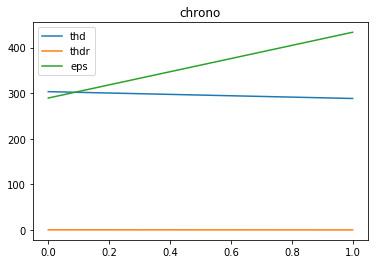

In [58]:
plot_thd_thdr(thd_list, thdr_list, eps_list, order)

## Stage 6. Taxonomy generator

In [26]:
#output_file =
start = timeit.default_timer()
dataset = dataset_genreator("random", 1, clean_txt_folder)
terms = term_extractor.extract_terms(dataset)#, verbose=False)
terms = tf(terms)

threshold_match = 0.9
threshold_combine = 0.6
to_merge = {}
to_combine = {}
for k in range(len(terms)):
    temp = terms.iloc[[k]]["term"]
    temp2 = terms.iloc[[k]]["term"].tolist()[0]
    term = str(terms.iloc[[k]]["term"].tolist()[0])
    merge_list = []
    combine_list = []
    for j in range(k+1,len(terms)):
        if jaro_sim(str(term), str(terms.iloc[[j]]["term"].tolist()[0])) > threshold_match:
            merge_list.append(str(terms.iloc[[j]]["term"].tolist()[0]))
            terms.drop(terms.index[j])
        elif jaro_sim(str(term), str(terms.iloc[[j]]["term"].tolist()[0])) > threshold_combine:
            combine_list.append(str(terms.iloc[[j]]["term"].tolist()[0]))
    if len(merge_list)>0:
        to_merge[term] = merge_list
    if len(combine_list) > 0:
        to_combine[term] = combine_list
stop = timeit.default_timer()
print("Elapsed time: {} s".format(stop-start))


Getting 1 docs in random order
1 / 225 Applying Local Search to Temporal Reasoning  J. Thornton, M. Beaumont and A. Sattar  School of Information Technology,  Griffith University Gold Coast,  Southport, Qld, Australia 4215  {j.thornton, m.beaumont, a.sattar}@mailbox.gu.edu.au  Abstract  Local search techniques have attracted considerable interest in the Artificial Intelligence (AI) community since the  development of GSAT [9] and the min-conflicts heuristic  [5] for solving large propositional satisfiability (SAT) problems and binary Constraint Satisfaction Problems (CSPs)  respectively.
2 / 225 Newer SAT techniques, such as the Discrete  Langrangian Method (DLM) [10], have significantly improved on GSAT and can also be applied to general constraint satisfaction and optimisation.
3 / 225 However, local search  has yet to be successfully employed in solving Temporal  Constraint Satisfaction Problems (TCSPs).
4 / 225 In this paper we argue that current formalisms for representing TCSPs a

55 / 225 These techniques search for a  consistent solution by eliminating basic relations from each  disjunctive constraint (or interval formula).
56 / 225 A significant  group of tractable sub-classes of IA have been identified  for which finding a path-consistent scenario is sufficient to  guarantee full consistency [7].
57 / 225 These sub-classes are subsets of the 213 possible interval formulas allowed in the full  IA.
58 / 225 IA algorithms exploit this information by searching for  path-consistent scenarios that only contain formulas from a  given tractable subset.
59 / 225 This is more efficient than searching for a single basic relation from each formula.
60 / 225 In addition, specialised ordering heuristics have been developed  that further improve the performance of backtracking on full  IA [11].
61 / 225 3.2.
62 / 225 Local Search and TCSPs  Unfortunately, little of this work is of direct relevance in  applying local search to IA.
63 / 225 The basic principle behind a  hill

123 / 225 Similarly, the longest path to oi (assuming  the worst ordering) is given by:  ¬(X − < Y − ) ∧ ¬(X − = Y − ) ∧ ¬(X − = Y + )∧  ¬(X − > Y + ) ∧ ¬(X + < Y + ) ∧ ¬(X + = Y + )  Using interval formulas, we can construct comparison trees  for each member of the subset of the 213 possible disjunctions that appear in a particular problem.
124 / 225 We term this type  X−  X−  X+  »» ?XXXX  »»»  XX  »  »  9  z >  X  <  =  Y−  ©  ?
125 / 225 ?
126 / 225 © ?
127 / 225 R  @  ¼  ©  (< )  (< )  <  = > Y+  H  ª?H  ¡  ?
128 / 225 ?
129 / 225 ?
130 / 225 ?
131 / 225 j>  H  < =  (> )  (> )  (> ) (> ) Y −  ?
132 / 225 ?
133 / 225 ¡  ª?
134 / 225 R  @  X + (< ) (< ) <  b  m  o  =  fi  >  di  ¡  ª?
135 / 225 R  @  <  s  =  eq  >  si  ¡  ª?
136 / 225 R  @  <  d  =  f  >  oi  ?
137 / 225 ?
138 / 225 (> ) (> ) Y +  mi bi  Figure 2.
139 / 225 End-point Comparison Tree for the  13 Basic Relations  X−  X−  <  »»  9  »  ?
140 / 225 ª HH  ¡  j  H  »»»  » XX  XX  XX  z  X  (< )  X+ <  ?
141 / 225 X + (< 

223 / 225 [12] M. Vilain and H. Kautz.
224 / 225 Constraint propagation algorithms  for temporal reasoning.
225 / 225 In Proceedings of the Fifth National  Conference on Artificial Intelligence (AAAI-86), pages 377–  382, 1986.
573
Elapsed time: 174.118080098 s


All results are saved to output.txt folder.
##### Elapsed time: 174.118080098 s

### Sample output:
###### Please think about merging next terms as they are pretty similar
basic time units with ['basic time unit']

time unit with ['time units']

information systems with ['informatik systeme']

overall workow execution with ['overall workow duration']


###### Please think about combining somehow next terms
process management with ['process reengineering purposes', 'time management tries', 'process priorities']

time histogram with ['time violations', 'time problems', 'time property', 'time vi olations', 'time restrictions', 'time unit', 'time line', 'time model', 'time units', 'timely manner', 'timed graph', 'time interval', 'time value', 'time constraint violations', 'time management tries', 'time in workow systems', 'time management problems']

latest allowed end blae with ['latest allowed start time']

time interval with ['time value', 'valid time interval', 'time constraint violations', 'time management tries', 'time in workow systems', 'time management problems']

green orange with ['cepe ', 'green everything']